<h1 style="text-align:center;font-size:30px;" > Quora Question Pairs </h1>

<h1> 1. Business Problem </h1>

<h2> 1.1 Description </h2>

<p>Quora is a place to gain and share knowledge—about anything. It’s a platform to ask questions and connect with people who contribute unique insights and quality answers. This empowers people to learn from each other and to better understand the world.</p>
<p>
Over 100 million people visit Quora every month, so it's no surprise that many people ask similarly worded questions. Multiple questions with the same intent can cause seekers to spend more time finding the best answer to their question, and make writers feel they need to answer multiple versions of the same question. Quora values canonical questions because they provide a better experience to active seekers and writers, and offer more value to both of these groups in the long term.
</p>


__Problem Statement__
- Identify which questions asked on Quora are duplicates of questions that have already been asked. 
- This could be useful to instantly provide answers to questions that have already been answered. 
- We are tasked with predicting whether a pair of questions are duplicates or not. 

<h1>2. Machine Learning Probelm </h1>

<h2> 2.1 Data </h2>

<h3> 2.1.1 Data Overview </h3>

<p> 
- Data will be in a file Train.csv <br>
- Train.csv contains 5 columns : qid1, qid2, question1, question2, is_duplicate <br>
- Size of Train.csv - 60MB <br>
- Number of rows in Train.csv = 404,290
</p>

<h3> 2.1.2 Example Data point </h3>

<pre>
"id","qid1","qid2","question1","question2","is_duplicate"
"0","1","2","What is the step by step guide to invest in share market in india?","What is the step by step guide to invest in share market?","0"
"1","3","4","What is the story of Kohinoor (Koh-i-Noor) Diamond?","What would happen if the Indian government stole the Kohinoor (Koh-i-Noor) diamond back?","0"
"7","15","16","How can I be a good geologist?","What should I do to be a great geologist?","1"
"11","23","24","How do I read and find my YouTube comments?","How can I see all my Youtube comments?","1"
</pre>

<h2> 2.2 Mapping the real world problem to an ML problem </h2>

<p> It is a binary classification problem, for a given pair of questions we need to predict if they are duplicate or not. </p>

<h2> 2.3 Train and Test Construction </h2>

<p>  </p>
<p> We build train and test by randomly splitting in the ratio of 70:30 or 80:20 whatever we choose as we have sufficient points to work with. </p>

<h1>3. Exploratory Data Analysis </h1>

In [ ]:
!pip3 install distance

In [ ]:
!pip3 install fuzzywuzzy

In [68]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from subprocess import check_output
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc

import re
from nltk.corpus import stopwords
import distance
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
import re
from nltk.corpus import stopwords
# This package is used for finding longest common subsequence between two strings
# you can write your own dp code for this
import distance
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
from fuzzywuzzy import fuzz
from sklearn.manifold import TSNE
# Import the Required lib packages for WORD-Cloud generation
# https://stackoverflow.com/questions/45625434/how-to-install-wordcloud-in-python3-6
from wordcloud import WordCloud, STOPWORDS
from os import path
from PIL import Image


from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from datetime import datetime

<h2> 3.1 Reading data and basic stats </h2>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


df = pd.read_csv("/content/drive/My Drive/Quora/train.csv")
print("Number of data points:",df.shape[0])

In [69]:
df = pd.read_csv("train.csv")
print("Number of data points:",df.shape[0])

Number of data points: 404290


In [70]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
id              404290 non-null int64
qid1            404290 non-null int64
qid2            404290 non-null int64
question1       404289 non-null object
question2       404288 non-null object
is_duplicate    404290 non-null int64
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


We are given a minimal number of data fields here, consisting of:

- id:  Looks like a simple rowID
- qid{1, 2}:  The unique ID of each question in the pair
- question{1, 2}:  The actual textual contents of the questions.
- is_duplicate:  The label that we are trying to predict - whether the two questions are duplicates of each other.

<h3> 3.2.1 Distribution of data points among output classes</h3>
- Number of duplicate(smilar) and non-duplicate(non similar) questions

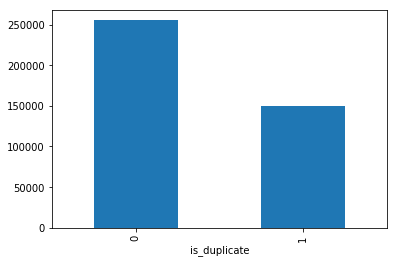

In [72]:
df.groupby("is_duplicate")['id'].count().plot.bar()

In [73]:
print('~> Question pairs are not Similar (is_duplicate = 0):\n   {}%'.format(100 - round(df['is_duplicate'].mean()*100, 2)))
print('\n~> Question pairs are Similar (is_duplicate = 1):\n   {}%'.format(round(df['is_duplicate'].mean()*100, 2)))

~> Question pairs are not Similar (is_duplicate = 0):
   63.08%

~> Question pairs are Similar (is_duplicate = 1):
   36.92%


<h3> 3.2.2 Number of unique questions </h3>

In [74]:
qids = pd.Series(df['qid1'].tolist() + df['qid2'].tolist())
unique_qs = len(np.unique(qids))
qs_morethan_onetime = np.sum(qids.value_counts() > 1)
print ('Total number of  Unique Questions are: {}\n'.format(unique_qs))
#print len(np.unique(qids))

print ('Number of unique questions that appear more than one time: {} ({}%)\n'.format(qs_morethan_onetime,qs_morethan_onetime/unique_qs*100))

print ('Max number of times a single question is repeated: {}\n'.format(max(qids.value_counts()))) 

q_vals=qids.value_counts()

q_vals=q_vals.values

Total number of  Unique Questions are: 537933

Number of unique questions that appear more than one time: 111780 (20.77953945937505%)

Max number of times a single question is repeated: 157



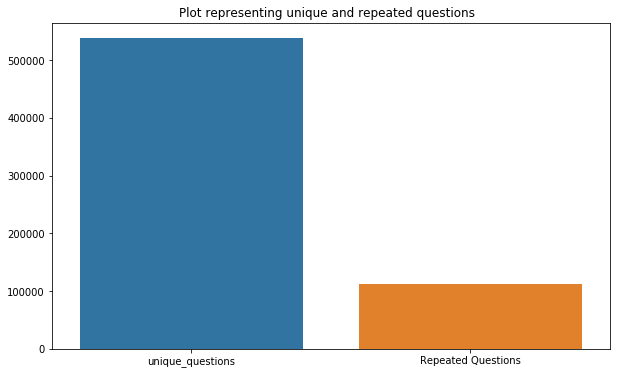

In [75]:

x = ["unique_questions" , "Repeated Questions"]
y =  [unique_qs , qs_morethan_onetime]

plt.figure(figsize=(10, 6))
plt.title ("Plot representing unique and repeated questions  ")
sns.barplot(x,y)
plt.show()

<h3>3.2.3 Checking for Duplicates </h3>

In [76]:
#checking whether there are any repeated pair of questions

pair_duplicates = df[['qid1','qid2','is_duplicate']].groupby(['qid1','qid2']).count().reset_index()

print ("Number of duplicate questions",(pair_duplicates).shape[0] - df.shape[0])

Number of duplicate questions 0


<h3> 3.2.4 Number of occurrences of each question </h3>

Maximum number of times a single question is repeated: 157



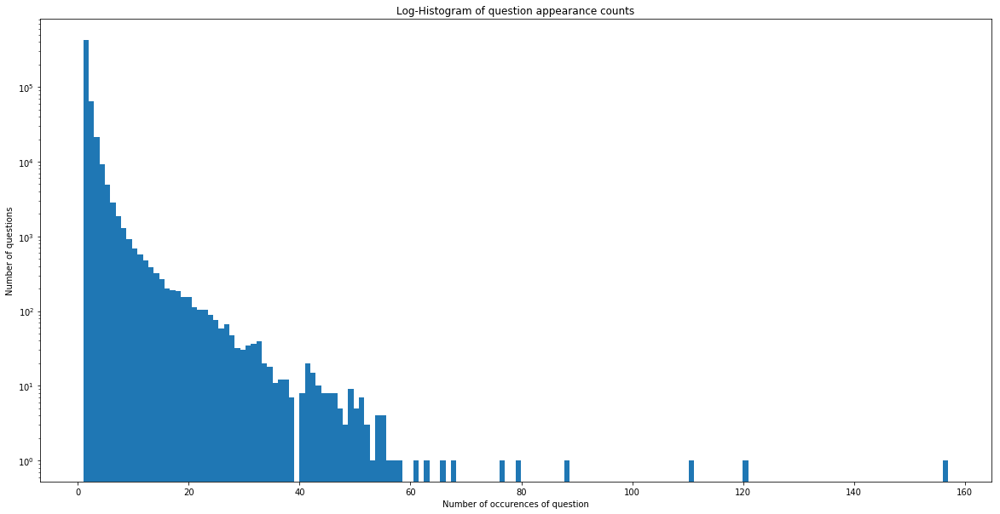

In [77]:
plt.figure(figsize=(20, 10))

plt.hist(qids.value_counts(), bins=160)

plt.yscale('log', nonposy='clip')

plt.title('Log-Histogram of question appearance counts')

plt.xlabel('Number of occurences of question')

plt.ylabel('Number of questions')

print ('Maximum number of times a single question is repeated: {}\n'.format(max(qids.value_counts()))) 

<h3> 3.2.5 Checking for NULL values </h3>

In [78]:
#Checking whether there are any rows with null values
nan_rows = df[df.isnull().any(1)]
print (nan_rows)

# Filling the null values with ' '
df = df.fillna('')
nan_rows = df[df.isnull().any(1)]
print (nan_rows)

            id    qid1    qid2                         question1  \
105780  105780  174363  174364    How can I develop android app?   
201841  201841  303951  174364  How can I create an Android app?   
363362  363362  493340  493341                               NaN   

                                                question2  is_duplicate  
105780                                                NaN             0  
201841                                                NaN             0  
363362  My Chinese name is Haichao Yu. What English na...             0  
Empty DataFrame
Columns: [id, qid1, qid2, question1, question2, is_duplicate]
Index: []


## 3.2.6 Train-Test Split

In [83]:
y = df['is_duplicate']

X_train,X_test, y_train, y_test = train_test_split(df, y, stratify=y, test_size=0.3)
print("Shape of train data",X_train.shape)
print("Shape of test data",X_test.shape)

Shape of train data (283003, 6)
Shape of test data (121287, 6)


<h2>3.3 Basic Feature Extraction (before cleaning) </h2>

Let us now construct a few features like:
 - ____freq_qid1____ = Frequency of qid1's
 - ____freq_qid2____ = Frequency of qid2's 
 - ____q1len____ = Length of q1
 - ____q2len____ = Length of q2
 - ____q1_n_words____ = Number of words in Question 1
 - ____q2_n_words____ = Number of words in Question 2
 - ____word_Common____ = (Number of common unique words in Question 1 and Question 2)
 - ____word_Total____ =(Total num of words in Question 1 + Total num of words in Question 2)
 - ____word_share____ = (word_common)/(word_Total)
 - ____freq_q1+freq_q2____ = sum total of frequency of qid1 and qid2 
 - ____freq_q1-freq_q2____ = absolute difference of frequency of qid1 and qid2 

In [84]:
if os.path.isfile('df_fe_without_preprocessing_train_2.csv'): 
    X_train = pd.read_csv("df_fe_without_preprocessing_train_2.csv",encoding='latin-1') 
else:
    X_train['freq_qid1'] = X_train.groupby('qid1')['qid1'].transform('count') 
    X_train['freq_qid2'] = X_train.groupby('qid2')['qid2'].transform('count')

    X_train['q1len']      = X_train['question1'].str.len() 
    X_train['q2len']      = X_train['question2'].str.len()
    X_train['q1_n_words'] = X_train['question1'].apply(lambda row: len(row.split(" ")))
    X_train['q2_n_words'] = X_train['question2'].apply(lambda row: len(row.split(" ")))

    def normalized_word_Common(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * len(w1 & w2)
    X_train['word_Common'] = X_train.apply(normalized_word_Common, axis=1)

    def normalized_word_Total(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * (len(w1) + len(w2))
    X_train['word_Total'] = X_train.apply(normalized_word_Total, axis=1)

    def normalized_word_share(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * len(w1 & w2)/(len(w1) + len(w2))
    X_train['word_share'] = X_train.apply(normalized_word_share, axis=1)

    X_train['freq_q1+q2'] = X_train['freq_qid1']+X_train['freq_qid2']
    X_train['freq_q1-q2'] = abs(X_train['freq_qid1']-X_train['freq_qid2'])
  
    X_train.to_csv("df_fe_without_preprocessing_train_2.csv", index=False) 



In [85]:
X_train.head()

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
285703,285703,406160,405642,What problems do you have when travelling abroad?,What are the main problems you have experience...,1,2,2,49,71,8,12,5.0,20.0,0.250000,4,0
251506,251506,365630,365631,What is the average monthly rent for a studio ...,Some people have so much money and some have b...,0,1,1,56,140,11,27,0.0,30.0,0.000000,2,0
365413,365413,32413,79685,How can I join Indian Air Force after be in me...,"How to Join Indian Army,After Engineering?",1,7,3,67,42,12,6,4.0,18.0,0.222222,10,4
175645,175645,270405,212606,What can I do to become an investment banker?,What is an investment banker? How can one beco...,0,2,2,45,70,9,12,6.0,18.0,0.333333,4,0
20421,20421,38521,38522,I'm tired of my dad always criticising or insu...,I am a young adult woman and I've never had a ...,0,1,1,144,103,28,21,5.0,45.0,0.111111,2,0


<h3> 3.3.1 Analysis of some of the extracted features </h3>

In [86]:
print ("Minimum length of the questions in question1 : " , min(X_train['q1_n_words']))

print ("Minimum length of the questions in question2 : " , min(X_train['q2_n_words']))

print ("Number of Questions with minimum length [question1] :", X_train[X_train['q1_n_words']== 1].shape[0])
print ("Number of Questions with minimum length [question2] :", X_train[X_train['q2_n_words']== 1].shape[0])

Minimum length of the questions in question1 :  1
Minimum length of the questions in question2 :  1
Number of Questions with minimum length [question1] : 52
Number of Questions with minimum length [question2] : 19


<h4> 3.3.1.1 Feature: word_share </h4>

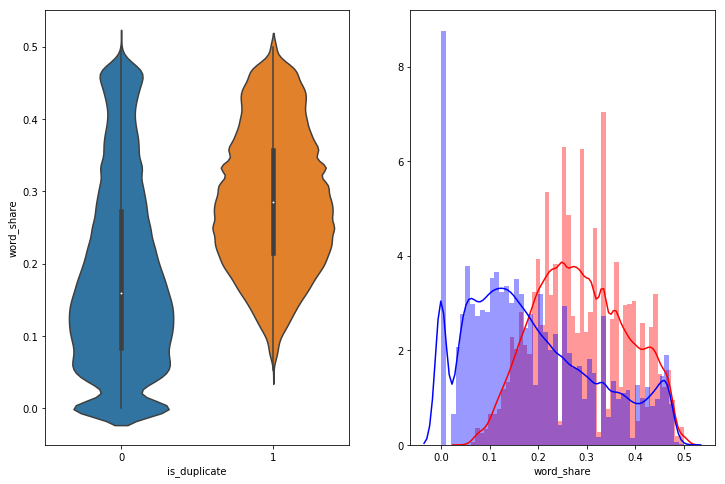

In [87]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_share', data = X_train[0:])

plt.subplot(1,2,2)
sns.distplot(X_train[X_train['is_duplicate'] == 1.0]['word_share'][0:] , label = "1", color = 'red')
sns.distplot(X_train[X_train['is_duplicate'] == 0.0]['word_share'][0:] , label = "0" , color = 'blue' )
plt.show()

- The distributions for normalized word_share have some overlap on the far right-hand side, i.e., there are quite a lot of questions with high word similarity
- The average word share and Common no. of words of qid1 and qid2 is more when they are duplicate(Similar)

<h4> 3.3.1.2 Feature: word_Common </h4>

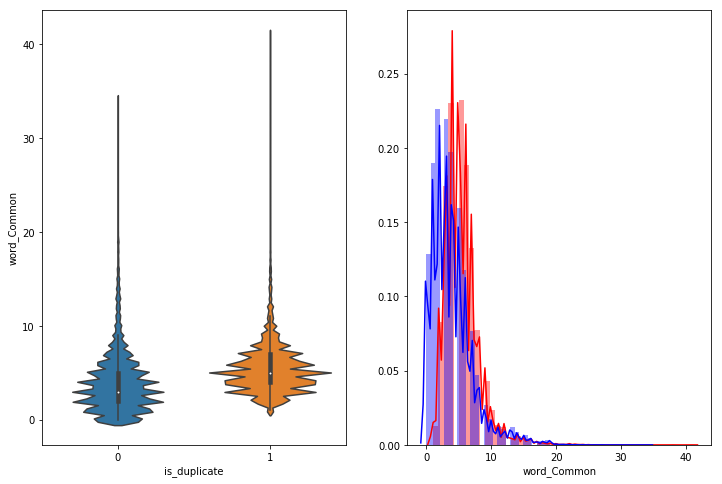

In [88]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_Common', data = X_train[0:])

plt.subplot(1,2,2)
sns.distplot(X_train[X_train['is_duplicate'] == 1.0]['word_Common'][0:] , label = "1", color = 'red')
sns.distplot(X_train[X_train['is_duplicate'] == 0.0]['word_Common'][0:] , label = "0" , color = 'blue' )
plt.show()

<h2> 3.4 Preprocessing of Text </h2>

In [89]:
# To get the results in 4 decemal points
SAFE_DIV = 0.0001
import nltk
nltk.download('stopwords')
STOP_WORDS = stopwords.words("english")


def preprocess(x):
    x = str(x).lower()
    x = x.replace(",000,000", "m").replace(",000", "k").replace("′", "'").replace("’", "'")\
                           .replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
                           .replace("n't", " not").replace("what's", "what is").replace("it's", "it is")\
                           .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
                           .replace("he's", "he is").replace("she's", "she is").replace("'s", " own")\
                           .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar ")\
                           .replace("€", " euro ").replace("'ll", " will")
    x = re.sub(r"([0-9]+)000000", r"\1m", x)
    x = re.sub(r"([0-9]+)000", r"\1k", x)
    
    
    porter = PorterStemmer()
    pattern = re.compile('\W')
    
    if type(x) == type(''):
        x = re.sub(pattern, ' ', x)
    
    
    if type(x) == type(''):
        x = porter.stem(x)
        example1 = BeautifulSoup(x)
        x = example1.get_text()
               
    
    return x
    

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/karthik/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


<h2> 3.5 Advanced Feature Extraction (NLP and Fuzzy Features) </h2>

Definition:
- __Token__: You get a token by splitting sentence a space
- __Stop_Word__ : stop words as per NLTK.
- __Word__ : A token that is not a stop_word


Features:
- __cwc_min__ :  Ratio of common_word_count to min lenghth of word count of Q1 and Q2 <br>cwc_min = common_word_count / (min(len(q1_words), len(q2_words))
<br>
<br>
- __cwc_max__ :  Ratio of common_word_count to max lenghth of word count of Q1 and Q2 <br>cwc_max = common_word_count / (max(len(q1_words), len(q2_words))
<br>
<br>
- __csc_min__ :  Ratio of common_stop_count to min lenghth of stop count of Q1 and Q2 <br> csc_min = common_stop_count / (min(len(q1_stops), len(q2_stops))
<br>
<br>
- __csc_max__ :  Ratio of common_stop_count to max lenghth of stop count of Q1 and Q2<br>csc_max = common_stop_count / (max(len(q1_stops), len(q2_stops))
<br>
<br>
- __ctc_min__ :  Ratio of common_token_count to min lenghth of token count of Q1 and Q2<br>ctc_min = common_token_count / (min(len(q1_tokens), len(q2_tokens))
<br>
<br>

- __ctc_max__ :  Ratio of common_token_count to max lenghth of token count of Q1 and Q2<br>ctc_max = common_token_count / (max(len(q1_tokens), len(q2_tokens))
<br>
<br>
        
- __last_word_eq__ :  Check if First word of both questions is equal or not<br>last_word_eq = int(q1_tokens[-1] == q2_tokens[-1])
<br>
<br>

- __first_word_eq__ :  Check if First word of both questions is equal or not<br>first_word_eq = int(q1_tokens[0] == q2_tokens[0])
<br>
<br>
        
- __abs_len_diff__ :  Abs. length difference<br>abs_len_diff = abs(len(q1_tokens) - len(q2_tokens))
<br>
<br>

- __mean_len__ :  Average Token Length of both Questions<br>mean_len = (len(q1_tokens) + len(q2_tokens))/2
<br>
<br>


- __fuzz_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>

- __fuzz_partial_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_sort_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_set_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>





- __longest_substr_ratio__ :  Ratio of length longest common substring to min lenghth of token count of Q1 and Q2<br>longest_substr_ratio = len(longest common substring) / (min(len(q1_tokens), len(q2_tokens))


In [90]:
def get_token_features(q1, q2):
    token_features = [0.0]*10
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features
    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    token_features[8] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    token_features[9] = (len(q1_tokens) + len(q2_tokens))/2
    return token_features


In [91]:
# get the Longest Common sub string

def get_longest_substr_ratio(a, b):
    strs = list(distance.lcsubstrings(a, b))
    if len(strs) == 0:
        return 0
    else:
        return len(strs[0]) / (min(len(a), len(b)) + 1)


In [92]:
def extract_features(df):
    # preprocessing each question
    df["question1"] = df["question1"].fillna("").apply(preprocess)
    df["question2"] = df["question2"].fillna("").apply(preprocess)

    print("token features...")
    
    # Merging Features with dataset
    
    token_features = df.apply(lambda x: get_token_features(x["question1"], x["question2"]), axis=1)
    
    df["cwc_min"]       = list(map(lambda x: x[0], token_features))
    df["cwc_max"]       = list(map(lambda x: x[1], token_features))
    df["csc_min"]       = list(map(lambda x: x[2], token_features))
    df["csc_max"]       = list(map(lambda x: x[3], token_features))
    df["ctc_min"]       = list(map(lambda x: x[4], token_features))
    df["ctc_max"]       = list(map(lambda x: x[5], token_features))
    df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
    df["first_word_eq"] = list(map(lambda x: x[7], token_features))
    df["abs_len_diff"]  = list(map(lambda x: x[8], token_features))
    df["mean_len"]      = list(map(lambda x: x[9], token_features))
   
    #Computing Fuzzy Features and Merging with Dataset
    
    # do read this blog: http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
    # https://stackoverflow.com/questions/31806695/when-to-use-which-fuzz-function-to-compare-2-strings
    # https://github.com/seatgeek/fuzzywuzzy
    print("fuzzy features..")

    df["token_set_ratio"]       = df.apply(lambda x: fuzz.token_set_ratio(x["question1"], x["question2"]), axis=1)
    # The token sort approach involves tokenizing the string in question, sorting the tokens alphabetically, and 
    # then joining them back into a string We then compare the transformed strings with a simple ratio().
    df["token_sort_ratio"]      = df.apply(lambda x: fuzz.token_sort_ratio(x["question1"], x["question2"]), axis=1)
    df["fuzz_ratio"]            = df.apply(lambda x: fuzz.QRatio(x["question1"], x["question2"]), axis=1)
    df["fuzz_partial_ratio"]    = df.apply(lambda x: fuzz.partial_ratio(x["question1"], x["question2"]), axis=1)
    df["longest_substr_ratio"]  = df.apply(lambda x: get_longest_substr_ratio(x["question1"], x["question2"]), axis=1)
    return df

In [93]:
if os.path.isfile('nlp_features_train_2.csv'):
    fe_2 = pd.read_csv("nlp_features_train_2.csv",encoding='latin-1')
    fe_2.fillna('')
else:
    print("Extracting features for train:")
    fe_2 = pd.read_csv("df_fe_without_preprocessing_train_2.csv")
    fe_2 = extract_features(fe_2)
    fe_2.to_csv("nlp_features_train_2.csv", index=False)
fe_2.head()

Extracting features for train:
token features...
fuzzy features..


,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,285703,406160,405642,what problems do you have when travelling abroad,what are the main problems you have experience...,1,2,2,49,71,...,0.416663,1.0,1.0,4.0,10.0,75,66,66,63,0.200000
1,251506,365630,365631,what is the average monthly rent for a studio ...,some people have so much money and some have b...,0,1,1,56,140,...,0.000000,0.0,0.0,16.0,19.0,29,30,29,43,0.087719
2,365413,32413,79685,how can i join indian air force after be in me...,how to join indian army after engineering,1,7,3,67,42,...,0.416663,1.0,1.0,5.0,9.5,89,69,69,67,0.325581
3,175645,270405,212606,what can i do to become an investment banker,what is an investment banker how can one beco...,0,2,2,45,70,...,0.499996,1.0,1.0,3.0,10.5,92,73,67,84,0.630435
4,20421,38521,38522,i am tired of my dad always criticising or ins...,i am a young adult woman and i have never had ...,0,1,1,144,103,...,0.225806,0.0,1.0,9.0,26.5,42,44,41,44,0.075472


In [94]:
fe_2.head()

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,285703,406160,405642,what problems do you have when travelling abroad,what are the main problems you have experience...,1,2,2,49,71,...,0.416663,1.0,1.0,4.0,10.0,75,66,66,63,0.200000
1,251506,365630,365631,what is the average monthly rent for a studio ...,some people have so much money and some have b...,0,1,1,56,140,...,0.000000,0.0,0.0,16.0,19.0,29,30,29,43,0.087719
2,365413,32413,79685,how can i join indian air force after be in me...,how to join indian army after engineering,1,7,3,67,42,...,0.416663,1.0,1.0,5.0,9.5,89,69,69,67,0.325581
3,175645,270405,212606,what can i do to become an investment banker,what is an investment banker how can one beco...,0,2,2,45,70,...,0.499996,1.0,1.0,3.0,10.5,92,73,67,84,0.630435
4,20421,38521,38522,i am tired of my dad always criticising or ins...,i am a young adult woman and i have never had ...,0,1,1,144,103,...,0.225806,0.0,1.0,9.0,26.5,42,44,41,44,0.075472


<h3>3.5.1 Analysis of extracted features </h3>

<h4> 3.5.1.1 Plotting Word clouds</h4>

- Creating Word Cloud of Duplicates and Non-Duplicates Question pairs
- We can observe the most frequent occuring words

In [95]:
df_duplicate = fe_2[fe_2['is_duplicate'] == 1]
dfp_nonduplicate = fe_2[fe_2['is_duplicate'] == 0]

# Converting 2d array of q1 and q2 and flatten the array: like {{1,2},{3,4}} to {1,2,3,4}
p = np.dstack([df_duplicate["question1"], df_duplicate["question2"]]).flatten()
n = np.dstack([dfp_nonduplicate["question1"], dfp_nonduplicate["question2"]]).flatten()

print ("Number of data points in class 1 (duplicate pairs) :",len(p))
print ("Number of data points in class 0 (non duplicate pairs) :",len(n))

#Saving the np array into a text file
np.savetxt('train_p.txt', p, delimiter=' ', fmt='%s')
np.savetxt('train_n.txt', n, delimiter=' ', fmt='%s')

Number of data points in class 1 (duplicate pairs) : 208968
Number of data points in class 0 (non duplicate pairs) : 357038


In [96]:
# reading the text files and removing the Stop Words:
d = path.dirname('.')

textp_w = open(path.join(d, 'train_p.txt')).read()
textn_w = open(path.join(d, 'train_n.txt')).read()
stopwords = set(STOPWORDS)
stopwords.add("said")
stopwords.add("br")
stopwords.add(" ")
stopwords.remove("not")

stopwords.remove("no")
#stopwords.remove("good")
#stopwords.remove("love")
stopwords.remove("like")
#stopwords.remove("best")
#stopwords.remove("!")
print ("Total number of words in duplicate pair questions :",len(textp_w))
print ("Total number of words in non duplicate pair questions :",len(textn_w))

Total number of words in duplicate pair questions : 11269058
Total number of words in non duplicate pair questions : 23236508


__Word Clouds generated from  duplicate pair question's text__

Word Cloud for Duplicate Question pairs


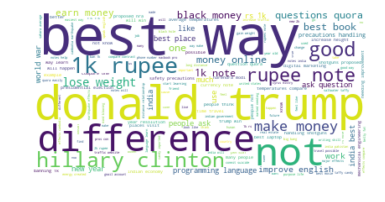

In [97]:
wc = WordCloud(background_color="white", max_words=len(textp_w), stopwords=stopwords)
wc.generate(textp_w)
print ("Word Cloud for Duplicate Question pairs")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

__Word Clouds generated from non duplicate pair question's text__

Word Cloud for non-Duplicate Question pairs:


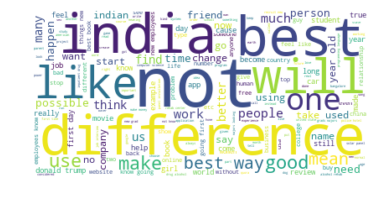

In [98]:
wc = WordCloud(background_color="white", max_words=len(textn_w),stopwords=stopwords)
# generate word cloud
wc.generate(textn_w)
print ("Word Cloud for non-Duplicate Question pairs:")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

<h4> 3.5.1.2 Pair plot of features ['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'] </h4>

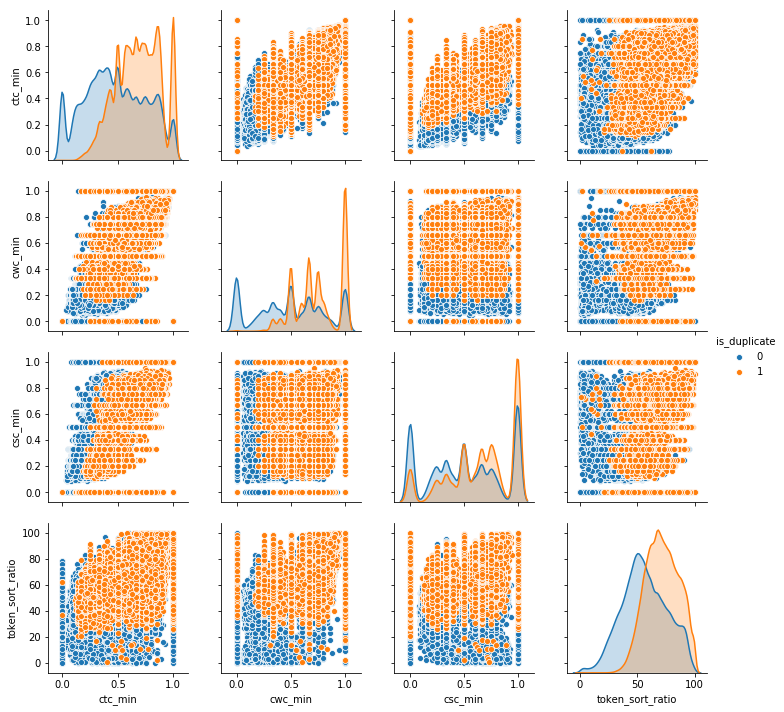

In [99]:
n = fe_2.shape[0]
sns.pairplot(fe_2[['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio', 'is_duplicate']][0:n], hue='is_duplicate', vars=['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'])
plt.show()

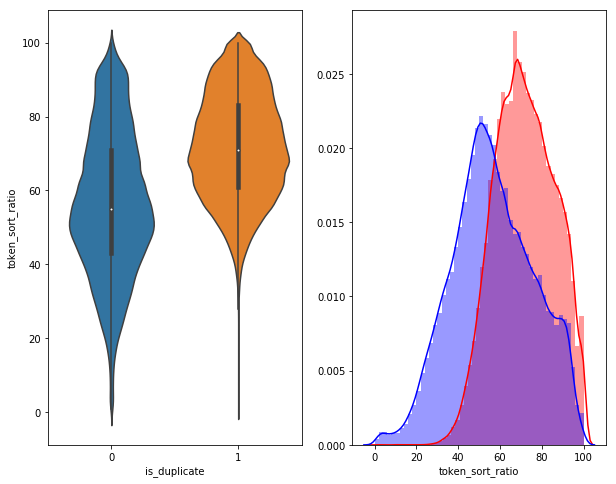

In [100]:
# Distribution of the token_sort_ratio
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'token_sort_ratio', data = fe_2[0:] , )

plt.subplot(1,2,2)
sns.distplot(fe_2[fe_2['is_duplicate'] == 1.0]['token_sort_ratio'][0:] , label = "1", color = 'red')
sns.distplot(fe_2[fe_2['is_duplicate'] == 0.0]['token_sort_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

<h3>3.5.2 Visualization </h3>

In [101]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

dfp_subsampled = fe_2[0:5000]
X = MinMaxScaler().fit_transform(dfp_subsampled[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = dfp_subsampled['is_duplicate'].values

In [102]:
tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.301s...
[t-SNE] Computed neighbors for 5000 samples in 0.432s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.146128
[t-SNE] Computed conditional probabilities in 0.598s
[t-SNE] Iteration 50: error = 82.7758484, gradient norm = 0.0432083 (50 iterations in 3.278s)
[t-SNE] Iteration 100: error = 71.1231232, gradient norm = 0.0091459 (50 iterations in 2.070s)
[t-SNE] Iteration 150: error = 69.4391174, gradient norm = 0.0052462 (50 iterations in 2.157s)
[t-SNE] Iteration 200: error = 68.7587738, gradient norm = 0.0038326 (50 iterations in 1.904s)
[t-SNE] Iteration 250: error = 68.3590469, gradient norm = 0.0033802

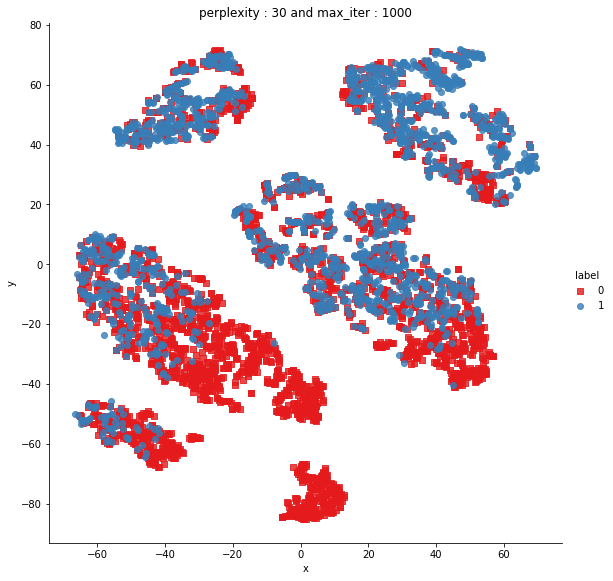

In [103]:
df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])
plt.title("perplexity : {} and max_iter : {}".format(30, 1000))
plt.show()

In [104]:
from sklearn.manifold import TSNE
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.012s...
[t-SNE] Computed neighbors for 5000 samples in 0.434s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.146128
[t-SNE] Computed conditional probabilities in 0.348s
[t-SNE] Iteration 50: error = 83.8079529, gradient norm = 0.0319109 (50 iterations in 15.014s)
[t-SNE] Iteration 100: error = 70.1896210, gradient norm = 0.0032695 (50 iterations in 10.032s)
[t-SNE] Iteration 150: error = 68.9511337, gradient norm = 0.0018513 (50 iterations in 9.119s)
[t-SNE] Iteration 200: error = 68.3918915, gradient norm = 0.0011585 (50 iterations in 9.855s)
[t-SNE] Iteration 250: error = 68.0562286, gradient norm = 0.00101

In [105]:
trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

In [106]:
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm import tqdm

import spacy

In [107]:
fe_2['question1'] = fe_2['question1'].apply(lambda x: str(x))
fe_2['question2'] = fe_2['question2'].apply(lambda x: str(x))

In [108]:
questions_train = list(fe_2['question1']) + list(fe_2['question2'])

vectorizer_tfidf_questions = TfidfVectorizer(min_df=40)
vectorizer_tfidf_questions.fit(questions_train)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=40, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [109]:
questions1_tfidf_train = vectorizer_tfidf_questions.transform(fe_2['question1'])
print("Shape of matrix after one hot encoding ",questions1_tfidf_train.shape)

# dict key:word and value:tf-idf score
word2tfidf = dict(zip(vectorizer_tfidf_questions.get_feature_names(), vectorizer_tfidf_questions.idf_))

Shape of matrix after one hot encoding  (283003, 7780)


In [110]:
questions2_tfidf_train = vectorizer_tfidf_questions.transform(fe_2['question2'])
print("Shape of matrix after one hot encoding ",questions2_tfidf_train.shape)


Shape of matrix after one hot encoding  (283003, 7780)


In [113]:
word2vec_fe = fe_2
word2vec_fe[word2vec_fe['question1']=='']

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
7783,273065,391451,380455,,how can i describe quora in all its glory to...,0,1,1,1,55,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
17224,402423,535899,119568,,what is cisco router technical support phone n...,0,1,4,1,52,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
36710,189659,161071,288480,,who is noah,0,2,1,1,12,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
54298,20794,39204,39205,,what is the gmail tech support help phone number,0,1,1,1,49,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
85436,134403,214814,214815,,what is your take on the undercover report tha...,0,2,1,1,144,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
103566,363362,493340,493341,,my chinese name is haichao yu what english na...,0,1,1,0,123,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
120828,3306,6553,6554,,why is cornell own endowment the lowest in the...,0,1,1,1,56,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
126018,254161,214814,368834,,how do i convince my non indian friends that n...,0,2,1,1,140,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
132465,301583,424494,424495,,what do i do with this guy,0,1,1,3,27,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0
133146,104101,171925,171926,,problem of solving a problem is not a problem ...,0,1,1,1,149,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0


In [134]:
# en_vectors_web_lg, which includes over 1 million unique vectors.
nlp = spacy.load('en_core_web_sm')

vecs1 = []
# https://github.com/noamraph/tqdm
# tqdm is used to print the progress bar
for qu1 in tqdm(list(word2vec_fe['question1'])):
    doc1 = nlp(qu1) 
    # 384 is the number of dimensions of vectors
    if(len(doc1)==0 ):
        vecs1.append([0])
    else:
        mean_vec1 = np.zeros([len(doc1), len(doc1[0].vector)])
        for word1 in doc1:
            # word2vec
            vec1 = word1.vector
            # fetch df score
            try:
                idf = word2tfidf[str(word1)]
            except:
                idf = 0
            # compute final vec
            mean_vec1 += vec1 * idf
        mean_vec1 = mean_vec1.mean(axis=0)
        vecs1.append(mean_vec1)
word2vec_fe['q1_feats_m'] = list(vecs1)



  0%|          | 0/283003 [00:00<?, ?it/s]

  0%|          | 1/283003 [00:01<150:40:04,  1.92s/it]

  0%|          | 2/283003 [00:02<128:07:54,  1.63s/it]

  0%|          | 3/283003 [00:04<117:44:17,  1.50s/it]

  0%|          | 4/283003 [00:05<104:42:19,  1.33s/it]

  0%|          | 5/283003 [00:06<105:47:00,  1.35s/it]

  0%|          | 6/283003 [00:07<109:25:05,  1.39s/it]

  0%|          | 7/283003 [00:09<108:55:42,  1.39s/it]

  0%|          | 8/283003 [00:10<107:19:05,  1.37s/it]

  0%|          | 9/283003 [00:11<97:51:50,  1.24s/it] 

  0%|          | 10/283003 [00:12<96:47:14,  1.23s/it]

  0%|          | 11/283003 [00:13<94:39:49,  1.20s/it]

  0%|          | 12/283003 [00:15<92:21:44,  1.17s/it]

  0%|          | 13/283003 [00:15<86:25:54,  1.10s/it]

  0%|          | 14/283003 [00:16<84:20:48,  1.07s/it]

  0%|          | 15/283003 [00:17<77:28:10,  1.01it/s]

  0%|          | 16/283003 [00:18<84:12:47,  1.07s/it]

  0%|          | 17/283003 [00:20<86:04:10,  1.09s/it]

  

  0%|          | 131/283003 [01:46<63:05:45,  1.25it/s]

  0%|          | 132/283003 [01:47<62:42:14,  1.25it/s]

  0%|          | 133/283003 [01:48<64:43:31,  1.21it/s]

  0%|          | 134/283003 [01:49<62:50:47,  1.25it/s]

  0%|          | 135/283003 [01:49<61:54:28,  1.27it/s]

  0%|          | 136/283003 [01:51<72:37:01,  1.08it/s]

  0%|          | 137/283003 [01:51<68:55:17,  1.14it/s]

  0%|          | 138/283003 [01:52<63:45:14,  1.23it/s]

  0%|          | 139/283003 [01:53<59:40:26,  1.32it/s]

  0%|          | 140/283003 [01:53<57:56:57,  1.36it/s]

  0%|          | 141/283003 [01:54<54:42:46,  1.44it/s]

  0%|          | 142/283003 [01:55<59:14:34,  1.33it/s]

  0%|          | 143/283003 [01:56<55:23:58,  1.42it/s]

  0%|          | 144/283003 [01:56<56:29:46,  1.39it/s]

  0%|          | 145/283003 [01:57<52:35:48,  1.49it/s]

  0%|          | 146/283003 [01:57<50:29:46,  1.56it/s]

  0%|          | 147/283003 [01:58<51:10:10,  1.54it/s]

  0%|          | 148/283003 [01

  0%|          | 260/283003 [03:08<47:01:25,  1.67it/s]

  0%|          | 261/283003 [03:09<48:50:34,  1.61it/s]

  0%|          | 262/283003 [03:09<45:00:48,  1.74it/s]

  0%|          | 263/283003 [03:10<40:54:00,  1.92it/s]

  0%|          | 264/283003 [03:11<48:05:45,  1.63it/s]

  0%|          | 265/283003 [03:12<57:51:41,  1.36it/s]

  0%|          | 266/283003 [03:12<53:23:04,  1.47it/s]

  0%|          | 267/283003 [03:13<47:20:20,  1.66it/s]

  0%|          | 268/283003 [03:13<45:35:16,  1.72it/s]

  0%|          | 269/283003 [03:14<47:30:04,  1.65it/s]

  0%|          | 270/283003 [03:15<60:05:44,  1.31it/s]

  0%|          | 271/283003 [03:17<94:10:17,  1.20s/it]

  0%|          | 272/283003 [03:19<100:43:46,  1.28s/it]

  0%|          | 273/283003 [03:20<94:40:14,  1.21s/it] 

  0%|          | 274/283003 [03:21<83:50:14,  1.07s/it]

  0%|          | 275/283003 [03:21<79:22:20,  1.01s/it]

  0%|          | 276/283003 [03:22<69:12:46,  1.13it/s]

  0%|          | 277/283003 [

  0%|          | 642/283003 [03:44<3:13:35, 24.31it/s]

  0%|          | 648/283003 [03:44<2:46:55, 28.19it/s]

  0%|          | 652/283003 [03:45<3:23:17, 23.15it/s]

  0%|          | 655/283003 [03:45<3:49:07, 20.54it/s]

  0%|          | 658/283003 [03:45<3:47:18, 20.70it/s]

  0%|          | 661/283003 [03:45<4:03:04, 19.36it/s]

  0%|          | 664/283003 [03:45<4:16:22, 18.35it/s]

  0%|          | 666/283003 [03:46<7:06:05, 11.04it/s]

  0%|          | 668/283003 [03:46<6:12:22, 12.64it/s]

  0%|          | 671/283003 [03:46<5:10:33, 15.15it/s]

  0%|          | 674/283003 [03:47<9:59:56,  7.84it/s]

  0%|          | 676/283003 [03:47<8:23:55,  9.34it/s]

  0%|          | 678/283003 [03:47<8:55:20,  8.79it/s]

  0%|          | 680/283003 [03:47<7:58:56,  9.82it/s]

  0%|          | 682/283003 [03:48<8:53:58,  8.81it/s]

  0%|          | 685/283003 [03:48<7:33:28, 10.38it/s]

  0%|          | 687/283003 [03:48<6:42:21, 11.69it/s]

  0%|          | 689/283003 [03:48<6:12:03, 12.6

  0%|          | 984/283003 [04:11<5:59:21, 13.08it/s]

  0%|          | 986/283003 [04:11<6:51:21, 11.43it/s]

  0%|          | 988/283003 [04:11<5:58:55, 13.10it/s]

  0%|          | 990/283003 [04:12<7:14:48, 10.81it/s]

  0%|          | 992/283003 [04:12<7:57:58,  9.83it/s]

  0%|          | 994/283003 [04:12<7:46:36, 10.07it/s]

  0%|          | 996/283003 [04:12<6:57:55, 11.25it/s]

  0%|          | 998/283003 [04:12<6:40:11, 11.74it/s]

  0%|          | 1000/283003 [04:12<6:35:08, 11.89it/s]

  0%|          | 1003/283003 [04:13<5:30:23, 14.23it/s]

  0%|          | 1005/283003 [04:13<5:48:04, 13.50it/s]

  0%|          | 1007/283003 [04:13<5:29:48, 14.25it/s]

  0%|          | 1009/283003 [04:13<5:08:39, 15.23it/s]

  0%|          | 1011/283003 [04:13<5:21:28, 14.62it/s]

  0%|          | 1013/283003 [04:13<5:06:02, 15.36it/s]

  0%|          | 1015/283003 [04:13<5:16:27, 14.85it/s]

  0%|          | 1017/283003 [04:14<7:57:01,  9.85it/s]

  0%|          | 1019/283003 [04:14<6:5

  0%|          | 1261/283003 [04:42<7:44:27, 10.11it/s]

  0%|          | 1263/283003 [04:43<8:25:07,  9.30it/s]

  0%|          | 1265/283003 [04:43<7:53:07,  9.92it/s]

  0%|          | 1267/283003 [04:43<8:48:53,  8.88it/s]

  0%|          | 1268/283003 [04:43<13:01:51,  6.01it/s]

  0%|          | 1270/283003 [04:43<11:06:16,  7.05it/s]

  0%|          | 1273/283003 [04:44<9:13:15,  8.49it/s] 

  0%|          | 1275/283003 [04:44<9:48:15,  7.98it/s]

  0%|          | 1278/283003 [04:44<8:48:54,  8.88it/s]

  0%|          | 1281/283003 [04:44<7:10:27, 10.91it/s]

  0%|          | 1283/283003 [04:45<9:21:10,  8.37it/s]

  0%|          | 1285/283003 [04:47<29:07:44,  2.69it/s]

  0%|          | 1288/283003 [04:47<21:16:13,  3.68it/s]

  0%|          | 1291/283003 [04:47<15:43:00,  4.98it/s]

  0%|          | 1298/283003 [04:47<11:59:21,  6.53it/s]

  0%|          | 1302/283003 [04:47<9:02:58,  8.65it/s] 

  0%|          | 1305/283003 [04:47<8:09:13,  9.60it/s]

  0%|          | 1308/2

  1%|          | 1711/283003 [05:07<3:47:11, 20.64it/s]

  1%|          | 1714/283003 [05:07<5:28:27, 14.27it/s]

  1%|          | 1717/283003 [05:07<4:57:45, 15.74it/s]

  1%|          | 1720/283003 [05:07<4:18:05, 18.16it/s]

  1%|          | 1723/283003 [05:07<3:47:50, 20.57it/s]

  1%|          | 1726/283003 [05:08<4:21:18, 17.94it/s]

  1%|          | 1730/283003 [05:08<3:54:13, 20.01it/s]

  1%|          | 1733/283003 [05:08<4:13:23, 18.50it/s]

  1%|          | 1736/283003 [05:08<4:08:15, 18.88it/s]

  1%|          | 1739/283003 [05:08<4:04:42, 19.16it/s]

  1%|          | 1742/283003 [05:08<3:43:05, 21.01it/s]

  1%|          | 1745/283003 [05:08<3:34:18, 21.87it/s]

  1%|          | 1748/283003 [05:09<4:09:21, 18.80it/s]

  1%|          | 1753/283003 [05:09<3:23:36, 23.02it/s]

  1%|          | 1756/283003 [05:09<3:22:29, 23.15it/s]

  1%|          | 1760/283003 [05:09<3:06:58, 25.07it/s]

  1%|          | 1764/283003 [05:09<2:48:11, 27.87it/s]

  1%|          | 1768/283003 [0

  1%|          | 2121/283003 [05:29<3:46:43, 20.65it/s]

  1%|          | 2124/283003 [05:29<4:35:17, 17.01it/s]

  1%|          | 2127/283003 [05:29<4:25:22, 17.64it/s]

  1%|          | 2129/283003 [05:29<5:04:00, 15.40it/s]

  1%|          | 2131/283003 [05:29<4:44:44, 16.44it/s]

  1%|          | 2136/283003 [05:29<3:59:45, 19.52it/s]

  1%|          | 2140/283003 [05:30<3:25:24, 22.79it/s]

  1%|          | 2143/283003 [05:30<3:11:16, 24.47it/s]

  1%|          | 2147/283003 [05:30<3:15:17, 23.97it/s]

  1%|          | 2150/283003 [05:30<3:07:59, 24.90it/s]

  1%|          | 2154/283003 [05:30<2:48:47, 27.73it/s]

  1%|          | 2159/283003 [05:30<2:53:36, 26.96it/s]

  1%|          | 2164/283003 [05:30<2:30:07, 31.18it/s]

  1%|          | 2168/283003 [05:30<2:38:13, 29.58it/s]

  1%|          | 2172/283003 [05:31<2:26:33, 31.94it/s]

  1%|          | 2176/283003 [05:31<2:47:07, 28.00it/s]

  1%|          | 2180/283003 [05:31<2:46:36, 28.09it/s]

  1%|          | 2183/283003 [0

  1%|          | 2369/283003 [06:27<38:07:26,  2.04it/s]

  1%|          | 2370/283003 [06:27<31:39:34,  2.46it/s]

  1%|          | 2371/283003 [06:27<25:34:09,  3.05it/s]

  1%|          | 2372/283003 [06:28<25:04:52,  3.11it/s]

  1%|          | 2373/283003 [06:28<27:29:27,  2.84it/s]

  1%|          | 2374/283003 [06:28<29:36:49,  2.63it/s]

  1%|          | 2375/283003 [06:29<28:59:07,  2.69it/s]

  1%|          | 2376/283003 [06:29<26:19:22,  2.96it/s]

  1%|          | 2377/283003 [06:29<22:08:34,  3.52it/s]

  1%|          | 2378/283003 [06:29<19:10:55,  4.06it/s]

  1%|          | 2380/283003 [06:30<16:48:30,  4.64it/s]

  1%|          | 2381/283003 [06:30<16:05:29,  4.84it/s]

  1%|          | 2382/283003 [06:30<17:17:49,  4.51it/s]

  1%|          | 2383/283003 [06:30<21:08:47,  3.69it/s]

  1%|          | 2384/283003 [06:31<20:46:14,  3.75it/s]

  1%|          | 2385/283003 [06:31<21:51:37,  3.57it/s]

  1%|          | 2386/283003 [06:31<22:21:03,  3.49it/s]

  1%|         

  1%|          | 2498/283003 [07:05<20:51:44,  3.73it/s]

  1%|          | 2499/283003 [07:06<23:32:56,  3.31it/s]

  1%|          | 2500/283003 [07:06<24:32:33,  3.17it/s]

  1%|          | 2501/283003 [07:06<21:48:55,  3.57it/s]

  1%|          | 2502/283003 [07:07<20:43:34,  3.76it/s]

  1%|          | 2503/283003 [07:07<19:40:27,  3.96it/s]

  1%|          | 2504/283003 [07:07<17:43:03,  4.40it/s]

  1%|          | 2505/283003 [07:07<16:28:59,  4.73it/s]

  1%|          | 2506/283003 [07:07<14:16:43,  5.46it/s]

  1%|          | 2507/283003 [07:08<14:36:04,  5.34it/s]

  1%|          | 2508/283003 [07:08<14:11:15,  5.49it/s]

  1%|          | 2509/283003 [07:08<16:06:10,  4.84it/s]

  1%|          | 2510/283003 [07:08<15:33:06,  5.01it/s]

  1%|          | 2511/283003 [07:08<14:58:58,  5.20it/s]

  1%|          | 2512/283003 [07:09<20:20:03,  3.83it/s]

  1%|          | 2513/283003 [07:10<34:20:35,  2.27it/s]

  1%|          | 2514/283003 [07:10<28:32:08,  2.73it/s]

  1%|         

  1%|          | 2630/283003 [07:45<15:52:02,  4.91it/s]

  1%|          | 2631/283003 [07:45<16:53:00,  4.61it/s]

  1%|          | 2632/283003 [07:45<16:36:40,  4.69it/s]

  1%|          | 2633/283003 [07:45<20:11:01,  3.86it/s]

  1%|          | 2634/283003 [07:45<16:28:14,  4.73it/s]

  1%|          | 2635/283003 [07:46<16:32:25,  4.71it/s]

  1%|          | 2636/283003 [07:46<16:09:02,  4.82it/s]

  1%|          | 2637/283003 [07:46<15:43:27,  4.95it/s]

  1%|          | 2638/283003 [07:46<20:16:38,  3.84it/s]

  1%|          | 2639/283003 [07:47<23:02:49,  3.38it/s]

  1%|          | 2640/283003 [07:47<22:29:44,  3.46it/s]

  1%|          | 2641/283003 [07:47<23:43:52,  3.28it/s]

  1%|          | 2642/283003 [07:48<27:32:41,  2.83it/s]

  1%|          | 2643/283003 [07:48<26:16:16,  2.96it/s]

  1%|          | 2644/283003 [07:49<27:12:01,  2.86it/s]

  1%|          | 2645/283003 [07:49<29:53:52,  2.60it/s]

  1%|          | 2646/283003 [07:49<26:02:01,  2.99it/s]

  1%|         

  1%|          | 3084/283003 [08:12<4:09:44, 18.68it/s]

  1%|          | 3087/283003 [08:12<4:03:28, 19.16it/s]

  1%|          | 3090/283003 [08:12<3:40:19, 21.17it/s]

  1%|          | 3093/283003 [08:12<3:22:29, 23.04it/s]

  1%|          | 3098/283003 [08:12<2:56:57, 26.36it/s]

  1%|          | 3106/283003 [08:12<2:24:27, 32.29it/s]

  1%|          | 3112/283003 [08:12<2:09:38, 35.98it/s]

  1%|          | 3120/283003 [08:13<1:54:34, 40.71it/s]

  1%|          | 3125/283003 [08:13<1:51:00, 42.02it/s]

  1%|          | 3136/283003 [08:13<1:30:49, 51.36it/s]

  1%|          | 3143/283003 [08:13<1:39:30, 46.87it/s]

  1%|          | 3154/283003 [08:13<1:22:30, 56.53it/s]

  1%|          | 3162/283003 [08:13<1:24:25, 55.24it/s]

  1%|          | 3169/283003 [08:13<1:20:48, 57.71it/s]

  1%|          | 3176/283003 [08:13<1:34:22, 49.41it/s]

  1%|          | 3187/283003 [08:14<1:24:15, 55.34it/s]

  1%|          | 3194/283003 [08:14<2:28:48, 31.34it/s]

  1%|          | 3205/283003 [0

  1%|▏         | 3943/283003 [08:33<1:30:33, 51.36it/s]

  1%|▏         | 3949/283003 [08:33<1:37:36, 47.65it/s]

  1%|▏         | 3954/283003 [08:33<3:07:57, 24.74it/s]

  1%|▏         | 3960/283003 [08:34<2:35:24, 29.93it/s]

  1%|▏         | 3966/283003 [08:34<2:13:37, 34.80it/s]

  1%|▏         | 3976/283003 [08:34<1:51:58, 41.53it/s]

  1%|▏         | 3982/283003 [08:34<1:46:42, 43.58it/s]

  1%|▏         | 3988/283003 [08:34<1:40:13, 46.40it/s]

  1%|▏         | 3994/283003 [08:34<1:48:13, 42.97it/s]

  1%|▏         | 4004/283003 [08:34<1:32:44, 50.14it/s]

  1%|▏         | 4013/283003 [08:34<1:21:22, 57.14it/s]

  1%|▏         | 4020/283003 [08:35<1:23:54, 55.41it/s]

  1%|▏         | 4029/283003 [08:35<1:15:22, 61.69it/s]

  1%|▏         | 4041/283003 [08:35<1:05:09, 71.36it/s]

  1%|▏         | 4050/283003 [08:35<1:06:34, 69.83it/s]

  1%|▏         | 4058/283003 [08:35<1:12:26, 64.18it/s]

  1%|▏         | 4066/283003 [08:35<1:10:02, 66.38it/s]

  1%|▏         | 4074/283003 [0

  2%|▏         | 4939/283003 [08:53<1:21:32, 56.84it/s]

  2%|▏         | 4946/283003 [08:53<1:19:54, 58.00it/s]

  2%|▏         | 4953/283003 [08:54<1:17:22, 59.89it/s]

  2%|▏         | 4964/283003 [08:54<1:19:03, 58.62it/s]

  2%|▏         | 4971/283003 [08:54<1:40:27, 46.12it/s]

  2%|▏         | 4981/283003 [08:54<1:36:30, 48.02it/s]

  2%|▏         | 4988/283003 [08:54<1:28:05, 52.60it/s]

  2%|▏         | 4995/283003 [08:54<1:24:44, 54.68it/s]

  2%|▏         | 5001/283003 [08:55<1:25:44, 54.04it/s]

  2%|▏         | 5007/283003 [08:55<1:39:34, 46.53it/s]

  2%|▏         | 5012/283003 [08:55<1:56:57, 39.61it/s]

  2%|▏         | 5019/283003 [08:55<1:41:53, 45.47it/s]

  2%|▏         | 5030/283003 [08:55<1:28:13, 52.51it/s]

  2%|▏         | 5042/283003 [08:55<1:13:57, 62.63it/s]

  2%|▏         | 5050/283003 [08:56<1:46:41, 43.42it/s]

  2%|▏         | 5058/283003 [08:56<1:32:27, 50.10it/s]

  2%|▏         | 5066/283003 [08:56<2:04:54, 37.08it/s]

  2%|▏         | 5076/283003 [0

  2%|▏         | 6092/283003 [09:17<1:02:17, 74.09it/s]

  2%|▏         | 6100/283003 [09:17<1:12:16, 63.85it/s]

  2%|▏         | 6107/283003 [09:17<1:27:53, 52.51it/s]

  2%|▏         | 6113/283003 [09:17<2:24:54, 31.85it/s]

  2%|▏         | 6121/283003 [09:17<2:04:22, 37.10it/s]

  2%|▏         | 6132/283003 [09:18<1:39:48, 46.24it/s]

  2%|▏         | 6139/283003 [09:18<1:30:48, 50.81it/s]

  2%|▏         | 6146/283003 [09:18<1:36:45, 47.69it/s]

  2%|▏         | 6154/283003 [09:18<1:25:14, 54.13it/s]

  2%|▏         | 6162/283003 [09:18<1:27:24, 52.79it/s]

  2%|▏         | 6169/283003 [09:18<1:21:23, 56.68it/s]

  2%|▏         | 6178/283003 [09:18<1:13:00, 63.19it/s]

  2%|▏         | 6186/283003 [09:18<1:08:49, 67.03it/s]

  2%|▏         | 6194/283003 [09:19<1:56:17, 39.67it/s]

  2%|▏         | 6200/283003 [09:19<1:48:55, 42.35it/s]

  2%|▏         | 6211/283003 [09:19<1:29:05, 51.78it/s]

  2%|▏         | 6219/283003 [09:19<1:27:47, 52.54it/s]

  2%|▏         | 6231/283003 [0

  3%|▎         | 7215/283003 [09:35<57:39, 79.73it/s]  

  3%|▎         | 7225/283003 [09:36<59:47, 76.86it/s]

  3%|▎         | 7237/283003 [09:36<54:04, 84.98it/s]

  3%|▎         | 7247/283003 [09:36<1:05:50, 69.80it/s]

  3%|▎         | 7258/283003 [09:36<59:05, 77.78it/s]  

  3%|▎         | 7267/283003 [09:36<1:05:23, 70.28it/s]

  3%|▎         | 7275/283003 [09:36<1:06:49, 68.77it/s]

  3%|▎         | 7285/283003 [09:36<1:01:36, 74.60it/s]

  3%|▎         | 7295/283003 [09:37<1:02:53, 73.06it/s]

  3%|▎         | 7303/283003 [09:37<1:28:47, 51.75it/s]

  3%|▎         | 7314/283003 [09:37<1:15:05, 61.19it/s]

  3%|▎         | 7322/283003 [09:37<1:35:15, 48.23it/s]

  3%|▎         | 7329/283003 [09:37<2:02:05, 37.63it/s]

  3%|▎         | 7338/283003 [09:38<1:41:58, 45.06it/s]

  3%|▎         | 7345/283003 [09:38<1:45:37, 43.49it/s]

  3%|▎         | 7352/283003 [09:38<1:39:00, 46.40it/s]

  3%|▎         | 7359/283003 [09:38<1:35:08, 48.28it/s]

  3%|▎         | 7365/283003 [09:38

  3%|▎         | 8412/283003 [09:57<1:17:53, 58.75it/s]

  3%|▎         | 8423/283003 [09:57<1:07:10, 68.12it/s]

  3%|▎         | 8432/283003 [09:58<2:33:57, 29.72it/s]

  3%|▎         | 8442/283003 [09:58<3:31:21, 21.65it/s]

  3%|▎         | 8447/283003 [09:59<3:39:30, 20.85it/s]

  3%|▎         | 8458/283003 [09:59<2:46:20, 27.51it/s]

  3%|▎         | 8464/283003 [09:59<2:43:30, 27.99it/s]

  3%|▎         | 8475/283003 [09:59<2:07:16, 35.95it/s]

  3%|▎         | 8486/283003 [09:59<1:41:54, 44.90it/s]

  3%|▎         | 8494/283003 [09:59<1:39:55, 45.79it/s]

  3%|▎         | 8505/283003 [09:59<1:23:06, 55.04it/s]

  3%|▎         | 8516/283003 [09:59<1:10:51, 64.57it/s]

  3%|▎         | 8525/283003 [10:00<1:10:14, 65.12it/s]

  3%|▎         | 8534/283003 [10:01<4:09:18, 18.35it/s]

  3%|▎         | 8540/283003 [10:01<3:19:01, 22.98it/s]

  3%|▎         | 8550/283003 [10:01<2:33:24, 29.82it/s]

  3%|▎         | 8558/283003 [10:01<2:11:26, 34.80it/s]

  3%|▎         | 8565/283003 [1

  3%|▎         | 9643/283003 [10:19<1:14:11, 61.41it/s]

  3%|▎         | 9654/283003 [10:19<1:04:40, 70.44it/s]

  3%|▎         | 9664/283003 [10:20<59:55, 76.03it/s]  

  3%|▎         | 9673/283003 [10:20<1:37:39, 46.64it/s]

  3%|▎         | 9680/283003 [10:20<1:32:35, 49.20it/s]

  3%|▎         | 9688/283003 [10:20<1:23:10, 54.77it/s]

  3%|▎         | 9695/283003 [10:20<1:23:32, 54.53it/s]

  3%|▎         | 9702/283003 [10:20<1:20:17, 56.73it/s]

  3%|▎         | 9710/283003 [10:21<1:14:16, 61.33it/s]

  3%|▎         | 9717/283003 [10:21<1:12:07, 63.15it/s]

  3%|▎         | 9724/283003 [10:21<1:44:07, 43.74it/s]

  3%|▎         | 9731/283003 [10:21<2:44:20, 27.71it/s]

  3%|▎         | 9741/283003 [10:21<2:10:08, 35.00it/s]

  3%|▎         | 9747/283003 [10:22<1:54:05, 39.92it/s]

  3%|▎         | 9755/283003 [10:22<1:48:31, 41.96it/s]

  3%|▎         | 9764/283003 [10:22<1:41:02, 45.07it/s]

  3%|▎         | 9775/283003 [10:22<1:23:46, 54.36it/s]

  3%|▎         | 9782/283003 [1

  4%|▍         | 10778/283003 [10:39<1:18:02, 58.14it/s]

  4%|▍         | 10785/283003 [10:39<1:49:23, 41.48it/s]

  4%|▍         | 10791/283003 [10:39<1:41:49, 44.56it/s]

  4%|▍         | 10802/283003 [10:39<1:24:25, 53.74it/s]

  4%|▍         | 10809/283003 [10:39<1:22:22, 55.07it/s]

  4%|▍         | 10816/283003 [10:40<1:24:30, 53.68it/s]

  4%|▍         | 10823/283003 [10:40<1:22:27, 55.01it/s]

  4%|▍         | 10835/283003 [10:40<1:17:32, 58.50it/s]

  4%|▍         | 10846/283003 [10:40<1:07:15, 67.44it/s]

  4%|▍         | 10855/283003 [10:40<1:05:46, 68.97it/s]

  4%|▍         | 10866/283003 [10:40<59:06, 76.74it/s]  

  4%|▍         | 10875/283003 [10:40<1:05:25, 69.32it/s]

  4%|▍         | 10886/283003 [10:41<1:23:30, 54.30it/s]

  4%|▍         | 10893/283003 [10:41<1:50:06, 41.19it/s]

  4%|▍         | 10904/283003 [10:41<1:45:36, 42.94it/s]

  4%|▍         | 10915/283003 [10:41<1:26:50, 52.22it/s]

  4%|▍         | 10922/283003 [10:41<1:42:13, 44.36it/s]

  4%|▍        

  4%|▍         | 11864/283003 [11:02<1:15:59, 59.47it/s]

  4%|▍         | 11871/283003 [11:02<1:17:58, 57.96it/s]

  4%|▍         | 11878/283003 [11:02<1:17:09, 58.56it/s]

  4%|▍         | 11889/283003 [11:02<1:18:14, 57.75it/s]

  4%|▍         | 11900/283003 [11:02<1:11:15, 63.41it/s]

  4%|▍         | 11911/283003 [11:02<1:02:23, 72.41it/s]

  4%|▍         | 11922/283003 [11:02<56:02, 80.61it/s]  

  4%|▍         | 11933/283003 [11:02<51:35, 87.56it/s]

  4%|▍         | 11943/283003 [11:03<55:02, 82.07it/s]

  4%|▍         | 11952/283003 [11:03<1:00:39, 74.47it/s]

  4%|▍         | 11960/283003 [11:03<1:01:37, 73.30it/s]

  4%|▍         | 11968/283003 [11:03<1:12:41, 62.14it/s]

  4%|▍         | 11978/283003 [11:03<1:37:30, 46.32it/s]

  4%|▍         | 11990/283003 [11:04<1:29:15, 50.60it/s]

  4%|▍         | 12000/283003 [11:04<1:21:44, 55.26it/s]

  4%|▍         | 12011/283003 [11:04<1:09:36, 64.88it/s]

  4%|▍         | 12019/283003 [11:04<1:08:31, 65.91it/s]

  4%|▍         | 1

  5%|▍         | 12949/283003 [11:29<1:32:53, 48.45it/s]

  5%|▍         | 12958/283003 [11:29<1:34:22, 47.69it/s]

  5%|▍         | 12968/283003 [11:29<1:20:33, 55.87it/s]

  5%|▍         | 12976/283003 [11:29<1:22:33, 54.52it/s]

  5%|▍         | 12988/283003 [11:29<1:09:40, 64.60it/s]

  5%|▍         | 13000/283003 [11:29<1:00:33, 74.31it/s]

  5%|▍         | 13010/283003 [11:30<1:17:53, 57.77it/s]

  5%|▍         | 13018/283003 [11:30<1:29:07, 50.48it/s]

  5%|▍         | 13029/283003 [11:30<1:15:00, 59.99it/s]

  5%|▍         | 13039/283003 [11:30<1:07:06, 67.05it/s]

  5%|▍         | 13048/283003 [11:30<1:16:34, 58.75it/s]

  5%|▍         | 13056/283003 [11:31<1:17:59, 57.68it/s]

  5%|▍         | 13063/283003 [11:31<1:27:42, 51.29it/s]

  5%|▍         | 13069/283003 [11:31<1:24:16, 53.38it/s]

  5%|▍         | 13081/283003 [11:31<1:10:55, 63.42it/s]

  5%|▍         | 13089/283003 [11:31<1:18:44, 57.13it/s]

  5%|▍         | 13097/283003 [11:31<1:12:18, 62.21it/s]

  5%|▍        

  5%|▍         | 13997/283003 [11:52<2:01:18, 36.96it/s]

  5%|▍         | 14006/283003 [11:53<1:49:59, 40.76it/s]

  5%|▍         | 14017/283003 [11:53<1:30:03, 49.78it/s]

  5%|▍         | 14024/283003 [11:53<1:24:34, 53.01it/s]

  5%|▍         | 14034/283003 [11:53<1:15:12, 59.60it/s]

  5%|▍         | 14041/283003 [11:53<1:22:13, 54.52it/s]

  5%|▍         | 14048/283003 [11:53<1:18:02, 57.44it/s]

  5%|▍         | 14055/283003 [11:53<1:15:32, 59.33it/s]

  5%|▍         | 14067/283003 [11:53<1:04:40, 69.30it/s]

  5%|▍         | 14075/283003 [11:54<1:25:07, 52.65it/s]

  5%|▍         | 14086/283003 [11:54<1:11:49, 62.40it/s]

  5%|▍         | 14094/283003 [11:54<1:17:43, 57.66it/s]

  5%|▍         | 14105/283003 [11:54<1:06:48, 67.08it/s]

  5%|▍         | 14114/283003 [11:54<1:16:29, 58.59it/s]

  5%|▍         | 14122/283003 [11:55<1:52:24, 39.87it/s]

  5%|▍         | 14133/283003 [11:55<1:31:36, 48.92it/s]

  5%|▍         | 14141/283003 [11:55<1:51:06, 40.33it/s]

  5%|▍        

  5%|▌         | 15129/283003 [12:15<2:26:40, 30.44it/s]

  5%|▌         | 15141/283003 [12:15<1:54:45, 38.90it/s]

  5%|▌         | 15150/283003 [12:15<1:55:36, 38.62it/s]

  5%|▌         | 15157/283003 [12:15<1:50:49, 40.28it/s]

  5%|▌         | 15167/283003 [12:15<2:06:57, 35.16it/s]

  5%|▌         | 15174/283003 [12:16<1:48:44, 41.05it/s]

  5%|▌         | 15181/283003 [12:16<1:43:05, 43.30it/s]

  5%|▌         | 15187/283003 [12:16<1:43:24, 43.17it/s]

  5%|▌         | 15197/283003 [12:16<1:26:29, 51.60it/s]

  5%|▌         | 15205/283003 [12:16<1:18:05, 57.15it/s]

  5%|▌         | 15212/283003 [12:16<1:21:49, 54.55it/s]

  5%|▌         | 15219/283003 [12:16<1:16:29, 58.34it/s]

  5%|▌         | 15226/283003 [12:16<1:16:05, 58.65it/s]

  5%|▌         | 15233/283003 [12:17<3:08:18, 23.70it/s]

  5%|▌         | 15238/283003 [12:17<3:04:45, 24.16it/s]

  5%|▌         | 15249/283003 [12:17<2:27:23, 30.28it/s]

  5%|▌         | 15260/283003 [12:18<1:55:30, 38.64it/s]

  5%|▌        

  6%|▌         | 16115/283003 [12:46<1:43:40, 42.90it/s]

  6%|▌         | 16126/283003 [12:46<1:25:02, 52.30it/s]

  6%|▌         | 16133/283003 [12:47<3:56:02, 18.84it/s]

  6%|▌         | 16138/283003 [12:47<4:51:34, 15.25it/s]

  6%|▌         | 16148/283003 [12:47<3:37:33, 20.44it/s]

  6%|▌         | 16154/283003 [12:47<3:10:50, 23.30it/s]

  6%|▌         | 16164/283003 [12:47<2:27:15, 30.20it/s]

  6%|▌         | 16171/283003 [12:48<2:29:57, 29.66it/s]

  6%|▌         | 16177/283003 [12:48<2:13:45, 33.25it/s]

  6%|▌         | 16188/283003 [12:48<1:46:16, 41.84it/s]

  6%|▌         | 16195/283003 [12:48<2:30:00, 29.64it/s]

  6%|▌         | 16201/283003 [12:49<2:46:24, 26.72it/s]

  6%|▌         | 16208/283003 [12:49<2:16:00, 32.69it/s]

  6%|▌         | 16216/283003 [12:49<1:51:55, 39.72it/s]

  6%|▌         | 16226/283003 [12:49<1:31:50, 48.41it/s]

  6%|▌         | 16235/283003 [12:49<1:19:06, 56.20it/s]

  6%|▌         | 16243/283003 [12:49<1:34:41, 46.95it/s]

  6%|▌        

  6%|▌         | 17038/283003 [13:10<1:58:39, 37.36it/s]

  6%|▌         | 17045/283003 [13:11<2:26:55, 30.17it/s]

  6%|▌         | 17053/283003 [13:11<2:05:27, 35.33it/s]

  6%|▌         | 17059/283003 [13:11<1:59:27, 37.11it/s]

  6%|▌         | 17066/283003 [13:11<2:07:48, 34.68it/s]

  6%|▌         | 17072/283003 [13:11<1:56:25, 38.07it/s]

  6%|▌         | 17081/283003 [13:12<1:53:47, 38.95it/s]

  6%|▌         | 17091/283003 [13:12<1:33:33, 47.37it/s]

  6%|▌         | 17097/283003 [13:12<1:29:06, 49.73it/s]

  6%|▌         | 17108/283003 [13:12<1:33:52, 47.21it/s]

  6%|▌         | 17114/283003 [13:12<1:58:49, 37.30it/s]

  6%|▌         | 17125/283003 [13:12<1:39:50, 44.39it/s]

  6%|▌         | 17131/283003 [13:13<1:50:13, 40.20it/s]

  6%|▌         | 17141/283003 [13:13<1:30:39, 48.87it/s]

  6%|▌         | 17152/283003 [13:13<1:16:26, 57.96it/s]

  6%|▌         | 17163/283003 [13:13<1:06:17, 66.83it/s]

  6%|▌         | 17172/283003 [13:13<1:19:00, 56.08it/s]

  6%|▌        

  6%|▋         | 18019/283003 [13:35<2:01:23, 36.38it/s]

  6%|▋         | 18027/283003 [13:35<1:42:34, 43.05it/s]

  6%|▋         | 18036/283003 [13:35<1:30:25, 48.84it/s]

  6%|▋         | 18045/283003 [13:35<1:23:54, 52.63it/s]

  6%|▋         | 18052/283003 [13:35<1:17:59, 56.62it/s]

  6%|▋         | 18059/283003 [13:36<1:14:18, 59.42it/s]

  6%|▋         | 18066/283003 [13:36<1:28:52, 49.68it/s]

  6%|▋         | 18074/283003 [13:36<1:18:49, 56.01it/s]

  6%|▋         | 18082/283003 [13:36<1:12:13, 61.13it/s]

  6%|▋         | 18089/283003 [13:36<1:32:47, 47.58it/s]

  6%|▋         | 18098/283003 [13:36<1:19:41, 55.41it/s]

  6%|▋         | 18107/283003 [13:36<1:11:21, 61.86it/s]

  6%|▋         | 18115/283003 [13:37<1:14:46, 59.04it/s]

  6%|▋         | 18123/283003 [13:37<1:08:54, 64.07it/s]

  6%|▋         | 18132/283003 [13:37<1:04:03, 68.92it/s]

  6%|▋         | 18142/283003 [13:37<59:06, 74.68it/s]  

  6%|▋         | 18151/283003 [13:37<1:11:41, 61.57it/s]

  6%|▋        

  7%|▋         | 18931/283003 [13:55<1:28:21, 49.81it/s]

  7%|▋         | 18937/283003 [13:56<1:36:50, 45.45it/s]

  7%|▋         | 18943/283003 [13:56<1:29:56, 48.93it/s]

  7%|▋         | 18949/283003 [13:56<1:35:34, 46.05it/s]

  7%|▋         | 18957/283003 [13:56<1:24:45, 51.92it/s]

  7%|▋         | 18965/283003 [13:56<1:17:49, 56.55it/s]

  7%|▋         | 18972/283003 [13:56<1:13:46, 59.65it/s]

  7%|▋         | 18979/283003 [13:56<1:22:36, 53.26it/s]

  7%|▋         | 18985/283003 [13:57<3:02:30, 24.11it/s]

  7%|▋         | 18990/283003 [13:57<3:38:34, 20.13it/s]

  7%|▋         | 18994/283003 [13:57<3:25:22, 21.43it/s]

  7%|▋         | 18999/283003 [13:59<7:22:04,  9.95it/s]

  7%|▋         | 19002/283003 [13:59<6:40:42, 10.98it/s]

  7%|▋         | 19010/283003 [13:59<4:58:19, 14.75it/s]

  7%|▋         | 19014/283003 [14:00<8:02:59,  9.11it/s]

  7%|▋         | 19017/283003 [14:01<11:49:49,  6.20it/s]

  7%|▋         | 19020/283003 [14:01<12:23:50,  5.91it/s]

  7%|▋      

  7%|▋         | 19688/283003 [14:29<1:49:51, 39.95it/s]

  7%|▋         | 19695/283003 [14:29<1:35:51, 45.78it/s]

  7%|▋         | 19702/283003 [14:29<1:27:54, 49.92it/s]

  7%|▋         | 19708/283003 [14:29<1:26:17, 50.86it/s]

  7%|▋         | 19717/283003 [14:29<1:16:14, 57.56it/s]

  7%|▋         | 19727/283003 [14:29<1:07:20, 65.16it/s]

  7%|▋         | 19735/283003 [14:30<1:13:57, 59.33it/s]

  7%|▋         | 19745/283003 [14:30<1:05:35, 66.90it/s]

  7%|▋         | 19753/283003 [14:30<1:22:54, 52.92it/s]

  7%|▋         | 19762/283003 [14:30<1:13:20, 59.82it/s]

  7%|▋         | 19771/283003 [14:30<1:06:17, 66.18it/s]

  7%|▋         | 19779/283003 [14:30<1:18:55, 55.59it/s]

  7%|▋         | 19786/283003 [14:31<1:16:02, 57.69it/s]

  7%|▋         | 19793/283003 [14:31<1:18:57, 55.56it/s]

  7%|▋         | 19800/283003 [14:31<1:15:30, 58.10it/s]

  7%|▋         | 19807/283003 [14:31<1:15:17, 58.26it/s]

  7%|▋         | 19814/283003 [14:31<1:39:25, 44.12it/s]

  7%|▋        

  7%|▋         | 20525/283003 [14:52<1:33:21, 46.86it/s]

  7%|▋         | 20531/283003 [14:52<1:35:56, 45.60it/s]

  7%|▋         | 20539/283003 [14:52<1:30:46, 48.19it/s]

  7%|▋         | 20545/283003 [14:52<1:51:07, 39.37it/s]

  7%|▋         | 20551/283003 [14:52<1:40:49, 43.38it/s]

  7%|▋         | 20561/283003 [14:53<1:24:31, 51.75it/s]

  7%|▋         | 20571/283003 [14:53<1:12:17, 60.51it/s]

  7%|▋         | 20579/283003 [14:53<1:10:26, 62.10it/s]

  7%|▋         | 20587/283003 [14:53<1:25:59, 50.86it/s]

  7%|▋         | 20595/283003 [14:53<1:37:03, 45.06it/s]

  7%|▋         | 20606/283003 [14:53<1:20:42, 54.19it/s]

  7%|▋         | 20613/283003 [14:54<1:59:32, 36.58it/s]

  7%|▋         | 20623/283003 [14:54<1:43:24, 42.29it/s]

  7%|▋         | 20629/283003 [14:54<1:51:52, 39.09it/s]

  7%|▋         | 20638/283003 [14:54<1:55:54, 37.72it/s]

  7%|▋         | 20645/283003 [14:54<1:40:24, 43.55it/s]

  7%|▋         | 20656/283003 [14:55<1:37:15, 44.96it/s]

  7%|▋        

  8%|▊         | 21473/283003 [15:22<1:47:15, 40.64it/s]

  8%|▊         | 21479/283003 [15:22<1:43:48, 41.99it/s]

  8%|▊         | 21485/283003 [15:22<1:56:06, 37.54it/s]

  8%|▊         | 21490/283003 [15:22<1:55:32, 37.72it/s]

  8%|▊         | 21495/283003 [15:22<1:54:42, 37.99it/s]

  8%|▊         | 21500/283003 [15:23<2:47:20, 26.05it/s]

  8%|▊         | 21504/283003 [15:23<3:57:33, 18.35it/s]

  8%|▊         | 21508/283003 [15:23<3:24:38, 21.30it/s]

  8%|▊         | 21511/283003 [15:23<3:48:53, 19.04it/s]

  8%|▊         | 21515/283003 [15:23<3:14:01, 22.46it/s]

  8%|▊         | 21519/283003 [15:24<3:30:28, 20.71it/s]

  8%|▊         | 21522/283003 [15:24<3:39:38, 19.84it/s]

  8%|▊         | 21525/283003 [15:24<3:33:09, 20.44it/s]

  8%|▊         | 21529/283003 [15:24<3:02:07, 23.93it/s]

  8%|▊         | 21534/283003 [15:24<2:38:27, 27.50it/s]

  8%|▊         | 21538/283003 [15:25<4:37:21, 15.71it/s]

  8%|▊         | 21542/283003 [15:25<3:48:57, 19.03it/s]

  8%|▊        

  8%|▊         | 22226/283003 [15:44<1:09:14, 62.77it/s]

  8%|▊         | 22234/283003 [15:44<1:05:25, 66.43it/s]

  8%|▊         | 22242/283003 [15:44<1:03:23, 68.56it/s]

  8%|▊         | 22250/283003 [15:44<1:07:50, 64.06it/s]

  8%|▊         | 22257/283003 [15:45<1:09:12, 62.80it/s]

  8%|▊         | 22265/283003 [15:45<1:06:18, 65.54it/s]

  8%|▊         | 22275/283003 [15:45<1:00:10, 72.21it/s]

  8%|▊         | 22283/283003 [15:45<1:10:48, 61.36it/s]

  8%|▊         | 22293/283003 [15:45<1:12:39, 59.80it/s]

  8%|▊         | 22301/283003 [15:45<1:08:19, 63.60it/s]

  8%|▊         | 22308/283003 [15:45<1:23:37, 51.96it/s]

  8%|▊         | 22318/283003 [15:46<1:12:07, 60.24it/s]

  8%|▊         | 22325/283003 [15:46<1:10:30, 61.61it/s]

  8%|▊         | 22333/283003 [15:46<1:06:11, 65.64it/s]

  8%|▊         | 22341/283003 [15:46<1:03:52, 68.01it/s]

  8%|▊         | 22349/283003 [15:47<2:43:57, 26.50it/s]

  8%|▊         | 22356/283003 [15:47<2:13:53, 32.45it/s]

  8%|▊        

  8%|▊         | 23244/283003 [16:07<1:31:52, 47.13it/s]

  8%|▊         | 23250/283003 [16:07<1:33:51, 46.12it/s]

  8%|▊         | 23258/283003 [16:08<1:23:11, 52.04it/s]

  8%|▊         | 23268/283003 [16:08<1:12:13, 59.93it/s]

  8%|▊         | 23278/283003 [16:08<1:04:18, 67.32it/s]

  8%|▊         | 23286/283003 [16:08<1:15:25, 57.39it/s]

  8%|▊         | 23296/283003 [16:08<1:06:06, 65.48it/s]

  8%|▊         | 23304/283003 [16:08<1:14:23, 58.18it/s]

  8%|▊         | 23314/283003 [16:08<1:05:27, 66.11it/s]

  8%|▊         | 23324/283003 [16:09<1:12:32, 59.66it/s]

  8%|▊         | 23331/283003 [16:09<1:55:18, 37.53it/s]

  8%|▊         | 23337/283003 [16:09<1:52:27, 38.48it/s]

  8%|▊         | 23342/283003 [16:09<1:49:36, 39.48it/s]

  8%|▊         | 23348/283003 [16:09<2:13:31, 32.41it/s]

  8%|▊         | 23355/283003 [16:10<1:58:13, 36.60it/s]

  8%|▊         | 23365/283003 [16:10<1:36:34, 44.80it/s]

  8%|▊         | 23373/283003 [16:10<1:24:42, 51.08it/s]

  8%|▊        

  9%|▊         | 24289/283003 [16:26<1:13:47, 58.44it/s]

  9%|▊         | 24297/283003 [16:26<1:07:50, 63.56it/s]

  9%|▊         | 24305/283003 [16:27<1:05:25, 65.91it/s]

  9%|▊         | 24313/283003 [16:27<1:02:13, 69.28it/s]

  9%|▊         | 24321/283003 [16:27<1:17:40, 55.50it/s]

  9%|▊         | 24328/283003 [16:27<1:22:12, 52.45it/s]

  9%|▊         | 24334/283003 [16:27<1:43:54, 41.49it/s]

  9%|▊         | 24344/283003 [16:27<1:26:32, 49.82it/s]

  9%|▊         | 24351/283003 [16:27<1:31:48, 46.96it/s]

  9%|▊         | 24359/283003 [16:28<1:21:36, 52.82it/s]

  9%|▊         | 24368/283003 [16:28<1:12:29, 59.46it/s]

  9%|▊         | 24377/283003 [16:28<1:08:41, 62.76it/s]

  9%|▊         | 24384/283003 [16:28<1:09:22, 62.14it/s]

  9%|▊         | 24391/283003 [16:28<1:20:59, 53.22it/s]

  9%|▊         | 24398/283003 [16:28<1:20:05, 53.82it/s]

  9%|▊         | 24404/283003 [16:28<1:24:41, 50.89it/s]

  9%|▊         | 24410/283003 [16:29<1:27:26, 49.29it/s]

  9%|▊        

  9%|▉         | 25359/283003 [16:45<1:39:51, 43.00it/s]

  9%|▉         | 25366/283003 [16:45<1:28:23, 48.58it/s]

  9%|▉         | 25373/283003 [16:45<2:06:24, 33.97it/s]

  9%|▉         | 25378/283003 [16:45<2:02:02, 35.18it/s]

  9%|▉         | 25388/283003 [16:46<1:38:30, 43.59it/s]

  9%|▉         | 25398/283003 [16:46<1:22:10, 52.25it/s]

  9%|▉         | 25409/283003 [16:46<1:10:14, 61.12it/s]

  9%|▉         | 25419/283003 [16:46<1:02:10, 69.04it/s]

  9%|▉         | 25428/283003 [16:46<1:19:06, 54.26it/s]

  9%|▉         | 25436/283003 [16:46<1:48:14, 39.66it/s]

  9%|▉         | 25442/283003 [16:47<2:38:22, 27.11it/s]

  9%|▉         | 25452/283003 [16:47<2:04:37, 34.44it/s]

  9%|▉         | 25458/283003 [16:47<2:53:47, 24.70it/s]

  9%|▉         | 25464/283003 [16:48<2:52:45, 24.84it/s]

  9%|▉         | 25473/283003 [16:48<2:16:03, 31.55it/s]

  9%|▉         | 25483/283003 [16:48<1:48:28, 39.57it/s]

  9%|▉         | 25492/283003 [16:48<2:19:46, 30.71it/s]

  9%|▉        

  9%|▉         | 26402/283003 [17:09<1:58:16, 36.16it/s]

  9%|▉         | 26412/283003 [17:09<1:35:52, 44.61it/s]

  9%|▉         | 26420/283003 [17:10<2:49:25, 25.24it/s]

  9%|▉         | 26426/283003 [17:12<7:09:12,  9.96it/s]

  9%|▉         | 26433/283003 [17:12<7:45:17,  9.19it/s]

  9%|▉         | 26439/283003 [17:13<7:15:09,  9.83it/s]

  9%|▉         | 26449/283003 [17:13<5:17:44, 13.46it/s]

  9%|▉         | 26459/283003 [17:13<3:56:17, 18.10it/s]

  9%|▉         | 26469/283003 [17:13<2:58:32, 23.95it/s]

  9%|▉         | 26477/283003 [17:14<2:53:08, 24.69it/s]

  9%|▉         | 26483/283003 [17:14<2:27:22, 29.01it/s]

  9%|▉         | 26493/283003 [17:14<1:56:16, 36.77it/s]

  9%|▉         | 26500/283003 [17:14<1:49:40, 38.98it/s]

  9%|▉         | 26510/283003 [17:14<1:30:41, 47.14it/s]

  9%|▉         | 26520/283003 [17:14<1:16:41, 55.74it/s]

  9%|▉         | 26530/283003 [17:14<1:06:58, 63.83it/s]

  9%|▉         | 26540/283003 [17:14<1:00:54, 70.18it/s]

  9%|▉        

 10%|▉         | 27459/283003 [17:35<55:52, 76.22it/s]

 10%|▉         | 27468/283003 [17:35<1:06:10, 64.36it/s]

 10%|▉         | 27476/283003 [17:35<1:06:00, 64.52it/s]

 10%|▉         | 27486/283003 [17:36<59:55, 71.07it/s]  

 10%|▉         | 27496/283003 [17:36<1:54:25, 37.21it/s]

 10%|▉         | 27502/283003 [17:36<1:41:32, 41.93it/s]

 10%|▉         | 27508/283003 [17:36<1:34:09, 45.23it/s]

 10%|▉         | 27514/283003 [17:37<2:37:47, 26.98it/s]

 10%|▉         | 27523/283003 [17:37<2:05:32, 33.92it/s]

 10%|▉         | 27530/283003 [17:37<1:55:09, 36.98it/s]

 10%|▉         | 27536/283003 [17:37<1:44:39, 40.69it/s]

 10%|▉         | 27543/283003 [17:37<1:33:47, 45.39it/s]

 10%|▉         | 27553/283003 [17:37<1:19:21, 53.65it/s]

 10%|▉         | 27563/283003 [17:37<1:13:22, 58.02it/s]

 10%|▉         | 27571/283003 [17:38<1:13:19, 58.06it/s]

 10%|▉         | 27578/283003 [17:38<1:11:59, 59.13it/s]

 10%|▉         | 27585/283003 [17:38<1:16:38, 55.55it/s]

 10%|▉         |

 10%|█         | 28529/283003 [17:58<1:18:06, 54.30it/s]

 10%|█         | 28536/283003 [17:58<1:21:40, 51.92it/s]

 10%|█         | 28542/283003 [17:58<1:18:50, 53.79it/s]

 10%|█         | 28551/283003 [17:59<1:13:58, 57.33it/s]

 10%|█         | 28561/283003 [17:59<1:04:38, 65.61it/s]

 10%|█         | 28569/283003 [17:59<1:38:01, 43.26it/s]

 10%|█         | 28576/283003 [17:59<1:27:55, 48.23it/s]

 10%|█         | 28583/283003 [17:59<1:24:23, 50.24it/s]

 10%|█         | 28589/283003 [17:59<1:23:41, 50.67it/s]

 10%|█         | 28597/283003 [17:59<1:18:07, 54.28it/s]

 10%|█         | 28605/283003 [18:00<1:16:28, 55.44it/s]

 10%|█         | 28615/283003 [18:00<1:06:46, 63.49it/s]

 10%|█         | 28623/283003 [18:00<1:40:46, 42.07it/s]

 10%|█         | 28629/283003 [18:00<1:40:46, 42.07it/s]

 10%|█         | 28635/283003 [18:00<1:33:59, 45.11it/s]

 10%|█         | 28641/283003 [18:00<1:31:34, 46.29it/s]

 10%|█         | 28648/283003 [18:01<1:27:18, 48.56it/s]

 10%|█        

 10%|█         | 29524/283003 [18:18<1:07:59, 62.13it/s]

 10%|█         | 29532/283003 [18:18<1:09:56, 60.40it/s]

 10%|█         | 29539/283003 [18:18<1:07:20, 62.73it/s]

 10%|█         | 29546/283003 [18:18<1:20:26, 52.52it/s]

 10%|█         | 29555/283003 [18:19<1:14:29, 56.71it/s]

 10%|█         | 29562/283003 [18:19<1:28:25, 47.77it/s]

 10%|█         | 29568/283003 [18:19<1:42:01, 41.40it/s]

 10%|█         | 29575/283003 [18:19<1:31:16, 46.27it/s]

 10%|█         | 29585/283003 [18:19<1:30:32, 46.65it/s]

 10%|█         | 29594/283003 [18:19<1:18:22, 53.89it/s]

 10%|█         | 29601/283003 [18:20<2:12:22, 31.90it/s]

 10%|█         | 29606/283003 [18:20<2:49:07, 24.97it/s]

 10%|█         | 29610/283003 [18:20<2:47:12, 25.26it/s]

 10%|█         | 29614/283003 [18:20<3:20:50, 21.03it/s]

 10%|█         | 29619/283003 [18:21<2:47:33, 25.20it/s]

 10%|█         | 29628/283003 [18:21<2:11:27, 32.12it/s]

 10%|█         | 29637/283003 [18:21<1:46:24, 39.69it/s]

 10%|█        

 11%|█         | 30540/283003 [18:38<1:45:35, 39.85it/s]

 11%|█         | 30547/283003 [18:38<1:40:56, 41.69it/s]

 11%|█         | 30553/283003 [18:38<2:10:53, 32.14it/s]

 11%|█         | 30558/283003 [18:38<2:41:40, 26.02it/s]

 11%|█         | 30564/283003 [18:39<3:04:17, 22.83it/s]

 11%|█         | 30572/283003 [18:39<2:25:42, 28.87it/s]

 11%|█         | 30577/283003 [18:39<2:21:58, 29.63it/s]

 11%|█         | 30586/283003 [18:39<1:54:28, 36.75it/s]

 11%|█         | 30592/283003 [18:39<1:50:23, 38.11it/s]

 11%|█         | 30602/283003 [18:39<1:30:44, 46.36it/s]

 11%|█         | 30612/283003 [18:40<1:17:19, 54.40it/s]

 11%|█         | 30623/283003 [18:40<1:06:29, 63.26it/s]

 11%|█         | 30633/283003 [18:40<1:00:02, 70.06it/s]

 11%|█         | 30642/283003 [18:40<1:03:29, 66.24it/s]

 11%|█         | 30650/283003 [18:40<1:04:59, 64.72it/s]

 11%|█         | 30658/283003 [18:40<1:11:26, 58.87it/s]

 11%|█         | 30666/283003 [18:40<1:10:58, 59.25it/s]

 11%|█        

 11%|█         | 31527/283003 [18:56<48:00, 87.30it/s]

 11%|█         | 31536/283003 [18:56<53:48, 77.88it/s]

 11%|█         | 31546/283003 [18:56<50:52, 82.37it/s]

 11%|█         | 31555/283003 [18:56<49:39, 84.40it/s]

 11%|█         | 31565/283003 [18:56<47:51, 87.55it/s]

 11%|█         | 31574/283003 [18:56<1:10:13, 59.67it/s]

 11%|█         | 31584/283003 [18:56<1:01:59, 67.59it/s]

 11%|█         | 31593/283003 [18:57<1:09:07, 60.61it/s]

 11%|█         | 31603/283003 [18:57<1:01:40, 67.94it/s]

 11%|█         | 31613/283003 [18:57<56:36, 74.01it/s]  

 11%|█         | 31622/283003 [18:57<53:42, 78.02it/s]

 11%|█         | 31631/283003 [18:57<57:56, 72.30it/s]

 11%|█         | 31639/283003 [18:57<1:01:32, 68.07it/s]

 11%|█         | 31647/283003 [18:57<1:05:18, 64.15it/s]

 11%|█         | 31654/283003 [18:57<1:06:34, 62.92it/s]

 11%|█         | 31664/283003 [18:58<1:00:23, 69.37it/s]

 11%|█         | 31672/283003 [18:58<1:02:43, 66.78it/s]

 11%|█         | 31682/28300

 12%|█▏        | 32582/283003 [19:20<1:19:40, 52.39it/s]

 12%|█▏        | 32589/283003 [19:20<1:28:11, 47.32it/s]

 12%|█▏        | 32595/283003 [19:21<1:26:59, 47.98it/s]

 12%|█▏        | 32605/283003 [19:21<1:14:14, 56.21it/s]

 12%|█▏        | 32615/283003 [19:21<1:05:56, 63.29it/s]

 12%|█▏        | 32623/283003 [19:21<1:05:12, 63.99it/s]

 12%|█▏        | 32631/283003 [19:21<1:14:51, 55.74it/s]

 12%|█▏        | 32641/283003 [19:21<1:05:26, 63.77it/s]

 12%|█▏        | 32649/283003 [19:21<1:15:25, 55.32it/s]

 12%|█▏        | 32658/283003 [19:21<1:07:14, 62.05it/s]

 12%|█▏        | 32668/283003 [19:22<59:55, 69.63it/s]  

 12%|█▏        | 32676/283003 [19:22<1:03:51, 65.34it/s]

 12%|█▏        | 32685/283003 [19:22<1:00:19, 69.15it/s]

 12%|█▏        | 32693/283003 [19:22<58:22, 71.47it/s]  

 12%|█▏        | 32701/283003 [19:22<1:01:35, 67.74it/s]

 12%|█▏        | 32709/283003 [19:22<1:02:36, 66.63it/s]

 12%|█▏        | 32716/283003 [19:22<1:25:22, 48.86it/s]

 12%|█▏       

 12%|█▏        | 33616/283003 [19:38<1:28:25, 47.01it/s]

 12%|█▏        | 33626/283003 [19:39<1:14:50, 55.54it/s]

 12%|█▏        | 33636/283003 [19:39<1:05:13, 63.72it/s]

 12%|█▏        | 33644/283003 [19:39<1:16:39, 54.22it/s]

 12%|█▏        | 33654/283003 [19:39<1:07:41, 61.39it/s]

 12%|█▏        | 33662/283003 [19:39<1:26:35, 47.99it/s]

 12%|█▏        | 33672/283003 [19:39<1:13:08, 56.81it/s]

 12%|█▏        | 33683/283003 [19:39<1:03:08, 65.81it/s]

 12%|█▏        | 33692/283003 [19:40<1:51:58, 37.11it/s]

 12%|█▏        | 33699/283003 [19:40<2:28:54, 27.90it/s]

 12%|█▏        | 33709/283003 [19:40<1:57:58, 35.22it/s]

 12%|█▏        | 33716/283003 [19:42<6:37:12, 10.46it/s]

 12%|█▏        | 33726/283003 [19:42<4:54:04, 14.13it/s]

 12%|█▏        | 33736/283003 [19:42<3:38:46, 18.99it/s]

 12%|█▏        | 33746/283003 [19:42<2:45:40, 25.07it/s]

 12%|█▏        | 33754/283003 [19:43<2:18:25, 30.01it/s]

 12%|█▏        | 33764/283003 [19:43<1:49:47, 37.84it/s]

 12%|█▏       

 12%|█▏        | 34657/283003 [20:06<2:27:18, 28.10it/s]

 12%|█▏        | 34662/283003 [20:06<2:24:26, 28.65it/s]

 12%|█▏        | 34672/283003 [20:06<1:54:57, 36.00it/s]

 12%|█▏        | 34678/283003 [20:06<1:42:57, 40.20it/s]

 12%|█▏        | 34684/283003 [20:07<2:06:37, 32.69it/s]

 12%|█▏        | 34694/283003 [20:07<1:41:09, 40.91it/s]

 12%|█▏        | 34703/283003 [20:07<1:29:33, 46.21it/s]

 12%|█▏        | 34713/283003 [20:07<1:15:33, 54.77it/s]

 12%|█▏        | 34721/283003 [20:07<1:21:38, 50.69it/s]

 12%|█▏        | 34728/283003 [20:07<1:22:05, 50.41it/s]

 12%|█▏        | 34736/283003 [20:07<1:21:24, 50.83it/s]

 12%|█▏        | 34742/283003 [20:07<1:22:55, 49.90it/s]

 12%|█▏        | 34752/283003 [20:08<1:11:21, 57.98it/s]

 12%|█▏        | 34762/283003 [20:08<1:03:00, 65.66it/s]

 12%|█▏        | 34770/283003 [20:08<1:07:09, 61.61it/s]

 12%|█▏        | 34777/283003 [20:08<1:10:12, 58.93it/s]

 12%|█▏        | 34784/283003 [20:08<1:09:30, 59.51it/s]

 12%|█▏       

 13%|█▎        | 35699/283003 [20:25<1:44:21, 39.49it/s]

 13%|█▎        | 35709/283003 [20:26<1:26:03, 47.89it/s]

 13%|█▎        | 35716/283003 [20:26<1:24:38, 48.69it/s]

 13%|█▎        | 35726/283003 [20:26<1:12:32, 56.81it/s]

 13%|█▎        | 35734/283003 [20:26<1:39:04, 41.60it/s]

 13%|█▎        | 35740/283003 [20:26<1:41:08, 40.75it/s]

 13%|█▎        | 35749/283003 [20:26<1:25:08, 48.40it/s]

 13%|█▎        | 35759/283003 [20:26<1:12:19, 56.98it/s]

 13%|█▎        | 35767/283003 [20:27<1:13:13, 56.27it/s]

 13%|█▎        | 35774/283003 [20:27<1:11:02, 58.00it/s]

 13%|█▎        | 35781/283003 [20:27<1:16:13, 54.05it/s]

 13%|█▎        | 35788/283003 [20:27<1:12:39, 56.71it/s]

 13%|█▎        | 35795/283003 [20:27<1:11:10, 57.89it/s]

 13%|█▎        | 35804/283003 [20:27<1:04:07, 64.25it/s]

 13%|█▎        | 35811/283003 [20:28<3:29:14, 19.69it/s]

 13%|█▎        | 35817/283003 [20:28<3:05:34, 22.20it/s]

 13%|█▎        | 35826/283003 [20:28<2:25:14, 28.36it/s]

 13%|█▎       

 13%|█▎        | 36652/283003 [20:45<1:35:20, 43.07it/s]

 13%|█▎        | 36658/283003 [20:45<1:31:07, 45.05it/s]

 13%|█▎        | 36664/283003 [20:46<1:29:33, 45.85it/s]

 13%|█▎        | 36669/283003 [20:46<1:27:30, 46.92it/s]

 13%|█▎        | 36675/283003 [20:46<1:22:18, 49.88it/s]

 13%|█▎        | 36681/283003 [20:46<1:19:57, 51.34it/s]

 13%|█▎        | 36687/283003 [20:46<1:24:54, 48.35it/s]

 13%|█▎        | 36694/283003 [20:46<1:17:20, 53.08it/s]

 13%|█▎        | 36701/283003 [20:46<1:27:52, 46.72it/s]

 13%|█▎        | 36708/283003 [20:46<1:20:41, 50.87it/s]

 13%|█▎        | 36714/283003 [20:47<1:20:45, 50.83it/s]

 13%|█▎        | 36721/283003 [20:47<1:15:33, 54.33it/s]

 13%|█▎        | 36727/283003 [20:47<1:23:03, 49.41it/s]

 13%|█▎        | 36733/283003 [20:47<1:22:04, 50.01it/s]

 13%|█▎        | 36739/283003 [20:47<1:36:06, 42.71it/s]

 13%|█▎        | 36744/283003 [20:47<1:45:54, 38.76it/s]

 13%|█▎        | 36749/283003 [20:47<1:44:29, 39.28it/s]

 13%|█▎       

 13%|█▎        | 37430/283003 [21:05<1:47:48, 37.96it/s]

 13%|█▎        | 37436/283003 [21:05<1:36:54, 42.23it/s]

 13%|█▎        | 37441/283003 [21:05<1:37:32, 41.96it/s]

 13%|█▎        | 37448/283003 [21:05<1:26:24, 47.36it/s]

 13%|█▎        | 37455/283003 [21:05<1:18:59, 51.81it/s]

 13%|█▎        | 37461/283003 [21:05<1:33:10, 43.92it/s]

 13%|█▎        | 37466/283003 [21:05<1:32:39, 44.17it/s]

 13%|█▎        | 37471/283003 [21:05<1:35:46, 42.73it/s]

 13%|█▎        | 37476/283003 [21:06<1:45:24, 38.82it/s]

 13%|█▎        | 37482/283003 [21:06<1:36:14, 42.52it/s]

 13%|█▎        | 37489/283003 [21:06<1:25:41, 47.75it/s]

 13%|█▎        | 37495/283003 [21:06<1:35:27, 42.86it/s]

 13%|█▎        | 37500/283003 [21:06<2:05:48, 32.52it/s]

 13%|█▎        | 37506/283003 [21:06<1:49:31, 37.36it/s]

 13%|█▎        | 37511/283003 [21:07<2:31:16, 27.05it/s]

 13%|█▎        | 37518/283003 [21:07<2:03:33, 33.11it/s]

 13%|█▎        | 37523/283003 [21:07<2:03:34, 33.11it/s]

 13%|█▎       

 13%|█▎        | 38177/283003 [21:24<1:31:54, 44.40it/s]

 13%|█▎        | 38182/283003 [21:25<1:43:35, 39.39it/s]

 13%|█▎        | 38189/283003 [21:25<1:30:10, 45.25it/s]

 13%|█▎        | 38195/283003 [21:25<1:41:37, 40.15it/s]

 13%|█▎        | 38201/283003 [21:25<1:31:32, 44.57it/s]

 14%|█▎        | 38206/283003 [21:25<1:55:35, 35.30it/s]

 14%|█▎        | 38211/283003 [21:25<2:06:42, 32.20it/s]

 14%|█▎        | 38215/283003 [21:25<2:13:21, 30.59it/s]

 14%|█▎        | 38219/283003 [21:26<2:04:05, 32.88it/s]

 14%|█▎        | 38225/283003 [21:26<1:50:42, 36.85it/s]

 14%|█▎        | 38232/283003 [21:26<1:36:09, 42.42it/s]

 14%|█▎        | 38239/283003 [21:26<1:25:37, 47.65it/s]

 14%|█▎        | 38245/283003 [21:26<1:20:27, 50.70it/s]

 14%|█▎        | 38251/283003 [21:26<1:19:45, 51.14it/s]

 14%|█▎        | 38258/283003 [21:26<1:13:57, 55.16it/s]

 14%|█▎        | 38265/283003 [21:26<1:23:14, 49.00it/s]

 14%|█▎        | 38272/283003 [21:26<1:17:01, 52.96it/s]

 14%|█▎       

 14%|█▍        | 38953/283003 [21:49<1:28:28, 45.98it/s]

 14%|█▍        | 38961/283003 [21:49<1:26:56, 46.79it/s]

 14%|█▍        | 38969/283003 [21:49<1:16:11, 53.38it/s]

 14%|█▍        | 38978/283003 [21:49<1:08:10, 59.65it/s]

 14%|█▍        | 38986/283003 [21:49<1:04:09, 63.38it/s]

 14%|█▍        | 38995/283003 [21:49<1:00:00, 67.77it/s]

 14%|█▍        | 39003/283003 [21:49<1:15:00, 54.21it/s]

 14%|█▍        | 39010/283003 [21:50<1:14:53, 54.30it/s]

 14%|█▍        | 39016/283003 [21:50<1:32:51, 43.79it/s]

 14%|█▍        | 39022/283003 [21:50<1:31:44, 44.32it/s]

 14%|█▍        | 39027/283003 [21:50<1:31:41, 44.35it/s]

 14%|█▍        | 39032/283003 [21:50<1:28:58, 45.70it/s]

 14%|█▍        | 39040/283003 [21:50<1:17:46, 52.28it/s]

 14%|█▍        | 39049/283003 [21:50<1:09:16, 58.70it/s]

 14%|█▍        | 39058/283003 [21:50<1:02:36, 64.94it/s]

 14%|█▍        | 39066/283003 [21:51<1:02:29, 65.06it/s]

 14%|█▍        | 39073/283003 [21:51<1:02:58, 64.56it/s]

 14%|█▍       

 14%|█▍        | 39843/283003 [22:06<1:05:39, 61.73it/s]

 14%|█▍        | 39850/283003 [22:07<1:10:57, 57.11it/s]

 14%|█▍        | 39857/283003 [22:07<1:23:31, 48.52it/s]

 14%|█▍        | 39863/283003 [22:07<1:23:00, 48.82it/s]

 14%|█▍        | 39872/283003 [22:07<1:21:16, 49.86it/s]

 14%|█▍        | 39881/283003 [22:07<1:10:54, 57.14it/s]

 14%|█▍        | 39890/283003 [22:07<1:03:41, 63.62it/s]

 14%|█▍        | 39899/283003 [22:07<1:03:23, 63.92it/s]

 14%|█▍        | 39908/283003 [22:08<58:06, 69.73it/s]  

 14%|█▍        | 39916/283003 [22:08<1:06:28, 60.95it/s]

 14%|█▍        | 39925/283003 [22:08<1:01:24, 65.97it/s]

 14%|█▍        | 39933/283003 [22:08<58:22, 69.40it/s]  

 14%|█▍        | 39942/283003 [22:08<55:17, 73.28it/s]

 14%|█▍        | 39950/283003 [22:08<1:00:36, 66.85it/s]

 14%|█▍        | 39959/283003 [22:08<56:05, 72.21it/s]  

 14%|█▍        | 39967/283003 [22:08<54:27, 74.38it/s]

 14%|█▍        | 39975/283003 [22:09<1:11:32, 56.62it/s]

 14%|█▍        | 3

 14%|█▍        | 40789/283003 [22:34<3:16:28, 20.55it/s]

 14%|█▍        | 40798/283003 [22:35<2:37:53, 25.57it/s]

 14%|█▍        | 40804/283003 [22:35<2:14:55, 29.92it/s]

 14%|█▍        | 40811/283003 [22:35<1:55:41, 34.89it/s]

 14%|█▍        | 40819/283003 [22:35<1:37:14, 41.51it/s]

 14%|█▍        | 40828/283003 [22:35<1:22:22, 49.00it/s]

 14%|█▍        | 40837/283003 [22:35<1:12:24, 55.74it/s]

 14%|█▍        | 40846/283003 [22:35<1:04:55, 62.16it/s]

 14%|█▍        | 40855/283003 [22:35<59:36, 67.71it/s]  

 14%|█▍        | 40863/283003 [22:36<56:51, 70.97it/s]

 14%|█▍        | 40872/283003 [22:36<54:19, 74.28it/s]

 14%|█▍        | 40881/283003 [22:36<1:04:46, 62.30it/s]

 14%|█▍        | 40888/283003 [22:38<5:52:53, 11.43it/s]

 14%|█▍        | 40896/283003 [22:38<4:26:48, 15.12it/s]

 14%|█▍        | 40902/283003 [22:38<3:30:56, 19.13it/s]

 14%|█▍        | 40908/283003 [22:38<2:52:53, 23.34it/s]

 14%|█▍        | 40916/283003 [22:38<2:16:15, 29.61it/s]

 14%|█▍        | 4

 15%|█▍        | 41784/283003 [22:55<1:13:53, 54.41it/s]

 15%|█▍        | 41793/283003 [22:56<1:09:41, 57.69it/s]

 15%|█▍        | 41800/283003 [22:56<1:25:39, 46.93it/s]

 15%|█▍        | 41806/283003 [22:56<1:32:34, 43.43it/s]

 15%|█▍        | 41811/283003 [22:56<1:38:38, 40.76it/s]

 15%|█▍        | 41819/283003 [22:56<1:24:19, 47.67it/s]

 15%|█▍        | 41825/283003 [22:56<1:35:23, 42.14it/s]

 15%|█▍        | 41830/283003 [22:56<1:33:00, 43.22it/s]

 15%|█▍        | 41835/283003 [22:57<1:39:09, 40.53it/s]

 15%|█▍        | 41843/283003 [22:57<1:26:36, 46.41it/s]

 15%|█▍        | 41849/283003 [22:57<1:25:08, 47.21it/s]

 15%|█▍        | 41855/283003 [22:57<1:25:53, 46.79it/s]

 15%|█▍        | 41860/283003 [22:57<1:32:22, 43.51it/s]

 15%|█▍        | 41865/283003 [22:57<1:43:15, 38.92it/s]

 15%|█▍        | 41873/283003 [22:57<1:29:39, 44.82it/s]

 15%|█▍        | 41878/283003 [22:58<1:42:26, 39.23it/s]

 15%|█▍        | 41885/283003 [22:58<1:29:19, 44.99it/s]

 15%|█▍       

 15%|█▌        | 42667/283003 [23:14<1:37:57, 40.89it/s]

 15%|█▌        | 42673/283003 [23:14<1:49:31, 36.57it/s]

 15%|█▌        | 42680/283003 [23:14<1:40:34, 39.82it/s]

 15%|█▌        | 42689/283003 [23:14<1:24:04, 47.64it/s]

 15%|█▌        | 42695/283003 [23:15<1:36:10, 41.64it/s]

 15%|█▌        | 42701/283003 [23:16<6:41:10,  9.98it/s]

 15%|█▌        | 42707/283003 [23:17<5:44:08, 11.64it/s]

 15%|█▌        | 42714/283003 [23:17<4:18:27, 15.49it/s]

 15%|█▌        | 42723/283003 [23:17<3:15:54, 20.44it/s]

 15%|█▌        | 42729/283003 [23:17<3:01:41, 22.04it/s]

 15%|█▌        | 42735/283003 [23:17<2:28:16, 27.01it/s]

 15%|█▌        | 42740/283003 [23:17<2:16:07, 29.42it/s]

 15%|█▌        | 42745/283003 [23:17<2:01:36, 32.93it/s]

 15%|█▌        | 42752/283003 [23:18<1:51:37, 35.87it/s]

 15%|█▌        | 42761/283003 [23:18<1:32:11, 43.43it/s]

 15%|█▌        | 42767/283003 [23:18<1:26:44, 46.16it/s]

 15%|█▌        | 42773/283003 [23:18<1:25:05, 47.05it/s]

 15%|█▌       

 15%|█▌        | 43585/283003 [23:45<5:02:17, 13.20it/s]

 15%|█▌        | 43591/283003 [23:45<4:00:20, 16.60it/s]

 15%|█▌        | 43600/283003 [23:45<3:01:54, 21.93it/s]

 15%|█▌        | 43607/283003 [23:46<3:29:34, 19.04it/s]

 15%|█▌        | 43616/283003 [23:46<4:03:27, 16.39it/s]

 15%|█▌        | 43625/283003 [23:46<3:04:18, 21.65it/s]

 15%|█▌        | 43632/283003 [23:49<10:02:59,  6.62it/s]

 15%|█▌        | 43641/283003 [23:50<7:52:32,  8.44it/s] 

 15%|█▌        | 43650/283003 [23:50<5:44:46, 11.57it/s]

 15%|█▌        | 43659/283003 [23:50<5:02:07, 13.20it/s]

 15%|█▌        | 43664/283003 [23:51<6:22:22, 10.43it/s]

 15%|█▌        | 43668/283003 [23:51<4:57:39, 13.40it/s]

 15%|█▌        | 43676/283003 [23:51<3:46:06, 17.64it/s]

 15%|█▌        | 43681/283003 [23:51<3:07:58, 21.22it/s]

 15%|█▌        | 43688/283003 [23:51<2:29:39, 26.65it/s]

 15%|█▌        | 43693/283003 [23:51<2:24:23, 27.62it/s]

 15%|█▌        | 43698/283003 [23:52<2:06:53, 31.43it/s]

 15%|█▌     

 16%|█▌        | 44558/283003 [24:08<56:33, 70.27it/s]  

 16%|█▌        | 44566/283003 [24:08<1:04:37, 61.50it/s]

 16%|█▌        | 44573/283003 [24:09<1:29:19, 44.49it/s]

 16%|█▌        | 44582/283003 [24:09<1:16:22, 52.03it/s]

 16%|█▌        | 44591/283003 [24:09<1:06:54, 59.38it/s]

 16%|█▌        | 44600/283003 [24:09<1:01:19, 64.79it/s]

 16%|█▌        | 44608/283003 [24:09<1:20:10, 49.56it/s]

 16%|█▌        | 44617/283003 [24:09<1:09:32, 57.13it/s]

 16%|█▌        | 44624/283003 [24:09<1:10:07, 56.65it/s]

 16%|█▌        | 44633/283003 [24:10<1:03:02, 63.02it/s]

 16%|█▌        | 44641/283003 [24:10<1:05:44, 60.42it/s]

 16%|█▌        | 44648/283003 [24:10<1:14:31, 53.30it/s]

 16%|█▌        | 44654/283003 [24:10<1:17:31, 51.24it/s]

 16%|█▌        | 44660/283003 [24:10<1:25:10, 46.63it/s]

 16%|█▌        | 44666/283003 [24:10<1:42:06, 38.90it/s]

 16%|█▌        | 44672/283003 [24:10<1:31:53, 43.23it/s]

 16%|█▌        | 44681/283003 [24:11<1:18:38, 50.51it/s]

 16%|█▌       

 16%|█▌        | 45443/283003 [24:27<1:27:32, 45.23it/s]

 16%|█▌        | 45449/283003 [24:27<1:37:38, 40.55it/s]

 16%|█▌        | 45454/283003 [24:27<1:52:16, 35.26it/s]

 16%|█▌        | 45459/283003 [24:27<1:42:31, 38.62it/s]

 16%|█▌        | 45469/283003 [24:27<1:27:35, 45.20it/s]

 16%|█▌        | 45478/283003 [24:27<1:14:59, 52.79it/s]

 16%|█▌        | 45487/283003 [24:28<1:20:40, 49.07it/s]

 16%|█▌        | 45495/283003 [24:28<1:14:20, 53.24it/s]

 16%|█▌        | 45501/283003 [24:28<1:16:48, 51.54it/s]

 16%|█▌        | 45510/283003 [24:28<1:11:05, 55.68it/s]

 16%|█▌        | 45518/283003 [24:28<1:04:54, 60.98it/s]

 16%|█▌        | 45525/283003 [24:28<1:09:32, 56.92it/s]

 16%|█▌        | 45532/283003 [24:28<1:14:12, 53.34it/s]

 16%|█▌        | 45541/283003 [24:29<1:05:49, 60.13it/s]

 16%|█▌        | 45548/283003 [24:29<1:04:35, 61.26it/s]

 16%|█▌        | 45555/283003 [24:29<1:13:25, 53.90it/s]

 16%|█▌        | 45564/283003 [24:29<1:05:29, 60.42it/s]

 16%|█▌       

 16%|█▋        | 46331/283003 [24:47<1:41:40, 38.80it/s]

 16%|█▋        | 46337/283003 [24:47<1:38:20, 40.11it/s]

 16%|█▋        | 46347/283003 [24:47<1:21:39, 48.30it/s]

 16%|█▋        | 46354/283003 [24:47<1:19:51, 49.39it/s]

 16%|█▋        | 46361/283003 [24:47<1:24:09, 46.86it/s]

 16%|█▋        | 46367/283003 [24:48<1:37:59, 40.24it/s]

 16%|█▋        | 46376/283003 [24:48<1:21:50, 48.18it/s]

 16%|█▋        | 46382/283003 [24:48<1:23:31, 47.22it/s]

 16%|█▋        | 46390/283003 [24:48<1:14:17, 53.09it/s]

 16%|█▋        | 46397/283003 [24:48<1:15:10, 52.46it/s]

 16%|█▋        | 46406/283003 [24:48<1:06:21, 59.42it/s]

 16%|█▋        | 46414/283003 [24:48<1:01:16, 64.34it/s]

 16%|█▋        | 46422/283003 [24:48<1:10:14, 56.13it/s]

 16%|█▋        | 46430/283003 [24:49<1:04:44, 60.91it/s]

 16%|█▋        | 46437/283003 [24:49<1:04:26, 61.19it/s]

 16%|█▋        | 46446/283003 [24:49<59:15, 66.54it/s]  

 16%|█▋        | 46454/283003 [24:49<1:05:06, 60.56it/s]

 16%|█▋       

 17%|█▋        | 47305/283003 [25:05<1:25:52, 45.74it/s]

 17%|█▋        | 47311/283003 [25:05<1:24:29, 46.49it/s]

 17%|█▋        | 47317/283003 [25:05<1:32:48, 42.32it/s]

 17%|█▋        | 47322/283003 [25:06<1:28:54, 44.18it/s]

 17%|█▋        | 47331/283003 [25:06<1:23:23, 47.10it/s]

 17%|█▋        | 47340/283003 [25:06<1:11:37, 54.84it/s]

 17%|█▋        | 47347/283003 [25:06<1:22:35, 47.56it/s]

 17%|█▋        | 47353/283003 [25:06<1:32:04, 42.65it/s]

 17%|█▋        | 47362/283003 [25:06<1:18:03, 50.32it/s]

 17%|█▋        | 47371/283003 [25:06<1:08:41, 57.17it/s]

 17%|█▋        | 47378/283003 [25:07<1:08:51, 57.03it/s]

 17%|█▋        | 47385/283003 [25:07<1:46:25, 36.90it/s]

 17%|█▋        | 47391/283003 [25:07<1:51:00, 35.37it/s]

 17%|█▋        | 47399/283003 [25:07<1:38:01, 40.06it/s]

 17%|█▋        | 47407/283003 [25:07<1:23:24, 47.08it/s]

 17%|█▋        | 47413/283003 [25:07<1:20:36, 48.71it/s]

 17%|█▋        | 47421/283003 [25:08<1:16:36, 51.26it/s]

 17%|█▋       

 17%|█▋        | 48247/283003 [25:26<1:14:51, 52.26it/s]

 17%|█▋        | 48254/283003 [25:26<1:33:10, 41.99it/s]

 17%|█▋        | 48260/283003 [25:26<1:36:31, 40.53it/s]

 17%|█▋        | 48265/283003 [25:26<1:35:33, 40.94it/s]

 17%|█▋        | 48270/283003 [25:26<1:35:45, 40.85it/s]

 17%|█▋        | 48277/283003 [25:26<1:24:46, 46.14it/s]

 17%|█▋        | 48286/283003 [25:26<1:13:29, 53.23it/s]

 17%|█▋        | 48295/283003 [25:27<1:04:41, 60.46it/s]

 17%|█▋        | 48302/283003 [25:27<1:35:40, 40.89it/s]

 17%|█▋        | 48308/283003 [25:27<1:30:41, 43.13it/s]

 17%|█▋        | 48314/283003 [25:27<1:36:47, 40.41it/s]

 17%|█▋        | 48322/283003 [25:27<1:22:34, 47.37it/s]

 17%|█▋        | 48331/283003 [25:27<1:11:24, 54.77it/s]

 17%|█▋        | 48339/283003 [25:27<1:04:54, 60.26it/s]

 17%|█▋        | 48348/283003 [25:28<59:04, 66.21it/s]  

 17%|█▋        | 48356/283003 [25:28<59:15, 66.00it/s]

 17%|█▋        | 48364/283003 [25:28<1:13:49, 52.97it/s]

 17%|█▋        |

 17%|█▋        | 49203/283003 [25:44<1:13:58, 52.68it/s]

 17%|█▋        | 49210/283003 [25:44<1:38:16, 39.65it/s]

 17%|█▋        | 49218/283003 [25:45<1:24:57, 45.86it/s]

 17%|█▋        | 49224/283003 [25:45<1:22:17, 47.35it/s]

 17%|█▋        | 49232/283003 [25:45<1:13:08, 53.27it/s]

 17%|█▋        | 49239/283003 [25:45<1:11:59, 54.12it/s]

 17%|█▋        | 49245/283003 [25:45<1:11:53, 54.20it/s]

 17%|█▋        | 49253/283003 [25:45<1:11:17, 54.65it/s]

 17%|█▋        | 49262/283003 [25:45<1:03:12, 61.63it/s]

 17%|█▋        | 49269/283003 [25:45<1:09:31, 56.03it/s]

 17%|█▋        | 49276/283003 [25:46<2:55:22, 22.21it/s]

 17%|█▋        | 49282/283003 [25:47<3:13:40, 20.11it/s]

 17%|█▋        | 49289/283003 [25:47<3:34:37, 18.15it/s]

 17%|█▋        | 49292/283003 [25:48<6:07:00, 10.61it/s]

 17%|█▋        | 49301/283003 [25:48<4:31:15, 14.36it/s]

 17%|█▋        | 49310/283003 [25:48<3:23:33, 19.13it/s]

 17%|█▋        | 49316/283003 [25:48<4:18:14, 15.08it/s]

 17%|█▋       

 18%|█▊        | 50135/283003 [26:21<6:26:42, 10.04it/s]

 18%|█▊        | 50138/283003 [26:22<6:43:48,  9.61it/s]

 18%|█▊        | 50145/283003 [26:22<5:00:43, 12.91it/s]

 18%|█▊        | 50154/283003 [26:22<3:45:43, 17.19it/s]

 18%|█▊        | 50159/283003 [26:22<3:03:09, 21.19it/s]

 18%|█▊        | 50166/283003 [26:22<2:27:22, 26.33it/s]

 18%|█▊        | 50172/283003 [26:22<2:12:26, 29.30it/s]

 18%|█▊        | 50177/283003 [26:22<1:56:13, 33.39it/s]

 18%|█▊        | 50186/283003 [26:22<1:35:30, 40.63it/s]

 18%|█▊        | 50194/283003 [26:23<1:21:35, 47.56it/s]

 18%|█▊        | 50203/283003 [26:23<1:10:20, 55.16it/s]

 18%|█▊        | 50211/283003 [26:23<1:03:59, 60.63it/s]

 18%|█▊        | 50219/283003 [26:23<1:05:00, 59.68it/s]

 18%|█▊        | 50226/283003 [26:23<1:04:48, 59.86it/s]

 18%|█▊        | 50233/283003 [26:23<1:03:31, 61.07it/s]

 18%|█▊        | 50242/283003 [26:23<58:42, 66.08it/s]  

 18%|█▊        | 50250/283003 [26:23<58:00, 66.87it/s]

 18%|█▊        |

 18%|█▊        | 50953/283003 [26:39<1:43:41, 37.30it/s]

 18%|█▊        | 50959/283003 [26:39<1:43:06, 37.51it/s]

 18%|█▊        | 50966/283003 [26:39<1:32:14, 41.93it/s]

 18%|█▊        | 50971/283003 [26:40<1:40:29, 38.48it/s]

 18%|█▊        | 50980/283003 [26:40<1:24:21, 45.84it/s]

 18%|█▊        | 50989/283003 [26:40<1:12:58, 52.99it/s]

 18%|█▊        | 50998/283003 [26:40<1:05:16, 59.24it/s]

 18%|█▊        | 51005/283003 [26:40<1:04:27, 59.99it/s]

 18%|█▊        | 51013/283003 [26:40<59:45, 64.70it/s]  

 18%|█▊        | 51021/283003 [26:40<56:53, 67.95it/s]

 18%|█▊        | 51029/283003 [26:41<1:15:00, 51.54it/s]

 18%|█▊        | 51038/283003 [26:41<1:05:45, 58.79it/s]

 18%|█▊        | 51048/283003 [26:41<1:07:26, 57.32it/s]

 18%|█▊        | 51056/283003 [26:41<1:01:49, 62.53it/s]

 18%|█▊        | 51063/283003 [26:41<1:08:35, 56.36it/s]

 18%|█▊        | 51070/283003 [26:41<1:18:20, 49.34it/s]

 18%|█▊        | 51076/283003 [26:41<1:17:42, 49.74it/s]

 18%|█▊        |

 18%|█▊        | 51858/283003 [27:02<2:04:13, 31.01it/s]

 18%|█▊        | 51862/283003 [27:03<2:04:45, 30.88it/s]

 18%|█▊        | 51869/283003 [27:03<1:44:02, 37.02it/s]

 18%|█▊        | 51877/283003 [27:03<1:27:34, 43.99it/s]

 18%|█▊        | 51883/283003 [27:03<1:35:28, 40.35it/s]

 18%|█▊        | 51889/283003 [27:03<1:26:58, 44.29it/s]

 18%|█▊        | 51897/283003 [27:03<1:15:58, 50.69it/s]

 18%|█▊        | 51903/283003 [27:03<1:18:32, 49.04it/s]

 18%|█▊        | 51911/283003 [27:03<1:10:26, 54.68it/s]

 18%|█▊        | 51918/283003 [27:04<1:15:24, 51.08it/s]

 18%|█▊        | 51924/283003 [27:04<1:33:34, 41.15it/s]

 18%|█▊        | 51930/283003 [27:04<1:38:09, 39.24it/s]

 18%|█▊        | 51936/283003 [27:04<1:30:03, 42.76it/s]

 18%|█▊        | 51943/283003 [27:04<1:23:56, 45.88it/s]

 18%|█▊        | 51952/283003 [27:04<1:13:05, 52.68it/s]

 18%|█▊        | 51958/283003 [27:04<1:13:47, 52.18it/s]

 18%|█▊        | 51965/283003 [27:05<1:46:21, 36.20it/s]

 18%|█▊       

 19%|█▊        | 52560/283003 [27:22<5:29:02, 11.67it/s]

 19%|█▊        | 52565/283003 [27:23<4:32:33, 14.09it/s]

 19%|█▊        | 52574/283003 [27:23<3:23:44, 18.85it/s]

 19%|█▊        | 52584/283003 [27:23<2:34:44, 24.82it/s]

 19%|█▊        | 52594/283003 [27:23<2:01:00, 31.74it/s]

 19%|█▊        | 52601/283003 [27:23<2:06:02, 30.47it/s]

 19%|█▊        | 52607/283003 [27:24<2:30:38, 25.49it/s]

 19%|█▊        | 52614/283003 [27:24<2:04:20, 30.88it/s]

 19%|█▊        | 52620/283003 [27:24<1:52:39, 34.08it/s]

 19%|█▊        | 52625/283003 [27:24<2:11:46, 29.14it/s]

 19%|█▊        | 52632/283003 [27:24<1:49:21, 35.11it/s]

 19%|█▊        | 52638/283003 [27:24<1:35:44, 40.10it/s]

 19%|█▊        | 52644/283003 [27:25<4:29:33, 14.24it/s]

 19%|█▊        | 52648/283003 [27:26<8:09:18,  7.85it/s]

 19%|█▊        | 52658/283003 [27:26<5:54:21, 10.83it/s]

 19%|█▊        | 52668/283003 [27:27<4:20:01, 14.76it/s]

 19%|█▊        | 52676/283003 [27:27<3:16:46, 19.51it/s]

 19%|█▊       

 19%|█▉        | 53274/283003 [27:47<1:03:46, 60.04it/s]

 19%|█▉        | 53281/283003 [27:47<1:13:25, 52.14it/s]

 19%|█▉        | 53289/283003 [27:47<1:21:51, 46.77it/s]

 19%|█▉        | 53298/283003 [27:47<1:10:25, 54.37it/s]

 19%|█▉        | 53307/283003 [27:48<1:02:19, 61.42it/s]

 19%|█▉        | 53317/283003 [27:48<55:55, 68.45it/s]  

 19%|█▉        | 53325/283003 [27:48<1:08:49, 55.61it/s]

 19%|█▉        | 53332/283003 [27:48<1:15:15, 50.87it/s]

 19%|█▉        | 53341/283003 [27:48<1:05:50, 58.14it/s]

 19%|█▉        | 53348/283003 [27:48<1:07:10, 56.98it/s]

 19%|█▉        | 53357/283003 [27:48<1:00:01, 63.76it/s]

 19%|█▉        | 53365/283003 [27:49<1:10:58, 53.92it/s]

 19%|█▉        | 53372/283003 [27:49<1:23:08, 46.03it/s]

 19%|█▉        | 53382/283003 [27:49<1:10:38, 54.18it/s]

 19%|█▉        | 53391/283003 [27:49<1:02:48, 60.93it/s]

 19%|█▉        | 53400/283003 [27:49<57:22, 66.70it/s]  

 19%|█▉        | 53410/283003 [27:49<52:27, 72.95it/s]

 19%|█▉        |

 19%|█▉        | 54259/283003 [28:08<53:32, 71.19it/s]

 19%|█▉        | 54267/283003 [28:08<56:34, 67.38it/s]

 19%|█▉        | 54275/283003 [28:08<1:01:52, 61.61it/s]

 19%|█▉        | 54284/283003 [28:08<56:04, 67.98it/s]  

 19%|█▉        | 54292/283003 [28:08<1:01:08, 62.34it/s]

 19%|█▉        | 54300/283003 [28:08<57:20, 66.48it/s]  

 19%|█▉        | 54308/283003 [28:08<54:33, 69.86it/s]

 19%|█▉        | 54317/283003 [28:08<51:12, 74.42it/s]

 19%|█▉        | 54325/283003 [28:09<2:50:38, 22.34it/s]

 19%|█▉        | 54334/283003 [28:09<2:12:44, 28.71it/s]

 19%|█▉        | 54341/283003 [28:10<2:10:42, 29.16it/s]

 19%|█▉        | 54348/283003 [28:10<1:56:06, 32.82it/s]

 19%|█▉        | 54356/283003 [28:10<1:43:56, 36.66it/s]

 19%|█▉        | 54365/283003 [28:10<1:26:03, 44.28it/s]

 19%|█▉        | 54372/283003 [28:10<1:34:42, 40.24it/s]

 19%|█▉        | 54380/283003 [28:10<1:20:36, 47.27it/s]

 19%|█▉        | 54389/283003 [28:11<1:10:51, 53.77it/s]

 19%|█▉        | 54398

 19%|█▉        | 55183/283003 [28:30<3:43:36, 16.98it/s]

 20%|█▉        | 55192/283003 [28:30<2:50:14, 22.30it/s]

 20%|█▉        | 55200/283003 [28:30<2:25:17, 26.13it/s]

 20%|█▉        | 55206/283003 [28:30<2:09:26, 29.33it/s]

 20%|█▉        | 55214/283003 [28:31<1:45:23, 36.02it/s]

 20%|█▉        | 55220/283003 [28:31<1:38:31, 38.53it/s]

 20%|█▉        | 55226/283003 [28:31<1:29:23, 42.47it/s]

 20%|█▉        | 55232/283003 [28:31<1:25:58, 44.15it/s]

 20%|█▉        | 55241/283003 [28:31<1:13:18, 51.78it/s]

 20%|█▉        | 55250/283003 [28:31<1:05:00, 58.39it/s]

 20%|█▉        | 55259/283003 [28:31<1:07:59, 55.83it/s]

 20%|█▉        | 55266/283003 [28:31<1:09:25, 54.68it/s]

 20%|█▉        | 55275/283003 [28:32<1:01:30, 61.70it/s]

 20%|█▉        | 55282/283003 [28:32<1:06:37, 56.97it/s]

 20%|█▉        | 55289/283003 [28:32<1:03:11, 60.06it/s]

 20%|█▉        | 55298/283003 [28:32<57:09, 66.40it/s]  

 20%|█▉        | 55306/283003 [28:32<1:02:51, 60.38it/s]

 20%|█▉       

 20%|█▉        | 56042/283003 [28:50<1:36:49, 39.07it/s]

 20%|█▉        | 56052/283003 [28:51<1:19:34, 47.53it/s]

 20%|█▉        | 56062/283003 [28:51<1:07:36, 55.94it/s]

 20%|█▉        | 56070/283003 [28:51<1:21:22, 46.48it/s]

 20%|█▉        | 56078/283003 [28:51<1:29:57, 42.04it/s]

 20%|█▉        | 56084/283003 [28:51<1:23:49, 45.12it/s]

 20%|█▉        | 56093/283003 [28:51<1:12:15, 52.34it/s]

 20%|█▉        | 56100/283003 [28:52<1:17:04, 49.07it/s]

 20%|█▉        | 56107/283003 [28:52<1:10:18, 53.79it/s]

 20%|█▉        | 56115/283003 [28:52<1:10:38, 53.54it/s]

 20%|█▉        | 56125/283003 [28:52<1:02:03, 60.94it/s]

 20%|█▉        | 56132/283003 [28:52<1:29:10, 42.40it/s]

 20%|█▉        | 56138/283003 [28:53<2:27:43, 25.59it/s]

 20%|█▉        | 56143/283003 [28:53<2:11:10, 28.82it/s]

 20%|█▉        | 56148/283003 [28:53<2:59:04, 21.11it/s]

 20%|█▉        | 56156/283003 [28:53<2:19:36, 27.08it/s]

 20%|█▉        | 56165/283003 [28:53<1:50:34, 34.19it/s]

 20%|█▉       

 20%|██        | 56952/283003 [29:11<58:41, 64.20it/s]  

 20%|██        | 56960/283003 [29:11<57:37, 65.37it/s]

 20%|██        | 56969/283003 [29:12<53:59, 69.77it/s]

 20%|██        | 56977/283003 [29:12<1:08:06, 55.31it/s]

 20%|██        | 56984/283003 [29:12<1:04:56, 58.00it/s]

 20%|██        | 56991/283003 [29:12<1:20:06, 47.02it/s]

 20%|██        | 56997/283003 [29:12<1:51:04, 33.91it/s]

 20%|██        | 57004/283003 [29:13<1:38:51, 38.10it/s]

 20%|██        | 57013/283003 [29:13<1:23:12, 45.27it/s]

 20%|██        | 57022/283003 [29:13<1:10:59, 53.06it/s]

 20%|██        | 57029/283003 [29:13<1:11:44, 52.50it/s]

 20%|██        | 57036/283003 [29:13<1:14:02, 50.87it/s]

 20%|██        | 57045/283003 [29:13<1:04:32, 58.35it/s]

 20%|██        | 57054/283003 [29:13<57:52, 65.07it/s]  

 20%|██        | 57064/283003 [29:13<57:28, 65.51it/s]

 20%|██        | 57072/283003 [29:14<57:49, 65.12it/s]

 20%|██        | 57079/283003 [29:14<1:21:04, 46.45it/s]

 20%|██        | 57088

 20%|██        | 57973/283003 [29:29<1:21:53, 45.80it/s]

 20%|██        | 57981/283003 [29:29<1:18:52, 47.55it/s]

 20%|██        | 57991/283003 [29:30<1:07:49, 55.29it/s]

 20%|██        | 58000/283003 [29:30<1:02:27, 60.04it/s]

 20%|██        | 58007/283003 [29:30<1:06:26, 56.44it/s]

 21%|██        | 58016/283003 [29:30<59:03, 63.50it/s]  

 21%|██        | 58023/283003 [29:30<2:07:47, 29.34it/s]

 21%|██        | 58029/283003 [29:31<1:55:19, 32.51it/s]

 21%|██        | 58038/283003 [29:31<1:33:22, 40.15it/s]

 21%|██        | 58045/283003 [29:31<1:30:23, 41.48it/s]

 21%|██        | 58053/283003 [29:31<1:22:28, 45.46it/s]

 21%|██        | 58061/283003 [29:31<1:13:36, 50.93it/s]

 21%|██        | 58068/283003 [29:31<1:14:08, 50.56it/s]

 21%|██        | 58076/283003 [29:31<1:06:52, 56.05it/s]

 21%|██        | 58083/283003 [29:31<1:07:18, 55.70it/s]

 21%|██        | 58092/283003 [29:32<59:46, 62.71it/s]  

 21%|██        | 58099/283003 [29:32<1:23:52, 44.69it/s]

 21%|██       

 21%|██        | 58980/283003 [29:49<1:13:28, 50.82it/s]

 21%|██        | 58986/283003 [29:49<1:13:36, 50.72it/s]

 21%|██        | 58992/283003 [29:49<1:15:26, 49.48it/s]

 21%|██        | 59001/283003 [29:49<1:05:29, 57.00it/s]

 21%|██        | 59010/283003 [29:49<59:00, 63.27it/s]  

 21%|██        | 59019/283003 [29:49<53:46, 69.43it/s]

 21%|██        | 59027/283003 [29:49<57:13, 65.24it/s]

 21%|██        | 59035/283003 [29:49<54:26, 68.56it/s]

 21%|██        | 59043/283003 [29:50<1:00:36, 61.58it/s]

 21%|██        | 59050/283003 [29:50<1:13:23, 50.86it/s]

 21%|██        | 59056/283003 [29:50<1:18:22, 47.62it/s]

 21%|██        | 59065/283003 [29:50<1:07:31, 55.28it/s]

 21%|██        | 59074/283003 [29:50<59:58, 62.23it/s]  

 21%|██        | 59083/283003 [29:50<54:43, 68.21it/s]

 21%|██        | 59091/283003 [29:50<1:01:39, 60.52it/s]

 21%|██        | 59098/283003 [29:51<1:22:28, 45.25it/s]

 21%|██        | 59104/283003 [29:51<1:18:22, 47.61it/s]

 21%|██        | 59110

 21%|██        | 60015/283003 [30:07<52:18, 71.05it/s]

 21%|██        | 60025/283003 [30:07<47:57, 77.49it/s]

 21%|██        | 60035/283003 [30:07<45:13, 82.18it/s]

 21%|██        | 60045/283003 [30:07<43:14, 85.93it/s]

 21%|██        | 60055/283003 [30:07<54:19, 68.41it/s]

 21%|██        | 60065/283003 [30:07<50:14, 73.96it/s]

 21%|██        | 60074/283003 [30:07<56:17, 66.00it/s]

 21%|██        | 60085/283003 [30:07<50:29, 73.58it/s]

 21%|██        | 60095/283003 [30:08<56:42, 65.51it/s]

 21%|██        | 60103/283003 [30:08<56:35, 65.64it/s]

 21%|██        | 60111/283003 [30:08<1:00:08, 61.76it/s]

 21%|██        | 60121/283003 [30:08<53:28, 69.47it/s]  

 21%|██        | 60129/283003 [30:08<1:32:01, 40.36it/s]

 21%|██▏       | 60139/283003 [30:09<1:15:56, 48.91it/s]

 21%|██▏       | 60147/283003 [30:09<1:30:10, 41.19it/s]

 21%|██▏       | 60153/283003 [30:09<1:25:09, 43.62it/s]

 21%|██▏       | 60160/283003 [30:09<1:16:07, 48.79it/s]

 21%|██▏       | 60167/283003 [30:

 22%|██▏       | 60957/283003 [30:28<1:18:36, 47.08it/s]

 22%|██▏       | 60966/283003 [30:28<1:08:06, 54.34it/s]

 22%|██▏       | 60973/283003 [30:28<1:06:53, 55.32it/s]

 22%|██▏       | 60980/283003 [30:28<1:09:59, 52.87it/s]

 22%|██▏       | 60986/283003 [30:29<1:07:53, 54.50it/s]

 22%|██▏       | 60992/283003 [30:29<1:10:42, 52.33it/s]

 22%|██▏       | 61001/283003 [30:29<1:02:56, 58.78it/s]

 22%|██▏       | 61008/283003 [30:29<2:00:21, 30.74it/s]

 22%|██▏       | 61014/283003 [30:29<1:44:46, 35.31it/s]

 22%|██▏       | 61020/283003 [30:30<1:56:35, 31.73it/s]

 22%|██▏       | 61025/283003 [30:30<1:45:57, 34.91it/s]

 22%|██▏       | 61034/283003 [30:30<1:27:22, 42.34it/s]

 22%|██▏       | 61043/283003 [30:30<1:14:30, 49.65it/s]

 22%|██▏       | 61052/283003 [30:30<1:17:39, 47.63it/s]

 22%|██▏       | 61058/283003 [30:30<1:17:41, 47.61it/s]

 22%|██▏       | 61067/283003 [30:30<1:06:52, 55.31it/s]

 22%|██▏       | 61074/283003 [30:31<1:08:57, 53.64it/s]

 22%|██▏      

 22%|██▏       | 61909/283003 [30:46<1:00:43, 60.69it/s]

 22%|██▏       | 61918/283003 [30:47<1:02:36, 58.85it/s]

 22%|██▏       | 61927/283003 [30:47<56:24, 65.32it/s]  

 22%|██▏       | 61936/283003 [30:47<51:48, 71.12it/s]

 22%|██▏       | 61944/283003 [30:47<1:33:17, 39.49it/s]

 22%|██▏       | 61950/283003 [30:47<1:24:51, 43.41it/s]

 22%|██▏       | 61956/283003 [30:47<1:18:43, 46.79it/s]

 22%|██▏       | 61962/283003 [30:48<1:16:23, 48.22it/s]

 22%|██▏       | 61969/283003 [30:48<1:09:33, 52.97it/s]

 22%|██▏       | 61975/283003 [30:48<1:12:15, 50.98it/s]

 22%|██▏       | 61983/283003 [30:48<1:04:29, 57.12it/s]

 22%|██▏       | 61990/283003 [30:48<1:11:11, 51.74it/s]

 22%|██▏       | 61998/283003 [30:48<1:24:17, 43.70it/s]

 22%|██▏       | 62003/283003 [30:49<1:51:38, 32.99it/s]

 22%|██▏       | 62009/283003 [30:49<1:41:09, 36.41it/s]

 22%|██▏       | 62014/283003 [30:49<1:34:04, 39.15it/s]

 22%|██▏       | 62020/283003 [30:49<1:24:54, 43.38it/s]

 22%|██▏       |

 22%|██▏       | 62823/283003 [31:08<1:27:41, 41.85it/s]

 22%|██▏       | 62832/283003 [31:08<1:14:17, 49.40it/s]

 22%|██▏       | 62840/283003 [31:08<1:06:09, 55.47it/s]

 22%|██▏       | 62848/283003 [31:08<1:13:03, 50.23it/s]

 22%|██▏       | 62856/283003 [31:08<1:05:44, 55.82it/s]

 22%|██▏       | 62864/283003 [31:08<1:00:32, 60.61it/s]

 22%|██▏       | 62871/283003 [31:08<59:50, 61.31it/s]  

 22%|██▏       | 62880/283003 [31:08<54:18, 67.56it/s]

 22%|██▏       | 62890/283003 [31:09<49:54, 73.50it/s]

 22%|██▏       | 62898/283003 [31:09<50:59, 71.95it/s]

 22%|██▏       | 62907/283003 [31:09<48:07, 76.22it/s]

 22%|██▏       | 62917/283003 [31:09<50:07, 73.17it/s]

 22%|██▏       | 62925/283003 [31:09<53:52, 68.07it/s]

 22%|██▏       | 62933/283003 [31:09<52:47, 69.48it/s]

 22%|██▏       | 62941/283003 [31:09<1:06:27, 55.18it/s]

 22%|██▏       | 62950/283003 [31:10<1:17:10, 47.53it/s]

 22%|██▏       | 62956/283003 [31:10<1:14:20, 49.33it/s]

 22%|██▏       | 62964/28300

 23%|██▎       | 63798/283003 [31:27<1:38:25, 37.12it/s]

 23%|██▎       | 63806/283003 [31:28<1:31:16, 40.02it/s]

 23%|██▎       | 63813/283003 [31:28<1:20:29, 45.38it/s]

 23%|██▎       | 63822/283003 [31:28<1:09:02, 52.92it/s]

 23%|██▎       | 63830/283003 [31:28<1:02:47, 58.18it/s]

 23%|██▎       | 63838/283003 [31:28<1:03:08, 57.85it/s]

 23%|██▎       | 63845/283003 [31:28<1:00:35, 60.27it/s]

 23%|██▎       | 63852/283003 [31:28<1:08:15, 53.51it/s]

 23%|██▎       | 63858/283003 [31:28<1:14:10, 49.24it/s]

 23%|██▎       | 63864/283003 [31:29<1:13:57, 49.38it/s]

 23%|██▎       | 63870/283003 [31:29<1:13:33, 49.65it/s]

 23%|██▎       | 63878/283003 [31:29<1:05:46, 55.53it/s]

 23%|██▎       | 63885/283003 [31:29<1:03:15, 57.73it/s]

 23%|██▎       | 63892/283003 [31:29<1:05:48, 55.50it/s]

 23%|██▎       | 63901/283003 [31:29<58:19, 62.62it/s]  

 23%|██▎       | 63910/283003 [31:29<53:34, 68.15it/s]

 23%|██▎       | 63918/283003 [31:29<51:33, 70.83it/s]

 23%|██▎       | 6

 23%|██▎       | 64768/283003 [31:45<1:51:26, 32.64it/s]

 23%|██▎       | 64773/283003 [31:45<1:41:38, 35.78it/s]

 23%|██▎       | 64778/283003 [31:45<1:37:36, 37.26it/s]

 23%|██▎       | 64783/283003 [31:45<1:32:46, 39.20it/s]

 23%|██▎       | 64788/283003 [31:46<1:58:24, 30.71it/s]

 23%|██▎       | 64793/283003 [31:46<1:45:35, 34.44it/s]

 23%|██▎       | 64798/283003 [31:46<1:38:10, 37.04it/s]

 23%|██▎       | 64803/283003 [31:46<1:42:35, 35.45it/s]

 23%|██▎       | 64807/283003 [31:46<1:56:24, 31.24it/s]

 23%|██▎       | 64811/283003 [31:46<2:01:31, 29.92it/s]

 23%|██▎       | 64815/283003 [31:46<2:07:59, 28.41it/s]

 23%|██▎       | 64819/283003 [31:47<1:59:41, 30.38it/s]

 23%|██▎       | 64823/283003 [31:47<2:05:43, 28.92it/s]

 23%|██▎       | 64828/283003 [31:47<1:49:56, 33.08it/s]

 23%|██▎       | 64833/283003 [31:47<1:42:06, 35.61it/s]

 23%|██▎       | 64837/283003 [31:47<1:39:11, 36.66it/s]

 23%|██▎       | 64841/283003 [31:47<1:49:39, 33.16it/s]

 23%|██▎      

 23%|██▎       | 65658/283003 [32:03<1:05:25, 55.37it/s]

 23%|██▎       | 65665/283003 [32:03<1:06:47, 54.24it/s]

 23%|██▎       | 65674/283003 [32:03<59:19, 61.06it/s]  

 23%|██▎       | 65683/283003 [32:03<1:00:23, 59.98it/s]

 23%|██▎       | 65692/283003 [32:03<54:32, 66.41it/s]  

 23%|██▎       | 65700/283003 [32:04<1:00:00, 60.35it/s]

 23%|██▎       | 65707/283003 [32:04<1:04:48, 55.89it/s]

 23%|██▎       | 65714/283003 [32:04<1:02:39, 57.80it/s]

 23%|██▎       | 65722/283003 [32:04<57:44, 62.72it/s]  

 23%|██▎       | 65730/283003 [32:04<54:35, 66.33it/s]

 23%|██▎       | 65739/283003 [32:04<50:35, 71.57it/s]

 23%|██▎       | 65747/283003 [32:04<57:32, 62.93it/s]

 23%|██▎       | 65754/283003 [32:05<1:03:47, 56.75it/s]

 23%|██▎       | 65761/283003 [32:05<1:22:16, 44.00it/s]

 23%|██▎       | 65770/283003 [32:05<1:09:43, 51.92it/s]

 23%|██▎       | 65777/283003 [32:05<1:07:28, 53.66it/s]

 23%|██▎       | 65784/283003 [32:05<1:07:31, 53.61it/s]

 23%|██▎       | 657

 24%|██▎       | 66642/283003 [32:22<2:11:33, 27.41it/s]

 24%|██▎       | 66650/283003 [32:22<1:46:42, 33.79it/s]

 24%|██▎       | 66657/283003 [32:22<1:30:24, 39.89it/s]

 24%|██▎       | 66663/283003 [32:23<1:22:21, 43.78it/s]

 24%|██▎       | 66669/283003 [32:23<2:46:50, 21.61it/s]

 24%|██▎       | 66674/283003 [32:23<2:20:32, 25.65it/s]

 24%|██▎       | 66681/283003 [32:24<2:16:42, 26.37it/s]

 24%|██▎       | 66689/283003 [32:24<1:54:04, 31.61it/s]

 24%|██▎       | 66698/283003 [32:24<1:32:48, 38.84it/s]

 24%|██▎       | 66707/283003 [32:24<1:17:13, 46.68it/s]

 24%|██▎       | 66717/283003 [32:24<1:05:51, 54.73it/s]

 24%|██▎       | 66726/283003 [32:24<58:38, 61.48it/s]  

 24%|██▎       | 66734/283003 [32:24<1:07:54, 53.08it/s]

 24%|██▎       | 66741/283003 [32:24<1:13:48, 48.83it/s]

 24%|██▎       | 66750/283003 [32:25<1:03:49, 56.47it/s]

 24%|██▎       | 66759/283003 [32:25<56:57, 63.27it/s]  

 24%|██▎       | 66767/283003 [32:25<2:17:31, 26.21it/s]

 24%|██▎      

 24%|██▍       | 67655/283003 [32:41<1:07:27, 53.21it/s]

 24%|██▍       | 67663/283003 [32:41<1:00:54, 58.93it/s]

 24%|██▍       | 67670/283003 [32:42<1:19:54, 44.92it/s]

 24%|██▍       | 67679/283003 [32:42<1:08:10, 52.64it/s]

 24%|██▍       | 67687/283003 [32:42<1:01:25, 58.42it/s]

 24%|██▍       | 67696/283003 [32:42<55:13, 64.98it/s]  

 24%|██▍       | 67704/283003 [32:42<59:42, 60.09it/s]

 24%|██▍       | 67713/283003 [32:42<54:15, 66.13it/s]

 24%|██▍       | 67721/283003 [32:42<55:06, 65.11it/s]

 24%|██▍       | 67729/283003 [32:43<52:31, 68.30it/s]

 24%|██▍       | 67737/283003 [32:43<55:23, 64.78it/s]

 24%|██▍       | 67744/283003 [32:43<58:52, 60.94it/s]

 24%|██▍       | 67751/283003 [32:43<1:27:38, 40.94it/s]

 24%|██▍       | 67757/283003 [32:43<1:24:12, 42.60it/s]

 24%|██▍       | 67764/283003 [32:43<1:18:41, 45.59it/s]

 24%|██▍       | 67773/283003 [32:43<1:07:35, 53.07it/s]

 24%|██▍       | 67780/283003 [32:44<1:08:59, 51.99it/s]

 24%|██▍       | 67790/283

 24%|██▍       | 68676/283003 [33:01<1:57:42, 30.35it/s]

 24%|██▍       | 68682/283003 [33:01<2:00:28, 29.65it/s]

 24%|██▍       | 68691/283003 [33:01<1:36:55, 36.85it/s]

 24%|██▍       | 68697/283003 [33:01<1:37:50, 36.51it/s]

 24%|██▍       | 68703/283003 [33:02<2:10:40, 27.33it/s]

 24%|██▍       | 68708/283003 [33:02<2:45:14, 21.61it/s]

 24%|██▍       | 68712/283003 [33:02<2:27:27, 24.22it/s]

 24%|██▍       | 68721/283003 [33:02<1:55:14, 30.99it/s]

 24%|██▍       | 68726/283003 [33:03<4:29:37, 13.25it/s]

 24%|██▍       | 68735/283003 [33:03<3:20:52, 17.78it/s]

 24%|██▍       | 68744/283003 [33:03<2:32:46, 23.37it/s]

 24%|██▍       | 68753/283003 [33:04<1:59:19, 29.93it/s]

 24%|██▍       | 68763/283003 [33:04<1:35:11, 37.51it/s]

 24%|██▍       | 68771/283003 [33:06<5:35:28, 10.64it/s]

 24%|██▍       | 68777/283003 [33:06<4:26:54, 13.38it/s]

 24%|██▍       | 68782/283003 [33:07<7:38:50,  7.78it/s]

 24%|██▍       | 68791/283003 [33:07<6:01:55,  9.86it/s]

 24%|██▍      

 25%|██▍       | 69660/283003 [33:30<1:10:46, 50.24it/s]

 25%|██▍       | 69668/283003 [33:30<1:05:37, 54.19it/s]

 25%|██▍       | 69674/283003 [33:30<1:10:40, 50.30it/s]

 25%|██▍       | 69684/283003 [33:30<1:01:03, 58.24it/s]

 25%|██▍       | 69693/283003 [33:31<54:52, 64.78it/s]  

 25%|██▍       | 69701/283003 [33:31<1:26:25, 41.14it/s]

 25%|██▍       | 69709/283003 [33:31<1:14:07, 47.96it/s]

 25%|██▍       | 69716/283003 [33:31<1:13:12, 48.56it/s]

 25%|██▍       | 69722/283003 [33:31<1:09:57, 50.81it/s]

 25%|██▍       | 69730/283003 [33:31<1:09:57, 50.81it/s]

 25%|██▍       | 69736/283003 [33:32<1:07:14, 52.87it/s]

 25%|██▍       | 69742/283003 [33:32<1:10:20, 50.53it/s]

 25%|██▍       | 69751/283003 [33:32<1:05:14, 54.48it/s]

 25%|██▍       | 69760/283003 [33:32<58:03, 61.22it/s]  

 25%|██▍       | 69769/283003 [33:32<53:10, 66.83it/s]

 25%|██▍       | 69778/283003 [33:32<49:16, 72.11it/s]

 25%|██▍       | 69787/283003 [33:32<46:53, 75.79it/s]

 25%|██▍       | 697

 25%|██▍       | 70698/283003 [33:49<1:19:00, 44.79it/s]

 25%|██▍       | 70707/283003 [33:49<1:07:14, 52.62it/s]

 25%|██▍       | 70714/283003 [33:49<1:03:38, 55.59it/s]

 25%|██▍       | 70721/283003 [33:49<1:05:41, 53.86it/s]

 25%|██▍       | 70730/283003 [33:49<57:47, 61.22it/s]  

 25%|██▍       | 70737/283003 [33:49<58:40, 60.30it/s]

 25%|██▍       | 70747/283003 [33:49<52:25, 67.47it/s]

 25%|██▌       | 70755/283003 [33:49<53:30, 66.11it/s]

 25%|██▌       | 70763/283003 [33:50<58:23, 60.58it/s]

 25%|██▌       | 70772/283003 [33:50<52:40, 67.14it/s]

 25%|██▌       | 70781/283003 [33:50<49:07, 72.01it/s]

 25%|██▌       | 70789/283003 [33:50<48:20, 73.16it/s]

 25%|██▌       | 70798/283003 [33:50<45:54, 77.04it/s]

 25%|██▌       | 70808/283003 [33:50<43:47, 80.76it/s]

 25%|██▌       | 70817/283003 [33:50<42:41, 82.82it/s]

 25%|██▌       | 70826/283003 [33:50<48:22, 73.11it/s]

 25%|██▌       | 70835/283003 [33:51<54:12, 65.24it/s]

 25%|██▌       | 70844/283003 [33:51<5

 25%|██▌       | 71718/283003 [34:06<1:05:36, 53.68it/s]

 25%|██▌       | 71727/283003 [34:06<58:03, 60.65it/s]  

 25%|██▌       | 71736/283003 [34:06<52:29, 67.07it/s]

 25%|██▌       | 71744/283003 [34:07<53:54, 65.31it/s]

 25%|██▌       | 71752/283003 [34:07<1:04:44, 54.38it/s]

 25%|██▌       | 71759/283003 [34:07<1:00:59, 57.72it/s]

 25%|██▌       | 71768/283003 [34:07<54:35, 64.48it/s]  

 25%|██▌       | 71777/283003 [34:07<50:09, 70.18it/s]

 25%|██▌       | 71785/283003 [34:07<56:49, 61.95it/s]

 25%|██▌       | 71794/283003 [34:07<51:48, 67.95it/s]

 25%|██▌       | 71803/283003 [34:07<48:08, 73.13it/s]

 25%|██▌       | 71812/283003 [34:08<58:01, 60.66it/s]

 25%|██▌       | 71820/283003 [34:08<1:03:17, 55.60it/s]

 25%|██▌       | 71828/283003 [34:08<57:33, 61.15it/s]  

 25%|██▌       | 71836/283003 [34:08<1:04:12, 54.82it/s]

 25%|██▌       | 71843/283003 [34:08<1:04:24, 54.64it/s]

 25%|██▌       | 71849/283003 [34:08<1:09:00, 51.00it/s]

 25%|██▌       | 71855/28300

 26%|██▌       | 72683/283003 [34:27<58:46, 59.64it/s]  

 26%|██▌       | 72692/283003 [34:27<53:38, 65.34it/s]

 26%|██▌       | 72700/283003 [34:28<1:07:22, 52.02it/s]

 26%|██▌       | 72709/283003 [34:28<59:09, 59.25it/s]  

 26%|██▌       | 72716/283003 [34:28<1:00:23, 58.04it/s]

 26%|██▌       | 72724/283003 [34:28<55:26, 63.21it/s]  

 26%|██▌       | 72731/283003 [34:28<1:06:30, 52.70it/s]

 26%|██▌       | 72737/283003 [34:28<1:09:06, 50.70it/s]

 26%|██▌       | 72746/283003 [34:28<1:00:39, 57.76it/s]

 26%|██▌       | 72753/283003 [34:28<58:24, 59.99it/s]  

 26%|██▌       | 72760/283003 [34:29<56:31, 61.98it/s]

 26%|██▌       | 72767/283003 [34:29<1:00:00, 58.40it/s]

 26%|██▌       | 72774/283003 [34:29<58:33, 59.84it/s]  

 26%|██▌       | 72783/283003 [34:29<53:08, 65.93it/s]

 26%|██▌       | 72790/283003 [34:29<1:07:26, 51.94it/s]

 26%|██▌       | 72797/283003 [34:29<1:03:10, 55.45it/s]

 26%|██▌       | 72804/283003 [34:29<1:00:43, 57.69it/s]

 26%|██▌       | 728

 26%|██▌       | 73571/283003 [34:46<1:03:44, 54.76it/s]

 26%|██▌       | 73578/283003 [34:46<1:06:36, 52.40it/s]

 26%|██▌       | 73584/283003 [34:47<3:00:36, 19.32it/s]

 26%|██▌       | 73591/283003 [34:47<2:25:44, 23.95it/s]

 26%|██▌       | 73601/283003 [34:47<1:52:47, 30.94it/s]

 26%|██▌       | 73608/283003 [34:48<2:14:30, 25.95it/s]

 26%|██▌       | 73613/283003 [34:48<1:57:43, 29.64it/s]

 26%|██▌       | 73618/283003 [34:48<1:52:00, 31.16it/s]

 26%|██▌       | 73624/283003 [34:48<1:36:07, 36.31it/s]

 26%|██▌       | 73632/283003 [34:48<1:43:34, 33.69it/s]

 26%|██▌       | 73638/283003 [34:49<1:33:50, 37.18it/s]

 26%|██▌       | 73645/283003 [34:49<1:21:44, 42.69it/s]

 26%|██▌       | 73652/283003 [34:49<1:12:15, 48.29it/s]

 26%|██▌       | 73658/283003 [34:50<3:54:23, 14.89it/s]

 26%|██▌       | 73667/283003 [34:50<2:55:46, 19.85it/s]

 26%|██▌       | 73673/283003 [34:51<3:45:22, 15.48it/s]

 26%|██▌       | 73678/283003 [34:51<2:58:45, 19.52it/s]

 26%|██▌      

 26%|██▋       | 74395/283003 [35:09<4:12:03, 13.79it/s]

 26%|██▋       | 74398/283003 [35:10<3:34:35, 16.20it/s]

 26%|██▋       | 74401/283003 [35:10<3:11:49, 18.13it/s]

 26%|██▋       | 74404/283003 [35:10<3:05:43, 18.72it/s]

 26%|██▋       | 74407/283003 [35:10<2:52:25, 20.16it/s]

 26%|██▋       | 74411/283003 [35:10<2:33:41, 22.62it/s]

 26%|██▋       | 74415/283003 [35:10<2:19:31, 24.92it/s]

 26%|██▋       | 74419/283003 [35:10<2:08:23, 27.08it/s]

 26%|██▋       | 74423/283003 [35:10<1:59:16, 29.15it/s]

 26%|██▋       | 74427/283003 [35:11<2:07:14, 27.32it/s]

 26%|██▋       | 74430/283003 [35:11<2:18:14, 25.15it/s]

 26%|██▋       | 74434/283003 [35:11<2:02:54, 28.28it/s]

 26%|██▋       | 74438/283003 [35:11<1:57:30, 29.58it/s]

 26%|██▋       | 74442/283003 [35:11<1:49:53, 31.63it/s]

 26%|██▋       | 74446/283003 [35:11<1:43:17, 33.65it/s]

 26%|██▋       | 74451/283003 [35:11<1:35:51, 36.26it/s]

 26%|██▋       | 74455/283003 [35:11<1:37:43, 35.57it/s]

 26%|██▋      

 27%|██▋       | 75055/283003 [35:29<1:33:06, 37.22it/s]

 27%|██▋       | 75060/283003 [35:29<1:30:14, 38.40it/s]

 27%|██▋       | 75064/283003 [35:29<1:44:04, 33.30it/s]

 27%|██▋       | 75068/283003 [35:29<1:58:24, 29.27it/s]

 27%|██▋       | 75073/283003 [35:29<1:44:20, 33.21it/s]

 27%|██▋       | 75078/283003 [35:30<1:34:55, 36.51it/s]

 27%|██▋       | 75083/283003 [35:30<1:31:10, 38.00it/s]

 27%|██▋       | 75088/283003 [35:30<1:26:30, 40.05it/s]

 27%|██▋       | 75093/283003 [35:30<1:29:00, 38.93it/s]

 27%|██▋       | 75098/283003 [35:30<1:27:44, 39.49it/s]

 27%|██▋       | 75103/283003 [35:30<1:25:08, 40.69it/s]

 27%|██▋       | 75108/283003 [35:31<3:11:38, 18.08it/s]

 27%|██▋       | 75117/283003 [35:31<2:26:45, 23.61it/s]

 27%|██▋       | 75126/283003 [35:31<1:55:21, 30.03it/s]

 27%|██▋       | 75135/283003 [35:31<1:32:22, 37.51it/s]

 27%|██▋       | 75142/283003 [35:31<1:25:29, 40.52it/s]

 27%|██▋       | 75150/283003 [35:31<1:21:27, 42.53it/s]

 27%|██▋      

 27%|██▋       | 75889/283003 [35:53<2:06:45, 27.23it/s]

 27%|██▋       | 75894/283003 [35:53<1:52:38, 30.64it/s]

 27%|██▋       | 75898/283003 [35:53<1:45:05, 32.85it/s]

 27%|██▋       | 75902/283003 [35:53<1:39:38, 34.64it/s]

 27%|██▋       | 75907/283003 [35:53<1:32:12, 37.43it/s]

 27%|██▋       | 75912/283003 [35:54<1:39:32, 34.67it/s]

 27%|██▋       | 75916/283003 [35:54<1:43:24, 33.38it/s]

 27%|██▋       | 75920/283003 [35:54<2:57:23, 19.46it/s]

 27%|██▋       | 75929/283003 [35:54<2:15:47, 25.41it/s]

 27%|██▋       | 75934/283003 [35:54<1:55:47, 29.81it/s]

 27%|██▋       | 75939/283003 [35:55<1:52:47, 30.60it/s]

 27%|██▋       | 75949/283003 [35:55<1:30:17, 38.22it/s]

 27%|██▋       | 75958/283003 [35:55<1:15:25, 45.75it/s]

 27%|██▋       | 75965/283003 [35:55<1:09:48, 49.43it/s]

 27%|██▋       | 75972/283003 [35:55<1:13:45, 46.78it/s]

 27%|██▋       | 75978/283003 [35:55<1:09:10, 49.88it/s]

 27%|██▋       | 75987/283003 [35:55<1:00:27, 57.06it/s]

 27%|██▋      

 27%|██▋       | 76849/283003 [36:13<2:07:49, 26.88it/s]

 27%|██▋       | 76859/283003 [36:13<1:40:24, 34.22it/s]

 27%|██▋       | 76866/283003 [36:13<1:36:00, 35.78it/s]

 27%|██▋       | 76875/283003 [36:14<1:18:47, 43.60it/s]

 27%|██▋       | 76885/283003 [36:14<1:06:35, 51.59it/s]

 27%|██▋       | 76894/283003 [36:14<59:02, 58.18it/s]  

 27%|██▋       | 76903/283003 [36:14<59:15, 57.96it/s]

 27%|██▋       | 76912/283003 [36:14<56:39, 60.63it/s]

 27%|██▋       | 76921/283003 [36:14<51:30, 66.67it/s]

 27%|██▋       | 76930/283003 [36:14<48:13, 71.21it/s]

 27%|██▋       | 76938/283003 [36:14<53:23, 64.32it/s]

 27%|██▋       | 76947/283003 [36:15<49:02, 70.02it/s]

 27%|██▋       | 76955/283003 [36:15<2:13:20, 25.76it/s]

 27%|██▋       | 76961/283003 [36:15<1:57:05, 29.33it/s]

 27%|██▋       | 76970/283003 [36:16<1:33:40, 36.66it/s]

 27%|██▋       | 76980/283003 [36:16<1:16:44, 44.74it/s]

 27%|██▋       | 76988/283003 [36:16<1:13:13, 46.89it/s]

 27%|██▋       | 76997/283

 27%|██▋       | 77677/283003 [36:34<1:34:25, 36.24it/s]

 27%|██▋       | 77686/283003 [36:34<1:17:33, 44.12it/s]

 27%|██▋       | 77695/283003 [36:34<1:07:00, 51.06it/s]

 27%|██▋       | 77702/283003 [36:34<1:09:01, 49.58it/s]

 27%|██▋       | 77708/283003 [36:34<1:34:26, 36.23it/s]

 27%|██▋       | 77713/283003 [36:35<2:05:56, 27.17it/s]

 27%|██▋       | 77722/283003 [36:35<1:40:05, 34.18it/s]

 27%|██▋       | 77728/283003 [36:35<1:35:21, 35.88it/s]

 27%|██▋       | 77735/283003 [36:35<1:22:44, 41.34it/s]

 27%|██▋       | 77744/283003 [36:35<1:09:32, 49.19it/s]

 27%|██▋       | 77751/283003 [36:35<1:09:47, 49.01it/s]

 27%|██▋       | 77758/283003 [36:35<1:04:19, 53.17it/s]

 27%|██▋       | 77765/283003 [36:36<1:13:14, 46.70it/s]

 27%|██▋       | 77772/283003 [36:36<1:08:01, 50.28it/s]

 27%|██▋       | 77778/283003 [36:36<1:12:52, 46.93it/s]

 27%|██▋       | 77788/283003 [36:36<1:02:28, 54.75it/s]

 27%|██▋       | 77797/283003 [36:36<55:35, 61.52it/s]  

 27%|██▋      

 28%|██▊       | 78660/283003 [36:51<1:01:35, 55.30it/s]

 28%|██▊       | 78669/283003 [36:51<57:27, 59.28it/s]  

 28%|██▊       | 78676/283003 [36:51<56:45, 59.99it/s]

 28%|██▊       | 78683/283003 [36:52<58:44, 57.97it/s]

 28%|██▊       | 78690/283003 [36:52<1:01:00, 55.82it/s]

 28%|██▊       | 78696/283003 [36:52<1:03:38, 53.51it/s]

 28%|██▊       | 78705/283003 [36:52<57:01, 59.71it/s]  

 28%|██▊       | 78712/283003 [36:52<1:01:29, 55.37it/s]

 28%|██▊       | 78720/283003 [36:52<57:06, 59.62it/s]  

 28%|██▊       | 78728/283003 [36:52<53:22, 63.79it/s]

 28%|██▊       | 78735/283003 [36:52<1:00:13, 56.52it/s]

 28%|██▊       | 78742/283003 [36:53<1:03:57, 53.23it/s]

 28%|██▊       | 78748/283003 [36:53<1:03:28, 53.62it/s]

 28%|██▊       | 78756/283003 [36:53<58:31, 58.16it/s]  

 28%|██▊       | 78763/283003 [36:53<1:02:45, 54.24it/s]

 28%|██▊       | 78769/283003 [36:53<1:03:31, 53.59it/s]

 28%|██▊       | 78776/283003 [36:53<59:05, 57.60it/s]  

 28%|██▊       | 787

 28%|██▊       | 79667/283003 [37:10<1:16:42, 44.18it/s]

 28%|██▊       | 79676/283003 [37:10<1:05:00, 52.12it/s]

 28%|██▊       | 79685/283003 [37:10<58:36, 57.82it/s]  

 28%|██▊       | 79694/283003 [37:10<52:53, 64.06it/s]

 28%|██▊       | 79702/283003 [37:10<1:01:19, 55.26it/s]

 28%|██▊       | 79711/283003 [37:10<54:14, 62.46it/s]  

 28%|██▊       | 79719/283003 [37:10<1:09:18, 48.88it/s]

 28%|██▊       | 79725/283003 [37:11<1:12:26, 46.76it/s]

 28%|██▊       | 79731/283003 [37:11<1:14:57, 45.20it/s]

 28%|██▊       | 79737/283003 [37:11<1:12:50, 46.51it/s]

 28%|██▊       | 79744/283003 [37:11<1:06:38, 50.83it/s]

 28%|██▊       | 79753/283003 [37:11<59:12, 57.21it/s]  

 28%|██▊       | 79761/283003 [37:11<54:39, 61.98it/s]

 28%|██▊       | 79768/283003 [37:12<1:29:24, 37.88it/s]

 28%|██▊       | 79775/283003 [37:12<1:18:05, 43.38it/s]

 28%|██▊       | 79784/283003 [37:12<1:14:04, 45.72it/s]

 28%|██▊       | 79792/283003 [37:12<1:12:52, 46.47it/s]

 28%|██▊       | 7

 29%|██▊       | 80677/283003 [37:28<1:13:49, 45.68it/s]

 29%|██▊       | 80683/283003 [37:28<1:10:36, 47.75it/s]

 29%|██▊       | 80692/283003 [37:28<1:01:13, 55.07it/s]

 29%|██▊       | 80701/283003 [37:28<54:55, 61.39it/s]  

 29%|██▊       | 80708/283003 [37:28<1:02:52, 53.62it/s]

 29%|██▊       | 80714/283003 [37:28<1:34:04, 35.84it/s]

 29%|██▊       | 80722/283003 [37:29<1:29:23, 37.72it/s]

 29%|██▊       | 80730/283003 [37:29<1:16:35, 44.02it/s]

 29%|██▊       | 80739/283003 [37:29<1:05:22, 51.57it/s]

 29%|██▊       | 80749/283003 [37:29<57:12, 58.93it/s]  

 29%|██▊       | 80759/283003 [37:29<50:57, 66.15it/s]

 29%|██▊       | 80767/283003 [37:29<57:41, 58.42it/s]

 29%|██▊       | 80776/283003 [37:29<51:40, 65.23it/s]

 29%|██▊       | 80784/283003 [37:30<1:05:39, 51.33it/s]

 29%|██▊       | 80793/283003 [37:30<1:01:35, 54.72it/s]

 29%|██▊       | 80803/283003 [37:30<54:14, 62.14it/s]  

 29%|██▊       | 80811/283003 [37:30<58:06, 57.99it/s]

 29%|██▊       | 80821

 29%|██▉       | 81739/283003 [37:47<1:41:52, 32.93it/s]

 29%|██▉       | 81749/283003 [37:47<1:21:54, 40.95it/s]

 29%|██▉       | 81755/283003 [37:47<1:15:27, 44.45it/s]

 29%|██▉       | 81765/283003 [37:48<1:03:49, 52.55it/s]

 29%|██▉       | 81772/283003 [37:48<1:04:00, 52.40it/s]

 29%|██▉       | 81781/283003 [37:48<56:02, 59.84it/s]  

 29%|██▉       | 81789/283003 [37:48<1:00:08, 55.77it/s]

 29%|██▉       | 81796/283003 [37:48<1:00:59, 54.98it/s]

 29%|██▉       | 81803/283003 [37:48<1:00:42, 55.24it/s]

 29%|██▉       | 81812/283003 [37:48<54:01, 62.07it/s]  

 29%|██▉       | 81819/283003 [37:48<54:36, 61.40it/s]

 29%|██▉       | 81827/283003 [37:49<51:31, 65.08it/s]

 29%|██▉       | 81834/283003 [37:49<56:48, 59.01it/s]

 29%|██▉       | 81843/283003 [37:49<51:06, 65.60it/s]

 29%|██▉       | 81851/283003 [37:49<58:21, 57.45it/s]

 29%|██▉       | 81858/283003 [37:49<56:14, 59.60it/s]

 29%|██▉       | 81865/283003 [37:49<55:46, 60.10it/s]

 29%|██▉       | 81872/28300

 29%|██▉       | 82746/283003 [38:04<57:37, 57.92it/s]

 29%|██▉       | 82755/283003 [38:04<52:31, 63.54it/s]

 29%|██▉       | 82763/283003 [38:04<50:35, 65.96it/s]

 29%|██▉       | 82771/283003 [38:05<52:57, 63.01it/s]

 29%|██▉       | 82778/283003 [38:05<1:00:13, 55.41it/s]

 29%|██▉       | 82786/283003 [38:05<55:23, 60.25it/s]  

 29%|██▉       | 82793/283003 [38:05<1:01:25, 54.33it/s]

 29%|██▉       | 82799/283003 [38:06<3:02:36, 18.27it/s]

 29%|██▉       | 82804/283003 [38:06<2:31:06, 22.08it/s]

 29%|██▉       | 82812/283003 [38:06<1:58:37, 28.13it/s]

 29%|██▉       | 82818/283003 [38:06<1:55:23, 28.92it/s]

 29%|██▉       | 82823/283003 [38:06<1:42:31, 32.54it/s]

 29%|██▉       | 82830/283003 [38:06<1:31:01, 36.65it/s]

 29%|██▉       | 82835/283003 [38:07<1:29:11, 37.41it/s]

 29%|██▉       | 82842/283003 [38:07<1:17:07, 43.25it/s]

 29%|██▉       | 82848/283003 [38:07<1:11:33, 46.62it/s]

 29%|██▉       | 82856/283003 [38:07<1:03:10, 52.80it/s]

 29%|██▉       | 82863

 30%|██▉       | 83732/283003 [38:23<1:19:34, 41.74it/s]

 30%|██▉       | 83741/283003 [38:23<1:07:20, 49.32it/s]

 30%|██▉       | 83749/283003 [38:23<1:01:31, 53.97it/s]

 30%|██▉       | 83756/283003 [38:23<58:17, 56.96it/s]  

 30%|██▉       | 83763/283003 [38:23<59:51, 55.47it/s]

 30%|██▉       | 83770/283003 [38:24<1:24:57, 39.08it/s]

 30%|██▉       | 83776/283003 [38:24<1:53:07, 29.35it/s]

 30%|██▉       | 83786/283003 [38:24<1:32:06, 36.05it/s]

 30%|██▉       | 83792/283003 [38:24<1:24:27, 39.31it/s]

 30%|██▉       | 83798/283003 [38:25<1:27:34, 37.91it/s]

 30%|██▉       | 83806/283003 [38:25<1:14:44, 44.42it/s]

 30%|██▉       | 83812/283003 [38:25<1:14:31, 44.55it/s]

 30%|██▉       | 83818/283003 [38:25<1:10:03, 47.39it/s]

 30%|██▉       | 83826/283003 [38:25<1:02:48, 52.85it/s]

 30%|██▉       | 83833/283003 [38:25<59:46, 55.53it/s]  

 30%|██▉       | 83840/283003 [38:25<1:06:12, 50.13it/s]

 30%|██▉       | 83846/283003 [38:25<1:24:50, 39.12it/s]

 30%|██▉       |

 30%|██▉       | 84567/283003 [38:45<1:06:17, 49.89it/s]

 30%|██▉       | 84575/283003 [38:45<1:04:55, 50.94it/s]

 30%|██▉       | 84583/283003 [38:45<58:34, 56.46it/s]  

 30%|██▉       | 84592/283003 [38:45<52:34, 62.89it/s]

 30%|██▉       | 84601/283003 [38:45<47:57, 68.95it/s]

 30%|██▉       | 84609/283003 [38:45<48:48, 67.75it/s]

 30%|██▉       | 84617/283003 [38:45<46:33, 71.01it/s]

 30%|██▉       | 84625/283003 [38:46<49:13, 67.17it/s]

 30%|██▉       | 84634/283003 [38:46<46:01, 71.83it/s]

 30%|██▉       | 84642/283003 [38:46<51:05, 64.71it/s]

 30%|██▉       | 84650/283003 [38:46<49:51, 66.30it/s]

 30%|██▉       | 84657/283003 [38:46<49:12, 67.18it/s]

 30%|██▉       | 84664/283003 [38:46<54:25, 60.74it/s]

 30%|██▉       | 84671/283003 [38:46<1:06:14, 49.90it/s]

 30%|██▉       | 84680/283003 [38:47<57:54, 57.07it/s]  

 30%|██▉       | 84687/283003 [38:47<58:48, 56.20it/s]

 30%|██▉       | 84694/283003 [38:47<1:01:04, 54.12it/s]

 30%|██▉       | 84701/283003 [38:47

 30%|███       | 85620/283003 [39:03<53:39, 61.32it/s]

 30%|███       | 85629/283003 [39:03<49:44, 66.13it/s]

 30%|███       | 85636/283003 [39:04<52:51, 62.22it/s]

 30%|███       | 85643/283003 [39:04<54:50, 59.97it/s]

 30%|███       | 85652/283003 [39:04<58:33, 56.17it/s]

 30%|███       | 85661/283003 [39:04<52:07, 63.11it/s]

 30%|███       | 85668/283003 [39:04<55:01, 59.77it/s]

 30%|███       | 85675/283003 [39:04<55:15, 59.52it/s]

 30%|███       | 85682/283003 [39:04<53:35, 61.37it/s]

 30%|███       | 85689/283003 [39:05<1:09:29, 47.32it/s]

 30%|███       | 85698/283003 [39:05<59:39, 55.12it/s]  

 30%|███       | 85705/283003 [39:05<59:52, 54.92it/s]

 30%|███       | 85712/283003 [39:05<1:00:23, 54.44it/s]

 30%|███       | 85721/283003 [39:05<53:21, 61.62it/s]  

 30%|███       | 85728/283003 [39:06<1:59:18, 27.56it/s]

 30%|███       | 85734/283003 [39:06<2:11:12, 25.06it/s]

 30%|███       | 85739/283003 [39:06<2:25:56, 22.53it/s]

 30%|███       | 85748/283003 [39:

 31%|███       | 86590/283003 [39:23<2:00:43, 27.11it/s]

 31%|███       | 86597/283003 [39:23<1:38:53, 33.10it/s]

 31%|███       | 86603/283003 [39:23<1:28:21, 37.04it/s]

 31%|███       | 86609/283003 [39:24<1:18:45, 41.56it/s]

 31%|███       | 86616/283003 [39:24<1:10:33, 46.39it/s]

 31%|███       | 86625/283003 [39:24<1:01:06, 53.56it/s]

 31%|███       | 86632/283003 [39:24<1:01:05, 53.58it/s]

 31%|███       | 86642/283003 [39:24<53:32, 61.13it/s]  

 31%|███       | 86650/283003 [39:24<52:26, 62.41it/s]

 31%|███       | 86659/283003 [39:24<47:42, 68.59it/s]

 31%|███       | 86667/283003 [39:24<56:26, 57.98it/s]

 31%|███       | 86676/283003 [39:25<51:00, 64.15it/s]

 31%|███       | 86684/283003 [39:25<1:12:07, 45.37it/s]

 31%|███       | 86693/283003 [39:25<1:02:01, 52.75it/s]

 31%|███       | 86700/283003 [39:25<1:02:36, 52.26it/s]

 31%|███       | 86709/283003 [39:25<55:12, 59.25it/s]  

 31%|███       | 86718/283003 [39:25<50:18, 65.03it/s]

 31%|███       | 86727/2

 31%|███       | 87603/283003 [39:43<1:13:06, 44.55it/s]

 31%|███       | 87609/283003 [39:43<1:23:06, 39.18it/s]

 31%|███       | 87617/283003 [39:44<1:26:29, 37.65it/s]

 31%|███       | 87622/283003 [39:44<1:44:21, 31.20it/s]

 31%|███       | 87631/283003 [39:44<1:24:05, 38.72it/s]

 31%|███       | 87637/283003 [39:44<1:41:56, 31.94it/s]

 31%|███       | 87642/283003 [39:44<1:45:51, 30.76it/s]

 31%|███       | 87651/283003 [39:44<1:25:27, 38.10it/s]

 31%|███       | 87659/283003 [39:45<1:12:09, 45.12it/s]

 31%|███       | 87666/283003 [39:46<4:28:43, 12.11it/s]

 31%|███       | 87671/283003 [39:46<3:38:31, 14.90it/s]

 31%|███       | 87676/283003 [39:47<3:53:25, 13.95it/s]

 31%|███       | 87681/283003 [39:47<3:48:22, 14.25it/s]

 31%|███       | 87690/283003 [39:47<2:51:03, 19.03it/s]

 31%|███       | 87697/283003 [39:47<2:14:45, 24.16it/s]

 31%|███       | 87705/283003 [39:47<1:48:02, 30.13it/s]

 31%|███       | 87712/283003 [39:47<1:29:34, 36.34it/s]

 31%|███      

 31%|███▏      | 88511/283003 [40:06<53:37, 60.44it/s]  

 31%|███▏      | 88519/283003 [40:06<49:44, 65.16it/s]

 31%|███▏      | 88527/283003 [40:07<2:23:34, 22.57it/s]

 31%|███▏      | 88534/283003 [40:07<2:09:02, 25.12it/s]

 31%|███▏      | 88540/283003 [40:07<1:55:24, 28.08it/s]

 31%|███▏      | 88549/283003 [40:08<1:32:23, 35.08it/s]

 31%|███▏      | 88557/283003 [40:08<1:17:52, 41.62it/s]

 31%|███▏      | 88566/283003 [40:08<1:06:22, 48.82it/s]

 31%|███▏      | 88573/283003 [40:08<1:10:26, 46.00it/s]

 31%|███▏      | 88582/283003 [40:08<1:00:34, 53.50it/s]

 31%|███▏      | 88591/283003 [40:08<53:48, 60.22it/s]  

 31%|███▏      | 88600/283003 [40:08<49:04, 66.02it/s]

 31%|███▏      | 88609/283003 [40:08<49:04, 66.01it/s]

 31%|███▏      | 88617/283003 [40:09<56:53, 56.95it/s]

 31%|███▏      | 88624/283003 [40:09<1:02:06, 52.17it/s]

 31%|███▏      | 88632/283003 [40:09<55:46, 58.09it/s]  

 31%|███▏      | 88639/283003 [40:09<53:18, 60.77it/s]

 31%|███▏      | 88646/2

 32%|███▏      | 89448/283003 [40:28<1:36:58, 33.27it/s]

 32%|███▏      | 89457/283003 [40:28<1:19:47, 40.43it/s]

 32%|███▏      | 89466/283003 [40:28<1:06:49, 48.27it/s]

 32%|███▏      | 89473/283003 [40:28<1:05:44, 49.06it/s]

 32%|███▏      | 89480/283003 [40:28<1:01:18, 52.62it/s]

 32%|███▏      | 89489/283003 [40:28<53:53, 59.85it/s]  

 32%|███▏      | 89497/283003 [40:29<53:32, 60.24it/s]

 32%|███▏      | 89504/283003 [40:29<58:31, 55.10it/s]

 32%|███▏      | 89512/283003 [40:29<53:12, 60.60it/s]

 32%|███▏      | 89521/283003 [40:29<48:12, 66.89it/s]

 32%|███▏      | 89530/283003 [40:29<44:55, 71.76it/s]

 32%|███▏      | 89538/283003 [40:29<49:03, 65.73it/s]

 32%|███▏      | 89548/283003 [40:29<44:59, 71.66it/s]

 32%|███▏      | 89556/283003 [40:29<49:52, 64.65it/s]

 32%|███▏      | 89563/283003 [40:29<48:48, 66.05it/s]

 32%|███▏      | 89571/283003 [40:30<47:25, 67.97it/s]

 32%|███▏      | 89580/283003 [40:30<44:52, 71.82it/s]

 32%|███▏      | 89588/283003 [40:30

 32%|███▏      | 90505/283003 [40:48<5:43:20,  9.34it/s]

 32%|███▏      | 90509/283003 [40:48<4:36:26, 11.61it/s]

 32%|███▏      | 90518/283003 [40:48<3:24:51, 15.66it/s]

 32%|███▏      | 90523/283003 [40:48<2:46:18, 19.29it/s]

 32%|███▏      | 90528/283003 [40:48<2:18:33, 23.15it/s]

 32%|███▏      | 90537/283003 [40:48<1:47:52, 29.74it/s]

 32%|███▏      | 90546/283003 [40:48<1:26:31, 37.07it/s]

 32%|███▏      | 90555/283003 [40:49<1:11:25, 44.90it/s]

 32%|███▏      | 90563/283003 [40:49<1:22:23, 38.93it/s]

 32%|███▏      | 90570/283003 [40:49<2:13:28, 24.03it/s]

 32%|███▏      | 90577/283003 [40:50<1:54:13, 28.08it/s]

 32%|███▏      | 90586/283003 [40:50<1:31:36, 35.01it/s]

 32%|███▏      | 90595/283003 [40:50<1:15:02, 42.74it/s]

 32%|███▏      | 90602/283003 [40:50<1:09:56, 45.85it/s]

 32%|███▏      | 90609/283003 [40:50<1:05:45, 48.76it/s]

 32%|███▏      | 90616/283003 [40:50<1:40:14, 31.99it/s]

 32%|███▏      | 90621/283003 [40:51<1:34:54, 33.79it/s]

 32%|███▏     

 32%|███▏      | 91535/283003 [41:09<43:06, 74.02it/s]

 32%|███▏      | 91543/283003 [41:09<49:40, 64.23it/s]

 32%|███▏      | 91551/283003 [41:09<47:02, 67.83it/s]

 32%|███▏      | 91559/283003 [41:09<53:58, 59.11it/s]

 32%|███▏      | 91566/283003 [41:09<53:47, 59.31it/s]

 32%|███▏      | 91574/283003 [41:09<49:51, 63.99it/s]

 32%|███▏      | 91583/283003 [41:09<45:37, 69.93it/s]

 32%|███▏      | 91592/283003 [41:10<1:16:02, 41.95it/s]

 32%|███▏      | 91601/283003 [41:10<1:05:00, 49.07it/s]

 32%|███▏      | 91608/283003 [41:10<1:21:02, 39.36it/s]

 32%|███▏      | 91617/283003 [41:10<1:08:07, 46.82it/s]

 32%|███▏      | 91625/283003 [41:10<1:00:49, 52.44it/s]

 32%|███▏      | 91632/283003 [41:10<56:22, 56.57it/s]  

 32%|███▏      | 91639/283003 [41:11<1:02:04, 51.38it/s]

 32%|███▏      | 91648/283003 [41:11<54:30, 58.51it/s]  

 32%|███▏      | 91657/283003 [41:11<48:53, 65.24it/s]

 32%|███▏      | 91665/283003 [41:11<54:26, 58.57it/s]

 32%|███▏      | 91675/283003 [4

 33%|███▎      | 92601/283003 [41:29<54:25, 58.31it/s]  

 33%|███▎      | 92608/283003 [41:29<57:07, 55.55it/s]

 33%|███▎      | 92615/283003 [41:29<58:03, 54.66it/s]

 33%|███▎      | 92622/283003 [41:29<54:26, 58.28it/s]

 33%|███▎      | 92631/283003 [41:29<49:17, 64.37it/s]

 33%|███▎      | 92640/283003 [41:29<47:44, 66.44it/s]

 33%|███▎      | 92649/283003 [41:29<45:15, 70.10it/s]

 33%|███▎      | 92657/283003 [41:30<53:46, 58.99it/s]

 33%|███▎      | 92666/283003 [41:30<48:42, 65.12it/s]

 33%|███▎      | 92675/283003 [41:30<45:33, 69.63it/s]

 33%|███▎      | 92683/283003 [41:30<51:18, 61.82it/s]

 33%|███▎      | 92690/283003 [41:30<1:00:16, 52.63it/s]

 33%|███▎      | 92698/283003 [41:30<58:31, 54.19it/s]  

 33%|███▎      | 92707/283003 [41:30<51:50, 61.18it/s]

 33%|███▎      | 92715/283003 [41:30<48:56, 64.79it/s]

 33%|███▎      | 92722/283003 [41:31<48:01, 66.03it/s]

 33%|███▎      | 92731/283003 [41:31<45:47, 69.25it/s]

 33%|███▎      | 92740/283003 [41:31<42:49

 33%|███▎      | 93632/283003 [41:46<1:12:23, 43.60it/s]

 33%|███▎      | 93638/283003 [41:47<1:37:27, 32.38it/s]

 33%|███▎      | 93643/283003 [41:47<1:36:07, 32.83it/s]

 33%|███▎      | 93652/283003 [41:47<1:18:08, 40.38it/s]

 33%|███▎      | 93661/283003 [41:47<1:11:01, 44.43it/s]

 33%|███▎      | 93669/283003 [41:47<1:02:21, 50.60it/s]

 33%|███▎      | 93676/283003 [41:47<1:12:19, 43.63it/s]

 33%|███▎      | 93684/283003 [41:47<1:03:03, 50.04it/s]

 33%|███▎      | 93694/283003 [41:48<54:13, 58.18it/s]  

 33%|███▎      | 93703/283003 [41:48<53:38, 58.82it/s]

 33%|███▎      | 93712/283003 [41:48<48:07, 65.56it/s]

 33%|███▎      | 93720/283003 [41:48<1:03:58, 49.31it/s]

 33%|███▎      | 93729/283003 [41:48<55:27, 56.88it/s]  

 33%|███▎      | 93736/283003 [41:48<57:09, 55.19it/s]

 33%|███▎      | 93745/283003 [41:48<51:00, 61.84it/s]

 33%|███▎      | 93753/283003 [41:49<51:22, 61.39it/s]

 33%|███▎      | 93762/283003 [41:49<46:47, 67.40it/s]

 33%|███▎      | 93770/283

 33%|███▎      | 94700/283003 [42:04<1:02:11, 50.47it/s]

 33%|███▎      | 94709/283003 [42:04<54:27, 57.63it/s]  

 33%|███▎      | 94717/283003 [42:04<1:03:47, 49.19it/s]

 33%|███▎      | 94726/283003 [42:04<55:37, 56.42it/s]  

 33%|███▎      | 94735/283003 [42:04<49:30, 63.39it/s]

 33%|███▎      | 94744/283003 [42:04<45:38, 68.74it/s]

 33%|███▎      | 94753/283003 [42:05<43:12, 72.62it/s]

 33%|███▎      | 94763/283003 [42:05<40:20, 77.78it/s]

 33%|███▎      | 94772/283003 [42:07<4:39:41, 11.22it/s]

 33%|███▎      | 94778/283003 [42:07<3:50:55, 13.59it/s]

 33%|███▎      | 94788/283003 [42:07<2:51:33, 18.28it/s]

 33%|███▎      | 94796/283003 [42:08<2:55:57, 17.83it/s]

 33%|███▎      | 94801/283003 [42:08<3:14:18, 16.14it/s]

 34%|███▎      | 94809/283003 [42:08<2:32:46, 20.53it/s]

 34%|███▎      | 94818/283003 [42:08<1:58:16, 26.52it/s]

 34%|███▎      | 94824/283003 [42:09<2:08:35, 24.39it/s]

 34%|███▎      | 94829/283003 [42:09<1:51:38, 28.09it/s]

 34%|███▎      | 94837

 34%|███▍      | 95702/283003 [42:26<55:04, 56.68it/s]

 34%|███▍      | 95711/283003 [42:26<49:53, 62.58it/s]

 34%|███▍      | 95719/283003 [42:27<1:41:34, 30.73it/s]

 34%|███▍      | 95728/283003 [42:27<1:21:32, 38.27it/s]

 34%|███▍      | 95735/283003 [42:27<1:14:06, 42.11it/s]

 34%|███▍      | 95742/283003 [42:27<1:08:59, 45.24it/s]

 34%|███▍      | 95748/283003 [42:27<1:04:14, 48.58it/s]

 34%|███▍      | 95756/283003 [42:27<1:01:13, 50.97it/s]

 34%|███▍      | 95765/283003 [42:27<54:23, 57.38it/s]  

 34%|███▍      | 95772/283003 [42:28<1:03:26, 49.19it/s]

 34%|███▍      | 95778/283003 [42:28<1:00:30, 51.57it/s]

 34%|███▍      | 95787/283003 [42:28<53:11, 58.65it/s]  

 34%|███▍      | 95796/283003 [42:28<48:09, 64.78it/s]

 34%|███▍      | 95804/283003 [42:28<47:12, 66.08it/s]

 34%|███▍      | 95813/283003 [42:28<43:40, 71.44it/s]

 34%|███▍      | 95822/283003 [42:28<41:29, 75.19it/s]

 34%|███▍      | 95831/283003 [42:28<39:40, 78.64it/s]

 34%|███▍      | 95840/28300

 34%|███▍      | 96644/283003 [42:48<59:36, 52.11it/s]

 34%|███▍      | 96650/283003 [42:48<1:06:20, 46.82it/s]

 34%|███▍      | 96655/283003 [42:48<1:12:52, 42.61it/s]

 34%|███▍      | 96660/283003 [42:48<1:18:41, 39.46it/s]

 34%|███▍      | 96666/283003 [42:48<1:20:27, 38.60it/s]

 34%|███▍      | 96671/283003 [42:49<3:00:23, 17.22it/s]

 34%|███▍      | 96678/283003 [42:49<2:20:41, 22.07it/s]

 34%|███▍      | 96686/283003 [42:49<1:50:15, 28.16it/s]

 34%|███▍      | 96693/283003 [42:49<1:31:06, 34.08it/s]

 34%|███▍      | 96702/283003 [42:49<1:14:17, 41.80it/s]

 34%|███▍      | 96709/283003 [42:49<1:05:29, 47.40it/s]

 34%|███▍      | 96716/283003 [42:50<1:07:38, 45.90it/s]

 34%|███▍      | 96722/283003 [42:50<1:08:15, 45.48it/s]

 34%|███▍      | 96728/283003 [42:50<1:08:15, 45.48it/s]

 34%|███▍      | 96735/283003 [42:50<1:02:18, 49.82it/s]

 34%|███▍      | 96742/283003 [42:50<58:03, 53.46it/s]  

 34%|███▍      | 96748/283003 [42:50<1:02:22, 49.77it/s]

 34%|███▍      |

 34%|███▍      | 97426/283003 [43:08<2:47:15, 18.49it/s]

 34%|███▍      | 97430/283003 [43:09<3:32:30, 14.55it/s]

 34%|███▍      | 97435/283003 [43:09<2:51:56, 17.99it/s]

 34%|███▍      | 97443/283003 [43:09<2:12:10, 23.40it/s]

 34%|███▍      | 97450/283003 [43:09<1:46:44, 28.97it/s]

 34%|███▍      | 97457/283003 [43:09<1:28:30, 34.94it/s]

 34%|███▍      | 97464/283003 [43:09<1:16:15, 40.55it/s]

 34%|███▍      | 97470/283003 [43:09<1:10:30, 43.86it/s]

 34%|███▍      | 97478/283003 [43:10<1:01:19, 50.42it/s]

 34%|███▍      | 97485/283003 [43:10<57:19, 53.94it/s]  

 34%|███▍      | 97492/283003 [43:10<1:41:38, 30.42it/s]

 34%|███▍      | 97499/283003 [43:10<1:25:25, 36.19it/s]

 34%|███▍      | 97505/283003 [43:10<1:17:25, 39.93it/s]

 34%|███▍      | 97511/283003 [43:11<1:23:30, 37.02it/s]

 34%|███▍      | 97519/283003 [43:11<1:10:54, 43.60it/s]

 34%|███▍      | 97525/283003 [43:11<1:06:14, 46.67it/s]

 34%|███▍      | 97534/283003 [43:11<57:52, 53.42it/s]  

 34%|███▍     

 35%|███▍      | 98221/283003 [43:27<1:02:28, 49.30it/s]

 35%|███▍      | 98227/283003 [43:27<1:02:22, 49.37it/s]

 35%|███▍      | 98234/283003 [43:27<1:04:02, 48.09it/s]

 35%|███▍      | 98241/283003 [43:27<58:49, 52.34it/s]  

 35%|███▍      | 98250/283003 [43:27<52:03, 59.16it/s]

 35%|███▍      | 98258/283003 [43:27<48:43, 63.20it/s]

 35%|███▍      | 98265/283003 [43:27<47:28, 64.86it/s]

 35%|███▍      | 98272/283003 [43:27<46:52, 65.68it/s]

 35%|███▍      | 98279/283003 [43:27<48:35, 63.35it/s]

 35%|███▍      | 98286/283003 [43:28<58:23, 52.73it/s]

 35%|███▍      | 98292/283003 [43:28<1:05:23, 47.08it/s]

 35%|███▍      | 98298/283003 [43:28<1:19:48, 38.57it/s]

 35%|███▍      | 98305/283003 [43:28<1:12:15, 42.60it/s]

 35%|███▍      | 98310/283003 [43:28<1:12:47, 42.28it/s]

 35%|███▍      | 98316/283003 [43:28<1:19:10, 38.87it/s]

 35%|███▍      | 98321/283003 [43:29<1:16:08, 40.42it/s]

 35%|███▍      | 98327/283003 [43:29<1:18:01, 39.45it/s]

 35%|███▍      | 98335/283

 35%|███▌      | 99100/283003 [43:59<5:49:48,  8.76it/s]

 35%|███▌      | 99105/283003 [44:00<7:34:09,  6.75it/s]

 35%|███▌      | 99112/283003 [44:00<5:31:32,  9.24it/s]

 35%|███▌      | 99120/283003 [44:01<5:30:20,  9.28it/s]

 35%|███▌      | 99124/283003 [44:03<13:05:58,  3.90it/s]

 35%|███▌      | 99127/283003 [44:04<14:40:36,  3.48it/s]

 35%|███▌      | 99134/283003 [44:05<10:30:22,  4.86it/s]

 35%|███▌      | 99143/283003 [44:05<7:31:32,  6.79it/s] 

 35%|███▌      | 99150/283003 [44:05<5:29:30,  9.30it/s]

 35%|███▌      | 99158/283003 [44:05<4:03:22, 12.59it/s]

 35%|███▌      | 99165/283003 [44:05<3:33:00, 14.38it/s]

 35%|███▌      | 99170/283003 [44:06<3:48:21, 13.42it/s]

 35%|███▌      | 99177/283003 [44:06<2:53:05, 17.70it/s]

 35%|███▌      | 99182/283003 [44:06<3:13:14, 15.85it/s]

 35%|███▌      | 99189/283003 [44:06<2:29:18, 20.52it/s]

 35%|███▌      | 99197/283003 [44:06<1:56:51, 26.21it/s]

 35%|███▌      | 99203/283003 [44:07<2:07:05, 24.10it/s]

 35%|███▌ 

 35%|███▌      | 99951/283003 [44:25<1:18:45, 38.74it/s]

 35%|███▌      | 99959/283003 [44:25<1:07:54, 44.92it/s]

 35%|███▌      | 99965/283003 [44:25<1:06:07, 46.13it/s]

 35%|███▌      | 99971/283003 [44:25<1:21:12, 37.56it/s]

 35%|███▌      | 99976/283003 [44:26<2:02:54, 24.82it/s]

 35%|███▌      | 99983/283003 [44:26<1:40:05, 30.48it/s]

 35%|███▌      | 99989/283003 [44:26<1:42:33, 29.74it/s]

 35%|███▌      | 99996/283003 [44:26<1:32:02, 33.14it/s]

 35%|███▌      | 100001/283003 [44:26<1:35:19, 31.99it/s]

 35%|███▌      | 100008/283003 [44:27<1:20:28, 37.90it/s]

 35%|███▌      | 100015/283003 [44:27<1:10:26, 43.30it/s]

 35%|███▌      | 100022/283003 [44:27<1:02:56, 48.46it/s]

 35%|███▌      | 100029/283003 [44:27<57:35, 52.96it/s]  

 35%|███▌      | 100035/283003 [44:27<1:21:58, 37.20it/s]

 35%|███▌      | 100040/283003 [44:27<1:43:53, 29.35it/s]

 35%|███▌      | 100044/283003 [44:28<1:54:52, 26.55it/s]

 35%|███▌      | 100052/283003 [44:28<1:32:16, 33.04it/s]

 35%|

 36%|███▌      | 100834/283003 [44:44<57:31, 52.78it/s]

 36%|███▌      | 100841/283003 [44:44<53:49, 56.40it/s]

 36%|███▌      | 100849/283003 [44:44<49:04, 61.86it/s]

 36%|███▌      | 100856/283003 [44:44<51:18, 59.17it/s]

 36%|███▌      | 100863/283003 [44:44<53:59, 56.22it/s]

 36%|███▌      | 100870/283003 [44:44<51:21, 59.11it/s]

 36%|███▌      | 100877/283003 [44:44<49:56, 60.78it/s]

 36%|███▌      | 100887/283003 [44:44<44:31, 68.16it/s]

 36%|███▌      | 100895/283003 [44:45<1:05:19, 46.46it/s]

 36%|███▌      | 100902/283003 [44:45<59:24, 51.08it/s]  

 36%|███▌      | 100909/283003 [44:45<57:30, 52.77it/s]

 36%|███▌      | 100915/283003 [44:45<1:02:06, 48.86it/s]

 36%|███▌      | 100921/283003 [44:45<1:04:24, 47.12it/s]

 36%|███▌      | 100927/283003 [44:45<1:18:59, 38.42it/s]

 36%|███▌      | 100932/283003 [44:46<1:31:32, 33.15it/s]

 36%|███▌      | 100936/283003 [44:46<1:57:39, 25.79it/s]

 36%|███▌      | 100945/283003 [44:46<1:33:02, 32.61it/s]

 36%|███▌      

 36%|███▌      | 101705/283003 [45:02<1:51:48, 27.02it/s]

 36%|███▌      | 101712/283003 [45:03<1:44:18, 28.97it/s]

 36%|███▌      | 101716/283003 [45:03<1:39:13, 30.45it/s]

 36%|███▌      | 101723/283003 [45:03<1:22:36, 36.57it/s]

 36%|███▌      | 101728/283003 [45:04<4:43:20, 10.66it/s]

 36%|███▌      | 101736/283003 [45:04<3:30:42, 14.34it/s]

 36%|███▌      | 101744/283003 [45:04<2:39:27, 18.95it/s]

 36%|███▌      | 101750/283003 [45:04<2:08:39, 23.48it/s]

 36%|███▌      | 101756/283003 [45:05<2:23:44, 21.02it/s]

 36%|███▌      | 101761/283003 [45:05<2:02:12, 24.72it/s]

 36%|███▌      | 101766/283003 [45:05<1:46:27, 28.37it/s]

 36%|███▌      | 101773/283003 [45:05<1:27:29, 34.52it/s]

 36%|███▌      | 101781/283003 [45:05<1:22:56, 36.42it/s]

 36%|███▌      | 101786/283003 [45:05<1:18:43, 38.36it/s]

 36%|███▌      | 101793/283003 [45:06<1:09:54, 43.20it/s]

 36%|███▌      | 101800/283003 [45:06<1:04:29, 46.83it/s]

 36%|███▌      | 101808/283003 [45:06<57:15, 52.74it/s] 

 36%|███▌      | 102586/283003 [45:20<53:52, 55.82it/s]

 36%|███▋      | 102592/283003 [45:20<57:24, 52.38it/s]

 36%|███▋      | 102599/283003 [45:21<58:54, 51.04it/s]

 36%|███▋      | 102607/283003 [45:21<53:18, 56.41it/s]

 36%|███▋      | 102613/283003 [45:21<57:43, 52.08it/s]

 36%|███▋      | 102620/283003 [45:21<53:51, 55.81it/s]

 36%|███▋      | 102626/283003 [45:21<56:58, 52.76it/s]

 36%|███▋      | 102634/283003 [45:21<1:04:26, 46.65it/s]

 36%|███▋      | 102639/283003 [45:21<1:12:20, 41.56it/s]

 36%|███▋      | 102644/283003 [45:22<1:19:13, 37.94it/s]

 36%|███▋      | 102649/283003 [45:22<1:15:37, 39.75it/s]

 36%|███▋      | 102657/283003 [45:22<1:05:20, 46.00it/s]

 36%|███▋      | 102665/283003 [45:22<57:29, 52.28it/s]  

 36%|███▋      | 102673/283003 [45:22<52:22, 57.39it/s]

 36%|███▋      | 102680/283003 [45:22<49:47, 60.37it/s]

 36%|███▋      | 102687/283003 [45:22<49:04, 61.25it/s]

 36%|███▋      | 102694/283003 [45:22<49:46, 60.37it/s]

 36%|███▋      | 10

 37%|███▋      | 103501/283003 [45:38<51:38, 57.94it/s]

 37%|███▋      | 103508/283003 [45:38<49:06, 60.92it/s]

 37%|███▋      | 103515/283003 [45:38<47:19, 63.21it/s]

 37%|███▋      | 103522/283003 [45:38<46:04, 64.92it/s]

 37%|███▋      | 103529/283003 [45:38<45:05, 66.34it/s]

 37%|███▋      | 103536/283003 [45:38<45:19, 65.98it/s]

 37%|███▋      | 103543/283003 [45:38<47:21, 63.15it/s]

 37%|███▋      | 103550/283003 [45:38<46:48, 63.89it/s]

 37%|███▋      | 103558/283003 [45:39<44:26, 67.29it/s]

 37%|███▋      | 103566/283003 [45:39<42:49, 69.83it/s]

 37%|███▋      | 103574/283003 [45:39<51:21, 58.22it/s]

 37%|███▋      | 103581/283003 [45:39<51:21, 58.22it/s]

 37%|███▋      | 103588/283003 [45:39<55:30, 53.87it/s]

 37%|███▋      | 103596/283003 [45:39<50:48, 58.86it/s]

 37%|███▋      | 103603/283003 [45:39<56:53, 52.55it/s]

 37%|███▋      | 103609/283003 [45:40<2:17:52, 21.69it/s]

 37%|███▋      | 103617/283003 [45:40<1:48:43, 27.50it/s]

 37%|███▋      | 103624/283

 37%|███▋      | 104402/283003 [45:56<1:05:56, 45.14it/s]

 37%|███▋      | 104408/283003 [45:56<1:05:21, 45.55it/s]

 37%|███▋      | 104417/283003 [45:56<56:13, 52.94it/s]  

 37%|███▋      | 104425/283003 [45:56<51:23, 57.91it/s]

 37%|███▋      | 104432/283003 [45:56<54:58, 54.14it/s]

 37%|███▋      | 104439/283003 [45:57<55:02, 54.08it/s]

 37%|███▋      | 104447/283003 [45:57<49:58, 59.55it/s]

 37%|███▋      | 104455/283003 [45:57<47:09, 63.11it/s]

 37%|███▋      | 104462/283003 [45:57<48:50, 60.92it/s]

 37%|███▋      | 104469/283003 [45:57<50:46, 58.60it/s]

 37%|███▋      | 104476/283003 [45:57<48:58, 60.76it/s]

 37%|███▋      | 104485/283003 [45:57<44:40, 66.61it/s]

 37%|███▋      | 104492/283003 [45:57<44:29, 66.86it/s]

 37%|███▋      | 104500/283003 [45:57<43:21, 68.62it/s]

 37%|███▋      | 104508/283003 [45:58<41:40, 71.37it/s]

 37%|███▋      | 104516/283003 [45:58<48:05, 61.86it/s]

 37%|███▋      | 104523/283003 [45:58<56:42, 52.45it/s]

 37%|███▋      | 104529/2

 37%|███▋      | 105361/283003 [46:12<44:45, 66.16it/s]

 37%|███▋      | 105368/283003 [46:12<48:50, 60.62it/s]

 37%|███▋      | 105376/283003 [46:12<46:10, 64.11it/s]

 37%|███▋      | 105383/283003 [46:12<45:47, 64.66it/s]

 37%|███▋      | 105391/283003 [46:12<44:21, 66.74it/s]

 37%|███▋      | 105398/283003 [46:12<44:52, 65.97it/s]

 37%|███▋      | 105405/283003 [46:13<46:15, 63.98it/s]

 37%|███▋      | 105412/283003 [46:13<58:44, 50.39it/s]

 37%|███▋      | 105418/283003 [46:13<1:08:21, 43.30it/s]

 37%|███▋      | 105425/283003 [46:13<1:00:48, 48.67it/s]

 37%|███▋      | 105434/283003 [46:13<53:14, 55.58it/s]  

 37%|███▋      | 105441/283003 [46:13<55:37, 53.20it/s]

 37%|███▋      | 105447/283003 [46:13<54:26, 54.35it/s]

 37%|███▋      | 105453/283003 [46:14<55:19, 53.49it/s]

 37%|███▋      | 105459/283003 [46:14<1:01:05, 48.44it/s]

 37%|███▋      | 105465/283003 [46:14<1:04:09, 46.12it/s]

 37%|███▋      | 105474/283003 [46:14<55:26, 53.37it/s]  

 37%|███▋      | 10

 38%|███▊      | 106266/283003 [46:30<47:20, 62.23it/s]

 38%|███▊      | 106273/283003 [46:30<53:48, 54.74it/s]

 38%|███▊      | 106279/283003 [46:30<53:46, 54.78it/s]

 38%|███▊      | 106285/283003 [46:30<1:00:29, 48.69it/s]

 38%|███▊      | 106293/283003 [46:31<53:57, 54.59it/s]  

 38%|███▊      | 106299/283003 [46:31<57:03, 51.62it/s]

 38%|███▊      | 106306/283003 [46:31<53:02, 55.52it/s]

 38%|███▊      | 106313/283003 [46:31<53:27, 55.08it/s]

 38%|███▊      | 106320/283003 [46:31<50:42, 58.07it/s]

 38%|███▊      | 106327/283003 [46:31<48:44, 60.41it/s]

 38%|███▊      | 106334/283003 [46:31<53:19, 55.22it/s]

 38%|███▊      | 106341/283003 [46:31<50:11, 58.67it/s]

 38%|███▊      | 106351/283003 [46:31<44:41, 65.87it/s]

 38%|███▊      | 106359/283003 [46:32<45:25, 64.80it/s]

 38%|███▊      | 106366/283003 [46:32<44:27, 66.21it/s]

 38%|███▊      | 106375/283003 [46:32<41:04, 71.67it/s]

 38%|███▊      | 106383/283003 [46:32<41:47, 70.44it/s]

 38%|███▊      | 106391/283

 38%|███▊      | 107174/283003 [46:48<43:52, 66.80it/s]

 38%|███▊      | 107182/283003 [46:48<56:17, 52.06it/s]

 38%|███▊      | 107190/283003 [46:48<50:45, 57.73it/s]

 38%|███▊      | 107197/283003 [46:50<3:49:30, 12.77it/s]

 38%|███▊      | 107204/283003 [46:50<2:54:04, 16.83it/s]

 38%|███▊      | 107211/283003 [46:50<3:23:09, 14.42it/s]

 38%|███▊      | 107219/283003 [46:51<2:33:58, 19.03it/s]

 38%|███▊      | 107226/283003 [46:51<2:00:36, 24.29it/s]

 38%|███▊      | 107232/283003 [46:51<1:54:57, 25.48it/s]

 38%|███▊      | 107238/283003 [46:51<1:39:11, 29.53it/s]

 38%|███▊      | 107243/283003 [46:51<1:32:58, 31.51it/s]

 38%|███▊      | 107249/283003 [46:51<1:19:56, 36.64it/s]

 38%|███▊      | 107254/283003 [46:52<1:49:27, 26.76it/s]

 38%|███▊      | 107261/283003 [46:52<1:30:43, 32.29it/s]

 38%|███▊      | 107267/283003 [46:52<1:18:50, 37.15it/s]

 38%|███▊      | 107275/283003 [46:52<1:12:45, 40.25it/s]

 38%|███▊      | 107281/283003 [46:52<1:07:02, 43.69it/s]

 38

 38%|███▊      | 108059/283003 [47:06<55:45, 52.29it/s]  

 38%|███▊      | 108067/283003 [47:06<50:30, 57.72it/s]

 38%|███▊      | 108074/283003 [47:06<54:02, 53.94it/s]

 38%|███▊      | 108083/283003 [47:07<53:24, 54.58it/s]

 38%|███▊      | 108091/283003 [47:07<48:30, 60.09it/s]

 38%|███▊      | 108099/283003 [47:07<45:41, 63.80it/s]

 38%|███▊      | 108106/283003 [47:07<54:16, 53.71it/s]

 38%|███▊      | 108113/283003 [47:07<50:43, 57.46it/s]

 38%|███▊      | 108120/283003 [47:07<48:26, 60.17it/s]

 38%|███▊      | 108127/283003 [47:07<46:45, 62.34it/s]

 38%|███▊      | 108134/283003 [47:07<53:53, 54.08it/s]

 38%|███▊      | 108142/283003 [47:08<49:52, 58.44it/s]

 38%|███▊      | 108150/283003 [47:08<45:55, 63.45it/s]

 38%|███▊      | 108157/283003 [47:08<44:53, 64.91it/s]

 38%|███▊      | 108164/283003 [47:08<46:18, 62.93it/s]

 38%|███▊      | 108171/283003 [47:08<47:39, 61.13it/s]

 38%|███▊      | 108178/283003 [47:08<46:15, 62.98it/s]

 38%|███▊      | 108185/28300

 39%|███▊      | 108976/283003 [47:23<56:28, 51.37it/s]

 39%|███▊      | 108983/283003 [47:23<52:20, 55.40it/s]

 39%|███▊      | 108989/283003 [47:23<1:13:33, 39.43it/s]

 39%|███▊      | 108994/283003 [47:23<1:15:17, 38.52it/s]

 39%|███▊      | 109001/283003 [47:24<1:05:22, 44.36it/s]

 39%|███▊      | 109008/283003 [47:24<58:11, 49.83it/s]  

 39%|███▊      | 109015/283003 [47:24<1:16:31, 37.89it/s]

 39%|███▊      | 109023/283003 [47:24<1:05:20, 44.37it/s]

 39%|███▊      | 109030/283003 [47:24<58:56, 49.20it/s]  

 39%|███▊      | 109038/283003 [47:24<53:02, 54.66it/s]

 39%|███▊      | 109045/283003 [47:24<57:58, 50.00it/s]

 39%|███▊      | 109052/283003 [47:24<53:47, 53.90it/s]

 39%|███▊      | 109060/283003 [47:25<48:48, 59.39it/s]

 39%|███▊      | 109067/283003 [47:25<58:17, 49.73it/s]

 39%|███▊      | 109074/283003 [47:25<1:13:15, 39.57it/s]

 39%|███▊      | 109081/283003 [47:25<1:04:04, 45.23it/s]

 39%|███▊      | 109087/283003 [47:25<1:00:20, 48.04it/s]

 39%|███▊  

 39%|███▉      | 109848/283003 [47:42<45:31, 63.40it/s]

 39%|███▉      | 109855/283003 [47:42<46:10, 62.50it/s]

 39%|███▉      | 109864/283003 [47:42<42:12, 68.36it/s]

 39%|███▉      | 109872/283003 [47:43<41:20, 69.79it/s]

 39%|███▉      | 109881/283003 [47:43<39:19, 73.37it/s]

 39%|███▉      | 109889/283003 [47:43<45:38, 63.22it/s]

 39%|███▉      | 109897/283003 [47:43<43:11, 66.79it/s]

 39%|███▉      | 109905/283003 [47:43<43:23, 66.48it/s]

 39%|███▉      | 109913/283003 [47:43<42:06, 68.50it/s]

 39%|███▉      | 109921/283003 [47:43<52:26, 55.02it/s]

 39%|███▉      | 109928/283003 [47:44<49:28, 58.31it/s]

 39%|███▉      | 109935/283003 [47:44<48:39, 59.28it/s]

 39%|███▉      | 109942/283003 [47:44<48:26, 59.54it/s]

 39%|███▉      | 109949/283003 [47:44<1:09:16, 41.63it/s]

 39%|███▉      | 109955/283003 [47:44<1:03:22, 45.51it/s]

 39%|███▉      | 109961/283003 [47:44<1:04:38, 44.61it/s]

 39%|███▉      | 109968/283003 [47:44<58:36, 49.20it/s]  

 39%|███▉      | 109974

 39%|███▉      | 110717/283003 [47:58<52:11, 55.02it/s]

 39%|███▉      | 110724/283003 [47:59<49:14, 58.31it/s]

 39%|███▉      | 110733/283003 [47:59<44:16, 64.84it/s]

 39%|███▉      | 110740/283003 [47:59<43:21, 66.22it/s]

 39%|███▉      | 110747/283003 [47:59<47:13, 60.78it/s]

 39%|███▉      | 110754/283003 [47:59<52:03, 55.14it/s]

 39%|███▉      | 110761/283003 [47:59<49:43, 57.74it/s]

 39%|███▉      | 110768/283003 [47:59<47:29, 60.44it/s]

 39%|███▉      | 110775/283003 [47:59<45:51, 62.60it/s]

 39%|███▉      | 110782/283003 [48:00<46:03, 62.32it/s]

 39%|███▉      | 110789/283003 [48:00<50:59, 56.29it/s]

 39%|███▉      | 110795/283003 [48:00<52:44, 54.42it/s]

 39%|███▉      | 110801/283003 [48:00<53:32, 53.60it/s]

 39%|███▉      | 110807/283003 [48:00<1:05:00, 44.15it/s]

 39%|███▉      | 110812/283003 [48:00<1:05:24, 43.88it/s]

 39%|███▉      | 110818/283003 [48:00<1:00:20, 47.56it/s]

 39%|███▉      | 110825/283003 [48:00<55:30, 51.70it/s]  

 39%|███▉      | 110832

 39%|███▉      | 111654/283003 [48:16<1:08:29, 41.70it/s]

 39%|███▉      | 111661/283003 [48:16<1:00:54, 46.88it/s]

 39%|███▉      | 111667/283003 [48:16<1:04:17, 44.41it/s]

 39%|███▉      | 111672/283003 [48:16<1:35:20, 29.95it/s]

 39%|███▉      | 111677/283003 [48:16<1:24:40, 33.72it/s]

 39%|███▉      | 111682/283003 [48:16<1:20:41, 35.38it/s]

 39%|███▉      | 111687/283003 [48:17<1:17:28, 36.85it/s]

 39%|███▉      | 111695/283003 [48:17<1:11:26, 39.97it/s]

 39%|███▉      | 111700/283003 [48:17<1:15:27, 37.84it/s]

 39%|███▉      | 111705/283003 [48:17<1:11:15, 40.07it/s]

 39%|███▉      | 111710/283003 [48:17<1:42:57, 27.73it/s]

 39%|███▉      | 111717/283003 [48:17<1:25:09, 33.52it/s]

 39%|███▉      | 111722/283003 [48:18<1:58:07, 24.17it/s]

 39%|███▉      | 111729/283003 [48:18<1:39:41, 28.63it/s]

 39%|███▉      | 111736/283003 [48:18<1:22:44, 34.50it/s]

 39%|███▉      | 111743/283003 [48:18<1:11:54, 39.69it/s]

 39%|███▉      | 111751/283003 [48:18<1:01:45, 46.22it/s

 40%|███▉      | 112542/283003 [48:33<56:51, 49.96it/s]

 40%|███▉      | 112549/283003 [48:33<52:52, 53.73it/s]

 40%|███▉      | 112556/283003 [48:33<49:31, 57.35it/s]

 40%|███▉      | 112564/283003 [48:34<46:06, 61.61it/s]

 40%|███▉      | 112572/283003 [48:34<43:31, 65.25it/s]

 40%|███▉      | 112579/283003 [48:34<55:43, 50.97it/s]

 40%|███▉      | 112586/283003 [48:34<51:13, 55.45it/s]

 40%|███▉      | 112593/283003 [48:34<49:29, 57.39it/s]

 40%|███▉      | 112600/283003 [48:34<47:05, 60.32it/s]

 40%|███▉      | 112607/283003 [48:34<45:13, 62.80it/s]

 40%|███▉      | 112614/283003 [48:34<46:47, 60.69it/s]

 40%|███▉      | 112621/283003 [48:35<47:43, 59.51it/s]

 40%|███▉      | 112628/283003 [48:35<51:12, 55.44it/s]

 40%|███▉      | 112635/283003 [48:35<48:17, 58.80it/s]

 40%|███▉      | 112642/283003 [48:35<46:06, 61.58it/s]

 40%|███▉      | 112649/283003 [48:35<45:01, 63.06it/s]

 40%|███▉      | 112656/283003 [48:35<47:44, 59.46it/s]

 40%|███▉      | 112663/283003 

 40%|████      | 113440/283003 [48:53<1:44:10, 27.13it/s]

 40%|████      | 113448/283003 [48:53<1:24:34, 33.41it/s]

 40%|████      | 113455/283003 [48:54<1:33:11, 30.32it/s]

 40%|████      | 113460/283003 [48:54<1:34:50, 29.79it/s]

 40%|████      | 113465/283003 [48:54<1:32:37, 30.51it/s]

 40%|████      | 113473/283003 [48:54<1:16:23, 36.98it/s]

 40%|████      | 113479/283003 [48:54<1:14:48, 37.77it/s]

 40%|████      | 113484/283003 [48:54<1:10:25, 40.12it/s]

 40%|████      | 113492/283003 [48:54<1:00:53, 46.39it/s]

 40%|████      | 113498/283003 [48:55<58:15, 48.49it/s]  

 40%|████      | 113505/283003 [48:55<53:35, 52.70it/s]

 40%|████      | 113513/283003 [48:55<48:50, 57.84it/s]

 40%|████      | 113520/283003 [48:55<46:34, 60.65it/s]

 40%|████      | 113527/283003 [48:55<46:42, 60.47it/s]

 40%|████      | 113534/283003 [48:55<56:18, 50.16it/s]

 40%|████      | 113541/283003 [48:55<51:36, 54.73it/s]

 40%|████      | 113547/283003 [48:55<58:59, 47.87it/s]

 40%|████  

 40%|████      | 114270/283003 [49:11<50:10, 56.05it/s]

 40%|████      | 114277/283003 [49:12<48:12, 58.32it/s]

 40%|████      | 114284/283003 [49:12<48:14, 58.30it/s]

 40%|████      | 114291/283003 [49:12<59:48, 47.01it/s]

 40%|████      | 114300/283003 [49:12<51:25, 54.68it/s]

 40%|████      | 114308/283003 [49:12<47:17, 59.45it/s]

 40%|████      | 114316/283003 [49:12<43:55, 64.00it/s]

 40%|████      | 114324/283003 [49:12<45:57, 61.17it/s]

 40%|████      | 114331/283003 [49:12<44:46, 62.78it/s]

 40%|████      | 114338/283003 [49:13<52:54, 53.14it/s]

 40%|████      | 114345/283003 [49:13<55:42, 50.46it/s]

 40%|████      | 114353/283003 [49:13<50:20, 55.83it/s]

 40%|████      | 114360/283003 [49:13<54:04, 51.97it/s]

 40%|████      | 114366/283003 [49:13<59:32, 47.21it/s]

 40%|████      | 114374/283003 [49:13<52:53, 53.13it/s]

 40%|████      | 114380/283003 [49:14<1:01:53, 45.41it/s]

 40%|████      | 114386/283003 [49:14<1:02:12, 45.18it/s]

 40%|████      | 114393/283

 41%|████      | 115199/283003 [49:28<48:40, 57.46it/s]

 41%|████      | 115206/283003 [49:28<46:52, 59.65it/s]

 41%|████      | 115213/283003 [49:28<53:51, 51.93it/s]

 41%|████      | 115220/283003 [49:29<53:51, 51.92it/s]

 41%|████      | 115227/283003 [49:29<50:38, 55.22it/s]

 41%|████      | 115233/283003 [49:29<51:36, 54.19it/s]

 41%|████      | 115240/283003 [49:29<48:28, 57.68it/s]

 41%|████      | 115249/283003 [49:29<44:04, 63.44it/s]

 41%|████      | 115256/283003 [49:29<54:18, 51.49it/s]

 41%|████      | 115262/283003 [49:29<54:09, 51.62it/s]

 41%|████      | 115268/283003 [49:29<55:28, 50.40it/s]

 41%|████      | 115275/283003 [49:30<58:33, 47.74it/s]

 41%|████      | 115282/283003 [49:30<52:58, 52.77it/s]

 41%|████      | 115289/283003 [49:30<57:36, 48.53it/s]

 41%|████      | 115296/283003 [49:30<53:14, 52.49it/s]

 41%|████      | 115303/283003 [49:30<50:19, 55.53it/s]

 41%|████      | 115310/283003 [49:30<47:14, 59.17it/s]

 41%|████      | 115318/283003 

 41%|████      | 116141/283003 [49:44<43:23, 64.10it/s]

 41%|████      | 116148/283003 [49:45<43:45, 63.56it/s]

 41%|████      | 116155/283003 [49:45<51:49, 53.66it/s]

 41%|████      | 116161/283003 [49:45<53:03, 52.41it/s]

 41%|████      | 116168/283003 [49:45<49:08, 56.59it/s]

 41%|████      | 116174/283003 [49:45<48:29, 57.34it/s]

 41%|████      | 116181/283003 [49:45<46:14, 60.12it/s]

 41%|████      | 116188/283003 [49:45<44:39, 62.27it/s]

 41%|████      | 116195/283003 [49:45<50:06, 55.48it/s]

 41%|████      | 116202/283003 [49:46<1:27:57, 31.61it/s]

 41%|████      | 116208/283003 [49:46<1:16:45, 36.21it/s]

 41%|████      | 116215/283003 [49:46<1:05:41, 42.32it/s]

 41%|████      | 116221/283003 [49:46<1:29:45, 30.97it/s]

 41%|████      | 116228/283003 [49:47<1:15:41, 36.72it/s]

 41%|████      | 116234/283003 [49:47<1:22:23, 33.73it/s]

 41%|████      | 116241/283003 [49:47<1:09:47, 39.82it/s]

 41%|████      | 116247/283003 [49:47<1:07:55, 40.91it/s]

 41%|████      

 41%|████▏     | 117036/283003 [50:02<42:18, 65.38it/s]

 41%|████▏     | 117045/283003 [50:02<39:18, 70.36it/s]

 41%|████▏     | 117053/283003 [50:02<42:16, 65.43it/s]

 41%|████▏     | 117060/283003 [50:02<41:52, 66.06it/s]

 41%|████▏     | 117069/283003 [50:02<39:00, 70.90it/s]

 41%|████▏     | 117077/283003 [50:02<47:01, 58.80it/s]

 41%|████▏     | 117085/283003 [50:02<43:28, 63.60it/s]

 41%|████▏     | 117092/283003 [50:02<43:17, 63.87it/s]

 41%|████▏     | 117099/283003 [50:03<42:09, 65.59it/s]

 41%|████▏     | 117106/283003 [50:03<41:28, 66.66it/s]

 41%|████▏     | 117114/283003 [50:03<40:05, 68.97it/s]

 41%|████▏     | 117122/283003 [50:03<44:38, 61.93it/s]

 41%|████▏     | 117130/283003 [50:03<51:33, 53.62it/s]

 41%|████▏     | 117136/283003 [50:03<55:07, 50.15it/s]

 41%|████▏     | 117142/283003 [50:03<53:47, 51.39it/s]

 41%|████▏     | 117150/283003 [50:03<48:48, 56.63it/s]

 41%|████▏     | 117157/283003 [50:04<50:12, 55.05it/s]

 41%|████▏     | 117165/283003 

 42%|████▏     | 117965/283003 [50:18<42:14, 65.12it/s]

 42%|████▏     | 117972/283003 [50:18<44:12, 62.22it/s]

 42%|████▏     | 117979/283003 [50:18<44:05, 62.39it/s]

 42%|████▏     | 117987/283003 [50:18<42:04, 65.37it/s]

 42%|████▏     | 117995/283003 [50:19<40:34, 67.79it/s]

 42%|████▏     | 118002/283003 [50:19<47:32, 57.85it/s]

 42%|████▏     | 118009/283003 [50:19<45:17, 60.72it/s]

 42%|████▏     | 118016/283003 [50:19<45:58, 59.81it/s]

 42%|████▏     | 118023/283003 [50:19<48:01, 57.26it/s]

 42%|████▏     | 118031/283003 [50:19<44:33, 61.72it/s]

 42%|████▏     | 118038/283003 [50:19<51:30, 53.37it/s]

 42%|████▏     | 118045/283003 [50:19<48:12, 57.03it/s]

 42%|████▏     | 118052/283003 [50:20<53:06, 51.77it/s]

 42%|████▏     | 118058/283003 [50:20<53:26, 51.44it/s]

 42%|████▏     | 118064/283003 [50:20<57:26, 47.85it/s]

 42%|████▏     | 118070/283003 [50:20<56:04, 49.02it/s]

 42%|████▏     | 118076/283003 [50:20<58:25, 47.05it/s]

 42%|████▏     | 118081/283003 

 42%|████▏     | 118871/283003 [50:35<49:12, 55.60it/s]

 42%|████▏     | 118877/283003 [50:35<48:19, 56.60it/s]

 42%|████▏     | 118885/283003 [50:35<47:23, 57.71it/s]

 42%|████▏     | 118891/283003 [50:35<53:43, 50.92it/s]

 42%|████▏     | 118897/283003 [50:36<1:31:09, 30.00it/s]

 42%|████▏     | 118903/283003 [50:36<1:24:05, 32.53it/s]

 42%|████▏     | 118911/283003 [50:36<1:10:00, 39.07it/s]

 42%|████▏     | 118919/283003 [50:36<59:55, 45.63it/s]  

 42%|████▏     | 118927/283003 [50:36<52:45, 51.84it/s]

 42%|████▏     | 118934/283003 [50:36<48:49, 56.00it/s]

 42%|████▏     | 118942/283003 [50:36<44:44, 61.11it/s]

 42%|████▏     | 118949/283003 [50:37<48:09, 56.79it/s]

 42%|████▏     | 118956/283003 [50:37<55:50, 48.96it/s]

 42%|████▏     | 118964/283003 [50:37<56:25, 48.46it/s]

 42%|████▏     | 118972/283003 [50:37<50:33, 54.08it/s]

 42%|████▏     | 118980/283003 [50:37<46:16, 59.07it/s]

 42%|████▏     | 118987/283003 [50:37<44:08, 61.92it/s]

 42%|████▏     | 118994

 42%|████▏     | 119761/283003 [50:52<44:32, 61.07it/s]

 42%|████▏     | 119770/283003 [50:52<40:41, 66.86it/s]

 42%|████▏     | 119778/283003 [50:52<39:55, 68.14it/s]

 42%|████▏     | 119786/283003 [50:53<39:26, 68.96it/s]

 42%|████▏     | 119794/283003 [50:53<41:54, 64.91it/s]

 42%|████▏     | 119801/283003 [50:53<41:50, 65.00it/s]

 42%|████▏     | 119808/283003 [50:53<42:36, 63.84it/s]

 42%|████▏     | 119815/283003 [50:53<48:39, 55.90it/s]

 42%|████▏     | 119821/283003 [50:53<49:33, 54.88it/s]

 42%|████▏     | 119828/283003 [50:53<46:53, 58.00it/s]

 42%|████▏     | 119834/283003 [50:53<55:43, 48.81it/s]

 42%|████▏     | 119840/283003 [50:54<56:54, 47.78it/s]

 42%|████▏     | 119846/283003 [50:54<54:33, 49.84it/s]

 42%|████▏     | 119853/283003 [50:54<49:58, 54.41it/s]

 42%|████▏     | 119860/283003 [50:54<47:41, 57.02it/s]

 42%|████▏     | 119866/283003 [50:54<55:14, 49.21it/s]

 42%|████▏     | 119873/283003 [50:54<50:22, 53.98it/s]

 42%|████▏     | 119880/283003 

 43%|████▎     | 120670/283003 [51:09<1:07:20, 40.18it/s]

 43%|████▎     | 120675/283003 [51:09<1:05:29, 41.32it/s]

 43%|████▎     | 120682/283003 [51:09<58:20, 46.37it/s]  

 43%|████▎     | 120689/283003 [51:10<53:16, 50.77it/s]

 43%|████▎     | 120697/283003 [51:10<48:26, 55.85it/s]

 43%|████▎     | 120704/283003 [51:10<49:45, 54.36it/s]

 43%|████▎     | 120710/283003 [51:10<53:24, 50.64it/s]

 43%|████▎     | 120716/283003 [51:10<55:00, 49.16it/s]

 43%|████▎     | 120724/283003 [51:10<49:18, 54.85it/s]

 43%|████▎     | 120731/283003 [51:10<46:26, 58.23it/s]

 43%|████▎     | 120738/283003 [51:10<44:58, 60.13it/s]

 43%|████▎     | 120745/283003 [51:11<44:26, 60.85it/s]

 43%|████▎     | 120752/283003 [51:11<1:05:40, 41.17it/s]

 43%|████▎     | 120760/283003 [51:11<56:36, 47.76it/s]  

 43%|████▎     | 120766/283003 [51:11<57:55, 46.68it/s]

 43%|████▎     | 120774/283003 [51:11<1:00:10, 44.94it/s]

 43%|████▎     | 120780/283003 [51:11<1:04:01, 42.23it/s]

 43%|████▎     | 

 43%|████▎     | 121558/283003 [51:26<48:42, 55.24it/s]

 43%|████▎     | 121564/283003 [51:26<51:53, 51.85it/s]

 43%|████▎     | 121570/283003 [51:26<56:11, 47.88it/s]

 43%|████▎     | 121578/283003 [51:26<49:28, 54.37it/s]

 43%|████▎     | 121585/283003 [51:27<47:14, 56.94it/s]

 43%|████▎     | 121592/283003 [51:27<45:40, 58.91it/s]

 43%|████▎     | 121599/283003 [51:27<48:06, 55.91it/s]

 43%|████▎     | 121605/283003 [51:27<55:11, 48.74it/s]

 43%|████▎     | 121612/283003 [51:27<51:28, 52.25it/s]

 43%|████▎     | 121621/283003 [51:27<45:10, 59.55it/s]

 43%|████▎     | 121629/283003 [51:27<42:13, 63.71it/s]

 43%|████▎     | 121636/283003 [51:27<42:17, 63.60it/s]

 43%|████▎     | 121645/283003 [51:27<38:40, 69.54it/s]

 43%|████▎     | 121653/283003 [51:28<39:22, 68.30it/s]

 43%|████▎     | 121661/283003 [51:28<41:36, 64.62it/s]

 43%|████▎     | 121668/283003 [51:28<41:54, 64.16it/s]

 43%|████▎     | 121675/283003 [51:28<59:26, 45.24it/s]

 43%|████▎     | 121683/283003 

 43%|████▎     | 122474/283003 [51:44<42:12, 63.38it/s]

 43%|████▎     | 122481/283003 [51:44<46:44, 57.25it/s]

 43%|████▎     | 122489/283003 [51:44<43:10, 61.96it/s]

 43%|████▎     | 122496/283003 [51:44<43:58, 60.84it/s]

 43%|████▎     | 122503/283003 [51:44<47:40, 56.11it/s]

 43%|████▎     | 122509/283003 [51:45<50:16, 53.21it/s]

 43%|████▎     | 122516/283003 [51:45<46:49, 57.13it/s]

 43%|████▎     | 122523/283003 [51:45<44:43, 59.81it/s]

 43%|████▎     | 122531/283003 [51:45<42:03, 63.60it/s]

 43%|████▎     | 122538/283003 [51:45<1:00:39, 44.09it/s]

 43%|████▎     | 122544/283003 [51:45<59:46, 44.74it/s]  

 43%|████▎     | 122550/283003 [51:45<59:23, 45.03it/s]

 43%|████▎     | 122555/283003 [51:46<1:08:55, 38.80it/s]

 43%|████▎     | 122560/283003 [51:46<1:05:43, 40.69it/s]

 43%|████▎     | 122565/283003 [51:46<1:05:25, 40.87it/s]

 43%|████▎     | 122572/283003 [51:46<57:22, 46.60it/s]  

 43%|████▎     | 122581/283003 [51:46<49:24, 54.11it/s]

 43%|████▎     | 12

 44%|████▎     | 123342/283003 [52:04<2:15:10, 19.69it/s]

 44%|████▎     | 123350/283003 [52:04<1:45:47, 25.15it/s]

 44%|████▎     | 123356/283003 [52:04<1:45:25, 25.24it/s]

 44%|████▎     | 123361/283003 [52:05<1:48:14, 24.58it/s]

 44%|████▎     | 123368/283003 [52:05<1:27:57, 30.25it/s]

 44%|████▎     | 123377/283003 [52:05<1:11:00, 37.47it/s]

 44%|████▎     | 123385/283003 [52:05<1:00:36, 43.89it/s]

 44%|████▎     | 123393/283003 [52:06<2:00:24, 22.09it/s]

 44%|████▎     | 123398/283003 [52:07<4:46:41,  9.28it/s]

 44%|████▎     | 123405/283003 [52:07<3:32:53, 12.49it/s]

 44%|████▎     | 123410/283003 [52:07<3:26:38, 12.87it/s]

 44%|████▎     | 123417/283003 [52:08<2:36:05, 17.04it/s]

 44%|████▎     | 123425/283003 [52:08<2:00:02, 22.16it/s]

 44%|████▎     | 123431/283003 [52:10<7:06:31,  6.24it/s]

 44%|████▎     | 123437/283003 [52:10<5:12:30,  8.51it/s]

 44%|████▎     | 123442/283003 [52:11<4:24:04, 10.07it/s]

 44%|████▎     | 123450/283003 [52:11<3:15:27, 13.61it/s

 44%|████▍     | 124260/283003 [52:29<48:08, 54.96it/s]

 44%|████▍     | 124266/283003 [52:29<48:57, 54.04it/s]

 44%|████▍     | 124273/283003 [52:29<45:40, 57.92it/s]

 44%|████▍     | 124280/283003 [52:29<48:39, 54.37it/s]

 44%|████▍     | 124288/283003 [52:29<44:40, 59.20it/s]

 44%|████▍     | 124296/283003 [52:29<54:49, 48.24it/s]

 44%|████▍     | 124302/283003 [52:29<54:21, 48.65it/s]

 44%|████▍     | 124310/283003 [52:30<48:49, 54.18it/s]

 44%|████▍     | 124317/283003 [52:30<45:51, 57.67it/s]

 44%|████▍     | 124327/283003 [52:30<40:44, 64.92it/s]

 44%|████▍     | 124335/283003 [52:30<40:10, 65.81it/s]

 44%|████▍     | 124342/283003 [52:30<43:28, 60.83it/s]

 44%|████▍     | 124349/283003 [52:30<42:54, 61.62it/s]

 44%|████▍     | 124358/283003 [52:30<38:59, 67.80it/s]

 44%|████▍     | 124366/283003 [52:30<38:05, 69.42it/s]

 44%|████▍     | 124374/283003 [52:30<38:26, 68.76it/s]

 44%|████▍     | 124382/283003 [52:31<40:16, 65.65it/s]

 44%|████▍     | 124389/283003 

 44%|████▍     | 125141/283003 [52:50<1:04:20, 40.89it/s]

 44%|████▍     | 125148/283003 [52:51<57:23, 45.84it/s]  

 44%|████▍     | 125154/283003 [52:51<1:05:16, 40.30it/s]

 44%|████▍     | 125162/283003 [52:51<55:46, 47.16it/s]  

 44%|████▍     | 125168/283003 [52:51<59:04, 44.53it/s]

 44%|████▍     | 125174/283003 [52:51<54:32, 48.23it/s]

 44%|████▍     | 125180/283003 [52:51<55:13, 47.63it/s]

 44%|████▍     | 125186/283003 [52:51<53:33, 49.10it/s]

 44%|████▍     | 125192/283003 [52:52<53:35, 49.08it/s]

 44%|████▍     | 125199/283003 [52:52<49:34, 53.05it/s]

 44%|████▍     | 125205/283003 [52:52<58:49, 44.71it/s]

 44%|████▍     | 125213/283003 [52:52<51:59, 50.58it/s]

 44%|████▍     | 125220/283003 [52:52<1:00:52, 43.20it/s]

 44%|████▍     | 125225/283003 [52:52<1:07:52, 38.74it/s]

 44%|████▍     | 125232/283003 [52:52<1:03:18, 41.54it/s]

 44%|████▍     | 125241/283003 [52:53<56:48, 46.29it/s]  

 44%|████▍     | 125247/283003 [52:53<1:12:01, 36.50it/s]

 44%|████▍   

 45%|████▍     | 126067/283003 [53:07<51:07, 51.17it/s]

 45%|████▍     | 126073/283003 [53:07<1:10:37, 37.03it/s]

 45%|████▍     | 126078/283003 [53:08<1:07:32, 38.73it/s]

 45%|████▍     | 126084/283003 [53:08<1:00:39, 43.11it/s]

 45%|████▍     | 126089/283003 [53:08<1:00:53, 42.94it/s]

 45%|████▍     | 126098/283003 [53:08<52:02, 50.24it/s]  

 45%|████▍     | 126104/283003 [53:08<50:47, 51.48it/s]

 45%|████▍     | 126111/283003 [53:08<46:49, 55.85it/s]

 45%|████▍     | 126118/283003 [53:08<47:25, 55.13it/s]

 45%|████▍     | 126125/283003 [53:08<44:51, 58.29it/s]

 45%|████▍     | 126132/283003 [53:08<45:03, 58.02it/s]

 45%|████▍     | 126140/283003 [53:09<42:00, 62.23it/s]

 45%|████▍     | 126147/283003 [53:09<44:35, 58.62it/s]

 45%|████▍     | 126154/283003 [53:09<48:53, 53.48it/s]

 45%|████▍     | 126160/283003 [53:09<51:06, 51.15it/s]

 45%|████▍     | 126167/283003 [53:09<1:02:38, 41.73it/s]

 45%|████▍     | 126174/283003 [53:09<55:09, 47.39it/s]  

 45%|████▍     | 

 45%|████▍     | 126926/283003 [53:25<1:30:23, 28.78it/s]

 45%|████▍     | 126933/283003 [53:25<1:15:13, 34.58it/s]

 45%|████▍     | 126942/283003 [53:25<1:01:48, 42.08it/s]

 45%|████▍     | 126950/283003 [53:25<53:43, 48.41it/s]  

 45%|████▍     | 126957/283003 [53:25<49:18, 52.74it/s]

 45%|████▍     | 126964/283003 [53:25<49:10, 52.89it/s]

 45%|████▍     | 126971/283003 [53:25<48:23, 53.75it/s]

 45%|████▍     | 126979/283003 [53:26<44:30, 58.42it/s]

 45%|████▍     | 126986/283003 [53:26<43:21, 59.97it/s]

 45%|████▍     | 126994/283003 [53:26<40:57, 63.48it/s]

 45%|████▍     | 127001/283003 [53:26<46:28, 55.94it/s]

 45%|████▍     | 127007/283003 [53:26<51:24, 50.57it/s]

 45%|████▍     | 127015/283003 [53:26<46:17, 56.17it/s]

 45%|████▍     | 127022/283003 [53:26<43:50, 59.30it/s]

 45%|████▍     | 127029/283003 [53:26<42:25, 61.29it/s]

 45%|████▍     | 127039/283003 [53:26<38:07, 68.18it/s]

 45%|████▍     | 127047/283003 [53:27<36:43, 70.78it/s]

 45%|████▍     | 127055

 45%|████▌     | 127847/283003 [53:41<47:55, 53.95it/s]

 45%|████▌     | 127855/283003 [53:41<43:44, 59.12it/s]

 45%|████▌     | 127863/283003 [53:41<40:35, 63.69it/s]

 45%|████▌     | 127870/283003 [53:42<52:16, 49.46it/s]

 45%|████▌     | 127876/283003 [53:42<51:20, 50.36it/s]

 45%|████▌     | 127882/283003 [53:42<49:26, 52.30it/s]

 45%|████▌     | 127889/283003 [53:42<50:46, 50.92it/s]

 45%|████▌     | 127896/283003 [53:42<46:44, 55.31it/s]

 45%|████▌     | 127903/283003 [53:42<47:25, 54.51it/s]

 45%|████▌     | 127911/283003 [53:42<43:31, 59.39it/s]

 45%|████▌     | 127918/283003 [53:42<42:07, 61.37it/s]

 45%|████▌     | 127925/283003 [53:43<41:27, 62.35it/s]

 45%|████▌     | 127933/283003 [53:43<39:24, 65.58it/s]

 45%|████▌     | 127940/283003 [53:43<38:59, 66.29it/s]

 45%|████▌     | 127949/283003 [53:43<36:10, 71.43it/s]

 45%|████▌     | 127957/283003 [53:43<36:21, 71.06it/s]

 45%|████▌     | 127965/283003 [53:43<40:09, 64.34it/s]

 45%|████▌     | 127972/283003 

 46%|████▌     | 128773/283003 [53:58<43:19, 59.34it/s]

 46%|████▌     | 128780/283003 [53:58<56:50, 45.22it/s]

 46%|████▌     | 128788/283003 [53:58<50:00, 51.40it/s]

 46%|████▌     | 128794/283003 [53:58<49:56, 51.46it/s]

 46%|████▌     | 128802/283003 [53:58<45:15, 56.79it/s]

 46%|████▌     | 128811/283003 [53:58<40:43, 63.11it/s]

 46%|████▌     | 128818/283003 [53:59<39:38, 64.83it/s]

 46%|████▌     | 128826/283003 [53:59<42:38, 60.26it/s]

 46%|████▌     | 128834/283003 [53:59<40:28, 63.48it/s]

 46%|████▌     | 128841/283003 [53:59<41:11, 62.38it/s]

 46%|████▌     | 128848/283003 [53:59<40:04, 64.10it/s]

 46%|████▌     | 128856/283003 [53:59<38:10, 67.30it/s]

 46%|████▌     | 128863/283003 [53:59<37:57, 67.68it/s]

 46%|████▌     | 128870/283003 [53:59<39:01, 65.81it/s]

 46%|████▌     | 128877/283003 [53:59<41:33, 61.82it/s]

 46%|████▌     | 128885/283003 [54:00<39:18, 65.35it/s]

 46%|████▌     | 128892/283003 [54:00<38:32, 66.65it/s]

 46%|████▌     | 128899/283003 

 46%|████▌     | 129677/283003 [54:20<51:03, 50.05it/s]

 46%|████▌     | 129683/283003 [54:21<2:09:28, 19.74it/s]

 46%|████▌     | 129687/283003 [54:22<4:30:41,  9.44it/s]

 46%|████▌     | 129690/283003 [54:22<4:25:50,  9.61it/s]

 46%|████▌     | 129699/283003 [54:22<3:14:58, 13.10it/s]

 46%|████▌     | 129706/283003 [54:22<2:27:53, 17.28it/s]

 46%|████▌     | 129712/283003 [54:23<1:56:31, 21.93it/s]

 46%|████▌     | 129719/283003 [54:23<1:33:30, 27.32it/s]

 46%|████▌     | 129727/283003 [54:23<1:15:52, 33.67it/s]

 46%|████▌     | 129734/283003 [54:23<1:04:17, 39.74it/s]

 46%|████▌     | 129742/283003 [54:23<55:17, 46.19it/s]  

 46%|████▌     | 129749/283003 [54:23<1:03:24, 40.29it/s]

 46%|████▌     | 129757/283003 [54:23<54:48, 46.60it/s]  

 46%|████▌     | 129764/283003 [54:24<56:49, 44.95it/s]

 46%|████▌     | 129771/283003 [54:24<50:50, 50.23it/s]

 46%|████▌     | 129777/283003 [54:24<49:17, 51.81it/s]

 46%|████▌     | 129785/283003 [54:24<45:02, 56.70it/s]

 46%|██

 46%|████▌     | 130560/283003 [54:40<37:51, 67.12it/s]

 46%|████▌     | 130568/283003 [54:41<41:43, 60.89it/s]

 46%|████▌     | 130575/283003 [54:41<40:30, 62.73it/s]

 46%|████▌     | 130582/283003 [54:41<39:28, 64.35it/s]

 46%|████▌     | 130591/283003 [54:41<37:06, 68.46it/s]

 46%|████▌     | 130599/283003 [54:41<36:32, 69.53it/s]

 46%|████▌     | 130607/283003 [54:41<54:40, 46.45it/s]

 46%|████▌     | 130615/283003 [54:41<48:30, 52.36it/s]

 46%|████▌     | 130622/283003 [54:42<1:14:11, 34.23it/s]

 46%|████▌     | 130629/283003 [54:42<1:03:29, 40.00it/s]

 46%|████▌     | 130637/283003 [54:42<54:04, 46.96it/s]  

 46%|████▌     | 130645/283003 [54:42<48:25, 52.43it/s]

 46%|████▌     | 130653/283003 [54:42<48:19, 52.54it/s]

 46%|████▌     | 130661/283003 [54:42<44:06, 57.57it/s]

 46%|████▌     | 130669/283003 [54:42<41:02, 61.87it/s]

 46%|████▌     | 130676/283003 [54:43<39:57, 63.54it/s]

 46%|████▌     | 130683/283003 [54:43<1:31:17, 27.81it/s]

 46%|████▌     | 130690

 46%|████▋     | 131514/283003 [54:59<39:38, 63.68it/s]

 46%|████▋     | 131521/283003 [54:59<40:42, 62.01it/s]

 46%|████▋     | 131531/283003 [54:59<36:46, 68.65it/s]

 46%|████▋     | 131540/283003 [54:59<34:52, 72.37it/s]

 46%|████▋     | 131548/283003 [54:59<35:20, 71.42it/s]

 46%|████▋     | 131556/283003 [55:00<46:16, 54.54it/s]

 46%|████▋     | 131564/283003 [55:00<42:46, 59.00it/s]

 46%|████▋     | 131571/283003 [55:00<41:03, 61.46it/s]

 46%|████▋     | 131578/283003 [55:01<1:36:39, 26.11it/s]

 46%|████▋     | 131584/283003 [55:01<1:25:45, 29.43it/s]

 46%|████▋     | 131591/283003 [55:01<1:11:20, 35.38it/s]

 47%|████▋     | 131598/283003 [55:01<1:01:07, 41.29it/s]

 47%|████▋     | 131607/283003 [55:01<51:54, 48.62it/s]  

 47%|████▋     | 131614/283003 [55:01<49:33, 50.92it/s]

 47%|████▋     | 131622/283003 [55:01<44:36, 56.55it/s]

 47%|████▋     | 131629/283003 [55:01<45:46, 55.11it/s]

 47%|████▋     | 131636/283003 [55:01<43:03, 58.58it/s]

 47%|████▋     | 1316

 47%|████▋     | 132480/283003 [55:18<39:38, 63.29it/s]

 47%|████▋     | 132489/283003 [55:18<36:43, 68.32it/s]

 47%|████▋     | 132497/283003 [55:18<35:50, 69.98it/s]

 47%|████▋     | 132505/283003 [55:18<35:21, 70.94it/s]

 47%|████▋     | 132513/283003 [55:18<34:59, 71.69it/s]

 47%|████▋     | 132521/283003 [55:18<35:18, 71.02it/s]

 47%|████▋     | 132529/283003 [55:18<35:30, 70.63it/s]

 47%|████▋     | 132537/283003 [55:18<34:55, 71.81it/s]

 47%|████▋     | 132545/283003 [55:19<34:50, 71.97it/s]

 47%|████▋     | 132553/283003 [55:19<35:07, 71.38it/s]

 47%|████▋     | 132562/283003 [55:19<33:00, 75.96it/s]

 47%|████▋     | 132570/283003 [55:19<34:21, 72.96it/s]

 47%|████▋     | 132578/283003 [55:19<34:08, 73.44it/s]

 47%|████▋     | 132586/283003 [55:19<1:01:33, 40.72it/s]

 47%|████▋     | 132593/283003 [55:20<53:54, 46.51it/s]  

 47%|████▋     | 132602/283003 [55:20<46:22, 54.05it/s]

 47%|████▋     | 132610/283003 [55:20<42:42, 58.70it/s]

 47%|████▋     | 132619/283

 47%|████▋     | 133469/283003 [55:34<33:47, 73.77it/s]

 47%|████▋     | 133477/283003 [55:34<40:55, 60.89it/s]

 47%|████▋     | 133484/283003 [55:34<44:21, 56.19it/s]

 47%|████▋     | 133490/283003 [55:35<1:29:22, 27.88it/s]

 47%|████▋     | 133497/283003 [55:35<1:13:47, 33.77it/s]

 47%|████▋     | 133504/283003 [55:35<1:02:30, 39.86it/s]

 47%|████▋     | 133511/283003 [55:35<1:32:03, 27.07it/s]

 47%|████▋     | 133518/283003 [55:36<1:15:59, 32.79it/s]

 47%|████▋     | 133525/283003 [55:36<1:04:03, 38.89it/s]

 47%|████▋     | 133533/283003 [55:36<54:53, 45.38it/s]  

 47%|████▋     | 133541/283003 [55:36<48:33, 51.31it/s]

 47%|████▋     | 133548/283003 [55:36<45:10, 55.15it/s]

 47%|████▋     | 133555/283003 [55:37<1:33:22, 26.68it/s]

 47%|████▋     | 133563/283003 [55:37<1:15:19, 33.07it/s]

 47%|████▋     | 133571/283003 [55:37<1:02:42, 39.72it/s]

 47%|████▋     | 133580/283003 [55:37<52:40, 47.29it/s]  

 47%|████▋     | 133587/283003 [55:39<3:46:21, 11.00it/s]

 47%|██

 48%|████▊     | 134440/283003 [55:55<44:19, 55.86it/s]

 48%|████▊     | 134447/283003 [55:55<45:23, 54.54it/s]

 48%|████▊     | 134454/283003 [55:56<45:39, 54.22it/s]

 48%|████▊     | 134461/283003 [55:56<43:30, 56.91it/s]

 48%|████▊     | 134468/283003 [55:56<41:10, 60.12it/s]

 48%|████▊     | 134475/283003 [55:56<46:00, 53.80it/s]

 48%|████▊     | 134483/283003 [55:56<42:03, 58.85it/s]

 48%|████▊     | 134490/283003 [55:56<40:07, 61.68it/s]

 48%|████▊     | 134498/283003 [55:56<38:14, 64.73it/s]

 48%|████▊     | 134506/283003 [55:56<36:48, 67.23it/s]

 48%|████▊     | 134513/283003 [55:57<2:18:29, 17.87it/s]

 48%|████▊     | 134519/283003 [55:58<2:08:33, 19.25it/s]

 48%|████▊     | 134527/283003 [55:58<1:39:55, 24.77it/s]

 48%|████▊     | 134534/283003 [55:58<1:23:08, 29.76it/s]

 48%|████▊     | 134541/283003 [55:58<1:09:12, 35.75it/s]

 48%|████▊     | 134550/283003 [55:58<56:45, 43.60it/s]  

 48%|████▊     | 134557/283003 [55:58<50:21, 49.14it/s]

 48%|████▊     | 13

 48%|████▊     | 135409/283003 [56:14<41:45, 58.90it/s]

 48%|████▊     | 135416/283003 [56:14<40:25, 60.84it/s]

 48%|████▊     | 135424/283003 [56:14<38:20, 64.15it/s]

 48%|████▊     | 135431/283003 [56:14<40:09, 61.25it/s]

 48%|████▊     | 135439/283003 [56:14<38:06, 64.54it/s]

 48%|████▊     | 135447/283003 [56:14<36:21, 67.64it/s]

 48%|████▊     | 135455/283003 [56:15<35:31, 69.22it/s]

 48%|████▊     | 135463/283003 [56:15<36:22, 67.59it/s]

 48%|████▊     | 135471/283003 [56:15<35:16, 69.69it/s]

 48%|████▊     | 135479/283003 [56:15<36:31, 67.31it/s]

 48%|████▊     | 135486/283003 [56:15<37:32, 65.50it/s]

 48%|████▊     | 135494/283003 [56:15<36:11, 67.93it/s]

 48%|████▊     | 135501/283003 [56:15<36:48, 66.79it/s]

 48%|████▊     | 135509/283003 [56:15<35:47, 68.67it/s]

 48%|████▊     | 135517/283003 [56:15<34:53, 70.45it/s]

 48%|████▊     | 135525/283003 [56:16<34:58, 70.28it/s]

 48%|████▊     | 135533/283003 [56:16<34:11, 71.90it/s]

 48%|████▊     | 135541/283003 

 48%|████▊     | 136389/283003 [56:30<35:33, 68.73it/s]

 48%|████▊     | 136397/283003 [56:30<37:07, 65.81it/s]

 48%|████▊     | 136404/283003 [56:31<1:00:38, 40.29it/s]

 48%|████▊     | 136411/283003 [56:31<53:13, 45.91it/s]  

 48%|████▊     | 136418/283003 [56:31<48:33, 50.32it/s]

 48%|████▊     | 136427/283003 [56:31<42:31, 57.46it/s]

 48%|████▊     | 136434/283003 [56:33<4:07:28,  9.87it/s]

 48%|████▊     | 136441/283003 [56:33<3:03:58, 13.28it/s]

 48%|████▊     | 136447/283003 [56:33<2:50:49, 14.30it/s]

 48%|████▊     | 136454/283003 [56:34<2:10:39, 18.69it/s]

 48%|████▊     | 136464/283003 [56:34<1:39:19, 24.59it/s]

 48%|████▊     | 136472/283003 [56:34<1:19:12, 30.83it/s]

 48%|████▊     | 136479/283003 [56:34<1:09:54, 34.93it/s]

 48%|████▊     | 136486/283003 [56:34<1:00:03, 40.66it/s]

 48%|████▊     | 136493/283003 [56:34<56:41, 43.08it/s]  

 48%|████▊     | 136501/283003 [56:34<52:29, 46.51it/s]

 48%|████▊     | 136508/283003 [56:34<50:32, 48.31it/s]

 48%|████

 49%|████▊     | 137402/283003 [56:48<36:12, 67.01it/s]

 49%|████▊     | 137411/283003 [56:48<33:45, 71.88it/s]

 49%|████▊     | 137419/283003 [56:48<33:36, 72.21it/s]

 49%|████▊     | 137427/283003 [56:48<35:29, 68.35it/s]

 49%|████▊     | 137435/283003 [56:48<38:38, 62.79it/s]

 49%|████▊     | 137443/283003 [56:48<36:46, 65.98it/s]

 49%|████▊     | 137450/283003 [56:49<36:20, 66.76it/s]

 49%|████▊     | 137457/283003 [56:49<48:49, 49.68it/s]

 49%|████▊     | 137464/283003 [56:49<44:53, 54.04it/s]

 49%|████▊     | 137471/283003 [56:49<42:47, 56.67it/s]

 49%|████▊     | 137478/283003 [56:49<40:45, 59.50it/s]

 49%|████▊     | 137487/283003 [56:49<37:09, 65.26it/s]

 49%|████▊     | 137494/283003 [56:49<36:34, 66.29it/s]

 49%|████▊     | 137502/283003 [56:49<35:26, 68.43it/s]

 49%|████▊     | 137510/283003 [56:50<44:59, 53.89it/s]

 49%|████▊     | 137517/283003 [56:50<42:01, 57.69it/s]

 49%|████▊     | 137525/283003 [56:50<39:19, 61.64it/s]

 49%|████▊     | 137532/283003 

 49%|████▉     | 138385/283003 [57:04<35:50, 67.26it/s]

 49%|████▉     | 138392/283003 [57:04<35:47, 67.33it/s]

 49%|████▉     | 138400/283003 [57:04<34:59, 68.87it/s]

 49%|████▉     | 138408/283003 [57:04<33:50, 71.23it/s]

 49%|████▉     | 138416/283003 [57:04<33:06, 72.77it/s]

 49%|████▉     | 138424/283003 [57:05<32:54, 73.23it/s]

 49%|████▉     | 138432/283003 [57:05<32:54, 73.22it/s]

 49%|████▉     | 138441/283003 [57:05<31:38, 76.13it/s]

 49%|████▉     | 138449/283003 [57:05<32:06, 75.03it/s]

 49%|████▉     | 138457/283003 [57:05<32:25, 74.30it/s]

 49%|████▉     | 138465/283003 [57:05<32:28, 74.19it/s]

 49%|████▉     | 138473/283003 [57:05<36:15, 66.42it/s]

 49%|████▉     | 138480/283003 [57:05<40:39, 59.24it/s]

 49%|████▉     | 138487/283003 [57:06<1:03:55, 37.67it/s]

 49%|████▉     | 138492/283003 [57:06<1:00:27, 39.84it/s]

 49%|████▉     | 138497/283003 [57:06<58:03, 41.49it/s]  

 49%|████▉     | 138505/283003 [57:06<50:15, 47.92it/s]

 49%|████▉     | 138514/2

 49%|████▉     | 139376/283003 [57:20<36:27, 65.65it/s]

 49%|████▉     | 139384/283003 [57:20<51:16, 46.68it/s]

 49%|████▉     | 139392/283003 [57:20<45:36, 52.48it/s]

 49%|████▉     | 139400/283003 [57:20<41:54, 57.10it/s]

 49%|████▉     | 139408/283003 [57:21<38:55, 61.48it/s]

 49%|████▉     | 139415/283003 [57:21<37:52, 63.18it/s]

 49%|████▉     | 139422/283003 [57:21<37:16, 64.20it/s]

 49%|████▉     | 139430/283003 [57:21<35:09, 68.05it/s]

 49%|████▉     | 139438/283003 [57:21<34:50, 68.69it/s]

 49%|████▉     | 139446/283003 [57:21<33:45, 70.87it/s]

 49%|████▉     | 139454/283003 [57:21<38:40, 61.87it/s]

 49%|████▉     | 139462/283003 [57:21<36:47, 65.02it/s]

 49%|████▉     | 139469/283003 [57:21<38:10, 62.67it/s]

 49%|████▉     | 139476/283003 [57:22<40:39, 58.83it/s]

 49%|████▉     | 139483/283003 [57:22<39:11, 61.02it/s]

 49%|████▉     | 139490/283003 [57:22<38:40, 61.85it/s]

 49%|████▉     | 139497/283003 [57:22<37:55, 63.08it/s]

 49%|████▉     | 139504/283003 

 50%|████▉     | 140339/283003 [57:39<42:05, 56.50it/s]

 50%|████▉     | 140347/283003 [57:39<41:33, 57.22it/s]

 50%|████▉     | 140354/283003 [57:39<41:29, 57.30it/s]

 50%|████▉     | 140364/283003 [57:39<39:22, 60.37it/s]

 50%|████▉     | 140372/283003 [57:39<37:12, 63.89it/s]

 50%|████▉     | 140379/283003 [57:40<38:39, 61.48it/s]

 50%|████▉     | 140386/283003 [57:40<47:33, 49.99it/s]

 50%|████▉     | 140393/283003 [57:40<44:21, 53.59it/s]

 50%|████▉     | 140399/283003 [57:40<45:41, 52.02it/s]

 50%|████▉     | 140405/283003 [57:40<50:09, 47.39it/s]

 50%|████▉     | 140411/283003 [57:40<50:36, 46.95it/s]

 50%|████▉     | 140416/283003 [57:42<3:46:44, 10.48it/s]

 50%|████▉     | 140420/283003 [57:42<3:00:59, 13.13it/s]

 50%|████▉     | 140427/283003 [57:42<2:17:13, 17.32it/s]

 50%|████▉     | 140435/283003 [57:42<1:45:42, 22.48it/s]

 50%|████▉     | 140442/283003 [57:42<1:24:35, 28.09it/s]

 50%|████▉     | 140450/283003 [57:42<1:08:11, 34.84it/s]

 50%|████▉     | 14

 50%|████▉     | 141319/283003 [57:56<1:00:31, 39.01it/s]

 50%|████▉     | 141327/283003 [57:56<51:22, 45.96it/s]  

 50%|████▉     | 141336/283003 [57:57<44:10, 53.44it/s]

 50%|████▉     | 141343/283003 [57:57<44:27, 53.10it/s]

 50%|████▉     | 141351/283003 [57:57<40:32, 58.24it/s]

 50%|████▉     | 141359/283003 [57:57<38:15, 61.70it/s]

 50%|████▉     | 141367/283003 [57:57<36:16, 65.06it/s]

 50%|████▉     | 141374/283003 [57:57<35:45, 66.01it/s]

 50%|████▉     | 141381/283003 [57:57<35:37, 66.27it/s]

 50%|████▉     | 141389/283003 [57:57<34:32, 68.32it/s]

 50%|████▉     | 141397/283003 [57:57<33:50, 69.72it/s]

 50%|████▉     | 141405/283003 [57:58<33:12, 71.07it/s]

 50%|████▉     | 141413/283003 [57:58<33:06, 71.27it/s]

 50%|████▉     | 141421/283003 [57:58<33:30, 70.42it/s]

 50%|████▉     | 141429/283003 [57:58<33:07, 71.23it/s]

 50%|████▉     | 141437/283003 [57:58<32:41, 72.17it/s]

 50%|████▉     | 141445/283003 [57:58<32:43, 72.08it/s]

 50%|████▉     | 141453/283

 50%|█████     | 142308/283003 [58:12<33:10, 70.69it/s]

 50%|█████     | 142316/283003 [58:12<32:15, 72.70it/s]

 50%|█████     | 142324/283003 [58:12<31:52, 73.56it/s]

 50%|█████     | 142332/283003 [58:12<31:53, 73.51it/s]

 50%|█████     | 142340/283003 [58:12<32:23, 72.36it/s]

 50%|█████     | 142348/283003 [58:12<32:17, 72.61it/s]

 50%|█████     | 142356/283003 [58:12<45:14, 51.81it/s]

 50%|█████     | 142364/283003 [58:12<41:03, 57.10it/s]

 50%|█████     | 142371/283003 [58:13<44:28, 52.69it/s]

 50%|█████     | 142377/283003 [58:13<45:22, 51.65it/s]

 50%|█████     | 142384/283003 [58:13<41:49, 56.04it/s]

 50%|█████     | 142391/283003 [58:13<39:42, 59.02it/s]

 50%|█████     | 142399/283003 [58:13<38:19, 61.14it/s]

 50%|█████     | 142406/283003 [58:13<37:31, 62.44it/s]

 50%|█████     | 142414/283003 [58:13<35:44, 65.56it/s]

 50%|█████     | 142421/283003 [58:13<35:23, 66.22it/s]

 50%|█████     | 142430/283003 [58:14<33:06, 70.78it/s]

 50%|█████     | 142438/283003 

 51%|█████     | 143285/283003 [58:28<37:53, 61.44it/s]

 51%|█████     | 143292/283003 [58:28<39:25, 59.06it/s]

 51%|█████     | 143300/283003 [58:28<36:28, 63.83it/s]

 51%|█████     | 143308/283003 [58:28<34:33, 67.36it/s]

 51%|█████     | 143316/283003 [58:28<33:39, 69.17it/s]

 51%|█████     | 143324/283003 [58:28<33:40, 69.12it/s]

 51%|█████     | 143332/283003 [58:28<37:12, 62.55it/s]

 51%|█████     | 143339/283003 [58:28<36:13, 64.25it/s]

 51%|█████     | 143346/283003 [58:29<35:39, 65.27it/s]

 51%|█████     | 143354/283003 [58:29<34:25, 67.61it/s]

 51%|█████     | 143361/283003 [58:29<34:11, 68.06it/s]

 51%|█████     | 143370/283003 [58:29<31:52, 73.01it/s]

 51%|█████     | 143378/283003 [58:29<34:11, 68.06it/s]

 51%|█████     | 143385/283003 [58:29<36:28, 63.80it/s]

 51%|█████     | 143392/283003 [58:29<39:36, 58.74it/s]

 51%|█████     | 143399/283003 [58:29<39:05, 59.53it/s]

 51%|█████     | 143406/283003 [58:29<37:44, 61.64it/s]

 51%|█████     | 143413/283003 

 51%|█████     | 144215/283003 [58:49<49:32, 46.69it/s]

 51%|█████     | 144222/283003 [58:49<44:39, 51.79it/s]

 51%|█████     | 144229/283003 [58:49<41:31, 55.71it/s]

 51%|█████     | 144236/283003 [58:49<45:46, 50.53it/s]

 51%|█████     | 144243/283003 [58:49<42:05, 54.93it/s]

 51%|█████     | 144253/283003 [58:49<37:02, 62.44it/s]

 51%|█████     | 144260/283003 [58:50<36:09, 63.95it/s]

 51%|█████     | 144267/283003 [58:50<35:30, 65.11it/s]

 51%|█████     | 144274/283003 [58:50<36:18, 63.69it/s]

 51%|█████     | 144281/283003 [58:50<46:02, 50.21it/s]

 51%|█████     | 144287/283003 [58:50<45:50, 50.43it/s]

 51%|█████     | 144294/283003 [58:50<45:39, 50.64it/s]

 51%|█████     | 144300/283003 [58:50<45:37, 50.66it/s]

 51%|█████     | 144306/283003 [58:51<47:44, 48.42it/s]

 51%|█████     | 144312/283003 [58:51<45:40, 50.60it/s]

 51%|█████     | 144318/283003 [58:51<50:15, 45.98it/s]

 51%|█████     | 144325/283003 [58:51<46:11, 50.04it/s]

 51%|█████     | 144331/283003 

 51%|█████▏    | 145110/283003 [59:05<55:26, 41.46it/s]

 51%|█████▏    | 145115/283003 [59:05<53:24, 43.03it/s]

 51%|█████▏    | 145121/283003 [59:05<51:36, 44.53it/s]

 51%|█████▏    | 145126/283003 [59:05<52:22, 43.88it/s]

 51%|█████▏    | 145136/283003 [59:05<46:40, 49.24it/s]

 51%|█████▏    | 145142/283003 [59:06<1:14:41, 30.76it/s]

 51%|█████▏    | 145147/283003 [59:06<1:06:12, 34.70it/s]

 51%|█████▏    | 145154/283003 [59:06<1:01:15, 37.51it/s]

 51%|█████▏    | 145161/283003 [59:06<54:38, 42.04it/s]  

 51%|█████▏    | 145168/283003 [59:06<48:13, 47.63it/s]

 51%|█████▏    | 145175/283003 [59:06<44:15, 51.90it/s]

 51%|█████▏    | 145181/283003 [59:06<49:08, 46.75it/s]

 51%|█████▏    | 145188/283003 [59:06<44:35, 51.51it/s]

 51%|█████▏    | 145194/283003 [59:07<44:38, 51.44it/s]

 51%|█████▏    | 145201/283003 [59:07<42:21, 54.23it/s]

 51%|█████▏    | 145209/283003 [59:07<39:00, 58.87it/s]

 51%|█████▏    | 145216/283003 [59:07<41:47, 54.96it/s]

 51%|█████▏    | 145222

 52%|█████▏    | 145933/283003 [59:25<48:54, 46.72it/s]

 52%|█████▏    | 145938/283003 [59:25<58:00, 39.38it/s]

 52%|█████▏    | 145944/283003 [59:25<54:32, 41.88it/s]

 52%|█████▏    | 145949/283003 [59:25<55:04, 41.48it/s]

 52%|█████▏    | 145954/283003 [59:25<1:05:30, 34.87it/s]

 52%|█████▏    | 145960/283003 [59:25<59:14, 38.55it/s]  

 52%|█████▏    | 145968/283003 [59:25<50:27, 45.26it/s]

 52%|█████▏    | 145975/283003 [59:26<1:12:03, 31.69it/s]

 52%|█████▏    | 145983/283003 [59:26<59:25, 38.43it/s]  

 52%|█████▏    | 145990/283003 [59:26<51:39, 44.21it/s]

 52%|█████▏    | 145997/283003 [59:26<46:04, 49.56it/s]

 52%|█████▏    | 146006/283003 [59:26<39:59, 57.10it/s]

 52%|█████▏    | 146013/283003 [59:26<45:42, 49.96it/s]

 52%|█████▏    | 146019/283003 [59:27<56:00, 40.76it/s]

 52%|█████▏    | 146025/283003 [59:27<58:44, 38.86it/s]

 52%|█████▏    | 146032/283003 [59:27<51:14, 44.55it/s]

 52%|█████▏    | 146041/283003 [59:27<44:05, 51.77it/s]

 52%|█████▏    | 146048

 52%|█████▏    | 146911/283003 [59:41<36:00, 62.99it/s]

 52%|█████▏    | 146918/283003 [59:41<37:15, 60.88it/s]

 52%|█████▏    | 146926/283003 [59:41<35:04, 64.65it/s]

 52%|█████▏    | 146933/283003 [59:41<34:56, 64.91it/s]

 52%|█████▏    | 146940/283003 [59:41<37:37, 60.28it/s]

 52%|█████▏    | 146947/283003 [59:42<39:40, 57.16it/s]

 52%|█████▏    | 146955/283003 [59:42<37:02, 61.21it/s]

 52%|█████▏    | 146963/283003 [59:42<35:10, 64.47it/s]

 52%|█████▏    | 146970/283003 [59:42<42:21, 53.52it/s]

 52%|█████▏    | 146977/283003 [59:42<39:25, 57.51it/s]

 52%|█████▏    | 146984/283003 [59:42<41:38, 54.43it/s]

 52%|█████▏    | 146991/283003 [59:42<38:53, 58.28it/s]

 52%|█████▏    | 146998/283003 [59:42<40:32, 55.92it/s]

 52%|█████▏    | 147004/283003 [59:43<42:27, 53.38it/s]

 52%|█████▏    | 147012/283003 [59:43<38:53, 58.27it/s]

 52%|█████▏    | 147020/283003 [59:43<36:21, 62.35it/s]

 52%|█████▏    | 147027/283003 [59:43<39:26, 57.46it/s]

 52%|█████▏    | 147034/283003 

 52%|█████▏    | 147842/283003 [59:59<30:55, 72.85it/s]

 52%|█████▏    | 147850/283003 [1:00:00<31:21, 71.85it/s]

 52%|█████▏    | 147859/283003 [1:00:00<30:07, 74.76it/s]

 52%|█████▏    | 147867/283003 [1:00:00<47:53, 47.03it/s]

 52%|█████▏    | 147874/283003 [1:00:00<46:34, 48.36it/s]

 52%|█████▏    | 147882/283003 [1:00:00<41:48, 53.86it/s]

 52%|█████▏    | 147889/283003 [1:00:00<43:15, 52.05it/s]

 52%|█████▏    | 147895/283003 [1:00:00<41:38, 54.08it/s]

 52%|█████▏    | 147904/283003 [1:00:01<36:39, 61.42it/s]

 52%|█████▏    | 147912/283003 [1:00:01<34:44, 64.82it/s]

 52%|█████▏    | 147920/283003 [1:00:01<33:28, 67.27it/s]

 52%|█████▏    | 147928/283003 [1:00:01<33:22, 67.44it/s]

 52%|█████▏    | 147936/283003 [1:00:01<38:21, 58.68it/s]

 52%|█████▏    | 147943/283003 [1:00:01<36:39, 61.42it/s]

 52%|█████▏    | 147952/283003 [1:00:01<33:20, 67.49it/s]

 52%|█████▏    | 147960/283003 [1:00:01<32:32, 69.18it/s]

 52%|█████▏    | 147968/283003 [1:00:02<37:14, 60.43it/s]


 53%|█████▎    | 148799/283003 [1:00:17<49:20, 45.34it/s]

 53%|█████▎    | 148807/283003 [1:00:17<43:00, 52.00it/s]

 53%|█████▎    | 148814/283003 [1:00:19<2:22:59, 15.64it/s]

 53%|█████▎    | 148822/283003 [1:00:19<1:56:15, 19.24it/s]

 53%|█████▎    | 148829/283003 [1:00:19<1:31:56, 24.32it/s]

 53%|█████▎    | 148835/283003 [1:00:19<1:39:41, 22.43it/s]

 53%|█████▎    | 148841/283003 [1:00:19<1:23:32, 26.77it/s]

 53%|█████▎    | 148849/283003 [1:00:19<1:07:28, 33.14it/s]

 53%|█████▎    | 148855/283003 [1:00:20<1:19:45, 28.03it/s]

 53%|█████▎    | 148863/283003 [1:00:20<1:05:23, 34.19it/s]

 53%|█████▎    | 148869/283003 [1:00:20<58:47, 38.03it/s]  

 53%|█████▎    | 148875/283003 [1:00:20<58:01, 38.52it/s]

 53%|█████▎    | 148880/283003 [1:00:20<55:23, 40.36it/s]

 53%|█████▎    | 148885/283003 [1:00:20<1:00:41, 36.83it/s]

 53%|█████▎    | 148894/283003 [1:00:21<50:35, 44.19it/s]  

 53%|█████▎    | 148900/283003 [1:00:21<48:50, 45.77it/s]

 53%|█████▎    | 148909/283003 [1:

 53%|█████▎    | 149768/283003 [1:00:34<37:26, 59.31it/s]

 53%|█████▎    | 149775/283003 [1:00:34<38:51, 57.14it/s]

 53%|█████▎    | 149781/283003 [1:00:34<44:06, 50.34it/s]

 53%|█████▎    | 149787/283003 [1:00:34<43:07, 51.48it/s]

 53%|█████▎    | 149795/283003 [1:00:34<39:18, 56.48it/s]

 53%|█████▎    | 149802/283003 [1:00:35<37:14, 59.62it/s]

 53%|█████▎    | 149810/283003 [1:00:35<34:49, 63.75it/s]

 53%|█████▎    | 149818/283003 [1:00:35<33:13, 66.80it/s]

 53%|█████▎    | 149825/283003 [1:00:35<39:40, 55.95it/s]

 53%|█████▎    | 149832/283003 [1:00:35<37:41, 58.89it/s]

 53%|█████▎    | 149841/283003 [1:00:35<34:15, 64.77it/s]

 53%|█████▎    | 149848/283003 [1:00:35<33:49, 65.63it/s]

 53%|█████▎    | 149855/283003 [1:00:35<33:16, 66.70it/s]

 53%|█████▎    | 149862/283003 [1:00:35<32:48, 67.65it/s]

 53%|█████▎    | 149872/283003 [1:00:36<30:07, 73.66it/s]

 53%|█████▎    | 149880/283003 [1:00:36<30:21, 73.08it/s]

 53%|█████▎    | 149888/283003 [1:00:36<29:43, 74.62it/s

 53%|█████▎    | 150652/283003 [1:00:52<1:07:31, 32.66it/s]

 53%|█████▎    | 150658/283003 [1:00:52<1:15:26, 29.24it/s]

 53%|█████▎    | 150665/283003 [1:00:52<1:02:25, 35.33it/s]

 53%|█████▎    | 150672/283003 [1:00:53<53:10, 41.47it/s]  

 53%|█████▎    | 150678/283003 [1:00:53<1:57:11, 18.82it/s]

 53%|█████▎    | 150686/283003 [1:00:53<1:30:56, 24.25it/s]

 53%|█████▎    | 150692/283003 [1:00:54<1:14:45, 29.49it/s]

 53%|█████▎    | 150698/283003 [1:00:54<1:03:43, 34.60it/s]

 53%|█████▎    | 150704/283003 [1:00:54<57:45, 38.18it/s]  

 53%|█████▎    | 150712/283003 [1:00:54<49:11, 44.82it/s]

 53%|█████▎    | 150718/283003 [1:00:54<50:25, 43.73it/s]

 53%|█████▎    | 150725/283003 [1:00:54<44:51, 49.14it/s]

 53%|█████▎    | 150734/283003 [1:00:54<38:48, 56.81it/s]

 53%|█████▎    | 150741/283003 [1:00:54<36:49, 59.86it/s]

 53%|█████▎    | 150748/283003 [1:00:54<37:42, 58.46it/s]

 53%|█████▎    | 150755/283003 [1:00:55<36:17, 60.74it/s]

 53%|█████▎    | 150762/283003 [1:00:5

 54%|█████▎    | 151563/283003 [1:01:11<47:34, 46.04it/s]

 54%|█████▎    | 151569/283003 [1:01:12<46:26, 47.16it/s]

 54%|█████▎    | 151579/283003 [1:01:12<39:30, 55.45it/s]

 54%|█████▎    | 151587/283003 [1:01:12<36:58, 59.23it/s]

 54%|█████▎    | 151594/283003 [1:01:12<37:00, 59.17it/s]

 54%|█████▎    | 151601/283003 [1:01:12<41:17, 53.03it/s]

 54%|█████▎    | 151609/283003 [1:01:12<37:42, 58.08it/s]

 54%|█████▎    | 151616/283003 [1:01:12<35:54, 60.99it/s]

 54%|█████▎    | 151625/283003 [1:01:12<32:36, 67.13it/s]

 54%|█████▎    | 151633/283003 [1:01:12<33:09, 66.05it/s]

 54%|█████▎    | 151640/283003 [1:01:13<32:44, 66.85it/s]

 54%|█████▎    | 151647/283003 [1:01:13<34:25, 63.58it/s]

 54%|█████▎    | 151654/283003 [1:01:13<35:41, 61.33it/s]

 54%|█████▎    | 151661/283003 [1:01:13<34:30, 63.42it/s]

 54%|█████▎    | 151668/283003 [1:01:13<34:07, 64.14it/s]

 54%|█████▎    | 151678/283003 [1:01:13<30:55, 70.76it/s]

 54%|█████▎    | 151686/283003 [1:01:13<53:38, 40.80it/s

 54%|█████▍    | 152515/283003 [1:01:27<31:16, 69.52it/s]

 54%|█████▍    | 152523/283003 [1:01:28<42:40, 50.95it/s]

 54%|█████▍    | 152531/283003 [1:01:28<40:35, 53.57it/s]

 54%|█████▍    | 152538/283003 [1:01:28<38:18, 56.76it/s]

 54%|█████▍    | 152547/283003 [1:01:28<48:25, 44.89it/s]

 54%|█████▍    | 152555/283003 [1:01:28<42:48, 50.80it/s]

 54%|█████▍    | 152563/283003 [1:01:28<38:41, 56.19it/s]

 54%|█████▍    | 152571/283003 [1:01:29<35:54, 60.54it/s]

 54%|█████▍    | 152578/283003 [1:01:29<54:52, 39.62it/s]

 54%|█████▍    | 152585/283003 [1:01:29<47:51, 45.42it/s]

 54%|█████▍    | 152593/283003 [1:01:29<42:21, 51.32it/s]

 54%|█████▍    | 152600/283003 [1:01:29<39:22, 55.19it/s]

 54%|█████▍    | 152607/283003 [1:01:29<38:43, 56.11it/s]

 54%|█████▍    | 152615/283003 [1:01:29<35:43, 60.82it/s]

 54%|█████▍    | 152623/283003 [1:01:30<40:40, 53.43it/s]

 54%|█████▍    | 152629/283003 [1:01:30<1:05:51, 33.00it/s]

 54%|█████▍    | 152636/283003 [1:01:30<55:36, 39.07it

 54%|█████▍    | 153273/283003 [1:01:47<50:50, 42.53it/s]

 54%|█████▍    | 153278/283003 [1:01:48<57:28, 37.61it/s]

 54%|█████▍    | 153282/283003 [1:01:48<1:19:41, 27.13it/s]

 54%|█████▍    | 153286/283003 [1:01:48<1:17:59, 27.72it/s]

 54%|█████▍    | 153290/283003 [1:01:48<1:39:53, 21.64it/s]

 54%|█████▍    | 153293/283003 [1:01:49<1:59:17, 18.12it/s]

 54%|█████▍    | 153296/283003 [1:01:49<1:52:01, 19.30it/s]

 54%|█████▍    | 153299/283003 [1:01:49<2:16:28, 15.84it/s]

 54%|█████▍    | 153301/283003 [1:01:49<2:20:04, 15.43it/s]

 54%|█████▍    | 153305/283003 [1:01:49<2:10:32, 16.56it/s]

 54%|█████▍    | 153307/283003 [1:01:49<2:26:18, 14.77it/s]

 54%|█████▍    | 153311/283003 [1:01:50<2:14:55, 16.02it/s]

 54%|█████▍    | 153313/283003 [1:01:50<2:27:14, 14.68it/s]

 54%|█████▍    | 153315/283003 [1:01:50<2:22:21, 15.18it/s]

 54%|█████▍    | 153319/283003 [1:01:50<1:56:37, 18.53it/s]

 54%|█████▍    | 153323/283003 [1:01:50<1:38:35, 21.92it/s]

 54%|█████▍    | 153327/2830

 54%|█████▍    | 153862/283003 [1:02:04<1:13:04, 29.45it/s]

 54%|█████▍    | 153866/283003 [1:02:05<1:25:43, 25.11it/s]

 54%|█████▍    | 153871/283003 [1:02:05<1:14:40, 28.82it/s]

 54%|█████▍    | 153877/283003 [1:02:05<1:03:30, 33.89it/s]

 54%|█████▍    | 153882/283003 [1:02:05<1:00:07, 35.80it/s]

 54%|█████▍    | 153887/283003 [1:02:05<58:36, 36.72it/s]  

 54%|█████▍    | 153892/283003 [1:02:05<58:28, 36.80it/s]

 54%|█████▍    | 153897/283003 [1:02:05<55:28, 38.79it/s]

 54%|█████▍    | 153902/283003 [1:02:05<55:08, 39.02it/s]

 54%|█████▍    | 153907/283003 [1:02:06<55:04, 39.06it/s]

 54%|█████▍    | 153912/283003 [1:02:06<1:02:37, 34.36it/s]

 54%|█████▍    | 153916/283003 [1:02:06<1:18:28, 27.41it/s]

 54%|█████▍    | 153920/283003 [1:02:06<1:11:22, 30.14it/s]

 54%|█████▍    | 153924/283003 [1:02:06<1:06:38, 32.28it/s]

 54%|█████▍    | 153928/283003 [1:02:06<1:02:58, 34.16it/s]

 54%|█████▍    | 153933/283003 [1:02:06<58:25, 36.82it/s]  

 54%|█████▍    | 153939/283003 [

 55%|█████▍    | 154476/283003 [1:02:22<1:04:18, 33.31it/s]

 55%|█████▍    | 154481/283003 [1:02:22<1:23:43, 25.58it/s]

 55%|█████▍    | 154488/283003 [1:02:22<1:08:37, 31.22it/s]

 55%|█████▍    | 154496/283003 [1:02:22<56:39, 37.80it/s]  

 55%|█████▍    | 154502/283003 [1:02:23<56:53, 37.65it/s]

 55%|█████▍    | 154507/283003 [1:02:23<54:57, 38.97it/s]

 55%|█████▍    | 154512/283003 [1:02:23<52:29, 40.80it/s]

 55%|█████▍    | 154518/283003 [1:02:23<48:35, 44.07it/s]

 55%|█████▍    | 154523/283003 [1:02:23<50:48, 42.15it/s]

 55%|█████▍    | 154528/283003 [1:02:23<1:00:25, 35.44it/s]

 55%|█████▍    | 154532/283003 [1:02:23<59:21, 36.07it/s]  

 55%|█████▍    | 154536/283003 [1:02:23<59:53, 35.75it/s]

 55%|█████▍    | 154540/283003 [1:02:24<1:02:41, 34.15it/s]

 55%|█████▍    | 154545/283003 [1:02:24<58:14, 36.76it/s]  

 55%|█████▍    | 154549/283003 [1:02:24<58:24, 36.66it/s]

 55%|█████▍    | 154554/283003 [1:02:24<54:39, 39.16it/s]

 55%|█████▍    | 154560/283003 [1:02:24<

 55%|█████▍    | 154987/283003 [1:02:49<1:54:05, 18.70it/s]

 55%|█████▍    | 154993/283003 [1:02:49<1:31:53, 23.22it/s]

 55%|█████▍    | 154998/283003 [1:02:50<1:17:53, 27.39it/s]

 55%|█████▍    | 155003/283003 [1:02:50<1:08:24, 31.19it/s]

 55%|█████▍    | 155008/283003 [1:02:50<1:01:42, 34.57it/s]

 55%|█████▍    | 155014/283003 [1:02:50<54:07, 39.41it/s]  

 55%|█████▍    | 155019/283003 [1:02:50<51:38, 41.30it/s]

 55%|█████▍    | 155026/283003 [1:02:50<46:23, 45.97it/s]

 55%|█████▍    | 155032/283003 [1:02:50<45:38, 46.73it/s]

 55%|█████▍    | 155038/283003 [1:02:51<1:18:18, 27.24it/s]

 55%|█████▍    | 155043/283003 [1:02:51<1:28:49, 24.01it/s]

 55%|█████▍    | 155048/283003 [1:02:51<1:16:45, 27.79it/s]

 55%|█████▍    | 155055/283003 [1:02:51<1:06:15, 32.19it/s]

 55%|█████▍    | 155060/283003 [1:02:52<1:36:09, 22.17it/s]

 55%|█████▍    | 155064/283003 [1:02:52<1:44:58, 20.31it/s]

 55%|█████▍    | 155067/283003 [1:02:52<1:36:46, 22.03it/s]

 55%|█████▍    | 155072/283003

 55%|█████▍    | 155585/283003 [1:03:12<1:27:54, 24.16it/s]

 55%|█████▍    | 155590/283003 [1:03:13<1:14:22, 28.55it/s]

 55%|█████▍    | 155595/283003 [1:03:13<1:05:52, 32.23it/s]

 55%|█████▍    | 155600/283003 [1:03:13<1:23:33, 25.41it/s]

 55%|█████▍    | 155604/283003 [1:03:13<1:27:15, 24.33it/s]

 55%|█████▍    | 155608/283003 [1:03:14<3:36:54,  9.79it/s]

 55%|█████▍    | 155611/283003 [1:03:14<3:07:09, 11.34it/s]

 55%|█████▍    | 155616/283003 [1:03:14<2:24:03, 14.74it/s]

 55%|█████▍    | 155621/283003 [1:03:15<1:54:37, 18.52it/s]

 55%|█████▍    | 155626/283003 [1:03:15<1:34:42, 22.42it/s]

 55%|█████▍    | 155630/283003 [1:03:15<2:25:13, 14.62it/s]

 55%|█████▍    | 155633/283003 [1:03:15<2:16:42, 15.53it/s]

 55%|█████▍    | 155638/283003 [1:03:15<1:50:06, 19.28it/s]

 55%|█████▍    | 155643/283003 [1:03:16<1:30:56, 23.34it/s]

 55%|█████▍    | 155648/283003 [1:03:16<1:30:34, 23.44it/s]

 55%|█████▌    | 155652/283003 [1:03:16<1:42:56, 20.62it/s]

 55%|█████▌    | 155656/

 55%|█████▌    | 156196/283003 [1:03:31<41:51, 50.49it/s]

 55%|█████▌    | 156202/283003 [1:03:31<47:13, 44.76it/s]

 55%|█████▌    | 156208/283003 [1:03:31<44:33, 47.42it/s]

 55%|█████▌    | 156213/283003 [1:03:31<45:02, 46.91it/s]

 55%|█████▌    | 156219/283003 [1:03:31<42:59, 49.16it/s]

 55%|█████▌    | 156225/283003 [1:03:32<1:01:36, 34.30it/s]

 55%|█████▌    | 156230/283003 [1:03:32<1:10:13, 30.09it/s]

 55%|█████▌    | 156236/283003 [1:03:32<1:00:08, 35.13it/s]

 55%|█████▌    | 156241/283003 [1:03:32<55:36, 37.99it/s]  

 55%|█████▌    | 156246/283003 [1:03:32<55:03, 38.37it/s]

 55%|█████▌    | 156251/283003 [1:03:32<52:03, 40.58it/s]

 55%|█████▌    | 156256/283003 [1:03:32<51:26, 41.06it/s]

 55%|█████▌    | 156261/283003 [1:03:32<51:32, 40.98it/s]

 55%|█████▌    | 156266/283003 [1:03:33<49:17, 42.85it/s]

 55%|█████▌    | 156271/283003 [1:03:33<47:53, 44.10it/s]

 55%|█████▌    | 156276/283003 [1:03:33<50:06, 42.16it/s]

 55%|█████▌    | 156281/283003 [1:03:33<52:49, 3

 55%|█████▌    | 156829/283003 [1:03:47<1:01:13, 34.35it/s]

 55%|█████▌    | 156835/283003 [1:03:47<54:50, 38.35it/s]  

 55%|█████▌    | 156840/283003 [1:03:47<52:10, 40.30it/s]

 55%|█████▌    | 156845/283003 [1:03:47<51:47, 40.59it/s]

 55%|█████▌    | 156850/283003 [1:03:48<1:06:12, 31.76it/s]

 55%|█████▌    | 156854/283003 [1:03:48<1:17:33, 27.11it/s]

 55%|█████▌    | 156858/283003 [1:03:48<1:25:59, 24.45it/s]

 55%|█████▌    | 156861/283003 [1:03:48<1:34:39, 22.21it/s]

 55%|█████▌    | 156866/283003 [1:03:48<1:20:34, 26.09it/s]

 55%|█████▌    | 156873/283003 [1:03:48<1:06:39, 31.54it/s]

 55%|█████▌    | 156878/283003 [1:03:49<1:35:58, 21.90it/s]

 55%|█████▌    | 156882/283003 [1:03:49<1:38:15, 21.39it/s]

 55%|█████▌    | 156887/283003 [1:03:49<1:23:14, 25.25it/s]

 55%|█████▌    | 156891/283003 [1:03:49<1:14:06, 28.36it/s]

 55%|█████▌    | 156896/283003 [1:03:49<1:07:13, 31.27it/s]

 55%|█████▌    | 156900/283003 [1:03:49<1:02:50, 33.44it/s]

 55%|█████▌    | 156905/2830

 56%|█████▌    | 157474/283003 [1:04:03<48:11, 43.41it/s]

 56%|█████▌    | 157479/283003 [1:04:03<46:49, 44.68it/s]

 56%|█████▌    | 157484/283003 [1:04:03<46:04, 45.41it/s]

 56%|█████▌    | 157491/283003 [1:04:04<42:37, 49.07it/s]

 56%|█████▌    | 157497/283003 [1:04:04<1:04:41, 32.34it/s]

 56%|█████▌    | 157502/283003 [1:04:04<1:11:47, 29.13it/s]

 56%|█████▌    | 157506/283003 [1:04:04<1:16:09, 27.46it/s]

 56%|█████▌    | 157510/283003 [1:04:05<1:26:39, 24.14it/s]

 56%|█████▌    | 157515/283003 [1:04:05<1:15:32, 27.69it/s]

 56%|█████▌    | 157520/283003 [1:04:05<1:05:59, 31.69it/s]

 56%|█████▌    | 157526/283003 [1:04:05<57:28, 36.39it/s]  

 56%|█████▌    | 157531/283003 [1:04:05<1:02:58, 33.20it/s]

 56%|█████▌    | 157535/283003 [1:04:05<1:06:26, 31.47it/s]

 56%|█████▌    | 157539/283003 [1:04:05<1:03:22, 32.99it/s]

 56%|█████▌    | 157543/283003 [1:04:05<1:03:57, 32.69it/s]

 56%|█████▌    | 157547/283003 [1:04:06<1:08:00, 30.75it/s]

 56%|█████▌    | 157551/283003 [

 56%|█████▌    | 158058/283003 [1:04:22<39:07, 53.22it/s]

 56%|█████▌    | 158065/283003 [1:04:22<36:31, 57.01it/s]

 56%|█████▌    | 158072/283003 [1:04:22<34:32, 60.27it/s]

 56%|█████▌    | 158079/283003 [1:04:22<33:51, 61.49it/s]

 56%|█████▌    | 158086/283003 [1:04:22<45:28, 45.79it/s]

 56%|█████▌    | 158092/283003 [1:04:22<43:06, 48.30it/s]

 56%|█████▌    | 158098/283003 [1:04:22<44:20, 46.95it/s]

 56%|█████▌    | 158104/283003 [1:04:23<52:46, 39.45it/s]

 56%|█████▌    | 158109/283003 [1:04:23<1:00:45, 34.26it/s]

 56%|█████▌    | 158113/283003 [1:04:23<1:04:40, 32.19it/s]

 56%|█████▌    | 158117/283003 [1:04:23<1:26:43, 24.00it/s]

 56%|█████▌    | 158120/283003 [1:04:23<1:43:10, 20.17it/s]

 56%|█████▌    | 158125/283003 [1:04:24<1:25:31, 24.33it/s]

 56%|█████▌    | 158130/283003 [1:04:24<1:12:40, 28.64it/s]

 56%|█████▌    | 158134/283003 [1:04:24<2:22:08, 14.64it/s]

 56%|█████▌    | 158137/283003 [1:04:24<2:07:35, 16.31it/s]

 56%|█████▌    | 158140/283003 [1:04:24<

 56%|█████▌    | 158685/283003 [1:04:38<44:02, 47.05it/s]

 56%|█████▌    | 158690/283003 [1:04:39<43:57, 47.13it/s]

 56%|█████▌    | 158695/283003 [1:04:39<43:24, 47.73it/s]

 56%|█████▌    | 158700/283003 [1:04:39<44:35, 46.47it/s]

 56%|█████▌    | 158705/283003 [1:04:39<44:27, 46.60it/s]

 56%|█████▌    | 158710/283003 [1:04:39<59:22, 34.89it/s]

 56%|█████▌    | 158714/283003 [1:04:39<1:23:13, 24.89it/s]

 56%|█████▌    | 158718/283003 [1:04:40<1:25:14, 24.30it/s]

 56%|█████▌    | 158722/283003 [1:04:40<1:16:32, 27.06it/s]

 56%|█████▌    | 158726/283003 [1:04:40<1:10:35, 29.34it/s]

 56%|█████▌    | 158730/283003 [1:04:40<1:06:39, 31.07it/s]

 56%|█████▌    | 158734/283003 [1:04:40<1:02:36, 33.08it/s]

 56%|█████▌    | 158738/283003 [1:04:40<1:02:37, 33.07it/s]

 56%|█████▌    | 158744/283003 [1:04:40<55:30, 37.31it/s]  

 56%|█████▌    | 158749/283003 [1:04:40<55:27, 37.35it/s]

 56%|█████▌    | 158754/283003 [1:04:40<53:09, 38.96it/s]

 56%|█████▌    | 158759/283003 [1:04:41<

 56%|█████▋    | 159307/283003 [1:04:55<52:56, 38.94it/s]

 56%|█████▋    | 159312/283003 [1:04:55<49:28, 41.67it/s]

 56%|█████▋    | 159317/283003 [1:04:55<49:10, 41.92it/s]

 56%|█████▋    | 159322/283003 [1:04:55<1:00:24, 34.13it/s]

 56%|█████▋    | 159326/283003 [1:04:55<1:14:34, 27.64it/s]

 56%|█████▋    | 159331/283003 [1:04:55<1:05:35, 31.43it/s]

 56%|█████▋    | 159337/283003 [1:04:56<57:30, 35.84it/s]  

 56%|█████▋    | 159342/283003 [1:04:56<53:58, 38.18it/s]

 56%|█████▋    | 159347/283003 [1:04:56<51:37, 39.92it/s]

 56%|█████▋    | 159353/283003 [1:04:56<47:02, 43.80it/s]

 56%|█████▋    | 159358/283003 [1:04:56<47:14, 43.63it/s]

 56%|█████▋    | 159364/283003 [1:04:56<44:47, 46.01it/s]

 56%|█████▋    | 159369/283003 [1:04:56<45:42, 45.08it/s]

 56%|█████▋    | 159375/283003 [1:04:56<42:47, 48.16it/s]

 56%|█████▋    | 159380/283003 [1:04:56<43:43, 47.11it/s]

 56%|█████▋    | 159385/283003 [1:04:57<46:05, 44.70it/s]

 56%|█████▋    | 159390/283003 [1:04:57<45:17, 4

 57%|█████▋    | 159938/283003 [1:05:11<58:20, 35.15it/s]

 57%|█████▋    | 159942/283003 [1:05:11<1:17:39, 26.41it/s]

 57%|█████▋    | 159947/283003 [1:05:12<1:09:08, 29.66it/s]

 57%|█████▋    | 159951/283003 [1:05:12<1:06:24, 30.89it/s]

 57%|█████▋    | 159956/283003 [1:05:12<59:15, 34.61it/s]  

 57%|█████▋    | 159961/283003 [1:05:12<55:19, 37.07it/s]

 57%|█████▋    | 159966/283003 [1:05:12<55:22, 37.03it/s]

 57%|█████▋    | 159971/283003 [1:05:12<51:21, 39.92it/s]

 57%|█████▋    | 159977/283003 [1:05:12<46:40, 43.92it/s]

 57%|█████▋    | 159982/283003 [1:05:12<48:56, 41.89it/s]

 57%|█████▋    | 159988/283003 [1:05:12<46:39, 43.94it/s]

 57%|█████▋    | 159993/283003 [1:05:13<46:37, 43.97it/s]

 57%|█████▋    | 159999/283003 [1:05:13<43:46, 46.83it/s]

 57%|█████▋    | 160004/283003 [1:05:13<43:49, 46.77it/s]

 57%|█████▋    | 160009/283003 [1:05:13<44:22, 46.19it/s]

 57%|█████▋    | 160014/283003 [1:05:13<46:47, 43.81it/s]

 57%|█████▋    | 160019/283003 [1:05:13<54:20, 3

 57%|█████▋    | 160560/283003 [1:05:28<46:07, 44.24it/s]

 57%|█████▋    | 160566/283003 [1:05:28<42:45, 47.72it/s]

 57%|█████▋    | 160572/283003 [1:05:28<42:35, 47.91it/s]

 57%|█████▋    | 160577/283003 [1:05:28<43:14, 47.19it/s]

 57%|█████▋    | 160582/283003 [1:05:28<50:49, 40.15it/s]

 57%|█████▋    | 160587/283003 [1:05:28<56:44, 35.95it/s]

 57%|█████▋    | 160591/283003 [1:05:29<1:21:58, 24.89it/s]

 57%|█████▋    | 160595/283003 [1:05:29<1:36:07, 21.22it/s]

 57%|█████▋    | 160601/283003 [1:05:29<1:18:51, 25.87it/s]

 57%|█████▋    | 160606/283003 [1:05:29<1:08:48, 29.65it/s]

 57%|█████▋    | 160610/283003 [1:05:29<1:07:23, 30.27it/s]

 57%|█████▋    | 160614/283003 [1:05:29<1:18:52, 25.86it/s]

 57%|█████▋    | 160618/283003 [1:05:30<1:19:27, 25.67it/s]

 57%|█████▋    | 160621/283003 [1:05:30<1:45:36, 19.31it/s]

 57%|█████▋    | 160624/283003 [1:05:30<1:38:00, 20.81it/s]

 57%|█████▋    | 160629/283003 [1:05:30<1:21:50, 24.92it/s]

 57%|█████▋    | 160635/283003 [1:05

 57%|█████▋    | 161167/283003 [1:05:45<1:00:00, 33.84it/s]

 57%|█████▋    | 161171/283003 [1:05:45<1:14:11, 27.37it/s]

 57%|█████▋    | 161176/283003 [1:05:45<1:05:04, 31.20it/s]

 57%|█████▋    | 161181/283003 [1:05:45<58:56, 34.45it/s]  

 57%|█████▋    | 161187/283003 [1:05:45<51:52, 39.14it/s]

 57%|█████▋    | 161192/283003 [1:05:45<53:10, 38.18it/s]

 57%|█████▋    | 161197/283003 [1:05:45<55:34, 36.53it/s]

 57%|█████▋    | 161201/283003 [1:05:45<56:16, 36.07it/s]

 57%|█████▋    | 161205/283003 [1:05:46<55:58, 36.27it/s]

 57%|█████▋    | 161209/283003 [1:05:46<1:04:01, 31.70it/s]

 57%|█████▋    | 161213/283003 [1:05:46<1:08:16, 29.73it/s]

 57%|█████▋    | 161217/283003 [1:05:46<1:04:28, 31.48it/s]

 57%|█████▋    | 161223/283003 [1:05:46<55:55, 36.29it/s]  

 57%|█████▋    | 161228/283003 [1:05:46<52:44, 38.48it/s]

 57%|█████▋    | 161233/283003 [1:05:46<53:38, 37.83it/s]

 57%|█████▋    | 161238/283003 [1:05:47<51:11, 39.65it/s]

 57%|█████▋    | 161243/283003 [1:05:47<

 57%|█████▋    | 161751/283003 [1:06:02<1:15:04, 26.92it/s]

 57%|█████▋    | 161755/283003 [1:06:02<1:09:01, 29.28it/s]

 57%|█████▋    | 161759/283003 [1:06:02<1:07:05, 30.12it/s]

 57%|█████▋    | 161763/283003 [1:06:02<1:04:10, 31.49it/s]

 57%|█████▋    | 161768/283003 [1:06:02<58:36, 34.48it/s]  

 57%|█████▋    | 161774/283003 [1:06:03<51:43, 39.06it/s]

 57%|█████▋    | 161779/283003 [1:06:03<49:54, 40.49it/s]

 57%|█████▋    | 161785/283003 [1:06:03<45:41, 44.22it/s]

 57%|█████▋    | 161790/283003 [1:06:03<45:17, 44.60it/s]

 57%|█████▋    | 161796/283003 [1:06:03<42:17, 47.76it/s]

 57%|█████▋    | 161801/283003 [1:06:03<42:42, 47.29it/s]

 57%|█████▋    | 161806/283003 [1:06:03<43:29, 46.45it/s]

 57%|█████▋    | 161811/283003 [1:06:03<43:35, 46.34it/s]

 57%|█████▋    | 161816/283003 [1:06:03<44:18, 45.59it/s]

 57%|█████▋    | 161822/283003 [1:06:04<44:17, 45.61it/s]

 57%|█████▋    | 161827/283003 [1:06:04<50:21, 40.11it/s]

 57%|█████▋    | 161832/283003 [1:06:04<50:22,

 57%|█████▋    | 162342/283003 [1:06:18<44:56, 44.75it/s]

 57%|█████▋    | 162347/283003 [1:06:18<44:35, 45.09it/s]

 57%|█████▋    | 162352/283003 [1:06:19<44:30, 45.18it/s]

 57%|█████▋    | 162358/283003 [1:06:19<42:30, 47.30it/s]

 57%|█████▋    | 162363/283003 [1:06:19<53:21, 37.68it/s]

 57%|█████▋    | 162368/283003 [1:06:19<1:06:18, 30.32it/s]

 57%|█████▋    | 162372/283003 [1:06:19<1:15:22, 26.67it/s]

 57%|█████▋    | 162376/283003 [1:06:19<1:15:01, 26.80it/s]

 57%|█████▋    | 162381/283003 [1:06:20<1:05:18, 30.78it/s]

 57%|█████▋    | 162385/283003 [1:06:20<1:05:55, 30.49it/s]

 57%|█████▋    | 162389/283003 [1:06:20<1:09:38, 28.86it/s]

 57%|█████▋    | 162393/283003 [1:06:20<1:03:57, 31.43it/s]

 57%|█████▋    | 162397/283003 [1:06:20<1:25:15, 23.58it/s]

 57%|█████▋    | 162400/283003 [1:06:20<1:22:49, 24.27it/s]

 57%|█████▋    | 162403/283003 [1:06:20<1:21:29, 24.66it/s]

 57%|█████▋    | 162408/283003 [1:06:21<1:10:26, 28.54it/s]

 57%|█████▋    | 162415/283003 [1:

 58%|█████▊    | 162925/283003 [1:06:36<1:08:02, 29.41it/s]

 58%|█████▊    | 162930/283003 [1:06:37<1:00:50, 32.89it/s]

 58%|█████▊    | 162935/283003 [1:06:37<1:10:27, 28.40it/s]

 58%|█████▊    | 162939/283003 [1:06:37<1:22:34, 24.23it/s]

 58%|█████▊    | 162944/283003 [1:06:37<1:10:53, 28.23it/s]

 58%|█████▊    | 162948/283003 [1:06:37<1:24:16, 23.74it/s]

 58%|█████▊    | 162951/283003 [1:06:38<1:38:55, 20.23it/s]

 58%|█████▊    | 162956/283003 [1:06:38<1:21:54, 24.43it/s]

 58%|█████▊    | 162960/283003 [1:06:38<1:14:47, 26.75it/s]

 58%|█████▊    | 162964/283003 [1:06:38<1:22:42, 24.19it/s]

 58%|█████▊    | 162969/283003 [1:06:38<1:11:40, 27.91it/s]

 58%|█████▊    | 162975/283003 [1:06:38<1:01:17, 32.64it/s]

 58%|█████▊    | 162980/283003 [1:06:38<55:34, 36.00it/s]  

 58%|█████▊    | 162985/283003 [1:06:38<53:52, 37.13it/s]

 58%|█████▊    | 162990/283003 [1:06:39<50:43, 39.43it/s]

 58%|█████▊    | 162995/283003 [1:06:39<49:12, 40.64it/s]

 58%|█████▊    | 163000/283003

 58%|█████▊    | 163554/283003 [1:06:53<47:43, 41.71it/s]

 58%|█████▊    | 163559/283003 [1:06:53<46:17, 43.00it/s]

 58%|█████▊    | 163564/283003 [1:06:53<48:19, 41.19it/s]

 58%|█████▊    | 163569/283003 [1:06:53<47:47, 41.65it/s]

 58%|█████▊    | 163574/283003 [1:06:53<46:10, 43.11it/s]

 58%|█████▊    | 163579/283003 [1:06:54<45:52, 43.38it/s]

 58%|█████▊    | 163585/283003 [1:06:54<42:47, 46.51it/s]

 58%|█████▊    | 163590/283003 [1:06:54<43:01, 46.25it/s]

 58%|█████▊    | 163595/283003 [1:06:54<44:02, 45.19it/s]

 58%|█████▊    | 163600/283003 [1:06:54<47:59, 41.46it/s]

 58%|█████▊    | 163605/283003 [1:06:54<47:35, 41.81it/s]

 58%|█████▊    | 163610/283003 [1:06:54<46:22, 42.92it/s]

 58%|█████▊    | 163616/283003 [1:06:54<42:46, 46.51it/s]

 58%|█████▊    | 163621/283003 [1:06:54<43:47, 45.43it/s]

 58%|█████▊    | 163627/283003 [1:06:55<40:53, 48.66it/s]

 58%|█████▊    | 163632/283003 [1:06:55<42:34, 46.72it/s]

 58%|█████▊    | 163637/283003 [1:06:55<41:57, 47.41it/s

 58%|█████▊    | 164152/283003 [1:07:10<55:31, 35.68it/s]  

 58%|█████▊    | 164156/283003 [1:07:11<53:55, 36.74it/s]

 58%|█████▊    | 164161/283003 [1:07:11<51:29, 38.47it/s]

 58%|█████▊    | 164166/283003 [1:07:11<55:31, 35.67it/s]

 58%|█████▊    | 164170/283003 [1:07:11<1:10:46, 27.99it/s]

 58%|█████▊    | 164175/283003 [1:07:11<1:02:31, 31.67it/s]

 58%|█████▊    | 164182/283003 [1:07:11<53:25, 37.07it/s]  

 58%|█████▊    | 164187/283003 [1:07:11<52:07, 38.00it/s]

 58%|█████▊    | 164192/283003 [1:07:11<50:58, 38.84it/s]

 58%|█████▊    | 164197/283003 [1:07:12<48:34, 40.76it/s]

 58%|█████▊    | 164202/283003 [1:07:12<1:07:56, 29.14it/s]

 58%|█████▊    | 164206/283003 [1:07:12<1:13:10, 27.06it/s]

 58%|█████▊    | 164210/283003 [1:07:12<1:12:43, 27.22it/s]

 58%|█████▊    | 164214/283003 [1:07:12<1:23:57, 23.58it/s]

 58%|█████▊    | 164219/283003 [1:07:13<1:12:26, 27.33it/s]

 58%|█████▊    | 164224/283003 [1:07:13<1:04:11, 30.84it/s]

 58%|█████▊    | 164229/283003 [1:07

 58%|█████▊    | 164763/283003 [1:07:27<40:33, 48.59it/s]

 58%|█████▊    | 164768/283003 [1:07:28<40:20, 48.85it/s]

 58%|█████▊    | 164774/283003 [1:07:28<39:01, 50.48it/s]

 58%|█████▊    | 164780/283003 [1:07:28<39:00, 50.51it/s]

 58%|█████▊    | 164786/283003 [1:07:28<38:09, 51.64it/s]

 58%|█████▊    | 164792/283003 [1:07:28<43:28, 45.31it/s]

 58%|█████▊    | 164797/283003 [1:07:28<57:26, 34.29it/s]

 58%|█████▊    | 164803/283003 [1:07:28<50:28, 39.03it/s]

 58%|█████▊    | 164808/283003 [1:07:28<53:24, 36.89it/s]

 58%|█████▊    | 164813/283003 [1:07:29<1:04:50, 30.38it/s]

 58%|█████▊    | 164817/283003 [1:07:29<1:05:21, 30.14it/s]

 58%|█████▊    | 164822/283003 [1:07:29<58:13, 33.83it/s]  

 58%|█████▊    | 164827/283003 [1:07:29<53:59, 36.48it/s]

 58%|█████▊    | 164833/283003 [1:07:29<49:00, 40.18it/s]

 58%|█████▊    | 164838/283003 [1:07:29<48:28, 40.62it/s]

 58%|█████▊    | 164843/283003 [1:07:30<55:52, 35.25it/s]

 58%|█████▊    | 164847/283003 [1:07:30<1:18:12, 2

 58%|█████▊    | 165383/283003 [1:07:44<58:15, 33.65it/s]  

 58%|█████▊    | 165389/283003 [1:07:44<52:09, 37.59it/s]

 58%|█████▊    | 165394/283003 [1:07:44<51:30, 38.06it/s]

 58%|█████▊    | 165399/283003 [1:07:44<47:56, 40.88it/s]

 58%|█████▊    | 165404/283003 [1:07:44<48:15, 40.62it/s]

 58%|█████▊    | 165410/283003 [1:07:44<44:27, 44.08it/s]

 58%|█████▊    | 165415/283003 [1:07:44<43:57, 44.58it/s]

 58%|█████▊    | 165420/283003 [1:07:45<1:00:23, 32.45it/s]

 58%|█████▊    | 165424/283003 [1:07:45<1:19:49, 24.55it/s]

 58%|█████▊    | 165429/283003 [1:07:45<1:09:12, 28.31it/s]

 58%|█████▊    | 165434/283003 [1:07:45<1:07:14, 29.14it/s]

 58%|█████▊    | 165438/283003 [1:07:45<1:17:24, 25.31it/s]

 58%|█████▊    | 165443/283003 [1:07:46<1:06:50, 29.31it/s]

 58%|█████▊    | 165448/283003 [1:07:46<1:00:04, 32.61it/s]

 58%|█████▊    | 165453/283003 [1:07:46<55:03, 35.58it/s]  

 58%|█████▊    | 165458/283003 [1:07:46<51:44, 37.86it/s]

 58%|█████▊    | 165463/283003 [1:07:4

 59%|█████▊    | 166004/283003 [1:08:00<1:25:54, 22.70it/s]

 59%|█████▊    | 166009/283003 [1:08:00<1:13:37, 26.49it/s]

 59%|█████▊    | 166013/283003 [1:08:00<1:07:00, 29.10it/s]

 59%|█████▊    | 166018/283003 [1:08:00<1:00:18, 32.33it/s]

 59%|█████▊    | 166024/283003 [1:08:00<52:42, 36.99it/s]  

 59%|█████▊    | 166029/283003 [1:08:00<50:32, 38.58it/s]

 59%|█████▊    | 166034/283003 [1:08:00<50:34, 38.55it/s]

 59%|█████▊    | 166039/283003 [1:08:01<58:34, 33.28it/s]

 59%|█████▊    | 166044/283003 [1:08:01<53:37, 36.35it/s]

 59%|█████▊    | 166049/283003 [1:08:01<50:40, 38.46it/s]

 59%|█████▊    | 166054/283003 [1:08:01<49:10, 39.63it/s]

 59%|█████▊    | 166059/283003 [1:08:01<48:09, 40.47it/s]

 59%|█████▊    | 166064/283003 [1:08:01<48:08, 40.49it/s]

 59%|█████▊    | 166069/283003 [1:08:01<54:34, 35.71it/s]

 59%|█████▊    | 166073/283003 [1:08:02<1:26:23, 22.56it/s]

 59%|█████▊    | 166076/283003 [1:08:02<1:33:01, 20.95it/s]

 59%|█████▊    | 166079/283003 [1:08:02<1:

 59%|█████▉    | 166618/283003 [1:08:16<42:39, 45.46it/s]

 59%|█████▉    | 166623/283003 [1:08:16<41:50, 46.36it/s]

 59%|█████▉    | 166629/283003 [1:08:16<40:08, 48.32it/s]

 59%|█████▉    | 166634/283003 [1:08:16<40:29, 47.89it/s]

 59%|█████▉    | 166640/283003 [1:08:16<38:13, 50.74it/s]

 59%|█████▉    | 166646/283003 [1:08:17<39:28, 49.12it/s]

 59%|█████▉    | 166651/283003 [1:08:17<39:35, 48.97it/s]

 59%|█████▉    | 166657/283003 [1:08:17<38:15, 50.68it/s]

 59%|█████▉    | 166663/283003 [1:08:17<41:29, 46.73it/s]

 59%|█████▉    | 166668/283003 [1:08:17<41:05, 47.18it/s]

 59%|█████▉    | 166674/283003 [1:08:17<39:17, 49.34it/s]

 59%|█████▉    | 166680/283003 [1:08:18<59:04, 32.81it/s]

 59%|█████▉    | 166685/283003 [1:08:18<1:07:42, 28.63it/s]

 59%|█████▉    | 166690/283003 [1:08:18<59:55, 32.35it/s]  

 59%|█████▉    | 166696/283003 [1:08:18<52:32, 36.90it/s]

 59%|█████▉    | 166701/283003 [1:08:18<49:44, 38.97it/s]

 59%|█████▉    | 166706/283003 [1:08:18<49:34, 39.09

 59%|█████▉    | 167267/283003 [1:08:33<47:53, 40.27it/s]

 59%|█████▉    | 167272/283003 [1:08:33<45:42, 42.20it/s]

 59%|█████▉    | 167277/283003 [1:08:34<58:53, 32.75it/s]

 59%|█████▉    | 167281/283003 [1:08:34<1:12:09, 26.73it/s]

 59%|█████▉    | 167285/283003 [1:08:34<1:12:11, 26.72it/s]

 59%|█████▉    | 167288/283003 [1:08:34<1:18:42, 24.50it/s]

 59%|█████▉    | 167293/283003 [1:08:34<1:08:18, 28.23it/s]

 59%|█████▉    | 167298/283003 [1:08:34<1:00:25, 31.91it/s]

 59%|█████▉    | 167304/283003 [1:08:34<53:01, 36.37it/s]  

 59%|█████▉    | 167309/283003 [1:08:35<49:57, 38.59it/s]

 59%|█████▉    | 167314/283003 [1:08:35<47:25, 40.66it/s]

 59%|█████▉    | 167320/283003 [1:08:35<43:20, 44.48it/s]

 59%|█████▉    | 167325/283003 [1:08:35<45:57, 41.95it/s]

 59%|█████▉    | 167330/283003 [1:08:35<45:44, 42.14it/s]

 59%|█████▉    | 167335/283003 [1:08:35<52:40, 36.60it/s]

 59%|█████▉    | 167339/283003 [1:08:35<59:47, 32.24it/s]

 59%|█████▉    | 167343/283003 [1:08:35<1:04

 59%|█████▉    | 167862/283003 [1:08:50<1:16:14, 25.17it/s]

 59%|█████▉    | 167866/283003 [1:08:50<1:13:27, 26.12it/s]

 59%|█████▉    | 167871/283003 [1:08:50<1:04:11, 29.89it/s]

 59%|█████▉    | 167878/283003 [1:08:50<54:07, 35.46it/s]  

 59%|█████▉    | 167883/283003 [1:08:51<49:58, 38.39it/s]

 59%|█████▉    | 167888/283003 [1:08:51<47:17, 40.56it/s]

 59%|█████▉    | 167894/283003 [1:08:51<42:43, 44.90it/s]

 59%|█████▉    | 167899/283003 [1:08:51<42:17, 45.36it/s]

 59%|█████▉    | 167904/283003 [1:08:51<49:06, 39.06it/s]

 59%|█████▉    | 167909/283003 [1:08:51<53:17, 36.00it/s]

 59%|█████▉    | 167915/283003 [1:08:51<50:21, 38.09it/s]

 59%|█████▉    | 167920/283003 [1:08:52<53:48, 35.65it/s]

 59%|█████▉    | 167924/283003 [1:08:52<57:15, 33.50it/s]

 59%|█████▉    | 167928/283003 [1:08:52<1:03:04, 30.40it/s]

 59%|█████▉    | 167932/283003 [1:08:52<1:11:19, 26.89it/s]

 59%|█████▉    | 167935/283003 [1:08:52<1:12:13, 26.55it/s]

 59%|█████▉    | 167938/283003 [1:08:52<1:

 60%|█████▉    | 168456/283003 [1:09:06<52:55, 36.08it/s]

 60%|█████▉    | 168460/283003 [1:09:06<53:41, 35.56it/s]

 60%|█████▉    | 168465/283003 [1:09:06<51:18, 37.21it/s]

 60%|█████▉    | 168469/283003 [1:09:06<1:13:19, 26.03it/s]

 60%|█████▉    | 168473/283003 [1:09:07<1:31:07, 20.95it/s]

 60%|█████▉    | 168476/283003 [1:09:07<1:33:04, 20.51it/s]

 60%|█████▉    | 168480/283003 [1:09:07<1:20:25, 23.73it/s]

 60%|█████▉    | 168485/283003 [1:09:07<1:09:05, 27.63it/s]

 60%|█████▉    | 168489/283003 [1:09:07<1:02:46, 30.40it/s]

 60%|█████▉    | 168494/283003 [1:09:07<56:44, 33.64it/s]  

 60%|█████▉    | 168499/283003 [1:09:07<52:52, 36.09it/s]

 60%|█████▉    | 168504/283003 [1:09:08<49:31, 38.54it/s]

 60%|█████▉    | 168510/283003 [1:09:08<44:46, 42.61it/s]

 60%|█████▉    | 168515/283003 [1:09:08<53:58, 35.35it/s]

 60%|█████▉    | 168519/283003 [1:09:08<1:10:04, 27.23it/s]

 60%|█████▉    | 168524/283003 [1:09:08<1:01:59, 30.78it/s]

 60%|█████▉    | 168529/283003 [1:09:0

 60%|█████▉    | 169076/283003 [1:09:23<1:15:44, 25.07it/s]

 60%|█████▉    | 169080/283003 [1:09:23<1:12:24, 26.22it/s]

 60%|█████▉    | 169084/283003 [1:09:23<1:05:21, 29.05it/s]

 60%|█████▉    | 169088/283003 [1:09:24<1:01:46, 30.73it/s]

 60%|█████▉    | 169093/283003 [1:09:24<55:27, 34.23it/s]  

 60%|█████▉    | 169099/283003 [1:09:24<49:09, 38.62it/s]

 60%|█████▉    | 169104/283003 [1:09:24<1:14:02, 25.64it/s]

 60%|█████▉    | 169108/283003 [1:09:24<1:15:48, 25.04it/s]

 60%|█████▉    | 169112/283003 [1:09:24<1:14:24, 25.51it/s]

 60%|█████▉    | 169115/283003 [1:09:25<1:16:38, 24.77it/s]

 60%|█████▉    | 169119/283003 [1:09:25<1:11:49, 26.43it/s]

 60%|█████▉    | 169122/283003 [1:09:25<1:19:44, 23.80it/s]

 60%|█████▉    | 169128/283003 [1:09:25<1:06:27, 28.56it/s]

 60%|█████▉    | 169133/283003 [1:09:25<59:46, 31.75it/s]  

 60%|█████▉    | 169137/283003 [1:09:25<59:01, 32.16it/s]

 60%|█████▉    | 169142/283003 [1:09:25<53:58, 35.15it/s]

 60%|█████▉    | 169146/283003

 60%|█████▉    | 169687/283003 [1:09:40<51:32, 36.64it/s]

 60%|█████▉    | 169693/283003 [1:09:40<47:09, 40.04it/s]

 60%|█████▉    | 169698/283003 [1:09:40<44:59, 41.97it/s]

 60%|█████▉    | 169703/283003 [1:09:40<42:54, 44.01it/s]

 60%|█████▉    | 169708/283003 [1:09:41<42:52, 44.03it/s]

 60%|█████▉    | 169713/283003 [1:09:41<41:38, 45.35it/s]

 60%|█████▉    | 169718/283003 [1:09:41<42:17, 44.64it/s]

 60%|█████▉    | 169724/283003 [1:09:41<40:23, 46.73it/s]

 60%|█████▉    | 169729/283003 [1:09:41<40:39, 46.44it/s]

 60%|█████▉    | 169735/283003 [1:09:41<40:30, 46.61it/s]

 60%|█████▉    | 169740/283003 [1:09:41<40:23, 46.73it/s]

 60%|█████▉    | 169746/283003 [1:09:41<38:24, 49.14it/s]

 60%|█████▉    | 169752/283003 [1:09:41<37:35, 50.22it/s]

 60%|█████▉    | 169758/283003 [1:09:42<36:52, 51.17it/s]

 60%|█████▉    | 169764/283003 [1:09:42<37:48, 49.92it/s]

 60%|█████▉    | 169770/283003 [1:09:42<37:24, 50.44it/s]

 60%|█████▉    | 169776/283003 [1:09:42<38:43, 48.73it/s

 60%|██████    | 170339/283003 [1:09:56<43:38, 43.03it/s]

 60%|██████    | 170344/283003 [1:09:56<41:49, 44.89it/s]

 60%|██████    | 170351/283003 [1:09:56<38:17, 49.04it/s]

 60%|██████    | 170357/283003 [1:09:56<38:24, 48.87it/s]

 60%|██████    | 170363/283003 [1:09:56<38:37, 48.59it/s]

 60%|██████    | 170368/283003 [1:09:56<39:43, 47.26it/s]

 60%|██████    | 170373/283003 [1:09:56<47:47, 39.27it/s]

 60%|██████    | 170378/283003 [1:09:57<1:04:26, 29.13it/s]

 60%|██████    | 170382/283003 [1:09:57<1:00:26, 31.05it/s]

 60%|██████    | 170387/283003 [1:09:57<54:23, 34.51it/s]  

 60%|██████    | 170392/283003 [1:09:57<49:29, 37.92it/s]

 60%|██████    | 170397/283003 [1:09:57<46:27, 40.39it/s]

 60%|██████    | 170402/283003 [1:09:57<44:48, 41.88it/s]

 60%|██████    | 170407/283003 [1:09:57<44:02, 42.62it/s]

 60%|██████    | 170413/283003 [1:09:57<40:50, 45.94it/s]

 60%|██████    | 170418/283003 [1:09:58<55:15, 33.95it/s]

 60%|██████    | 170422/283003 [1:09:58<1:06:22, 2

 60%|██████    | 170951/283003 [1:10:12<56:57, 32.79it/s]  

 60%|██████    | 170956/283003 [1:10:12<52:23, 35.64it/s]

 60%|██████    | 170961/283003 [1:10:12<48:55, 38.17it/s]

 60%|██████    | 170966/283003 [1:10:13<1:04:00, 29.17it/s]

 60%|██████    | 170970/283003 [1:10:13<1:17:16, 24.16it/s]

 60%|██████    | 170974/283003 [1:10:13<1:08:56, 27.08it/s]

 60%|██████    | 170978/283003 [1:10:13<1:02:48, 29.72it/s]

 60%|██████    | 170983/283003 [1:10:13<56:38, 32.96it/s]  

 60%|██████    | 170989/283003 [1:10:13<49:53, 37.42it/s]

 60%|██████    | 170994/283003 [1:10:13<47:09, 39.59it/s]

 60%|██████    | 171000/283003 [1:10:13<43:08, 43.26it/s]

 60%|██████    | 171005/283003 [1:10:14<42:41, 43.72it/s]

 60%|██████    | 171011/283003 [1:10:14<39:46, 46.93it/s]

 60%|██████    | 171016/283003 [1:10:14<42:49, 43.59it/s]

 60%|██████    | 171021/283003 [1:10:14<43:11, 43.21it/s]

 60%|██████    | 171026/283003 [1:10:14<43:39, 42.75it/s]

 60%|██████    | 171031/283003 [1:10:14<45:0

 61%|██████    | 171570/283003 [1:10:30<1:03:36, 29.19it/s]

 61%|██████    | 171575/283003 [1:10:31<55:41, 33.35it/s]  

 61%|██████    | 171580/283003 [1:10:31<51:34, 36.01it/s]

 61%|██████    | 171585/283003 [1:10:31<47:47, 38.85it/s]

 61%|██████    | 171590/283003 [1:10:31<45:53, 40.47it/s]

 61%|██████    | 171595/283003 [1:10:31<55:38, 33.37it/s]

 61%|██████    | 171599/283003 [1:10:31<1:02:50, 29.55it/s]

 61%|██████    | 171603/283003 [1:10:31<1:12:21, 25.66it/s]

 61%|██████    | 171606/283003 [1:10:32<1:28:35, 20.96it/s]

 61%|██████    | 171609/283003 [1:10:32<1:20:47, 22.98it/s]

 61%|██████    | 171614/283003 [1:10:32<1:08:03, 27.28it/s]

 61%|██████    | 171619/283003 [1:10:32<59:06, 31.40it/s]  

 61%|██████    | 171624/283003 [1:10:32<53:36, 34.63it/s]

 61%|██████    | 171628/283003 [1:10:32<59:15, 31.33it/s]

 61%|██████    | 171632/283003 [1:10:32<1:15:50, 24.47it/s]

 61%|██████    | 171638/283003 [1:10:33<1:02:53, 29.51it/s]

 61%|██████    | 171642/283003 [1:10

 61%|██████    | 172200/283003 [1:10:47<45:18, 40.76it/s]

 61%|██████    | 172205/283003 [1:10:47<43:03, 42.89it/s]

 61%|██████    | 172210/283003 [1:10:47<42:28, 43.48it/s]

 61%|██████    | 172215/283003 [1:10:47<46:17, 39.89it/s]

 61%|██████    | 172220/283003 [1:10:47<43:51, 42.10it/s]

 61%|██████    | 172226/283003 [1:10:47<40:58, 45.06it/s]

 61%|██████    | 172231/283003 [1:10:47<41:20, 44.65it/s]

 61%|██████    | 172236/283003 [1:10:47<41:55, 44.04it/s]

 61%|██████    | 172241/283003 [1:10:47<40:30, 45.57it/s]

 61%|██████    | 172247/283003 [1:10:48<38:34, 47.85it/s]

 61%|██████    | 172252/283003 [1:10:48<38:55, 47.42it/s]

 61%|██████    | 172257/283003 [1:10:48<39:18, 46.96it/s]

 61%|██████    | 172262/283003 [1:10:48<39:42, 46.48it/s]

 61%|██████    | 172268/283003 [1:10:48<37:43, 48.92it/s]

 61%|██████    | 172273/283003 [1:10:48<40:13, 45.87it/s]

 61%|██████    | 172278/283003 [1:10:48<40:47, 45.24it/s]

 61%|██████    | 172283/283003 [1:10:48<41:18, 44.67it/s

 61%|██████    | 172807/283003 [1:11:03<1:03:55, 28.73it/s]

 61%|██████    | 172812/283003 [1:11:03<56:45, 32.36it/s]  

 61%|██████    | 172817/283003 [1:11:03<51:44, 35.49it/s]

 61%|██████    | 172822/283003 [1:11:04<48:20, 37.99it/s]

 61%|██████    | 172827/283003 [1:11:04<44:52, 40.92it/s]

 61%|██████    | 172832/283003 [1:11:04<43:24, 42.31it/s]

 61%|██████    | 172838/283003 [1:11:04<40:10, 45.70it/s]

 61%|██████    | 172843/283003 [1:11:04<41:57, 43.76it/s]

 61%|██████    | 172848/283003 [1:11:04<43:20, 42.35it/s]

 61%|██████    | 172854/283003 [1:11:04<40:18, 45.55it/s]

 61%|██████    | 172859/283003 [1:11:04<40:53, 44.89it/s]

 61%|██████    | 172865/283003 [1:11:04<38:30, 47.67it/s]

 61%|██████    | 172870/283003 [1:11:05<39:33, 46.41it/s]

 61%|██████    | 172875/283003 [1:11:05<39:18, 46.69it/s]

 61%|██████    | 172881/283003 [1:11:05<37:23, 49.08it/s]

 61%|██████    | 172886/283003 [1:11:05<39:13, 46.78it/s]

 61%|██████    | 172891/283003 [1:11:05<39:13, 46.78

 61%|██████▏   | 173414/283003 [1:11:22<57:01, 32.03it/s]

 61%|██████▏   | 173418/283003 [1:11:22<1:10:40, 25.84it/s]

 61%|██████▏   | 173423/283003 [1:11:22<1:02:26, 29.25it/s]

 61%|██████▏   | 173428/283003 [1:11:22<55:54, 32.67it/s]  

 61%|██████▏   | 173433/283003 [1:11:22<51:12, 35.66it/s]

 61%|██████▏   | 173438/283003 [1:11:22<49:39, 36.78it/s]

 61%|██████▏   | 173442/283003 [1:11:23<1:05:16, 27.98it/s]

 61%|██████▏   | 173446/283003 [1:11:23<59:44, 30.57it/s]  

 61%|██████▏   | 173451/283003 [1:11:23<53:48, 33.93it/s]

 61%|██████▏   | 173456/283003 [1:11:23<49:52, 36.60it/s]

 61%|██████▏   | 173462/283003 [1:11:23<44:37, 40.92it/s]

 61%|██████▏   | 173467/283003 [1:11:23<42:19, 43.13it/s]

 61%|██████▏   | 173474/283003 [1:11:23<38:18, 47.65it/s]

 61%|██████▏   | 173480/283003 [1:11:23<37:35, 48.56it/s]

 61%|██████▏   | 173486/283003 [1:11:23<35:54, 50.84it/s]

 61%|██████▏   | 173492/283003 [1:11:24<35:59, 50.72it/s]

 61%|██████▏   | 173498/283003 [1:11:24<37:15,

 62%|██████▏   | 174058/283003 [1:11:37<34:27, 52.69it/s]

 62%|██████▏   | 174064/283003 [1:11:37<35:56, 50.53it/s]

 62%|██████▏   | 174070/283003 [1:11:37<36:23, 49.89it/s]

 62%|██████▏   | 174076/283003 [1:11:38<36:57, 49.11it/s]

 62%|██████▏   | 174081/283003 [1:11:38<47:41, 38.06it/s]

 62%|██████▏   | 174086/283003 [1:11:38<49:08, 36.94it/s]

 62%|██████▏   | 174092/283003 [1:11:38<44:04, 41.18it/s]

 62%|██████▏   | 174097/283003 [1:11:38<42:30, 42.69it/s]

 62%|██████▏   | 174102/283003 [1:11:38<42:04, 43.14it/s]

 62%|██████▏   | 174108/283003 [1:11:38<39:21, 46.12it/s]

 62%|██████▏   | 174113/283003 [1:11:39<39:49, 45.58it/s]

 62%|██████▏   | 174118/283003 [1:11:39<39:20, 46.13it/s]

 62%|██████▏   | 174124/283003 [1:11:39<37:18, 48.63it/s]

 62%|██████▏   | 174129/283003 [1:11:39<38:21, 47.31it/s]

 62%|██████▏   | 174135/283003 [1:11:39<36:37, 49.55it/s]

 62%|██████▏   | 174141/283003 [1:11:39<41:11, 44.05it/s]

 62%|██████▏   | 174146/283003 [1:11:39<40:31, 44.78it/s

 62%|██████▏   | 174708/283003 [1:11:53<46:35, 38.74it/s]

 62%|██████▏   | 174714/283003 [1:11:54<44:17, 40.75it/s]

 62%|██████▏   | 174719/283003 [1:11:54<53:13, 33.90it/s]

 62%|██████▏   | 174723/283003 [1:11:54<1:05:14, 27.66it/s]

 62%|██████▏   | 174727/283003 [1:11:54<1:00:31, 29.82it/s]

 62%|██████▏   | 174731/283003 [1:11:54<1:01:21, 29.41it/s]

 62%|██████▏   | 174735/283003 [1:11:54<1:00:25, 29.86it/s]

 62%|██████▏   | 174739/283003 [1:11:54<55:58, 32.24it/s]  

 62%|██████▏   | 174744/283003 [1:11:55<50:51, 35.48it/s]

 62%|██████▏   | 174749/283003 [1:11:55<47:31, 37.96it/s]

 62%|██████▏   | 174754/283003 [1:11:55<44:40, 40.38it/s]

 62%|██████▏   | 174759/283003 [1:11:55<42:46, 42.17it/s]

 62%|██████▏   | 174764/283003 [1:11:55<41:59, 42.95it/s]

 62%|██████▏   | 174769/283003 [1:11:55<41:13, 43.76it/s]

 62%|██████▏   | 174774/283003 [1:11:55<41:07, 43.87it/s]

 62%|██████▏   | 174780/283003 [1:11:55<38:31, 46.81it/s]

 62%|██████▏   | 174785/283003 [1:11:56<48:59,

 62%|██████▏   | 175347/283003 [1:12:09<41:40, 43.05it/s]

 62%|██████▏   | 175352/283003 [1:12:09<41:43, 43.00it/s]

 62%|██████▏   | 175357/283003 [1:12:10<42:44, 41.97it/s]

 62%|██████▏   | 175362/283003 [1:12:10<54:08, 33.14it/s]

 62%|██████▏   | 175367/283003 [1:12:10<49:33, 36.20it/s]

 62%|██████▏   | 175372/283003 [1:12:10<46:06, 38.90it/s]

 62%|██████▏   | 175377/283003 [1:12:10<44:37, 40.20it/s]

 62%|██████▏   | 175382/283003 [1:12:10<45:26, 39.48it/s]

 62%|██████▏   | 175387/283003 [1:12:10<47:52, 37.47it/s]

 62%|██████▏   | 175391/283003 [1:12:11<1:00:50, 29.48it/s]

 62%|██████▏   | 175396/283003 [1:12:11<54:23, 32.98it/s]  

 62%|██████▏   | 175401/283003 [1:12:11<50:09, 35.76it/s]

 62%|██████▏   | 175407/283003 [1:12:11<44:42, 40.11it/s]

 62%|██████▏   | 175412/283003 [1:12:11<44:41, 40.12it/s]

 62%|██████▏   | 175417/283003 [1:12:11<45:33, 39.36it/s]

 62%|██████▏   | 175422/283003 [1:12:11<43:41, 41.03it/s]

 62%|██████▏   | 175427/283003 [1:12:11<41:55, 42.76

 62%|██████▏   | 175973/283003 [1:12:27<55:36, 32.08it/s]

 62%|██████▏   | 175978/283003 [1:12:27<51:44, 34.48it/s]

 62%|██████▏   | 175983/283003 [1:12:27<49:03, 36.36it/s]

 62%|██████▏   | 175987/283003 [1:12:27<52:43, 33.83it/s]

 62%|██████▏   | 175991/283003 [1:12:27<50:35, 35.25it/s]

 62%|██████▏   | 175996/283003 [1:12:27<47:36, 37.46it/s]

 62%|██████▏   | 176002/283003 [1:12:27<42:40, 41.80it/s]

 62%|██████▏   | 176007/283003 [1:12:28<55:32, 32.10it/s]

 62%|██████▏   | 176011/283003 [1:12:28<1:12:32, 24.58it/s]

 62%|██████▏   | 176016/283003 [1:12:28<1:03:10, 28.22it/s]

 62%|██████▏   | 176020/283003 [1:12:28<57:42, 30.90it/s]  

 62%|██████▏   | 176025/283003 [1:12:28<52:04, 34.24it/s]

 62%|██████▏   | 176030/283003 [1:12:28<48:20, 36.88it/s]

 62%|██████▏   | 176035/283003 [1:12:28<47:38, 37.42it/s]

 62%|██████▏   | 176040/283003 [1:12:29<47:22, 37.63it/s]

 62%|██████▏   | 176045/283003 [1:12:29<44:26, 40.12it/s]

 62%|██████▏   | 176050/283003 [1:12:29<43:44, 40.

 62%|██████▏   | 176583/283003 [1:12:43<38:20, 46.26it/s]

 62%|██████▏   | 176588/283003 [1:12:43<42:24, 41.82it/s]

 62%|██████▏   | 176593/283003 [1:12:43<41:27, 42.77it/s]

 62%|██████▏   | 176599/283003 [1:12:44<38:55, 45.56it/s]

 62%|██████▏   | 176604/283003 [1:12:44<38:55, 45.55it/s]

 62%|██████▏   | 176610/283003 [1:12:44<37:16, 47.57it/s]

 62%|██████▏   | 176615/283003 [1:12:44<37:43, 46.99it/s]

 62%|██████▏   | 176620/283003 [1:12:44<38:41, 45.82it/s]

 62%|██████▏   | 176625/283003 [1:12:44<38:56, 45.52it/s]

 62%|██████▏   | 176630/283003 [1:12:44<40:32, 43.73it/s]

 62%|██████▏   | 176635/283003 [1:12:44<41:12, 43.02it/s]

 62%|██████▏   | 176640/283003 [1:12:45<49:38, 35.71it/s]

 62%|██████▏   | 176644/283003 [1:12:45<1:10:14, 25.24it/s]

 62%|██████▏   | 176649/283003 [1:12:45<1:01:16, 28.93it/s]

 62%|██████▏   | 176654/283003 [1:12:45<54:18, 32.64it/s]  

 62%|██████▏   | 176660/283003 [1:12:45<47:38, 37.20it/s]

 62%|██████▏   | 176665/283003 [1:12:45<44:45, 39.

 63%|██████▎   | 177206/283003 [1:13:00<1:06:27, 26.53it/s]

 63%|██████▎   | 177210/283003 [1:13:00<1:04:53, 27.17it/s]

 63%|██████▎   | 177215/283003 [1:13:00<56:14, 31.35it/s]  

 63%|██████▎   | 177219/283003 [1:13:00<54:01, 32.64it/s]

 63%|██████▎   | 177224/283003 [1:13:01<53:31, 32.94it/s]

 63%|██████▎   | 177229/283003 [1:13:01<49:25, 35.67it/s]

 63%|██████▎   | 177235/283003 [1:13:01<43:56, 40.12it/s]

 63%|██████▎   | 177240/283003 [1:13:01<43:04, 40.92it/s]

 63%|██████▎   | 177245/283003 [1:13:01<48:29, 36.35it/s]

 63%|██████▎   | 177250/283003 [1:13:01<44:52, 39.28it/s]

 63%|██████▎   | 177255/283003 [1:13:01<45:08, 39.05it/s]

 63%|██████▎   | 177261/283003 [1:13:01<40:39, 43.34it/s]

 63%|██████▎   | 177266/283003 [1:13:02<40:36, 43.39it/s]

 63%|██████▎   | 177272/283003 [1:13:02<38:17, 46.02it/s]

 63%|██████▎   | 177277/283003 [1:13:02<40:50, 43.14it/s]

 63%|██████▎   | 177282/283003 [1:13:02<40:39, 43.34it/s]

 63%|██████▎   | 177287/283003 [1:13:02<40:05, 43.

 63%|██████▎   | 177850/283003 [1:13:15<37:58, 46.15it/s]

 63%|██████▎   | 177855/283003 [1:13:16<45:18, 38.69it/s]

 63%|██████▎   | 177860/283003 [1:13:16<56:40, 30.92it/s]

 63%|██████▎   | 177864/283003 [1:13:16<1:04:46, 27.05it/s]

 63%|██████▎   | 177868/283003 [1:13:16<59:18, 29.55it/s]  

 63%|██████▎   | 177872/283003 [1:13:16<55:33, 31.53it/s]

 63%|██████▎   | 177876/283003 [1:13:16<52:27, 33.40it/s]

 63%|██████▎   | 177880/283003 [1:13:16<50:38, 34.60it/s]

 63%|██████▎   | 177884/283003 [1:13:16<49:31, 35.38it/s]

 63%|██████▎   | 177889/283003 [1:13:17<46:45, 37.47it/s]

 63%|██████▎   | 177894/283003 [1:13:17<44:30, 39.35it/s]

 63%|██████▎   | 177899/283003 [1:13:17<43:13, 40.53it/s]

 63%|██████▎   | 177905/283003 [1:13:17<39:54, 43.90it/s]

 63%|██████▎   | 177910/283003 [1:13:17<43:47, 40.00it/s]

 63%|██████▎   | 177915/283003 [1:13:17<42:27, 41.25it/s]

 63%|██████▎   | 177920/283003 [1:13:17<43:13, 40.52it/s]

 63%|██████▎   | 177925/283003 [1:13:17<43:20, 40.41

 63%|██████▎   | 178491/283003 [1:13:32<1:00:23, 28.84it/s]

 63%|██████▎   | 178496/283003 [1:13:32<53:37, 32.48it/s]  

 63%|██████▎   | 178501/283003 [1:13:32<49:07, 35.45it/s]

 63%|██████▎   | 178507/283003 [1:13:32<43:07, 40.39it/s]

 63%|██████▎   | 178512/283003 [1:13:32<42:03, 41.41it/s]

 63%|██████▎   | 178517/283003 [1:13:32<53:59, 32.25it/s]

 63%|██████▎   | 178521/283003 [1:13:32<1:03:39, 27.35it/s]

 63%|██████▎   | 178526/283003 [1:13:32<55:46, 31.22it/s]  

 63%|██████▎   | 178531/283003 [1:13:33<50:04, 34.77it/s]

 63%|██████▎   | 178536/283003 [1:13:33<51:00, 34.13it/s]

 63%|██████▎   | 178540/283003 [1:13:33<1:08:44, 25.33it/s]

 63%|██████▎   | 178545/283003 [1:13:33<59:39, 29.18it/s]  

 63%|██████▎   | 178550/283003 [1:13:33<59:40, 29.17it/s]

 63%|██████▎   | 178554/283003 [1:13:33<1:04:55, 26.82it/s]

 63%|██████▎   | 178559/283003 [1:13:34<56:38, 30.73it/s]  

 63%|██████▎   | 178564/283003 [1:13:34<51:09, 34.03it/s]

 63%|██████▎   | 178569/283003 [1:13:34<

 63%|██████▎   | 179122/283003 [1:13:48<39:29, 43.84it/s]

 63%|██████▎   | 179128/283003 [1:13:48<37:05, 46.68it/s]

 63%|██████▎   | 179133/283003 [1:13:48<36:33, 47.35it/s]

 63%|██████▎   | 179138/283003 [1:13:48<36:51, 46.96it/s]

 63%|██████▎   | 179143/283003 [1:13:48<37:16, 46.43it/s]

 63%|██████▎   | 179148/283003 [1:13:48<40:15, 42.99it/s]

 63%|██████▎   | 179153/283003 [1:13:48<39:45, 43.54it/s]

 63%|██████▎   | 179158/283003 [1:13:49<55:36, 31.13it/s]

 63%|██████▎   | 179162/283003 [1:13:49<1:09:16, 24.98it/s]

 63%|██████▎   | 179166/283003 [1:13:49<1:11:17, 24.27it/s]

 63%|██████▎   | 179173/283003 [1:13:49<58:12, 29.73it/s]  

 63%|██████▎   | 179177/283003 [1:13:49<58:32, 29.56it/s]

 63%|██████▎   | 179182/283003 [1:13:49<55:27, 31.21it/s]

 63%|██████▎   | 179187/283003 [1:13:49<49:31, 34.93it/s]

 63%|██████▎   | 179192/283003 [1:13:50<46:11, 37.46it/s]

 63%|██████▎   | 179197/283003 [1:13:50<46:44, 37.01it/s]

 63%|██████▎   | 179201/283003 [1:13:50<49:51, 34.

 64%|██████▎   | 179756/283003 [1:14:04<1:08:58, 24.95it/s]

 64%|██████▎   | 179760/283003 [1:14:04<1:04:47, 26.56it/s]

 64%|██████▎   | 179765/283003 [1:14:04<57:05, 30.14it/s]  

 64%|██████▎   | 179769/283003 [1:14:04<56:00, 30.72it/s]

 64%|██████▎   | 179773/283003 [1:14:04<53:52, 31.94it/s]

 64%|██████▎   | 179777/283003 [1:14:05<1:16:37, 22.45it/s]

 64%|██████▎   | 179780/283003 [1:14:05<1:35:00, 18.11it/s]

 64%|██████▎   | 179783/283003 [1:14:05<1:25:52, 20.03it/s]

 64%|██████▎   | 179788/283003 [1:14:05<1:11:57, 23.91it/s]

 64%|██████▎   | 179793/283003 [1:14:05<1:02:13, 27.65it/s]

 64%|██████▎   | 179798/283003 [1:14:05<54:50, 31.37it/s]  

 64%|██████▎   | 179804/283003 [1:14:05<47:40, 36.08it/s]

 64%|██████▎   | 179809/283003 [1:14:06<49:54, 34.47it/s]

 64%|██████▎   | 179813/283003 [1:14:06<1:12:50, 23.61it/s]

 64%|██████▎   | 179817/283003 [1:14:06<1:13:24, 23.43it/s]

 64%|██████▎   | 179822/283003 [1:14:06<1:02:12, 27.64it/s]

 64%|██████▎   | 179827/283003 [

 64%|██████▎   | 180371/283003 [1:14:20<44:02, 38.83it/s]

 64%|██████▎   | 180376/283003 [1:14:20<58:06, 29.44it/s]

 64%|██████▎   | 180382/283003 [1:14:21<50:30, 33.87it/s]

 64%|██████▎   | 180389/283003 [1:14:21<42:51, 39.90it/s]

 64%|██████▎   | 180396/283003 [1:14:21<37:36, 45.47it/s]

 64%|██████▎   | 180404/283003 [1:14:21<32:57, 51.89it/s]

 64%|██████▎   | 180411/283003 [1:14:21<32:07, 53.21it/s]

 64%|██████▍   | 180419/283003 [1:14:21<32:52, 52.01it/s]

 64%|██████▍   | 180427/283003 [1:14:21<29:29, 57.97it/s]

 64%|██████▍   | 180434/283003 [1:14:21<28:17, 60.42it/s]

 64%|██████▍   | 180441/283003 [1:14:22<1:09:19, 24.66it/s]

 64%|██████▍   | 180447/283003 [1:14:22<57:44, 29.60it/s]  

 64%|██████▍   | 180453/283003 [1:14:22<52:57, 32.27it/s]

 64%|██████▍   | 180458/283003 [1:14:22<56:20, 30.33it/s]

 64%|██████▍   | 180463/283003 [1:14:23<51:35, 33.12it/s]

 64%|██████▍   | 180469/283003 [1:14:23<45:26, 37.61it/s]

 64%|██████▍   | 180474/283003 [1:14:23<44:15, 38.61

 64%|██████▍   | 180979/283003 [1:14:39<1:06:10, 25.70it/s]

 64%|██████▍   | 180983/283003 [1:14:39<1:00:10, 28.26it/s]

 64%|██████▍   | 180988/283003 [1:14:39<53:32, 31.75it/s]  

 64%|██████▍   | 180993/283003 [1:14:39<49:16, 34.50it/s]

 64%|██████▍   | 180997/283003 [1:14:39<49:10, 34.57it/s]

 64%|██████▍   | 181001/283003 [1:14:39<55:05, 30.86it/s]

 64%|██████▍   | 181005/283003 [1:14:39<52:29, 32.39it/s]

 64%|██████▍   | 181009/283003 [1:14:39<49:46, 34.15it/s]

 64%|██████▍   | 181013/283003 [1:14:40<48:18, 35.18it/s]

 64%|██████▍   | 181018/283003 [1:14:40<46:05, 36.87it/s]

 64%|██████▍   | 181023/283003 [1:14:40<48:49, 34.81it/s]

 64%|██████▍   | 181027/283003 [1:14:40<1:00:47, 27.96it/s]

 64%|██████▍   | 181031/283003 [1:14:40<1:02:49, 27.05it/s]

 64%|██████▍   | 181036/283003 [1:14:40<55:30, 30.62it/s]  

 64%|██████▍   | 181041/283003 [1:14:40<49:55, 34.04it/s]

 64%|██████▍   | 181046/283003 [1:14:40<45:44, 37.15it/s]

 64%|██████▍   | 181051/283003 [1:14:41<43:5

 64%|██████▍   | 181576/283003 [1:14:56<39:28, 42.82it/s]

 64%|██████▍   | 181581/283003 [1:14:56<40:47, 41.44it/s]

 64%|██████▍   | 181586/283003 [1:14:56<39:25, 42.88it/s]

 64%|██████▍   | 181591/283003 [1:14:56<40:44, 41.49it/s]

 64%|██████▍   | 181597/283003 [1:14:56<37:16, 45.33it/s]

 64%|██████▍   | 181602/283003 [1:14:56<36:52, 45.84it/s]

 64%|██████▍   | 181608/283003 [1:14:56<35:01, 48.24it/s]

 64%|██████▍   | 181613/283003 [1:14:56<36:33, 46.22it/s]

 64%|██████▍   | 181618/283003 [1:14:57<49:44, 33.97it/s]

 64%|██████▍   | 181622/283003 [1:14:57<1:00:27, 27.95it/s]

 64%|██████▍   | 181626/283003 [1:14:57<58:22, 28.94it/s]  

 64%|██████▍   | 181631/283003 [1:14:57<52:04, 32.44it/s]

 64%|██████▍   | 181635/283003 [1:14:57<1:06:27, 25.42it/s]

 64%|██████▍   | 181639/283003 [1:14:58<1:11:45, 23.54it/s]

 64%|██████▍   | 181643/283003 [1:14:58<1:03:29, 26.61it/s]

 64%|██████▍   | 181648/283003 [1:14:58<55:51, 30.24it/s]  

 64%|██████▍   | 181653/283003 [1:14:58<50:4

 64%|██████▍   | 182208/283003 [1:15:12<33:11, 50.61it/s]

 64%|██████▍   | 182214/283003 [1:15:12<32:31, 51.65it/s]

 64%|██████▍   | 182220/283003 [1:15:12<32:38, 51.45it/s]

 64%|██████▍   | 182226/283003 [1:15:12<39:22, 42.65it/s]

 64%|██████▍   | 182231/283003 [1:15:13<53:58, 31.12it/s]

 64%|██████▍   | 182235/283003 [1:15:13<1:00:50, 27.61it/s]

 64%|██████▍   | 182239/283003 [1:15:13<1:12:22, 23.20it/s]

 64%|██████▍   | 182244/283003 [1:15:13<1:01:27, 27.33it/s]

 64%|██████▍   | 182249/283003 [1:15:13<54:06, 31.03it/s]  

 64%|██████▍   | 182255/283003 [1:15:13<46:35, 36.03it/s]

 64%|██████▍   | 182260/283003 [1:15:13<43:41, 38.43it/s]

 64%|██████▍   | 182265/283003 [1:15:14<52:54, 31.73it/s]

 64%|██████▍   | 182269/283003 [1:15:14<1:06:55, 25.09it/s]

 64%|██████▍   | 182273/283003 [1:15:14<59:37, 28.16it/s]  

 64%|██████▍   | 182277/283003 [1:15:14<54:28, 30.82it/s]

 64%|██████▍   | 182282/283003 [1:15:14<50:02, 33.54it/s]

 64%|██████▍   | 182286/283003 [1:15:14<54:1

 65%|██████▍   | 182818/283003 [1:15:29<51:53, 32.18it/s]

 65%|██████▍   | 182822/283003 [1:15:30<1:02:41, 26.64it/s]

 65%|██████▍   | 182826/283003 [1:15:30<1:00:00, 27.82it/s]

 65%|██████▍   | 182830/283003 [1:15:30<1:16:19, 21.87it/s]

 65%|██████▍   | 182833/283003 [1:15:30<1:12:54, 22.90it/s]

 65%|██████▍   | 182838/283003 [1:15:30<1:01:31, 27.13it/s]

 65%|██████▍   | 182842/283003 [1:15:30<58:03, 28.75it/s]  

 65%|██████▍   | 182846/283003 [1:15:31<1:11:17, 23.41it/s]

 65%|██████▍   | 182849/283003 [1:15:31<1:16:03, 21.94it/s]

 65%|██████▍   | 182852/283003 [1:15:31<1:13:10, 22.81it/s]

 65%|██████▍   | 182855/283003 [1:15:31<1:32:33, 18.03it/s]

 65%|██████▍   | 182858/283003 [1:15:31<1:36:44, 17.25it/s]

 65%|██████▍   | 182862/283003 [1:15:31<1:21:31, 20.47it/s]

 65%|██████▍   | 182867/283003 [1:15:32<1:08:45, 24.27it/s]

 65%|██████▍   | 182872/283003 [1:15:32<58:35, 28.48it/s]  

 65%|██████▍   | 182877/283003 [1:15:32<51:28, 32.42it/s]

 65%|██████▍   | 182882/2830

 65%|██████▍   | 183417/283003 [1:15:47<1:00:43, 27.33it/s]

 65%|██████▍   | 183422/283003 [1:15:47<58:02, 28.60it/s]  

 65%|██████▍   | 183426/283003 [1:15:48<1:16:52, 21.59it/s]

 65%|██████▍   | 183429/283003 [1:15:48<1:34:08, 17.63it/s]

 65%|██████▍   | 183433/283003 [1:15:48<1:18:32, 21.13it/s]

 65%|██████▍   | 183439/283003 [1:15:48<1:03:39, 26.07it/s]

 65%|██████▍   | 183443/283003 [1:15:48<57:07, 29.05it/s]  

 65%|██████▍   | 183447/283003 [1:15:48<1:12:15, 22.96it/s]

 65%|██████▍   | 183451/283003 [1:15:49<1:16:34, 21.67it/s]

 65%|██████▍   | 183456/283003 [1:15:49<1:03:45, 26.02it/s]

 65%|██████▍   | 183461/283003 [1:15:49<55:37, 29.82it/s]  

 65%|██████▍   | 183466/283003 [1:15:49<50:02, 33.15it/s]

 65%|██████▍   | 183471/283003 [1:15:49<45:49, 36.20it/s]

 65%|██████▍   | 183476/283003 [1:15:49<44:00, 37.69it/s]

 65%|██████▍   | 183481/283003 [1:15:49<44:47, 37.03it/s]

 65%|██████▍   | 183485/283003 [1:15:50<58:07, 28.54it/s]

 65%|██████▍   | 183489/283003 [1:

 65%|██████▌   | 184028/283003 [1:16:04<48:28, 34.03it/s]

 65%|██████▌   | 184032/283003 [1:16:04<57:44, 28.56it/s]

 65%|██████▌   | 184037/283003 [1:16:04<52:08, 31.63it/s]

 65%|██████▌   | 184042/283003 [1:16:04<47:15, 34.90it/s]

 65%|██████▌   | 184048/283003 [1:16:04<42:29, 38.81it/s]

 65%|██████▌   | 184053/283003 [1:16:05<44:59, 36.65it/s]

 65%|██████▌   | 184059/283003 [1:16:05<40:42, 40.50it/s]

 65%|██████▌   | 184064/283003 [1:16:05<40:03, 41.17it/s]

 65%|██████▌   | 184069/283003 [1:16:05<56:33, 29.15it/s]

 65%|██████▌   | 184073/283003 [1:16:05<1:07:22, 24.47it/s]

 65%|██████▌   | 184079/283003 [1:16:05<56:04, 29.40it/s]  

 65%|██████▌   | 184084/283003 [1:16:05<50:01, 32.96it/s]

 65%|██████▌   | 184089/283003 [1:16:06<1:21:12, 20.30it/s]

 65%|██████▌   | 184093/283003 [1:16:06<1:30:52, 18.14it/s]

 65%|██████▌   | 184098/283003 [1:16:06<1:14:46, 22.05it/s]

 65%|██████▌   | 184104/283003 [1:16:06<1:01:11, 26.94it/s]

 65%|██████▌   | 184108/283003 [1:16:07<56:4

 65%|██████▌   | 184639/283003 [1:16:23<38:21, 42.74it/s]

 65%|██████▌   | 184644/283003 [1:16:24<49:21, 33.21it/s]

 65%|██████▌   | 184648/283003 [1:16:24<49:18, 33.25it/s]

 65%|██████▌   | 184653/283003 [1:16:24<45:36, 35.94it/s]

 65%|██████▌   | 184657/283003 [1:16:24<45:41, 35.88it/s]

 65%|██████▌   | 184661/283003 [1:16:24<44:58, 36.44it/s]

 65%|██████▌   | 184665/283003 [1:16:24<44:39, 36.70it/s]

 65%|██████▌   | 184670/283003 [1:16:24<42:50, 38.25it/s]

 65%|██████▌   | 184674/283003 [1:16:24<42:22, 38.68it/s]

 65%|██████▌   | 184678/283003 [1:16:25<55:49, 29.35it/s]

 65%|██████▌   | 184682/283003 [1:16:25<1:03:02, 25.99it/s]

 65%|██████▌   | 184686/283003 [1:16:25<57:10, 28.66it/s]  

 65%|██████▌   | 184691/283003 [1:16:25<51:09, 32.03it/s]

 65%|██████▌   | 184696/283003 [1:16:25<46:07, 35.52it/s]

 65%|██████▌   | 184702/283003 [1:16:25<41:14, 39.73it/s]

 65%|██████▌   | 184707/283003 [1:16:25<39:52, 41.09it/s]

 65%|██████▌   | 184712/283003 [1:16:25<46:42, 35.07

 65%|██████▌   | 185199/283003 [1:16:44<41:44, 39.05it/s]

 65%|██████▌   | 185204/283003 [1:16:44<50:54, 32.02it/s]

 65%|██████▌   | 185208/283003 [1:16:44<48:27, 33.64it/s]

 65%|██████▌   | 185212/283003 [1:16:44<46:31, 35.03it/s]

 65%|██████▌   | 185216/283003 [1:16:44<47:23, 34.39it/s]

 65%|██████▌   | 185221/283003 [1:16:44<43:23, 37.57it/s]

 65%|██████▌   | 185226/283003 [1:16:45<41:29, 39.27it/s]

 65%|██████▌   | 185231/283003 [1:16:45<39:18, 41.46it/s]

 65%|██████▌   | 185236/283003 [1:16:45<38:59, 41.79it/s]

 65%|██████▌   | 185241/283003 [1:16:45<38:01, 42.86it/s]

 65%|██████▌   | 185246/283003 [1:16:45<42:00, 38.79it/s]

 65%|██████▌   | 185251/283003 [1:16:45<1:03:15, 25.75it/s]

 65%|██████▌   | 185255/283003 [1:16:46<1:08:35, 23.75it/s]

 65%|██████▌   | 185258/283003 [1:16:46<1:04:58, 25.07it/s]

 65%|██████▌   | 185262/283003 [1:16:46<57:42, 28.23it/s]  

 65%|██████▌   | 185267/283003 [1:16:46<55:42, 29.24it/s]

 65%|██████▌   | 185271/283003 [1:16:46<1:07:12,

 66%|██████▌   | 185798/283003 [1:17:01<34:54, 46.40it/s]

 66%|██████▌   | 185803/283003 [1:17:01<34:55, 46.38it/s]

 66%|██████▌   | 185808/283003 [1:17:01<36:12, 44.75it/s]

 66%|██████▌   | 185813/283003 [1:17:01<41:34, 38.96it/s]

 66%|██████▌   | 185818/283003 [1:17:01<40:10, 40.31it/s]

 66%|██████▌   | 185823/283003 [1:17:01<39:08, 41.39it/s]

 66%|██████▌   | 185828/283003 [1:17:01<37:41, 42.97it/s]

 66%|██████▌   | 185834/283003 [1:17:02<34:48, 46.53it/s]

 66%|██████▌   | 185839/283003 [1:17:02<34:54, 46.39it/s]

 66%|██████▌   | 185844/283003 [1:17:02<48:37, 33.30it/s]

 66%|██████▌   | 185848/283003 [1:17:02<55:24, 29.22it/s]

 66%|██████▌   | 185852/283003 [1:17:02<1:10:18, 23.03it/s]

 66%|██████▌   | 185855/283003 [1:17:03<1:18:38, 20.59it/s]

 66%|██████▌   | 185858/283003 [1:17:03<1:23:54, 19.30it/s]

 66%|██████▌   | 185861/283003 [1:17:03<1:29:56, 18.00it/s]

 66%|██████▌   | 185866/283003 [1:17:03<1:13:51, 21.92it/s]

 66%|██████▌   | 185871/283003 [1:17:03<1:02:4

 66%|██████▌   | 186401/283003 [1:17:18<34:37, 46.51it/s]

 66%|██████▌   | 186407/283003 [1:17:19<32:27, 49.60it/s]

 66%|██████▌   | 186413/283003 [1:17:19<31:33, 51.02it/s]

 66%|██████▌   | 186419/283003 [1:17:19<31:54, 50.46it/s]

 66%|██████▌   | 186425/283003 [1:17:19<31:19, 51.38it/s]

 66%|██████▌   | 186431/283003 [1:17:19<32:00, 50.28it/s]

 66%|██████▌   | 186437/283003 [1:17:19<42:16, 38.08it/s]

 66%|██████▌   | 186442/283003 [1:17:19<49:20, 32.61it/s]

 66%|██████▌   | 186446/283003 [1:17:20<53:29, 30.08it/s]

 66%|██████▌   | 186450/283003 [1:17:20<1:10:02, 22.97it/s]

 66%|██████▌   | 186453/283003 [1:17:20<1:05:56, 24.41it/s]

 66%|██████▌   | 186456/283003 [1:17:20<1:05:14, 24.66it/s]

 66%|██████▌   | 186459/283003 [1:17:20<1:36:00, 16.76it/s]

 66%|██████▌   | 186462/283003 [1:17:21<1:33:36, 17.19it/s]

 66%|██████▌   | 186466/283003 [1:17:21<1:28:01, 18.28it/s]

 66%|██████▌   | 186469/283003 [1:17:21<1:33:23, 17.23it/s]

 66%|██████▌   | 186474/283003 [1:17:21<1:

 66%|██████▌   | 187003/283003 [1:17:36<38:10, 41.91it/s]

 66%|██████▌   | 187008/283003 [1:17:36<36:31, 43.80it/s]

 66%|██████▌   | 187013/283003 [1:17:36<42:02, 38.05it/s]

 66%|██████▌   | 187018/283003 [1:17:36<51:51, 30.85it/s]

 66%|██████▌   | 187024/283003 [1:17:36<44:33, 35.89it/s]

 66%|██████▌   | 187029/283003 [1:17:37<44:39, 35.82it/s]

 66%|██████▌   | 187033/283003 [1:17:37<43:18, 36.93it/s]

 66%|██████▌   | 187037/283003 [1:17:37<42:25, 37.70it/s]

 66%|██████▌   | 187041/283003 [1:17:37<53:39, 29.80it/s]

 66%|██████▌   | 187045/283003 [1:17:37<57:22, 27.88it/s]

 66%|██████▌   | 187049/283003 [1:17:37<53:58, 29.63it/s]

 66%|██████▌   | 187054/283003 [1:17:37<48:13, 33.16it/s]

 66%|██████▌   | 187058/283003 [1:17:38<48:26, 33.01it/s]

 66%|██████▌   | 187062/283003 [1:17:38<1:11:20, 22.41it/s]

 66%|██████▌   | 187065/283003 [1:17:38<1:19:14, 20.18it/s]

 66%|██████▌   | 187070/283003 [1:17:38<1:05:19, 24.47it/s]

 66%|██████▌   | 187076/283003 [1:17:38<54:39, 29.

 66%|██████▋   | 187607/283003 [1:17:54<45:45, 34.75it/s]

 66%|██████▋   | 187612/283003 [1:17:54<58:36, 27.13it/s]

 66%|██████▋   | 187616/283003 [1:17:54<56:40, 28.05it/s]

 66%|██████▋   | 187622/283003 [1:17:54<48:27, 32.81it/s]

 66%|██████▋   | 187626/283003 [1:17:54<51:24, 30.92it/s]

 66%|██████▋   | 187631/283003 [1:17:54<46:19, 34.31it/s]

 66%|██████▋   | 187635/283003 [1:17:55<45:51, 34.66it/s]

 66%|██████▋   | 187639/283003 [1:17:55<46:33, 34.13it/s]

 66%|██████▋   | 187644/283003 [1:17:55<43:25, 36.60it/s]

 66%|██████▋   | 187648/283003 [1:17:55<42:19, 37.55it/s]

 66%|██████▋   | 187652/283003 [1:17:55<56:13, 28.26it/s]

 66%|██████▋   | 187656/283003 [1:17:55<1:04:34, 24.61it/s]

 66%|██████▋   | 187660/283003 [1:17:55<58:42, 27.07it/s]  

 66%|██████▋   | 187664/283003 [1:17:56<56:41, 28.03it/s]

 66%|██████▋   | 187669/283003 [1:17:56<49:20, 32.20it/s]

 66%|██████▋   | 187675/283003 [1:17:56<43:33, 36.48it/s]

 66%|██████▋   | 187680/283003 [1:17:56<41:12, 38.55

 67%|██████▋   | 188211/283003 [1:18:10<54:11, 29.16it/s]

 67%|██████▋   | 188216/283003 [1:18:11<48:13, 32.76it/s]

 67%|██████▋   | 188221/283003 [1:18:11<44:38, 35.38it/s]

 67%|██████▋   | 188226/283003 [1:18:11<41:26, 38.12it/s]

 67%|██████▋   | 188232/283003 [1:18:11<37:25, 42.20it/s]

 67%|██████▋   | 188237/283003 [1:18:11<36:20, 43.47it/s]

 67%|██████▋   | 188242/283003 [1:18:11<36:18, 43.50it/s]

 67%|██████▋   | 188247/283003 [1:18:11<35:12, 44.86it/s]

 67%|██████▋   | 188252/283003 [1:18:11<36:24, 43.37it/s]

 67%|██████▋   | 188258/283003 [1:18:11<33:35, 47.01it/s]

 67%|██████▋   | 188263/283003 [1:18:12<33:35, 47.00it/s]

 67%|██████▋   | 188268/283003 [1:18:12<34:23, 45.90it/s]

 67%|██████▋   | 188274/283003 [1:18:12<32:13, 48.99it/s]

 67%|██████▋   | 188280/283003 [1:18:12<32:27, 48.63it/s]

 67%|██████▋   | 188286/283003 [1:18:12<31:00, 50.90it/s]

 67%|██████▋   | 188292/283003 [1:18:12<58:05, 27.17it/s]

 67%|██████▋   | 188297/283003 [1:18:13<56:07, 28.13it/s

 67%|██████▋   | 188863/283003 [1:18:28<36:25, 43.08it/s]

 67%|██████▋   | 188869/283003 [1:18:28<34:34, 45.38it/s]

 67%|██████▋   | 188874/283003 [1:18:28<35:04, 44.74it/s]

 67%|██████▋   | 188880/283003 [1:18:28<33:07, 47.36it/s]

 67%|██████▋   | 188885/283003 [1:18:28<50:37, 30.99it/s]

 67%|██████▋   | 188889/283003 [1:18:28<1:01:10, 25.64it/s]

 67%|██████▋   | 188893/283003 [1:18:29<58:19, 26.89it/s]  

 67%|██████▋   | 188897/283003 [1:18:29<1:01:42, 25.42it/s]

 67%|██████▋   | 188900/283003 [1:18:29<1:14:37, 21.02it/s]

 67%|██████▋   | 188905/283003 [1:18:29<1:02:27, 25.11it/s]

 67%|██████▋   | 188909/283003 [1:18:29<1:04:00, 24.50it/s]

 67%|██████▋   | 188912/283003 [1:18:29<1:21:54, 19.15it/s]

 67%|██████▋   | 188917/283003 [1:18:30<1:07:40, 23.17it/s]

 67%|██████▋   | 188921/283003 [1:18:30<59:41, 26.27it/s]  

 67%|██████▋   | 188925/283003 [1:18:31<3:03:38,  8.54it/s]

 67%|██████▋   | 188928/283003 [1:18:31<2:39:03,  9.86it/s]

 67%|██████▋   | 188933/283003 [1:

 67%|██████▋   | 189475/283003 [1:18:46<34:03, 45.78it/s]

 67%|██████▋   | 189480/283003 [1:18:46<55:16, 28.20it/s]

 67%|██████▋   | 189484/283003 [1:18:47<1:27:57, 17.72it/s]

 67%|██████▋   | 189487/283003 [1:18:47<1:25:41, 18.19it/s]

 67%|██████▋   | 189493/283003 [1:18:47<1:08:39, 22.70it/s]

 67%|██████▋   | 189497/283003 [1:18:47<1:03:17, 24.62it/s]

 67%|██████▋   | 189501/283003 [1:18:47<56:13, 27.72it/s]  

 67%|██████▋   | 189505/283003 [1:18:47<51:23, 30.32it/s]

 67%|██████▋   | 189510/283003 [1:18:47<45:28, 34.27it/s]

 67%|██████▋   | 189515/283003 [1:18:47<41:52, 37.20it/s]

 67%|██████▋   | 189520/283003 [1:18:48<39:32, 39.41it/s]

 67%|██████▋   | 189526/283003 [1:18:48<35:50, 43.47it/s]

 67%|██████▋   | 189531/283003 [1:18:48<36:57, 42.16it/s]

 67%|██████▋   | 189536/283003 [1:18:48<36:10, 43.07it/s]

 67%|██████▋   | 189541/283003 [1:18:48<35:57, 43.33it/s]

 67%|██████▋   | 189546/283003 [1:18:48<35:08, 44.33it/s]

 67%|██████▋   | 189552/283003 [1:18:48<33:02,

 67%|██████▋   | 190096/283003 [1:19:04<34:24, 45.00it/s]

 67%|██████▋   | 190101/283003 [1:19:04<35:20, 43.81it/s]

 67%|██████▋   | 190107/283003 [1:19:04<32:39, 47.40it/s]

 67%|██████▋   | 190112/283003 [1:19:04<35:46, 43.28it/s]

 67%|██████▋   | 190118/283003 [1:19:04<32:48, 47.19it/s]

 67%|██████▋   | 190123/283003 [1:19:04<33:23, 46.36it/s]

 67%|██████▋   | 190128/283003 [1:19:04<33:49, 45.76it/s]

 67%|██████▋   | 190133/283003 [1:19:05<34:07, 45.36it/s]

 67%|██████▋   | 190139/283003 [1:19:05<32:00, 48.36it/s]

 67%|██████▋   | 190144/283003 [1:19:05<33:02, 46.84it/s]

 67%|██████▋   | 190149/283003 [1:19:05<33:07, 46.72it/s]

 67%|██████▋   | 190154/283003 [1:19:05<34:05, 45.39it/s]

 67%|██████▋   | 190159/283003 [1:19:05<44:57, 34.42it/s]

 67%|██████▋   | 190163/283003 [1:19:05<54:20, 28.48it/s]

 67%|██████▋   | 190167/283003 [1:19:06<50:53, 30.41it/s]

 67%|██████▋   | 190172/283003 [1:19:06<46:58, 32.94it/s]

 67%|██████▋   | 190177/283003 [1:19:06<43:56, 35.21it/s

 67%|██████▋   | 190720/283003 [1:19:20<32:30, 47.30it/s]

 67%|██████▋   | 190725/283003 [1:19:20<33:48, 45.49it/s]

 67%|██████▋   | 190730/283003 [1:19:20<33:22, 46.07it/s]

 67%|██████▋   | 190736/283003 [1:19:20<31:55, 48.17it/s]

 67%|██████▋   | 190741/283003 [1:19:20<51:41, 29.74it/s]

 67%|██████▋   | 190745/283003 [1:19:21<1:01:02, 25.19it/s]

 67%|██████▋   | 190750/283003 [1:19:21<53:13, 28.89it/s]  

 67%|██████▋   | 190754/283003 [1:19:21<51:46, 29.69it/s]

 67%|██████▋   | 190759/283003 [1:19:21<46:04, 33.37it/s]

 67%|██████▋   | 190764/283003 [1:19:21<42:57, 35.78it/s]

 67%|██████▋   | 190769/283003 [1:19:21<40:28, 37.97it/s]

 67%|██████▋   | 190774/283003 [1:19:21<38:14, 40.19it/s]

 67%|██████▋   | 190779/283003 [1:19:21<36:47, 41.77it/s]

 67%|██████▋   | 190784/283003 [1:19:21<35:45, 42.97it/s]

 67%|██████▋   | 190789/283003 [1:19:22<35:53, 42.81it/s]

 67%|██████▋   | 190795/283003 [1:19:22<37:04, 41.44it/s]

 67%|██████▋   | 190800/283003 [1:19:22<43:35, 35.25

 68%|██████▊   | 191352/283003 [1:19:36<34:28, 44.31it/s]

 68%|██████▊   | 191357/283003 [1:19:36<34:41, 44.03it/s]

 68%|██████▊   | 191362/283003 [1:19:36<46:15, 33.02it/s]

 68%|██████▊   | 191366/283003 [1:19:36<54:09, 28.20it/s]

 68%|██████▊   | 191370/283003 [1:19:36<57:26, 26.58it/s]

 68%|██████▊   | 191373/283003 [1:19:37<1:06:41, 22.90it/s]

 68%|██████▊   | 191378/283003 [1:19:37<55:55, 27.31it/s]  

 68%|██████▊   | 191383/283003 [1:19:37<49:29, 30.85it/s]

 68%|██████▊   | 191388/283003 [1:19:37<45:00, 33.92it/s]

 68%|██████▊   | 191394/283003 [1:19:37<39:26, 38.72it/s]

 68%|██████▊   | 191399/283003 [1:19:37<37:04, 41.18it/s]

 68%|██████▊   | 191404/283003 [1:19:37<40:03, 38.10it/s]

 68%|██████▊   | 191409/283003 [1:19:37<47:09, 32.37it/s]

 68%|██████▊   | 191415/283003 [1:19:38<40:38, 37.55it/s]

 68%|██████▊   | 191420/283003 [1:19:38<39:00, 39.12it/s]

 68%|██████▊   | 191425/283003 [1:19:38<37:45, 40.42it/s]

 68%|██████▊   | 191430/283003 [1:19:38<42:31, 35.88

 68%|██████▊   | 191985/283003 [1:19:52<43:42, 34.71it/s]

 68%|██████▊   | 191989/283003 [1:19:52<1:03:03, 24.06it/s]

 68%|██████▊   | 191993/283003 [1:19:53<58:20, 26.00it/s]  

 68%|██████▊   | 191997/283003 [1:19:53<52:17, 29.01it/s]

 68%|██████▊   | 192002/283003 [1:19:53<46:25, 32.67it/s]

 68%|██████▊   | 192006/283003 [1:19:53<44:11, 34.31it/s]

 68%|██████▊   | 192010/283003 [1:19:53<48:39, 31.16it/s]

 68%|██████▊   | 192015/283003 [1:19:53<44:08, 34.36it/s]

 68%|██████▊   | 192021/283003 [1:19:53<38:42, 39.18it/s]

 68%|██████▊   | 192026/283003 [1:19:53<41:33, 36.48it/s]

 68%|██████▊   | 192031/283003 [1:19:53<40:43, 37.24it/s]

 68%|██████▊   | 192036/283003 [1:19:54<38:36, 39.26it/s]

 68%|██████▊   | 192042/283003 [1:19:54<34:45, 43.62it/s]

 68%|██████▊   | 192047/283003 [1:19:54<34:05, 44.46it/s]

 68%|██████▊   | 192052/283003 [1:19:54<34:01, 44.55it/s]

 68%|██████▊   | 192057/283003 [1:19:54<35:48, 42.33it/s]

 68%|██████▊   | 192062/283003 [1:19:54<35:24, 42.81

 68%|██████▊   | 192595/283003 [1:20:09<40:10, 37.50it/s]

 68%|██████▊   | 192600/283003 [1:20:09<52:42, 28.59it/s]

 68%|██████▊   | 192604/283003 [1:20:09<1:01:03, 24.68it/s]

 68%|██████▊   | 192608/283003 [1:20:09<1:01:04, 24.67it/s]

 68%|██████▊   | 192611/283003 [1:20:10<1:13:43, 20.43it/s]

 68%|██████▊   | 192616/283003 [1:20:10<1:02:21, 24.16it/s]

 68%|██████▊   | 192619/283003 [1:20:10<1:08:44, 21.91it/s]

 68%|██████▊   | 192624/283003 [1:20:10<58:13, 25.87it/s]  

 68%|██████▊   | 192628/283003 [1:20:10<53:36, 28.10it/s]

 68%|██████▊   | 192632/283003 [1:20:10<1:09:40, 21.62it/s]

 68%|██████▊   | 192635/283003 [1:20:11<1:15:48, 19.87it/s]

 68%|██████▊   | 192640/283003 [1:20:11<1:02:48, 23.98it/s]

 68%|██████▊   | 192646/283003 [1:20:11<52:05, 28.91it/s]  

 68%|██████▊   | 192651/283003 [1:20:11<47:13, 31.89it/s]

 68%|██████▊   | 192657/283003 [1:20:11<41:09, 36.59it/s]

 68%|██████▊   | 192662/283003 [1:20:11<39:05, 38.51it/s]

 68%|██████▊   | 192667/283003 [1:20

 68%|██████▊   | 193238/283003 [1:20:26<34:32, 43.30it/s]

 68%|██████▊   | 193243/283003 [1:20:26<33:28, 44.68it/s]

 68%|██████▊   | 193248/283003 [1:20:26<36:27, 41.02it/s]

 68%|██████▊   | 193253/283003 [1:20:26<48:38, 30.75it/s]

 68%|██████▊   | 193257/283003 [1:20:27<56:14, 26.60it/s]

 68%|██████▊   | 193262/283003 [1:20:27<48:30, 30.84it/s]

 68%|██████▊   | 193266/283003 [1:20:27<47:35, 31.43it/s]

 68%|██████▊   | 193270/283003 [1:20:27<52:54, 28.27it/s]

 68%|██████▊   | 193274/283003 [1:20:27<1:01:23, 24.36it/s]

 68%|██████▊   | 193278/283003 [1:20:27<54:52, 27.25it/s]  

 68%|██████▊   | 193283/283003 [1:20:27<48:26, 30.87it/s]

 68%|██████▊   | 193288/283003 [1:20:27<43:42, 34.20it/s]

 68%|██████▊   | 193293/283003 [1:20:28<39:51, 37.51it/s]

 68%|██████▊   | 193298/283003 [1:20:28<38:02, 39.30it/s]

 68%|██████▊   | 193303/283003 [1:20:28<36:56, 40.47it/s]

 68%|██████▊   | 193308/283003 [1:20:28<36:12, 41.28it/s]

 68%|██████▊   | 193314/283003 [1:20:28<32:53, 45.46

 68%|██████▊   | 193839/283003 [1:20:44<32:11, 46.17it/s]

 68%|██████▊   | 193844/283003 [1:20:44<31:47, 46.73it/s]

 68%|██████▊   | 193849/283003 [1:20:44<31:40, 46.92it/s]

 68%|██████▊   | 193854/283003 [1:20:44<31:52, 46.61it/s]

 69%|██████▊   | 193859/283003 [1:20:44<32:22, 45.90it/s]

 69%|██████▊   | 193864/283003 [1:20:44<32:48, 45.29it/s]

 69%|██████▊   | 193869/283003 [1:20:44<33:17, 44.63it/s]

 69%|██████▊   | 193874/283003 [1:20:45<32:47, 45.29it/s]

 69%|██████▊   | 193879/283003 [1:20:45<33:25, 44.44it/s]

 69%|██████▊   | 193884/283003 [1:20:45<44:23, 33.46it/s]

 69%|██████▊   | 193888/283003 [1:20:45<50:44, 29.28it/s]

 69%|██████▊   | 193893/283003 [1:20:45<44:34, 33.31it/s]

 69%|██████▊   | 193897/283003 [1:20:45<46:33, 31.90it/s]

 69%|██████▊   | 193901/283003 [1:20:45<54:22, 27.31it/s]

 69%|██████▊   | 193905/283003 [1:20:46<50:52, 29.19it/s]

 69%|██████▊   | 193910/283003 [1:20:46<44:45, 33.17it/s]

 69%|██████▊   | 193915/283003 [1:20:46<40:28, 36.68it/s

 69%|██████▊   | 194476/283003 [1:20:59<39:45, 37.12it/s]

 69%|██████▊   | 194482/283003 [1:21:00<36:21, 40.58it/s]

 69%|██████▊   | 194487/283003 [1:21:00<34:39, 42.56it/s]

 69%|██████▊   | 194493/283003 [1:21:00<32:47, 44.99it/s]

 69%|██████▊   | 194498/283003 [1:21:00<41:32, 35.51it/s]

 69%|██████▊   | 194502/283003 [1:21:00<40:40, 36.26it/s]

 69%|██████▊   | 194506/283003 [1:21:00<43:27, 33.94it/s]

 69%|██████▊   | 194510/283003 [1:21:00<46:57, 31.41it/s]

 69%|██████▊   | 194514/283003 [1:21:01<53:39, 27.48it/s]

 69%|██████▊   | 194517/283003 [1:21:01<1:07:28, 21.86it/s]

 69%|██████▊   | 194522/283003 [1:21:01<57:36, 25.60it/s]  

 69%|██████▊   | 194527/283003 [1:21:01<58:27, 25.23it/s]

 69%|██████▊   | 194530/283003 [1:21:01<1:01:23, 24.02it/s]

 69%|██████▊   | 194535/283003 [1:21:01<52:50, 27.90it/s]  

 69%|██████▊   | 194540/283003 [1:21:01<47:22, 31.12it/s]

 69%|██████▊   | 194545/283003 [1:21:02<42:56, 34.33it/s]

 69%|██████▊   | 194550/283003 [1:21:02<39:18, 3

 69%|██████▉   | 195103/283003 [1:21:15<33:44, 43.42it/s]

 69%|██████▉   | 195108/283003 [1:21:15<32:59, 44.40it/s]

 69%|██████▉   | 195113/283003 [1:21:16<33:01, 44.35it/s]

 69%|██████▉   | 195118/283003 [1:21:16<32:16, 45.39it/s]

 69%|██████▉   | 195123/283003 [1:21:16<32:19, 45.31it/s]

 69%|██████▉   | 195128/283003 [1:21:16<41:53, 34.96it/s]

 69%|██████▉   | 195132/283003 [1:21:16<59:51, 24.47it/s]

 69%|██████▉   | 195136/283003 [1:21:16<1:07:49, 21.59it/s]

 69%|██████▉   | 195140/283003 [1:21:17<58:43, 24.94it/s]  

 69%|██████▉   | 195145/283003 [1:21:17<51:32, 28.41it/s]

 69%|██████▉   | 195150/283003 [1:21:17<45:46, 31.99it/s]

 69%|██████▉   | 195155/283003 [1:21:17<41:24, 35.36it/s]

 69%|██████▉   | 195160/283003 [1:21:17<38:35, 37.94it/s]

 69%|██████▉   | 195165/283003 [1:21:17<37:53, 38.63it/s]

 69%|██████▉   | 195170/283003 [1:21:17<40:34, 36.09it/s]

 69%|██████▉   | 195174/283003 [1:21:17<49:16, 29.71it/s]

 69%|██████▉   | 195178/283003 [1:21:18<49:31, 29.56

 69%|██████▉   | 195697/283003 [1:21:33<33:24, 43.55it/s]

 69%|██████▉   | 195702/283003 [1:21:33<33:20, 43.64it/s]

 69%|██████▉   | 195707/283003 [1:21:33<32:34, 44.65it/s]

 69%|██████▉   | 195712/283003 [1:21:33<31:59, 45.48it/s]

 69%|██████▉   | 195717/283003 [1:21:33<32:40, 44.53it/s]

 69%|██████▉   | 195722/283003 [1:21:33<39:24, 36.91it/s]

 69%|██████▉   | 195726/283003 [1:21:33<48:54, 29.74it/s]

 69%|██████▉   | 195732/283003 [1:21:34<42:25, 34.28it/s]

 69%|██████▉   | 195737/283003 [1:21:34<39:51, 36.49it/s]

 69%|██████▉   | 195743/283003 [1:21:34<36:10, 40.21it/s]

 69%|██████▉   | 195748/283003 [1:21:34<35:18, 41.18it/s]

 69%|██████▉   | 195753/283003 [1:21:34<38:05, 38.17it/s]

 69%|██████▉   | 195758/283003 [1:21:34<35:48, 40.60it/s]

 69%|██████▉   | 195764/283003 [1:21:34<32:32, 44.67it/s]

 69%|██████▉   | 195769/283003 [1:21:34<32:16, 45.04it/s]

 69%|██████▉   | 195774/283003 [1:21:35<42:10, 34.47it/s]

 69%|██████▉   | 195778/283003 [1:21:35<56:26, 25.76it/s

 69%|██████▉   | 196327/283003 [1:21:50<1:52:07, 12.88it/s]

 69%|██████▉   | 196331/283003 [1:21:51<2:04:15, 11.63it/s]

 69%|██████▉   | 196334/283003 [1:21:51<1:42:51, 14.04it/s]

 69%|██████▉   | 196337/283003 [1:21:51<1:31:58, 15.70it/s]

 69%|██████▉   | 196340/283003 [1:21:51<1:56:14, 12.43it/s]

 69%|██████▉   | 196342/283003 [1:21:52<2:00:47, 11.96it/s]

 69%|██████▉   | 196346/283003 [1:21:52<1:35:27, 15.13it/s]

 69%|██████▉   | 196351/283003 [1:21:52<1:17:14, 18.70it/s]

 69%|██████▉   | 196356/283003 [1:21:52<1:04:25, 22.41it/s]

 69%|██████▉   | 196361/283003 [1:21:52<55:18, 26.11it/s]  

 69%|██████▉   | 196366/283003 [1:21:52<48:22, 29.85it/s]

 69%|██████▉   | 196370/283003 [1:21:53<1:17:28, 18.64it/s]

 69%|██████▉   | 196373/283003 [1:21:53<1:16:26, 18.89it/s]

 69%|██████▉   | 196376/283003 [1:21:53<1:08:04, 21.21it/s]

 69%|██████▉   | 196381/283003 [1:21:53<57:13, 25.23it/s]  

 69%|██████▉   | 196385/283003 [1:21:53<1:00:23, 23.91it/s]

 69%|██████▉   | 196388/28

 70%|██████▉   | 196920/283003 [1:22:09<38:15, 37.49it/s]

 70%|██████▉   | 196926/283003 [1:22:09<34:14, 41.91it/s]

 70%|██████▉   | 196932/283003 [1:22:09<31:21, 45.74it/s]

 70%|██████▉   | 196938/283003 [1:22:09<30:18, 47.34it/s]

 70%|██████▉   | 196944/283003 [1:22:09<28:42, 49.98it/s]

 70%|██████▉   | 196950/283003 [1:22:09<29:18, 48.92it/s]

 70%|██████▉   | 196956/283003 [1:22:09<28:18, 50.67it/s]

 70%|██████▉   | 196962/283003 [1:22:09<28:59, 49.47it/s]

 70%|██████▉   | 196968/283003 [1:22:09<27:52, 51.44it/s]

 70%|██████▉   | 196974/283003 [1:22:10<28:48, 49.78it/s]

 70%|██████▉   | 196980/283003 [1:22:10<28:25, 50.44it/s]

 70%|██████▉   | 196986/283003 [1:22:10<28:48, 49.76it/s]

 70%|██████▉   | 196992/283003 [1:22:10<29:40, 48.30it/s]

 70%|██████▉   | 196997/283003 [1:22:10<35:13, 40.69it/s]

 70%|██████▉   | 197002/283003 [1:22:10<41:46, 34.30it/s]

 70%|██████▉   | 197006/283003 [1:22:10<41:35, 34.46it/s]

 70%|██████▉   | 197011/283003 [1:22:10<38:31, 37.21it/s

 70%|██████▉   | 197548/283003 [1:22:26<41:12, 34.56it/s]

 70%|██████▉   | 197554/283003 [1:22:27<36:44, 38.76it/s]

 70%|██████▉   | 197559/283003 [1:22:27<34:54, 40.79it/s]

 70%|██████▉   | 197564/283003 [1:22:27<34:14, 41.59it/s]

 70%|██████▉   | 197569/283003 [1:22:27<33:17, 42.77it/s]

 70%|██████▉   | 197575/283003 [1:22:27<30:57, 45.98it/s]

 70%|██████▉   | 197580/283003 [1:22:27<30:40, 46.40it/s]

 70%|██████▉   | 197586/283003 [1:22:27<29:01, 49.04it/s]

 70%|██████▉   | 197592/283003 [1:22:27<34:12, 41.62it/s]

 70%|██████▉   | 197597/283003 [1:22:28<47:39, 29.87it/s]

 70%|██████▉   | 197601/283003 [1:22:28<47:16, 30.10it/s]

 70%|██████▉   | 197606/283003 [1:22:28<41:50, 34.01it/s]

 70%|██████▉   | 197612/283003 [1:22:28<37:32, 37.90it/s]

 70%|██████▉   | 197617/283003 [1:22:28<37:31, 37.92it/s]

 70%|██████▉   | 197622/283003 [1:22:28<34:49, 40.87it/s]

 70%|██████▉   | 197627/283003 [1:22:28<33:36, 42.34it/s]

 70%|██████▉   | 197632/283003 [1:22:28<32:57, 43.18it/s

 70%|███████   | 198178/283003 [1:22:43<31:19, 45.12it/s]

 70%|███████   | 198183/283003 [1:22:43<30:27, 46.42it/s]

 70%|███████   | 198188/283003 [1:22:43<35:01, 40.35it/s]

 70%|███████   | 198193/283003 [1:22:44<33:30, 42.18it/s]

 70%|███████   | 198198/283003 [1:22:44<33:04, 42.74it/s]

 70%|███████   | 198203/283003 [1:22:44<41:31, 34.04it/s]

 70%|███████   | 198207/283003 [1:22:44<48:46, 28.98it/s]

 70%|███████   | 198211/283003 [1:22:44<50:40, 27.89it/s]

 70%|███████   | 198216/283003 [1:22:44<44:13, 31.95it/s]

 70%|███████   | 198221/283003 [1:22:44<42:20, 33.38it/s]

 70%|███████   | 198225/283003 [1:22:45<56:51, 24.85it/s]

 70%|███████   | 198230/283003 [1:22:45<53:36, 26.36it/s]

 70%|███████   | 198234/283003 [1:22:45<57:18, 24.65it/s]

 70%|███████   | 198239/283003 [1:22:45<49:43, 28.41it/s]

 70%|███████   | 198244/283003 [1:22:45<44:47, 31.54it/s]

 70%|███████   | 198248/283003 [1:22:45<41:57, 33.67it/s]

 70%|███████   | 198253/283003 [1:22:45<38:38, 36.56it/s

 70%|███████   | 198794/283003 [1:23:00<34:39, 40.49it/s]

 70%|███████   | 198800/283003 [1:23:00<32:24, 43.30it/s]

 70%|███████   | 198805/283003 [1:23:00<32:04, 43.74it/s]

 70%|███████   | 198810/283003 [1:23:00<32:06, 43.70it/s]

 70%|███████   | 198815/283003 [1:23:01<46:44, 30.02it/s]

 70%|███████   | 198819/283003 [1:23:01<53:04, 26.44it/s]

 70%|███████   | 198824/283003 [1:23:01<46:07, 30.42it/s]

 70%|███████   | 198828/283003 [1:23:01<44:08, 31.79it/s]

 70%|███████   | 198832/283003 [1:23:01<42:28, 33.02it/s]

 70%|███████   | 198836/283003 [1:23:01<46:55, 29.89it/s]

 70%|███████   | 198840/283003 [1:23:02<57:52, 24.24it/s]

 70%|███████   | 198845/283003 [1:23:02<49:36, 28.27it/s]

 70%|███████   | 198850/283003 [1:23:02<44:21, 31.61it/s]

 70%|███████   | 198855/283003 [1:23:02<40:58, 34.23it/s]

 70%|███████   | 198860/283003 [1:23:02<37:42, 37.20it/s]

 70%|███████   | 198866/283003 [1:23:02<34:01, 41.21it/s]

 70%|███████   | 198871/283003 [1:23:02<33:44, 41.56it/s

 70%|███████   | 199392/283003 [1:23:17<31:13, 44.63it/s]

 70%|███████   | 199398/283003 [1:23:17<29:40, 46.95it/s]

 70%|███████   | 199403/283003 [1:23:18<29:47, 46.78it/s]

 70%|███████   | 199408/283003 [1:23:18<30:22, 45.87it/s]

 70%|███████   | 199413/283003 [1:23:18<30:00, 46.43it/s]

 70%|███████   | 199418/283003 [1:23:18<30:22, 45.87it/s]

 70%|███████   | 199423/283003 [1:23:18<30:37, 45.50it/s]

 70%|███████   | 199428/283003 [1:23:18<30:43, 45.34it/s]

 70%|███████   | 199434/283003 [1:23:18<28:35, 48.71it/s]

 70%|███████   | 199439/283003 [1:23:18<29:37, 47.02it/s]

 70%|███████   | 199444/283003 [1:23:18<30:04, 46.29it/s]

 70%|███████   | 199449/283003 [1:23:18<30:11, 46.13it/s]

 70%|███████   | 199455/283003 [1:23:19<28:36, 48.68it/s]

 70%|███████   | 199460/283003 [1:23:19<29:40, 46.91it/s]

 70%|███████   | 199466/283003 [1:23:19<29:04, 47.89it/s]

 70%|███████   | 199471/283003 [1:23:19<30:54, 45.04it/s]

 70%|███████   | 199476/283003 [1:23:19<36:22, 38.26it/s

 71%|███████   | 200008/283003 [1:23:34<32:28, 42.60it/s]

 71%|███████   | 200013/283003 [1:23:34<33:49, 40.90it/s]

 71%|███████   | 200019/283003 [1:23:34<30:42, 45.04it/s]

 71%|███████   | 200024/283003 [1:23:34<31:18, 44.18it/s]

 71%|███████   | 200029/283003 [1:23:35<33:17, 41.55it/s]

 71%|███████   | 200034/283003 [1:23:35<31:49, 43.45it/s]

 71%|███████   | 200039/283003 [1:23:35<30:46, 44.92it/s]

 71%|███████   | 200044/283003 [1:23:35<30:28, 45.38it/s]

 71%|███████   | 200049/283003 [1:23:35<32:17, 42.81it/s]

 71%|███████   | 200054/283003 [1:23:35<31:07, 44.41it/s]

 71%|███████   | 200059/283003 [1:23:35<31:15, 44.23it/s]

 71%|███████   | 200064/283003 [1:23:35<30:59, 44.61it/s]

 71%|███████   | 200069/283003 [1:23:35<30:56, 44.68it/s]

 71%|███████   | 200074/283003 [1:23:36<31:24, 44.00it/s]

 71%|███████   | 200079/283003 [1:23:36<43:02, 32.11it/s]

 71%|███████   | 200083/283003 [1:23:36<53:00, 26.07it/s]

 71%|███████   | 200088/283003 [1:23:36<46:01, 30.03it/s

 71%|███████   | 200622/283003 [1:23:51<51:14, 26.79it/s]

 71%|███████   | 200627/283003 [1:23:51<44:19, 30.98it/s]

 71%|███████   | 200631/283003 [1:23:51<41:54, 32.75it/s]

 71%|███████   | 200636/283003 [1:23:51<38:03, 36.07it/s]

 71%|███████   | 200641/283003 [1:23:51<35:41, 38.47it/s]

 71%|███████   | 200646/283003 [1:23:51<34:21, 39.96it/s]

 71%|███████   | 200651/283003 [1:23:52<33:21, 41.14it/s]

 71%|███████   | 200656/283003 [1:23:52<32:16, 42.52it/s]

 71%|███████   | 200661/283003 [1:23:52<34:07, 40.22it/s]

 71%|███████   | 200666/283003 [1:23:52<33:24, 41.08it/s]

 71%|███████   | 200671/283003 [1:23:52<32:21, 42.40it/s]

 71%|███████   | 200676/283003 [1:23:52<35:07, 39.06it/s]

 71%|███████   | 200681/283003 [1:23:52<41:43, 32.88it/s]

 71%|███████   | 200685/283003 [1:23:53<45:30, 30.15it/s]

 71%|███████   | 200689/283003 [1:23:53<56:01, 24.48it/s]

 71%|███████   | 200692/283003 [1:23:53<1:05:52, 20.82it/s]

 71%|███████   | 200696/283003 [1:23:53<57:02, 24.05it

 71%|███████   | 201252/283003 [1:24:06<26:47, 50.87it/s]

 71%|███████   | 201258/283003 [1:24:07<27:02, 50.39it/s]

 71%|███████   | 201264/283003 [1:24:07<27:12, 50.07it/s]

 71%|███████   | 201271/283003 [1:24:07<25:27, 53.51it/s]

 71%|███████   | 201277/283003 [1:24:07<32:21, 42.08it/s]

 71%|███████   | 201282/283003 [1:24:07<54:52, 24.82it/s]

 71%|███████   | 201286/283003 [1:24:08<59:08, 23.03it/s]

 71%|███████   | 201290/283003 [1:24:08<52:05, 26.15it/s]

 71%|███████   | 201295/283003 [1:24:08<45:25, 29.98it/s]

 71%|███████   | 201299/283003 [1:24:08<50:26, 27.00it/s]

 71%|███████   | 201303/283003 [1:24:08<57:14, 23.79it/s]

 71%|███████   | 201308/283003 [1:24:08<48:56, 27.82it/s]

 71%|███████   | 201312/283003 [1:24:09<51:39, 26.35it/s]

 71%|███████   | 201316/283003 [1:24:09<1:01:18, 22.21it/s]

 71%|███████   | 201320/283003 [1:24:09<53:25, 25.48it/s]  

 71%|███████   | 201325/283003 [1:24:09<46:18, 29.40it/s]

 71%|███████   | 201330/283003 [1:24:09<40:42, 33.43

 71%|███████▏  | 201910/283003 [1:24:23<29:28, 45.86it/s]

 71%|███████▏  | 201916/283003 [1:24:23<27:55, 48.39it/s]

 71%|███████▏  | 201922/283003 [1:24:24<28:14, 47.85it/s]

 71%|███████▏  | 201927/283003 [1:24:24<28:28, 47.45it/s]

 71%|███████▏  | 201932/283003 [1:24:24<28:12, 47.91it/s]

 71%|███████▏  | 201938/283003 [1:24:24<30:43, 43.99it/s]

 71%|███████▏  | 201943/283003 [1:24:24<38:45, 34.85it/s]

 71%|███████▏  | 201947/283003 [1:24:24<42:03, 32.12it/s]

 71%|███████▏  | 201952/283003 [1:24:24<38:17, 35.27it/s]

 71%|███████▏  | 201956/283003 [1:24:25<48:04, 28.10it/s]

 71%|███████▏  | 201960/283003 [1:24:25<51:26, 26.26it/s]

 71%|███████▏  | 201964/283003 [1:24:25<47:52, 28.21it/s]

 71%|███████▏  | 201968/283003 [1:24:25<43:50, 30.81it/s]

 71%|███████▏  | 201972/283003 [1:24:25<43:47, 30.84it/s]

 71%|███████▏  | 201976/283003 [1:24:25<47:24, 28.48it/s]

 71%|███████▏  | 201980/283003 [1:24:26<53:16, 25.34it/s]

 71%|███████▏  | 201983/283003 [1:24:26<57:09, 23.62it/s

 72%|███████▏  | 202512/283003 [1:24:40<45:39, 29.38it/s]

 72%|███████▏  | 202516/283003 [1:24:40<46:34, 28.80it/s]

 72%|███████▏  | 202520/283003 [1:24:41<52:12, 25.69it/s]

 72%|███████▏  | 202523/283003 [1:24:41<59:47, 22.44it/s]

 72%|███████▏  | 202526/283003 [1:24:41<1:09:25, 19.32it/s]

 72%|███████▏  | 202530/283003 [1:24:41<59:19, 22.61it/s]  

 72%|███████▏  | 202535/283003 [1:24:41<50:03, 26.79it/s]

 72%|███████▏  | 202539/283003 [1:24:41<45:58, 29.17it/s]

 72%|███████▏  | 202544/283003 [1:24:41<40:33, 33.06it/s]

 72%|███████▏  | 202548/283003 [1:24:41<38:30, 34.82it/s]

 72%|███████▏  | 202553/283003 [1:24:42<35:36, 37.66it/s]

 72%|███████▏  | 202558/283003 [1:24:42<33:57, 39.48it/s]

 72%|███████▏  | 202563/283003 [1:24:42<35:13, 38.06it/s]

 72%|███████▏  | 202567/283003 [1:24:42<40:26, 33.15it/s]

 72%|███████▏  | 202571/283003 [1:24:42<56:18, 23.80it/s]

 72%|███████▏  | 202574/283003 [1:24:42<58:28, 22.92it/s]

 72%|███████▏  | 202579/283003 [1:24:43<49:31, 27.06

 72%|███████▏  | 203139/283003 [1:24:57<27:42, 48.05it/s]

 72%|███████▏  | 203145/283003 [1:24:57<26:44, 49.78it/s]

 72%|███████▏  | 203151/283003 [1:24:58<27:24, 48.55it/s]

 72%|███████▏  | 203156/283003 [1:24:58<27:52, 47.74it/s]

 72%|███████▏  | 203162/283003 [1:24:58<29:37, 44.92it/s]

 72%|███████▏  | 203167/283003 [1:24:58<42:49, 31.07it/s]

 72%|███████▏  | 203172/283003 [1:24:58<38:57, 34.15it/s]

 72%|███████▏  | 203178/283003 [1:24:58<34:16, 38.82it/s]

 72%|███████▏  | 203183/283003 [1:24:58<32:41, 40.70it/s]

 72%|███████▏  | 203188/283003 [1:24:58<32:10, 41.34it/s]

 72%|███████▏  | 203193/283003 [1:24:59<39:34, 33.62it/s]

 72%|███████▏  | 203197/283003 [1:24:59<50:17, 26.45it/s]

 72%|███████▏  | 203202/283003 [1:24:59<44:25, 29.93it/s]

 72%|███████▏  | 203206/283003 [1:24:59<43:26, 30.62it/s]

 72%|███████▏  | 203210/283003 [1:24:59<50:47, 26.18it/s]

 72%|███████▏  | 203213/283003 [1:24:59<49:05, 27.09it/s]

 72%|███████▏  | 203216/283003 [1:25:00<49:06, 27.08it/s

 72%|███████▏  | 203775/283003 [1:25:14<40:19, 32.75it/s]

 72%|███████▏  | 203779/283003 [1:25:14<56:36, 23.33it/s]

 72%|███████▏  | 203782/283003 [1:25:14<55:24, 23.83it/s]

 72%|███████▏  | 203785/283003 [1:25:15<1:14:33, 17.71it/s]

 72%|███████▏  | 203790/283003 [1:25:15<1:01:06, 21.60it/s]

 72%|███████▏  | 203795/283003 [1:25:15<51:53, 25.44it/s]  

 72%|███████▏  | 203801/283003 [1:25:15<43:44, 30.18it/s]

 72%|███████▏  | 203806/283003 [1:25:15<39:57, 33.03it/s]

 72%|███████▏  | 203811/283003 [1:25:15<39:38, 33.30it/s]

 72%|███████▏  | 203816/283003 [1:25:15<36:57, 35.70it/s]

 72%|███████▏  | 203820/283003 [1:25:15<35:56, 36.72it/s]

 72%|███████▏  | 203825/283003 [1:25:16<33:14, 39.70it/s]

 72%|███████▏  | 203830/283003 [1:25:16<33:14, 39.69it/s]

 72%|███████▏  | 203835/283003 [1:25:16<32:14, 40.93it/s]

 72%|███████▏  | 203840/283003 [1:25:16<33:24, 39.49it/s]

 72%|███████▏  | 203845/283003 [1:25:16<32:55, 40.08it/s]

 72%|███████▏  | 203850/283003 [1:25:16<39:47, 33.

 72%|███████▏  | 204416/283003 [1:25:30<25:26, 51.47it/s]

 72%|███████▏  | 204422/283003 [1:25:30<25:07, 52.13it/s]

 72%|███████▏  | 204428/283003 [1:25:30<25:26, 51.48it/s]

 72%|███████▏  | 204434/283003 [1:25:30<24:51, 52.67it/s]

 72%|███████▏  | 204440/283003 [1:25:30<25:27, 51.44it/s]

 72%|███████▏  | 204446/283003 [1:25:30<24:41, 53.03it/s]

 72%|███████▏  | 204452/283003 [1:25:31<39:28, 33.17it/s]

 72%|███████▏  | 204457/283003 [1:25:31<44:37, 29.34it/s]

 72%|███████▏  | 204462/283003 [1:25:31<48:45, 26.85it/s]

 72%|███████▏  | 204466/283003 [1:25:31<57:28, 22.78it/s]

 72%|███████▏  | 204471/283003 [1:25:31<48:05, 27.21it/s]

 72%|███████▏  | 204477/283003 [1:25:31<40:28, 32.33it/s]

 72%|███████▏  | 204482/283003 [1:25:32<37:00, 35.36it/s]

 72%|███████▏  | 204487/283003 [1:25:32<35:25, 36.95it/s]

 72%|███████▏  | 204492/283003 [1:25:32<33:48, 38.71it/s]

 72%|███████▏  | 204497/283003 [1:25:32<32:13, 40.61it/s]

 72%|███████▏  | 204502/283003 [1:25:32<35:35, 36.76it/s

 72%|███████▏  | 205027/283003 [1:25:47<1:02:22, 20.84it/s]

 72%|███████▏  | 205033/283003 [1:25:47<51:28, 25.25it/s]  

 72%|███████▏  | 205038/283003 [1:25:47<44:35, 29.14it/s]

 72%|███████▏  | 205043/283003 [1:25:48<39:58, 32.50it/s]

 72%|███████▏  | 205047/283003 [1:25:48<39:38, 32.78it/s]

 72%|███████▏  | 205051/283003 [1:25:48<39:12, 33.13it/s]

 72%|███████▏  | 205057/283003 [1:25:48<34:07, 38.07it/s]

 72%|███████▏  | 205062/283003 [1:25:48<33:03, 39.29it/s]

 72%|███████▏  | 205068/283003 [1:25:48<29:59, 43.32it/s]

 72%|███████▏  | 205073/283003 [1:25:48<31:22, 41.41it/s]

 72%|███████▏  | 205078/283003 [1:25:48<31:44, 40.91it/s]

 72%|███████▏  | 205083/283003 [1:25:49<30:03, 43.21it/s]

 72%|███████▏  | 205088/283003 [1:25:49<29:36, 43.85it/s]

 72%|███████▏  | 205093/283003 [1:25:49<29:59, 43.29it/s]

 72%|███████▏  | 205098/283003 [1:25:49<31:10, 41.66it/s]

 72%|███████▏  | 205103/283003 [1:25:49<30:54, 42.01it/s]

 72%|███████▏  | 205108/283003 [1:25:49<30:48, 42.15

 73%|███████▎  | 205653/283003 [1:26:04<25:07, 51.32it/s]

 73%|███████▎  | 205659/283003 [1:26:04<25:13, 51.09it/s]

 73%|███████▎  | 205665/283003 [1:26:04<26:11, 49.22it/s]

 73%|███████▎  | 205670/283003 [1:26:04<26:27, 48.71it/s]

 73%|███████▎  | 205675/283003 [1:26:05<26:49, 48.03it/s]

 73%|███████▎  | 205681/283003 [1:26:05<25:48, 49.93it/s]

 73%|███████▎  | 205687/283003 [1:26:05<26:33, 48.53it/s]

 73%|███████▎  | 205693/283003 [1:26:05<25:24, 50.72it/s]

 73%|███████▎  | 205699/283003 [1:26:05<25:43, 50.08it/s]

 73%|███████▎  | 205705/283003 [1:26:05<25:57, 49.64it/s]

 73%|███████▎  | 205710/283003 [1:26:05<27:26, 46.95it/s]

 73%|███████▎  | 205715/283003 [1:26:05<29:44, 43.31it/s]

 73%|███████▎  | 205721/283003 [1:26:06<27:36, 46.65it/s]

 73%|███████▎  | 205726/283003 [1:26:06<27:29, 46.86it/s]

 73%|███████▎  | 205731/283003 [1:26:06<27:37, 46.62it/s]

 73%|███████▎  | 205736/283003 [1:26:06<28:02, 45.93it/s]

 73%|███████▎  | 205741/283003 [1:26:06<28:37, 44.98it/s

 73%|███████▎  | 206258/283003 [1:26:21<26:06, 49.00it/s]

 73%|███████▎  | 206265/283003 [1:26:21<23:51, 53.61it/s]

 73%|███████▎  | 206271/283003 [1:26:22<37:05, 34.47it/s]

 73%|███████▎  | 206276/283003 [1:26:22<37:42, 33.91it/s]

 73%|███████▎  | 206281/283003 [1:26:23<1:48:11, 11.82it/s]

 73%|███████▎  | 206289/283003 [1:26:23<1:21:03, 15.78it/s]

 73%|███████▎  | 206294/283003 [1:26:23<1:09:44, 18.33it/s]

 73%|███████▎  | 206299/283003 [1:26:23<1:12:56, 17.53it/s]

 73%|███████▎  | 206303/283003 [1:26:24<1:12:34, 17.62it/s]

 73%|███████▎  | 206307/283003 [1:26:24<1:00:32, 21.12it/s]

 73%|███████▎  | 206312/283003 [1:26:24<51:24, 24.86it/s]  

 73%|███████▎  | 206317/283003 [1:26:24<44:39, 28.62it/s]

 73%|███████▎  | 206322/283003 [1:26:24<39:35, 32.28it/s]

 73%|███████▎  | 206327/283003 [1:26:24<52:52, 24.17it/s]

 73%|███████▎  | 206331/283003 [1:26:25<1:10:56, 18.01it/s]

 73%|███████▎  | 206335/283003 [1:26:25<1:01:07, 20.90it/s]

 73%|███████▎  | 206340/283003 [1:26:2

 73%|███████▎  | 206870/283003 [1:26:42<28:46, 44.09it/s]

 73%|███████▎  | 206875/283003 [1:26:42<27:57, 45.39it/s]

 73%|███████▎  | 206880/283003 [1:26:43<33:39, 37.70it/s]

 73%|███████▎  | 206885/283003 [1:26:43<32:23, 39.17it/s]

 73%|███████▎  | 206890/283003 [1:26:43<35:08, 36.09it/s]

 73%|███████▎  | 206894/283003 [1:26:43<41:19, 30.70it/s]

 73%|███████▎  | 206898/283003 [1:26:43<53:50, 23.56it/s]

 73%|███████▎  | 206904/283003 [1:26:44<44:43, 28.36it/s]

 73%|███████▎  | 206909/283003 [1:26:44<39:42, 31.94it/s]

 73%|███████▎  | 206914/283003 [1:26:44<36:28, 34.77it/s]

 73%|███████▎  | 206919/283003 [1:26:44<34:02, 37.25it/s]

 73%|███████▎  | 206924/283003 [1:26:44<32:22, 39.16it/s]

 73%|███████▎  | 206929/283003 [1:26:44<32:59, 38.43it/s]

 73%|███████▎  | 206934/283003 [1:26:44<42:13, 30.02it/s]

 73%|███████▎  | 206939/283003 [1:26:44<38:07, 33.25it/s]

 73%|███████▎  | 206943/283003 [1:26:45<37:46, 33.56it/s]

 73%|███████▎  | 206949/283003 [1:26:45<33:40, 37.65it/s

 73%|███████▎  | 207463/283003 [1:27:00<43:44, 28.79it/s]

 73%|███████▎  | 207468/283003 [1:27:00<38:43, 32.52it/s]

 73%|███████▎  | 207473/283003 [1:27:00<37:50, 33.26it/s]

 73%|███████▎  | 207477/283003 [1:27:01<52:59, 23.75it/s]

 73%|███████▎  | 207482/283003 [1:27:01<44:55, 28.02it/s]

 73%|███████▎  | 207488/283003 [1:27:01<38:29, 32.70it/s]

 73%|███████▎  | 207493/283003 [1:27:01<37:02, 33.97it/s]

 73%|███████▎  | 207497/283003 [1:27:01<38:38, 32.57it/s]

 73%|███████▎  | 207501/283003 [1:27:01<38:11, 32.94it/s]

 73%|███████▎  | 207506/283003 [1:27:01<34:44, 36.21it/s]

 73%|███████▎  | 207510/283003 [1:27:02<42:42, 29.45it/s]

 73%|███████▎  | 207514/283003 [1:27:02<50:14, 25.04it/s]

 73%|███████▎  | 207520/283003 [1:27:02<41:32, 30.29it/s]

 73%|███████▎  | 207525/283003 [1:27:02<37:48, 33.27it/s]

 73%|███████▎  | 207530/283003 [1:27:02<34:13, 36.76it/s]

 73%|███████▎  | 207535/283003 [1:27:02<31:37, 39.77it/s]

 73%|███████▎  | 207540/283003 [1:27:02<31:10, 40.34it/s

 74%|███████▎  | 208087/283003 [1:27:17<29:28, 42.37it/s]

 74%|███████▎  | 208092/283003 [1:27:17<37:43, 33.09it/s]

 74%|███████▎  | 208096/283003 [1:27:17<46:18, 26.96it/s]

 74%|███████▎  | 208100/283003 [1:27:18<43:25, 28.75it/s]

 74%|███████▎  | 208106/283003 [1:27:18<37:03, 33.68it/s]

 74%|███████▎  | 208111/283003 [1:27:18<33:43, 37.02it/s]

 74%|███████▎  | 208116/283003 [1:27:18<35:21, 35.29it/s]

 74%|███████▎  | 208120/283003 [1:27:18<41:04, 30.39it/s]

 74%|███████▎  | 208124/283003 [1:27:18<42:25, 29.42it/s]

 74%|███████▎  | 208128/283003 [1:27:18<43:28, 28.70it/s]

 74%|███████▎  | 208132/283003 [1:27:19<41:42, 29.92it/s]

 74%|███████▎  | 208138/283003 [1:27:19<35:58, 34.68it/s]

 74%|███████▎  | 208142/283003 [1:27:19<34:43, 35.92it/s]

 74%|███████▎  | 208147/283003 [1:27:19<39:58, 31.21it/s]

 74%|███████▎  | 208151/283003 [1:27:19<45:40, 27.31it/s]

 74%|███████▎  | 208155/283003 [1:27:19<53:58, 23.11it/s]

 74%|███████▎  | 208158/283003 [1:27:20<1:02:07, 20.08it

 74%|███████▎  | 208709/283003 [1:27:34<29:44, 41.62it/s]

 74%|███████▎  | 208714/283003 [1:27:34<29:55, 41.37it/s]

 74%|███████▍  | 208719/283003 [1:27:34<30:11, 41.00it/s]

 74%|███████▍  | 208724/283003 [1:27:34<29:37, 41.80it/s]

 74%|███████▍  | 208730/283003 [1:27:34<27:31, 44.96it/s]

 74%|███████▍  | 208735/283003 [1:27:35<28:10, 43.93it/s]

 74%|███████▍  | 208740/283003 [1:27:35<27:44, 44.62it/s]

 74%|███████▍  | 208745/283003 [1:27:35<27:24, 45.16it/s]

 74%|███████▍  | 208751/283003 [1:27:35<25:42, 48.15it/s]

 74%|███████▍  | 208756/283003 [1:27:35<27:44, 44.61it/s]

 74%|███████▍  | 208761/283003 [1:27:35<29:40, 41.69it/s]

 74%|███████▍  | 208766/283003 [1:27:35<30:39, 40.35it/s]

 74%|███████▍  | 208771/283003 [1:27:35<31:25, 39.38it/s]

 74%|███████▍  | 208776/283003 [1:27:36<30:17, 40.84it/s]

 74%|███████▍  | 208781/283003 [1:27:36<28:49, 42.92it/s]

 74%|███████▍  | 208786/283003 [1:27:36<29:12, 42.34it/s]

 74%|███████▍  | 208792/283003 [1:27:36<27:12, 45.46it/s

 74%|███████▍  | 209343/283003 [1:27:50<23:23, 52.49it/s]

 74%|███████▍  | 209349/283003 [1:27:50<23:07, 53.09it/s]

 74%|███████▍  | 209355/283003 [1:27:50<27:23, 44.81it/s]

 74%|███████▍  | 209360/283003 [1:27:50<46:47, 26.24it/s]

 74%|███████▍  | 209364/283003 [1:27:51<58:24, 21.01it/s]

 74%|███████▍  | 209368/283003 [1:27:51<58:12, 21.09it/s]

 74%|███████▍  | 209371/283003 [1:27:51<57:14, 21.44it/s]

 74%|███████▍  | 209375/283003 [1:27:51<49:24, 24.83it/s]

 74%|███████▍  | 209380/283003 [1:27:51<42:21, 28.97it/s]

 74%|███████▍  | 209384/283003 [1:27:51<49:19, 24.88it/s]

 74%|███████▍  | 209388/283003 [1:27:52<58:09, 21.09it/s]

 74%|███████▍  | 209392/283003 [1:27:52<51:20, 23.90it/s]

 74%|███████▍  | 209397/283003 [1:27:52<44:24, 27.63it/s]

 74%|███████▍  | 209401/283003 [1:27:52<43:52, 27.96it/s]

 74%|███████▍  | 209405/283003 [1:27:52<40:05, 30.60it/s]

 74%|███████▍  | 209409/283003 [1:27:52<43:48, 28.00it/s]

 74%|███████▍  | 209413/283003 [1:27:52<45:39, 26.86it/s

 74%|███████▍  | 209944/283003 [1:28:07<29:01, 41.96it/s]

 74%|███████▍  | 209949/283003 [1:28:07<28:12, 43.17it/s]

 74%|███████▍  | 209954/283003 [1:28:08<44:11, 27.55it/s]

 74%|███████▍  | 209958/283003 [1:28:08<47:00, 25.90it/s]

 74%|███████▍  | 209962/283003 [1:28:08<43:05, 28.25it/s]

 74%|███████▍  | 209966/283003 [1:28:08<41:27, 29.36it/s]

 74%|███████▍  | 209971/283003 [1:28:08<36:54, 32.98it/s]

 74%|███████▍  | 209976/283003 [1:28:08<34:26, 35.34it/s]

 74%|███████▍  | 209981/283003 [1:28:08<32:29, 37.45it/s]

 74%|███████▍  | 209986/283003 [1:28:08<32:38, 37.28it/s]

 74%|███████▍  | 209990/283003 [1:28:09<32:07, 37.87it/s]

 74%|███████▍  | 209995/283003 [1:28:09<30:56, 39.33it/s]

 74%|███████▍  | 210000/283003 [1:28:09<31:11, 39.02it/s]

 74%|███████▍  | 210006/283003 [1:28:09<28:39, 42.44it/s]

 74%|███████▍  | 210011/283003 [1:28:09<30:05, 40.42it/s]

 74%|███████▍  | 210016/283003 [1:28:09<44:02, 27.62it/s]

 74%|███████▍  | 210020/283003 [1:28:10<49:09, 24.74it/s

 74%|███████▍  | 210577/283003 [1:28:25<25:53, 46.63it/s]

 74%|███████▍  | 210582/283003 [1:28:25<31:53, 37.84it/s]

 74%|███████▍  | 210587/283003 [1:28:25<46:16, 26.08it/s]

 74%|███████▍  | 210591/283003 [1:28:25<50:45, 23.77it/s]

 74%|███████▍  | 210594/283003 [1:28:25<52:02, 23.19it/s]

 74%|███████▍  | 210599/283003 [1:28:26<43:49, 27.54it/s]

 74%|███████▍  | 210604/283003 [1:28:26<38:37, 31.24it/s]

 74%|███████▍  | 210608/283003 [1:28:26<36:08, 33.38it/s]

 74%|███████▍  | 210613/283003 [1:28:26<33:39, 35.84it/s]

 74%|███████▍  | 210618/283003 [1:28:26<31:22, 38.45it/s]

 74%|███████▍  | 210623/283003 [1:28:26<37:09, 32.46it/s]

 74%|███████▍  | 210627/283003 [1:28:26<42:26, 28.43it/s]

 74%|███████▍  | 210631/283003 [1:28:27<44:00, 27.40it/s]

 74%|███████▍  | 210636/283003 [1:28:27<38:48, 31.08it/s]

 74%|███████▍  | 210640/283003 [1:28:27<37:47, 31.92it/s]

 74%|███████▍  | 210646/283003 [1:28:27<32:58, 36.57it/s]

 74%|███████▍  | 210651/283003 [1:28:27<31:17, 38.53it/s

 75%|███████▍  | 211162/283003 [1:28:42<32:59, 36.30it/s]

 75%|███████▍  | 211166/283003 [1:28:42<35:23, 33.82it/s]

 75%|███████▍  | 211171/283003 [1:28:42<33:22, 35.87it/s]

 75%|███████▍  | 211175/283003 [1:28:42<41:03, 29.16it/s]

 75%|███████▍  | 211179/283003 [1:28:42<47:11, 25.37it/s]

 75%|███████▍  | 211182/283003 [1:28:42<45:29, 26.32it/s]

 75%|███████▍  | 211186/283003 [1:28:43<41:17, 28.99it/s]

 75%|███████▍  | 211191/283003 [1:28:43<36:41, 32.62it/s]

 75%|███████▍  | 211195/283003 [1:28:43<42:03, 28.46it/s]

 75%|███████▍  | 211199/283003 [1:28:43<56:43, 21.10it/s]

 75%|███████▍  | 211202/283003 [1:28:43<1:10:29, 16.98it/s]

 75%|███████▍  | 211207/283003 [1:28:44<56:52, 21.04it/s]  

 75%|███████▍  | 211212/283003 [1:28:44<48:02, 24.90it/s]

 75%|███████▍  | 211217/283003 [1:28:44<41:20, 28.94it/s]

 75%|███████▍  | 211222/283003 [1:28:44<36:46, 32.53it/s]

 75%|███████▍  | 211227/283003 [1:28:44<33:27, 35.76it/s]

 75%|███████▍  | 211232/283003 [1:28:44<31:36, 37.85

 75%|███████▍  | 211755/283003 [1:28:59<44:24, 26.74it/s]

 75%|███████▍  | 211761/283003 [1:28:59<40:40, 29.19it/s]

 75%|███████▍  | 211765/283003 [1:29:00<51:34, 23.02it/s]

 75%|███████▍  | 211770/283003 [1:29:00<44:01, 26.96it/s]

 75%|███████▍  | 211775/283003 [1:29:00<38:44, 30.65it/s]

 75%|███████▍  | 211779/283003 [1:29:00<36:14, 32.75it/s]

 75%|███████▍  | 211783/283003 [1:29:00<34:49, 34.08it/s]

 75%|███████▍  | 211787/283003 [1:29:00<45:35, 26.04it/s]

 75%|███████▍  | 211791/283003 [1:29:01<50:21, 23.57it/s]

 75%|███████▍  | 211796/283003 [1:29:01<43:19, 27.40it/s]

 75%|███████▍  | 211801/283003 [1:29:01<38:18, 30.98it/s]

 75%|███████▍  | 211805/283003 [1:29:01<37:45, 31.43it/s]

 75%|███████▍  | 211809/283003 [1:29:01<36:07, 32.85it/s]

 75%|███████▍  | 211814/283003 [1:29:01<33:51, 35.04it/s]

 75%|███████▍  | 211819/283003 [1:29:01<31:14, 37.97it/s]

 75%|███████▍  | 211824/283003 [1:29:01<29:56, 39.62it/s]

 75%|███████▍  | 211829/283003 [1:29:02<29:04, 40.81it/s

 75%|███████▌  | 212356/283003 [1:29:17<31:26, 37.45it/s]

 75%|███████▌  | 212362/283003 [1:29:17<28:45, 40.95it/s]

 75%|███████▌  | 212368/283003 [1:29:17<26:51, 43.82it/s]

 75%|███████▌  | 212373/283003 [1:29:17<27:09, 43.33it/s]

 75%|███████▌  | 212379/283003 [1:29:17<25:27, 46.22it/s]

 75%|███████▌  | 212384/283003 [1:29:17<25:19, 46.47it/s]

 75%|███████▌  | 212390/283003 [1:29:18<24:06, 48.81it/s]

 75%|███████▌  | 212396/283003 [1:29:18<24:37, 47.78it/s]

 75%|███████▌  | 212401/283003 [1:29:18<26:41, 44.08it/s]

 75%|███████▌  | 212407/283003 [1:29:18<25:03, 46.94it/s]

 75%|███████▌  | 212412/283003 [1:29:18<25:01, 47.02it/s]

 75%|███████▌  | 212417/283003 [1:29:18<25:51, 45.50it/s]

 75%|███████▌  | 212422/283003 [1:29:18<27:31, 42.75it/s]

 75%|███████▌  | 212427/283003 [1:29:18<27:20, 43.02it/s]

 75%|███████▌  | 212432/283003 [1:29:19<27:44, 42.41it/s]

 75%|███████▌  | 212437/283003 [1:29:19<28:56, 40.64it/s]

 75%|███████▌  | 212442/283003 [1:29:19<29:38, 39.67it/s

 75%|███████▌  | 212986/283003 [1:29:34<42:50, 27.24it/s]

 75%|███████▌  | 212990/283003 [1:29:34<45:02, 25.91it/s]

 75%|███████▌  | 212995/283003 [1:29:34<38:48, 30.06it/s]

 75%|███████▌  | 213000/283003 [1:29:34<34:44, 33.58it/s]

 75%|███████▌  | 213004/283003 [1:29:34<34:24, 33.90it/s]

 75%|███████▌  | 213010/283003 [1:29:34<30:09, 38.67it/s]

 75%|███████▌  | 213015/283003 [1:29:34<28:48, 40.49it/s]

 75%|███████▌  | 213020/283003 [1:29:35<27:56, 41.75it/s]

 75%|███████▌  | 213025/283003 [1:29:35<33:13, 35.09it/s]

 75%|███████▌  | 213029/283003 [1:29:35<41:38, 28.01it/s]

 75%|███████▌  | 213034/283003 [1:29:35<36:59, 31.53it/s]

 75%|███████▌  | 213040/283003 [1:29:35<32:12, 36.20it/s]

 75%|███████▌  | 213045/283003 [1:29:35<35:22, 32.96it/s]

 75%|███████▌  | 213049/283003 [1:29:35<34:36, 33.69it/s]

 75%|███████▌  | 213053/283003 [1:29:36<33:36, 34.69it/s]

 75%|███████▌  | 213058/283003 [1:29:36<31:39, 36.83it/s]

 75%|███████▌  | 213063/283003 [1:29:36<29:43, 39.22it/s

 75%|███████▌  | 213591/283003 [1:29:51<26:06, 44.32it/s]

 75%|███████▌  | 213597/283003 [1:29:51<24:36, 47.00it/s]

 75%|███████▌  | 213603/283003 [1:29:52<23:25, 49.37it/s]

 75%|███████▌  | 213609/283003 [1:29:52<23:14, 49.77it/s]

 75%|███████▌  | 213615/283003 [1:29:52<22:30, 51.39it/s]

 75%|███████▌  | 213621/283003 [1:29:52<24:12, 47.78it/s]

 75%|███████▌  | 213626/283003 [1:29:52<24:00, 48.15it/s]

 75%|███████▌  | 213631/283003 [1:29:52<24:48, 46.62it/s]

 75%|███████▌  | 213636/283003 [1:29:52<27:19, 42.30it/s]

 75%|███████▌  | 213641/283003 [1:29:52<29:11, 39.60it/s]

 75%|███████▌  | 213646/283003 [1:29:53<28:25, 40.67it/s]

 75%|███████▌  | 213652/283003 [1:29:53<26:18, 43.93it/s]

 75%|███████▌  | 213657/283003 [1:29:53<33:58, 34.02it/s]

 75%|███████▌  | 213661/283003 [1:29:53<39:45, 29.07it/s]

 75%|███████▌  | 213666/283003 [1:29:53<35:43, 32.35it/s]

 76%|███████▌  | 213670/283003 [1:29:53<34:37, 33.37it/s]

 76%|███████▌  | 213674/283003 [1:29:53<35:28, 32.58it/s

 76%|███████▌  | 214174/283003 [1:30:08<26:02, 44.04it/s]

 76%|███████▌  | 214179/283003 [1:30:08<25:09, 45.59it/s]

 76%|███████▌  | 214184/283003 [1:30:08<28:37, 40.07it/s]

 76%|███████▌  | 214189/283003 [1:30:08<27:35, 41.56it/s]

 76%|███████▌  | 214195/283003 [1:30:08<25:18, 45.31it/s]

 76%|███████▌  | 214200/283003 [1:30:08<25:12, 45.49it/s]

 76%|███████▌  | 214205/283003 [1:30:09<28:45, 39.86it/s]

 76%|███████▌  | 214210/283003 [1:30:09<31:22, 36.55it/s]

 76%|███████▌  | 214215/283003 [1:30:09<29:48, 38.46it/s]

 76%|███████▌  | 214220/283003 [1:30:09<29:53, 38.35it/s]

 76%|███████▌  | 214225/283003 [1:30:09<28:53, 39.67it/s]

 76%|███████▌  | 214231/283003 [1:30:09<26:22, 43.45it/s]

 76%|███████▌  | 214236/283003 [1:30:09<25:58, 44.13it/s]

 76%|███████▌  | 214241/283003 [1:30:09<26:20, 43.50it/s]

 76%|███████▌  | 214246/283003 [1:30:10<26:57, 42.50it/s]

 76%|███████▌  | 214251/283003 [1:30:10<26:22, 43.45it/s]

 76%|███████▌  | 214256/283003 [1:30:10<26:12, 43.72it/s

 76%|███████▌  | 214815/283003 [1:30:25<29:14, 38.86it/s]

 76%|███████▌  | 214821/283003 [1:30:25<27:04, 41.97it/s]

 76%|███████▌  | 214826/283003 [1:30:26<26:58, 42.13it/s]

 76%|███████▌  | 214831/283003 [1:30:26<34:00, 33.42it/s]

 76%|███████▌  | 214835/283003 [1:30:26<44:38, 25.45it/s]

 76%|███████▌  | 214840/283003 [1:30:26<39:15, 28.93it/s]

 76%|███████▌  | 214845/283003 [1:30:26<35:02, 32.41it/s]

 76%|███████▌  | 214850/283003 [1:30:26<32:26, 35.02it/s]

 76%|███████▌  | 214854/283003 [1:30:27<41:41, 27.25it/s]

 76%|███████▌  | 214858/283003 [1:30:27<47:59, 23.66it/s]

 76%|███████▌  | 214863/283003 [1:30:27<40:58, 27.72it/s]

 76%|███████▌  | 214868/283003 [1:30:27<36:08, 31.41it/s]

 76%|███████▌  | 214873/283003 [1:30:27<32:55, 34.49it/s]

 76%|███████▌  | 214877/283003 [1:30:27<33:16, 34.12it/s]

 76%|███████▌  | 214883/283003 [1:30:27<29:07, 38.99it/s]

 76%|███████▌  | 214888/283003 [1:30:27<27:44, 40.92it/s]

 76%|███████▌  | 214893/283003 [1:30:28<27:11, 41.76it/s

 76%|███████▌  | 215413/283003 [1:30:43<25:49, 43.63it/s]

 76%|███████▌  | 215418/283003 [1:30:43<25:23, 44.36it/s]

 76%|███████▌  | 215423/283003 [1:30:43<25:10, 44.74it/s]

 76%|███████▌  | 215428/283003 [1:30:43<25:08, 44.80it/s]

 76%|███████▌  | 215434/283003 [1:30:43<23:57, 47.01it/s]

 76%|███████▌  | 215439/283003 [1:30:43<24:08, 46.64it/s]

 76%|███████▌  | 215444/283003 [1:30:43<24:39, 45.67it/s]

 76%|███████▌  | 215449/283003 [1:30:43<26:15, 42.87it/s]

 76%|███████▌  | 215454/283003 [1:30:44<27:56, 40.30it/s]

 76%|███████▌  | 215459/283003 [1:30:44<26:58, 41.73it/s]

 76%|███████▌  | 215464/283003 [1:30:44<31:43, 35.48it/s]

 76%|███████▌  | 215468/283003 [1:30:44<37:02, 30.39it/s]

 76%|███████▌  | 215474/283003 [1:30:44<32:07, 35.04it/s]

 76%|███████▌  | 215478/283003 [1:30:44<32:26, 34.70it/s]

 76%|███████▌  | 215483/283003 [1:30:44<30:02, 37.46it/s]

 76%|███████▌  | 215488/283003 [1:30:44<27:47, 40.50it/s]

 76%|███████▌  | 215493/283003 [1:30:45<26:46, 42.01it/s

 76%|███████▋  | 215987/283003 [1:31:02<25:12, 44.30it/s]

 76%|███████▋  | 215992/283003 [1:31:02<26:30, 42.13it/s]

 76%|███████▋  | 215997/283003 [1:31:02<26:23, 42.32it/s]

 76%|███████▋  | 216002/283003 [1:31:02<26:00, 42.93it/s]

 76%|███████▋  | 216007/283003 [1:31:02<26:56, 41.45it/s]

 76%|███████▋  | 216012/283003 [1:31:02<28:32, 39.11it/s]

 76%|███████▋  | 216016/283003 [1:31:03<36:41, 30.43it/s]

 76%|███████▋  | 216020/283003 [1:31:03<39:15, 28.44it/s]

 76%|███████▋  | 216025/283003 [1:31:03<34:37, 32.23it/s]

 76%|███████▋  | 216030/283003 [1:31:03<31:53, 35.00it/s]

 76%|███████▋  | 216036/283003 [1:31:03<28:21, 39.37it/s]

 76%|███████▋  | 216041/283003 [1:31:03<27:00, 41.33it/s]

 76%|███████▋  | 216046/283003 [1:31:03<36:40, 30.42it/s]

 76%|███████▋  | 216050/283003 [1:31:04<41:35, 26.83it/s]

 76%|███████▋  | 216054/283003 [1:31:04<38:08, 29.26it/s]

 76%|███████▋  | 216059/283003 [1:31:04<33:58, 32.84it/s]

 76%|███████▋  | 216063/283003 [1:31:04<33:23, 33.40it/s

 77%|███████▋  | 216543/283003 [1:31:19<37:22, 29.64it/s]

 77%|███████▋  | 216547/283003 [1:31:20<35:33, 31.14it/s]

 77%|███████▋  | 216551/283003 [1:31:20<44:12, 25.06it/s]

 77%|███████▋  | 216554/283003 [1:31:20<46:42, 23.71it/s]

 77%|███████▋  | 216558/283003 [1:31:20<42:16, 26.20it/s]

 77%|███████▋  | 216561/283003 [1:31:20<57:48, 19.16it/s]

 77%|███████▋  | 216564/283003 [1:31:21<1:09:19, 15.97it/s]

 77%|███████▋  | 216567/283003 [1:31:21<1:01:13, 18.08it/s]

 77%|███████▋  | 216571/283003 [1:31:21<53:16, 20.78it/s]  

 77%|███████▋  | 216574/283003 [1:31:21<48:46, 22.70it/s]

 77%|███████▋  | 216577/283003 [1:31:21<45:57, 24.09it/s]

 77%|███████▋  | 216581/283003 [1:31:21<40:52, 27.08it/s]

 77%|███████▋  | 216585/283003 [1:31:21<38:56, 28.42it/s]

 77%|███████▋  | 216589/283003 [1:31:21<38:36, 28.67it/s]

 77%|███████▋  | 216593/283003 [1:31:21<37:59, 29.13it/s]

 77%|███████▋  | 216597/283003 [1:31:22<36:32, 30.29it/s]

 77%|███████▋  | 216601/283003 [1:31:22<43:16, 25.

 77%|███████▋  | 217127/283003 [1:31:36<24:32, 44.73it/s]

 77%|███████▋  | 217132/283003 [1:31:36<24:17, 45.18it/s]

 77%|███████▋  | 217137/283003 [1:31:37<26:10, 41.93it/s]

 77%|███████▋  | 217142/283003 [1:31:37<25:09, 43.63it/s]

 77%|███████▋  | 217147/283003 [1:31:37<48:41, 22.54it/s]

 77%|███████▋  | 217151/283003 [1:31:38<59:19, 18.50it/s]

 77%|███████▋  | 217154/283003 [1:31:38<1:06:48, 16.43it/s]

 77%|███████▋  | 217158/283003 [1:31:38<55:29, 19.78it/s]  

 77%|███████▋  | 217162/283003 [1:31:38<49:53, 21.99it/s]

 77%|███████▋  | 217165/283003 [1:31:38<51:11, 21.44it/s]

 77%|███████▋  | 217170/283003 [1:31:38<46:04, 23.81it/s]

 77%|███████▋  | 217173/283003 [1:31:38<55:39, 19.72it/s]

 77%|███████▋  | 217178/283003 [1:31:39<45:46, 23.97it/s]

 77%|███████▋  | 217185/283003 [1:31:39<37:16, 29.43it/s]

 77%|███████▋  | 217190/283003 [1:31:39<33:44, 32.52it/s]

 77%|███████▋  | 217195/283003 [1:31:39<36:22, 30.16it/s]

 77%|███████▋  | 217199/283003 [1:31:39<43:28, 25.23

 77%|███████▋  | 217728/283003 [1:31:54<37:20, 29.14it/s]

 77%|███████▋  | 217732/283003 [1:31:54<35:51, 30.33it/s]

 77%|███████▋  | 217736/283003 [1:31:55<34:38, 31.40it/s]

 77%|███████▋  | 217740/283003 [1:31:55<33:28, 32.50it/s]

 77%|███████▋  | 217745/283003 [1:31:55<31:17, 34.75it/s]

 77%|███████▋  | 217750/283003 [1:31:55<29:32, 36.80it/s]

 77%|███████▋  | 217754/283003 [1:31:55<29:17, 37.13it/s]

 77%|███████▋  | 217760/283003 [1:31:55<26:32, 40.97it/s]

 77%|███████▋  | 217765/283003 [1:31:55<26:18, 41.34it/s]

 77%|███████▋  | 217770/283003 [1:31:55<25:05, 43.33it/s]

 77%|███████▋  | 217775/283003 [1:31:56<30:21, 35.81it/s]

 77%|███████▋  | 217779/283003 [1:31:56<39:15, 27.69it/s]

 77%|███████▋  | 217783/283003 [1:31:56<37:06, 29.29it/s]

 77%|███████▋  | 217788/283003 [1:31:56<33:50, 32.12it/s]

 77%|███████▋  | 217793/283003 [1:31:56<31:09, 34.87it/s]

 77%|███████▋  | 217797/283003 [1:31:56<39:36, 27.43it/s]

 77%|███████▋  | 217801/283003 [1:31:56<38:40, 28.10it/s

 77%|███████▋  | 218317/283003 [1:32:12<43:30, 24.78it/s]

 77%|███████▋  | 218322/283003 [1:32:12<37:28, 28.77it/s]

 77%|███████▋  | 218326/283003 [1:32:12<39:28, 27.31it/s]

 77%|███████▋  | 218330/283003 [1:32:13<44:20, 24.31it/s]

 77%|███████▋  | 218333/283003 [1:32:13<55:41, 19.35it/s]

 77%|███████▋  | 218338/283003 [1:32:13<46:32, 23.16it/s]

 77%|███████▋  | 218341/283003 [1:32:13<44:33, 24.19it/s]

 77%|███████▋  | 218346/283003 [1:32:13<38:30, 27.98it/s]

 77%|███████▋  | 218351/283003 [1:32:13<33:47, 31.88it/s]

 77%|███████▋  | 218356/283003 [1:32:13<30:55, 34.84it/s]

 77%|███████▋  | 218361/283003 [1:32:13<29:11, 36.91it/s]

 77%|███████▋  | 218366/283003 [1:32:14<27:51, 38.67it/s]

 77%|███████▋  | 218371/283003 [1:32:14<30:08, 35.74it/s]

 77%|███████▋  | 218375/283003 [1:32:14<31:03, 34.67it/s]

 77%|███████▋  | 218380/283003 [1:32:14<29:19, 36.73it/s]

 77%|███████▋  | 218385/283003 [1:32:14<27:44, 38.82it/s]

 77%|███████▋  | 218390/283003 [1:32:14<27:05, 39.76it/s

 77%|███████▋  | 218976/283003 [1:32:30<30:04, 35.47it/s]

 77%|███████▋  | 218980/283003 [1:32:30<42:12, 25.28it/s]

 77%|███████▋  | 218984/283003 [1:32:30<38:12, 27.92it/s]

 77%|███████▋  | 218991/283003 [1:32:31<31:50, 33.50it/s]

 77%|███████▋  | 218996/283003 [1:32:31<29:03, 36.72it/s]

 77%|███████▋  | 219001/283003 [1:32:31<27:38, 38.59it/s]

 77%|███████▋  | 219006/283003 [1:32:31<26:40, 39.98it/s]

 77%|███████▋  | 219011/283003 [1:32:31<29:18, 36.39it/s]

 77%|███████▋  | 219015/283003 [1:32:31<28:41, 37.16it/s]

 77%|███████▋  | 219019/283003 [1:32:31<29:49, 35.75it/s]

 77%|███████▋  | 219023/283003 [1:32:32<38:10, 27.93it/s]

 77%|███████▋  | 219027/283003 [1:32:32<39:51, 26.76it/s]

 77%|███████▋  | 219031/283003 [1:32:32<37:09, 28.69it/s]

 77%|███████▋  | 219036/283003 [1:32:32<33:48, 31.53it/s]

 77%|███████▋  | 219041/283003 [1:32:32<30:27, 35.00it/s]

 77%|███████▋  | 219046/283003 [1:32:32<28:34, 37.30it/s]

 77%|███████▋  | 219052/283003 [1:32:32<30:06, 35.41it/s

 78%|███████▊  | 219534/283003 [1:32:49<37:45, 28.02it/s]

 78%|███████▊  | 219538/283003 [1:32:49<46:37, 22.69it/s]

 78%|███████▊  | 219543/283003 [1:32:49<39:43, 26.62it/s]

 78%|███████▊  | 219548/283003 [1:32:49<34:39, 30.51it/s]

 78%|███████▊  | 219554/283003 [1:32:49<29:56, 35.31it/s]

 78%|███████▊  | 219559/283003 [1:32:50<28:34, 37.01it/s]

 78%|███████▊  | 219564/283003 [1:32:50<27:02, 39.10it/s]

 78%|███████▊  | 219569/283003 [1:32:50<26:25, 40.02it/s]

 78%|███████▊  | 219574/283003 [1:32:50<25:41, 41.14it/s]

 78%|███████▊  | 219579/283003 [1:32:50<25:29, 41.46it/s]

 78%|███████▊  | 219584/283003 [1:32:50<24:48, 42.60it/s]

 78%|███████▊  | 219589/283003 [1:32:50<24:27, 43.23it/s]

 78%|███████▊  | 219594/283003 [1:32:50<28:44, 36.76it/s]

 78%|███████▊  | 219598/283003 [1:32:51<33:34, 31.47it/s]

 78%|███████▊  | 219602/283003 [1:32:51<31:26, 33.61it/s]

 78%|███████▊  | 219608/283003 [1:32:51<27:30, 38.41it/s]

 78%|███████▊  | 219613/283003 [1:32:51<31:12, 33.86it/s

 78%|███████▊  | 220146/283003 [1:33:07<47:51, 21.89it/s]

 78%|███████▊  | 220149/283003 [1:33:07<56:34, 18.52it/s]

 78%|███████▊  | 220154/283003 [1:33:07<46:36, 22.47it/s]

 78%|███████▊  | 220159/283003 [1:33:07<39:38, 26.42it/s]

 78%|███████▊  | 220165/283003 [1:33:07<33:04, 31.66it/s]

 78%|███████▊  | 220170/283003 [1:33:07<29:45, 35.19it/s]

 78%|███████▊  | 220176/283003 [1:33:08<27:38, 37.89it/s]

 78%|███████▊  | 220181/283003 [1:33:08<26:36, 39.35it/s]

 78%|███████▊  | 220186/283003 [1:33:08<33:25, 31.32it/s]

 78%|███████▊  | 220190/283003 [1:33:08<37:42, 27.76it/s]

 78%|███████▊  | 220195/283003 [1:33:08<32:51, 31.85it/s]

 78%|███████▊  | 220199/283003 [1:33:08<32:46, 31.93it/s]

 78%|███████▊  | 220204/283003 [1:33:08<30:00, 34.87it/s]

 78%|███████▊  | 220209/283003 [1:33:08<28:12, 37.10it/s]

 78%|███████▊  | 220213/283003 [1:33:09<28:38, 36.53it/s]

 78%|███████▊  | 220217/283003 [1:33:09<28:02, 37.31it/s]

 78%|███████▊  | 220222/283003 [1:33:09<26:35, 39.35it/s

 78%|███████▊  | 220772/283003 [1:33:23<22:24, 46.28it/s]

 78%|███████▊  | 220777/283003 [1:33:23<22:13, 46.65it/s]

 78%|███████▊  | 220782/283003 [1:33:24<22:27, 46.18it/s]

 78%|███████▊  | 220788/283003 [1:33:24<21:26, 48.36it/s]

 78%|███████▊  | 220793/283003 [1:33:24<21:27, 48.33it/s]

 78%|███████▊  | 220798/283003 [1:33:24<21:56, 47.26it/s]

 78%|███████▊  | 220803/283003 [1:33:24<24:40, 42.00it/s]

 78%|███████▊  | 220808/283003 [1:33:24<31:55, 32.47it/s]

 78%|███████▊  | 220813/283003 [1:33:24<29:38, 34.97it/s]

 78%|███████▊  | 220818/283003 [1:33:25<28:05, 36.89it/s]

 78%|███████▊  | 220822/283003 [1:33:25<29:42, 34.87it/s]

 78%|███████▊  | 220828/283003 [1:33:25<26:30, 39.08it/s]

 78%|███████▊  | 220833/283003 [1:33:25<25:25, 40.74it/s]

 78%|███████▊  | 220838/283003 [1:33:25<24:41, 41.95it/s]

 78%|███████▊  | 220843/283003 [1:33:25<24:34, 42.16it/s]

 78%|███████▊  | 220848/283003 [1:33:25<24:09, 42.89it/s]

 78%|███████▊  | 220853/283003 [1:33:25<24:18, 42.63it/s

 78%|███████▊  | 221387/283003 [1:33:40<28:41, 35.78it/s]

 78%|███████▊  | 221391/283003 [1:33:40<30:16, 33.92it/s]

 78%|███████▊  | 221396/283003 [1:33:40<27:37, 37.18it/s]

 78%|███████▊  | 221402/283003 [1:33:41<24:55, 41.20it/s]

 78%|███████▊  | 221407/283003 [1:33:41<28:27, 36.08it/s]

 78%|███████▊  | 221411/283003 [1:33:41<38:09, 26.90it/s]

 78%|███████▊  | 221417/283003 [1:33:41<32:20, 31.75it/s]

 78%|███████▊  | 221422/283003 [1:33:41<29:17, 35.05it/s]

 78%|███████▊  | 221427/283003 [1:33:41<27:21, 37.51it/s]

 78%|███████▊  | 221432/283003 [1:33:41<26:01, 39.43it/s]

 78%|███████▊  | 221437/283003 [1:33:42<24:45, 41.45it/s]

 78%|███████▊  | 221442/283003 [1:33:42<23:41, 43.29it/s]

 78%|███████▊  | 221447/283003 [1:33:42<23:35, 43.48it/s]

 78%|███████▊  | 221452/283003 [1:33:42<22:59, 44.63it/s]

 78%|███████▊  | 221457/283003 [1:33:42<23:20, 43.95it/s]

 78%|███████▊  | 221463/283003 [1:33:42<21:46, 47.10it/s]

 78%|███████▊  | 221468/283003 [1:33:42<21:51, 46.93it/s

 78%|███████▊  | 221980/283003 [1:33:58<38:42, 26.28it/s]

 78%|███████▊  | 221984/283003 [1:33:58<36:14, 28.06it/s]

 78%|███████▊  | 221989/283003 [1:33:58<31:50, 31.94it/s]

 78%|███████▊  | 221994/283003 [1:33:58<29:19, 34.66it/s]

 78%|███████▊  | 221998/283003 [1:33:59<28:58, 35.09it/s]

 78%|███████▊  | 222003/283003 [1:33:59<27:45, 36.62it/s]

 78%|███████▊  | 222007/283003 [1:33:59<34:20, 29.60it/s]

 78%|███████▊  | 222011/283003 [1:33:59<31:58, 31.80it/s]

 78%|███████▊  | 222016/283003 [1:33:59<28:33, 35.59it/s]

 78%|███████▊  | 222021/283003 [1:33:59<26:59, 37.66it/s]

 78%|███████▊  | 222026/283003 [1:33:59<25:30, 39.85it/s]

 78%|███████▊  | 222031/283003 [1:34:00<33:14, 30.57it/s]

 78%|███████▊  | 222035/283003 [1:34:00<42:59, 23.64it/s]

 78%|███████▊  | 222041/283003 [1:34:00<35:36, 28.53it/s]

 78%|███████▊  | 222046/283003 [1:34:00<31:46, 31.98it/s]

 78%|███████▊  | 222051/283003 [1:34:00<29:02, 34.97it/s]

 78%|███████▊  | 222057/283003 [1:34:00<25:49, 39.34it/s

 79%|███████▊  | 222550/283003 [1:34:15<25:26, 39.61it/s]

 79%|███████▊  | 222556/283003 [1:34:16<23:04, 43.65it/s]

 79%|███████▊  | 222561/283003 [1:34:16<22:22, 45.03it/s]

 79%|███████▊  | 222566/283003 [1:34:16<22:35, 44.59it/s]

 79%|███████▊  | 222571/283003 [1:34:16<24:50, 40.55it/s]

 79%|███████▊  | 222576/283003 [1:34:16<24:37, 40.89it/s]

 79%|███████▊  | 222581/283003 [1:34:16<23:20, 43.16it/s]

 79%|███████▊  | 222586/283003 [1:34:16<23:13, 43.34it/s]

 79%|███████▊  | 222591/283003 [1:34:16<23:37, 42.62it/s]

 79%|███████▊  | 222596/283003 [1:34:17<24:11, 41.61it/s]

 79%|███████▊  | 222601/283003 [1:34:17<23:33, 42.74it/s]

 79%|███████▊  | 222606/283003 [1:34:17<23:05, 43.58it/s]

 79%|███████▊  | 222611/283003 [1:34:17<22:55, 43.90it/s]

 79%|███████▊  | 222616/283003 [1:34:17<24:25, 41.21it/s]

 79%|███████▊  | 222621/283003 [1:34:17<24:43, 40.71it/s]

 79%|███████▊  | 222626/283003 [1:34:17<24:27, 41.13it/s]

 79%|███████▊  | 222631/283003 [1:34:17<23:26, 42.94it/s

 79%|███████▉  | 223191/283003 [1:34:33<24:37, 40.48it/s]

 79%|███████▉  | 223196/283003 [1:34:33<25:18, 39.38it/s]

 79%|███████▉  | 223201/283003 [1:34:33<24:50, 40.12it/s]

 79%|███████▉  | 223207/283003 [1:34:33<22:31, 44.26it/s]

 79%|███████▉  | 223212/283003 [1:34:34<24:53, 40.04it/s]

 79%|███████▉  | 223217/283003 [1:34:34<34:14, 29.10it/s]

 79%|███████▉  | 223221/283003 [1:34:34<35:28, 28.08it/s]

 79%|███████▉  | 223225/283003 [1:34:34<37:37, 26.48it/s]

 79%|███████▉  | 223228/283003 [1:34:34<51:13, 19.45it/s]

 79%|███████▉  | 223233/283003 [1:34:35<42:49, 23.26it/s]

 79%|███████▉  | 223236/283003 [1:34:35<43:44, 22.77it/s]

 79%|███████▉  | 223239/283003 [1:34:35<54:04, 18.42it/s]

 79%|███████▉  | 223242/283003 [1:34:35<49:06, 20.28it/s]

 79%|███████▉  | 223245/283003 [1:34:35<45:16, 22.00it/s]

 79%|███████▉  | 223249/283003 [1:34:35<39:33, 25.18it/s]

 79%|███████▉  | 223255/283003 [1:34:35<33:19, 29.89it/s]

 79%|███████▉  | 223259/283003 [1:34:35<31:50, 31.27it/s

 79%|███████▉  | 223776/283003 [1:34:51<23:17, 42.37it/s]

 79%|███████▉  | 223782/283003 [1:34:51<21:29, 45.93it/s]

 79%|███████▉  | 223787/283003 [1:34:51<21:40, 45.55it/s]

 79%|███████▉  | 223792/283003 [1:34:52<22:32, 43.77it/s]

 79%|███████▉  | 223797/283003 [1:34:52<26:16, 37.56it/s]

 79%|███████▉  | 223801/283003 [1:34:52<37:43, 26.15it/s]

 79%|███████▉  | 223805/283003 [1:34:52<47:00, 20.99it/s]

 79%|███████▉  | 223808/283003 [1:34:52<54:13, 18.19it/s]

 79%|███████▉  | 223811/283003 [1:34:53<48:22, 20.39it/s]

 79%|███████▉  | 223815/283003 [1:34:53<42:47, 23.06it/s]

 79%|███████▉  | 223820/283003 [1:34:53<36:11, 27.26it/s]

 79%|███████▉  | 223826/283003 [1:34:53<30:40, 32.15it/s]

 79%|███████▉  | 223831/283003 [1:34:53<27:57, 35.27it/s]

 79%|███████▉  | 223836/283003 [1:34:53<26:20, 37.44it/s]

 79%|███████▉  | 223841/283003 [1:34:53<24:55, 39.56it/s]

 79%|███████▉  | 223846/283003 [1:34:53<24:03, 40.97it/s]

 79%|███████▉  | 223851/283003 [1:34:53<23:25, 42.08it/s

 79%|███████▉  | 224378/283003 [1:35:08<26:12, 37.28it/s]

 79%|███████▉  | 224383/283003 [1:35:09<24:40, 39.60it/s]

 79%|███████▉  | 224388/283003 [1:35:09<23:42, 41.20it/s]

 79%|███████▉  | 224393/283003 [1:35:09<24:17, 40.23it/s]

 79%|███████▉  | 224399/283003 [1:35:09<22:22, 43.64it/s]

 79%|███████▉  | 224404/283003 [1:35:09<22:17, 43.81it/s]

 79%|███████▉  | 224409/283003 [1:35:09<22:10, 44.04it/s]

 79%|███████▉  | 224414/283003 [1:35:09<21:57, 44.45it/s]

 79%|███████▉  | 224420/283003 [1:35:09<20:24, 47.85it/s]

 79%|███████▉  | 224425/283003 [1:35:09<23:58, 40.71it/s]

 79%|███████▉  | 224430/283003 [1:35:10<26:10, 37.29it/s]

 79%|███████▉  | 224436/283003 [1:35:10<23:33, 41.45it/s]

 79%|███████▉  | 224441/283003 [1:35:10<30:02, 32.49it/s]

 79%|███████▉  | 224445/283003 [1:35:10<37:36, 25.95it/s]

 79%|███████▉  | 224449/283003 [1:35:10<35:39, 27.37it/s]

 79%|███████▉  | 224453/283003 [1:35:10<32:54, 29.65it/s]

 79%|███████▉  | 224458/283003 [1:35:11<29:02, 33.60it/s

 79%|███████▉  | 224987/283003 [1:35:25<27:34, 35.06it/s]

 80%|███████▉  | 224991/283003 [1:35:26<27:18, 35.41it/s]

 80%|███████▉  | 224995/283003 [1:35:26<26:52, 35.97it/s]

 80%|███████▉  | 224999/283003 [1:35:26<27:06, 35.66it/s]

 80%|███████▉  | 225003/283003 [1:35:26<37:39, 25.67it/s]

 80%|███████▉  | 225007/283003 [1:35:26<33:38, 28.73it/s]

 80%|███████▉  | 225011/283003 [1:35:26<31:23, 30.79it/s]

 80%|███████▉  | 225016/283003 [1:35:26<28:33, 33.84it/s]

 80%|███████▉  | 225020/283003 [1:35:26<30:37, 31.56it/s]

 80%|███████▉  | 225024/283003 [1:35:27<30:30, 31.67it/s]

 80%|███████▉  | 225028/283003 [1:35:27<28:40, 33.71it/s]

 80%|███████▉  | 225033/283003 [1:35:27<26:00, 37.14it/s]

 80%|███████▉  | 225037/283003 [1:35:27<27:04, 35.69it/s]

 80%|███████▉  | 225041/283003 [1:35:27<27:46, 34.78it/s]

 80%|███████▉  | 225045/283003 [1:35:27<37:52, 25.51it/s]

 80%|███████▉  | 225048/283003 [1:35:27<44:44, 21.59it/s]

 80%|███████▉  | 225051/283003 [1:35:28<46:04, 20.97it/s

 80%|███████▉  | 225563/283003 [1:35:42<20:52, 45.85it/s]

 80%|███████▉  | 225568/283003 [1:35:42<20:27, 46.80it/s]

 80%|███████▉  | 225573/283003 [1:35:42<20:34, 46.51it/s]

 80%|███████▉  | 225578/283003 [1:35:42<20:22, 46.99it/s]

 80%|███████▉  | 225583/283003 [1:35:42<20:46, 46.06it/s]

 80%|███████▉  | 225588/283003 [1:35:43<21:22, 44.77it/s]

 80%|███████▉  | 225595/283003 [1:35:43<19:29, 49.10it/s]

 80%|███████▉  | 225601/283003 [1:35:43<19:09, 49.95it/s]

 80%|███████▉  | 225607/283003 [1:35:43<19:11, 49.85it/s]

 80%|███████▉  | 225613/283003 [1:35:43<19:22, 49.36it/s]

 80%|███████▉  | 225619/283003 [1:35:43<18:33, 51.52it/s]

 80%|███████▉  | 225625/283003 [1:35:43<18:57, 50.46it/s]

 80%|███████▉  | 225631/283003 [1:35:43<20:48, 45.94it/s]

 80%|███████▉  | 225636/283003 [1:35:44<20:35, 46.44it/s]

 80%|███████▉  | 225641/283003 [1:35:44<22:42, 42.09it/s]

 80%|███████▉  | 225646/283003 [1:35:44<22:02, 43.36it/s]

 80%|███████▉  | 225651/283003 [1:35:44<22:43, 42.05it/s

 80%|███████▉  | 226183/283003 [1:36:00<20:01, 47.30it/s]

 80%|███████▉  | 226188/283003 [1:36:00<26:20, 35.94it/s]

 80%|███████▉  | 226193/283003 [1:36:01<31:35, 29.97it/s]

 80%|███████▉  | 226198/283003 [1:36:01<28:23, 33.34it/s]

 80%|███████▉  | 226202/283003 [1:36:01<27:57, 33.87it/s]

 80%|███████▉  | 226207/283003 [1:36:01<26:25, 35.81it/s]

 80%|███████▉  | 226212/283003 [1:36:01<25:01, 37.82it/s]

 80%|███████▉  | 226216/283003 [1:36:01<25:16, 37.44it/s]

 80%|███████▉  | 226221/283003 [1:36:01<23:48, 39.76it/s]

 80%|███████▉  | 226226/283003 [1:36:01<31:38, 29.90it/s]

 80%|███████▉  | 226230/283003 [1:36:02<46:34, 20.31it/s]

 80%|███████▉  | 226233/283003 [1:36:02<50:52, 18.60it/s]

 80%|███████▉  | 226238/283003 [1:36:02<41:35, 22.75it/s]

 80%|███████▉  | 226244/283003 [1:36:02<33:55, 27.88it/s]

 80%|███████▉  | 226248/283003 [1:36:02<32:13, 29.36it/s]

 80%|███████▉  | 226254/283003 [1:36:02<27:30, 34.38it/s]

 80%|███████▉  | 226259/283003 [1:36:03<25:23, 37.24it/s

 80%|████████  | 226779/283003 [1:36:21<15:43, 59.61it/s]

 80%|████████  | 226788/283003 [1:36:21<14:15, 65.69it/s]

 80%|████████  | 226796/283003 [1:36:22<37:01, 25.30it/s]

 80%|████████  | 226804/283003 [1:36:22<29:31, 31.72it/s]

 80%|████████  | 226812/283003 [1:36:22<24:34, 38.12it/s]

 80%|████████  | 226819/283003 [1:36:23<47:28, 19.73it/s]

 80%|████████  | 226827/283003 [1:36:23<36:58, 25.32it/s]

 80%|████████  | 226833/283003 [1:36:24<55:28, 16.87it/s]

 80%|████████  | 226838/283003 [1:36:24<56:11, 16.66it/s]

 80%|████████  | 226845/283003 [1:36:24<43:33, 21.49it/s]

 80%|████████  | 226853/283003 [1:36:24<34:13, 27.34it/s]

 80%|████████  | 226859/283003 [1:36:25<1:18:31, 11.92it/s]

 80%|████████  | 226863/283003 [1:36:25<1:03:08, 14.82it/s]

 80%|████████  | 226868/283003 [1:36:26<50:47, 18.42it/s]  

 80%|████████  | 226873/283003 [1:36:26<41:53, 22.33it/s]

 80%|████████  | 226878/283003 [1:36:26<35:45, 26.16it/s]

 80%|████████  | 226883/283003 [1:36:28<2:03:32,  

 80%|████████  | 227381/283003 [1:36:48<41:23, 22.40it/s]

 80%|████████  | 227386/283003 [1:36:48<35:18, 26.25it/s]

 80%|████████  | 227391/283003 [1:36:48<31:03, 29.84it/s]

 80%|████████  | 227396/283003 [1:36:49<1:09:23, 13.36it/s]

 80%|████████  | 227399/283003 [1:36:49<1:05:09, 14.22it/s]

 80%|████████  | 227404/283003 [1:36:49<51:31, 17.98it/s]  

 80%|████████  | 227409/283003 [1:36:49<42:24, 21.84it/s]

 80%|████████  | 227414/283003 [1:36:50<36:04, 25.68it/s]

 80%|████████  | 227419/283003 [1:36:50<31:40, 29.25it/s]

 80%|████████  | 227424/283003 [1:36:50<28:16, 32.77it/s]

 80%|████████  | 227429/283003 [1:36:50<26:05, 35.50it/s]

 80%|████████  | 227435/283003 [1:36:50<23:04, 40.14it/s]

 80%|████████  | 227440/283003 [1:36:50<22:11, 41.74it/s]

 80%|████████  | 227445/283003 [1:36:50<21:41, 42.69it/s]

 80%|████████  | 227450/283003 [1:36:50<21:29, 43.09it/s]

 80%|████████  | 227455/283003 [1:36:50<21:18, 43.45it/s]

 80%|████████  | 227460/283003 [1:36:51<21:08, 43.

 81%|████████  | 227960/283003 [1:37:06<34:30, 26.58it/s]

 81%|████████  | 227964/283003 [1:37:07<34:50, 26.33it/s]

 81%|████████  | 227967/283003 [1:37:07<44:34, 20.58it/s]

 81%|████████  | 227970/283003 [1:37:07<41:53, 21.90it/s]

 81%|████████  | 227973/283003 [1:37:07<46:47, 19.60it/s]

 81%|████████  | 227976/283003 [1:37:07<59:22, 15.45it/s]

 81%|████████  | 227978/283003 [1:37:08<59:15, 15.48it/s]

 81%|████████  | 227981/283003 [1:37:08<52:12, 17.56it/s]

 81%|████████  | 227984/283003 [1:37:08<47:11, 19.43it/s]

 81%|████████  | 227987/283003 [1:37:08<42:40, 21.49it/s]

 81%|████████  | 227990/283003 [1:37:08<42:20, 21.65it/s]

 81%|████████  | 227993/283003 [1:37:08<56:14, 16.30it/s]

 81%|████████  | 227995/283003 [1:37:08<56:41, 16.17it/s]

 81%|████████  | 227998/283003 [1:37:09<48:57, 18.73it/s]

 81%|████████  | 228002/283003 [1:37:09<42:56, 21.34it/s]

 81%|████████  | 228005/283003 [1:37:09<40:00, 22.92it/s]

 81%|████████  | 228008/283003 [1:37:09<38:36, 23.74it/s

 81%|████████  | 228514/283003 [1:37:24<20:08, 45.08it/s]

 81%|████████  | 228519/283003 [1:37:24<19:50, 45.76it/s]

 81%|████████  | 228524/283003 [1:37:24<20:44, 43.78it/s]

 81%|████████  | 228529/283003 [1:37:25<20:09, 45.03it/s]

 81%|████████  | 228534/283003 [1:37:25<20:15, 44.82it/s]

 81%|████████  | 228539/283003 [1:37:25<20:09, 45.01it/s]

 81%|████████  | 228544/283003 [1:37:25<20:13, 44.89it/s]

 81%|████████  | 228549/283003 [1:37:25<22:26, 40.45it/s]

 81%|████████  | 228554/283003 [1:37:25<21:37, 41.95it/s]

 81%|████████  | 228559/283003 [1:37:25<21:01, 43.14it/s]

 81%|████████  | 228564/283003 [1:37:25<20:45, 43.71it/s]

 81%|████████  | 228570/283003 [1:37:25<19:13, 47.20it/s]

 81%|████████  | 228575/283003 [1:37:26<19:12, 47.22it/s]

 81%|████████  | 228580/283003 [1:37:26<19:34, 46.33it/s]

 81%|████████  | 228585/283003 [1:37:26<19:43, 45.97it/s]

 81%|████████  | 228590/283003 [1:37:26<20:18, 44.67it/s]

 81%|████████  | 228596/283003 [1:37:26<19:28, 46.57it/s

 81%|████████  | 229136/283003 [1:37:41<24:53, 36.06it/s]

 81%|████████  | 229141/283003 [1:37:41<23:32, 38.14it/s]

 81%|████████  | 229146/283003 [1:37:41<22:39, 39.61it/s]

 81%|████████  | 229151/283003 [1:37:41<22:14, 40.35it/s]

 81%|████████  | 229156/283003 [1:37:41<21:30, 41.72it/s]

 81%|████████  | 229161/283003 [1:37:41<21:17, 42.14it/s]

 81%|████████  | 229166/283003 [1:37:41<20:47, 43.16it/s]

 81%|████████  | 229171/283003 [1:37:41<20:39, 43.43it/s]

 81%|████████  | 229176/283003 [1:37:42<20:21, 44.05it/s]

 81%|████████  | 229181/283003 [1:37:42<19:41, 45.55it/s]

 81%|████████  | 229187/283003 [1:37:42<18:50, 47.59it/s]

 81%|████████  | 229192/283003 [1:37:42<20:17, 44.18it/s]

 81%|████████  | 229197/283003 [1:37:42<20:44, 43.23it/s]

 81%|████████  | 229202/283003 [1:37:42<21:56, 40.86it/s]

 81%|████████  | 229207/283003 [1:37:42<21:25, 41.86it/s]

 81%|████████  | 229212/283003 [1:37:42<20:45, 43.20it/s]

 81%|████████  | 229217/283003 [1:37:43<20:07, 44.55it/s

 81%|████████  | 229758/283003 [1:37:57<38:36, 22.98it/s]

 81%|████████  | 229761/283003 [1:37:58<45:36, 19.46it/s]

 81%|████████  | 229766/283003 [1:37:58<38:02, 23.32it/s]

 81%|████████  | 229770/283003 [1:37:58<33:44, 26.30it/s]

 81%|████████  | 229775/283003 [1:37:58<29:21, 30.21it/s]

 81%|████████  | 229780/283003 [1:37:58<30:43, 28.87it/s]

 81%|████████  | 229784/283003 [1:37:58<38:59, 22.75it/s]

 81%|████████  | 229790/283003 [1:37:59<32:10, 27.56it/s]

 81%|████████  | 229795/283003 [1:37:59<28:36, 30.99it/s]

 81%|████████  | 229800/283003 [1:37:59<25:37, 34.60it/s]

 81%|████████  | 229806/283003 [1:37:59<22:48, 38.87it/s]

 81%|████████  | 229811/283003 [1:37:59<23:08, 38.30it/s]

 81%|████████  | 229816/283003 [1:37:59<22:13, 39.87it/s]

 81%|████████  | 229821/283003 [1:37:59<21:11, 41.84it/s]

 81%|████████  | 229826/283003 [1:37:59<20:50, 42.52it/s]

 81%|████████  | 229831/283003 [1:37:59<20:27, 43.30it/s]

 81%|████████  | 229836/283003 [1:38:00<20:29, 43.24it/s

 81%|████████▏ | 230392/283003 [1:38:14<19:55, 44.01it/s]

 81%|████████▏ | 230397/283003 [1:38:14<19:26, 45.11it/s]

 81%|████████▏ | 230402/283003 [1:38:14<18:59, 46.15it/s]

 81%|████████▏ | 230407/283003 [1:38:14<19:37, 44.66it/s]

 81%|████████▏ | 230412/283003 [1:38:14<19:46, 44.31it/s]

 81%|████████▏ | 230417/283003 [1:38:14<20:23, 42.97it/s]

 81%|████████▏ | 230422/283003 [1:38:15<19:53, 44.06it/s]

 81%|████████▏ | 230427/283003 [1:38:15<21:51, 40.08it/s]

 81%|████████▏ | 230432/283003 [1:38:15<21:18, 41.13it/s]

 81%|████████▏ | 230437/283003 [1:38:15<21:22, 40.99it/s]

 81%|████████▏ | 230442/283003 [1:38:15<21:04, 41.57it/s]

 81%|████████▏ | 230447/283003 [1:38:15<20:40, 42.37it/s]

 81%|████████▏ | 230452/283003 [1:38:15<19:51, 44.10it/s]

 81%|████████▏ | 230457/283003 [1:38:15<19:43, 44.41it/s]

 81%|████████▏ | 230462/283003 [1:38:15<19:26, 45.04it/s]

 81%|████████▏ | 230467/283003 [1:38:16<19:04, 45.92it/s]

 81%|████████▏ | 230472/283003 [1:38:16<19:17, 45.39it/s

 82%|████████▏ | 230980/283003 [1:38:32<24:03, 36.05it/s]

 82%|████████▏ | 230985/283003 [1:38:32<22:21, 38.79it/s]

 82%|████████▏ | 230990/283003 [1:38:32<24:47, 34.97it/s]

 82%|████████▏ | 230994/283003 [1:38:33<33:49, 25.63it/s]

 82%|████████▏ | 230998/283003 [1:38:33<30:14, 28.66it/s]

 82%|████████▏ | 231002/283003 [1:38:33<28:32, 30.36it/s]

 82%|████████▏ | 231006/283003 [1:38:33<28:52, 30.02it/s]

 82%|████████▏ | 231010/283003 [1:38:33<28:11, 30.74it/s]

 82%|████████▏ | 231016/283003 [1:38:33<24:39, 35.14it/s]

 82%|████████▏ | 231021/283003 [1:38:33<25:30, 33.96it/s]

 82%|████████▏ | 231025/283003 [1:38:33<30:13, 28.66it/s]

 82%|████████▏ | 231030/283003 [1:38:34<27:23, 31.63it/s]

 82%|████████▏ | 231035/283003 [1:38:34<24:48, 34.91it/s]

 82%|████████▏ | 231039/283003 [1:38:34<24:00, 36.08it/s]

 82%|████████▏ | 231043/283003 [1:38:34<25:22, 34.12it/s]

 82%|████████▏ | 231047/283003 [1:38:34<24:24, 35.49it/s]

 82%|████████▏ | 231052/283003 [1:38:34<22:44, 38.07it/s

 82%|████████▏ | 231609/283003 [1:38:48<17:40, 48.45it/s]

 82%|████████▏ | 231614/283003 [1:38:48<19:38, 43.62it/s]

 82%|████████▏ | 231619/283003 [1:38:48<19:13, 44.54it/s]

 82%|████████▏ | 231625/283003 [1:38:49<22:21, 38.30it/s]

 82%|████████▏ | 231630/283003 [1:38:49<32:34, 26.29it/s]

 82%|████████▏ | 231636/283003 [1:38:49<27:20, 31.32it/s]

 82%|████████▏ | 231641/283003 [1:38:49<25:04, 34.13it/s]

 82%|████████▏ | 231646/283003 [1:38:49<23:30, 36.42it/s]

 82%|████████▏ | 231651/283003 [1:38:49<22:06, 38.72it/s]

 82%|████████▏ | 231656/283003 [1:38:50<21:09, 40.44it/s]

 82%|████████▏ | 231661/283003 [1:38:50<20:32, 41.66it/s]

 82%|████████▏ | 231666/283003 [1:38:50<20:25, 41.88it/s]

 82%|████████▏ | 231671/283003 [1:38:50<21:42, 39.42it/s]

 82%|████████▏ | 231676/283003 [1:38:50<20:43, 41.26it/s]

 82%|████████▏ | 231681/283003 [1:38:50<20:35, 41.53it/s]

 82%|████████▏ | 231686/283003 [1:38:50<20:14, 42.25it/s]

 82%|████████▏ | 231691/283003 [1:38:50<21:50, 39.14it/s

 82%|████████▏ | 232227/283003 [1:39:05<27:17, 31.01it/s]

 82%|████████▏ | 232231/283003 [1:39:06<31:11, 27.12it/s]

 82%|████████▏ | 232234/283003 [1:39:06<32:03, 26.40it/s]

 82%|████████▏ | 232237/283003 [1:39:06<31:24, 26.94it/s]

 82%|████████▏ | 232241/283003 [1:39:06<29:59, 28.21it/s]

 82%|████████▏ | 232246/283003 [1:39:06<31:25, 26.92it/s]

 82%|████████▏ | 232249/283003 [1:39:06<38:38, 21.89it/s]

 82%|████████▏ | 232252/283003 [1:39:07<40:53, 20.69it/s]

 82%|████████▏ | 232255/283003 [1:39:07<44:53, 18.84it/s]

 82%|████████▏ | 232260/283003 [1:39:07<39:23, 21.47it/s]

 82%|████████▏ | 232263/283003 [1:39:07<45:56, 18.41it/s]

 82%|████████▏ | 232266/283003 [1:39:07<52:07, 16.22it/s]

 82%|████████▏ | 232268/283003 [1:39:08<56:58, 14.84it/s]

 82%|████████▏ | 232272/283003 [1:39:08<47:23, 17.84it/s]

 82%|████████▏ | 232277/283003 [1:39:08<38:24, 22.01it/s]

 82%|████████▏ | 232282/283003 [1:39:08<32:36, 25.92it/s]

 82%|████████▏ | 232288/283003 [1:39:08<27:33, 30.67it/s

 82%|████████▏ | 232826/283003 [1:39:23<22:06, 37.82it/s]

 82%|████████▏ | 232831/283003 [1:39:24<31:20, 26.68it/s]

 82%|████████▏ | 232835/283003 [1:39:24<35:21, 23.64it/s]

 82%|████████▏ | 232839/283003 [1:39:24<31:28, 26.56it/s]

 82%|████████▏ | 232843/283003 [1:39:24<41:02, 20.37it/s]

 82%|████████▏ | 232846/283003 [1:39:24<43:21, 19.28it/s]

 82%|████████▏ | 232851/283003 [1:39:25<36:10, 23.11it/s]

 82%|████████▏ | 232854/283003 [1:39:25<35:20, 23.65it/s]

 82%|████████▏ | 232857/283003 [1:39:25<44:27, 18.80it/s]

 82%|████████▏ | 232860/283003 [1:39:25<39:29, 21.16it/s]

 82%|████████▏ | 232864/283003 [1:39:25<41:39, 20.06it/s]

 82%|████████▏ | 232869/283003 [1:39:25<34:58, 23.89it/s]

 82%|████████▏ | 232872/283003 [1:39:25<36:30, 22.89it/s]

 82%|████████▏ | 232877/283003 [1:39:26<31:02, 26.91it/s]

 82%|████████▏ | 232881/283003 [1:39:26<30:39, 27.24it/s]

 82%|████████▏ | 232886/283003 [1:39:26<29:48, 28.01it/s]

 82%|████████▏ | 232891/283003 [1:39:26<26:21, 31.69it/s

 82%|████████▏ | 233403/283003 [1:39:43<42:26, 19.48it/s]

 82%|████████▏ | 233408/283003 [1:39:43<35:38, 23.19it/s]

 82%|████████▏ | 233413/283003 [1:39:43<30:58, 26.68it/s]

 82%|████████▏ | 233418/283003 [1:39:43<27:11, 30.38it/s]

 82%|████████▏ | 233423/283003 [1:39:43<24:40, 33.49it/s]

 82%|████████▏ | 233428/283003 [1:39:43<22:42, 36.40it/s]

 82%|████████▏ | 233433/283003 [1:39:44<27:30, 30.03it/s]

 82%|████████▏ | 233437/283003 [1:39:44<32:19, 25.55it/s]

 82%|████████▏ | 233441/283003 [1:39:44<32:50, 25.15it/s]

 82%|████████▏ | 233444/283003 [1:39:44<35:27, 23.30it/s]

 82%|████████▏ | 233449/283003 [1:39:44<30:02, 27.49it/s]

 82%|████████▏ | 233453/283003 [1:39:44<28:56, 28.54it/s]

 82%|████████▏ | 233457/283003 [1:39:44<29:20, 28.14it/s]

 82%|████████▏ | 233462/283003 [1:39:45<26:27, 31.22it/s]

 82%|████████▏ | 233467/283003 [1:39:45<24:09, 34.18it/s]

 82%|████████▏ | 233471/283003 [1:39:45<24:03, 34.31it/s]

 82%|████████▏ | 233475/283003 [1:39:45<25:05, 32.89it/s

 83%|████████▎ | 233995/283003 [1:40:00<18:10, 44.92it/s]

 83%|████████▎ | 234000/283003 [1:40:00<20:48, 39.26it/s]

 83%|████████▎ | 234005/283003 [1:40:00<26:56, 30.31it/s]

 83%|████████▎ | 234009/283003 [1:40:00<31:52, 25.61it/s]

 83%|████████▎ | 234014/283003 [1:40:01<27:21, 29.84it/s]

 83%|████████▎ | 234019/283003 [1:40:01<24:35, 33.21it/s]

 83%|████████▎ | 234024/283003 [1:40:01<22:49, 35.76it/s]

 83%|████████▎ | 234029/283003 [1:40:01<25:36, 31.88it/s]

 83%|████████▎ | 234033/283003 [1:40:01<28:00, 29.13it/s]

 83%|████████▎ | 234038/283003 [1:40:01<24:35, 33.19it/s]

 83%|████████▎ | 234043/283003 [1:40:01<22:35, 36.13it/s]

 83%|████████▎ | 234047/283003 [1:40:01<23:31, 34.69it/s]

 83%|████████▎ | 234052/283003 [1:40:02<21:25, 38.07it/s]

 83%|████████▎ | 234057/283003 [1:40:02<30:00, 27.19it/s]

 83%|████████▎ | 234061/283003 [1:40:02<33:39, 24.23it/s]

 83%|████████▎ | 234066/283003 [1:40:02<28:38, 28.47it/s]

 83%|████████▎ | 234070/283003 [1:40:02<26:21, 30.94it/s

 83%|████████▎ | 234616/283003 [1:40:17<18:03, 44.65it/s]

 83%|████████▎ | 234621/283003 [1:40:17<20:12, 39.89it/s]

 83%|████████▎ | 234627/283003 [1:40:17<18:46, 42.95it/s]

 83%|████████▎ | 234632/283003 [1:40:17<19:26, 41.47it/s]

 83%|████████▎ | 234637/283003 [1:40:17<18:53, 42.69it/s]

 83%|████████▎ | 234642/283003 [1:40:17<19:04, 42.24it/s]

 83%|████████▎ | 234647/283003 [1:40:17<19:33, 41.20it/s]

 83%|████████▎ | 234653/283003 [1:40:17<17:46, 45.35it/s]

 83%|████████▎ | 234658/283003 [1:40:18<24:10, 33.32it/s]

 83%|████████▎ | 234662/283003 [1:40:18<30:10, 26.71it/s]

 83%|████████▎ | 234666/283003 [1:40:18<33:08, 24.31it/s]

 83%|████████▎ | 234669/283003 [1:40:18<39:06, 20.60it/s]

 83%|████████▎ | 234674/283003 [1:40:18<32:50, 24.53it/s]

 83%|████████▎ | 234679/283003 [1:40:19<27:49, 28.94it/s]

 83%|████████▎ | 234683/283003 [1:40:19<28:28, 28.29it/s]

 83%|████████▎ | 234687/283003 [1:40:19<37:38, 21.39it/s]

 83%|████████▎ | 234690/283003 [1:40:19<42:01, 19.16it/s

 83%|████████▎ | 235266/283003 [1:40:34<29:53, 26.61it/s]

 83%|████████▎ | 235271/283003 [1:40:34<25:56, 30.67it/s]

 83%|████████▎ | 235275/283003 [1:40:35<37:56, 20.97it/s]

 83%|████████▎ | 235279/283003 [1:40:35<43:33, 18.26it/s]

 83%|████████▎ | 235282/283003 [1:40:35<39:33, 20.11it/s]

 83%|████████▎ | 235285/283003 [1:40:35<35:41, 22.29it/s]

 83%|████████▎ | 235288/283003 [1:40:35<34:14, 23.22it/s]

 83%|████████▎ | 235291/283003 [1:40:35<41:57, 18.95it/s]

 83%|████████▎ | 235297/283003 [1:40:36<33:36, 23.66it/s]

 83%|████████▎ | 235302/283003 [1:40:36<28:51, 27.54it/s]

 83%|████████▎ | 235307/283003 [1:40:36<26:00, 30.56it/s]

 83%|████████▎ | 235312/283003 [1:40:36<23:33, 33.74it/s]

 83%|████████▎ | 235317/283003 [1:40:36<21:33, 36.86it/s]

 83%|████████▎ | 235322/283003 [1:40:36<20:05, 39.56it/s]

 83%|████████▎ | 235327/283003 [1:40:36<19:11, 41.42it/s]

 83%|████████▎ | 235332/283003 [1:40:36<18:38, 42.62it/s]

 83%|████████▎ | 235337/283003 [1:40:37<23:38, 33.61it/s

 83%|████████▎ | 235861/283003 [1:40:51<20:36, 38.14it/s]

 83%|████████▎ | 235866/283003 [1:40:52<19:23, 40.53it/s]

 83%|████████▎ | 235871/283003 [1:40:52<18:48, 41.75it/s]

 83%|████████▎ | 235876/283003 [1:40:52<18:39, 42.10it/s]

 83%|████████▎ | 235881/283003 [1:40:52<18:26, 42.60it/s]

 83%|████████▎ | 235886/283003 [1:40:52<17:42, 44.33it/s]

 83%|████████▎ | 235891/283003 [1:40:52<17:36, 44.61it/s]

 83%|████████▎ | 235896/283003 [1:40:52<17:31, 44.81it/s]

 83%|████████▎ | 235901/283003 [1:40:52<17:32, 44.73it/s]

 83%|████████▎ | 235907/283003 [1:40:52<16:38, 47.17it/s]

 83%|████████▎ | 235912/283003 [1:40:53<16:39, 47.13it/s]

 83%|████████▎ | 235917/283003 [1:40:53<17:14, 45.52it/s]

 83%|████████▎ | 235923/283003 [1:40:53<16:22, 47.92it/s]

 83%|████████▎ | 235928/283003 [1:40:53<16:19, 48.07it/s]

 83%|████████▎ | 235933/283003 [1:40:53<23:14, 33.76it/s]

 83%|████████▎ | 235937/283003 [1:40:53<26:34, 29.52it/s]

 83%|████████▎ | 235941/283003 [1:40:53<26:35, 29.49it/s

 84%|████████▎ | 236474/283003 [1:41:08<24:05, 32.18it/s]

 84%|████████▎ | 236478/283003 [1:41:08<24:04, 32.21it/s]

 84%|████████▎ | 236482/283003 [1:41:08<28:22, 27.32it/s]

 84%|████████▎ | 236485/283003 [1:41:09<40:54, 18.95it/s]

 84%|████████▎ | 236488/283003 [1:41:09<37:59, 20.41it/s]

 84%|████████▎ | 236491/283003 [1:41:09<35:12, 22.01it/s]

 84%|████████▎ | 236494/283003 [1:41:09<33:09, 23.38it/s]

 84%|████████▎ | 236497/283003 [1:41:09<31:43, 24.44it/s]

 84%|████████▎ | 236500/283003 [1:41:09<30:19, 25.56it/s]

 84%|████████▎ | 236504/283003 [1:41:09<32:24, 23.91it/s]

 84%|████████▎ | 236507/283003 [1:41:09<41:34, 18.64it/s]

 84%|████████▎ | 236511/283003 [1:41:10<36:04, 21.48it/s]

 84%|████████▎ | 236514/283003 [1:41:10<37:49, 20.48it/s]

 84%|████████▎ | 236517/283003 [1:41:10<43:39, 17.74it/s]

 84%|████████▎ | 236521/283003 [1:41:10<39:16, 19.72it/s]

 84%|████████▎ | 236524/283003 [1:41:10<51:52, 14.93it/s]

 84%|████████▎ | 236526/283003 [1:41:11<52:51, 14.66it/s

 84%|████████▍ | 237035/283003 [1:41:27<16:35, 46.19it/s]

 84%|████████▍ | 237040/283003 [1:41:27<17:31, 43.71it/s]

 84%|████████▍ | 237045/283003 [1:41:27<17:21, 44.14it/s]

 84%|████████▍ | 237051/283003 [1:41:27<16:14, 47.14it/s]

 84%|████████▍ | 237056/283003 [1:41:28<16:44, 45.74it/s]

 84%|████████▍ | 237061/283003 [1:41:28<16:43, 45.77it/s]

 84%|████████▍ | 237066/283003 [1:41:28<17:57, 42.61it/s]

 84%|████████▍ | 237071/283003 [1:41:28<19:03, 40.15it/s]

 84%|████████▍ | 237076/283003 [1:41:28<19:16, 39.71it/s]

 84%|████████▍ | 237081/283003 [1:41:28<19:35, 39.06it/s]

 84%|████████▍ | 237085/283003 [1:41:28<25:25, 30.09it/s]

 84%|████████▍ | 237089/283003 [1:41:29<25:50, 29.61it/s]

 84%|████████▍ | 237095/283003 [1:41:29<22:08, 34.55it/s]

 84%|████████▍ | 237100/283003 [1:41:29<20:58, 36.47it/s]

 84%|████████▍ | 237105/283003 [1:41:29<19:41, 38.85it/s]

 84%|████████▍ | 237110/283003 [1:41:29<20:06, 38.03it/s]

 84%|████████▍ | 237115/283003 [1:41:29<18:44, 40.82it/s

 84%|████████▍ | 237663/283003 [1:41:44<29:27, 25.65it/s]

 84%|████████▍ | 237668/283003 [1:41:44<25:19, 29.83it/s]

 84%|████████▍ | 237673/283003 [1:41:44<22:18, 33.87it/s]

 84%|████████▍ | 237678/283003 [1:41:44<22:16, 33.92it/s]

 84%|████████▍ | 237682/283003 [1:41:44<32:48, 23.02it/s]

 84%|████████▍ | 237686/283003 [1:41:44<32:59, 22.89it/s]

 84%|████████▍ | 237690/283003 [1:41:44<29:14, 25.83it/s]

 84%|████████▍ | 237694/283003 [1:41:45<30:56, 24.41it/s]

 84%|████████▍ | 237698/283003 [1:41:45<27:36, 27.35it/s]

 84%|████████▍ | 237704/283003 [1:41:45<24:59, 30.20it/s]

 84%|████████▍ | 237708/283003 [1:41:45<28:27, 26.53it/s]

 84%|████████▍ | 237712/283003 [1:41:45<26:18, 28.70it/s]

 84%|████████▍ | 237716/283003 [1:41:45<33:24, 22.60it/s]

 84%|████████▍ | 237719/283003 [1:41:46<38:10, 19.77it/s]

 84%|████████▍ | 237724/283003 [1:41:46<31:37, 23.86it/s]

 84%|████████▍ | 237730/283003 [1:41:46<26:27, 28.52it/s]

 84%|████████▍ | 237735/283003 [1:41:46<23:24, 32.23it/s

 84%|████████▍ | 238290/283003 [1:42:01<19:37, 37.97it/s]

 84%|████████▍ | 238295/283003 [1:42:01<19:36, 38.01it/s]

 84%|████████▍ | 238300/283003 [1:42:02<18:52, 39.46it/s]

 84%|████████▍ | 238305/283003 [1:42:02<18:07, 41.09it/s]

 84%|████████▍ | 238312/283003 [1:42:02<16:15, 45.81it/s]

 84%|████████▍ | 238317/283003 [1:42:02<16:08, 46.16it/s]

 84%|████████▍ | 238323/283003 [1:42:02<15:13, 48.91it/s]

 84%|████████▍ | 238329/283003 [1:42:02<15:13, 48.88it/s]

 84%|████████▍ | 238335/283003 [1:42:02<15:21, 48.45it/s]

 84%|████████▍ | 238341/283003 [1:42:02<14:44, 50.47it/s]

 84%|████████▍ | 238347/283003 [1:42:03<21:01, 35.41it/s]

 84%|████████▍ | 238352/283003 [1:42:03<26:04, 28.55it/s]

 84%|████████▍ | 238356/283003 [1:42:03<26:37, 27.94it/s]

 84%|████████▍ | 238361/283003 [1:42:03<23:33, 31.59it/s]

 84%|████████▍ | 238366/283003 [1:42:03<21:39, 34.36it/s]

 84%|████████▍ | 238370/283003 [1:42:03<20:44, 35.87it/s]

 84%|████████▍ | 238376/283003 [1:42:03<18:36, 39.95it/s

 84%|████████▍ | 238908/283003 [1:42:19<23:54, 30.73it/s]

 84%|████████▍ | 238912/283003 [1:42:19<23:39, 31.06it/s]

 84%|████████▍ | 238917/283003 [1:42:19<21:34, 34.04it/s]

 84%|████████▍ | 238922/283003 [1:42:19<20:12, 36.35it/s]

 84%|████████▍ | 238927/283003 [1:42:19<24:44, 29.69it/s]

 84%|████████▍ | 238931/283003 [1:42:19<30:33, 24.04it/s]

 84%|████████▍ | 238936/283003 [1:42:20<26:13, 28.01it/s]

 84%|████████▍ | 238941/283003 [1:42:20<22:58, 31.97it/s]

 84%|████████▍ | 238946/283003 [1:42:20<22:50, 32.14it/s]

 84%|████████▍ | 238952/283003 [1:42:20<19:56, 36.82it/s]

 84%|████████▍ | 238958/283003 [1:42:20<18:19, 40.05it/s]

 84%|████████▍ | 238963/283003 [1:42:20<20:42, 35.45it/s]

 84%|████████▍ | 238967/283003 [1:42:20<24:45, 29.65it/s]

 84%|████████▍ | 238972/283003 [1:42:21<22:09, 33.12it/s]

 84%|████████▍ | 238978/283003 [1:42:21<19:51, 36.96it/s]

 84%|████████▍ | 238983/283003 [1:42:21<19:42, 37.21it/s]

 84%|████████▍ | 238990/283003 [1:42:21<17:01, 43.07it/s

 85%|████████▍ | 239541/283003 [1:42:36<25:21, 28.57it/s]

 85%|████████▍ | 239547/283003 [1:42:36<21:52, 33.10it/s]

 85%|████████▍ | 239552/283003 [1:42:36<20:37, 35.11it/s]

 85%|████████▍ | 239558/283003 [1:42:37<18:08, 39.91it/s]

 85%|████████▍ | 239563/283003 [1:42:37<28:48, 25.13it/s]

 85%|████████▍ | 239567/283003 [1:42:37<32:07, 22.53it/s]

 85%|████████▍ | 239572/283003 [1:42:37<27:16, 26.54it/s]

 85%|████████▍ | 239577/283003 [1:42:37<23:57, 30.20it/s]

 85%|████████▍ | 239582/283003 [1:42:37<21:52, 33.09it/s]

 85%|████████▍ | 239587/283003 [1:42:38<20:07, 35.96it/s]

 85%|████████▍ | 239592/283003 [1:42:38<22:14, 32.54it/s]

 85%|████████▍ | 239596/283003 [1:42:38<28:03, 25.78it/s]

 85%|████████▍ | 239600/283003 [1:42:38<30:50, 23.46it/s]

 85%|████████▍ | 239603/283003 [1:42:38<29:04, 24.87it/s]

 85%|████████▍ | 239608/283003 [1:42:38<25:24, 28.47it/s]

 85%|████████▍ | 239613/283003 [1:42:39<23:07, 31.28it/s]

 85%|████████▍ | 239618/283003 [1:42:39<20:57, 34.51it/s

 85%|████████▍ | 240168/283003 [1:42:53<15:49, 45.11it/s]

 85%|████████▍ | 240173/283003 [1:42:53<15:25, 46.30it/s]

 85%|████████▍ | 240178/283003 [1:42:53<15:47, 45.22it/s]

 85%|████████▍ | 240183/283003 [1:42:53<16:04, 44.40it/s]

 85%|████████▍ | 240188/283003 [1:42:53<16:00, 44.58it/s]

 85%|████████▍ | 240193/283003 [1:42:54<15:43, 45.35it/s]

 85%|████████▍ | 240199/283003 [1:42:54<15:03, 47.36it/s]

 85%|████████▍ | 240204/283003 [1:42:54<15:00, 47.54it/s]

 85%|████████▍ | 240209/283003 [1:42:54<14:58, 47.64it/s]

 85%|████████▍ | 240214/283003 [1:42:54<15:24, 46.28it/s]

 85%|████████▍ | 240219/283003 [1:42:54<15:11, 46.95it/s]

 85%|████████▍ | 240224/283003 [1:42:54<15:39, 45.55it/s]

 85%|████████▍ | 240229/283003 [1:42:54<15:25, 46.21it/s]

 85%|████████▍ | 240234/283003 [1:42:54<16:38, 42.81it/s]

 85%|████████▍ | 240239/283003 [1:42:55<19:06, 37.29it/s]

 85%|████████▍ | 240243/283003 [1:42:55<20:16, 35.16it/s]

 85%|████████▍ | 240247/283003 [1:42:55<21:31, 33.11it/s

 85%|████████▌ | 240785/283003 [1:43:10<23:50, 29.52it/s]

 85%|████████▌ | 240790/283003 [1:43:10<20:54, 33.64it/s]

 85%|████████▌ | 240794/283003 [1:43:10<20:32, 34.24it/s]

 85%|████████▌ | 240798/283003 [1:43:10<20:43, 33.93it/s]

 85%|████████▌ | 240803/283003 [1:43:10<19:03, 36.89it/s]

 85%|████████▌ | 240808/283003 [1:43:10<18:00, 39.03it/s]

 85%|████████▌ | 240813/283003 [1:43:11<19:05, 36.84it/s]

 85%|████████▌ | 240817/283003 [1:43:11<25:28, 27.59it/s]

 85%|████████▌ | 240821/283003 [1:43:11<26:34, 26.45it/s]

 85%|████████▌ | 240824/283003 [1:43:11<27:06, 25.93it/s]

 85%|████████▌ | 240828/283003 [1:43:11<25:30, 27.55it/s]

 85%|████████▌ | 240833/283003 [1:43:11<22:10, 31.70it/s]

 85%|████████▌ | 240837/283003 [1:43:11<21:01, 33.42it/s]

 85%|████████▌ | 240842/283003 [1:43:12<19:33, 35.93it/s]

 85%|████████▌ | 240847/283003 [1:43:12<21:53, 32.11it/s]

 85%|████████▌ | 240851/283003 [1:43:12<29:03, 24.18it/s]

 85%|████████▌ | 240856/283003 [1:43:12<25:06, 27.97it/s

 85%|████████▌ | 241395/283003 [1:43:27<16:03, 43.20it/s]

 85%|████████▌ | 241400/283003 [1:43:27<16:08, 42.97it/s]

 85%|████████▌ | 241405/283003 [1:43:27<15:51, 43.71it/s]

 85%|████████▌ | 241410/283003 [1:43:27<15:31, 44.63it/s]

 85%|████████▌ | 241415/283003 [1:43:28<18:56, 36.58it/s]

 85%|████████▌ | 241419/283003 [1:43:28<25:46, 26.89it/s]

 85%|████████▌ | 241425/283003 [1:43:28<21:36, 32.07it/s]

 85%|████████▌ | 241430/283003 [1:43:28<21:59, 31.49it/s]

 85%|████████▌ | 241434/283003 [1:43:28<23:30, 29.47it/s]

 85%|████████▌ | 241438/283003 [1:43:28<21:46, 31.83it/s]

 85%|████████▌ | 241443/283003 [1:43:29<19:43, 35.12it/s]

 85%|████████▌ | 241447/283003 [1:43:29<21:28, 32.25it/s]

 85%|████████▌ | 241451/283003 [1:43:29<21:04, 32.86it/s]

 85%|████████▌ | 241455/283003 [1:43:29<20:37, 33.57it/s]

 85%|████████▌ | 241459/283003 [1:43:29<22:35, 30.65it/s]

 85%|████████▌ | 241463/283003 [1:43:29<30:43, 22.53it/s]

 85%|████████▌ | 241467/283003 [1:43:29<26:46, 25.85it/s

 86%|████████▌ | 242016/283003 [1:43:45<18:08, 37.67it/s]

 86%|████████▌ | 242021/283003 [1:43:45<16:52, 40.46it/s]

 86%|████████▌ | 242026/283003 [1:43:45<16:29, 41.42it/s]

 86%|████████▌ | 242031/283003 [1:43:45<16:12, 42.12it/s]

 86%|████████▌ | 242037/283003 [1:43:45<16:37, 41.08it/s]

 86%|████████▌ | 242042/283003 [1:43:46<24:20, 28.05it/s]

 86%|████████▌ | 242048/283003 [1:43:46<20:41, 32.98it/s]

 86%|████████▌ | 242053/283003 [1:43:46<19:01, 35.87it/s]

 86%|████████▌ | 242058/283003 [1:43:46<17:59, 37.94it/s]

 86%|████████▌ | 242063/283003 [1:43:46<17:11, 39.67it/s]

 86%|████████▌ | 242068/283003 [1:43:46<17:58, 37.96it/s]

 86%|████████▌ | 242073/283003 [1:43:47<26:36, 25.63it/s]

 86%|████████▌ | 242077/283003 [1:43:47<27:49, 24.51it/s]

 86%|████████▌ | 242082/283003 [1:43:47<24:09, 28.24it/s]

 86%|████████▌ | 242088/283003 [1:43:47<20:40, 32.97it/s]

 86%|████████▌ | 242093/283003 [1:43:47<19:13, 35.48it/s]

 86%|████████▌ | 242098/283003 [1:43:47<24:04, 28.31it/s

 86%|████████▌ | 242580/283003 [1:44:02<20:27, 32.94it/s]

 86%|████████▌ | 242585/283003 [1:44:02<18:49, 35.79it/s]

 86%|████████▌ | 242590/283003 [1:44:02<17:44, 37.95it/s]

 86%|████████▌ | 242595/283003 [1:44:03<17:18, 38.90it/s]

 86%|████████▌ | 242600/283003 [1:44:03<25:04, 26.85it/s]

 86%|████████▌ | 242604/283003 [1:44:03<30:08, 22.34it/s]

 86%|████████▌ | 242608/283003 [1:44:03<26:12, 25.69it/s]

 86%|████████▌ | 242612/283003 [1:44:03<23:39, 28.45it/s]

 86%|████████▌ | 242616/283003 [1:44:03<21:45, 30.94it/s]

 86%|████████▌ | 242620/283003 [1:44:04<21:40, 31.06it/s]

 86%|████████▌ | 242626/283003 [1:44:04<19:02, 35.34it/s]

 86%|████████▌ | 242630/283003 [1:44:04<19:47, 33.99it/s]

 86%|████████▌ | 242635/283003 [1:44:04<18:06, 37.14it/s]

 86%|████████▌ | 242640/283003 [1:44:04<17:59, 37.38it/s]

 86%|████████▌ | 242645/283003 [1:44:04<16:39, 40.37it/s]

 86%|████████▌ | 242650/283003 [1:44:04<15:57, 42.16it/s]

 86%|████████▌ | 242655/283003 [1:44:04<16:48, 39.99it/s

 86%|████████▌ | 243180/283003 [1:44:21<20:05, 33.04it/s]

 86%|████████▌ | 243186/283003 [1:44:21<17:38, 37.60it/s]

 86%|████████▌ | 243193/283003 [1:44:21<15:13, 43.58it/s]

 86%|████████▌ | 243200/283003 [1:44:21<13:31, 49.05it/s]

 86%|████████▌ | 243208/283003 [1:44:21<12:05, 54.82it/s]

 86%|████████▌ | 243215/283003 [1:44:21<12:47, 51.81it/s]

 86%|████████▌ | 243223/283003 [1:44:22<11:43, 56.52it/s]

 86%|████████▌ | 243231/283003 [1:44:22<10:44, 61.69it/s]

 86%|████████▌ | 243239/283003 [1:44:22<10:12, 64.92it/s]

 86%|████████▌ | 243246/283003 [1:44:22<10:29, 63.15it/s]

 86%|████████▌ | 243253/283003 [1:44:22<16:23, 40.41it/s]

 86%|████████▌ | 243259/283003 [1:44:22<17:17, 38.31it/s]

 86%|████████▌ | 243264/283003 [1:44:23<18:46, 35.29it/s]

 86%|████████▌ | 243269/283003 [1:44:23<19:09, 34.56it/s]

 86%|████████▌ | 243274/283003 [1:44:23<17:53, 37.02it/s]

 86%|████████▌ | 243281/283003 [1:44:23<17:40, 37.47it/s]

 86%|████████▌ | 243286/283003 [1:44:23<19:51, 33.33it/s

 86%|████████▌ | 243833/283003 [1:44:37<14:23, 45.37it/s]

 86%|████████▌ | 243839/283003 [1:44:37<13:57, 46.77it/s]

 86%|████████▌ | 243845/283003 [1:44:37<13:37, 47.87it/s]

 86%|████████▌ | 243851/283003 [1:44:37<12:59, 50.22it/s]

 86%|████████▌ | 243857/283003 [1:44:38<13:58, 46.70it/s]

 86%|████████▌ | 243862/283003 [1:44:38<15:07, 43.13it/s]

 86%|████████▌ | 243867/283003 [1:44:38<15:10, 43.00it/s]

 86%|████████▌ | 243872/283003 [1:44:38<14:42, 44.36it/s]

 86%|████████▌ | 243877/283003 [1:44:38<16:17, 40.05it/s]

 86%|████████▌ | 243882/283003 [1:44:38<16:06, 40.47it/s]

 86%|████████▌ | 243887/283003 [1:44:38<16:39, 39.15it/s]

 86%|████████▌ | 243891/283003 [1:44:38<19:07, 34.08it/s]

 86%|████████▌ | 243895/283003 [1:44:39<23:52, 27.30it/s]

 86%|████████▌ | 243899/283003 [1:44:39<23:11, 28.11it/s]

 86%|████████▌ | 243905/283003 [1:44:39<19:56, 32.69it/s]

 86%|████████▌ | 243909/283003 [1:44:39<19:20, 33.69it/s]

 86%|████████▌ | 243913/283003 [1:44:39<19:00, 34.28it/s

 86%|████████▋ | 244462/283003 [1:44:53<14:29, 44.32it/s]

 86%|████████▋ | 244467/283003 [1:44:53<14:25, 44.53it/s]

 86%|████████▋ | 244472/283003 [1:44:53<14:12, 45.18it/s]

 86%|████████▋ | 244477/283003 [1:44:53<14:51, 43.21it/s]

 86%|████████▋ | 244482/283003 [1:44:53<14:32, 44.13it/s]

 86%|████████▋ | 244487/283003 [1:44:54<15:53, 40.41it/s]

 86%|████████▋ | 244492/283003 [1:44:54<15:36, 41.12it/s]

 86%|████████▋ | 244497/283003 [1:44:54<19:49, 32.37it/s]

 86%|████████▋ | 244501/283003 [1:44:54<23:00, 27.89it/s]

 86%|████████▋ | 244506/283003 [1:44:54<20:12, 31.75it/s]

 86%|████████▋ | 244512/283003 [1:44:54<21:00, 30.55it/s]

 86%|████████▋ | 244516/283003 [1:44:55<26:27, 24.25it/s]

 86%|████████▋ | 244522/283003 [1:44:55<22:08, 28.96it/s]

 86%|████████▋ | 244526/283003 [1:44:55<20:37, 31.10it/s]

 86%|████████▋ | 244530/283003 [1:44:55<25:56, 24.72it/s]

 86%|████████▋ | 244534/283003 [1:44:55<32:04, 19.99it/s]

 86%|████████▋ | 244538/283003 [1:44:56<28:10, 22.75it/s

 87%|████████▋ | 245080/283003 [1:45:10<19:41, 32.11it/s]

 87%|████████▋ | 245084/283003 [1:45:10<18:57, 33.33it/s]

 87%|████████▋ | 245088/283003 [1:45:10<18:53, 33.46it/s]

 87%|████████▋ | 245092/283003 [1:45:10<19:33, 32.30it/s]

 87%|████████▋ | 245096/283003 [1:45:10<20:06, 31.41it/s]

 87%|████████▋ | 245100/283003 [1:45:11<24:32, 25.75it/s]

 87%|████████▋ | 245103/283003 [1:45:11<27:26, 23.02it/s]

 87%|████████▋ | 245106/283003 [1:45:11<28:25, 22.23it/s]

 87%|████████▋ | 245109/283003 [1:45:11<26:25, 23.90it/s]

 87%|████████▋ | 245113/283003 [1:45:11<24:18, 25.98it/s]

 87%|████████▋ | 245117/283003 [1:45:11<23:42, 26.64it/s]

 87%|████████▋ | 245120/283003 [1:45:11<23:05, 27.35it/s]

 87%|████████▋ | 245123/283003 [1:45:12<26:21, 23.95it/s]

 87%|████████▋ | 245126/283003 [1:45:12<28:33, 22.11it/s]

 87%|████████▋ | 245129/283003 [1:45:12<30:13, 20.89it/s]

 87%|████████▋ | 245132/283003 [1:45:12<27:43, 22.76it/s]

 87%|████████▋ | 245136/283003 [1:45:12<24:45, 25.49it/s

 87%|████████▋ | 245672/283003 [1:45:27<19:38, 31.69it/s]

 87%|████████▋ | 245678/283003 [1:45:27<17:19, 35.90it/s]

 87%|████████▋ | 245683/283003 [1:45:27<18:37, 33.41it/s]

 87%|████████▋ | 245687/283003 [1:45:27<18:19, 33.93it/s]

 87%|████████▋ | 245691/283003 [1:45:27<17:33, 35.41it/s]

 87%|████████▋ | 245696/283003 [1:45:27<16:06, 38.59it/s]

 87%|████████▋ | 245701/283003 [1:45:27<15:12, 40.88it/s]

 87%|████████▋ | 245706/283003 [1:45:27<19:14, 32.31it/s]

 87%|████████▋ | 245710/283003 [1:45:28<21:39, 28.69it/s]

 87%|████████▋ | 245716/283003 [1:45:28<18:30, 33.58it/s]

 87%|████████▋ | 245720/283003 [1:45:28<18:03, 34.40it/s]

 87%|████████▋ | 245726/283003 [1:45:28<16:09, 38.46it/s]

 87%|████████▋ | 245731/283003 [1:45:28<17:43, 35.04it/s]

 87%|████████▋ | 245735/283003 [1:45:28<25:23, 24.46it/s]

 87%|████████▋ | 245739/283003 [1:45:29<34:53, 17.80it/s]

 87%|████████▋ | 245742/283003 [1:45:29<36:52, 16.84it/s]

 87%|████████▋ | 245746/283003 [1:45:29<30:30, 20.36it/s

 87%|████████▋ | 246297/283003 [1:45:44<14:13, 43.00it/s]

 87%|████████▋ | 246302/283003 [1:45:44<13:38, 44.86it/s]

 87%|████████▋ | 246308/283003 [1:45:44<12:54, 47.40it/s]

 87%|████████▋ | 246313/283003 [1:45:44<13:12, 46.32it/s]

 87%|████████▋ | 246318/283003 [1:45:44<13:14, 46.16it/s]

 87%|████████▋ | 246323/283003 [1:45:44<13:30, 45.25it/s]

 87%|████████▋ | 246328/283003 [1:45:45<15:49, 38.64it/s]

 87%|████████▋ | 246333/283003 [1:45:45<22:08, 27.61it/s]

 87%|████████▋ | 246337/283003 [1:45:45<24:48, 24.63it/s]

 87%|████████▋ | 246340/283003 [1:45:45<24:08, 25.31it/s]

 87%|████████▋ | 246344/283003 [1:45:45<21:40, 28.18it/s]

 87%|████████▋ | 246349/283003 [1:45:45<19:18, 31.64it/s]

 87%|████████▋ | 246354/283003 [1:45:46<17:23, 35.11it/s]

 87%|████████▋ | 246358/283003 [1:45:46<21:03, 29.01it/s]

 87%|████████▋ | 246362/283003 [1:45:46<23:27, 26.02it/s]

 87%|████████▋ | 246366/283003 [1:45:46<21:08, 28.89it/s]

 87%|████████▋ | 246371/283003 [1:45:46<19:00, 32.12it/s

 87%|████████▋ | 246876/283003 [1:46:02<12:52, 46.77it/s]

 87%|████████▋ | 246881/283003 [1:46:02<12:46, 47.12it/s]

 87%|████████▋ | 246886/283003 [1:46:02<13:07, 45.86it/s]

 87%|████████▋ | 246891/283003 [1:46:03<18:50, 31.95it/s]

 87%|████████▋ | 246895/283003 [1:46:03<21:45, 27.65it/s]

 87%|████████▋ | 246900/283003 [1:46:03<19:10, 31.38it/s]

 87%|████████▋ | 246905/283003 [1:46:03<17:14, 34.91it/s]

 87%|████████▋ | 246910/283003 [1:46:03<16:07, 37.29it/s]

 87%|████████▋ | 246915/283003 [1:46:03<14:57, 40.19it/s]

 87%|████████▋ | 246920/283003 [1:46:03<14:28, 41.54it/s]

 87%|████████▋ | 246925/283003 [1:46:04<16:22, 36.72it/s]

 87%|████████▋ | 246929/283003 [1:46:04<26:29, 22.69it/s]

 87%|████████▋ | 246933/283003 [1:46:04<27:24, 21.93it/s]

 87%|████████▋ | 246937/283003 [1:46:04<23:56, 25.11it/s]

 87%|████████▋ | 246943/283003 [1:46:04<19:52, 30.23it/s]

 87%|████████▋ | 246947/283003 [1:46:04<18:41, 32.15it/s]

 87%|████████▋ | 246952/283003 [1:46:04<16:59, 35.35it/s

 87%|████████▋ | 247488/283003 [1:46:20<18:06, 32.69it/s]

 87%|████████▋ | 247492/283003 [1:46:20<17:25, 33.96it/s]

 87%|████████▋ | 247498/283003 [1:46:20<15:47, 37.48it/s]

 87%|████████▋ | 247503/283003 [1:46:21<21:30, 27.51it/s]

 87%|████████▋ | 247507/283003 [1:46:21<24:34, 24.08it/s]

 87%|████████▋ | 247512/283003 [1:46:21<21:14, 27.84it/s]

 87%|████████▋ | 247516/283003 [1:46:21<19:21, 30.55it/s]

 87%|████████▋ | 247521/283003 [1:46:21<17:40, 33.47it/s]

 87%|████████▋ | 247527/283003 [1:46:21<15:23, 38.40it/s]

 87%|████████▋ | 247535/283003 [1:46:21<13:08, 44.98it/s]

 87%|████████▋ | 247542/283003 [1:46:21<11:50, 49.93it/s]

 87%|████████▋ | 247549/283003 [1:46:21<11:01, 53.57it/s]

 87%|████████▋ | 247557/283003 [1:46:22<10:10, 58.10it/s]

 87%|████████▋ | 247565/283003 [1:46:22<09:31, 61.98it/s]

 87%|████████▋ | 247573/283003 [1:46:22<08:54, 66.30it/s]

 87%|████████▋ | 247581/283003 [1:46:22<15:41, 37.64it/s]

 87%|████████▋ | 247587/283003 [1:46:22<17:37, 33.48it/s

 88%|████████▊ | 248103/283003 [1:46:37<11:25, 50.90it/s]

 88%|████████▊ | 248109/283003 [1:46:37<12:43, 45.72it/s]

 88%|████████▊ | 248114/283003 [1:46:37<14:26, 40.25it/s]

 88%|████████▊ | 248119/283003 [1:46:37<14:27, 40.22it/s]

 88%|████████▊ | 248124/283003 [1:46:37<14:05, 41.26it/s]

 88%|████████▊ | 248129/283003 [1:46:37<13:52, 41.88it/s]

 88%|████████▊ | 248134/283003 [1:46:37<13:35, 42.74it/s]

 88%|████████▊ | 248139/283003 [1:46:38<13:28, 43.12it/s]

 88%|████████▊ | 248144/283003 [1:46:38<13:09, 44.16it/s]

 88%|████████▊ | 248149/283003 [1:46:38<12:59, 44.72it/s]

 88%|████████▊ | 248154/283003 [1:46:38<12:50, 45.24it/s]

 88%|████████▊ | 248159/283003 [1:46:38<12:55, 44.90it/s]

 88%|████████▊ | 248164/283003 [1:46:38<13:00, 44.65it/s]

 88%|████████▊ | 248169/283003 [1:46:38<13:00, 44.63it/s]

 88%|████████▊ | 248174/283003 [1:46:38<16:46, 34.61it/s]

 88%|████████▊ | 248178/283003 [1:46:39<19:37, 29.58it/s]

 88%|████████▊ | 248182/283003 [1:46:39<21:14, 27.33it/s

 88%|████████▊ | 248752/283003 [1:46:52<12:01, 47.45it/s]

 88%|████████▊ | 248757/283003 [1:46:52<12:07, 47.08it/s]

 88%|████████▊ | 248762/283003 [1:46:52<12:32, 45.52it/s]

 88%|████████▊ | 248767/283003 [1:46:53<12:48, 44.52it/s]

 88%|████████▊ | 248772/283003 [1:46:53<12:51, 44.38it/s]

 88%|████████▊ | 248777/283003 [1:46:53<12:47, 44.58it/s]

 88%|████████▊ | 248782/283003 [1:46:53<13:13, 43.12it/s]

 88%|████████▊ | 248787/283003 [1:46:53<13:06, 43.52it/s]

 88%|████████▊ | 248792/283003 [1:46:53<13:15, 42.98it/s]

 88%|████████▊ | 248797/283003 [1:46:53<14:57, 38.13it/s]

 88%|████████▊ | 248801/283003 [1:46:54<18:02, 31.61it/s]

 88%|████████▊ | 248805/283003 [1:46:54<17:11, 33.15it/s]

 88%|████████▊ | 248810/283003 [1:46:54<15:40, 36.34it/s]

 88%|████████▊ | 248816/283003 [1:46:54<14:03, 40.51it/s]

 88%|████████▊ | 248821/283003 [1:46:54<13:46, 41.35it/s]

 88%|████████▊ | 248826/283003 [1:46:54<13:35, 41.93it/s]

 88%|████████▊ | 248832/283003 [1:46:54<12:38, 45.06it/s

 88%|████████▊ | 249403/283003 [1:47:08<12:08, 46.11it/s]

 88%|████████▊ | 249409/283003 [1:47:08<11:41, 47.90it/s]

 88%|████████▊ | 249414/283003 [1:47:08<13:21, 41.92it/s]

 88%|████████▊ | 249419/283003 [1:47:08<17:03, 32.82it/s]

 88%|████████▊ | 249424/283003 [1:47:08<15:31, 36.05it/s]

 88%|████████▊ | 249428/283003 [1:47:08<15:16, 36.64it/s]

 88%|████████▊ | 249434/283003 [1:47:09<13:45, 40.66it/s]

 88%|████████▊ | 249439/283003 [1:47:09<13:13, 42.29it/s]

 88%|████████▊ | 249444/283003 [1:47:09<13:24, 41.73it/s]

 88%|████████▊ | 249449/283003 [1:47:09<14:05, 39.69it/s]

 88%|████████▊ | 249454/283003 [1:47:09<19:36, 28.52it/s]

 88%|████████▊ | 249458/283003 [1:47:09<21:03, 26.56it/s]

 88%|████████▊ | 249463/283003 [1:47:10<18:33, 30.12it/s]

 88%|████████▊ | 249467/283003 [1:47:10<20:16, 27.57it/s]

 88%|████████▊ | 249472/283003 [1:47:10<19:19, 28.91it/s]

 88%|████████▊ | 249476/283003 [1:47:10<24:52, 22.46it/s]

 88%|████████▊ | 249479/283003 [1:47:10<24:00, 23.27it/s

 88%|████████▊ | 250054/283003 [1:47:24<16:02, 34.24it/s]

 88%|████████▊ | 250060/283003 [1:47:24<14:09, 38.76it/s]

 88%|████████▊ | 250066/283003 [1:47:24<12:53, 42.57it/s]

 88%|████████▊ | 250071/283003 [1:47:24<12:59, 42.23it/s]

 88%|████████▊ | 250076/283003 [1:47:24<12:43, 43.11it/s]

 88%|████████▊ | 250081/283003 [1:47:24<12:40, 43.26it/s]

 88%|████████▊ | 250086/283003 [1:47:24<12:41, 43.25it/s]

 88%|████████▊ | 250091/283003 [1:47:24<12:24, 44.22it/s]

 88%|████████▊ | 250096/283003 [1:47:24<12:15, 44.76it/s]

 88%|████████▊ | 250102/283003 [1:47:25<11:38, 47.08it/s]

 88%|████████▊ | 250107/283003 [1:47:25<11:47, 46.52it/s]

 88%|████████▊ | 250112/283003 [1:47:25<11:41, 46.89it/s]

 88%|████████▊ | 250117/283003 [1:47:25<12:18, 44.55it/s]

 88%|████████▊ | 250122/283003 [1:47:25<12:12, 44.91it/s]

 88%|████████▊ | 250127/283003 [1:47:25<12:04, 45.37it/s]

 88%|████████▊ | 250132/283003 [1:47:25<11:46, 46.53it/s]

 88%|████████▊ | 250137/283003 [1:47:25<11:45, 46.60it/s

 89%|████████▊ | 250690/283003 [1:47:39<11:14, 47.88it/s]

 89%|████████▊ | 250696/283003 [1:47:39<10:52, 49.49it/s]

 89%|████████▊ | 250702/283003 [1:47:40<10:55, 49.30it/s]

 89%|████████▊ | 250708/283003 [1:47:40<10:37, 50.68it/s]

 89%|████████▊ | 250714/283003 [1:47:40<11:17, 47.64it/s]

 89%|████████▊ | 250719/283003 [1:47:40<11:37, 46.30it/s]

 89%|████████▊ | 250724/283003 [1:47:40<11:30, 46.73it/s]

 89%|████████▊ | 250729/283003 [1:47:40<12:11, 44.14it/s]

 89%|████████▊ | 250734/283003 [1:47:40<12:23, 43.41it/s]

 89%|████████▊ | 250739/283003 [1:47:40<13:14, 40.62it/s]

 89%|████████▊ | 250744/283003 [1:47:41<17:19, 31.02it/s]

 89%|████████▊ | 250748/283003 [1:47:41<22:24, 23.98it/s]

 89%|████████▊ | 250751/283003 [1:47:41<22:02, 24.40it/s]

 89%|████████▊ | 250755/283003 [1:47:41<20:01, 26.83it/s]

 89%|████████▊ | 250759/283003 [1:47:41<19:32, 27.51it/s]

 89%|████████▊ | 250763/283003 [1:47:41<18:25, 29.15it/s]

 89%|████████▊ | 250767/283003 [1:47:42<20:56, 25.66it/s

 89%|████████▉ | 251289/283003 [1:47:56<18:08, 29.14it/s]

 89%|████████▉ | 251294/283003 [1:47:56<15:57, 33.10it/s]

 89%|████████▉ | 251298/283003 [1:47:56<15:11, 34.77it/s]

 89%|████████▉ | 251302/283003 [1:47:56<14:38, 36.08it/s]

 89%|████████▉ | 251306/283003 [1:47:56<15:07, 34.95it/s]

 89%|████████▉ | 251311/283003 [1:47:56<14:17, 36.98it/s]

 89%|████████▉ | 251316/283003 [1:47:56<13:35, 38.85it/s]

 89%|████████▉ | 251321/283003 [1:47:56<12:43, 41.49it/s]

 89%|████████▉ | 251326/283003 [1:47:57<12:53, 40.95it/s]

 89%|████████▉ | 251332/283003 [1:47:57<11:52, 44.47it/s]

 89%|████████▉ | 251337/283003 [1:47:57<12:49, 41.14it/s]

 89%|████████▉ | 251342/283003 [1:47:57<12:39, 41.71it/s]

 89%|████████▉ | 251347/283003 [1:47:57<12:18, 42.89it/s]

 89%|████████▉ | 251352/283003 [1:47:57<12:24, 42.49it/s]

 89%|████████▉ | 251357/283003 [1:47:57<12:16, 42.96it/s]

 89%|████████▉ | 251362/283003 [1:47:57<12:11, 43.24it/s]

 89%|████████▉ | 251367/283003 [1:47:58<12:08, 43.43it/s

 89%|████████▉ | 251953/283003 [1:48:11<12:04, 42.83it/s]

 89%|████████▉ | 251958/283003 [1:48:11<11:44, 44.06it/s]

 89%|████████▉ | 251963/283003 [1:48:11<11:43, 44.11it/s]

 89%|████████▉ | 251969/283003 [1:48:11<10:54, 47.42it/s]

 89%|████████▉ | 251974/283003 [1:48:11<10:53, 47.50it/s]

 89%|████████▉ | 251979/283003 [1:48:12<11:11, 46.22it/s]

 89%|████████▉ | 251984/283003 [1:48:12<12:14, 42.25it/s]

 89%|████████▉ | 251989/283003 [1:48:12<16:04, 32.15it/s]

 89%|████████▉ | 251995/283003 [1:48:12<14:11, 36.42it/s]

 89%|████████▉ | 252000/283003 [1:48:12<13:17, 38.87it/s]

 89%|████████▉ | 252005/283003 [1:48:12<12:41, 40.70it/s]

 89%|████████▉ | 252010/283003 [1:48:12<12:34, 41.10it/s]

 89%|████████▉ | 252015/283003 [1:48:12<12:42, 40.63it/s]

 89%|████████▉ | 252020/283003 [1:48:13<12:35, 41.00it/s]

 89%|████████▉ | 252025/283003 [1:48:13<12:20, 41.84it/s]

 89%|████████▉ | 252030/283003 [1:48:13<11:48, 43.74it/s]

 89%|████████▉ | 252035/283003 [1:48:13<12:22, 41.74it/s

 89%|████████▉ | 252633/283003 [1:48:27<19:28, 26.00it/s]

 89%|████████▉ | 252637/283003 [1:48:28<18:25, 27.46it/s]

 89%|████████▉ | 252642/283003 [1:48:28<16:15, 31.12it/s]

 89%|████████▉ | 252647/283003 [1:48:28<14:53, 33.98it/s]

 89%|████████▉ | 252652/283003 [1:48:28<13:58, 36.19it/s]

 89%|████████▉ | 252656/283003 [1:48:28<13:36, 37.15it/s]

 89%|████████▉ | 252661/283003 [1:48:28<12:34, 40.20it/s]

 89%|████████▉ | 252666/283003 [1:48:28<11:55, 42.41it/s]

 89%|████████▉ | 252671/283003 [1:48:28<11:41, 43.23it/s]

 89%|████████▉ | 252676/283003 [1:48:28<11:49, 42.72it/s]

 89%|████████▉ | 252681/283003 [1:48:29<11:49, 42.74it/s]

 89%|████████▉ | 252686/283003 [1:48:29<11:26, 44.16it/s]

 89%|████████▉ | 252692/283003 [1:48:29<10:42, 47.20it/s]

 89%|████████▉ | 252697/283003 [1:48:29<10:50, 46.58it/s]

 89%|████████▉ | 252702/283003 [1:48:29<11:08, 45.32it/s]

 89%|████████▉ | 252707/283003 [1:48:29<11:20, 44.51it/s]

 89%|████████▉ | 252712/283003 [1:48:29<11:40, 43.24it/s

 89%|████████▉ | 253205/283003 [1:48:44<14:31, 34.20it/s]

 89%|████████▉ | 253209/283003 [1:48:44<14:01, 35.40it/s]

 89%|████████▉ | 253214/283003 [1:48:44<13:11, 37.63it/s]

 89%|████████▉ | 253218/283003 [1:48:44<12:58, 38.24it/s]

 89%|████████▉ | 253222/283003 [1:48:44<12:52, 38.57it/s]

 89%|████████▉ | 253227/283003 [1:48:44<12:10, 40.77it/s]

 89%|████████▉ | 253234/283003 [1:48:44<10:51, 45.68it/s]

 89%|████████▉ | 253239/283003 [1:48:44<14:00, 35.43it/s]

 89%|████████▉ | 253244/283003 [1:48:45<13:48, 35.91it/s]

 89%|████████▉ | 253248/283003 [1:48:45<13:26, 36.91it/s]

 89%|████████▉ | 253252/283003 [1:48:45<13:43, 36.15it/s]

 89%|████████▉ | 253256/283003 [1:48:45<14:15, 34.76it/s]

 89%|████████▉ | 253261/283003 [1:48:45<14:42, 33.69it/s]

 89%|████████▉ | 253265/283003 [1:48:45<23:52, 20.76it/s]

 89%|████████▉ | 253268/283003 [1:48:46<25:01, 19.80it/s]

 89%|████████▉ | 253273/283003 [1:48:46<20:59, 23.61it/s]

 89%|████████▉ | 253279/283003 [1:48:46<17:35, 28.16it/s

 90%|████████▉ | 253787/283003 [1:49:01<11:44, 41.45it/s]

 90%|████████▉ | 253792/283003 [1:49:01<11:36, 41.96it/s]

 90%|████████▉ | 253797/283003 [1:49:01<11:09, 43.60it/s]

 90%|████████▉ | 253802/283003 [1:49:01<11:19, 42.96it/s]

 90%|████████▉ | 253807/283003 [1:49:01<13:49, 35.21it/s]

 90%|████████▉ | 253811/283003 [1:49:02<19:25, 25.05it/s]

 90%|████████▉ | 253815/283003 [1:49:02<17:55, 27.13it/s]

 90%|████████▉ | 253820/283003 [1:49:02<15:52, 30.64it/s]

 90%|████████▉ | 253824/283003 [1:49:02<14:50, 32.75it/s]

 90%|████████▉ | 253828/283003 [1:49:02<14:08, 34.40it/s]

 90%|████████▉ | 253832/283003 [1:49:02<14:23, 33.77it/s]

 90%|████████▉ | 253836/283003 [1:49:02<13:49, 35.17it/s]

 90%|████████▉ | 253840/283003 [1:49:02<13:19, 36.47it/s]

 90%|████████▉ | 253845/283003 [1:49:03<12:42, 38.24it/s]

 90%|████████▉ | 253849/283003 [1:49:03<15:44, 30.86it/s]

 90%|████████▉ | 253853/283003 [1:49:03<19:54, 24.40it/s]

 90%|████████▉ | 253857/283003 [1:49:03<19:31, 24.88it/s

 90%|████████▉ | 254359/283003 [1:49:19<13:23, 35.65it/s]

 90%|████████▉ | 254364/283003 [1:49:19<12:34, 37.98it/s]

 90%|████████▉ | 254369/283003 [1:49:20<11:57, 39.91it/s]

 90%|████████▉ | 254375/283003 [1:49:20<11:02, 43.19it/s]

 90%|████████▉ | 254380/283003 [1:49:20<10:59, 43.43it/s]

 90%|████████▉ | 254385/283003 [1:49:20<10:54, 43.75it/s]

 90%|████████▉ | 254390/283003 [1:49:20<10:59, 43.41it/s]

 90%|████████▉ | 254395/283003 [1:49:20<11:05, 42.98it/s]

 90%|████████▉ | 254400/283003 [1:49:20<11:01, 43.25it/s]

 90%|████████▉ | 254405/283003 [1:49:20<11:46, 40.47it/s]

 90%|████████▉ | 254410/283003 [1:49:21<13:24, 35.53it/s]

 90%|████████▉ | 254416/283003 [1:49:21<11:55, 39.95it/s]

 90%|████████▉ | 254421/283003 [1:49:21<14:21, 33.16it/s]

 90%|████████▉ | 254425/283003 [1:49:21<18:04, 26.36it/s]

 90%|████████▉ | 254430/283003 [1:49:21<16:03, 29.66it/s]

 90%|████████▉ | 254434/283003 [1:49:21<16:16, 29.26it/s]

 90%|████████▉ | 254438/283003 [1:49:21<16:20, 29.13it/s

 90%|█████████ | 254973/283003 [1:49:35<10:38, 43.87it/s]

 90%|█████████ | 254978/283003 [1:49:35<10:42, 43.64it/s]

 90%|█████████ | 254983/283003 [1:49:35<10:46, 43.35it/s]

 90%|█████████ | 254988/283003 [1:49:36<11:13, 41.61it/s]

 90%|█████████ | 254993/283003 [1:49:36<11:12, 41.63it/s]

 90%|█████████ | 254998/283003 [1:49:36<11:32, 40.43it/s]

 90%|█████████ | 255004/283003 [1:49:36<10:45, 43.37it/s]

 90%|█████████ | 255009/283003 [1:49:36<10:51, 42.96it/s]

 90%|█████████ | 255014/283003 [1:49:36<11:19, 41.20it/s]

 90%|█████████ | 255020/283003 [1:49:36<11:50, 39.36it/s]

 90%|█████████ | 255024/283003 [1:49:37<15:17, 30.49it/s]

 90%|█████████ | 255028/283003 [1:49:37<14:41, 31.75it/s]

 90%|█████████ | 255032/283003 [1:49:37<13:55, 33.48it/s]

 90%|█████████ | 255038/283003 [1:49:37<12:22, 37.67it/s]

 90%|█████████ | 255043/283003 [1:49:37<12:29, 37.30it/s]

 90%|█████████ | 255048/283003 [1:49:37<11:54, 39.13it/s]

 90%|█████████ | 255053/283003 [1:49:37<11:30, 40.48it/s

 90%|█████████ | 255559/283003 [1:49:53<10:17, 44.46it/s]

 90%|█████████ | 255564/283003 [1:49:53<10:09, 45.03it/s]

 90%|█████████ | 255570/283003 [1:49:53<09:33, 47.80it/s]

 90%|█████████ | 255575/283003 [1:49:53<12:41, 36.04it/s]

 90%|█████████ | 255580/283003 [1:49:53<16:22, 27.91it/s]

 90%|█████████ | 255584/283003 [1:49:54<17:59, 25.40it/s]

 90%|█████████ | 255588/283003 [1:49:54<24:39, 18.52it/s]

 90%|█████████ | 255591/283003 [1:49:54<22:36, 20.21it/s]

 90%|█████████ | 255595/283003 [1:49:54<19:56, 22.91it/s]

 90%|█████████ | 255600/283003 [1:49:54<17:08, 26.65it/s]

 90%|█████████ | 255605/283003 [1:49:54<14:49, 30.79it/s]

 90%|█████████ | 255609/283003 [1:49:55<14:09, 32.25it/s]

 90%|█████████ | 255614/283003 [1:49:55<13:06, 34.83it/s]

 90%|█████████ | 255618/283003 [1:49:55<13:54, 32.82it/s]

 90%|█████████ | 255624/283003 [1:49:55<12:19, 37.01it/s]

 90%|█████████ | 255629/283003 [1:49:55<12:08, 37.58it/s]

 90%|█████████ | 255634/283003 [1:49:55<11:59, 38.02it/s

 91%|█████████ | 256171/283003 [1:50:10<09:50, 45.40it/s]

 91%|█████████ | 256176/283003 [1:50:10<09:48, 45.57it/s]

 91%|█████████ | 256181/283003 [1:50:10<10:18, 43.39it/s]

 91%|█████████ | 256186/283003 [1:50:10<11:10, 39.97it/s]

 91%|█████████ | 256191/283003 [1:50:10<14:01, 31.85it/s]

 91%|█████████ | 256195/283003 [1:50:11<14:49, 30.15it/s]

 91%|█████████ | 256199/283003 [1:50:11<15:18, 29.17it/s]

 91%|█████████ | 256204/283003 [1:50:11<13:42, 32.56it/s]

 91%|█████████ | 256209/283003 [1:50:11<12:45, 35.02it/s]

 91%|█████████ | 256214/283003 [1:50:11<11:56, 37.40it/s]

 91%|█████████ | 256219/283003 [1:50:11<11:17, 39.52it/s]

 91%|█████████ | 256224/283003 [1:50:11<11:17, 39.50it/s]

 91%|█████████ | 256229/283003 [1:50:11<10:59, 40.58it/s]

 91%|█████████ | 256234/283003 [1:50:11<10:41, 41.76it/s]

 91%|█████████ | 256239/283003 [1:50:12<13:43, 32.49it/s]

 91%|█████████ | 256243/283003 [1:50:12<15:43, 28.35it/s]

 91%|█████████ | 256247/283003 [1:50:12<14:24, 30.94it/s

 91%|█████████ | 256764/283003 [1:50:27<09:08, 47.86it/s]

 91%|█████████ | 256769/283003 [1:50:27<09:03, 48.29it/s]

 91%|█████████ | 256775/283003 [1:50:27<08:46, 49.80it/s]

 91%|█████████ | 256781/283003 [1:50:27<08:52, 49.24it/s]

 91%|█████████ | 256786/283003 [1:50:27<11:07, 39.29it/s]

 91%|█████████ | 256791/283003 [1:50:27<13:30, 32.36it/s]

 91%|█████████ | 256796/283003 [1:50:27<12:05, 36.10it/s]

 91%|█████████ | 256801/283003 [1:50:28<11:50, 36.87it/s]

 91%|█████████ | 256806/283003 [1:50:28<11:43, 37.22it/s]

 91%|█████████ | 256810/283003 [1:50:28<12:28, 34.99it/s]

 91%|█████████ | 256814/283003 [1:50:28<13:02, 33.47it/s]

 91%|█████████ | 256818/283003 [1:50:28<19:01, 22.94it/s]

 91%|█████████ | 256823/283003 [1:50:28<16:01, 27.24it/s]

 91%|█████████ | 256827/283003 [1:50:28<15:44, 27.70it/s]

 91%|█████████ | 256832/283003 [1:50:29<14:15, 30.59it/s]

 91%|█████████ | 256837/283003 [1:50:29<13:10, 33.11it/s]

 91%|█████████ | 256842/283003 [1:50:29<11:59, 36.38it/s

 91%|█████████ | 257387/283003 [1:50:43<09:43, 43.93it/s]

 91%|█████████ | 257393/283003 [1:50:44<09:17, 45.97it/s]

 91%|█████████ | 257398/283003 [1:50:44<09:23, 45.41it/s]

 91%|█████████ | 257403/283003 [1:50:44<09:22, 45.55it/s]

 91%|█████████ | 257408/283003 [1:50:44<09:17, 45.95it/s]

 91%|█████████ | 257413/283003 [1:50:44<09:04, 47.03it/s]

 91%|█████████ | 257418/283003 [1:50:44<11:35, 36.80it/s]

 91%|█████████ | 257423/283003 [1:50:44<15:03, 28.31it/s]

 91%|█████████ | 257427/283003 [1:50:45<20:00, 21.30it/s]

 91%|█████████ | 257430/283003 [1:50:45<18:31, 23.01it/s]

 91%|█████████ | 257435/283003 [1:50:45<15:55, 26.75it/s]

 91%|█████████ | 257440/283003 [1:50:45<13:59, 30.46it/s]

 91%|█████████ | 257445/283003 [1:50:45<12:48, 33.26it/s]

 91%|█████████ | 257450/283003 [1:50:45<11:53, 35.83it/s]

 91%|█████████ | 257455/283003 [1:50:45<11:22, 37.43it/s]

 91%|█████████ | 257460/283003 [1:50:46<10:55, 38.99it/s]

 91%|█████████ | 257465/283003 [1:50:46<10:25, 40.81it/s

 91%|█████████ | 258010/283003 [1:51:00<09:21, 44.48it/s]

 91%|█████████ | 258015/283003 [1:51:00<09:12, 45.19it/s]

 91%|█████████ | 258020/283003 [1:51:01<09:15, 45.00it/s]

 91%|█████████ | 258026/283003 [1:51:01<08:35, 48.42it/s]

 91%|█████████ | 258031/283003 [1:51:01<08:45, 47.55it/s]

 91%|█████████ | 258036/283003 [1:51:01<08:59, 46.32it/s]

 91%|█████████ | 258041/283003 [1:51:01<09:15, 44.91it/s]

 91%|█████████ | 258046/283003 [1:51:01<09:39, 43.07it/s]

 91%|█████████ | 258051/283003 [1:51:01<10:04, 41.28it/s]

 91%|█████████ | 258056/283003 [1:51:01<09:44, 42.65it/s]

 91%|█████████ | 258061/283003 [1:51:01<10:02, 41.38it/s]

 91%|█████████ | 258066/283003 [1:51:02<09:50, 42.26it/s]

 91%|█████████ | 258071/283003 [1:51:02<09:59, 41.60it/s]

 91%|█████████ | 258077/283003 [1:51:02<09:19, 44.58it/s]

 91%|█████████ | 258082/283003 [1:51:02<09:28, 43.83it/s]

 91%|█████████ | 258087/283003 [1:51:02<09:46, 42.48it/s]

 91%|█████████ | 258092/283003 [1:51:02<10:32, 39.40it/s

 91%|█████████▏| 258654/283003 [1:51:16<08:08, 49.83it/s]

 91%|█████████▏| 258660/283003 [1:51:16<08:01, 50.52it/s]

 91%|█████████▏| 258666/283003 [1:51:16<07:46, 52.20it/s]

 91%|█████████▏| 258672/283003 [1:51:17<08:03, 50.32it/s]

 91%|█████████▏| 258678/283003 [1:51:17<07:44, 52.38it/s]

 91%|█████████▏| 258684/283003 [1:51:17<07:53, 51.37it/s]

 91%|█████████▏| 258690/283003 [1:51:17<08:12, 49.38it/s]

 91%|█████████▏| 258695/283003 [1:51:17<08:35, 47.15it/s]

 91%|█████████▏| 258700/283003 [1:51:17<09:07, 44.36it/s]

 91%|█████████▏| 258705/283003 [1:51:17<08:57, 45.23it/s]

 91%|█████████▏| 258711/283003 [1:51:17<08:36, 47.03it/s]

 91%|█████████▏| 258716/283003 [1:51:18<09:14, 43.83it/s]

 91%|█████████▏| 258722/283003 [1:51:18<08:39, 46.70it/s]

 91%|█████████▏| 258727/283003 [1:51:18<08:46, 46.13it/s]

 91%|█████████▏| 258732/283003 [1:51:18<08:53, 45.46it/s]

 91%|█████████▏| 258737/283003 [1:51:18<09:04, 44.56it/s]

 91%|█████████▏| 258742/283003 [1:51:18<08:55, 45.31it/s

 92%|█████████▏| 259303/283003 [1:51:32<08:13, 48.02it/s]

 92%|█████████▏| 259308/283003 [1:51:32<08:17, 47.66it/s]

 92%|█████████▏| 259313/283003 [1:51:32<08:27, 46.64it/s]

 92%|█████████▏| 259318/283003 [1:51:32<08:41, 45.45it/s]

 92%|█████████▏| 259323/283003 [1:51:32<08:46, 44.98it/s]

 92%|█████████▏| 259328/283003 [1:51:32<09:35, 41.13it/s]

 92%|█████████▏| 259333/283003 [1:51:33<09:51, 40.04it/s]

 92%|█████████▏| 259338/283003 [1:51:33<10:35, 37.22it/s]

 92%|█████████▏| 259342/283003 [1:51:33<11:29, 34.33it/s]

 92%|█████████▏| 259346/283003 [1:51:33<11:33, 34.13it/s]

 92%|█████████▏| 259350/283003 [1:51:33<11:21, 34.73it/s]

 92%|█████████▏| 259354/283003 [1:51:33<11:51, 33.25it/s]

 92%|█████████▏| 259358/283003 [1:51:33<11:32, 34.13it/s]

 92%|█████████▏| 259362/283003 [1:51:33<13:22, 29.46it/s]

 92%|█████████▏| 259366/283003 [1:51:34<14:47, 26.62it/s]

 92%|█████████▏| 259369/283003 [1:51:34<15:39, 25.16it/s]

 92%|█████████▏| 259372/283003 [1:51:34<15:31, 25.37it/s

 92%|█████████▏| 259872/283003 [1:51:49<08:25, 45.78it/s]

 92%|█████████▏| 259877/283003 [1:51:49<09:20, 41.27it/s]

 92%|█████████▏| 259882/283003 [1:51:49<09:23, 41.06it/s]

 92%|█████████▏| 259888/283003 [1:51:49<08:36, 44.75it/s]

 92%|█████████▏| 259893/283003 [1:51:50<08:55, 43.15it/s]

 92%|█████████▏| 259899/283003 [1:51:50<08:16, 46.56it/s]

 92%|█████████▏| 259904/283003 [1:51:50<08:26, 45.59it/s]

 92%|█████████▏| 259909/283003 [1:51:50<08:43, 44.09it/s]

 92%|█████████▏| 259914/283003 [1:51:50<09:14, 41.65it/s]

 92%|█████████▏| 259920/283003 [1:51:50<08:35, 44.80it/s]

 92%|█████████▏| 259925/283003 [1:51:50<08:37, 44.58it/s]

 92%|█████████▏| 259930/283003 [1:51:50<08:56, 43.00it/s]

 92%|█████████▏| 259935/283003 [1:51:50<09:10, 41.92it/s]

 92%|█████████▏| 259940/283003 [1:51:51<09:24, 40.89it/s]

 92%|█████████▏| 259945/283003 [1:51:51<09:26, 40.73it/s]

 92%|█████████▏| 259950/283003 [1:51:51<09:10, 41.88it/s]

 92%|█████████▏| 259955/283003 [1:51:51<10:06, 38.01it/s

 92%|█████████▏| 260509/283003 [1:52:05<07:32, 49.72it/s]

 92%|█████████▏| 260515/283003 [1:52:05<08:32, 43.84it/s]

 92%|█████████▏| 260520/283003 [1:52:06<08:18, 45.08it/s]

 92%|█████████▏| 260525/283003 [1:52:06<08:16, 45.23it/s]

 92%|█████████▏| 260530/283003 [1:52:06<08:37, 43.41it/s]

 92%|█████████▏| 260535/283003 [1:52:06<08:33, 43.79it/s]

 92%|█████████▏| 260540/283003 [1:52:06<10:51, 34.48it/s]

 92%|█████████▏| 260544/283003 [1:52:06<14:50, 25.23it/s]

 92%|█████████▏| 260548/283003 [1:52:06<13:12, 28.33it/s]

 92%|█████████▏| 260553/283003 [1:52:07<11:31, 32.47it/s]

 92%|█████████▏| 260559/283003 [1:52:07<10:09, 36.80it/s]

 92%|█████████▏| 260564/283003 [1:52:07<10:30, 35.57it/s]

 92%|█████████▏| 260568/283003 [1:52:07<10:22, 36.01it/s]

 92%|█████████▏| 260572/283003 [1:52:07<12:25, 30.11it/s]

 92%|█████████▏| 260576/283003 [1:52:07<16:57, 22.04it/s]

 92%|█████████▏| 260581/283003 [1:52:07<14:06, 26.48it/s]

 92%|█████████▏| 260586/283003 [1:52:08<12:08, 30.78it/s

 92%|█████████▏| 261149/283003 [1:52:22<12:08, 29.99it/s]

 92%|█████████▏| 261154/283003 [1:52:23<12:15, 29.69it/s]

 92%|█████████▏| 261159/283003 [1:52:23<11:35, 31.42it/s]

 92%|█████████▏| 261168/283003 [1:52:23<09:23, 38.73it/s]

 92%|█████████▏| 261174/283003 [1:52:23<08:54, 40.81it/s]

 92%|█████████▏| 261180/283003 [1:52:23<08:43, 41.65it/s]

 92%|█████████▏| 261185/283003 [1:52:23<08:21, 43.54it/s]

 92%|█████████▏| 261190/283003 [1:52:23<08:06, 44.81it/s]

 92%|█████████▏| 261195/283003 [1:52:23<08:40, 41.91it/s]

 92%|█████████▏| 261200/283003 [1:52:24<08:32, 42.56it/s]

 92%|█████████▏| 261205/283003 [1:52:24<08:37, 42.16it/s]

 92%|█████████▏| 261210/283003 [1:52:24<08:35, 42.28it/s]

 92%|█████████▏| 261215/283003 [1:52:24<08:41, 41.76it/s]

 92%|█████████▏| 261220/283003 [1:52:24<08:46, 41.34it/s]

 92%|█████████▏| 261225/283003 [1:52:24<08:26, 42.97it/s]

 92%|█████████▏| 261230/283003 [1:52:24<08:23, 43.20it/s]

 92%|█████████▏| 261235/283003 [1:52:24<08:10, 44.40it/s

 93%|█████████▎| 261800/283003 [1:52:38<07:51, 45.02it/s]

 93%|█████████▎| 261805/283003 [1:52:38<08:12, 43.09it/s]

 93%|█████████▎| 261810/283003 [1:52:38<07:53, 44.79it/s]

 93%|█████████▎| 261815/283003 [1:52:39<08:06, 43.53it/s]

 93%|█████████▎| 261820/283003 [1:52:39<09:00, 39.20it/s]

 93%|█████████▎| 261826/283003 [1:52:39<08:19, 42.36it/s]

 93%|█████████▎| 261831/283003 [1:52:39<08:25, 41.88it/s]

 93%|█████████▎| 261836/283003 [1:52:39<08:04, 43.65it/s]

 93%|█████████▎| 261841/283003 [1:52:39<08:12, 42.94it/s]

 93%|█████████▎| 261847/283003 [1:52:39<07:37, 46.21it/s]

 93%|█████████▎| 261852/283003 [1:52:39<07:37, 46.20it/s]

 93%|█████████▎| 261857/283003 [1:52:40<07:46, 45.35it/s]

 93%|█████████▎| 261862/283003 [1:52:40<07:33, 46.61it/s]

 93%|█████████▎| 261867/283003 [1:52:40<07:38, 46.08it/s]

 93%|█████████▎| 261872/283003 [1:52:40<09:06, 38.67it/s]

 93%|█████████▎| 261877/283003 [1:52:40<09:42, 36.25it/s]

 93%|█████████▎| 261881/283003 [1:52:40<09:32, 36.92it/s

 93%|█████████▎| 262403/283003 [1:52:54<07:35, 45.23it/s]

 93%|█████████▎| 262409/283003 [1:52:54<07:18, 46.96it/s]

 93%|█████████▎| 262414/283003 [1:52:54<09:03, 37.89it/s]

 93%|█████████▎| 262419/283003 [1:52:55<11:21, 30.20it/s]

 93%|█████████▎| 262425/283003 [1:52:55<09:50, 34.88it/s]

 93%|█████████▎| 262430/283003 [1:52:55<09:04, 37.79it/s]

 93%|█████████▎| 262435/283003 [1:52:55<08:47, 39.02it/s]

 93%|█████████▎| 262440/283003 [1:52:55<08:23, 40.87it/s]

 93%|█████████▎| 262446/283003 [1:52:55<07:48, 43.90it/s]

 93%|█████████▎| 262451/283003 [1:52:55<08:33, 39.99it/s]

 93%|█████████▎| 262456/283003 [1:52:55<09:03, 37.78it/s]

 93%|█████████▎| 262460/283003 [1:52:56<09:39, 35.46it/s]

 93%|█████████▎| 262464/283003 [1:52:56<09:26, 36.25it/s]

 93%|█████████▎| 262470/283003 [1:52:56<08:24, 40.69it/s]

 93%|█████████▎| 262475/283003 [1:52:56<08:07, 42.15it/s]

 93%|█████████▎| 262480/283003 [1:52:56<10:37, 32.18it/s]

 93%|█████████▎| 262484/283003 [1:52:56<13:57, 24.51it/s

 93%|█████████▎| 263064/283003 [1:53:10<06:43, 49.39it/s]

 93%|█████████▎| 263069/283003 [1:53:10<06:47, 48.94it/s]

 93%|█████████▎| 263074/283003 [1:53:10<07:03, 47.07it/s]

 93%|█████████▎| 263079/283003 [1:53:10<07:22, 45.03it/s]

 93%|█████████▎| 263084/283003 [1:53:10<09:03, 36.66it/s]

 93%|█████████▎| 263088/283003 [1:53:10<10:12, 32.53it/s]

 93%|█████████▎| 263092/283003 [1:53:11<11:16, 29.44it/s]

 93%|█████████▎| 263096/283003 [1:53:11<12:26, 26.68it/s]

 93%|█████████▎| 263099/283003 [1:53:11<14:15, 23.27it/s]

 93%|█████████▎| 263102/283003 [1:53:11<15:50, 20.95it/s]

 93%|█████████▎| 263107/283003 [1:53:11<13:21, 24.81it/s]

 93%|█████████▎| 263111/283003 [1:53:11<11:50, 28.00it/s]

 93%|█████████▎| 263116/283003 [1:53:11<10:21, 31.99it/s]

 93%|█████████▎| 263121/283003 [1:53:12<09:31, 34.81it/s]

 93%|█████████▎| 263126/283003 [1:53:12<08:47, 37.68it/s]

 93%|█████████▎| 263131/283003 [1:53:12<08:35, 38.58it/s]

 93%|█████████▎| 263136/283003 [1:53:12<08:18, 39.85it/s

 93%|█████████▎| 263673/283003 [1:53:26<07:23, 43.62it/s]

 93%|█████████▎| 263678/283003 [1:53:27<08:11, 39.34it/s]

 93%|█████████▎| 263684/283003 [1:53:27<07:25, 43.41it/s]

 93%|█████████▎| 263689/283003 [1:53:27<07:28, 43.02it/s]

 93%|█████████▎| 263694/283003 [1:53:27<07:16, 44.22it/s]

 93%|█████████▎| 263699/283003 [1:53:27<07:14, 44.43it/s]

 93%|█████████▎| 263704/283003 [1:53:27<07:19, 43.88it/s]

 93%|█████████▎| 263709/283003 [1:53:27<07:06, 45.24it/s]

 93%|█████████▎| 263714/283003 [1:53:27<07:18, 44.02it/s]

 93%|█████████▎| 263719/283003 [1:53:27<07:19, 43.84it/s]

 93%|█████████▎| 263724/283003 [1:53:28<07:22, 43.57it/s]

 93%|█████████▎| 263729/283003 [1:53:28<08:31, 37.65it/s]

 93%|█████████▎| 263733/283003 [1:53:28<10:30, 30.58it/s]

 93%|█████████▎| 263738/283003 [1:53:28<09:44, 32.98it/s]

 93%|█████████▎| 263742/283003 [1:53:28<11:29, 27.95it/s]

 93%|█████████▎| 263747/283003 [1:53:28<10:04, 31.84it/s]

 93%|█████████▎| 263751/283003 [1:53:28<10:18, 31.14it/s

 93%|█████████▎| 264326/283003 [1:53:42<07:12, 43.14it/s]

 93%|█████████▎| 264331/283003 [1:53:42<08:32, 36.41it/s]

 93%|█████████▎| 264335/283003 [1:53:42<10:22, 29.99it/s]

 93%|█████████▎| 264340/283003 [1:53:42<09:10, 33.88it/s]

 93%|█████████▎| 264345/283003 [1:53:42<08:28, 36.72it/s]

 93%|█████████▎| 264350/283003 [1:53:43<07:54, 39.27it/s]

 93%|█████████▎| 264355/283003 [1:53:43<07:37, 40.77it/s]

 93%|█████████▎| 264360/283003 [1:53:43<07:17, 42.58it/s]

 93%|█████████▎| 264366/283003 [1:53:43<06:45, 45.98it/s]

 93%|█████████▎| 264371/283003 [1:53:43<06:50, 45.36it/s]

 93%|█████████▎| 264376/283003 [1:53:43<06:39, 46.65it/s]

 93%|█████████▎| 264381/283003 [1:53:43<06:33, 47.28it/s]

 93%|█████████▎| 264386/283003 [1:53:43<10:37, 29.19it/s]

 93%|█████████▎| 264390/283003 [1:53:44<10:04, 30.81it/s]

 93%|█████████▎| 264395/283003 [1:53:44<08:56, 34.69it/s]

 93%|█████████▎| 264400/283003 [1:53:44<08:18, 37.34it/s]

 93%|█████████▎| 264405/283003 [1:53:44<07:45, 39.94it/s

 94%|█████████▎| 264967/283003 [1:53:58<07:24, 40.61it/s]

 94%|█████████▎| 264972/283003 [1:53:58<08:51, 33.90it/s]

 94%|█████████▎| 264976/283003 [1:53:58<12:16, 24.49it/s]

 94%|█████████▎| 264981/283003 [1:53:58<10:32, 28.49it/s]

 94%|█████████▎| 264985/283003 [1:53:58<09:38, 31.12it/s]

 94%|█████████▎| 264991/283003 [1:53:58<08:28, 35.45it/s]

 94%|█████████▎| 264996/283003 [1:53:59<08:06, 37.03it/s]

 94%|█████████▎| 265001/283003 [1:53:59<07:30, 39.94it/s]

 94%|█████████▎| 265006/283003 [1:53:59<07:12, 41.61it/s]

 94%|█████████▎| 265011/283003 [1:53:59<06:53, 43.54it/s]

 94%|█████████▎| 265016/283003 [1:53:59<06:56, 43.22it/s]

 94%|█████████▎| 265021/283003 [1:53:59<07:14, 41.36it/s]

 94%|█████████▎| 265026/283003 [1:53:59<07:02, 42.54it/s]

 94%|█████████▎| 265031/283003 [1:53:59<07:12, 41.56it/s]

 94%|█████████▎| 265036/283003 [1:54:00<06:55, 43.27it/s]

 94%|█████████▎| 265041/283003 [1:54:00<07:18, 40.93it/s]

 94%|█████████▎| 265046/283003 [1:54:00<10:58, 27.28it/s

 94%|█████████▍| 265575/283003 [1:54:14<07:52, 36.89it/s]

 94%|█████████▍| 265580/283003 [1:54:14<07:42, 37.64it/s]

 94%|█████████▍| 265585/283003 [1:54:14<07:22, 39.37it/s]

 94%|█████████▍| 265591/283003 [1:54:14<06:44, 43.05it/s]

 94%|█████████▍| 265596/283003 [1:54:14<06:31, 44.50it/s]

 94%|█████████▍| 265601/283003 [1:54:15<06:43, 43.14it/s]

 94%|█████████▍| 265607/283003 [1:54:15<06:20, 45.68it/s]

 94%|█████████▍| 265612/283003 [1:54:15<06:25, 45.12it/s]

 94%|█████████▍| 265617/283003 [1:54:15<06:38, 43.66it/s]

 94%|█████████▍| 265622/283003 [1:54:15<06:34, 44.06it/s]

 94%|█████████▍| 265627/283003 [1:54:15<06:25, 45.06it/s]

 94%|█████████▍| 265632/283003 [1:54:15<06:15, 46.23it/s]

 94%|█████████▍| 265639/283003 [1:54:15<05:45, 50.22it/s]

 94%|█████████▍| 265645/283003 [1:54:15<05:53, 49.08it/s]

 94%|█████████▍| 265651/283003 [1:54:16<05:59, 48.26it/s]

 94%|█████████▍| 265656/283003 [1:54:16<06:19, 45.74it/s]

 94%|█████████▍| 265662/283003 [1:54:16<05:58, 48.33it/s

 94%|█████████▍| 266264/283003 [1:54:30<06:46, 41.23it/s]

 94%|█████████▍| 266269/283003 [1:54:30<06:45, 41.27it/s]

 94%|█████████▍| 266274/283003 [1:54:30<06:33, 42.51it/s]

 94%|█████████▍| 266279/283003 [1:54:30<06:27, 43.17it/s]

 94%|█████████▍| 266284/283003 [1:54:30<06:12, 44.87it/s]

 94%|█████████▍| 266289/283003 [1:54:30<06:02, 46.16it/s]

 94%|█████████▍| 266294/283003 [1:54:30<05:59, 46.53it/s]

 94%|█████████▍| 266299/283003 [1:54:31<06:49, 40.77it/s]

 94%|█████████▍| 266304/283003 [1:54:31<08:30, 32.74it/s]

 94%|█████████▍| 266308/283003 [1:54:31<08:28, 32.80it/s]

 94%|█████████▍| 266312/283003 [1:54:31<09:48, 28.36it/s]

 94%|█████████▍| 266316/283003 [1:54:31<13:45, 20.20it/s]

 94%|█████████▍| 266319/283003 [1:54:32<12:45, 21.80it/s]

 94%|█████████▍| 266323/283003 [1:54:32<11:13, 24.78it/s]

 94%|█████████▍| 266327/283003 [1:54:32<10:10, 27.31it/s]

 94%|█████████▍| 266332/283003 [1:54:32<09:00, 30.83it/s]

 94%|█████████▍| 266336/283003 [1:54:32<09:14, 30.06it/s

 94%|█████████▍| 266877/283003 [1:54:46<06:19, 42.54it/s]

 94%|█████████▍| 266882/283003 [1:54:47<06:30, 41.31it/s]

 94%|█████████▍| 266887/283003 [1:54:47<06:42, 40.02it/s]

 94%|█████████▍| 266893/283003 [1:54:47<06:09, 43.63it/s]

 94%|█████████▍| 266898/283003 [1:54:47<06:11, 43.33it/s]

 94%|█████████▍| 266903/283003 [1:54:47<06:12, 43.22it/s]

 94%|█████████▍| 266908/283003 [1:54:47<07:05, 37.85it/s]

 94%|█████████▍| 266912/283003 [1:54:47<09:01, 29.72it/s]

 94%|█████████▍| 266917/283003 [1:54:47<08:05, 33.13it/s]

 94%|█████████▍| 266922/283003 [1:54:48<07:22, 36.30it/s]

 94%|█████████▍| 266927/283003 [1:54:48<06:56, 38.56it/s]

 94%|█████████▍| 266932/283003 [1:54:48<06:47, 39.47it/s]

 94%|█████████▍| 266937/283003 [1:54:48<06:31, 41.02it/s]

 94%|█████████▍| 266942/283003 [1:54:48<06:23, 41.83it/s]

 94%|█████████▍| 266947/283003 [1:54:48<06:24, 41.72it/s]

 94%|█████████▍| 266952/283003 [1:54:48<06:16, 42.68it/s]

 94%|█████████▍| 266958/283003 [1:54:48<05:52, 45.46it/s

 95%|█████████▍| 267530/283003 [1:55:02<05:35, 46.08it/s]

 95%|█████████▍| 267535/283003 [1:55:02<06:24, 40.28it/s]

 95%|█████████▍| 267540/283003 [1:55:03<09:53, 26.07it/s]

 95%|█████████▍| 267544/283003 [1:55:03<10:16, 25.09it/s]

 95%|█████████▍| 267549/283003 [1:55:03<08:51, 29.07it/s]

 95%|█████████▍| 267553/283003 [1:55:03<09:13, 27.89it/s]

 95%|█████████▍| 267557/283003 [1:55:03<10:11, 25.25it/s]

 95%|█████████▍| 267560/283003 [1:55:04<10:25, 24.67it/s]

 95%|█████████▍| 267563/283003 [1:55:04<13:29, 19.08it/s]

 95%|█████████▍| 267566/283003 [1:55:04<12:37, 20.38it/s]

 95%|█████████▍| 267570/283003 [1:55:04<10:54, 23.58it/s]

 95%|█████████▍| 267575/283003 [1:55:04<09:17, 27.69it/s]

 95%|█████████▍| 267580/283003 [1:55:04<08:12, 31.34it/s]

 95%|█████████▍| 267585/283003 [1:55:04<07:32, 34.08it/s]

 95%|█████████▍| 267589/283003 [1:55:04<07:17, 35.21it/s]

 95%|█████████▍| 267595/283003 [1:55:05<06:29, 39.59it/s]

 95%|█████████▍| 267601/283003 [1:55:05<05:59, 42.85it/s

 95%|█████████▍| 268131/283003 [1:55:19<06:56, 35.74it/s]

 95%|█████████▍| 268135/283003 [1:55:19<07:00, 35.38it/s]

 95%|█████████▍| 268139/283003 [1:55:19<07:19, 33.86it/s]

 95%|█████████▍| 268143/283003 [1:55:19<07:02, 35.16it/s]

 95%|█████████▍| 268147/283003 [1:55:19<07:10, 34.51it/s]

 95%|█████████▍| 268151/283003 [1:55:19<07:14, 34.15it/s]

 95%|█████████▍| 268155/283003 [1:55:19<07:29, 33.07it/s]

 95%|█████████▍| 268159/283003 [1:55:19<07:40, 32.21it/s]

 95%|█████████▍| 268163/283003 [1:55:20<07:47, 31.74it/s]

 95%|█████████▍| 268167/283003 [1:55:20<07:24, 33.34it/s]

 95%|█████████▍| 268171/283003 [1:55:20<07:34, 32.61it/s]

 95%|█████████▍| 268175/283003 [1:55:20<07:14, 34.11it/s]

 95%|█████████▍| 268180/283003 [1:55:20<06:34, 37.59it/s]

 95%|█████████▍| 268185/283003 [1:55:20<07:16, 33.97it/s]

 95%|█████████▍| 268189/283003 [1:55:20<08:36, 28.70it/s]

 95%|█████████▍| 268193/283003 [1:55:21<10:46, 22.89it/s]

 95%|█████████▍| 268196/283003 [1:55:21<12:47, 19.29it/s

 95%|█████████▍| 268747/283003 [1:55:35<06:03, 39.22it/s]

 95%|█████████▍| 268752/283003 [1:55:35<05:40, 41.89it/s]

 95%|█████████▍| 268757/283003 [1:55:35<05:29, 43.20it/s]

 95%|█████████▍| 268762/283003 [1:55:35<05:22, 44.17it/s]

 95%|█████████▍| 268767/283003 [1:55:35<05:16, 45.02it/s]

 95%|█████████▍| 268772/283003 [1:55:36<05:41, 41.69it/s]

 95%|█████████▍| 268777/283003 [1:55:36<07:12, 32.93it/s]

 95%|█████████▍| 268781/283003 [1:55:36<09:31, 24.88it/s]

 95%|█████████▍| 268786/283003 [1:55:36<08:09, 29.04it/s]

 95%|█████████▍| 268791/283003 [1:55:36<07:16, 32.56it/s]

 95%|█████████▍| 268796/283003 [1:55:36<06:38, 35.66it/s]

 95%|█████████▍| 268801/283003 [1:55:37<06:12, 38.15it/s]

 95%|█████████▍| 268806/283003 [1:55:37<06:01, 39.28it/s]

 95%|█████████▍| 268811/283003 [1:55:37<06:08, 38.53it/s]

 95%|█████████▍| 268816/283003 [1:55:37<05:43, 41.36it/s]

 95%|█████████▍| 268821/283003 [1:55:37<05:26, 43.42it/s]

 95%|█████████▍| 268826/283003 [1:55:37<05:58, 39.55it/s

 95%|█████████▌| 269378/283003 [1:55:52<04:51, 46.70it/s]

 95%|█████████▌| 269383/283003 [1:55:52<04:51, 46.70it/s]

 95%|█████████▌| 269388/283003 [1:55:52<05:05, 44.51it/s]

 95%|█████████▌| 269394/283003 [1:55:52<05:04, 44.73it/s]

 95%|█████████▌| 269399/283003 [1:55:52<05:08, 44.05it/s]

 95%|█████████▌| 269404/283003 [1:55:53<05:12, 43.50it/s]

 95%|█████████▌| 269409/283003 [1:55:53<05:26, 41.68it/s]

 95%|█████████▌| 269414/283003 [1:55:53<05:40, 39.86it/s]

 95%|█████████▌| 269419/283003 [1:55:53<05:32, 40.81it/s]

 95%|█████████▌| 269424/283003 [1:55:53<05:29, 41.20it/s]

 95%|█████████▌| 269429/283003 [1:55:53<05:18, 42.68it/s]

 95%|█████████▌| 269434/283003 [1:55:53<05:07, 44.15it/s]

 95%|█████████▌| 269439/283003 [1:55:53<05:01, 45.01it/s]

 95%|█████████▌| 269444/283003 [1:55:53<04:57, 45.52it/s]

 95%|█████████▌| 269449/283003 [1:55:54<05:05, 44.39it/s]

 95%|█████████▌| 269454/283003 [1:55:54<05:02, 44.75it/s]

 95%|█████████▌| 269460/283003 [1:55:54<04:43, 47.81it/s

 95%|█████████▌| 270016/283003 [1:56:08<06:28, 33.46it/s]

 95%|█████████▌| 270021/283003 [1:56:08<05:50, 37.02it/s]

 95%|█████████▌| 270026/283003 [1:56:08<05:34, 38.79it/s]

 95%|█████████▌| 270031/283003 [1:56:08<05:26, 39.69it/s]

 95%|█████████▌| 270036/283003 [1:56:08<05:19, 40.55it/s]

 95%|█████████▌| 270041/283003 [1:56:08<05:14, 41.26it/s]

 95%|█████████▌| 270046/283003 [1:56:09<05:11, 41.55it/s]

 95%|█████████▌| 270051/283003 [1:56:09<06:00, 35.96it/s]

 95%|█████████▌| 270055/283003 [1:56:09<07:14, 29.82it/s]

 95%|█████████▌| 270059/283003 [1:56:09<07:12, 29.93it/s]

 95%|█████████▌| 270064/283003 [1:56:09<06:26, 33.48it/s]

 95%|█████████▌| 270069/283003 [1:56:09<06:01, 35.73it/s]

 95%|█████████▌| 270074/283003 [1:56:09<05:33, 38.80it/s]

 95%|█████████▌| 270079/283003 [1:56:09<05:24, 39.84it/s]

 95%|█████████▌| 270084/283003 [1:56:10<05:12, 41.34it/s]

 95%|█████████▌| 270089/283003 [1:56:10<05:11, 41.49it/s]

 95%|█████████▌| 270094/283003 [1:56:10<04:59, 43.12it/s

 96%|█████████▌| 270695/283003 [1:56:24<04:27, 46.04it/s]

 96%|█████████▌| 270701/283003 [1:56:24<04:32, 45.16it/s]

 96%|█████████▌| 270706/283003 [1:56:24<05:22, 38.12it/s]

 96%|█████████▌| 270711/283003 [1:56:25<05:07, 40.01it/s]

 96%|█████████▌| 270716/283003 [1:56:25<04:57, 41.30it/s]

 96%|█████████▌| 270721/283003 [1:56:25<04:59, 41.04it/s]

 96%|█████████▌| 270726/283003 [1:56:25<04:54, 41.68it/s]

 96%|█████████▌| 270731/283003 [1:56:25<04:43, 43.34it/s]

 96%|█████████▌| 270736/283003 [1:56:25<04:32, 44.99it/s]

 96%|█████████▌| 270741/283003 [1:56:25<04:32, 45.01it/s]

 96%|█████████▌| 270746/283003 [1:56:25<04:24, 46.34it/s]

 96%|█████████▌| 270752/283003 [1:56:25<04:10, 48.88it/s]

 96%|█████████▌| 270757/283003 [1:56:26<04:36, 44.24it/s]

 96%|█████████▌| 270763/283003 [1:56:26<04:49, 42.21it/s]

 96%|█████████▌| 270768/283003 [1:56:26<06:01, 33.84it/s]

 96%|█████████▌| 270773/283003 [1:56:26<05:30, 37.03it/s]

 96%|█████████▌| 270778/283003 [1:56:26<05:39, 36.03it/s

 96%|█████████▌| 271294/283003 [1:56:41<05:08, 37.93it/s]

 96%|█████████▌| 271299/283003 [1:56:41<04:50, 40.29it/s]

 96%|█████████▌| 271305/283003 [1:56:42<04:25, 44.12it/s]

 96%|█████████▌| 271310/283003 [1:56:42<04:24, 44.21it/s]

 96%|█████████▌| 271315/283003 [1:56:42<04:48, 40.58it/s]

 96%|█████████▌| 271320/283003 [1:56:42<05:04, 38.39it/s]

 96%|█████████▌| 271324/283003 [1:56:42<05:14, 37.09it/s]

 96%|█████████▌| 271328/283003 [1:56:42<05:21, 36.27it/s]

 96%|█████████▌| 271333/283003 [1:56:42<05:05, 38.24it/s]

 96%|█████████▌| 271337/283003 [1:56:42<05:09, 37.72it/s]

 96%|█████████▌| 271342/283003 [1:56:43<04:52, 39.88it/s]

 96%|█████████▌| 271347/283003 [1:56:43<04:43, 41.11it/s]

 96%|█████████▌| 271352/283003 [1:56:43<04:47, 40.58it/s]

 96%|█████████▌| 271357/283003 [1:56:43<06:10, 31.42it/s]

 96%|█████████▌| 271361/283003 [1:56:43<06:09, 31.53it/s]

 96%|█████████▌| 271366/283003 [1:56:43<05:54, 32.84it/s]

 96%|█████████▌| 271371/283003 [1:56:43<05:27, 35.46it/s

 96%|█████████▌| 271926/283003 [1:56:58<04:16, 43.26it/s]

 96%|█████████▌| 271931/283003 [1:56:58<04:13, 43.68it/s]

 96%|█████████▌| 271936/283003 [1:56:58<04:05, 45.15it/s]

 96%|█████████▌| 271941/283003 [1:56:58<04:05, 44.99it/s]

 96%|█████████▌| 271946/283003 [1:56:58<04:13, 43.60it/s]

 96%|█████████▌| 271951/283003 [1:56:58<06:37, 27.83it/s]

 96%|█████████▌| 271955/283003 [1:56:59<07:54, 23.30it/s]

 96%|█████████▌| 271959/283003 [1:56:59<06:57, 26.45it/s]

 96%|█████████▌| 271964/283003 [1:56:59<06:04, 30.26it/s]

 96%|█████████▌| 271970/283003 [1:56:59<05:12, 35.30it/s]

 96%|█████████▌| 271975/283003 [1:56:59<05:07, 35.81it/s]

 96%|█████████▌| 271980/283003 [1:56:59<04:51, 37.75it/s]

 96%|█████████▌| 271985/283003 [1:56:59<04:36, 39.89it/s]

 96%|█████████▌| 271991/283003 [1:56:59<04:14, 43.35it/s]

 96%|█████████▌| 271996/283003 [1:56:59<04:04, 45.02it/s]

 96%|█████████▌| 272002/283003 [1:57:00<03:52, 47.24it/s]

 96%|█████████▌| 272007/283003 [1:57:00<04:33, 40.17it/s

 96%|█████████▋| 272551/283003 [1:57:14<04:16, 40.78it/s]

 96%|█████████▋| 272556/283003 [1:57:14<06:31, 26.71it/s]

 96%|█████████▋| 272560/283003 [1:57:14<06:49, 25.48it/s]

 96%|█████████▋| 272564/283003 [1:57:14<06:12, 28.04it/s]

 96%|█████████▋| 272569/283003 [1:57:15<05:31, 31.48it/s]

 96%|█████████▋| 272574/283003 [1:57:15<05:02, 34.48it/s]

 96%|█████████▋| 272579/283003 [1:57:15<04:41, 37.02it/s]

 96%|█████████▋| 272584/283003 [1:57:15<04:25, 39.25it/s]

 96%|█████████▋| 272589/283003 [1:57:15<04:18, 40.28it/s]

 96%|█████████▋| 272594/283003 [1:57:15<04:10, 41.55it/s]

 96%|█████████▋| 272599/283003 [1:57:15<04:04, 42.60it/s]

 96%|█████████▋| 272606/283003 [1:57:15<03:39, 47.46it/s]

 96%|█████████▋| 272612/283003 [1:57:15<03:33, 48.61it/s]

 96%|█████████▋| 272618/283003 [1:57:16<03:40, 47.04it/s]

 96%|█████████▋| 272623/283003 [1:57:16<04:06, 42.17it/s]

 96%|█████████▋| 272628/283003 [1:57:16<05:22, 32.15it/s]

 96%|█████████▋| 272633/283003 [1:57:16<04:57, 34.91it/s

 97%|█████████▋| 273215/283003 [1:57:29<03:42, 44.05it/s]

 97%|█████████▋| 273221/283003 [1:57:29<03:30, 46.37it/s]

 97%|█████████▋| 273226/283003 [1:57:29<03:32, 46.00it/s]

 97%|█████████▋| 273231/283003 [1:57:30<03:34, 45.47it/s]

 97%|█████████▋| 273236/283003 [1:57:30<03:38, 44.69it/s]

 97%|█████████▋| 273241/283003 [1:57:30<03:37, 44.79it/s]

 97%|█████████▋| 273246/283003 [1:57:30<03:38, 44.72it/s]

 97%|█████████▋| 273252/283003 [1:57:30<03:27, 47.07it/s]

 97%|█████████▋| 273257/283003 [1:57:30<03:26, 47.17it/s]

 97%|█████████▋| 273262/283003 [1:57:30<03:26, 47.08it/s]

 97%|█████████▋| 273267/283003 [1:57:30<03:49, 42.46it/s]

 97%|█████████▋| 273272/283003 [1:57:31<03:55, 41.40it/s]

 97%|█████████▋| 273278/283003 [1:57:31<03:36, 44.97it/s]

 97%|█████████▋| 273283/283003 [1:57:31<03:38, 44.54it/s]

 97%|█████████▋| 273288/283003 [1:57:31<03:31, 45.94it/s]

 97%|█████████▋| 273293/283003 [1:57:31<03:31, 45.99it/s]

 97%|█████████▋| 273298/283003 [1:57:31<03:34, 45.26it/s

 97%|█████████▋| 273851/283003 [1:57:44<04:23, 34.76it/s]

 97%|█████████▋| 273855/283003 [1:57:45<04:13, 36.15it/s]

 97%|█████████▋| 273859/283003 [1:57:45<04:21, 34.93it/s]

 97%|█████████▋| 273863/283003 [1:57:45<04:12, 36.26it/s]

 97%|█████████▋| 273867/283003 [1:57:45<04:12, 36.24it/s]

 97%|█████████▋| 273871/283003 [1:57:45<04:48, 31.67it/s]

 97%|█████████▋| 273875/283003 [1:57:45<04:47, 31.79it/s]

 97%|█████████▋| 273879/283003 [1:57:45<04:52, 31.19it/s]

 97%|█████████▋| 273883/283003 [1:57:45<04:50, 31.36it/s]

 97%|█████████▋| 273887/283003 [1:57:46<04:46, 31.84it/s]

 97%|█████████▋| 273891/283003 [1:57:46<04:53, 31.08it/s]

 97%|█████████▋| 273895/283003 [1:57:46<05:19, 28.53it/s]

 97%|█████████▋| 273898/283003 [1:57:46<07:40, 19.76it/s]

 97%|█████████▋| 273901/283003 [1:57:46<08:22, 18.12it/s]

 97%|█████████▋| 273904/283003 [1:57:46<07:43, 19.64it/s]

 97%|█████████▋| 273907/283003 [1:57:47<07:04, 21.41it/s]

 97%|█████████▋| 273910/283003 [1:57:47<06:34, 23.06it/s

 97%|█████████▋| 274474/283003 [1:58:00<03:04, 46.18it/s]

 97%|█████████▋| 274479/283003 [1:58:00<03:29, 40.62it/s]

 97%|█████████▋| 274484/283003 [1:58:00<03:20, 42.58it/s]

 97%|█████████▋| 274489/283003 [1:58:00<03:19, 42.59it/s]

 97%|█████████▋| 274494/283003 [1:58:00<03:16, 43.21it/s]

 97%|█████████▋| 274499/283003 [1:58:00<04:06, 34.51it/s]

 97%|█████████▋| 274503/283003 [1:58:01<05:47, 24.49it/s]

 97%|█████████▋| 274508/283003 [1:58:01<05:01, 28.18it/s]

 97%|█████████▋| 274513/283003 [1:58:01<04:30, 31.41it/s]

 97%|█████████▋| 274517/283003 [1:58:01<04:13, 33.48it/s]

 97%|█████████▋| 274521/283003 [1:58:01<04:03, 34.85it/s]

 97%|█████████▋| 274526/283003 [1:58:01<03:46, 37.36it/s]

 97%|█████████▋| 274531/283003 [1:58:01<03:39, 38.59it/s]

 97%|█████████▋| 274536/283003 [1:58:02<03:29, 40.48it/s]

 97%|█████████▋| 274542/283003 [1:58:02<03:10, 44.36it/s]

 97%|█████████▋| 274547/283003 [1:58:02<03:16, 43.13it/s]

 97%|█████████▋| 274552/283003 [1:58:02<03:14, 43.47it/s

 97%|█████████▋| 275148/283003 [1:58:16<02:40, 48.79it/s]

 97%|█████████▋| 275153/283003 [1:58:16<03:01, 43.13it/s]

 97%|█████████▋| 275158/283003 [1:58:16<03:08, 41.71it/s]

 97%|█████████▋| 275163/283003 [1:58:16<02:59, 43.79it/s]

 97%|█████████▋| 275168/283003 [1:58:16<02:56, 44.50it/s]

 97%|█████████▋| 275174/283003 [1:58:16<02:46, 47.16it/s]

 97%|█████████▋| 275179/283003 [1:58:16<02:46, 46.86it/s]

 97%|█████████▋| 275184/283003 [1:58:16<02:48, 46.27it/s]

 97%|█████████▋| 275189/283003 [1:58:17<03:14, 40.14it/s]

 97%|█████████▋| 275194/283003 [1:58:17<03:11, 40.72it/s]

 97%|█████████▋| 275199/283003 [1:58:17<03:09, 41.11it/s]

 97%|█████████▋| 275204/283003 [1:58:17<03:16, 39.59it/s]

 97%|█████████▋| 275210/283003 [1:58:17<02:59, 43.47it/s]

 97%|█████████▋| 275215/283003 [1:58:17<03:15, 39.76it/s]

 97%|█████████▋| 275220/283003 [1:58:18<04:44, 27.38it/s]

 97%|█████████▋| 275225/283003 [1:58:18<04:10, 31.00it/s]

 97%|█████████▋| 275230/283003 [1:58:18<03:46, 34.32it/s

 97%|█████████▋| 275830/283003 [1:58:31<03:03, 39.16it/s]

 97%|█████████▋| 275835/283003 [1:58:31<02:51, 41.76it/s]

 97%|█████████▋| 275840/283003 [1:58:31<02:49, 42.26it/s]

 97%|█████████▋| 275845/283003 [1:58:32<02:46, 42.89it/s]

 97%|█████████▋| 275850/283003 [1:58:32<02:48, 42.42it/s]

 97%|█████████▋| 275855/283003 [1:58:32<02:56, 40.46it/s]

 97%|█████████▋| 275860/283003 [1:58:32<02:48, 42.38it/s]

 97%|█████████▋| 275865/283003 [1:58:32<03:45, 31.70it/s]

 97%|█████████▋| 275869/283003 [1:58:32<04:49, 24.60it/s]

 97%|█████████▋| 275874/283003 [1:58:33<04:11, 28.35it/s]

 97%|█████████▋| 275879/283003 [1:58:33<03:44, 31.67it/s]

 97%|█████████▋| 275884/283003 [1:58:33<03:25, 34.58it/s]

 97%|█████████▋| 275889/283003 [1:58:33<03:13, 36.72it/s]

 97%|█████████▋| 275894/283003 [1:58:33<03:06, 38.15it/s]

 97%|█████████▋| 275899/283003 [1:58:33<03:02, 38.83it/s]

 97%|█████████▋| 275904/283003 [1:58:33<02:53, 40.85it/s]

 97%|█████████▋| 275910/283003 [1:58:33<02:42, 43.58it/s

 98%|█████████▊| 276465/283003 [1:58:48<02:30, 43.45it/s]

 98%|█████████▊| 276471/283003 [1:58:48<02:23, 45.49it/s]

 98%|█████████▊| 276476/283003 [1:58:48<02:24, 45.23it/s]

 98%|█████████▊| 276482/283003 [1:58:48<02:17, 47.42it/s]

 98%|█████████▊| 276487/283003 [1:58:48<02:21, 46.02it/s]

 98%|█████████▊| 276493/283003 [1:58:48<02:16, 47.74it/s]

 98%|█████████▊| 276498/283003 [1:58:48<02:15, 48.15it/s]

 98%|█████████▊| 276503/283003 [1:58:49<02:21, 46.01it/s]

 98%|█████████▊| 276508/283003 [1:58:49<02:26, 44.46it/s]

 98%|█████████▊| 276513/283003 [1:58:49<02:27, 43.86it/s]

 98%|█████████▊| 276518/283003 [1:58:49<02:32, 42.39it/s]

 98%|█████████▊| 276523/283003 [1:58:49<02:44, 39.42it/s]

 98%|█████████▊| 276528/283003 [1:58:49<02:39, 40.56it/s]

 98%|█████████▊| 276533/283003 [1:58:49<02:53, 37.27it/s]

 98%|█████████▊| 276537/283003 [1:58:50<02:56, 36.73it/s]

 98%|█████████▊| 276542/283003 [1:58:50<02:48, 38.40it/s]

 98%|█████████▊| 276547/283003 [1:58:50<02:42, 39.70it/s

 98%|█████████▊| 277060/283003 [1:59:04<02:25, 40.94it/s]

 98%|█████████▊| 277065/283003 [1:59:04<02:23, 41.35it/s]

 98%|█████████▊| 277070/283003 [1:59:04<02:27, 40.29it/s]

 98%|█████████▊| 277075/283003 [1:59:04<02:28, 39.83it/s]

 98%|█████████▊| 277080/283003 [1:59:04<02:31, 38.97it/s]

 98%|█████████▊| 277084/283003 [1:59:04<02:50, 34.73it/s]

 98%|█████████▊| 277088/283003 [1:59:04<03:14, 30.37it/s]

 98%|█████████▊| 277093/283003 [1:59:05<02:53, 34.08it/s]

 98%|█████████▊| 277098/283003 [1:59:05<02:40, 36.77it/s]

 98%|█████████▊| 277103/283003 [1:59:05<02:33, 38.38it/s]

 98%|█████████▊| 277108/283003 [1:59:05<02:27, 39.89it/s]

 98%|█████████▊| 277113/283003 [1:59:05<02:21, 41.51it/s]

 98%|█████████▊| 277118/283003 [1:59:05<02:18, 42.36it/s]

 98%|█████████▊| 277123/283003 [1:59:05<02:17, 42.72it/s]

 98%|█████████▊| 277128/283003 [1:59:05<02:13, 44.17it/s]

 98%|█████████▊| 277133/283003 [1:59:06<02:24, 40.61it/s]

 98%|█████████▊| 277138/283003 [1:59:06<03:11, 30.68it/s

 98%|█████████▊| 277728/283003 [1:59:20<02:43, 32.24it/s]

 98%|█████████▊| 277732/283003 [1:59:20<03:27, 25.39it/s]

 98%|█████████▊| 277737/283003 [1:59:20<03:00, 29.11it/s]

 98%|█████████▊| 277742/283003 [1:59:20<02:41, 32.48it/s]

 98%|█████████▊| 277746/283003 [1:59:20<02:40, 32.81it/s]

 98%|█████████▊| 277751/283003 [1:59:20<02:29, 35.13it/s]

 98%|█████████▊| 277755/283003 [1:59:20<02:27, 35.51it/s]

 98%|█████████▊| 277760/283003 [1:59:20<02:21, 36.99it/s]

 98%|█████████▊| 277764/283003 [1:59:21<03:06, 28.09it/s]

 98%|█████████▊| 277768/283003 [1:59:21<04:02, 21.60it/s]

 98%|█████████▊| 277771/283003 [1:59:21<04:35, 18.96it/s]

 98%|█████████▊| 277776/283003 [1:59:21<03:49, 22.81it/s]

 98%|█████████▊| 277782/283003 [1:59:21<03:07, 27.83it/s]

 98%|█████████▊| 277787/283003 [1:59:22<02:47, 31.22it/s]

 98%|█████████▊| 277792/283003 [1:59:22<02:31, 34.33it/s]

 98%|█████████▊| 277798/283003 [1:59:22<02:13, 39.07it/s]

 98%|█████████▊| 277803/283003 [1:59:22<02:06, 41.13it/s

 98%|█████████▊| 278370/283003 [1:59:35<02:07, 36.23it/s]

 98%|█████████▊| 278374/283003 [1:59:36<02:56, 26.26it/s]

 98%|█████████▊| 278379/283003 [1:59:36<02:36, 29.54it/s]

 98%|█████████▊| 278383/283003 [1:59:36<02:24, 31.89it/s]

 98%|█████████▊| 278387/283003 [1:59:36<02:17, 33.66it/s]

 98%|█████████▊| 278392/283003 [1:59:36<02:04, 37.03it/s]

 98%|█████████▊| 278398/283003 [1:59:36<01:51, 41.19it/s]

 98%|█████████▊| 278403/283003 [1:59:36<01:51, 41.42it/s]

 98%|█████████▊| 278408/283003 [1:59:36<01:49, 41.94it/s]

 98%|█████████▊| 278413/283003 [1:59:37<02:18, 33.15it/s]

 98%|█████████▊| 278417/283003 [1:59:37<03:22, 22.59it/s]

 98%|█████████▊| 278421/283003 [1:59:37<02:58, 25.71it/s]

 98%|█████████▊| 278426/283003 [1:59:37<02:36, 29.24it/s]

 98%|█████████▊| 278431/283003 [1:59:37<02:19, 32.78it/s]

 98%|█████████▊| 278437/283003 [1:59:37<02:02, 37.38it/s]

 98%|█████████▊| 278442/283003 [1:59:37<01:54, 39.95it/s]

 98%|█████████▊| 278448/283003 [1:59:37<01:45, 43.36it/s

 99%|█████████▊| 278998/283003 [1:59:51<01:44, 38.41it/s]

 99%|█████████▊| 279003/283003 [1:59:51<01:38, 40.52it/s]

 99%|█████████▊| 279008/283003 [1:59:51<01:34, 42.34it/s]

 99%|█████████▊| 279013/283003 [1:59:51<02:13, 29.81it/s]

 99%|█████████▊| 279017/283003 [1:59:52<02:38, 25.21it/s]

 99%|█████████▊| 279022/283003 [1:59:52<02:18, 28.71it/s]

 99%|█████████▊| 279027/283003 [1:59:52<02:02, 32.42it/s]

 99%|█████████▊| 279032/283003 [1:59:52<01:52, 35.18it/s]

 99%|█████████▊| 279037/283003 [1:59:52<01:45, 37.67it/s]

 99%|█████████▊| 279043/283003 [1:59:52<01:35, 41.31it/s]

 99%|█████████▊| 279048/283003 [1:59:52<01:41, 39.07it/s]

 99%|█████████▊| 279053/283003 [1:59:53<02:14, 29.39it/s]

 99%|█████████▊| 279059/283003 [1:59:53<01:54, 34.33it/s]

 99%|█████████▊| 279064/283003 [1:59:53<01:46, 37.00it/s]

 99%|█████████▊| 279069/283003 [1:59:53<01:40, 38.95it/s]

 99%|█████████▊| 279074/283003 [1:59:53<01:35, 41.02it/s]

 99%|█████████▊| 279079/283003 [1:59:53<01:32, 42.48it/s

 99%|█████████▉| 279610/283003 [2:00:07<01:40, 33.73it/s]

 99%|█████████▉| 279614/283003 [2:00:07<01:39, 34.00it/s]

 99%|█████████▉| 279618/283003 [2:00:07<01:54, 29.64it/s]

 99%|█████████▉| 279622/283003 [2:00:07<02:18, 24.37it/s]

 99%|█████████▉| 279626/283003 [2:00:08<02:08, 26.28it/s]

 99%|█████████▉| 279629/283003 [2:00:08<02:05, 26.84it/s]

 99%|█████████▉| 279633/283003 [2:00:08<01:57, 28.61it/s]

 99%|█████████▉| 279637/283003 [2:00:08<01:50, 30.40it/s]

 99%|█████████▉| 279641/283003 [2:00:08<01:49, 30.62it/s]

 99%|█████████▉| 279645/283003 [2:00:08<01:49, 30.80it/s]

 99%|█████████▉| 279649/283003 [2:00:08<01:49, 30.52it/s]

 99%|█████████▉| 279653/283003 [2:00:08<01:56, 28.71it/s]

 99%|█████████▉| 279656/283003 [2:00:09<01:59, 27.94it/s]

 99%|█████████▉| 279660/283003 [2:00:09<01:53, 29.42it/s]

 99%|█████████▉| 279664/283003 [2:00:09<02:11, 25.31it/s]

 99%|█████████▉| 279667/283003 [2:00:09<02:43, 20.43it/s]

 99%|█████████▉| 279670/283003 [2:00:09<02:32, 21.84it/s

 99%|█████████▉| 280269/283003 [2:00:24<01:10, 38.63it/s]

 99%|█████████▉| 280275/283003 [2:00:24<01:04, 42.43it/s]

 99%|█████████▉| 280280/283003 [2:00:25<01:04, 42.02it/s]

 99%|█████████▉| 280285/283003 [2:00:25<01:04, 42.46it/s]

 99%|█████████▉| 280290/283003 [2:00:25<01:02, 43.17it/s]

 99%|█████████▉| 280295/283003 [2:00:25<01:00, 44.54it/s]

 99%|█████████▉| 280300/283003 [2:00:25<01:13, 36.55it/s]

 99%|█████████▉| 280304/283003 [2:00:25<01:29, 30.14it/s]

 99%|█████████▉| 280309/283003 [2:00:25<01:21, 33.01it/s]

 99%|█████████▉| 280315/283003 [2:00:26<01:11, 37.56it/s]

 99%|█████████▉| 280320/283003 [2:00:26<01:11, 37.76it/s]

 99%|█████████▉| 280325/283003 [2:00:26<01:09, 38.56it/s]

 99%|█████████▉| 280330/283003 [2:00:26<01:11, 37.31it/s]

 99%|█████████▉| 280334/283003 [2:00:26<01:13, 36.52it/s]

 99%|█████████▉| 280338/283003 [2:00:26<01:15, 35.12it/s]

 99%|█████████▉| 280343/283003 [2:00:26<01:10, 37.63it/s]

 99%|█████████▉| 280347/283003 [2:00:26<01:14, 35.71it/s

 99%|█████████▉| 280896/283003 [2:00:41<00:45, 46.07it/s]

 99%|█████████▉| 280902/283003 [2:00:41<00:43, 48.17it/s]

 99%|█████████▉| 280907/283003 [2:00:41<00:47, 44.17it/s]

 99%|█████████▉| 280912/283003 [2:00:41<00:48, 43.33it/s]

 99%|█████████▉| 280917/283003 [2:00:41<00:47, 43.47it/s]

 99%|█████████▉| 280922/283003 [2:00:41<00:47, 44.14it/s]

 99%|█████████▉| 280929/283003 [2:00:41<00:42, 48.39it/s]

 99%|█████████▉| 280934/283003 [2:00:41<00:43, 47.36it/s]

 99%|█████████▉| 280939/283003 [2:00:42<00:44, 45.96it/s]

 99%|█████████▉| 280944/283003 [2:00:42<00:44, 46.41it/s]

 99%|█████████▉| 280949/283003 [2:00:42<00:44, 46.63it/s]

 99%|█████████▉| 280955/283003 [2:00:42<00:41, 48.90it/s]

 99%|█████████▉| 280960/283003 [2:00:42<00:43, 47.44it/s]

 99%|█████████▉| 280966/283003 [2:00:42<00:40, 50.02it/s]

 99%|█████████▉| 280972/283003 [2:00:42<00:41, 48.78it/s]

 99%|█████████▉| 280977/283003 [2:00:42<00:43, 47.01it/s]

 99%|█████████▉| 280982/283003 [2:00:42<00:42, 47.83it/s

 99%|█████████▉| 281524/283003 [2:00:56<00:31, 46.72it/s]

 99%|█████████▉| 281529/283003 [2:00:56<00:31, 47.30it/s]

 99%|█████████▉| 281534/283003 [2:00:56<00:31, 46.11it/s]

 99%|█████████▉| 281539/283003 [2:00:57<00:34, 42.89it/s]

 99%|█████████▉| 281544/283003 [2:00:57<00:35, 40.97it/s]

 99%|█████████▉| 281549/283003 [2:00:57<00:37, 38.54it/s]

 99%|█████████▉| 281553/283003 [2:00:57<00:39, 36.62it/s]

 99%|█████████▉| 281557/283003 [2:00:57<00:39, 36.88it/s]

 99%|█████████▉| 281562/283003 [2:00:57<00:36, 39.04it/s]

 99%|█████████▉| 281567/283003 [2:00:57<00:35, 40.85it/s]

 99%|█████████▉| 281572/283003 [2:00:57<00:39, 36.05it/s]

 99%|█████████▉| 281576/283003 [2:00:58<00:44, 32.02it/s]

 99%|█████████▉| 281580/283003 [2:00:58<00:41, 34.05it/s]

 99%|█████████▉| 281584/283003 [2:00:58<00:40, 34.89it/s]

100%|█████████▉| 281590/283003 [2:00:58<00:36, 39.00it/s]

100%|█████████▉| 281595/283003 [2:00:58<00:36, 38.91it/s]

100%|█████████▉| 281601/283003 [2:00:58<00:32, 42.93it/s

100%|█████████▉| 282160/283003 [2:01:11<00:19, 43.63it/s]

100%|█████████▉| 282165/283003 [2:01:12<00:18, 44.60it/s]

100%|█████████▉| 282170/283003 [2:01:12<00:19, 43.58it/s]

100%|█████████▉| 282175/283003 [2:01:12<00:19, 42.84it/s]

100%|█████████▉| 282181/283003 [2:01:12<00:17, 46.53it/s]

100%|█████████▉| 282186/283003 [2:01:12<00:17, 46.95it/s]

100%|█████████▉| 282191/283003 [2:01:12<00:17, 46.99it/s]

100%|█████████▉| 282197/283003 [2:01:12<00:16, 49.38it/s]

100%|█████████▉| 282203/283003 [2:01:12<00:16, 48.12it/s]

100%|█████████▉| 282209/283003 [2:01:12<00:15, 50.87it/s]

100%|█████████▉| 282215/283003 [2:01:13<00:15, 50.08it/s]

100%|█████████▉| 282221/283003 [2:01:13<00:25, 31.08it/s]

100%|█████████▉| 282226/283003 [2:01:13<00:23, 33.47it/s]

100%|█████████▉| 282231/283003 [2:01:13<00:21, 36.30it/s]

100%|█████████▉| 282237/283003 [2:01:13<00:19, 40.15it/s]

100%|█████████▉| 282242/283003 [2:01:13<00:19, 39.50it/s]

100%|█████████▉| 282247/283003 [2:01:13<00:18, 40.18it/s

100%|█████████▉| 282787/283003 [2:01:27<00:04, 43.49it/s]

100%|█████████▉| 282792/283003 [2:01:27<00:04, 44.58it/s]

100%|█████████▉| 282797/283003 [2:01:28<00:04, 44.69it/s]

100%|█████████▉| 282802/283003 [2:01:28<00:04, 44.70it/s]

100%|█████████▉| 282808/283003 [2:01:28<00:04, 45.58it/s]

100%|█████████▉| 282813/283003 [2:01:28<00:04, 46.76it/s]

100%|█████████▉| 282818/283003 [2:01:28<00:04, 44.89it/s]

100%|█████████▉| 282823/283003 [2:01:28<00:03, 45.36it/s]

100%|█████████▉| 282828/283003 [2:01:28<00:03, 44.23it/s]

100%|█████████▉| 282833/283003 [2:01:28<00:03, 44.10it/s]

100%|█████████▉| 282838/283003 [2:01:28<00:03, 45.16it/s]

100%|█████████▉| 282843/283003 [2:01:29<00:03, 45.40it/s]

100%|█████████▉| 282848/283003 [2:01:29<00:04, 37.11it/s]

100%|█████████▉| 282852/283003 [2:01:29<00:05, 29.45it/s]

100%|█████████▉| 282858/283003 [2:01:29<00:04, 33.92it/s]

100%|█████████▉| 282863/283003 [2:01:29<00:04, 34.97it/s]

100%|█████████▉| 282868/283003 [2:01:29<00:03, 36.38it/s

In [139]:
vecs2 = []
for qu2 in tqdm(list(word2vec_fe['question2'])):
    doc2 = nlp(qu2)
    if(len(doc2)==0 ):
        vecs2.append([0])
    else:
        mean_vec2 = np.zeros([len(doc2), len(doc2[0].vector)])
        for word2 in doc2:
            # word2vec
            vec2 = word2.vector
            # fetch df score
            try:
                idf = word2tfidf[str(word2)]
            except:
                #print word
                idf = 0
            # compute final vec
            mean_vec2 += vec2 * idf
        mean_vec2 = mean_vec2.mean(axis=0)
        vecs2.append(mean_vec2)
word2vec_fe['q2_feats_m'] = list(vecs2)



  0%|          | 0/283003 [00:00<?, ?it/s]

  0%|          | 1/283003 [21:39<102154:29:27, 1299.48s/it]

  0%|          | 2/283003 [21:41<71546:32:35, 910.13s/it]  

  0%|          | 3/283003 [21:42<50108:45:57, 637.43s/it]

  0%|          | 4/283003 [21:43<35096:25:49, 446.46s/it]

  0%|          | 5/283003 [21:43<24586:49:53, 312.77s/it]

  0%|          | 6/283003 [21:44<17234:13:03, 219.24s/it]

  0%|          | 7/283003 [21:45<12080:48:45, 153.68s/it]

  0%|          | 8/283003 [21:46<8483:36:49, 107.92s/it] 

  0%|          | 9/283003 [21:47<5959:15:23, 75.81s/it] 

  0%|          | 10/283003 [21:48<4189:00:47, 53.29s/it]

  0%|          | 11/283003 [21:49<2952:19:45, 37.56s/it]

  0%|          | 12/283003 [21:50<2088:22:39, 26.57s/it]

  0%|          | 13/283003 [21:51<1487:33:54, 18.92s/it]

  0%|          | 14/283003 [21:52<1066:51:37, 13.57s/it]

  0%|          | 15/283003 [21:53<762:43:31,  9.70s/it] 

  0%|          | 16/283003 [21:54<556:30:29,  7.08s/it]

  0%|          

  0%|          | 130/283003 [23:42<165:43:44,  2.11s/it]

  0%|          | 131/283003 [23:43<139:53:16,  1.78s/it]

  0%|          | 132/283003 [23:45<127:20:53,  1.62s/it]

  0%|          | 133/283003 [23:46<120:46:58,  1.54s/it]

  0%|          | 134/283003 [23:47<105:36:42,  1.34s/it]

  0%|          | 135/283003 [23:48<96:41:25,  1.23s/it] 

  0%|          | 136/283003 [23:49<89:59:38,  1.15s/it]

  0%|          | 137/283003 [23:50<82:04:07,  1.04s/it]

  0%|          | 138/283003 [23:50<75:34:58,  1.04it/s]

  0%|          | 139/283003 [23:51<76:47:50,  1.02it/s]

  0%|          | 140/283003 [23:52<70:06:01,  1.12it/s]

  0%|          | 141/283003 [23:53<65:41:50,  1.20it/s]

  0%|          | 142/283003 [23:54<66:39:16,  1.18it/s]

  0%|          | 143/283003 [23:54<64:35:41,  1.22it/s]

  0%|          | 144/283003 [23:55<60:54:04,  1.29it/s]

  0%|          | 145/283003 [23:56<62:16:00,  1.26it/s]

  0%|          | 146/283003 [23:57<61:25:22,  1.28it/s]

  0%|          | 147/2830

  0%|          | 259/283003 [25:15<52:55:19,  1.48it/s]

  0%|          | 260/283003 [25:15<50:42:34,  1.55it/s]

  0%|          | 261/283003 [25:16<51:55:46,  1.51it/s]

  0%|          | 262/283003 [25:16<50:33:51,  1.55it/s]

  0%|          | 263/283003 [25:17<58:31:52,  1.34it/s]

  0%|          | 264/283003 [25:18<56:09:08,  1.40it/s]

  0%|          | 265/283003 [25:19<52:55:53,  1.48it/s]

  0%|          | 266/283003 [25:19<54:47:33,  1.43it/s]

  0%|          | 267/283003 [25:20<54:37:50,  1.44it/s]

  0%|          | 268/283003 [25:21<52:42:13,  1.49it/s]

  0%|          | 269/283003 [25:21<55:17:28,  1.42it/s]

  0%|          | 270/283003 [25:22<52:15:32,  1.50it/s]

  0%|          | 271/283003 [25:23<54:23:14,  1.44it/s]

  0%|          | 272/283003 [25:24<55:51:14,  1.41it/s]

  0%|          | 273/283003 [25:25<65:39:22,  1.20it/s]

  0%|          | 274/283003 [25:25<58:20:36,  1.35it/s]

  0%|          | 275/283003 [25:26<53:40:34,  1.46it/s]

  0%|          | 276/283003 [25

  0%|          | 389/283003 [26:36<43:35:19,  1.80it/s]

  0%|          | 390/283003 [26:37<43:19:24,  1.81it/s]

  0%|          | 391/283003 [26:38<47:05:06,  1.67it/s]

  0%|          | 392/283003 [26:38<45:42:44,  1.72it/s]

  0%|          | 393/283003 [26:39<51:39:32,  1.52it/s]

  0%|          | 394/283003 [26:39<48:55:15,  1.60it/s]

  0%|          | 395/283003 [26:40<47:12:02,  1.66it/s]

  0%|          | 396/283003 [26:41<45:50:50,  1.71it/s]

  0%|          | 397/283003 [26:41<44:54:52,  1.75it/s]

  0%|          | 398/283003 [26:42<44:22:15,  1.77it/s]

  0%|          | 399/283003 [26:42<45:22:59,  1.73it/s]

  0%|          | 400/283003 [26:43<41:58:43,  1.87it/s]

  0%|          | 401/283003 [26:43<38:33:16,  2.04it/s]

  0%|          | 402/283003 [26:44<42:43:06,  1.84it/s]

  0%|          | 403/283003 [26:45<48:16:42,  1.63it/s]

  0%|          | 404/283003 [26:45<45:22:21,  1.73it/s]

  0%|          | 405/283003 [26:46<43:57:43,  1.79it/s]

  0%|          | 406/283003 [26

  0%|          | 630/283003 [27:27<5:29:45, 14.27it/s]

  0%|          | 633/283003 [27:27<4:46:06, 16.45it/s]

  0%|          | 638/283003 [27:28<3:51:56, 20.29it/s]

  0%|          | 643/283003 [27:28<3:13:20, 24.34it/s]

  0%|          | 647/283003 [27:28<3:16:10, 23.99it/s]

  0%|          | 650/283003 [27:28<4:31:11, 17.35it/s]

  0%|          | 653/283003 [27:28<4:52:24, 16.09it/s]

  0%|          | 656/283003 [27:29<4:51:35, 16.14it/s]

  0%|          | 658/283003 [27:29<5:53:31, 13.31it/s]

  0%|          | 660/283003 [27:29<6:39:44, 11.77it/s]

  0%|          | 662/283003 [27:29<6:54:41, 11.35it/s]

  0%|          | 665/283003 [27:29<6:11:17, 12.67it/s]

  0%|          | 667/283003 [27:30<6:36:38, 11.86it/s]

  0%|          | 671/283003 [27:30<5:13:03, 15.03it/s]

  0%|          | 674/283003 [27:30<5:46:47, 13.57it/s]

  0%|          | 676/283003 [27:30<6:02:52, 12.97it/s]

  0%|          | 678/283003 [27:30<6:29:26, 12.08it/s]

  0%|          | 680/283003 [27:30<6:13:21, 12.6

  0%|          | 1009/283003 [27:54<4:33:21, 17.19it/s]

  0%|          | 1012/283003 [27:54<4:01:31, 19.46it/s]

  0%|          | 1015/283003 [27:54<3:37:49, 21.58it/s]

  0%|          | 1018/283003 [27:54<3:53:27, 20.13it/s]

  0%|          | 1021/283003 [27:55<5:21:50, 14.60it/s]

  0%|          | 1023/283003 [27:55<5:17:47, 14.79it/s]

  0%|          | 1025/283003 [27:55<4:55:12, 15.92it/s]

  0%|          | 1028/283003 [27:55<4:34:54, 17.10it/s]

  0%|          | 1030/283003 [27:55<5:04:07, 15.45it/s]

  0%|          | 1033/283003 [27:55<4:23:47, 17.81it/s]

  0%|          | 1036/283003 [27:55<4:05:34, 19.14it/s]

  0%|          | 1039/283003 [27:55<3:46:40, 20.73it/s]

  0%|          | 1043/283003 [27:56<3:15:28, 24.04it/s]

  0%|          | 1047/283003 [27:56<3:54:07, 20.07it/s]

  0%|          | 1050/283003 [27:56<4:23:20, 17.84it/s]

  0%|          | 1053/283003 [27:56<4:25:39, 17.69it/s]

  0%|          | 1057/283003 [27:56<3:54:20, 20.05it/s]

  0%|          | 1060/283003 [2

  0%|          | 1391/283003 [28:16<4:10:27, 18.74it/s]

  0%|          | 1396/283003 [28:16<3:24:41, 22.93it/s]

  0%|          | 1399/283003 [28:17<6:17:24, 12.44it/s]

  0%|          | 1402/283003 [28:17<5:36:24, 13.95it/s]

  0%|          | 1405/283003 [28:17<6:57:07, 11.25it/s]

  0%|          | 1407/283003 [28:18<8:18:57,  9.41it/s]

  0%|          | 1409/283003 [28:18<8:28:28,  9.23it/s]

  0%|          | 1411/283003 [28:18<7:32:33, 10.37it/s]

  0%|          | 1413/283003 [28:18<7:13:09, 10.83it/s]

  0%|          | 1415/283003 [28:18<7:21:55, 10.62it/s]

  1%|          | 1417/283003 [28:19<6:45:41, 11.57it/s]

  1%|          | 1419/283003 [28:19<6:46:46, 11.54it/s]

  1%|          | 1421/283003 [28:19<8:14:12,  9.50it/s]

  1%|          | 1423/283003 [28:19<7:42:14, 10.15it/s]

  1%|          | 1426/283003 [28:19<6:17:29, 12.43it/s]

  1%|          | 1431/283003 [28:19<4:56:52, 15.81it/s]

  1%|          | 1435/283003 [28:20<4:33:23, 17.17it/s]

  1%|          | 1438/283003 [2

  1%|          | 1763/283003 [28:40<2:47:41, 27.95it/s]

  1%|          | 1767/283003 [28:41<3:08:26, 24.87it/s]

  1%|          | 1770/283003 [28:41<3:01:37, 25.81it/s]

  1%|          | 1773/283003 [28:41<3:17:33, 23.73it/s]

  1%|          | 1776/283003 [28:41<3:33:41, 21.93it/s]

  1%|          | 1779/283003 [28:41<3:28:14, 22.51it/s]

  1%|          | 1782/283003 [28:42<4:58:23, 15.71it/s]

  1%|          | 1784/283003 [28:42<5:08:04, 15.21it/s]

  1%|          | 1789/283003 [28:42<4:27:50, 17.50it/s]

  1%|          | 1792/283003 [28:42<4:55:17, 15.87it/s]

  1%|          | 1794/283003 [28:42<4:46:44, 16.35it/s]

  1%|          | 1796/283003 [28:42<4:36:25, 16.95it/s]

  1%|          | 1798/283003 [28:42<4:58:51, 15.68it/s]

  1%|          | 1802/283003 [28:43<4:12:27, 18.56it/s]

  1%|          | 1805/283003 [28:43<5:24:02, 14.46it/s]

  1%|          | 1807/283003 [28:43<5:45:59, 13.55it/s]

  1%|          | 1809/283003 [28:43<5:15:32, 14.85it/s]

  1%|          | 1813/283003 [2

  1%|          | 2175/283003 [29:03<4:33:33, 17.11it/s]

  1%|          | 2178/283003 [29:03<4:01:40, 19.37it/s]

  1%|          | 2181/283003 [29:03<3:50:25, 20.31it/s]

  1%|          | 2184/283003 [29:03<5:05:00, 15.35it/s]

  1%|          | 2186/283003 [29:03<5:16:29, 14.79it/s]

  1%|          | 2189/283003 [29:04<5:07:50, 15.20it/s]

  1%|          | 2191/283003 [29:04<5:20:32, 14.60it/s]

  1%|          | 2195/283003 [29:04<5:03:58, 15.40it/s]

  1%|          | 2197/283003 [29:04<6:08:49, 12.69it/s]

  1%|          | 2199/283003 [29:04<6:06:39, 12.76it/s]

  1%|          | 2204/283003 [29:05<4:49:17, 16.18it/s]

  1%|          | 2208/283003 [29:05<4:01:22, 19.39it/s]

  1%|          | 2211/283003 [29:05<4:08:19, 18.85it/s]

  1%|          | 2214/283003 [29:05<3:48:12, 20.51it/s]

  1%|          | 2217/283003 [29:05<4:30:10, 17.32it/s]

  1%|          | 2220/283003 [29:05<4:46:44, 16.32it/s]

  1%|          | 2225/283003 [29:06<3:53:08, 20.07it/s]

  1%|          | 2229/283003 [2

  1%|          | 2631/283003 [29:25<5:23:06, 14.46it/s]

  1%|          | 2633/283003 [29:26<5:26:10, 14.33it/s]

  1%|          | 2635/283003 [29:26<6:08:45, 12.67it/s]

  1%|          | 2638/283003 [29:26<5:10:23, 15.05it/s]

  1%|          | 2642/283003 [29:26<4:48:35, 16.19it/s]

  1%|          | 2644/283003 [29:26<5:48:19, 13.41it/s]

  1%|          | 2648/283003 [29:26<4:47:24, 16.26it/s]

  1%|          | 2651/283003 [29:27<4:57:19, 15.72it/s]

  1%|          | 2655/283003 [29:27<4:06:21, 18.97it/s]

  1%|          | 2659/283003 [29:27<3:31:53, 22.05it/s]

  1%|          | 2663/283003 [29:27<3:04:33, 25.32it/s]

  1%|          | 2667/283003 [29:27<3:31:44, 22.07it/s]

  1%|          | 2670/283003 [29:27<3:53:44, 19.99it/s]

  1%|          | 2673/283003 [29:28<3:39:30, 21.28it/s]

  1%|          | 2679/283003 [29:28<2:58:00, 26.25it/s]

  1%|          | 2684/283003 [29:28<2:37:57, 29.58it/s]

  1%|          | 2689/283003 [29:28<2:21:50, 32.94it/s]

  1%|          | 2693/283003 [2

  1%|          | 3064/283003 [29:48<2:58:53, 26.08it/s]

  1%|          | 3068/283003 [29:48<3:15:42, 23.84it/s]

  1%|          | 3073/283003 [29:48<2:48:26, 27.70it/s]

  1%|          | 3077/283003 [29:48<2:50:58, 27.29it/s]

  1%|          | 3081/283003 [29:49<4:09:34, 18.69it/s]

  1%|          | 3084/283003 [29:49<4:33:04, 17.08it/s]

  1%|          | 3087/283003 [29:49<6:20:47, 12.25it/s]

  1%|          | 3089/283003 [29:49<6:26:38, 12.07it/s]

  1%|          | 3094/283003 [29:49<5:02:37, 15.42it/s]

  1%|          | 3098/283003 [29:50<4:12:30, 18.48it/s]

  1%|          | 3102/283003 [29:50<3:35:31, 21.65it/s]

  1%|          | 3105/283003 [29:50<3:24:08, 22.85it/s]

  1%|          | 3108/283003 [29:50<3:12:02, 24.29it/s]

  1%|          | 3112/283003 [29:50<2:52:27, 27.05it/s]

  1%|          | 3116/283003 [29:50<3:27:40, 22.46it/s]

  1%|          | 3119/283003 [29:50<4:09:45, 18.68it/s]

  1%|          | 3123/283003 [29:51<3:35:21, 21.66it/s]

  1%|          | 3126/283003 [2

  1%|▏         | 3540/283003 [30:10<4:58:44, 15.59it/s]

  1%|▏         | 3545/283003 [30:10<4:00:15, 19.39it/s]

  1%|▏         | 3548/283003 [30:10<3:50:12, 20.23it/s]

  1%|▏         | 3551/283003 [30:10<8:10:02,  9.50it/s]

  1%|▏         | 3553/283003 [30:11<9:39:23,  8.04it/s]

  1%|▏         | 3555/283003 [30:11<8:29:17,  9.14it/s]

  1%|▏         | 3558/283003 [30:11<6:49:55, 11.36it/s]

  1%|▏         | 3561/283003 [30:11<5:42:17, 13.61it/s]

  1%|▏         | 3564/283003 [30:11<5:21:07, 14.50it/s]

  1%|▏         | 3569/283003 [30:11<4:14:21, 18.31it/s]

  1%|▏         | 3573/283003 [30:12<3:34:20, 21.73it/s]

  1%|▏         | 3577/283003 [30:12<3:28:15, 22.36it/s]

  1%|▏         | 3580/283003 [30:12<3:35:48, 21.58it/s]

  1%|▏         | 3584/283003 [30:12<3:08:48, 24.67it/s]

  1%|▏         | 3589/283003 [30:12<2:40:18, 29.05it/s]

  1%|▏         | 3594/283003 [30:12<2:20:38, 33.11it/s]

  1%|▏         | 3598/283003 [30:12<2:17:45, 33.80it/s]

  1%|▏         | 3602/283003 [3

  1%|▏         | 4054/283003 [30:29<2:09:58, 35.77it/s]

  1%|▏         | 4059/283003 [30:29<2:03:39, 37.60it/s]

  1%|▏         | 4064/283003 [30:29<1:59:55, 38.77it/s]

  1%|▏         | 4069/283003 [30:30<1:54:29, 40.60it/s]

  1%|▏         | 4074/283003 [30:30<1:48:49, 42.72it/s]

  1%|▏         | 4080/283003 [30:30<1:46:57, 43.46it/s]

  1%|▏         | 4085/283003 [30:30<2:19:17, 33.37it/s]

  1%|▏         | 4089/283003 [30:30<2:26:31, 31.73it/s]

  1%|▏         | 4093/283003 [30:30<2:22:32, 32.61it/s]

  1%|▏         | 4097/283003 [30:30<3:02:43, 25.44it/s]

  1%|▏         | 4100/283003 [30:31<3:56:15, 19.67it/s]

  1%|▏         | 4103/283003 [30:31<3:50:28, 20.17it/s]

  1%|▏         | 4107/283003 [30:31<3:19:35, 23.29it/s]

  1%|▏         | 4110/283003 [30:31<3:06:20, 24.94it/s]

  1%|▏         | 4113/283003 [30:31<2:59:20, 25.92it/s]

  1%|▏         | 4116/283003 [30:31<3:10:23, 24.41it/s]

  1%|▏         | 4120/283003 [30:31<2:49:13, 27.47it/s]

  1%|▏         | 4125/283003 [3

  2%|▏         | 4621/283003 [30:48<1:52:07, 41.38it/s]

  2%|▏         | 4626/283003 [30:48<2:04:18, 37.33it/s]

  2%|▏         | 4631/283003 [30:49<3:40:05, 21.08it/s]

  2%|▏         | 4635/283003 [30:49<3:38:36, 21.22it/s]

  2%|▏         | 4640/283003 [30:49<3:02:47, 25.38it/s]

  2%|▏         | 4645/283003 [30:49<2:48:59, 27.45it/s]

  2%|▏         | 4649/283003 [30:49<3:50:06, 20.16it/s]

  2%|▏         | 4652/283003 [30:50<3:50:51, 20.10it/s]

  2%|▏         | 4655/283003 [30:50<3:42:54, 20.81it/s]

  2%|▏         | 4658/283003 [30:50<3:44:42, 20.64it/s]

  2%|▏         | 4664/283003 [30:50<3:02:49, 25.37it/s]

  2%|▏         | 4668/283003 [30:50<3:14:15, 23.88it/s]

  2%|▏         | 4671/283003 [30:50<4:01:45, 19.19it/s]

  2%|▏         | 4674/283003 [30:51<3:55:20, 19.71it/s]

  2%|▏         | 4677/283003 [30:51<3:43:35, 20.75it/s]

  2%|▏         | 4680/283003 [30:51<3:30:31, 22.03it/s]

  2%|▏         | 4685/283003 [30:51<2:58:45, 25.95it/s]

  2%|▏         | 4689/283003 [3

  2%|▏         | 5162/283003 [31:08<2:13:44, 34.63it/s]

  2%|▏         | 5166/283003 [31:08<2:19:32, 33.18it/s]

  2%|▏         | 5170/283003 [31:08<2:12:25, 34.97it/s]

  2%|▏         | 5174/283003 [31:08<2:09:38, 35.72it/s]

  2%|▏         | 5178/283003 [31:08<2:12:12, 35.02it/s]

  2%|▏         | 5182/283003 [31:09<3:07:36, 24.68it/s]

  2%|▏         | 5185/283003 [31:09<3:38:33, 21.19it/s]

  2%|▏         | 5188/283003 [31:09<3:19:19, 23.23it/s]

  2%|▏         | 5191/283003 [31:09<3:51:05, 20.04it/s]

  2%|▏         | 5194/283003 [31:09<4:21:53, 17.68it/s]

  2%|▏         | 5199/283003 [31:09<3:34:14, 21.61it/s]

  2%|▏         | 5204/283003 [31:10<2:58:11, 25.98it/s]

  2%|▏         | 5208/283003 [31:10<2:51:44, 26.96it/s]

  2%|▏         | 5212/283003 [31:10<2:46:15, 27.85it/s]

  2%|▏         | 5216/283003 [31:10<2:43:32, 28.31it/s]

  2%|▏         | 5220/283003 [31:10<3:22:26, 22.87it/s]

  2%|▏         | 5223/283003 [31:10<3:54:02, 19.78it/s]

  2%|▏         | 5226/283003 [3

  2%|▏         | 5706/283003 [31:26<2:13:45, 34.55it/s]

  2%|▏         | 5710/283003 [31:26<2:29:14, 30.97it/s]

  2%|▏         | 5714/283003 [31:26<2:22:48, 32.36it/s]

  2%|▏         | 5718/283003 [31:27<3:00:28, 25.61it/s]

  2%|▏         | 5721/283003 [31:27<3:28:22, 22.18it/s]

  2%|▏         | 5724/283003 [31:27<4:10:19, 18.46it/s]

  2%|▏         | 5727/283003 [31:27<4:06:53, 18.72it/s]

  2%|▏         | 5731/283003 [31:27<3:28:13, 22.19it/s]

  2%|▏         | 5734/283003 [31:27<3:28:46, 22.14it/s]

  2%|▏         | 5737/283003 [31:28<3:44:02, 20.63it/s]

  2%|▏         | 5740/283003 [31:28<3:35:22, 21.46it/s]

  2%|▏         | 5743/283003 [31:28<3:29:44, 22.03it/s]

  2%|▏         | 5746/283003 [31:28<3:43:05, 20.71it/s]

  2%|▏         | 5749/283003 [31:28<3:31:13, 21.88it/s]

  2%|▏         | 5756/283003 [31:28<2:50:32, 27.09it/s]

  2%|▏         | 5760/283003 [31:28<2:39:45, 28.92it/s]

  2%|▏         | 5764/283003 [31:28<2:28:42, 31.07it/s]

  2%|▏         | 5769/283003 [3

  2%|▏         | 6265/283003 [31:45<1:37:16, 47.42it/s]

  2%|▏         | 6270/283003 [31:46<1:36:29, 47.80it/s]

  2%|▏         | 6275/283003 [31:46<1:44:22, 44.19it/s]

  2%|▏         | 6280/283003 [31:46<2:27:05, 31.35it/s]

  2%|▏         | 6284/283003 [31:46<3:01:35, 25.40it/s]

  2%|▏         | 6288/283003 [31:46<3:28:42, 22.10it/s]

  2%|▏         | 6291/283003 [31:47<3:50:09, 20.04it/s]

  2%|▏         | 6294/283003 [31:47<4:17:05, 17.94it/s]

  2%|▏         | 6297/283003 [31:47<4:41:04, 16.41it/s]

  2%|▏         | 6300/283003 [31:47<4:12:26, 18.27it/s]

  2%|▏         | 6305/283003 [31:47<3:26:38, 22.32it/s]

  2%|▏         | 6308/283003 [31:47<3:13:41, 23.81it/s]

  2%|▏         | 6311/283003 [31:47<3:18:09, 23.27it/s]

  2%|▏         | 6316/283003 [31:48<2:49:46, 27.16it/s]

  2%|▏         | 6321/283003 [31:48<2:29:20, 30.88it/s]

  2%|▏         | 6327/283003 [31:48<2:10:04, 35.45it/s]

  2%|▏         | 6332/283003 [31:48<2:10:35, 35.31it/s]

  2%|▏         | 6336/283003 [3

  2%|▏         | 6813/283003 [32:05<2:34:18, 29.83it/s]

  2%|▏         | 6817/283003 [32:05<2:31:33, 30.37it/s]

  2%|▏         | 6823/283003 [32:05<2:11:51, 34.91it/s]

  2%|▏         | 6827/283003 [32:05<2:10:33, 35.26it/s]

  2%|▏         | 6831/283003 [32:06<2:09:26, 35.56it/s]

  2%|▏         | 6835/283003 [32:06<2:09:09, 35.63it/s]

  2%|▏         | 6839/283003 [32:06<2:53:08, 26.58it/s]

  2%|▏         | 6843/283003 [32:06<3:59:11, 19.24it/s]

  2%|▏         | 6846/283003 [32:06<4:11:11, 18.32it/s]

  2%|▏         | 6849/283003 [32:07<5:26:04, 14.12it/s]

  2%|▏         | 6851/283003 [32:07<5:59:31, 12.80it/s]

  2%|▏         | 6856/283003 [32:07<5:18:33, 14.45it/s]

  2%|▏         | 6858/283003 [32:07<5:38:16, 13.61it/s]

  2%|▏         | 6860/283003 [32:07<5:40:52, 13.50it/s]

  2%|▏         | 6862/283003 [32:08<5:56:44, 12.90it/s]

  2%|▏         | 6865/283003 [32:08<4:57:39, 15.46it/s]

  2%|▏         | 6869/283003 [32:08<4:26:02, 17.30it/s]

  2%|▏         | 6872/283003 [3

  3%|▎         | 7367/283003 [32:24<3:10:37, 24.10it/s]

  3%|▎         | 7370/283003 [32:24<3:02:34, 25.16it/s]

  3%|▎         | 7374/283003 [32:24<2:48:29, 27.26it/s]

  3%|▎         | 7378/283003 [32:25<3:01:47, 25.27it/s]

  3%|▎         | 7382/283003 [32:25<2:45:56, 27.68it/s]

  3%|▎         | 7385/283003 [32:25<3:20:38, 22.89it/s]

  3%|▎         | 7388/283003 [32:25<3:47:08, 20.22it/s]

  3%|▎         | 7392/283003 [32:25<3:14:31, 23.61it/s]

  3%|▎         | 7396/283003 [32:25<2:59:54, 25.53it/s]

  3%|▎         | 7399/283003 [32:26<3:32:21, 21.63it/s]

  3%|▎         | 7402/283003 [32:26<3:41:32, 20.73it/s]

  3%|▎         | 7406/283003 [32:26<3:20:09, 22.95it/s]

  3%|▎         | 7411/283003 [32:26<2:51:43, 26.75it/s]

  3%|▎         | 7416/283003 [32:26<2:30:55, 30.43it/s]

  3%|▎         | 7420/283003 [32:26<2:32:25, 30.13it/s]

  3%|▎         | 7424/283003 [32:26<3:23:55, 22.52it/s]

  3%|▎         | 7427/283003 [32:27<4:41:56, 16.29it/s]

  3%|▎         | 7430/283003 [3

  3%|▎         | 7923/283003 [32:42<1:44:03, 44.06it/s]

  3%|▎         | 7928/283003 [32:42<1:49:49, 41.75it/s]

  3%|▎         | 7933/283003 [32:42<1:44:27, 43.89it/s]

  3%|▎         | 7939/283003 [32:43<1:38:16, 46.65it/s]

  3%|▎         | 7944/283003 [32:43<1:38:50, 46.38it/s]

  3%|▎         | 7949/283003 [32:43<1:42:15, 44.83it/s]

  3%|▎         | 7954/283003 [32:43<1:40:24, 45.65it/s]

  3%|▎         | 7959/283003 [32:43<1:42:24, 44.76it/s]

  3%|▎         | 7964/283003 [32:43<1:47:50, 42.51it/s]

  3%|▎         | 7969/283003 [32:43<1:44:32, 43.85it/s]

  3%|▎         | 7974/283003 [32:43<2:05:41, 36.47it/s]

  3%|▎         | 7978/283003 [32:44<2:25:53, 31.42it/s]

  3%|▎         | 7982/283003 [32:44<2:43:11, 28.09it/s]

  3%|▎         | 7986/283003 [32:44<2:52:40, 26.55it/s]

  3%|▎         | 7990/283003 [32:44<2:39:51, 28.67it/s]

  3%|▎         | 7995/283003 [32:44<2:24:39, 31.68it/s]

  3%|▎         | 7999/283003 [32:44<2:53:09, 26.47it/s]

  3%|▎         | 8003/283003 [3

  3%|▎         | 8506/283003 [33:02<2:28:10, 30.88it/s]

  3%|▎         | 8510/283003 [33:02<2:21:18, 32.38it/s]

  3%|▎         | 8514/283003 [33:02<2:15:07, 33.86it/s]

  3%|▎         | 8519/283003 [33:02<2:07:05, 36.00it/s]

  3%|▎         | 8523/283003 [33:02<2:08:23, 35.63it/s]

  3%|▎         | 8527/283003 [33:02<2:08:30, 35.60it/s]

  3%|▎         | 8532/283003 [33:02<2:00:03, 38.10it/s]

  3%|▎         | 8536/283003 [33:02<2:04:27, 36.75it/s]

  3%|▎         | 8540/283003 [33:03<2:03:12, 37.13it/s]

  3%|▎         | 8544/283003 [33:03<2:02:05, 37.47it/s]

  3%|▎         | 8548/283003 [33:03<2:17:18, 33.31it/s]

  3%|▎         | 8552/283003 [33:03<2:53:19, 26.39it/s]

  3%|▎         | 8556/283003 [33:03<2:50:12, 26.87it/s]

  3%|▎         | 8559/283003 [33:03<3:33:34, 21.42it/s]

  3%|▎         | 8562/283003 [33:04<3:50:14, 19.87it/s]

  3%|▎         | 8565/283003 [33:04<4:11:45, 18.17it/s]

  3%|▎         | 8569/283003 [33:04<3:43:16, 20.49it/s]

  3%|▎         | 8572/283003 [3

  3%|▎         | 9098/283003 [33:20<2:01:29, 37.58it/s]

  3%|▎         | 9103/283003 [33:20<1:54:26, 39.89it/s]

  3%|▎         | 9108/283003 [33:20<1:49:45, 41.59it/s]

  3%|▎         | 9113/283003 [33:20<1:46:09, 43.00it/s]

  3%|▎         | 9118/283003 [33:21<2:24:02, 31.69it/s]

  3%|▎         | 9122/283003 [33:21<2:57:08, 25.77it/s]

  3%|▎         | 9126/283003 [33:21<3:07:38, 24.33it/s]

  3%|▎         | 9130/283003 [33:21<2:54:13, 26.20it/s]

  3%|▎         | 9133/283003 [33:21<3:45:45, 20.22it/s]

  3%|▎         | 9136/283003 [33:22<4:40:04, 16.30it/s]

  3%|▎         | 9139/283003 [33:22<6:07:09, 12.43it/s]

  3%|▎         | 9141/283003 [33:22<5:58:07, 12.75it/s]

  3%|▎         | 9146/283003 [33:22<4:39:34, 16.33it/s]

  3%|▎         | 9150/283003 [33:22<3:54:23, 19.47it/s]

  3%|▎         | 9153/283003 [33:22<3:57:23, 19.23it/s]

  3%|▎         | 9156/283003 [33:23<4:02:50, 18.80it/s]

  3%|▎         | 9159/283003 [33:23<4:11:15, 18.16it/s]

  3%|▎         | 9164/283003 [3

  3%|▎         | 9623/283003 [33:41<3:01:53, 25.05it/s]

  3%|▎         | 9628/283003 [33:41<2:40:12, 28.44it/s]

  3%|▎         | 9633/283003 [33:41<2:21:07, 32.28it/s]

  3%|▎         | 9637/283003 [33:41<2:33:47, 29.63it/s]

  3%|▎         | 9641/283003 [33:41<2:48:09, 27.09it/s]

  3%|▎         | 9645/283003 [33:41<3:34:26, 21.25it/s]

  3%|▎         | 9648/283003 [33:42<4:01:15, 18.88it/s]

  3%|▎         | 9653/283003 [33:42<3:20:54, 22.68it/s]

  3%|▎         | 9656/283003 [33:42<4:17:15, 17.71it/s]

  3%|▎         | 9659/283003 [33:42<4:28:40, 16.96it/s]

  3%|▎         | 9662/283003 [33:42<5:07:43, 14.80it/s]

  3%|▎         | 9664/283003 [33:43<5:54:03, 12.87it/s]

  3%|▎         | 9666/283003 [33:43<5:18:28, 14.30it/s]

  3%|▎         | 9671/283003 [33:43<4:14:37, 17.89it/s]

  3%|▎         | 9676/283003 [33:43<3:27:41, 21.93it/s]

  3%|▎         | 9680/283003 [33:43<3:30:40, 21.62it/s]

  3%|▎         | 9683/283003 [33:43<4:06:21, 18.49it/s]

  3%|▎         | 9686/283003 [3

  4%|▎         | 10168/283003 [33:59<2:29:57, 30.32it/s]

  4%|▎         | 10172/283003 [34:00<2:33:11, 29.68it/s]

  4%|▎         | 10176/283003 [34:00<2:53:32, 26.20it/s]

  4%|▎         | 10181/283003 [34:00<2:32:06, 29.89it/s]

  4%|▎         | 10186/283003 [34:00<2:33:39, 29.59it/s]

  4%|▎         | 10190/283003 [34:00<3:28:00, 21.86it/s]

  4%|▎         | 10193/283003 [34:01<4:30:41, 16.80it/s]

  4%|▎         | 10196/283003 [34:01<4:36:52, 16.42it/s]

  4%|▎         | 10202/283003 [34:01<3:37:47, 20.88it/s]

  4%|▎         | 10206/283003 [34:01<3:45:24, 20.17it/s]

  4%|▎         | 10209/283003 [34:01<4:26:34, 17.06it/s]

  4%|▎         | 10212/283003 [34:02<4:29:08, 16.89it/s]

  4%|▎         | 10217/283003 [34:02<3:39:17, 20.73it/s]

  4%|▎         | 10220/283003 [34:02<4:26:50, 17.04it/s]

  4%|▎         | 10223/283003 [34:02<4:13:55, 17.90it/s]

  4%|▎         | 10228/283003 [34:02<3:25:58, 22.07it/s]

  4%|▎         | 10232/283003 [34:02<3:02:43, 24.88it/s]

  4%|▎        

  4%|▍         | 10706/283003 [34:18<2:05:35, 36.13it/s]

  4%|▍         | 10711/283003 [34:19<1:59:27, 37.99it/s]

  4%|▍         | 10715/283003 [34:19<2:22:43, 31.79it/s]

  4%|▍         | 10719/283003 [34:19<3:19:46, 22.72it/s]

  4%|▍         | 10722/283003 [34:19<4:08:20, 18.27it/s]

  4%|▍         | 10726/283003 [34:19<3:30:51, 21.52it/s]

  4%|▍         | 10731/283003 [34:19<2:58:01, 25.49it/s]

  4%|▍         | 10736/283003 [34:20<2:35:03, 29.26it/s]

  4%|▍         | 10740/283003 [34:20<2:28:44, 30.51it/s]

  4%|▍         | 10744/283003 [34:20<2:18:25, 32.78it/s]

  4%|▍         | 10749/283003 [34:20<2:06:33, 35.85it/s]

  4%|▍         | 10753/283003 [34:20<2:04:42, 36.38it/s]

  4%|▍         | 10759/283003 [34:20<1:51:16, 40.77it/s]

  4%|▍         | 10764/283003 [34:20<2:05:20, 36.20it/s]

  4%|▍         | 10768/283003 [34:21<2:58:51, 25.37it/s]

  4%|▍         | 10772/283003 [34:21<3:47:58, 19.90it/s]

  4%|▍         | 10775/283003 [34:21<3:59:39, 18.93it/s]

  4%|▍        

  4%|▍         | 11224/283003 [34:37<3:05:38, 24.40it/s]

  4%|▍         | 11229/283003 [34:37<2:39:37, 28.38it/s]

  4%|▍         | 11233/283003 [34:37<2:35:55, 29.05it/s]

  4%|▍         | 11237/283003 [34:38<2:27:13, 30.77it/s]

  4%|▍         | 11242/283003 [34:38<2:20:14, 32.30it/s]

  4%|▍         | 11246/283003 [34:38<2:59:18, 25.26it/s]

  4%|▍         | 11249/283003 [34:38<3:11:04, 23.70it/s]

  4%|▍         | 11252/283003 [34:38<3:35:08, 21.05it/s]

  4%|▍         | 11255/283003 [34:38<4:02:09, 18.70it/s]

  4%|▍         | 11258/283003 [34:39<3:58:34, 18.98it/s]

  4%|▍         | 11263/283003 [34:39<3:16:42, 23.02it/s]

  4%|▍         | 11268/283003 [34:39<3:15:00, 23.22it/s]

  4%|▍         | 11271/283003 [34:39<3:59:59, 18.87it/s]

  4%|▍         | 11274/283003 [34:39<4:40:42, 16.13it/s]

  4%|▍         | 11276/283003 [34:40<5:09:03, 14.65it/s]

  4%|▍         | 11280/283003 [34:40<4:13:38, 17.86it/s]

  4%|▍         | 11284/283003 [34:40<3:31:33, 21.41it/s]

  4%|▍        

  4%|▍         | 11798/283003 [34:57<2:21:37, 31.91it/s]

  4%|▍         | 11803/283003 [34:57<2:09:27, 34.92it/s]

  4%|▍         | 11808/283003 [34:57<2:09:37, 34.87it/s]

  4%|▍         | 11812/283003 [34:57<2:37:40, 28.67it/s]

  4%|▍         | 11816/283003 [34:57<2:34:04, 29.33it/s]

  4%|▍         | 11820/283003 [34:58<3:00:02, 25.10it/s]

  4%|▍         | 11823/283003 [34:58<3:26:19, 21.91it/s]

  4%|▍         | 11826/283003 [34:58<3:33:46, 21.14it/s]

  4%|▍         | 11829/283003 [34:58<4:27:11, 16.92it/s]

  4%|▍         | 11831/283003 [34:58<4:48:19, 15.68it/s]

  4%|▍         | 11835/283003 [34:58<4:01:02, 18.75it/s]

  4%|▍         | 11840/283003 [34:59<3:19:13, 22.69it/s]

  4%|▍         | 11843/283003 [34:59<3:45:30, 20.04it/s]

  4%|▍         | 11846/283003 [34:59<4:03:55, 18.53it/s]

  4%|▍         | 11851/283003 [34:59<3:19:54, 22.61it/s]

  4%|▍         | 11855/283003 [34:59<2:54:24, 25.91it/s]

  4%|▍         | 11859/283003 [34:59<3:06:13, 24.27it/s]

  4%|▍        

  4%|▍         | 12302/283003 [35:17<3:32:39, 21.22it/s]

  4%|▍         | 12307/283003 [35:17<3:01:04, 24.92it/s]

  4%|▍         | 12310/283003 [35:17<3:01:36, 24.84it/s]

  4%|▍         | 12313/283003 [35:17<4:15:04, 17.69it/s]

  4%|▍         | 12316/283003 [35:17<4:49:40, 15.57it/s]

  4%|▍         | 12318/283003 [35:17<5:19:50, 14.11it/s]

  4%|▍         | 12321/283003 [35:18<4:35:21, 16.38it/s]

  4%|▍         | 12326/283003 [35:18<3:41:18, 20.38it/s]

  4%|▍         | 12332/283003 [35:18<3:01:18, 24.88it/s]

  4%|▍         | 12336/283003 [35:18<2:41:23, 27.95it/s]

  4%|▍         | 12340/283003 [35:18<2:27:54, 30.50it/s]

  4%|▍         | 12344/283003 [35:18<2:19:51, 32.25it/s]

  4%|▍         | 12348/283003 [35:18<2:48:45, 26.73it/s]

  4%|▍         | 12352/283003 [35:19<3:08:38, 23.91it/s]

  4%|▍         | 12355/283003 [35:19<3:09:35, 23.79it/s]

  4%|▍         | 12360/283003 [35:19<2:44:14, 27.47it/s]

  4%|▍         | 12364/283003 [35:19<3:25:52, 21.91it/s]

  4%|▍        

  5%|▍         | 12874/283003 [35:36<1:42:59, 43.71it/s]

  5%|▍         | 12879/283003 [35:36<1:44:36, 43.04it/s]

  5%|▍         | 12884/283003 [35:36<1:43:00, 43.70it/s]

  5%|▍         | 12889/283003 [35:36<1:54:04, 39.46it/s]

  5%|▍         | 12894/283003 [35:36<1:53:19, 39.72it/s]

  5%|▍         | 12899/283003 [35:36<1:53:44, 39.58it/s]

  5%|▍         | 12904/283003 [35:36<1:54:36, 39.28it/s]

  5%|▍         | 12908/283003 [35:36<1:56:48, 38.54it/s]

  5%|▍         | 12913/283003 [35:36<1:52:34, 39.99it/s]

  5%|▍         | 12918/283003 [35:37<1:47:32, 41.86it/s]

  5%|▍         | 12923/283003 [35:37<1:47:54, 41.72it/s]

  5%|▍         | 12928/283003 [35:37<1:45:29, 42.67it/s]

  5%|▍         | 12933/283003 [35:37<1:54:19, 39.37it/s]

  5%|▍         | 12938/283003 [35:37<2:38:14, 28.44it/s]

  5%|▍         | 12942/283003 [35:38<3:14:43, 23.11it/s]

  5%|▍         | 12945/283003 [35:38<3:47:26, 19.79it/s]

  5%|▍         | 12949/283003 [35:38<3:15:53, 22.98it/s]

  5%|▍        

  5%|▍         | 13441/283003 [35:54<1:53:49, 39.47it/s]

  5%|▍         | 13446/283003 [35:55<1:48:28, 41.41it/s]

  5%|▍         | 13451/283003 [35:55<1:49:30, 41.02it/s]

  5%|▍         | 13456/283003 [35:55<1:50:52, 40.52it/s]

  5%|▍         | 13461/283003 [35:55<1:54:55, 39.09it/s]

  5%|▍         | 13466/283003 [35:55<2:21:46, 31.69it/s]

  5%|▍         | 13470/283003 [35:55<3:05:29, 24.22it/s]

  5%|▍         | 13473/283003 [35:56<3:21:22, 22.31it/s]

  5%|▍         | 13477/283003 [35:56<3:00:02, 24.95it/s]

  5%|▍         | 13481/283003 [35:56<2:41:41, 27.78it/s]

  5%|▍         | 13486/283003 [35:56<2:22:54, 31.43it/s]

  5%|▍         | 13490/283003 [35:56<2:25:34, 30.85it/s]

  5%|▍         | 13495/283003 [35:56<2:11:49, 34.07it/s]

  5%|▍         | 13499/283003 [35:56<2:55:56, 25.53it/s]

  5%|▍         | 13503/283003 [35:57<3:11:17, 23.48it/s]

  5%|▍         | 13506/283003 [35:57<3:21:48, 22.26it/s]

  5%|▍         | 13509/283003 [35:57<3:57:03, 18.95it/s]

  5%|▍        

  5%|▍         | 14009/283003 [36:13<2:43:36, 27.40it/s]

  5%|▍         | 14014/283003 [36:13<2:21:42, 31.64it/s]

  5%|▍         | 14020/283003 [36:13<2:04:22, 36.04it/s]

  5%|▍         | 14025/283003 [36:13<2:23:53, 31.16it/s]

  5%|▍         | 14029/283003 [36:13<2:57:44, 25.22it/s]

  5%|▍         | 14033/283003 [36:14<3:24:42, 21.90it/s]

  5%|▍         | 14036/283003 [36:14<3:53:12, 19.22it/s]

  5%|▍         | 14041/283003 [36:14<3:14:00, 23.11it/s]

  5%|▍         | 14046/283003 [36:14<3:06:22, 24.05it/s]

  5%|▍         | 14049/283003 [36:14<3:47:20, 19.72it/s]

  5%|▍         | 14052/283003 [36:14<3:45:32, 19.87it/s]

  5%|▍         | 14055/283003 [36:15<3:49:17, 19.55it/s]

  5%|▍         | 14058/283003 [36:15<4:15:12, 17.56it/s]

  5%|▍         | 14060/283003 [36:15<4:36:39, 16.20it/s]

  5%|▍         | 14064/283003 [36:15<3:52:13, 19.30it/s]

  5%|▍         | 14067/283003 [36:15<4:25:16, 16.90it/s]

  5%|▍         | 14071/283003 [36:15<3:49:13, 19.55it/s]

  5%|▍        

  5%|▌         | 14580/283003 [36:32<2:16:05, 32.87it/s]

  5%|▌         | 14584/283003 [36:32<2:09:21, 34.58it/s]

  5%|▌         | 14588/283003 [36:32<2:44:28, 27.20it/s]

  5%|▌         | 14592/283003 [36:32<3:18:58, 22.48it/s]

  5%|▌         | 14595/283003 [36:33<4:31:42, 16.46it/s]

  5%|▌         | 14598/283003 [36:33<4:21:24, 17.11it/s]

  5%|▌         | 14601/283003 [36:33<4:48:53, 15.48it/s]

  5%|▌         | 14603/283003 [36:33<4:41:37, 15.88it/s]

  5%|▌         | 14605/283003 [36:33<4:30:55, 16.51it/s]

  5%|▌         | 14611/283003 [36:33<3:35:07, 20.79it/s]

  5%|▌         | 14615/283003 [36:34<3:08:12, 23.77it/s]

  5%|▌         | 14620/283003 [36:34<2:42:15, 27.57it/s]

  5%|▌         | 14624/283003 [36:34<2:31:50, 29.46it/s]

  5%|▌         | 14628/283003 [36:34<2:26:00, 30.63it/s]

  5%|▌         | 14633/283003 [36:34<2:12:09, 33.85it/s]

  5%|▌         | 14637/283003 [36:34<2:16:45, 32.70it/s]

  5%|▌         | 14641/283003 [36:34<2:13:00, 33.63it/s]

  5%|▌        

  5%|▌         | 15150/283003 [36:50<2:29:24, 29.88it/s]

  5%|▌         | 15155/283003 [36:50<2:12:42, 33.64it/s]

  5%|▌         | 15159/283003 [36:50<2:08:14, 34.81it/s]

  5%|▌         | 15165/283003 [36:50<1:54:33, 38.97it/s]

  5%|▌         | 15170/283003 [36:50<1:49:46, 40.66it/s]

  5%|▌         | 15175/283003 [36:51<1:45:30, 42.31it/s]

  5%|▌         | 15180/283003 [36:51<1:43:23, 43.17it/s]

  5%|▌         | 15186/283003 [36:51<1:37:00, 46.01it/s]

  5%|▌         | 15191/283003 [36:51<1:37:57, 45.56it/s]

  5%|▌         | 15196/283003 [36:51<1:43:46, 43.01it/s]

  5%|▌         | 15201/283003 [36:51<1:47:56, 41.35it/s]

  5%|▌         | 15206/283003 [36:51<2:02:21, 36.47it/s]

  5%|▌         | 15210/283003 [36:51<2:07:07, 35.11it/s]

  5%|▌         | 15214/283003 [36:52<2:09:13, 34.54it/s]

  5%|▌         | 15219/283003 [36:52<2:00:35, 37.01it/s]

  5%|▌         | 15225/283003 [36:52<1:48:26, 41.15it/s]

  5%|▌         | 15230/283003 [36:52<1:48:48, 41.02it/s]

  5%|▌        

  6%|▌         | 15734/283003 [37:08<3:00:08, 24.73it/s]

  6%|▌         | 15739/283003 [37:08<2:35:54, 28.57it/s]

  6%|▌         | 15744/283003 [37:08<2:17:31, 32.39it/s]

  6%|▌         | 15749/283003 [37:08<2:06:05, 35.32it/s]

  6%|▌         | 15754/283003 [37:08<1:59:46, 37.19it/s]

  6%|▌         | 15759/283003 [37:08<1:54:10, 39.01it/s]

  6%|▌         | 15764/283003 [37:08<2:00:04, 37.09it/s]

  6%|▌         | 15768/283003 [37:09<2:26:21, 30.43it/s]

  6%|▌         | 15772/283003 [37:09<2:46:37, 26.73it/s]

  6%|▌         | 15776/283003 [37:09<2:34:28, 28.83it/s]

  6%|▌         | 15782/283003 [37:09<2:12:14, 33.68it/s]

  6%|▌         | 15787/283003 [37:09<1:59:47, 37.18it/s]

  6%|▌         | 15792/283003 [37:09<2:02:23, 36.39it/s]

  6%|▌         | 15796/283003 [37:09<2:05:56, 35.36it/s]

  6%|▌         | 15800/283003 [37:10<2:42:47, 27.36it/s]

  6%|▌         | 15804/283003 [37:10<2:48:10, 26.48it/s]

  6%|▌         | 15807/283003 [37:10<3:01:37, 24.52it/s]

  6%|▌        

  6%|▌         | 16303/283003 [37:27<3:17:34, 22.50it/s]

  6%|▌         | 16308/283003 [37:27<2:48:29, 26.38it/s]

  6%|▌         | 16313/283003 [37:27<2:34:20, 28.80it/s]

  6%|▌         | 16317/283003 [37:27<3:11:00, 23.27it/s]

  6%|▌         | 16320/283003 [37:28<3:34:13, 20.75it/s]

  6%|▌         | 16326/283003 [37:28<2:53:30, 25.62it/s]

  6%|▌         | 16331/283003 [37:28<2:32:17, 29.19it/s]

  6%|▌         | 16336/283003 [37:28<2:14:45, 32.98it/s]

  6%|▌         | 16341/283003 [37:28<2:05:24, 35.44it/s]

  6%|▌         | 16346/283003 [37:28<1:57:01, 37.98it/s]

  6%|▌         | 16351/283003 [37:28<2:00:13, 36.96it/s]

  6%|▌         | 16356/283003 [37:28<1:53:16, 39.23it/s]

  6%|▌         | 16361/283003 [37:29<1:49:30, 40.58it/s]

  6%|▌         | 16366/283003 [37:29<1:48:48, 40.84it/s]

  6%|▌         | 16371/283003 [37:29<1:52:11, 39.61it/s]

  6%|▌         | 16376/283003 [37:29<1:47:45, 41.24it/s]

  6%|▌         | 16381/283003 [37:29<2:16:03, 32.66it/s]

  6%|▌        

  6%|▌         | 16892/283003 [37:45<2:30:05, 29.55it/s]

  6%|▌         | 16896/283003 [37:45<2:48:57, 26.25it/s]

  6%|▌         | 16899/283003 [37:46<2:43:03, 27.20it/s]

  6%|▌         | 16904/283003 [37:46<2:24:03, 30.79it/s]

  6%|▌         | 16908/283003 [37:46<2:14:40, 32.93it/s]

  6%|▌         | 16914/283003 [37:46<1:59:34, 37.09it/s]

  6%|▌         | 16919/283003 [37:46<2:31:34, 29.26it/s]

  6%|▌         | 16923/283003 [37:46<2:48:27, 26.33it/s]

  6%|▌         | 16927/283003 [37:47<3:21:41, 21.99it/s]

  6%|▌         | 16930/283003 [37:47<3:47:33, 19.49it/s]

  6%|▌         | 16933/283003 [37:47<3:42:53, 19.89it/s]

  6%|▌         | 16936/283003 [37:47<3:43:31, 19.84it/s]

  6%|▌         | 16940/283003 [37:47<3:14:04, 22.85it/s]

  6%|▌         | 16945/283003 [37:47<2:44:10, 27.01it/s]

  6%|▌         | 16949/283003 [37:47<2:38:43, 27.94it/s]

  6%|▌         | 16953/283003 [37:48<2:52:23, 25.72it/s]

  6%|▌         | 16956/283003 [37:48<3:20:43, 22.09it/s]

  6%|▌        

  6%|▌         | 17458/283003 [38:03<2:09:41, 34.13it/s]

  6%|▌         | 17463/283003 [38:03<1:57:52, 37.55it/s]

  6%|▌         | 17468/283003 [38:03<1:50:47, 39.95it/s]

  6%|▌         | 17473/283003 [38:03<1:58:45, 37.26it/s]

  6%|▌         | 17477/283003 [38:03<2:23:36, 30.82it/s]

  6%|▌         | 17481/283003 [38:03<2:31:11, 29.27it/s]

  6%|▌         | 17485/283003 [38:04<2:42:00, 27.32it/s]

  6%|▌         | 17488/283003 [38:04<2:39:05, 27.82it/s]

  6%|▌         | 17492/283003 [38:04<2:27:35, 29.98it/s]

  6%|▌         | 17496/283003 [38:04<2:37:41, 28.06it/s]

  6%|▌         | 17499/283003 [38:04<3:05:25, 23.87it/s]

  6%|▌         | 17504/283003 [38:04<2:50:23, 25.97it/s]

  6%|▌         | 17507/283003 [38:04<3:12:36, 22.97it/s]

  6%|▌         | 17510/283003 [38:05<3:24:39, 21.62it/s]

  6%|▌         | 17513/283003 [38:05<3:42:16, 19.91it/s]

  6%|▌         | 17519/283003 [38:05<2:59:10, 24.70it/s]

  6%|▌         | 17523/283003 [38:05<2:43:27, 27.07it/s]

  6%|▌        

  6%|▋         | 18039/283003 [38:20<1:47:31, 41.07it/s]

  6%|▋         | 18044/283003 [38:20<1:42:16, 43.18it/s]

  6%|▋         | 18049/283003 [38:20<1:45:06, 42.02it/s]

  6%|▋         | 18054/283003 [38:20<1:49:29, 40.33it/s]

  6%|▋         | 18059/283003 [38:20<2:02:21, 36.09it/s]

  6%|▋         | 18063/283003 [38:20<2:22:18, 31.03it/s]

  6%|▋         | 18067/283003 [38:21<2:39:29, 27.69it/s]

  6%|▋         | 18070/283003 [38:21<2:58:02, 24.80it/s]

  6%|▋         | 18073/283003 [38:21<3:06:17, 23.70it/s]

  6%|▋         | 18076/283003 [38:21<3:18:07, 22.29it/s]

  6%|▋         | 18079/283003 [38:21<3:12:34, 22.93it/s]

  6%|▋         | 18082/283003 [38:21<3:08:59, 23.36it/s]

  6%|▋         | 18085/283003 [38:21<3:31:01, 20.92it/s]

  6%|▋         | 18088/283003 [38:22<3:47:34, 19.40it/s]

  6%|▋         | 18091/283003 [38:22<4:06:37, 17.90it/s]

  6%|▋         | 18093/283003 [38:22<4:09:25, 17.70it/s]

  6%|▋         | 18097/283003 [38:22<3:28:02, 21.22it/s]

  6%|▋        

  7%|▋         | 18589/283003 [38:47<9:16:10,  7.92it/s]

  7%|▋         | 18591/283003 [38:47<14:01:33,  5.24it/s]

  7%|▋         | 18593/283003 [38:47<11:31:35,  6.37it/s]

  7%|▋         | 18601/283003 [38:48<8:22:38,  8.77it/s] 

  7%|▋         | 18609/283003 [38:48<6:10:14, 11.90it/s]

  7%|▋         | 18616/283003 [38:48<6:04:16, 12.10it/s]

  7%|▋         | 18620/283003 [38:50<14:39:56,  5.01it/s]

  7%|▋         | 18623/283003 [38:51<19:20:55,  3.80it/s]

  7%|▋         | 18625/283003 [38:53<26:03:45,  2.82it/s]

  7%|▋         | 18627/283003 [38:53<19:55:53,  3.68it/s]

  7%|▋         | 18631/283003 [38:53<14:30:20,  5.06it/s]

  7%|▋         | 18636/283003 [38:53<10:37:20,  6.91it/s]

  7%|▋         | 18639/283003 [38:55<22:14:07,  3.30it/s]

  7%|▋         | 18642/283003 [38:55<18:47:22,  3.91it/s]

  7%|▋         | 18644/283003 [38:55<14:22:34,  5.11it/s]

  7%|▋         | 18648/283003 [38:56<10:40:53,  6.87it/s]

  7%|▋         | 18652/283003 [38:56<9:07:12,  8.05it/s] 



  7%|▋         | 19114/283003 [39:13<2:38:40, 27.72it/s]

  7%|▋         | 19119/283003 [39:13<2:19:36, 31.50it/s]

  7%|▋         | 19124/283003 [39:14<2:06:56, 34.64it/s]

  7%|▋         | 19129/283003 [39:14<1:56:53, 37.62it/s]

  7%|▋         | 19134/283003 [39:14<2:29:27, 29.42it/s]

  7%|▋         | 19138/283003 [39:14<2:34:52, 28.40it/s]

  7%|▋         | 19142/283003 [39:14<2:30:11, 29.28it/s]

  7%|▋         | 19146/283003 [39:14<2:31:40, 28.99it/s]

  7%|▋         | 19150/283003 [39:14<2:23:03, 30.74it/s]

  7%|▋         | 19155/283003 [39:15<2:09:32, 33.94it/s]

  7%|▋         | 19160/283003 [39:15<1:59:15, 36.87it/s]

  7%|▋         | 19165/283003 [39:15<2:07:07, 34.59it/s]

  7%|▋         | 19169/283003 [39:15<2:36:38, 28.07it/s]

  7%|▋         | 19175/283003 [39:15<2:12:02, 33.30it/s]

  7%|▋         | 19180/283003 [39:15<2:08:45, 34.15it/s]

  7%|▋         | 19184/283003 [39:15<2:44:41, 26.70it/s]

  7%|▋         | 19188/283003 [39:16<3:43:20, 19.69it/s]

  7%|▋        

  7%|▋         | 19667/283003 [39:32<1:43:19, 42.48it/s]

  7%|▋         | 19672/283003 [39:32<1:46:28, 41.22it/s]

  7%|▋         | 19678/283003 [39:32<1:38:04, 44.75it/s]

  7%|▋         | 19683/283003 [39:32<1:38:51, 44.39it/s]

  7%|▋         | 19688/283003 [39:32<1:40:11, 43.80it/s]

  7%|▋         | 19693/283003 [39:32<2:03:44, 35.46it/s]

  7%|▋         | 19697/283003 [39:33<2:26:35, 29.94it/s]

  7%|▋         | 19701/283003 [39:33<2:45:21, 26.54it/s]

  7%|▋         | 19704/283003 [39:33<3:15:29, 22.45it/s]

  7%|▋         | 19707/283003 [39:33<3:37:20, 20.19it/s]

  7%|▋         | 19710/283003 [39:33<3:48:11, 19.23it/s]

  7%|▋         | 19713/283003 [39:33<3:58:04, 18.43it/s]

  7%|▋         | 19716/283003 [39:34<3:37:13, 20.20it/s]

  7%|▋         | 19720/283003 [39:34<3:16:54, 22.28it/s]

  7%|▋         | 19723/283003 [39:34<4:25:50, 16.51it/s]

  7%|▋         | 19725/283003 [39:34<5:31:04, 13.25it/s]

  7%|▋         | 19727/283003 [39:34<5:13:20, 14.00it/s]

  7%|▋        

  7%|▋         | 20214/283003 [39:50<2:29:43, 29.25it/s]

  7%|▋         | 20220/283003 [39:51<2:08:56, 33.97it/s]

  7%|▋         | 20225/283003 [39:51<1:58:44, 36.88it/s]

  7%|▋         | 20230/283003 [39:51<2:24:40, 30.27it/s]

  7%|▋         | 20234/283003 [39:51<2:20:16, 31.22it/s]

  7%|▋         | 20240/283003 [39:51<2:02:11, 35.84it/s]

  7%|▋         | 20245/283003 [39:51<1:52:16, 39.00it/s]

  7%|▋         | 20253/283003 [39:51<1:36:52, 45.20it/s]

  7%|▋         | 20259/283003 [39:51<1:41:08, 43.30it/s]

  7%|▋         | 20264/283003 [39:52<1:38:42, 44.36it/s]

  7%|▋         | 20269/283003 [39:52<1:35:26, 45.88it/s]

  7%|▋         | 20274/283003 [39:52<3:22:04, 21.67it/s]

  7%|▋         | 20278/283003 [39:52<3:14:47, 22.48it/s]

  7%|▋         | 20282/283003 [39:52<3:08:15, 23.26it/s]

  7%|▋         | 20286/283003 [39:53<2:59:29, 24.39it/s]

  7%|▋         | 20289/283003 [39:53<2:58:24, 24.54it/s]

  7%|▋         | 20293/283003 [39:53<2:54:14, 25.13it/s]

  7%|▋        

  7%|▋         | 20780/283003 [40:10<4:04:35, 17.87it/s]

  7%|▋         | 20783/283003 [40:10<4:03:48, 17.92it/s]

  7%|▋         | 20787/283003 [40:10<3:27:44, 21.04it/s]

  7%|▋         | 20791/283003 [40:10<2:58:54, 24.43it/s]

  7%|▋         | 20795/283003 [40:11<3:10:57, 22.88it/s]

  7%|▋         | 20801/283003 [40:11<2:35:49, 28.05it/s]

  7%|▋         | 20806/283003 [40:11<2:18:19, 31.59it/s]

  7%|▋         | 20810/283003 [40:11<3:02:33, 23.94it/s]

  7%|▋         | 20814/283003 [40:11<3:16:29, 22.24it/s]

  7%|▋         | 20820/283003 [40:11<2:42:16, 26.93it/s]

  7%|▋         | 20824/283003 [40:11<2:32:20, 28.68it/s]

  7%|▋         | 20829/283003 [40:12<2:16:33, 32.00it/s]

  7%|▋         | 20833/283003 [40:12<2:29:25, 29.24it/s]

  7%|▋         | 20837/283003 [40:12<2:33:38, 28.44it/s]

  7%|▋         | 20841/283003 [40:12<2:37:57, 27.66it/s]

  7%|▋         | 20844/283003 [40:12<2:37:45, 27.70it/s]

  7%|▋         | 20847/283003 [40:12<3:30:28, 20.76it/s]

  7%|▋        

  8%|▊         | 21319/283003 [40:30<2:14:28, 32.43it/s]

  8%|▊         | 21323/283003 [40:30<2:12:32, 32.91it/s]

  8%|▊         | 21328/283003 [40:30<2:02:28, 35.61it/s]

  8%|▊         | 21333/283003 [40:30<1:52:09, 38.89it/s]

  8%|▊         | 21338/283003 [40:30<1:47:13, 40.67it/s]

  8%|▊         | 21343/283003 [40:30<2:05:46, 34.67it/s]

  8%|▊         | 21347/283003 [40:30<2:13:50, 32.58it/s]

  8%|▊         | 21351/283003 [40:30<2:15:35, 32.16it/s]

  8%|▊         | 21356/283003 [40:31<2:01:39, 35.84it/s]

  8%|▊         | 21360/283003 [40:31<2:32:33, 28.58it/s]

  8%|▊         | 21364/283003 [40:31<3:06:01, 23.44it/s]

  8%|▊         | 21367/283003 [40:31<3:09:26, 23.02it/s]

  8%|▊         | 21370/283003 [40:31<2:58:44, 24.40it/s]

  8%|▊         | 21377/283003 [40:31<2:26:28, 29.77it/s]

  8%|▊         | 21382/283003 [40:31<2:10:53, 33.31it/s]

  8%|▊         | 21387/283003 [40:32<2:00:58, 36.04it/s]

  8%|▊         | 21392/283003 [40:32<1:54:21, 38.13it/s]

  8%|▊        

  8%|▊         | 21899/283003 [40:48<2:33:30, 28.35it/s]

  8%|▊         | 21903/283003 [40:48<2:20:54, 30.88it/s]

  8%|▊         | 21908/283003 [40:48<2:07:50, 34.04it/s]

  8%|▊         | 21913/283003 [40:48<1:55:47, 37.58it/s]

  8%|▊         | 21918/283003 [40:48<1:48:48, 39.99it/s]

  8%|▊         | 21923/283003 [40:49<1:47:16, 40.56it/s]

  8%|▊         | 21928/283003 [40:49<2:12:42, 32.79it/s]

  8%|▊         | 21932/283003 [40:49<2:31:22, 28.74it/s]

  8%|▊         | 21936/283003 [40:49<2:40:41, 27.08it/s]

  8%|▊         | 21940/283003 [40:49<2:42:38, 26.75it/s]

  8%|▊         | 21943/283003 [40:50<3:09:33, 22.95it/s]

  8%|▊         | 21946/283003 [40:50<3:11:39, 22.70it/s]

  8%|▊         | 21951/283003 [40:50<2:42:25, 26.79it/s]

  8%|▊         | 21955/283003 [40:50<2:56:00, 24.72it/s]

  8%|▊         | 21958/283003 [40:50<3:00:40, 24.08it/s]

  8%|▊         | 21961/283003 [40:50<3:11:54, 22.67it/s]

  8%|▊         | 21964/283003 [40:50<3:28:22, 20.88it/s]

  8%|▊        

  8%|▊         | 22396/283003 [41:10<2:57:32, 24.46it/s]

  8%|▊         | 22401/283003 [41:10<2:32:12, 28.53it/s]

  8%|▊         | 22405/283003 [41:10<2:28:01, 29.34it/s]

  8%|▊         | 22409/283003 [41:11<3:06:10, 23.33it/s]

  8%|▊         | 22412/283003 [41:11<3:44:37, 19.34it/s]

  8%|▊         | 22415/283003 [41:11<3:43:47, 19.41it/s]

  8%|▊         | 22419/283003 [41:11<3:21:34, 21.55it/s]

  8%|▊         | 22422/283003 [41:12<4:40:54, 15.46it/s]

  8%|▊         | 22424/283003 [41:12<5:10:18, 14.00it/s]

  8%|▊         | 22427/283003 [41:12<4:22:44, 16.53it/s]

  8%|▊         | 22432/283003 [41:12<3:54:28, 18.52it/s]

  8%|▊         | 22435/283003 [41:12<4:38:56, 15.57it/s]

  8%|▊         | 22437/283003 [41:12<4:47:44, 15.09it/s]

  8%|▊         | 22440/283003 [41:13<4:19:58, 16.70it/s]

  8%|▊         | 22442/283003 [41:13<4:54:04, 14.77it/s]

  8%|▊         | 22445/283003 [41:13<4:14:48, 17.04it/s]

  8%|▊         | 22447/283003 [41:13<4:47:20, 15.11it/s]

  8%|▊        

  8%|▊         | 22938/283003 [41:29<1:34:40, 45.78it/s]

  8%|▊         | 22943/283003 [41:29<1:41:42, 42.62it/s]

  8%|▊         | 22948/283003 [41:30<2:07:27, 34.00it/s]

  8%|▊         | 22952/283003 [41:30<2:33:30, 28.23it/s]

  8%|▊         | 22957/283003 [41:30<2:15:46, 31.92it/s]

  8%|▊         | 22961/283003 [41:30<2:56:06, 24.61it/s]

  8%|▊         | 22965/283003 [41:30<3:11:48, 22.59it/s]

  8%|▊         | 22969/283003 [41:31<2:50:20, 25.44it/s]

  8%|▊         | 22974/283003 [41:31<2:29:21, 29.02it/s]

  8%|▊         | 22978/283003 [41:31<2:22:04, 30.50it/s]

  8%|▊         | 22982/283003 [41:31<2:15:52, 31.90it/s]

  8%|▊         | 22987/283003 [41:31<2:05:19, 34.58it/s]

  8%|▊         | 22991/283003 [41:31<2:48:09, 25.77it/s]

  8%|▊         | 22995/283003 [41:31<3:15:18, 22.19it/s]

  8%|▊         | 22998/283003 [41:32<3:40:28, 19.66it/s]

  8%|▊         | 23001/283003 [41:32<3:30:35, 20.58it/s]

  8%|▊         | 23006/283003 [41:32<2:56:46, 24.51it/s]

  8%|▊        

  8%|▊         | 23499/283003 [41:48<1:55:57, 37.30it/s]

  8%|▊         | 23504/283003 [41:48<1:50:36, 39.10it/s]

  8%|▊         | 23509/283003 [41:48<1:44:06, 41.54it/s]

  8%|▊         | 23514/283003 [41:49<1:48:43, 39.78it/s]

  8%|▊         | 23519/283003 [41:49<2:07:48, 33.84it/s]

  8%|▊         | 23523/283003 [41:49<2:18:47, 31.16it/s]

  8%|▊         | 23528/283003 [41:49<2:03:33, 35.00it/s]

  8%|▊         | 23532/283003 [41:49<2:44:22, 26.31it/s]

  8%|▊         | 23536/283003 [41:49<3:02:44, 23.66it/s]

  8%|▊         | 23539/283003 [41:50<5:15:04, 13.73it/s]

  8%|▊         | 23542/283003 [41:50<4:47:39, 15.03it/s]

  8%|▊         | 23546/283003 [41:50<3:56:42, 18.27it/s]

  8%|▊         | 23550/283003 [41:50<3:23:18, 21.27it/s]

  8%|▊         | 23553/283003 [41:50<3:54:25, 18.45it/s]

  8%|▊         | 23556/283003 [41:51<4:13:00, 17.09it/s]

  8%|▊         | 23559/283003 [41:51<4:04:41, 17.67it/s]

  8%|▊         | 23563/283003 [41:51<3:25:28, 21.04it/s]

  8%|▊        

  8%|▊         | 24022/283003 [42:08<2:55:14, 24.63it/s]

  8%|▊         | 24025/283003 [42:08<3:40:55, 19.54it/s]

  8%|▊         | 24028/283003 [42:08<3:55:39, 18.32it/s]

  8%|▊         | 24034/283003 [42:08<3:29:49, 20.57it/s]

  8%|▊         | 24037/283003 [42:08<3:41:13, 19.51it/s]

  8%|▊         | 24041/283003 [42:09<3:47:37, 18.96it/s]

  8%|▊         | 24044/283003 [42:09<4:34:01, 15.75it/s]

  8%|▊         | 24046/283003 [42:09<5:03:59, 14.20it/s]

  8%|▊         | 24049/283003 [42:09<4:20:29, 16.57it/s]

  8%|▊         | 24051/283003 [42:09<4:32:26, 15.84it/s]

  8%|▊         | 24053/283003 [42:09<4:51:27, 14.81it/s]

  9%|▊         | 24056/283003 [42:09<4:09:37, 17.29it/s]

  9%|▊         | 24058/283003 [42:10<4:38:55, 15.47it/s]

  9%|▊         | 24062/283003 [42:10<3:53:55, 18.45it/s]

  9%|▊         | 24068/283003 [42:10<3:07:12, 23.05it/s]

  9%|▊         | 24072/283003 [42:10<3:33:27, 20.22it/s]

  9%|▊         | 24075/283003 [42:10<4:11:13, 17.18it/s]

  9%|▊        

  9%|▊         | 24593/283003 [42:26<2:51:30, 25.11it/s]

  9%|▊         | 24596/283003 [42:26<2:51:39, 25.09it/s]

  9%|▊         | 24601/283003 [42:26<2:29:54, 28.73it/s]

  9%|▊         | 24605/283003 [42:26<2:33:39, 28.03it/s]

  9%|▊         | 24609/283003 [42:27<2:56:02, 24.46it/s]

  9%|▊         | 24614/283003 [42:27<2:41:11, 26.72it/s]

  9%|▊         | 24617/283003 [42:27<3:33:01, 20.22it/s]

  9%|▊         | 24621/283003 [42:27<3:05:53, 23.17it/s]

  9%|▊         | 24626/283003 [42:27<2:40:53, 26.76it/s]

  9%|▊         | 24630/283003 [42:27<2:30:46, 28.56it/s]

  9%|▊         | 24635/283003 [42:27<2:15:59, 31.66it/s]

  9%|▊         | 24640/283003 [42:28<2:02:44, 35.08it/s]

  9%|▊         | 24646/283003 [42:28<1:49:29, 39.33it/s]

  9%|▊         | 24651/283003 [42:28<1:45:22, 40.86it/s]

  9%|▊         | 24656/283003 [42:28<1:44:10, 41.33it/s]

  9%|▊         | 24661/283003 [42:28<1:41:13, 42.54it/s]

  9%|▊         | 24666/283003 [42:28<1:43:34, 41.57it/s]

  9%|▊        

  9%|▉         | 25195/283003 [42:44<5:03:10, 14.17it/s]

  9%|▉         | 25197/283003 [42:45<5:06:53, 14.00it/s]

  9%|▉         | 25199/283003 [42:45<4:48:16, 14.91it/s]

  9%|▉         | 25202/283003 [42:45<4:06:27, 17.43it/s]

  9%|▉         | 25207/283003 [42:45<3:19:26, 21.54it/s]

  9%|▉         | 25211/283003 [42:45<2:51:56, 24.99it/s]

  9%|▉         | 25217/283003 [42:45<2:25:53, 29.45it/s]

  9%|▉         | 25221/283003 [42:45<2:28:35, 28.91it/s]

  9%|▉         | 25225/283003 [42:45<2:21:37, 30.34it/s]

  9%|▉         | 25229/283003 [42:45<2:12:17, 32.48it/s]

  9%|▉         | 25235/283003 [42:46<1:55:01, 37.35it/s]

  9%|▉         | 25240/283003 [42:46<3:31:49, 20.28it/s]

  9%|▉         | 25244/283003 [42:46<3:32:53, 20.18it/s]

  9%|▉         | 25247/283003 [42:46<3:40:23, 19.49it/s]

  9%|▉         | 25252/283003 [42:47<3:21:15, 21.35it/s]

  9%|▉         | 25255/283003 [42:47<3:46:33, 18.96it/s]

  9%|▉         | 25258/283003 [42:47<3:31:07, 20.35it/s]

  9%|▉        

  9%|▉         | 25721/283003 [43:03<2:41:24, 26.57it/s]

  9%|▉         | 25725/283003 [43:03<2:28:44, 28.83it/s]

  9%|▉         | 25729/283003 [43:03<2:20:30, 30.52it/s]

  9%|▉         | 25734/283003 [43:04<2:06:47, 33.82it/s]

  9%|▉         | 25738/283003 [43:04<2:14:48, 31.80it/s]

  9%|▉         | 25742/283003 [43:04<2:41:51, 26.49it/s]

  9%|▉         | 25745/283003 [43:04<3:08:51, 22.70it/s]

  9%|▉         | 25748/283003 [43:04<2:58:20, 24.04it/s]

  9%|▉         | 25751/283003 [43:04<3:02:19, 23.52it/s]

  9%|▉         | 25754/283003 [43:04<2:51:28, 25.00it/s]

  9%|▉         | 25758/283003 [43:05<2:32:26, 28.12it/s]

  9%|▉         | 25762/283003 [43:05<3:14:35, 22.03it/s]

  9%|▉         | 25765/283003 [43:05<3:22:08, 21.21it/s]

  9%|▉         | 25768/283003 [43:05<3:11:06, 22.43it/s]

  9%|▉         | 25772/283003 [43:05<2:53:53, 24.65it/s]

  9%|▉         | 25777/283003 [43:05<2:28:33, 28.86it/s]

  9%|▉         | 25781/283003 [43:06<3:05:07, 23.16it/s]

  9%|▉        

  9%|▉         | 26264/283003 [43:22<1:40:32, 42.56it/s]

  9%|▉         | 26269/283003 [43:22<1:38:00, 43.66it/s]

  9%|▉         | 26274/283003 [43:22<1:37:18, 43.97it/s]

  9%|▉         | 26279/283003 [43:23<2:10:35, 32.77it/s]

  9%|▉         | 26283/283003 [43:23<2:59:25, 23.85it/s]

  9%|▉         | 26287/283003 [43:23<3:49:24, 18.65it/s]

  9%|▉         | 26290/283003 [43:23<3:54:21, 18.26it/s]

  9%|▉         | 26293/283003 [43:24<3:29:37, 20.41it/s]

  9%|▉         | 26299/283003 [43:24<2:49:43, 25.21it/s]

  9%|▉         | 26303/283003 [43:24<2:33:56, 27.79it/s]

  9%|▉         | 26307/283003 [43:24<2:30:19, 28.46it/s]

  9%|▉         | 26311/283003 [43:24<3:15:25, 21.89it/s]

  9%|▉         | 26314/283003 [43:24<3:39:47, 19.46it/s]

  9%|▉         | 26317/283003 [43:24<3:25:05, 20.86it/s]

  9%|▉         | 26321/283003 [43:25<2:56:52, 24.19it/s]

  9%|▉         | 26327/283003 [43:25<2:26:29, 29.20it/s]

  9%|▉         | 26332/283003 [43:25<2:11:34, 32.51it/s]

  9%|▉        

  9%|▉         | 26829/283003 [43:42<2:30:22, 28.39it/s]

  9%|▉         | 26833/283003 [43:42<3:20:26, 21.30it/s]

  9%|▉         | 26836/283003 [43:42<3:49:30, 18.60it/s]

  9%|▉         | 26841/283003 [43:42<3:08:51, 22.61it/s]

  9%|▉         | 26846/283003 [43:42<2:40:01, 26.68it/s]

  9%|▉         | 26851/283003 [43:42<2:21:25, 30.19it/s]

  9%|▉         | 26855/283003 [43:43<3:12:42, 22.15it/s]

  9%|▉         | 26859/283003 [43:43<3:25:47, 20.75it/s]

  9%|▉         | 26862/283003 [43:43<4:29:05, 15.86it/s]

  9%|▉         | 26865/283003 [43:43<4:17:19, 16.59it/s]

  9%|▉         | 26869/283003 [43:44<3:51:17, 18.46it/s]

  9%|▉         | 26872/283003 [43:44<4:08:48, 17.16it/s]

  9%|▉         | 26876/283003 [43:44<3:28:02, 20.52it/s]

  9%|▉         | 26881/283003 [43:44<2:53:22, 24.62it/s]

  9%|▉         | 26885/283003 [43:44<3:18:26, 21.51it/s]

 10%|▉         | 26888/283003 [43:44<4:19:26, 16.45it/s]

 10%|▉         | 26891/283003 [43:45<5:16:02, 13.51it/s]

 10%|▉        

 10%|▉         | 27397/283003 [44:01<1:46:23, 40.04it/s]

 10%|▉         | 27402/283003 [44:01<1:52:49, 37.76it/s]

 10%|▉         | 27406/283003 [44:01<2:09:56, 32.78it/s]

 10%|▉         | 27410/283003 [44:01<2:26:07, 29.15it/s]

 10%|▉         | 27414/283003 [44:01<2:17:07, 31.06it/s]

 10%|▉         | 27418/283003 [44:01<2:10:58, 32.52it/s]

 10%|▉         | 27423/283003 [44:02<1:59:57, 35.51it/s]

 10%|▉         | 27427/283003 [44:02<2:10:57, 32.53it/s]

 10%|▉         | 27431/283003 [44:02<2:16:24, 31.23it/s]

 10%|▉         | 27435/283003 [44:02<2:33:38, 27.72it/s]

 10%|▉         | 27438/283003 [44:02<2:51:44, 24.80it/s]

 10%|▉         | 27441/283003 [44:02<2:45:36, 25.72it/s]

 10%|▉         | 27445/283003 [44:02<2:29:58, 28.40it/s]

 10%|▉         | 27450/283003 [44:02<2:11:36, 32.36it/s]

 10%|▉         | 27454/283003 [44:03<2:04:58, 34.08it/s]

 10%|▉         | 27458/283003 [44:03<2:30:04, 28.38it/s]

 10%|▉         | 27462/283003 [44:03<2:48:26, 25.29it/s]

 10%|▉        

 10%|▉         | 27948/283003 [44:19<2:27:08, 28.89it/s]

 10%|▉         | 27954/283003 [44:19<2:06:22, 33.64it/s]

 10%|▉         | 27958/283003 [44:19<2:15:14, 31.43it/s]

 10%|▉         | 27962/283003 [44:20<2:15:02, 31.48it/s]

 10%|▉         | 27967/283003 [44:20<2:15:07, 31.46it/s]

 10%|▉         | 27971/283003 [44:20<2:30:46, 28.19it/s]

 10%|▉         | 27977/283003 [44:20<2:09:33, 32.81it/s]

 10%|▉         | 27982/283003 [44:20<1:58:43, 35.80it/s]

 10%|▉         | 27988/283003 [44:20<1:45:40, 40.22it/s]

 10%|▉         | 27993/283003 [44:20<1:42:42, 41.38it/s]

 10%|▉         | 27999/283003 [44:20<1:34:11, 45.12it/s]

 10%|▉         | 28004/283003 [44:21<1:34:30, 44.97it/s]

 10%|▉         | 28009/283003 [44:21<1:38:51, 42.99it/s]

 10%|▉         | 28014/283003 [44:21<2:11:54, 32.22it/s]

 10%|▉         | 28018/283003 [44:21<2:34:32, 27.50it/s]

 10%|▉         | 28022/283003 [44:21<2:30:41, 28.20it/s]

 10%|▉         | 28026/283003 [44:22<3:06:55, 22.73it/s]

 10%|▉        

 10%|█         | 28538/283003 [44:38<2:52:46, 24.55it/s]

 10%|█         | 28543/283003 [44:38<2:28:16, 28.60it/s]

 10%|█         | 28547/283003 [44:38<2:15:50, 31.22it/s]

 10%|█         | 28551/283003 [44:39<2:12:15, 32.06it/s]

 10%|█         | 28555/283003 [44:39<2:12:26, 32.02it/s]

 10%|█         | 28559/283003 [44:39<2:19:25, 30.42it/s]

 10%|█         | 28563/283003 [44:39<2:22:11, 29.82it/s]

 10%|█         | 28567/283003 [44:39<2:25:31, 29.14it/s]

 10%|█         | 28571/283003 [44:39<2:27:23, 28.77it/s]

 10%|█         | 28575/283003 [44:39<2:18:26, 30.63it/s]

 10%|█         | 28580/283003 [44:40<2:25:15, 29.19it/s]

 10%|█         | 28583/283003 [44:40<3:10:38, 22.24it/s]

 10%|█         | 28587/283003 [44:40<2:46:45, 25.43it/s]

 10%|█         | 28592/283003 [44:40<2:46:32, 25.46it/s]

 10%|█         | 28595/283003 [44:40<3:52:28, 18.24it/s]

 10%|█         | 28598/283003 [44:41<3:45:11, 18.83it/s]

 10%|█         | 28603/283003 [44:41<3:04:55, 22.93it/s]

 10%|█        

 10%|█         | 29133/283003 [44:57<1:52:08, 37.73it/s]

 10%|█         | 29138/283003 [44:57<2:28:08, 28.56it/s]

 10%|█         | 29142/283003 [44:57<2:40:42, 26.33it/s]

 10%|█         | 29146/283003 [44:58<3:36:39, 19.53it/s]

 10%|█         | 29149/283003 [44:58<3:54:19, 18.06it/s]

 10%|█         | 29154/283003 [44:58<3:12:58, 21.92it/s]

 10%|█         | 29158/283003 [44:58<3:02:49, 23.14it/s]

 10%|█         | 29161/283003 [44:58<3:41:49, 19.07it/s]

 10%|█         | 29164/283003 [44:59<3:43:50, 18.90it/s]

 10%|█         | 29168/283003 [44:59<3:19:47, 21.17it/s]

 10%|█         | 29171/283003 [44:59<3:50:29, 18.35it/s]

 10%|█         | 29174/283003 [44:59<3:37:15, 19.47it/s]

 10%|█         | 29177/283003 [44:59<3:17:37, 21.41it/s]

 10%|█         | 29180/283003 [44:59<3:44:03, 18.88it/s]

 10%|█         | 29184/283003 [45:00<3:41:39, 19.09it/s]

 10%|█         | 29187/283003 [45:00<4:19:04, 16.33it/s]

 10%|█         | 29189/283003 [45:00<4:08:38, 17.01it/s]

 10%|█        

 10%|█         | 29680/283003 [45:17<1:51:30, 37.86it/s]

 10%|█         | 29685/283003 [45:17<1:47:00, 39.46it/s]

 10%|█         | 29691/283003 [45:17<1:38:23, 42.91it/s]

 10%|█         | 29696/283003 [45:17<1:34:51, 44.51it/s]

 10%|█         | 29701/283003 [45:17<1:40:28, 42.02it/s]

 10%|█         | 29706/283003 [45:17<1:51:47, 37.76it/s]

 10%|█         | 29711/283003 [45:18<1:50:35, 38.17it/s]

 10%|█         | 29715/283003 [45:18<1:52:31, 37.51it/s]

 11%|█         | 29719/283003 [45:18<1:53:26, 37.21it/s]

 11%|█         | 29725/283003 [45:18<1:43:01, 40.97it/s]

 11%|█         | 29730/283003 [45:18<1:40:54, 41.83it/s]

 11%|█         | 29735/283003 [45:18<1:38:50, 42.71it/s]

 11%|█         | 29740/283003 [45:18<2:31:05, 27.94it/s]

 11%|█         | 29744/283003 [45:19<2:32:28, 27.68it/s]

 11%|█         | 29749/283003 [45:19<2:15:18, 31.20it/s]

 11%|█         | 29754/283003 [45:19<2:00:50, 34.93it/s]

 11%|█         | 29758/283003 [45:19<2:04:18, 33.95it/s]

 11%|█        

 11%|█         | 30258/283003 [45:36<1:36:34, 43.62it/s]

 11%|█         | 30263/283003 [45:36<1:45:17, 40.01it/s]

 11%|█         | 30268/283003 [45:36<1:45:20, 39.99it/s]

 11%|█         | 30273/283003 [45:36<1:39:03, 42.52it/s]

 11%|█         | 30278/283003 [45:36<1:36:51, 43.49it/s]

 11%|█         | 30283/283003 [45:36<1:43:48, 40.57it/s]

 11%|█         | 30288/283003 [45:37<2:05:50, 33.47it/s]

 11%|█         | 30293/283003 [45:37<1:53:32, 37.09it/s]

 11%|█         | 30300/283003 [45:37<1:40:22, 41.96it/s]

 11%|█         | 30305/283003 [45:37<2:01:05, 34.78it/s]

 11%|█         | 30309/283003 [45:37<2:19:58, 30.09it/s]

 11%|█         | 30313/283003 [45:37<2:12:37, 31.75it/s]

 11%|█         | 30317/283003 [45:37<2:13:27, 31.56it/s]

 11%|█         | 30321/283003 [45:37<2:05:20, 33.60it/s]

 11%|█         | 30325/283003 [45:38<2:00:59, 34.81it/s]

 11%|█         | 30330/283003 [45:38<1:52:09, 37.55it/s]

 11%|█         | 30336/283003 [45:38<1:41:44, 41.39it/s]

 11%|█        

 11%|█         | 30845/283003 [45:54<2:05:28, 33.49it/s]

 11%|█         | 30851/283003 [45:55<1:51:03, 37.84it/s]

 11%|█         | 30856/283003 [45:55<1:47:14, 39.18it/s]

 11%|█         | 30861/283003 [45:55<1:41:27, 41.42it/s]

 11%|█         | 30866/283003 [45:55<2:12:34, 31.70it/s]

 11%|█         | 30870/283003 [45:55<2:33:12, 27.43it/s]

 11%|█         | 30874/283003 [45:55<2:43:00, 25.78it/s]

 11%|█         | 30877/283003 [45:56<2:58:43, 23.51it/s]

 11%|█         | 30880/283003 [45:56<3:14:59, 21.55it/s]

 11%|█         | 30883/283003 [45:56<3:15:01, 21.55it/s]

 11%|█         | 30886/283003 [45:56<3:31:41, 19.85it/s]

 11%|█         | 30890/283003 [45:56<3:00:16, 23.31it/s]

 11%|█         | 30895/283003 [45:56<2:33:40, 27.34it/s]

 11%|█         | 30899/283003 [45:56<2:31:44, 27.69it/s]

 11%|█         | 30903/283003 [45:57<2:45:11, 25.43it/s]

 11%|█         | 30906/283003 [45:57<2:54:00, 24.15it/s]

 11%|█         | 30910/283003 [45:57<3:04:42, 22.75it/s]

 11%|█        

 11%|█         | 31417/283003 [46:13<2:28:11, 28.29it/s]

 11%|█         | 31421/283003 [46:13<2:20:16, 29.89it/s]

 11%|█         | 31426/283003 [46:13<2:06:00, 33.28it/s]

 11%|█         | 31431/283003 [46:13<2:10:45, 32.07it/s]

 11%|█         | 31435/283003 [46:13<2:48:11, 24.93it/s]

 11%|█         | 31438/283003 [46:14<3:17:25, 21.24it/s]

 11%|█         | 31441/283003 [46:14<3:13:06, 21.71it/s]

 11%|█         | 31444/283003 [46:14<4:06:32, 17.01it/s]

 11%|█         | 31447/283003 [46:14<4:44:47, 14.72it/s]

 11%|█         | 31449/283003 [46:14<5:13:33, 13.37it/s]

 11%|█         | 31451/283003 [46:15<4:48:02, 14.56it/s]

 11%|█         | 31457/283003 [46:15<3:45:07, 18.62it/s]

 11%|█         | 31461/283003 [46:15<3:09:22, 22.14it/s]

 11%|█         | 31467/283003 [46:15<2:34:41, 27.10it/s]

 11%|█         | 31471/283003 [46:15<2:19:59, 29.95it/s]

 11%|█         | 31477/283003 [46:15<2:00:44, 34.72it/s]

 11%|█         | 31483/283003 [46:15<1:47:16, 39.08it/s]

 11%|█        

 11%|█▏        | 31992/283003 [46:31<2:10:44, 32.00it/s]

 11%|█▏        | 31997/283003 [46:31<2:00:25, 34.74it/s]

 11%|█▏        | 32002/283003 [46:31<1:51:09, 37.63it/s]

 11%|█▏        | 32007/283003 [46:32<2:00:09, 34.81it/s]

 11%|█▏        | 32011/283003 [46:32<2:34:39, 27.05it/s]

 11%|█▏        | 32015/283003 [46:32<2:23:53, 29.07it/s]

 11%|█▏        | 32019/283003 [46:32<3:01:10, 23.09it/s]

 11%|█▏        | 32022/283003 [46:32<3:26:26, 20.26it/s]

 11%|█▏        | 32025/283003 [46:33<3:24:29, 20.46it/s]

 11%|█▏        | 32028/283003 [46:33<3:12:19, 21.75it/s]

 11%|█▏        | 32031/283003 [46:33<3:04:44, 22.64it/s]

 11%|█▏        | 32035/283003 [46:33<2:50:27, 24.54it/s]

 11%|█▏        | 32039/283003 [46:33<2:47:13, 25.01it/s]

 11%|█▏        | 32042/283003 [46:33<3:10:11, 21.99it/s]

 11%|█▏        | 32047/283003 [46:33<2:40:48, 26.01it/s]

 11%|█▏        | 32053/283003 [46:33<2:13:37, 31.30it/s]

 11%|█▏        | 32057/283003 [46:34<2:13:19, 31.37it/s]

 11%|█▏       

 12%|█▏        | 32575/283003 [46:50<2:03:35, 33.77it/s]

 12%|█▏        | 32580/283003 [46:50<1:56:14, 35.91it/s]

 12%|█▏        | 32584/283003 [46:50<2:04:03, 33.64it/s]

 12%|█▏        | 32588/283003 [46:50<2:48:00, 24.84it/s]

 12%|█▏        | 32591/283003 [46:50<3:50:38, 18.10it/s]

 12%|█▏        | 32594/283003 [46:51<3:38:24, 19.11it/s]

 12%|█▏        | 32598/283003 [46:51<3:07:56, 22.21it/s]

 12%|█▏        | 32602/283003 [46:51<2:47:19, 24.94it/s]

 12%|█▏        | 32605/283003 [46:51<2:39:08, 26.22it/s]

 12%|█▏        | 32609/283003 [46:51<2:22:55, 29.20it/s]

 12%|█▏        | 32613/283003 [46:51<2:17:43, 30.30it/s]

 12%|█▏        | 32617/283003 [46:51<2:08:24, 32.50it/s]

 12%|█▏        | 32621/283003 [46:51<2:19:15, 29.97it/s]

 12%|█▏        | 32625/283003 [46:52<2:37:46, 26.45it/s]

 12%|█▏        | 32628/283003 [46:52<2:53:48, 24.01it/s]

 12%|█▏        | 32631/283003 [46:52<4:02:49, 17.18it/s]

 12%|█▏        | 32634/283003 [46:52<4:34:25, 15.21it/s]

 12%|█▏       

 12%|█▏        | 33111/283003 [47:09<1:48:56, 38.23it/s]

 12%|█▏        | 33116/283003 [47:09<1:42:46, 40.52it/s]

 12%|█▏        | 33121/283003 [47:09<1:53:57, 36.54it/s]

 12%|█▏        | 33125/283003 [47:09<2:39:32, 26.10it/s]

 12%|█▏        | 33129/283003 [47:09<2:59:53, 23.15it/s]

 12%|█▏        | 33132/283003 [47:10<3:08:02, 22.15it/s]

 12%|█▏        | 33135/283003 [47:10<3:08:02, 22.15it/s]

 12%|█▏        | 33138/283003 [47:10<2:55:37, 23.71it/s]

 12%|█▏        | 33143/283003 [47:10<2:31:47, 27.43it/s]

 12%|█▏        | 33149/283003 [47:10<2:07:38, 32.62it/s]

 12%|█▏        | 33154/283003 [47:10<1:57:12, 35.53it/s]

 12%|█▏        | 33159/283003 [47:10<1:52:29, 37.02it/s]

 12%|█▏        | 33164/283003 [47:10<1:45:10, 39.59it/s]

 12%|█▏        | 33169/283003 [47:11<1:49:30, 38.02it/s]

 12%|█▏        | 33174/283003 [47:11<2:18:04, 30.16it/s]

 12%|█▏        | 33178/283003 [47:11<2:37:50, 26.38it/s]

 12%|█▏        | 33182/283003 [47:11<2:39:38, 26.08it/s]

 12%|█▏       

 12%|█▏        | 33709/283003 [47:26<1:55:32, 35.96it/s]

 12%|█▏        | 33713/283003 [47:27<2:28:00, 28.07it/s]

 12%|█▏        | 33717/283003 [47:27<2:38:25, 26.23it/s]

 12%|█▏        | 33720/283003 [47:27<2:50:12, 24.41it/s]

 12%|█▏        | 33724/283003 [47:27<2:34:52, 26.83it/s]

 12%|█▏        | 33729/283003 [47:27<2:17:29, 30.22it/s]

 12%|█▏        | 33735/283003 [47:27<1:59:22, 34.80it/s]

 12%|█▏        | 33740/283003 [47:27<1:48:45, 38.20it/s]

 12%|█▏        | 33747/283003 [47:28<1:34:55, 43.76it/s]

 12%|█▏        | 33752/283003 [47:28<1:51:19, 37.32it/s]

 12%|█▏        | 33757/283003 [47:28<2:12:44, 31.29it/s]

 12%|█▏        | 33761/283003 [47:28<2:29:18, 27.82it/s]

 12%|█▏        | 33765/283003 [47:28<2:40:46, 25.84it/s]

 12%|█▏        | 33769/283003 [47:28<2:29:10, 27.85it/s]

 12%|█▏        | 33773/283003 [47:29<2:33:55, 26.99it/s]

 12%|█▏        | 33776/283003 [47:29<2:43:35, 25.39it/s]

 12%|█▏        | 33779/283003 [47:29<2:49:09, 24.55it/s]

 12%|█▏       

 12%|█▏        | 34295/283003 [47:45<3:36:59, 19.10it/s]

 12%|█▏        | 34299/283003 [47:45<3:08:54, 21.94it/s]

 12%|█▏        | 34303/283003 [47:45<2:46:03, 24.96it/s]

 12%|█▏        | 34309/283003 [47:45<2:18:11, 29.99it/s]

 12%|█▏        | 34313/283003 [47:45<2:19:07, 29.79it/s]

 12%|█▏        | 34317/283003 [47:45<2:40:54, 25.76it/s]

 12%|█▏        | 34321/283003 [47:45<2:25:01, 28.58it/s]

 12%|█▏        | 34325/283003 [47:46<2:29:06, 27.80it/s]

 12%|█▏        | 34329/283003 [47:46<2:53:59, 23.82it/s]

 12%|█▏        | 34335/283003 [47:46<2:24:25, 28.70it/s]

 12%|█▏        | 34340/283003 [47:46<2:07:17, 32.56it/s]

 12%|█▏        | 34344/283003 [47:46<2:00:58, 34.26it/s]

 12%|█▏        | 34348/283003 [47:46<2:26:37, 28.26it/s]

 12%|█▏        | 34352/283003 [47:46<2:24:09, 28.75it/s]

 12%|█▏        | 34356/283003 [47:47<2:31:11, 27.41it/s]

 12%|█▏        | 34360/283003 [47:47<2:56:33, 23.47it/s]

 12%|█▏        | 34364/283003 [47:47<2:53:10, 23.93it/s]

 12%|█▏       

 12%|█▏        | 34895/283003 [48:02<2:06:54, 32.59it/s]

 12%|█▏        | 34900/283003 [48:03<1:56:09, 35.60it/s]

 12%|█▏        | 34904/283003 [48:03<1:52:43, 36.68it/s]

 12%|█▏        | 34911/283003 [48:03<1:38:54, 41.81it/s]

 12%|█▏        | 34916/283003 [48:03<1:36:58, 42.64it/s]

 12%|█▏        | 34922/283003 [48:03<1:29:31, 46.19it/s]

 12%|█▏        | 34927/283003 [48:03<1:41:47, 40.62it/s]

 12%|█▏        | 34932/283003 [48:03<1:52:19, 36.81it/s]

 12%|█▏        | 34936/283003 [48:03<2:05:22, 32.98it/s]

 12%|█▏        | 34940/283003 [48:04<2:04:37, 33.18it/s]

 12%|█▏        | 34944/283003 [48:04<2:24:09, 28.68it/s]

 12%|█▏        | 34948/283003 [48:04<2:26:21, 28.25it/s]

 12%|█▏        | 34952/283003 [48:04<2:26:35, 28.20it/s]

 12%|█▏        | 34955/283003 [48:04<3:06:40, 22.15it/s]

 12%|█▏        | 34958/283003 [48:04<3:02:03, 22.71it/s]

 12%|█▏        | 34961/283003 [48:04<2:57:16, 23.32it/s]

 12%|█▏        | 34964/283003 [48:05<2:46:00, 24.90it/s]

 12%|█▏       

 13%|█▎        | 35472/283003 [48:21<2:17:35, 29.98it/s]

 13%|█▎        | 35477/283003 [48:21<2:04:53, 33.03it/s]

 13%|█▎        | 35481/283003 [48:21<2:28:40, 27.75it/s]

 13%|█▎        | 35485/283003 [48:21<2:51:07, 24.11it/s]

 13%|█▎        | 35488/283003 [48:22<3:19:43, 20.66it/s]

 13%|█▎        | 35491/283003 [48:22<3:33:58, 19.28it/s]

 13%|█▎        | 35495/283003 [48:22<3:26:49, 19.95it/s]

 13%|█▎        | 35498/283003 [48:22<4:01:31, 17.08it/s]

 13%|█▎        | 35500/283003 [48:22<4:13:27, 16.28it/s]

 13%|█▎        | 35503/283003 [48:22<3:45:52, 18.26it/s]

 13%|█▎        | 35507/283003 [48:22<3:09:10, 21.81it/s]

 13%|█▎        | 35514/283003 [48:23<2:32:40, 27.02it/s]

 13%|█▎        | 35518/283003 [48:23<2:20:26, 29.37it/s]

 13%|█▎        | 35523/283003 [48:23<2:05:41, 32.81it/s]

 13%|█▎        | 35528/283003 [48:23<1:52:53, 36.53it/s]

 13%|█▎        | 35533/283003 [48:23<2:05:37, 32.83it/s]

 13%|█▎        | 35537/283003 [48:23<2:12:09, 31.21it/s]

 13%|█▎       

 13%|█▎        | 36010/283003 [48:39<2:31:47, 27.12it/s]

 13%|█▎        | 36014/283003 [48:39<2:55:11, 23.50it/s]

 13%|█▎        | 36018/283003 [48:40<2:33:50, 26.76it/s]

 13%|█▎        | 36022/283003 [48:40<2:21:40, 29.06it/s]

 13%|█▎        | 36026/283003 [48:40<2:20:10, 29.37it/s]

 13%|█▎        | 36030/283003 [48:40<2:14:41, 30.56it/s]

 13%|█▎        | 36035/283003 [48:40<2:01:17, 33.94it/s]

 13%|█▎        | 36039/283003 [48:40<1:58:09, 34.84it/s]

 13%|█▎        | 36044/283003 [48:40<1:48:52, 37.81it/s]

 13%|█▎        | 36048/283003 [48:40<2:17:39, 29.90it/s]

 13%|█▎        | 36052/283003 [48:41<3:06:29, 22.07it/s]

 13%|█▎        | 36055/283003 [48:41<3:25:42, 20.01it/s]

 13%|█▎        | 36058/283003 [48:41<3:20:38, 20.51it/s]

 13%|█▎        | 36061/283003 [48:41<3:53:51, 17.60it/s]

 13%|█▎        | 36064/283003 [48:41<3:28:07, 19.78it/s]

 13%|█▎        | 36069/283003 [48:41<2:57:45, 23.15it/s]

 13%|█▎        | 36072/283003 [48:42<3:46:08, 18.20it/s]

 13%|█▎       

 13%|█▎        | 36583/283003 [48:57<1:43:01, 39.87it/s]

 13%|█▎        | 36588/283003 [48:57<1:37:24, 42.16it/s]

 13%|█▎        | 36593/283003 [48:57<1:36:18, 42.64it/s]

 13%|█▎        | 36598/283003 [48:57<1:34:05, 43.64it/s]

 13%|█▎        | 36603/283003 [48:58<1:31:16, 45.00it/s]

 13%|█▎        | 36608/283003 [48:58<1:30:06, 45.58it/s]

 13%|█▎        | 36613/283003 [48:58<1:31:22, 44.94it/s]

 13%|█▎        | 36618/283003 [48:58<1:32:08, 44.57it/s]

 13%|█▎        | 36623/283003 [48:58<1:47:24, 38.23it/s]

 13%|█▎        | 36627/283003 [48:58<2:25:53, 28.15it/s]

 13%|█▎        | 36631/283003 [48:58<2:38:00, 25.99it/s]

 13%|█▎        | 36635/283003 [48:59<2:26:43, 27.98it/s]

 13%|█▎        | 36639/283003 [48:59<2:53:25, 23.68it/s]

 13%|█▎        | 36642/283003 [48:59<3:03:27, 22.38it/s]

 13%|█▎        | 36647/283003 [48:59<2:36:30, 26.23it/s]

 13%|█▎        | 36652/283003 [48:59<2:17:07, 29.94it/s]

 13%|█▎        | 36658/283003 [48:59<1:57:23, 34.98it/s]

 13%|█▎       

 13%|█▎        | 37136/283003 [49:16<1:37:14, 42.14it/s]

 13%|█▎        | 37141/283003 [49:16<1:44:37, 39.17it/s]

 13%|█▎        | 37146/283003 [49:16<1:44:14, 39.31it/s]

 13%|█▎        | 37152/283003 [49:17<1:47:21, 38.17it/s]

 13%|█▎        | 37156/283003 [49:17<2:35:47, 26.30it/s]

 13%|█▎        | 37160/283003 [49:17<2:59:47, 22.79it/s]

 13%|█▎        | 37163/283003 [49:17<3:26:42, 19.82it/s]

 13%|█▎        | 37168/283003 [49:17<2:51:29, 23.89it/s]

 13%|█▎        | 37172/283003 [49:17<2:32:50, 26.81it/s]

 13%|█▎        | 37177/283003 [49:18<2:12:19, 30.96it/s]

 13%|█▎        | 37181/283003 [49:18<2:05:05, 32.75it/s]

 13%|█▎        | 37185/283003 [49:18<2:23:17, 28.59it/s]

 13%|█▎        | 37189/283003 [49:18<2:52:13, 23.79it/s]

 13%|█▎        | 37192/283003 [49:18<3:06:59, 21.91it/s]

 13%|█▎        | 37197/283003 [49:18<2:39:06, 25.75it/s]

 13%|█▎        | 37201/283003 [49:19<2:25:42, 28.12it/s]

 13%|█▎        | 37205/283003 [49:19<2:16:10, 30.08it/s]

 13%|█▎       

 13%|█▎        | 37699/283003 [49:35<2:19:56, 29.21it/s]

 13%|█▎        | 37704/283003 [49:35<2:04:13, 32.91it/s]

 13%|█▎        | 37708/283003 [49:35<2:35:43, 26.25it/s]

 13%|█▎        | 37712/283003 [49:36<2:59:17, 22.80it/s]

 13%|█▎        | 37715/283003 [49:36<3:05:38, 22.02it/s]

 13%|█▎        | 37718/283003 [49:36<2:52:41, 23.67it/s]

 13%|█▎        | 37721/283003 [49:36<3:00:43, 22.62it/s]

 13%|█▎        | 37724/283003 [49:36<3:05:10, 22.08it/s]

 13%|█▎        | 37727/283003 [49:36<2:57:19, 23.05it/s]

 13%|█▎        | 37730/283003 [49:36<3:11:35, 21.34it/s]

 13%|█▎        | 37734/283003 [49:36<2:46:28, 24.56it/s]

 13%|█▎        | 37740/283003 [49:37<2:19:33, 29.29it/s]

 13%|█▎        | 37744/283003 [49:37<2:09:36, 31.54it/s]

 13%|█▎        | 37751/283003 [49:37<1:50:10, 37.10it/s]

 13%|█▎        | 37756/283003 [49:37<1:55:07, 35.50it/s]

 13%|█▎        | 37761/283003 [49:37<2:02:29, 33.37it/s]

 13%|█▎        | 37766/283003 [49:37<1:54:16, 35.77it/s]

 13%|█▎       

 14%|█▎        | 38271/283003 [49:53<2:17:46, 29.61it/s]

 14%|█▎        | 38275/283003 [49:54<2:16:24, 29.90it/s]

 14%|█▎        | 38281/283003 [49:54<1:58:51, 34.32it/s]

 14%|█▎        | 38286/283003 [49:54<1:50:04, 37.05it/s]

 14%|█▎        | 38291/283003 [49:54<2:02:22, 33.33it/s]

 14%|█▎        | 38295/283003 [49:54<2:35:18, 26.26it/s]

 14%|█▎        | 38299/283003 [49:54<2:55:44, 23.21it/s]

 14%|█▎        | 38304/283003 [49:55<2:30:58, 27.01it/s]

 14%|█▎        | 38309/283003 [49:55<2:12:23, 30.80it/s]

 14%|█▎        | 38313/283003 [49:55<2:33:39, 26.54it/s]

 14%|█▎        | 38317/283003 [49:55<2:20:02, 29.12it/s]

 14%|█▎        | 38321/283003 [49:55<2:29:41, 27.24it/s]

 14%|█▎        | 38325/283003 [49:55<3:03:07, 22.27it/s]

 14%|█▎        | 38329/283003 [49:56<2:56:44, 23.07it/s]

 14%|█▎        | 38332/283003 [49:56<3:18:31, 20.54it/s]

 14%|█▎        | 38336/283003 [49:56<2:52:01, 23.70it/s]

 14%|█▎        | 38340/283003 [49:56<2:34:31, 26.39it/s]

 14%|█▎       

 14%|█▎        | 38848/283003 [50:12<2:03:04, 33.06it/s]

 14%|█▎        | 38853/283003 [50:12<1:52:57, 36.02it/s]

 14%|█▎        | 38858/283003 [50:12<1:45:41, 38.50it/s]

 14%|█▎        | 38863/283003 [50:12<1:39:37, 40.84it/s]

 14%|█▎        | 38868/283003 [50:12<1:43:12, 39.42it/s]

 14%|█▎        | 38873/283003 [50:13<2:01:20, 33.53it/s]

 14%|█▎        | 38877/283003 [50:13<1:57:47, 34.54it/s]

 14%|█▎        | 38882/283003 [50:13<1:49:05, 37.30it/s]

 14%|█▎        | 38886/283003 [50:13<1:50:27, 36.83it/s]

 14%|█▎        | 38892/283003 [50:13<1:38:37, 41.25it/s]

 14%|█▎        | 38897/283003 [50:13<1:37:15, 41.83it/s]

 14%|█▎        | 38902/283003 [50:13<1:34:53, 42.87it/s]

 14%|█▎        | 38907/283003 [50:13<1:55:08, 35.33it/s]

 14%|█▎        | 38911/283003 [50:14<2:27:51, 27.51it/s]

 14%|█▍        | 38915/283003 [50:14<2:31:11, 26.91it/s]

 14%|█▍        | 38919/283003 [50:14<2:41:23, 25.21it/s]

 14%|█▍        | 38922/283003 [50:14<2:48:19, 24.17it/s]

 14%|█▍       

 14%|█▍        | 39396/283003 [50:31<1:36:16, 42.17it/s]

 14%|█▍        | 39401/283003 [50:31<2:14:43, 30.14it/s]

 14%|█▍        | 39405/283003 [50:31<3:42:22, 18.26it/s]

 14%|█▍        | 39408/283003 [50:32<4:06:05, 16.50it/s]

 14%|█▍        | 39412/283003 [50:32<3:24:18, 19.87it/s]

 14%|█▍        | 39418/283003 [50:32<2:43:23, 24.85it/s]

 14%|█▍        | 39423/283003 [50:32<2:20:09, 28.97it/s]

 14%|█▍        | 39428/283003 [50:32<2:12:02, 30.74it/s]

 14%|█▍        | 39433/283003 [50:32<1:57:13, 34.63it/s]

 14%|█▍        | 39438/283003 [50:32<1:49:15, 37.16it/s]

 14%|█▍        | 39444/283003 [50:32<1:37:33, 41.61it/s]

 14%|█▍        | 39449/283003 [50:33<2:00:43, 33.62it/s]

 14%|█▍        | 39454/283003 [50:33<2:29:54, 27.08it/s]

 14%|█▍        | 39458/283003 [50:33<3:11:04, 21.24it/s]

 14%|█▍        | 39461/283003 [50:33<3:52:12, 17.48it/s]

 14%|█▍        | 39464/283003 [50:34<3:45:09, 18.03it/s]

 14%|█▍        | 39467/283003 [50:34<3:54:04, 17.34it/s]

 14%|█▍       

 14%|█▍        | 39970/283003 [50:50<1:52:29, 36.01it/s]

 14%|█▍        | 39974/283003 [50:50<2:02:18, 33.12it/s]

 14%|█▍        | 39979/283003 [50:50<1:52:29, 36.01it/s]

 14%|█▍        | 39983/283003 [50:50<1:50:38, 36.61it/s]

 14%|█▍        | 39989/283003 [50:50<1:38:00, 41.32it/s]

 14%|█▍        | 39994/283003 [50:50<1:33:56, 43.11it/s]

 14%|█▍        | 39999/283003 [50:50<1:33:11, 43.46it/s]

 14%|█▍        | 40005/283003 [50:50<1:27:27, 46.31it/s]

 14%|█▍        | 40010/283003 [50:51<1:26:18, 46.92it/s]

 14%|█▍        | 40016/283003 [50:51<1:23:15, 48.64it/s]

 14%|█▍        | 40021/283003 [50:51<1:25:45, 47.22it/s]

 14%|█▍        | 40026/283003 [50:51<1:34:25, 42.89it/s]

 14%|█▍        | 40032/283003 [50:51<1:28:37, 45.69it/s]

 14%|█▍        | 40037/283003 [50:51<1:27:34, 46.24it/s]

 14%|█▍        | 40043/283003 [50:51<1:22:30, 49.08it/s]

 14%|█▍        | 40049/283003 [50:51<1:20:58, 50.01it/s]

 14%|█▍        | 40055/283003 [50:51<1:26:58, 46.56it/s]

 14%|█▍       

 14%|█▍        | 40546/283003 [51:08<2:20:55, 28.67it/s]

 14%|█▍        | 40551/283003 [51:08<2:05:04, 32.31it/s]

 14%|█▍        | 40555/283003 [51:08<1:58:12, 34.18it/s]

 14%|█▍        | 40559/283003 [51:08<2:26:31, 27.58it/s]

 14%|█▍        | 40563/283003 [51:09<2:37:19, 25.68it/s]

 14%|█▍        | 40566/283003 [51:09<2:48:17, 24.01it/s]

 14%|█▍        | 40569/283003 [51:09<3:09:50, 21.28it/s]

 14%|█▍        | 40572/283003 [51:09<2:58:09, 22.68it/s]

 14%|█▍        | 40577/283003 [51:09<2:29:46, 26.98it/s]

 14%|█▍        | 40582/283003 [51:09<2:09:56, 31.09it/s]

 14%|█▍        | 40586/283003 [51:09<2:03:04, 32.83it/s]

 14%|█▍        | 40591/283003 [51:09<1:51:55, 36.09it/s]

 14%|█▍        | 40596/283003 [51:10<2:07:52, 31.59it/s]

 14%|█▍        | 40600/283003 [51:10<2:40:01, 25.25it/s]

 14%|█▍        | 40604/283003 [51:10<2:36:22, 25.83it/s]

 14%|█▍        | 40607/283003 [51:10<3:20:49, 20.12it/s]

 14%|█▍        | 40610/283003 [51:10<3:11:17, 21.12it/s]

 14%|█▍       

 15%|█▍        | 41103/283003 [51:26<2:38:49, 25.38it/s]

 15%|█▍        | 41107/283003 [51:26<2:22:53, 28.22it/s]

 15%|█▍        | 41111/283003 [51:26<2:16:12, 29.60it/s]

 15%|█▍        | 41115/283003 [51:27<2:06:43, 31.81it/s]

 15%|█▍        | 41119/283003 [51:27<2:04:21, 32.42it/s]

 15%|█▍        | 41123/283003 [51:27<3:25:37, 19.61it/s]

 15%|█▍        | 41126/283003 [51:27<3:32:21, 18.98it/s]

 15%|█▍        | 41130/283003 [51:27<3:03:16, 22.00it/s]

 15%|█▍        | 41134/283003 [51:27<2:44:05, 24.57it/s]

 15%|█▍        | 41138/283003 [51:28<2:26:39, 27.49it/s]

 15%|█▍        | 41142/283003 [51:28<2:20:41, 28.65it/s]

 15%|█▍        | 41146/283003 [51:28<2:15:02, 29.85it/s]

 15%|█▍        | 41151/283003 [51:28<2:01:31, 33.17it/s]

 15%|█▍        | 41155/283003 [51:28<2:05:35, 32.10it/s]

 15%|█▍        | 41159/283003 [51:28<2:17:22, 29.34it/s]

 15%|█▍        | 41163/283003 [51:28<2:11:47, 30.58it/s]

 15%|█▍        | 41167/283003 [51:28<2:12:22, 30.45it/s]

 15%|█▍       

 15%|█▍        | 41669/283003 [51:44<1:43:50, 38.73it/s]

 15%|█▍        | 41674/283003 [51:44<1:54:08, 35.24it/s]

 15%|█▍        | 41678/283003 [51:44<2:25:32, 27.64it/s]

 15%|█▍        | 41682/283003 [51:45<2:37:35, 25.52it/s]

 15%|█▍        | 41685/283003 [51:45<3:12:48, 20.86it/s]

 15%|█▍        | 41688/283003 [51:45<3:11:12, 21.03it/s]

 15%|█▍        | 41691/283003 [51:45<3:01:40, 22.14it/s]

 15%|█▍        | 41694/283003 [51:45<2:57:50, 22.62it/s]

 15%|█▍        | 41697/283003 [51:46<3:46:30, 17.76it/s]

 15%|█▍        | 41700/283003 [51:46<4:49:35, 13.89it/s]

 15%|█▍        | 41702/283003 [51:46<5:20:38, 12.54it/s]

 15%|█▍        | 41704/283003 [51:46<4:58:55, 13.45it/s]

 15%|█▍        | 41708/283003 [51:46<4:00:51, 16.70it/s]

 15%|█▍        | 41712/283003 [51:46<3:33:27, 18.84it/s]

 15%|█▍        | 41715/283003 [51:47<4:00:35, 16.71it/s]

 15%|█▍        | 41718/283003 [51:47<4:43:08, 14.20it/s]

 15%|█▍        | 41720/283003 [51:47<5:02:42, 13.28it/s]

 15%|█▍       

 15%|█▍        | 42209/283003 [52:03<2:30:28, 26.67it/s]

 15%|█▍        | 42213/283003 [52:03<2:17:46, 29.13it/s]

 15%|█▍        | 42217/283003 [52:03<2:09:55, 30.89it/s]

 15%|█▍        | 42222/283003 [52:03<1:57:00, 34.30it/s]

 15%|█▍        | 42226/283003 [52:03<1:55:13, 34.83it/s]

 15%|█▍        | 42230/283003 [52:03<1:55:43, 34.68it/s]

 15%|█▍        | 42234/283003 [52:03<1:52:47, 35.58it/s]

 15%|█▍        | 42238/283003 [52:04<1:57:13, 34.23it/s]

 15%|█▍        | 42243/283003 [52:04<1:49:33, 36.63it/s]

 15%|█▍        | 42247/283003 [52:04<1:51:57, 35.84it/s]

 15%|█▍        | 42251/283003 [52:04<1:54:24, 35.07it/s]

 15%|█▍        | 42255/283003 [52:04<2:16:00, 29.50it/s]

 15%|█▍        | 42259/283003 [52:04<2:49:07, 23.72it/s]

 15%|█▍        | 42263/283003 [52:04<2:30:42, 26.62it/s]

 15%|█▍        | 42268/283003 [52:05<2:24:14, 27.82it/s]

 15%|█▍        | 42272/283003 [52:05<2:58:43, 22.45it/s]

 15%|█▍        | 42275/283003 [52:05<3:41:32, 18.11it/s]

 15%|█▍       

 15%|█▌        | 42781/283003 [52:21<1:44:06, 38.45it/s]

 15%|█▌        | 42786/283003 [52:21<1:40:51, 39.69it/s]

 15%|█▌        | 42791/283003 [52:21<1:37:17, 41.15it/s]

 15%|█▌        | 42796/283003 [52:21<1:42:48, 38.94it/s]

 15%|█▌        | 42800/283003 [52:21<1:43:18, 38.75it/s]

 15%|█▌        | 42806/283003 [52:21<1:34:33, 42.34it/s]

 15%|█▌        | 42812/283003 [52:21<1:27:27, 45.78it/s]

 15%|█▌        | 42820/283003 [52:22<1:16:59, 51.99it/s]

 15%|█▌        | 42828/283003 [52:22<1:12:04, 55.54it/s]

 15%|█▌        | 42834/283003 [52:22<1:22:35, 48.46it/s]

 15%|█▌        | 42840/283003 [52:22<1:34:04, 42.55it/s]

 15%|█▌        | 42847/283003 [52:22<1:23:00, 48.22it/s]

 15%|█▌        | 42856/283003 [52:22<1:13:00, 54.82it/s]

 15%|█▌        | 42863/283003 [52:23<3:54:29, 17.07it/s]

 15%|█▌        | 42868/283003 [52:23<3:22:14, 19.79it/s]

 15%|█▌        | 42873/283003 [52:24<2:59:33, 22.29it/s]

 15%|█▌        | 42880/283003 [52:24<2:23:40, 27.85it/s]

 15%|█▌       

 15%|█▌        | 43305/283003 [52:53<3:25:05, 19.48it/s]

 15%|█▌        | 43308/283003 [52:53<3:47:26, 17.57it/s]

 15%|█▌        | 43313/283003 [52:53<3:05:14, 21.56it/s]

 15%|█▌        | 43318/283003 [52:54<2:35:35, 25.68it/s]

 15%|█▌        | 43322/283003 [52:54<3:09:24, 21.09it/s]

 15%|█▌        | 43325/283003 [52:54<3:42:40, 17.94it/s]

 15%|█▌        | 43328/283003 [52:54<3:26:32, 19.34it/s]

 15%|█▌        | 43333/283003 [52:54<3:03:20, 21.79it/s]

 15%|█▌        | 43336/283003 [52:55<3:27:36, 19.24it/s]

 15%|█▌        | 43339/283003 [52:55<3:16:23, 20.34it/s]

 15%|█▌        | 43342/283003 [52:55<3:44:00, 17.83it/s]

 15%|█▌        | 43345/283003 [52:55<3:30:15, 19.00it/s]

 15%|█▌        | 43348/283003 [52:55<3:14:11, 20.57it/s]

 15%|█▌        | 43352/283003 [52:55<2:50:09, 23.47it/s]

 15%|█▌        | 43356/283003 [52:55<2:31:24, 26.38it/s]

 15%|█▌        | 43362/283003 [52:56<2:20:45, 28.38it/s]

 15%|█▌        | 43366/283003 [52:56<2:46:02, 24.05it/s]

 15%|█▌       

 15%|█▌        | 43845/283003 [53:13<1:32:27, 43.11it/s]

 15%|█▌        | 43850/283003 [53:13<1:29:11, 44.69it/s]

 15%|█▌        | 43855/283003 [53:13<1:27:27, 45.57it/s]

 15%|█▌        | 43860/283003 [53:13<1:44:47, 38.03it/s]

 15%|█▌        | 43865/283003 [53:13<2:13:20, 29.89it/s]

 16%|█▌        | 43869/283003 [53:14<2:35:25, 25.64it/s]

 16%|█▌        | 43872/283003 [53:14<2:48:03, 23.71it/s]

 16%|█▌        | 43876/283003 [53:14<2:28:12, 26.89it/s]

 16%|█▌        | 43880/283003 [53:14<2:27:40, 26.99it/s]

 16%|█▌        | 43883/283003 [53:14<3:05:11, 21.52it/s]

 16%|█▌        | 43886/283003 [53:14<2:59:06, 22.25it/s]

 16%|█▌        | 43890/283003 [53:14<2:36:21, 25.49it/s]

 16%|█▌        | 43896/283003 [53:15<2:11:05, 30.40it/s]

 16%|█▌        | 43900/283003 [53:15<2:01:45, 32.73it/s]

 16%|█▌        | 43905/283003 [53:15<1:51:52, 35.62it/s]

 16%|█▌        | 43909/283003 [53:15<1:55:07, 34.61it/s]

 16%|█▌        | 43913/283003 [53:15<2:14:17, 29.67it/s]

 16%|█▌       

 16%|█▌        | 44403/283003 [53:31<2:32:32, 26.07it/s]

 16%|█▌        | 44407/283003 [53:32<3:21:28, 19.74it/s]

 16%|█▌        | 44410/283003 [53:32<3:11:43, 20.74it/s]

 16%|█▌        | 44414/283003 [53:32<2:48:06, 23.66it/s]

 16%|█▌        | 44419/283003 [53:32<2:24:36, 27.50it/s]

 16%|█▌        | 44423/283003 [53:32<2:14:27, 29.57it/s]

 16%|█▌        | 44428/283003 [53:32<2:00:54, 32.89it/s]

 16%|█▌        | 44432/283003 [53:32<1:57:18, 33.90it/s]

 16%|█▌        | 44436/283003 [53:33<2:20:45, 28.25it/s]

 16%|█▌        | 44440/283003 [53:33<2:33:38, 25.88it/s]

 16%|█▌        | 44443/283003 [53:33<2:45:31, 24.02it/s]

 16%|█▌        | 44447/283003 [53:33<2:48:53, 23.54it/s]

 16%|█▌        | 44450/283003 [53:33<2:55:09, 22.70it/s]

 16%|█▌        | 44453/283003 [53:33<3:01:32, 21.90it/s]

 16%|█▌        | 44456/283003 [53:34<3:39:35, 18.10it/s]

 16%|█▌        | 44458/283003 [53:34<3:50:40, 17.24it/s]

 16%|█▌        | 44461/283003 [53:34<3:22:14, 19.66it/s]

 16%|█▌       

 16%|█▌        | 44906/283003 [53:52<1:53:44, 34.89it/s]

 16%|█▌        | 44911/283003 [53:52<1:45:53, 37.47it/s]

 16%|█▌        | 44915/283003 [53:52<1:45:12, 37.72it/s]

 16%|█▌        | 44920/283003 [53:52<1:40:17, 39.57it/s]

 16%|█▌        | 44925/283003 [53:52<1:35:02, 41.75it/s]

 16%|█▌        | 44930/283003 [53:52<1:32:48, 42.75it/s]

 16%|█▌        | 44935/283003 [53:52<1:32:26, 42.92it/s]

 16%|█▌        | 44940/283003 [53:53<1:35:06, 41.72it/s]

 16%|█▌        | 44945/283003 [53:53<1:33:52, 42.26it/s]

 16%|█▌        | 44950/283003 [53:53<1:33:07, 42.60it/s]

 16%|█▌        | 44955/283003 [53:53<1:42:16, 38.79it/s]

 16%|█▌        | 44959/283003 [53:53<2:41:09, 24.62it/s]

 16%|█▌        | 44963/283003 [53:54<3:06:15, 21.30it/s]

 16%|█▌        | 44966/283003 [53:54<3:14:32, 20.39it/s]

 16%|█▌        | 44969/283003 [53:54<2:59:22, 22.12it/s]

 16%|█▌        | 44974/283003 [53:54<2:30:39, 26.33it/s]

 16%|█▌        | 44980/283003 [53:54<2:06:03, 31.47it/s]

 16%|█▌       

 16%|█▌        | 45441/283003 [54:11<2:18:10, 28.66it/s]

 16%|█▌        | 45445/283003 [54:11<2:50:31, 23.22it/s]

 16%|█▌        | 45449/283003 [54:11<3:12:46, 20.54it/s]

 16%|█▌        | 45452/283003 [54:12<3:57:43, 16.66it/s]

 16%|█▌        | 45454/283003 [54:12<4:27:47, 14.78it/s]

 16%|█▌        | 45456/283003 [54:12<5:03:41, 13.04it/s]

 16%|█▌        | 45458/283003 [54:12<4:54:22, 13.45it/s]

 16%|█▌        | 45462/283003 [54:12<4:00:27, 16.46it/s]

 16%|█▌        | 45467/283003 [54:12<3:15:58, 20.20it/s]

 16%|█▌        | 45471/283003 [54:12<2:51:10, 23.13it/s]

 16%|█▌        | 45474/283003 [54:13<3:00:38, 21.92it/s]

 16%|█▌        | 45477/283003 [54:13<4:18:17, 15.33it/s]

 16%|█▌        | 45480/283003 [54:13<4:46:36, 13.81it/s]

 16%|█▌        | 45485/283003 [54:13<3:46:05, 17.51it/s]

 16%|█▌        | 45489/283003 [54:13<3:14:20, 20.37it/s]

 16%|█▌        | 45493/283003 [54:14<2:48:48, 23.45it/s]

 16%|█▌        | 45497/283003 [54:14<2:29:53, 26.41it/s]

 16%|█▌       

 16%|█▌        | 45934/283003 [54:32<2:15:40, 29.12it/s]

 16%|█▌        | 45938/283003 [54:32<2:32:13, 25.95it/s]

 16%|█▌        | 45941/283003 [54:32<3:08:39, 20.94it/s]

 16%|█▌        | 45944/283003 [54:32<3:29:41, 18.84it/s]

 16%|█▌        | 45947/283003 [54:32<3:58:51, 16.54it/s]

 16%|█▌        | 45949/283003 [54:33<4:30:14, 14.62it/s]

 16%|█▌        | 45954/283003 [54:33<3:34:45, 18.40it/s]

 16%|█▌        | 45959/283003 [54:33<2:58:23, 22.15it/s]

 16%|█▌        | 45964/283003 [54:33<2:31:09, 26.14it/s]

 16%|█▌        | 45970/283003 [54:33<2:19:22, 28.35it/s]

 16%|█▌        | 45974/283003 [54:33<2:41:07, 24.52it/s]

 16%|█▌        | 45979/283003 [54:33<2:16:42, 28.90it/s]

 16%|█▌        | 45983/283003 [54:34<2:28:34, 26.59it/s]

 16%|█▌        | 45987/283003 [54:34<2:44:15, 24.05it/s]

 16%|█▋        | 45990/283003 [54:34<2:54:21, 22.65it/s]

 16%|█▋        | 45993/283003 [54:34<2:45:43, 23.83it/s]

 16%|█▋        | 45996/283003 [54:34<3:07:06, 21.11it/s]

 16%|█▋       

 16%|█▋        | 46459/283003 [54:51<2:37:22, 25.05it/s]

 16%|█▋        | 46465/283003 [54:51<2:20:30, 28.06it/s]

 16%|█▋        | 46469/283003 [54:51<2:11:33, 29.97it/s]

 16%|█▋        | 46474/283003 [54:51<1:57:52, 33.44it/s]

 16%|█▋        | 46479/283003 [54:52<1:48:55, 36.19it/s]

 16%|█▋        | 46483/283003 [54:52<2:08:10, 30.76it/s]

 16%|█▋        | 46487/283003 [54:52<2:22:15, 27.71it/s]

 16%|█▋        | 46491/283003 [54:52<2:17:00, 28.77it/s]

 16%|█▋        | 46495/283003 [54:52<3:41:21, 17.81it/s]

 16%|█▋        | 46499/283003 [54:53<3:06:45, 21.11it/s]

 16%|█▋        | 46505/283003 [54:53<2:30:30, 26.19it/s]

 16%|█▋        | 46512/283003 [54:53<2:02:39, 32.13it/s]

 16%|█▋        | 46517/283003 [54:53<2:20:58, 27.96it/s]

 16%|█▋        | 46521/283003 [54:53<2:08:35, 30.65it/s]

 16%|█▋        | 46525/283003 [54:53<2:01:29, 32.44it/s]

 16%|█▋        | 46530/283003 [54:53<1:50:47, 35.57it/s]

 16%|█▋        | 46535/283003 [54:53<1:56:05, 33.95it/s]

 16%|█▋       

 17%|█▋        | 47037/283003 [55:10<2:08:17, 30.66it/s]

 17%|█▋        | 47041/283003 [55:11<2:53:40, 22.64it/s]

 17%|█▋        | 47046/283003 [55:11<2:35:41, 25.26it/s]

 17%|█▋        | 47050/283003 [55:11<2:49:27, 23.21it/s]

 17%|█▋        | 47056/283003 [55:11<2:36:49, 25.07it/s]

 17%|█▋        | 47059/283003 [55:11<3:21:54, 19.48it/s]

 17%|█▋        | 47063/283003 [55:11<2:53:39, 22.64it/s]

 17%|█▋        | 47069/283003 [55:12<2:23:23, 27.42it/s]

 17%|█▋        | 47073/283003 [55:12<2:29:23, 26.32it/s]

 17%|█▋        | 47077/283003 [55:12<3:27:30, 18.95it/s]

 17%|█▋        | 47080/283003 [55:12<4:13:42, 15.50it/s]

 17%|█▋        | 47083/283003 [55:13<4:51:01, 13.51it/s]

 17%|█▋        | 47087/283003 [55:13<3:56:30, 16.62it/s]

 17%|█▋        | 47091/283003 [55:13<3:16:45, 19.98it/s]

 17%|█▋        | 47096/283003 [55:13<2:43:23, 24.06it/s]

 17%|█▋        | 47100/283003 [55:13<2:48:23, 23.35it/s]

 17%|█▋        | 47103/283003 [55:13<3:42:01, 17.71it/s]

 17%|█▋       

 17%|█▋        | 47545/283003 [55:30<1:37:03, 40.43it/s]

 17%|█▋        | 47550/283003 [55:31<1:32:31, 42.42it/s]

 17%|█▋        | 47555/283003 [55:31<1:52:08, 34.99it/s]

 17%|█▋        | 47559/283003 [55:31<2:11:09, 29.92it/s]

 17%|█▋        | 47563/283003 [55:31<2:57:57, 22.05it/s]

 17%|█▋        | 47566/283003 [55:31<3:24:54, 19.15it/s]

 17%|█▋        | 47569/283003 [55:32<4:03:18, 16.13it/s]

 17%|█▋        | 47572/283003 [55:32<3:49:12, 17.12it/s]

 17%|█▋        | 47576/283003 [55:32<3:09:59, 20.65it/s]

 17%|█▋        | 47581/283003 [55:32<2:39:20, 24.62it/s]

 17%|█▋        | 47585/283003 [55:32<2:22:42, 27.49it/s]

 17%|█▋        | 47591/283003 [55:32<1:59:59, 32.70it/s]

 17%|█▋        | 47596/283003 [55:32<1:49:10, 35.94it/s]

 17%|█▋        | 47601/283003 [55:32<1:41:11, 38.77it/s]

 17%|█▋        | 47606/283003 [55:33<1:35:33, 41.06it/s]

 17%|█▋        | 47611/283003 [55:33<1:37:45, 40.13it/s]

 17%|█▋        | 47616/283003 [55:33<1:34:29, 41.52it/s]

 17%|█▋       

 17%|█▋        | 48101/283003 [55:49<1:49:07, 35.88it/s]

 17%|█▋        | 48105/283003 [55:50<2:09:19, 30.27it/s]

 17%|█▋        | 48109/283003 [55:50<2:12:21, 29.58it/s]

 17%|█▋        | 48113/283003 [55:50<2:02:48, 31.88it/s]

 17%|█▋        | 48119/283003 [55:50<1:49:51, 35.63it/s]

 17%|█▋        | 48123/283003 [55:50<1:50:27, 35.44it/s]

 17%|█▋        | 48128/283003 [55:50<1:44:39, 37.40it/s]

 17%|█▋        | 48133/283003 [55:50<1:38:50, 39.61it/s]

 17%|█▋        | 48139/283003 [55:50<1:31:11, 42.92it/s]

 17%|█▋        | 48144/283003 [55:51<2:03:05, 31.80it/s]

 17%|█▋        | 48148/283003 [55:51<2:21:26, 27.67it/s]

 17%|█▋        | 48152/283003 [55:51<2:40:36, 24.37it/s]

 17%|█▋        | 48155/283003 [55:51<2:44:47, 23.75it/s]

 17%|█▋        | 48159/283003 [55:51<2:27:59, 26.45it/s]

 17%|█▋        | 48162/283003 [55:51<2:39:46, 24.50it/s]

 17%|█▋        | 48165/283003 [55:52<3:25:02, 19.09it/s]

 17%|█▋        | 48168/283003 [55:52<3:50:34, 16.97it/s]

 17%|█▋       

 17%|█▋        | 48649/283003 [56:09<2:31:44, 25.74it/s]

 17%|█▋        | 48653/283003 [56:09<2:16:03, 28.71it/s]

 17%|█▋        | 48657/283003 [56:09<2:45:43, 23.57it/s]

 17%|█▋        | 48660/283003 [56:09<3:28:56, 18.69it/s]

 17%|█▋        | 48665/283003 [56:09<2:51:17, 22.80it/s]

 17%|█▋        | 48668/283003 [56:10<3:12:39, 20.27it/s]

 17%|█▋        | 48671/283003 [56:10<3:56:42, 16.50it/s]

 17%|█▋        | 48675/283003 [56:10<3:18:08, 19.71it/s]

 17%|█▋        | 48678/283003 [56:10<3:22:42, 19.27it/s]

 17%|█▋        | 48681/283003 [56:10<3:53:13, 16.74it/s]

 17%|█▋        | 48684/283003 [56:10<3:23:23, 19.20it/s]

 17%|█▋        | 48688/283003 [56:11<2:55:36, 22.24it/s]

 17%|█▋        | 48691/283003 [56:11<3:37:00, 18.00it/s]

 17%|█▋        | 48694/283003 [56:11<3:13:41, 20.16it/s]

 17%|█▋        | 48697/283003 [56:11<2:58:49, 21.84it/s]

 17%|█▋        | 48700/283003 [56:11<2:49:38, 23.02it/s]

 17%|█▋        | 48703/283003 [56:11<2:46:04, 23.51it/s]

 17%|█▋       

 17%|█▋        | 49184/283003 [56:28<2:27:31, 26.42it/s]

 17%|█▋        | 49189/283003 [56:28<2:10:23, 29.89it/s]

 17%|█▋        | 49193/283003 [56:28<2:06:04, 30.91it/s]

 17%|█▋        | 49197/283003 [56:28<1:58:48, 32.80it/s]

 17%|█▋        | 49201/283003 [56:28<2:12:12, 29.47it/s]

 17%|█▋        | 49205/283003 [56:29<2:51:12, 22.76it/s]

 17%|█▋        | 49210/283003 [56:29<2:24:52, 26.90it/s]

 17%|█▋        | 49216/283003 [56:29<2:01:22, 32.10it/s]

 17%|█▋        | 49221/283003 [56:29<1:52:00, 34.79it/s]

 17%|█▋        | 49226/283003 [56:29<2:02:53, 31.71it/s]

 17%|█▋        | 49230/283003 [56:29<2:54:11, 22.37it/s]

 17%|█▋        | 49233/283003 [56:30<3:40:39, 17.66it/s]

 17%|█▋        | 49236/283003 [56:30<3:17:11, 19.76it/s]

 17%|█▋        | 49239/283003 [56:30<3:31:29, 18.42it/s]

 17%|█▋        | 49242/283003 [56:30<3:11:53, 20.30it/s]

 17%|█▋        | 49246/283003 [56:30<2:51:21, 22.74it/s]

 17%|█▋        | 49249/283003 [56:30<3:03:16, 21.26it/s]

 17%|█▋       

 18%|█▊        | 49756/283003 [56:46<2:10:59, 29.68it/s]

 18%|█▊        | 49762/283003 [56:46<2:00:32, 32.25it/s]

 18%|█▊        | 49766/283003 [56:46<2:33:25, 25.34it/s]

 18%|█▊        | 49769/283003 [56:46<3:04:33, 21.06it/s]

 18%|█▊        | 49772/283003 [56:47<3:22:38, 19.18it/s]

 18%|█▊        | 49775/283003 [56:47<3:38:46, 17.77it/s]

 18%|█▊        | 49778/283003 [56:47<3:37:44, 17.85it/s]

 18%|█▊        | 49782/283003 [56:47<3:05:05, 21.00it/s]

 18%|█▊        | 49786/283003 [56:47<2:45:15, 23.52it/s]

 18%|█▊        | 49790/283003 [56:47<2:29:19, 26.03it/s]

 18%|█▊        | 49794/283003 [56:47<2:14:23, 28.92it/s]

 18%|█▊        | 49798/283003 [56:48<2:08:27, 30.26it/s]

 18%|█▊        | 49803/283003 [56:48<1:55:36, 33.62it/s]

 18%|█▊        | 49807/283003 [56:48<1:54:21, 33.99it/s]

 18%|█▊        | 49811/283003 [56:48<1:52:11, 34.64it/s]

 18%|█▊        | 49816/283003 [56:48<1:44:35, 37.16it/s]

 18%|█▊        | 49821/283003 [56:48<1:39:36, 39.02it/s]

 18%|█▊       

 18%|█▊        | 50265/283003 [57:08<1:33:46, 41.36it/s]

 18%|█▊        | 50270/283003 [57:08<1:36:20, 40.26it/s]

 18%|█▊        | 50275/283003 [57:08<1:38:13, 39.49it/s]

 18%|█▊        | 50280/283003 [57:08<1:41:06, 38.36it/s]

 18%|█▊        | 50284/283003 [57:08<1:43:50, 37.35it/s]

 18%|█▊        | 50289/283003 [57:08<1:37:18, 39.86it/s]

 18%|█▊        | 50294/283003 [57:09<1:44:07, 37.25it/s]

 18%|█▊        | 50298/283003 [57:09<2:07:13, 30.49it/s]

 18%|█▊        | 50302/283003 [57:09<2:32:58, 25.35it/s]

 18%|█▊        | 50306/283003 [57:09<2:19:36, 27.78it/s]

 18%|█▊        | 50310/283003 [57:09<2:20:49, 27.54it/s]

 18%|█▊        | 50313/283003 [57:09<2:37:25, 24.64it/s]

 18%|█▊        | 50316/283003 [57:09<2:30:25, 25.78it/s]

 18%|█▊        | 50319/283003 [57:10<3:08:29, 20.57it/s]

 18%|█▊        | 50322/283003 [57:10<3:22:56, 19.11it/s]

 18%|█▊        | 50325/283003 [57:10<3:21:26, 19.25it/s]

 18%|█▊        | 50329/283003 [57:10<2:54:58, 22.16it/s]

 18%|█▊       

 18%|█▊        | 50828/283003 [57:26<2:38:38, 24.39it/s]

 18%|█▊        | 50832/283003 [57:26<2:21:11, 27.41it/s]

 18%|█▊        | 50836/283003 [57:26<2:15:16, 28.61it/s]

 18%|█▊        | 50842/283003 [57:26<1:55:25, 33.52it/s]

 18%|█▊        | 50846/283003 [57:26<1:50:43, 34.95it/s]

 18%|█▊        | 50850/283003 [57:27<2:01:19, 31.89it/s]

 18%|█▊        | 50854/283003 [57:27<2:18:36, 27.91it/s]

 18%|█▊        | 50858/283003 [57:27<3:02:17, 21.22it/s]

 18%|█▊        | 50861/283003 [57:27<3:07:59, 20.58it/s]

 18%|█▊        | 50864/283003 [57:27<3:02:35, 21.19it/s]

 18%|█▊        | 50870/283003 [57:28<2:45:29, 23.38it/s]

 18%|█▊        | 50873/283003 [57:28<2:57:31, 21.79it/s]

 18%|█▊        | 50876/283003 [57:28<2:58:36, 21.66it/s]

 18%|█▊        | 50879/283003 [57:28<2:53:40, 22.27it/s]

 18%|█▊        | 50884/283003 [57:28<2:27:38, 26.20it/s]

 18%|█▊        | 50889/283003 [57:28<2:09:19, 29.91it/s]

 18%|█▊        | 50894/283003 [57:28<1:53:46, 34.00it/s]

 18%|█▊       

 18%|█▊        | 51343/283003 [57:44<2:48:41, 22.89it/s]

 18%|█▊        | 51346/283003 [57:44<2:55:08, 22.05it/s]

 18%|█▊        | 51350/283003 [57:44<2:35:44, 24.79it/s]

 18%|█▊        | 51353/283003 [57:45<2:37:13, 24.55it/s]

 18%|█▊        | 51356/283003 [57:45<2:37:33, 24.50it/s]

 18%|█▊        | 51359/283003 [57:45<2:32:46, 25.27it/s]

 18%|█▊        | 51363/283003 [57:45<2:16:49, 28.22it/s]

 18%|█▊        | 51367/283003 [57:45<2:05:33, 30.75it/s]

 18%|█▊        | 51371/283003 [57:45<1:57:34, 32.84it/s]

 18%|█▊        | 51375/283003 [57:45<1:55:33, 33.41it/s]

 18%|█▊        | 51381/283003 [57:45<1:44:39, 36.89it/s]

 18%|█▊        | 51385/283003 [57:45<1:57:16, 32.92it/s]

 18%|█▊        | 51389/283003 [57:46<2:19:48, 27.61it/s]

 18%|█▊        | 51393/283003 [57:46<2:48:48, 22.87it/s]

 18%|█▊        | 51396/283003 [57:46<2:56:57, 21.81it/s]

 18%|█▊        | 51399/283003 [57:46<3:07:40, 20.57it/s]

 18%|█▊        | 51403/283003 [57:46<2:41:35, 23.89it/s]

 18%|█▊       

 18%|█▊        | 51849/283003 [58:02<3:00:50, 21.30it/s]

 18%|█▊        | 51853/283003 [58:02<2:39:15, 24.19it/s]

 18%|█▊        | 51856/283003 [58:02<2:39:08, 24.21it/s]

 18%|█▊        | 51860/283003 [58:03<2:29:47, 25.72it/s]

 18%|█▊        | 51863/283003 [58:03<2:55:11, 21.99it/s]

 18%|█▊        | 51866/283003 [58:03<2:57:37, 21.69it/s]

 18%|█▊        | 51870/283003 [58:03<2:33:35, 25.08it/s]

 18%|█▊        | 51874/283003 [58:03<2:20:37, 27.39it/s]

 18%|█▊        | 51879/283003 [58:03<2:22:23, 27.05it/s]

 18%|█▊        | 51882/283003 [58:03<2:44:36, 23.40it/s]

 18%|█▊        | 51885/283003 [58:04<2:54:08, 22.12it/s]

 18%|█▊        | 51888/283003 [58:04<3:02:12, 21.14it/s]

 18%|█▊        | 51891/283003 [58:04<2:47:57, 22.93it/s]

 18%|█▊        | 51894/283003 [58:04<2:37:52, 24.40it/s]

 18%|█▊        | 51898/283003 [58:04<2:25:05, 26.55it/s]

 18%|█▊        | 51901/283003 [58:04<2:45:46, 23.24it/s]

 18%|█▊        | 51904/283003 [58:04<3:08:06, 20.48it/s]

 18%|█▊       

 19%|█▊        | 52365/283003 [58:20<1:59:27, 32.18it/s]

 19%|█▊        | 52369/283003 [58:20<2:15:47, 28.31it/s]

 19%|█▊        | 52373/283003 [58:21<2:34:26, 24.89it/s]

 19%|█▊        | 52376/283003 [58:21<2:49:57, 22.62it/s]

 19%|█▊        | 52379/283003 [58:21<2:38:39, 24.23it/s]

 19%|█▊        | 52385/283003 [58:21<2:12:24, 29.03it/s]

 19%|█▊        | 52390/283003 [58:21<1:57:42, 32.66it/s]

 19%|█▊        | 52394/283003 [58:21<2:27:25, 26.07it/s]

 19%|█▊        | 52398/283003 [58:21<2:38:28, 24.25it/s]

 19%|█▊        | 52401/283003 [58:22<2:58:49, 21.49it/s]

 19%|█▊        | 52404/283003 [58:22<3:06:34, 20.60it/s]

 19%|█▊        | 52409/283003 [58:22<2:37:51, 24.35it/s]

 19%|█▊        | 52414/283003 [58:22<2:13:57, 28.69it/s]

 19%|█▊        | 52419/283003 [58:22<2:00:01, 32.02it/s]

 19%|█▊        | 52425/283003 [58:22<1:55:43, 33.21it/s]

 19%|█▊        | 52429/283003 [58:22<2:13:44, 28.73it/s]

 19%|█▊        | 52433/283003 [58:23<2:20:27, 27.36it/s]

 19%|█▊       

 19%|█▊        | 52865/283003 [58:40<2:49:40, 22.61it/s]

 19%|█▊        | 52868/283003 [58:40<2:43:44, 23.42it/s]

 19%|█▊        | 52872/283003 [58:40<2:26:57, 26.10it/s]

 19%|█▊        | 52876/283003 [58:40<2:39:04, 24.11it/s]

 19%|█▊        | 52879/283003 [58:41<3:25:08, 18.70it/s]

 19%|█▊        | 52882/283003 [58:41<3:55:47, 16.27it/s]

 19%|█▊        | 52884/283003 [58:41<4:11:28, 15.25it/s]

 19%|█▊        | 52886/283003 [58:41<3:55:17, 16.30it/s]

 19%|█▊        | 52889/283003 [58:41<3:29:44, 18.28it/s]

 19%|█▊        | 52893/283003 [58:41<2:59:44, 21.34it/s]

 19%|█▊        | 52897/283003 [58:42<2:42:08, 23.65it/s]

 19%|█▊        | 52900/283003 [58:42<3:20:27, 19.13it/s]

 19%|█▊        | 52903/283003 [58:42<3:07:24, 20.46it/s]

 19%|█▊        | 52908/283003 [58:42<2:35:11, 24.71it/s]

 19%|█▊        | 52912/283003 [58:42<2:20:51, 27.22it/s]

 19%|█▊        | 52917/283003 [58:42<2:15:55, 28.21it/s]

 19%|█▊        | 52921/283003 [58:43<3:34:39, 17.86it/s]

 19%|█▊       

 19%|█▉        | 53385/283003 [58:59<1:51:44, 34.25it/s]

 19%|█▉        | 53390/283003 [58:59<1:55:08, 33.24it/s]

 19%|█▉        | 53394/283003 [58:59<1:50:04, 34.76it/s]

 19%|█▉        | 53400/283003 [58:59<1:39:12, 38.57it/s]

 19%|█▉        | 53405/283003 [58:59<1:47:32, 35.59it/s]

 19%|█▉        | 53409/283003 [58:59<1:52:04, 34.14it/s]

 19%|█▉        | 53413/283003 [58:59<1:49:10, 35.05it/s]

 19%|█▉        | 53417/283003 [59:00<1:54:54, 33.30it/s]

 19%|█▉        | 53421/283003 [59:00<1:50:05, 34.76it/s]

 19%|█▉        | 53425/283003 [59:00<1:53:25, 33.73it/s]

 19%|█▉        | 53429/283003 [59:00<1:59:48, 31.93it/s]

 19%|█▉        | 53433/283003 [59:00<2:27:12, 25.99it/s]

 19%|█▉        | 53436/283003 [59:00<3:33:48, 17.90it/s]

 19%|█▉        | 53439/283003 [59:01<3:40:37, 17.34it/s]

 19%|█▉        | 53444/283003 [59:01<3:00:22, 21.21it/s]

 19%|█▉        | 53448/283003 [59:01<2:38:55, 24.07it/s]

 19%|█▉        | 53452/283003 [59:01<2:40:28, 23.84it/s]

 19%|█▉       

 19%|█▉        | 53888/283003 [59:18<3:00:32, 21.15it/s]

 19%|█▉        | 53891/283003 [59:18<3:09:07, 20.19it/s]

 19%|█▉        | 53894/283003 [59:18<3:05:26, 20.59it/s]

 19%|█▉        | 53898/283003 [59:18<2:46:21, 22.95it/s]

 19%|█▉        | 53901/283003 [59:18<2:35:27, 24.56it/s]

 19%|█▉        | 53904/283003 [59:19<2:51:18, 22.29it/s]

 19%|█▉        | 53907/283003 [59:19<2:40:29, 23.79it/s]

 19%|█▉        | 53910/283003 [59:19<2:45:00, 23.14it/s]

 19%|█▉        | 53913/283003 [59:19<3:00:10, 21.19it/s]

 19%|█▉        | 53918/283003 [59:19<2:29:26, 25.55it/s]

 19%|█▉        | 53923/283003 [59:19<2:29:22, 25.56it/s]

 19%|█▉        | 53926/283003 [59:19<3:20:25, 19.05it/s]

 19%|█▉        | 53929/283003 [59:20<3:24:57, 18.63it/s]

 19%|█▉        | 53932/283003 [59:20<3:22:48, 18.83it/s]

 19%|█▉        | 53935/283003 [59:20<3:23:40, 18.74it/s]

 19%|█▉        | 53938/283003 [59:20<3:02:25, 20.93it/s]

 19%|█▉        | 53941/283003 [59:20<3:14:20, 19.65it/s]

 19%|█▉       

 19%|█▉        | 54407/283003 [59:37<1:57:33, 32.41it/s]

 19%|█▉        | 54411/283003 [59:37<1:52:02, 34.01it/s]

 19%|█▉        | 54415/283003 [59:37<1:50:10, 34.58it/s]

 19%|█▉        | 54419/283003 [59:37<1:58:03, 32.27it/s]

 19%|█▉        | 54423/283003 [59:37<2:03:03, 30.96it/s]

 19%|█▉        | 54427/283003 [59:37<2:13:46, 28.48it/s]

 19%|█▉        | 54430/283003 [59:37<2:14:13, 28.38it/s]

 19%|█▉        | 54434/283003 [59:38<2:02:47, 31.03it/s]

 19%|█▉        | 54438/283003 [59:38<2:07:55, 29.78it/s]

 19%|█▉        | 54442/283003 [59:38<2:37:18, 24.21it/s]

 19%|█▉        | 54445/283003 [59:38<2:50:21, 22.36it/s]

 19%|█▉        | 54448/283003 [59:38<2:46:11, 22.92it/s]

 19%|█▉        | 54452/283003 [59:38<2:27:47, 25.77it/s]

 19%|█▉        | 54456/283003 [59:38<2:13:36, 28.51it/s]

 19%|█▉        | 54460/283003 [59:38<2:03:33, 30.83it/s]

 19%|█▉        | 54466/283003 [59:39<1:47:54, 35.30it/s]

 19%|█▉        | 54471/283003 [59:39<1:41:28, 37.53it/s]

 19%|█▉       

 19%|█▉        | 54960/283003 [59:54<2:14:02, 28.35it/s]

 19%|█▉        | 54964/283003 [59:55<2:23:39, 26.46it/s]

 19%|█▉        | 54967/283003 [59:55<2:31:04, 25.16it/s]

 19%|█▉        | 54970/283003 [59:55<2:52:28, 22.04it/s]

 19%|█▉        | 54973/283003 [59:55<2:52:11, 22.07it/s]

 19%|█▉        | 54976/283003 [59:55<3:27:00, 18.36it/s]

 19%|█▉        | 54981/283003 [59:55<2:51:44, 22.13it/s]

 19%|█▉        | 54984/283003 [59:55<2:43:02, 23.31it/s]

 19%|█▉        | 54987/283003 [59:56<2:42:27, 23.39it/s]

 19%|█▉        | 54990/283003 [59:56<2:59:03, 21.22it/s]

 19%|█▉        | 54993/283003 [59:56<2:47:12, 22.73it/s]

 19%|█▉        | 54996/283003 [59:56<2:38:46, 23.93it/s]

 19%|█▉        | 54999/283003 [59:56<2:38:58, 23.90it/s]

 19%|█▉        | 55002/283003 [59:56<2:31:45, 25.04it/s]

 19%|█▉        | 55005/283003 [59:56<2:59:51, 21.13it/s]

 19%|█▉        | 55008/283003 [59:57<3:16:46, 19.31it/s]

 19%|█▉        | 55011/283003 [59:57<3:19:40, 19.03it/s]

 19%|█▉       

 20%|█▉        | 55448/283003 [1:00:12<2:10:41, 29.02it/s]

 20%|█▉        | 55452/283003 [1:00:12<2:10:37, 29.03it/s]

 20%|█▉        | 55456/283003 [1:00:12<2:21:46, 26.75it/s]

 20%|█▉        | 55461/283003 [1:00:12<2:04:09, 30.55it/s]

 20%|█▉        | 55465/283003 [1:00:12<1:55:22, 32.87it/s]

 20%|█▉        | 55469/283003 [1:00:12<1:49:15, 34.71it/s]

 20%|█▉        | 55473/283003 [1:00:13<2:00:40, 31.43it/s]

 20%|█▉        | 55477/283003 [1:00:13<2:20:07, 27.06it/s]

 20%|█▉        | 55480/283003 [1:00:13<2:30:55, 25.12it/s]

 20%|█▉        | 55483/283003 [1:00:13<2:30:59, 25.11it/s]

 20%|█▉        | 55486/283003 [1:00:13<2:31:01, 25.11it/s]

 20%|█▉        | 55491/283003 [1:00:13<2:08:46, 29.44it/s]

 20%|█▉        | 55495/283003 [1:00:13<2:00:23, 31.50it/s]

 20%|█▉        | 55499/283003 [1:00:13<1:54:49, 33.02it/s]

 20%|█▉        | 55503/283003 [1:00:14<1:56:07, 32.65it/s]

 20%|█▉        | 55508/283003 [1:00:14<1:44:05, 36.43it/s]

 20%|█▉        | 55512/283003 [1:00:14<1

 20%|█▉        | 55962/283003 [1:00:29<1:44:03, 36.36it/s]

 20%|█▉        | 55968/283003 [1:00:29<1:34:33, 40.01it/s]

 20%|█▉        | 55973/283003 [1:00:29<1:46:59, 35.36it/s]

 20%|█▉        | 55977/283003 [1:00:30<2:15:21, 27.95it/s]

 20%|█▉        | 55982/283003 [1:00:30<2:00:14, 31.47it/s]

 20%|█▉        | 55986/283003 [1:00:30<2:27:46, 25.60it/s]

 20%|█▉        | 55990/283003 [1:00:30<2:38:40, 23.84it/s]

 20%|█▉        | 55993/283003 [1:00:30<2:40:18, 23.60it/s]

 20%|█▉        | 55997/283003 [1:00:30<2:21:14, 26.79it/s]

 20%|█▉        | 56001/283003 [1:00:30<2:09:07, 29.30it/s]

 20%|█▉        | 56005/283003 [1:00:31<2:45:07, 22.91it/s]

 20%|█▉        | 56008/283003 [1:00:31<3:11:10, 19.79it/s]

 20%|█▉        | 56011/283003 [1:00:31<3:24:41, 18.48it/s]

 20%|█▉        | 56014/283003 [1:00:31<3:48:08, 16.58it/s]

 20%|█▉        | 56016/283003 [1:00:32<4:18:03, 14.66it/s]

 20%|█▉        | 56019/283003 [1:00:32<3:42:36, 16.99it/s]

 20%|█▉        | 56023/283003 [1:00:32<3

 20%|█▉        | 56462/283003 [1:00:47<2:46:31, 22.67it/s]

 20%|█▉        | 56465/283003 [1:00:47<2:45:43, 22.78it/s]

 20%|█▉        | 56469/283003 [1:00:47<2:28:09, 25.48it/s]

 20%|█▉        | 56473/283003 [1:00:47<2:15:33, 27.85it/s]

 20%|█▉        | 56477/283003 [1:00:47<2:06:33, 29.83it/s]

 20%|█▉        | 56481/283003 [1:00:47<2:16:24, 27.68it/s]

 20%|█▉        | 56484/283003 [1:00:47<2:29:55, 25.18it/s]

 20%|█▉        | 56487/283003 [1:00:48<2:46:24, 22.69it/s]

 20%|█▉        | 56490/283003 [1:00:48<3:52:41, 16.22it/s]

 20%|█▉        | 56493/283003 [1:00:48<3:36:56, 17.40it/s]

 20%|█▉        | 56496/283003 [1:00:48<3:16:22, 19.22it/s]

 20%|█▉        | 56500/283003 [1:00:48<3:04:19, 20.48it/s]

 20%|█▉        | 56503/283003 [1:00:48<3:01:57, 20.75it/s]

 20%|█▉        | 56507/283003 [1:00:49<3:09:07, 19.96it/s]

 20%|█▉        | 56510/283003 [1:00:49<3:24:44, 18.44it/s]

 20%|█▉        | 56513/283003 [1:00:49<3:32:14, 17.79it/s]

 20%|█▉        | 56515/283003 [1:00:49<5

 20%|██        | 56964/283003 [1:01:06<1:22:07, 45.88it/s]

 20%|██        | 56969/283003 [1:01:06<1:21:58, 45.95it/s]

 20%|██        | 56974/283003 [1:01:06<1:54:48, 32.81it/s]

 20%|██        | 56978/283003 [1:01:06<2:25:52, 25.82it/s]

 20%|██        | 56982/283003 [1:01:06<2:34:08, 24.44it/s]

 20%|██        | 56987/283003 [1:01:07<2:11:29, 28.65it/s]

 20%|██        | 56992/283003 [1:01:07<1:57:41, 32.01it/s]

 20%|██        | 56996/283003 [1:01:07<1:56:35, 32.31it/s]

 20%|██        | 57000/283003 [1:01:07<1:55:46, 32.54it/s]

 20%|██        | 57004/283003 [1:01:07<2:32:14, 24.74it/s]

 20%|██        | 57007/283003 [1:01:07<2:50:43, 22.06it/s]

 20%|██        | 57010/283003 [1:01:08<2:55:16, 21.49it/s]

 20%|██        | 57013/283003 [1:01:08<3:15:39, 19.25it/s]

 20%|██        | 57016/283003 [1:01:08<3:14:42, 19.34it/s]

 20%|██        | 57019/283003 [1:01:08<3:02:04, 20.69it/s]

 20%|██        | 57022/283003 [1:01:08<2:45:07, 22.81it/s]

 20%|██        | 57025/283003 [1:01:08<3

 20%|██        | 57479/283003 [1:01:23<2:08:14, 29.31it/s]

 20%|██        | 57483/283003 [1:01:23<2:13:24, 28.17it/s]

 20%|██        | 57486/283003 [1:01:23<2:36:49, 23.97it/s]

 20%|██        | 57489/283003 [1:01:23<2:40:10, 23.46it/s]

 20%|██        | 57492/283003 [1:01:24<2:51:43, 21.89it/s]

 20%|██        | 57495/283003 [1:01:24<2:56:37, 21.28it/s]

 20%|██        | 57499/283003 [1:01:24<2:33:09, 24.54it/s]

 20%|██        | 57503/283003 [1:01:24<2:20:20, 26.78it/s]

 20%|██        | 57506/283003 [1:01:24<2:35:33, 24.16it/s]

 20%|██        | 57509/283003 [1:01:24<2:42:05, 23.19it/s]

 20%|██        | 57512/283003 [1:01:24<2:51:01, 21.97it/s]

 20%|██        | 57515/283003 [1:01:25<2:41:18, 23.30it/s]

 20%|██        | 57518/283003 [1:01:25<2:31:35, 24.79it/s]

 20%|██        | 57522/283003 [1:01:25<2:21:59, 26.47it/s]

 20%|██        | 57525/283003 [1:01:25<2:37:35, 23.85it/s]

 20%|██        | 57528/283003 [1:01:25<2:45:35, 22.69it/s]

 20%|██        | 57532/283003 [1:01:25<2

 20%|██        | 57950/283003 [1:01:41<1:33:46, 40.00it/s]

 20%|██        | 57955/283003 [1:01:41<1:38:12, 38.19it/s]

 20%|██        | 57959/283003 [1:01:41<1:41:41, 36.88it/s]

 20%|██        | 57963/283003 [1:01:41<1:57:15, 31.99it/s]

 20%|██        | 57967/283003 [1:01:41<2:13:13, 28.15it/s]

 20%|██        | 57971/283003 [1:01:42<2:17:36, 27.25it/s]

 20%|██        | 57974/283003 [1:01:42<2:42:46, 23.04it/s]

 20%|██        | 57977/283003 [1:01:42<2:54:20, 21.51it/s]

 20%|██        | 57981/283003 [1:01:42<2:35:04, 24.18it/s]

 20%|██        | 57984/283003 [1:01:42<2:47:41, 22.36it/s]

 20%|██        | 57987/283003 [1:01:42<2:43:05, 22.99it/s]

 20%|██        | 57992/283003 [1:01:42<2:17:48, 27.21it/s]

 20%|██        | 57996/283003 [1:01:42<2:05:07, 29.97it/s]

 20%|██        | 58000/283003 [1:01:43<1:58:53, 31.54it/s]

 20%|██        | 58004/283003 [1:01:43<2:18:56, 26.99it/s]

 20%|██        | 58008/283003 [1:01:43<2:27:06, 25.49it/s]

 20%|██        | 58011/283003 [1:01:43<2

 21%|██        | 58451/283003 [1:01:59<1:57:15, 31.92it/s]

 21%|██        | 58457/283003 [1:01:59<1:42:50, 36.39it/s]

 21%|██        | 58462/283003 [1:01:59<1:37:58, 38.20it/s]

 21%|██        | 58467/283003 [1:01:59<1:34:59, 39.40it/s]

 21%|██        | 58472/283003 [1:01:59<1:58:07, 31.68it/s]

 21%|██        | 58476/283003 [1:01:59<2:09:38, 28.86it/s]

 21%|██        | 58480/283003 [1:01:59<2:20:43, 26.59it/s]

 21%|██        | 58483/283003 [1:02:00<2:45:26, 22.62it/s]

 21%|██        | 58486/283003 [1:02:00<2:49:25, 22.09it/s]

 21%|██        | 58489/283003 [1:02:00<2:36:43, 23.88it/s]

 21%|██        | 58493/283003 [1:02:00<2:17:57, 27.12it/s]

 21%|██        | 58497/283003 [1:02:00<2:09:55, 28.80it/s]

 21%|██        | 58501/283003 [1:02:00<2:04:41, 30.01it/s]

 21%|██        | 58505/283003 [1:02:00<2:34:31, 24.21it/s]

 21%|██        | 58508/283003 [1:02:01<2:46:12, 22.51it/s]

 21%|██        | 58511/283003 [1:02:01<2:50:02, 22.00it/s]

 21%|██        | 58514/283003 [1:02:01<2

 21%|██        | 58975/283003 [1:02:16<2:25:32, 25.66it/s]

 21%|██        | 58978/283003 [1:02:16<2:33:34, 24.31it/s]

 21%|██        | 58982/283003 [1:02:16<2:19:55, 26.69it/s]

 21%|██        | 58986/283003 [1:02:16<2:07:50, 29.21it/s]

 21%|██        | 58990/283003 [1:02:16<2:01:46, 30.66it/s]

 21%|██        | 58996/283003 [1:02:16<1:46:37, 35.01it/s]

 21%|██        | 59000/283003 [1:02:17<1:47:46, 34.64it/s]

 21%|██        | 59004/283003 [1:02:17<1:43:26, 36.09it/s]

 21%|██        | 59008/283003 [1:02:17<1:59:21, 31.28it/s]

 21%|██        | 59014/283003 [1:02:17<2:00:57, 30.86it/s]

 21%|██        | 59018/283003 [1:02:17<2:18:40, 26.92it/s]

 21%|██        | 59021/283003 [1:02:17<2:54:52, 21.35it/s]

 21%|██        | 59024/283003 [1:02:18<2:57:20, 21.05it/s]

 21%|██        | 59027/283003 [1:02:18<2:45:52, 22.50it/s]

 21%|██        | 59031/283003 [1:02:18<2:40:05, 23.32it/s]

 21%|██        | 59034/283003 [1:02:18<2:47:52, 22.24it/s]

 21%|██        | 59038/283003 [1:02:18<2

 21%|██        | 59525/283003 [1:02:33<2:08:22, 29.01it/s]

 21%|██        | 59529/283003 [1:02:33<2:06:47, 29.37it/s]

 21%|██        | 59533/283003 [1:02:34<1:57:29, 31.70it/s]

 21%|██        | 59537/283003 [1:02:34<2:17:30, 27.09it/s]

 21%|██        | 59540/283003 [1:02:34<2:38:59, 23.42it/s]

 21%|██        | 59543/283003 [1:02:34<2:48:18, 22.13it/s]

 21%|██        | 59546/283003 [1:02:34<3:01:31, 20.52it/s]

 21%|██        | 59549/283003 [1:02:34<3:05:41, 20.06it/s]

 21%|██        | 59552/283003 [1:02:35<3:04:26, 20.19it/s]

 21%|██        | 59556/283003 [1:02:35<2:40:54, 23.14it/s]

 21%|██        | 59559/283003 [1:02:35<2:52:51, 21.55it/s]

 21%|██        | 59562/283003 [1:02:35<3:03:57, 20.24it/s]

 21%|██        | 59565/283003 [1:02:35<2:57:06, 21.03it/s]

 21%|██        | 59568/283003 [1:02:35<2:53:58, 21.41it/s]

 21%|██        | 59571/283003 [1:02:35<2:56:01, 21.15it/s]

 21%|██        | 59575/283003 [1:02:36<2:59:28, 20.75it/s]

 21%|██        | 59578/283003 [1:02:36<3

 21%|██        | 60036/283003 [1:02:52<2:20:42, 26.41it/s]

 21%|██        | 60040/283003 [1:02:52<2:14:17, 27.67it/s]

 21%|██        | 60044/283003 [1:02:52<2:06:19, 29.42it/s]

 21%|██        | 60048/283003 [1:02:52<2:27:56, 25.12it/s]

 21%|██        | 60051/283003 [1:02:52<2:53:28, 21.42it/s]

 21%|██        | 60054/283003 [1:02:52<2:50:06, 21.84it/s]

 21%|██        | 60057/283003 [1:02:52<2:50:52, 21.75it/s]

 21%|██        | 60060/283003 [1:02:53<3:30:50, 17.62it/s]

 21%|██        | 60063/283003 [1:02:53<3:14:28, 19.11it/s]

 21%|██        | 60067/283003 [1:02:53<2:49:07, 21.97it/s]

 21%|██        | 60070/283003 [1:02:53<2:48:08, 22.10it/s]

 21%|██        | 60074/283003 [1:02:53<2:30:04, 24.76it/s]

 21%|██        | 60078/283003 [1:02:53<2:17:45, 26.97it/s]

 21%|██        | 60081/283003 [1:02:53<2:18:00, 26.92it/s]

 21%|██        | 60084/283003 [1:02:54<2:27:14, 25.23it/s]

 21%|██        | 60089/283003 [1:02:54<2:08:22, 28.94it/s]

 21%|██        | 60093/283003 [1:02:54<2

 21%|██▏       | 60559/283003 [1:03:08<1:33:22, 39.70it/s]

 21%|██▏       | 60564/283003 [1:03:08<1:33:09, 39.80it/s]

 21%|██▏       | 60569/283003 [1:03:09<1:34:15, 39.33it/s]

 21%|██▏       | 60574/283003 [1:03:09<1:51:18, 33.31it/s]

 21%|██▏       | 60578/283003 [1:03:09<2:28:34, 24.95it/s]

 21%|██▏       | 60581/283003 [1:03:09<2:37:28, 23.54it/s]

 21%|██▏       | 60584/283003 [1:03:09<2:42:01, 22.88it/s]

 21%|██▏       | 60590/283003 [1:03:09<2:13:44, 27.72it/s]

 21%|██▏       | 60594/283003 [1:03:10<2:03:13, 30.08it/s]

 21%|██▏       | 60598/283003 [1:03:10<1:55:47, 32.01it/s]

 21%|██▏       | 60602/283003 [1:03:10<1:53:58, 32.52it/s]

 21%|██▏       | 60606/283003 [1:03:10<1:59:27, 31.03it/s]

 21%|██▏       | 60610/283003 [1:03:10<3:01:22, 20.44it/s]

 21%|██▏       | 60613/283003 [1:03:10<3:17:08, 18.80it/s]

 21%|██▏       | 60617/283003 [1:03:11<2:46:32, 22.26it/s]

 21%|██▏       | 60621/283003 [1:03:11<2:26:02, 25.38it/s]

 21%|██▏       | 60625/283003 [1:03:11<2

 22%|██▏       | 61080/283003 [1:03:26<2:41:10, 22.95it/s]

 22%|██▏       | 61083/283003 [1:03:26<2:31:34, 24.40it/s]

 22%|██▏       | 61088/283003 [1:03:26<2:11:12, 28.19it/s]

 22%|██▏       | 61092/283003 [1:03:27<2:04:58, 29.59it/s]

 22%|██▏       | 61096/283003 [1:03:27<2:05:49, 29.39it/s]

 22%|██▏       | 61100/283003 [1:03:27<2:03:32, 29.93it/s]

 22%|██▏       | 61104/283003 [1:03:27<1:57:34, 31.46it/s]

 22%|██▏       | 61108/283003 [1:03:27<2:03:46, 29.88it/s]

 22%|██▏       | 61112/283003 [1:03:27<1:54:34, 32.28it/s]

 22%|██▏       | 61116/283003 [1:03:27<1:50:38, 33.43it/s]

 22%|██▏       | 61120/283003 [1:03:27<1:50:06, 33.59it/s]

 22%|██▏       | 61124/283003 [1:03:27<1:48:55, 33.95it/s]

 22%|██▏       | 61129/283003 [1:03:28<1:40:48, 36.68it/s]

 22%|██▏       | 61133/283003 [1:03:28<1:40:15, 36.88it/s]

 22%|██▏       | 61137/283003 [1:03:28<1:41:05, 36.58it/s]

 22%|██▏       | 61141/283003 [1:03:28<1:59:08, 31.04it/s]

 22%|██▏       | 61145/283003 [1:03:28<2

 22%|██▏       | 61577/283003 [1:03:45<2:13:35, 27.62it/s]

 22%|██▏       | 61581/283003 [1:03:45<2:40:27, 23.00it/s]

 22%|██▏       | 61584/283003 [1:03:45<2:54:30, 21.15it/s]

 22%|██▏       | 61587/283003 [1:03:45<2:55:35, 21.02it/s]

 22%|██▏       | 61590/283003 [1:03:45<2:48:36, 21.89it/s]

 22%|██▏       | 61594/283003 [1:03:45<2:30:03, 24.59it/s]

 22%|██▏       | 61599/283003 [1:03:45<2:09:55, 28.40it/s]

 22%|██▏       | 61603/283003 [1:03:46<2:17:06, 26.91it/s]

 22%|██▏       | 61606/283003 [1:03:46<2:27:06, 25.08it/s]

 22%|██▏       | 61609/283003 [1:03:46<2:29:37, 24.66it/s]

 22%|██▏       | 61612/283003 [1:03:46<2:29:48, 24.63it/s]

 22%|██▏       | 61616/283003 [1:03:46<2:16:33, 27.02it/s]

 22%|██▏       | 61620/283003 [1:03:46<2:06:12, 29.24it/s]

 22%|██▏       | 61624/283003 [1:03:46<2:00:45, 30.55it/s]

 22%|██▏       | 61628/283003 [1:03:46<1:56:07, 31.77it/s]

 22%|██▏       | 61634/283003 [1:03:47<1:40:42, 36.63it/s]

 22%|██▏       | 61639/283003 [1:03:47<1

 22%|██▏       | 62077/283003 [1:04:02<1:34:52, 38.81it/s]

 22%|██▏       | 62082/283003 [1:04:02<1:38:19, 37.45it/s]

 22%|██▏       | 62086/283003 [1:04:02<1:37:09, 37.90it/s]

 22%|██▏       | 62092/283003 [1:04:02<1:28:59, 41.38it/s]

 22%|██▏       | 62097/283003 [1:04:03<1:28:04, 41.80it/s]

 22%|██▏       | 62102/283003 [1:04:03<1:29:08, 41.31it/s]

 22%|██▏       | 62107/283003 [1:04:03<1:25:59, 42.81it/s]

 22%|██▏       | 62112/283003 [1:04:03<1:45:05, 35.03it/s]

 22%|██▏       | 62116/283003 [1:04:03<2:05:27, 29.34it/s]

 22%|██▏       | 62120/283003 [1:04:03<2:16:03, 27.06it/s]

 22%|██▏       | 62123/283003 [1:04:04<2:16:58, 26.88it/s]

 22%|██▏       | 62126/283003 [1:04:04<2:39:05, 23.14it/s]

 22%|██▏       | 62129/283003 [1:04:04<2:35:47, 23.63it/s]

 22%|██▏       | 62134/283003 [1:04:04<2:12:20, 27.82it/s]

 22%|██▏       | 62140/283003 [1:04:04<1:53:45, 32.36it/s]

 22%|██▏       | 62145/283003 [1:04:04<1:44:33, 35.21it/s]

 22%|██▏       | 62149/283003 [1:04:04<2

 22%|██▏       | 62592/283003 [1:04:21<2:05:22, 29.30it/s]

 22%|██▏       | 62597/283003 [1:04:21<1:52:37, 32.61it/s]

 22%|██▏       | 62601/283003 [1:04:21<2:01:29, 30.24it/s]

 22%|██▏       | 62605/283003 [1:04:21<1:59:37, 30.71it/s]

 22%|██▏       | 62609/283003 [1:04:21<2:03:26, 29.76it/s]

 22%|██▏       | 62613/283003 [1:04:21<1:57:49, 31.17it/s]

 22%|██▏       | 62617/283003 [1:04:21<1:52:19, 32.70it/s]

 22%|██▏       | 62621/283003 [1:04:21<1:49:30, 33.54it/s]

 22%|██▏       | 62625/283003 [1:04:22<2:16:45, 26.86it/s]

 22%|██▏       | 62628/283003 [1:04:22<2:34:06, 23.83it/s]

 22%|██▏       | 62631/283003 [1:04:22<5:19:14, 11.51it/s]

 22%|██▏       | 62633/283003 [1:04:23<4:50:37, 12.64it/s]

 22%|██▏       | 62635/283003 [1:04:23<4:27:50, 13.71it/s]

 22%|██▏       | 62639/283003 [1:04:23<3:39:51, 16.70it/s]

 22%|██▏       | 62642/283003 [1:04:23<3:32:14, 17.30it/s]

 22%|██▏       | 62645/283003 [1:04:23<3:38:55, 16.78it/s]

 22%|██▏       | 62647/283003 [1:04:23<4

 22%|██▏       | 63113/283003 [1:04:38<1:43:59, 35.24it/s]

 22%|██▏       | 63117/283003 [1:04:38<1:50:02, 33.30it/s]

 22%|██▏       | 63121/283003 [1:04:39<1:50:46, 33.08it/s]

 22%|██▏       | 63125/283003 [1:04:39<2:19:46, 26.22it/s]

 22%|██▏       | 63128/283003 [1:04:39<2:32:10, 24.08it/s]

 22%|██▏       | 63131/283003 [1:04:39<2:42:03, 22.61it/s]

 22%|██▏       | 63135/283003 [1:04:39<2:27:01, 24.92it/s]

 22%|██▏       | 63138/283003 [1:04:39<2:44:55, 22.22it/s]

 22%|██▏       | 63142/283003 [1:04:40<2:42:46, 22.51it/s]

 22%|██▏       | 63145/283003 [1:04:40<3:05:08, 19.79it/s]

 22%|██▏       | 63148/283003 [1:04:40<3:02:13, 20.11it/s]

 22%|██▏       | 63151/283003 [1:04:40<3:06:50, 19.61it/s]

 22%|██▏       | 63154/283003 [1:04:40<3:16:41, 18.63it/s]

 22%|██▏       | 63156/283003 [1:04:40<3:32:52, 17.21it/s]

 22%|██▏       | 63158/283003 [1:04:40<3:48:20, 16.05it/s]

 22%|██▏       | 63161/283003 [1:04:41<3:20:25, 18.28it/s]

 22%|██▏       | 63164/283003 [1:04:41<3

 22%|██▏       | 63656/283003 [1:04:56<2:00:51, 30.25it/s]

 22%|██▏       | 63661/283003 [1:04:56<2:08:59, 28.34it/s]

 22%|██▏       | 63665/283003 [1:04:56<2:22:55, 25.58it/s]

 22%|██▏       | 63668/283003 [1:04:56<2:41:45, 22.60it/s]

 22%|██▏       | 63671/283003 [1:04:56<2:37:32, 23.20it/s]

 23%|██▎       | 63677/283003 [1:04:57<2:11:49, 27.73it/s]

 23%|██▎       | 63681/283003 [1:04:57<2:04:20, 29.40it/s]

 23%|██▎       | 63685/283003 [1:04:57<1:56:30, 31.37it/s]

 23%|██▎       | 63690/283003 [1:04:57<1:46:17, 34.39it/s]

 23%|██▎       | 63694/283003 [1:04:57<1:43:01, 35.48it/s]

 23%|██▎       | 63698/283003 [1:04:57<1:41:14, 36.10it/s]

 23%|██▎       | 63702/283003 [1:04:57<1:44:49, 34.87it/s]

 23%|██▎       | 63706/283003 [1:04:57<1:41:04, 36.16it/s]

 23%|██▎       | 63710/283003 [1:04:57<1:43:46, 35.22it/s]

 23%|██▎       | 63716/283003 [1:04:58<1:33:17, 39.17it/s]

 23%|██▎       | 63721/283003 [1:04:58<1:31:41, 39.86it/s]

 23%|██▎       | 63726/283003 [1:04:58<1

 23%|██▎       | 64206/283003 [1:05:12<2:12:31, 27.52it/s]

 23%|██▎       | 64210/283003 [1:05:13<2:20:25, 25.97it/s]

 23%|██▎       | 64216/283003 [1:05:13<1:57:40, 30.99it/s]

 23%|██▎       | 64220/283003 [1:05:13<2:06:45, 28.77it/s]

 23%|██▎       | 64224/283003 [1:05:13<2:20:26, 25.96it/s]

 23%|██▎       | 64227/283003 [1:05:13<2:30:22, 24.25it/s]

 23%|██▎       | 64231/283003 [1:05:13<2:16:41, 26.68it/s]

 23%|██▎       | 64235/283003 [1:05:13<2:03:14, 29.58it/s]

 23%|██▎       | 64239/283003 [1:05:14<1:53:58, 31.99it/s]

 23%|██▎       | 64244/283003 [1:05:14<1:44:56, 34.74it/s]

 23%|██▎       | 64250/283003 [1:05:14<1:33:24, 39.03it/s]

 23%|██▎       | 64255/283003 [1:05:14<1:31:16, 39.94it/s]

 23%|██▎       | 64261/283003 [1:05:14<1:24:46, 43.00it/s]

 23%|██▎       | 64266/283003 [1:05:14<1:24:40, 43.05it/s]

 23%|██▎       | 64271/283003 [1:05:14<1:29:24, 40.77it/s]

 23%|██▎       | 64276/283003 [1:05:14<1:29:04, 40.93it/s]

 23%|██▎       | 64281/283003 [1:05:15<1

 23%|██▎       | 64736/283003 [1:05:35<3:50:05, 15.81it/s]

 23%|██▎       | 64743/283003 [1:05:35<3:07:53, 19.36it/s]

 23%|██▎       | 64749/283003 [1:05:36<3:25:21, 17.71it/s]

 23%|██▎       | 64752/283003 [1:05:36<4:09:42, 14.57it/s]

 23%|██▎       | 64762/283003 [1:05:36<3:06:36, 19.49it/s]

 23%|██▎       | 64767/283003 [1:05:37<4:47:59, 12.63it/s]

 23%|██▎       | 64771/283003 [1:05:37<4:05:37, 14.81it/s]

 23%|██▎       | 64775/283003 [1:05:37<4:01:00, 15.09it/s]

 23%|██▎       | 64786/283003 [1:05:37<2:58:54, 20.33it/s]

 23%|██▎       | 64796/283003 [1:05:38<2:16:15, 26.69it/s]

 23%|██▎       | 64803/283003 [1:05:38<1:55:50, 31.39it/s]

 23%|██▎       | 64810/283003 [1:05:38<2:18:02, 26.34it/s]

 23%|██▎       | 64815/283003 [1:05:39<5:24:04, 11.22it/s]

 23%|██▎       | 64824/283003 [1:05:39<3:59:01, 15.21it/s]

 23%|██▎       | 64833/283003 [1:05:39<2:59:35, 20.25it/s]

 23%|██▎       | 64840/283003 [1:05:40<3:35:34, 16.87it/s]

 23%|██▎       | 64845/283003 [1:05:40<3

 23%|██▎       | 65462/283003 [1:06:05<2:15:55, 26.67it/s]

 23%|██▎       | 65469/283003 [1:06:05<1:51:48, 32.43it/s]

 23%|██▎       | 65475/283003 [1:06:05<1:41:13, 35.82it/s]

 23%|██▎       | 65483/283003 [1:06:06<1:25:08, 42.58it/s]

 23%|██▎       | 65489/283003 [1:06:06<1:49:16, 33.17it/s]

 23%|██▎       | 65495/283003 [1:06:06<1:40:44, 35.98it/s]

 23%|██▎       | 65500/283003 [1:06:06<1:34:56, 38.18it/s]

 23%|██▎       | 65510/283003 [1:06:06<1:18:03, 46.44it/s]

 23%|██▎       | 65516/283003 [1:06:07<2:23:02, 25.34it/s]

 23%|██▎       | 65521/283003 [1:06:07<2:24:07, 25.15it/s]

 23%|██▎       | 65529/283003 [1:06:07<1:55:15, 31.45it/s]

 23%|██▎       | 65534/283003 [1:06:07<2:07:45, 28.37it/s]

 23%|██▎       | 65539/283003 [1:06:07<2:15:26, 26.76it/s]

 23%|██▎       | 65546/283003 [1:06:08<1:50:34, 32.78it/s]

 23%|██▎       | 65552/283003 [1:06:08<1:36:08, 37.70it/s]

 23%|██▎       | 65557/283003 [1:06:08<2:38:27, 22.87it/s]

 23%|██▎       | 65562/283003 [1:06:08<2

 23%|██▎       | 66203/283003 [1:06:49<12:00:12,  5.02it/s]

 23%|██▎       | 66210/283003 [1:06:49<8:40:31,  6.94it/s] 

 23%|██▎       | 66214/283003 [1:06:50<8:15:38,  7.29it/s]

 23%|██▎       | 66217/283003 [1:06:50<10:08:13,  5.94it/s]

 23%|██▎       | 66227/283003 [1:06:51<7:17:11,  8.26it/s] 

 23%|██▎       | 66237/283003 [1:06:51<5:17:47, 11.37it/s]

 23%|██▎       | 66245/283003 [1:06:51<4:43:06, 12.76it/s]

 23%|██▎       | 66250/283003 [1:06:51<4:08:10, 14.56it/s]

 23%|██▎       | 66255/283003 [1:06:51<3:17:42, 18.27it/s]

 23%|██▎       | 66260/283003 [1:06:52<2:42:09, 22.28it/s]

 23%|██▎       | 66265/283003 [1:06:52<3:02:18, 19.81it/s]

 23%|██▎       | 66269/283003 [1:06:52<2:34:54, 23.32it/s]

 23%|██▎       | 66273/283003 [1:06:52<2:29:30, 24.16it/s]

 23%|██▎       | 66278/283003 [1:06:52<2:10:53, 27.59it/s]

 23%|██▎       | 66282/283003 [1:06:52<2:19:40, 25.86it/s]

 23%|██▎       | 66286/283003 [1:06:53<2:20:13, 25.76it/s]

 23%|██▎       | 66290/283003 [1:06:

 24%|██▎       | 66996/283003 [1:07:16<1:25:28, 42.12it/s]

 24%|██▎       | 67001/283003 [1:07:16<1:24:42, 42.50it/s]

 24%|██▎       | 67007/283003 [1:07:16<1:17:31, 46.44it/s]

 24%|██▎       | 67013/283003 [1:07:16<1:29:46, 40.10it/s]

 24%|██▎       | 67020/283003 [1:07:16<1:19:14, 45.42it/s]

 24%|██▎       | 67030/283003 [1:07:16<1:07:07, 53.63it/s]

 24%|██▎       | 67037/283003 [1:07:16<1:19:32, 45.25it/s]

 24%|██▎       | 67043/283003 [1:07:17<1:30:31, 39.76it/s]

 24%|██▎       | 67049/283003 [1:07:17<1:21:29, 44.17it/s]

 24%|██▎       | 67055/283003 [1:07:17<1:34:22, 38.14it/s]

 24%|██▎       | 67060/283003 [1:07:17<1:44:36, 34.41it/s]

 24%|██▎       | 67064/283003 [1:07:17<2:05:09, 28.75it/s]

 24%|██▎       | 67072/283003 [1:07:17<1:41:32, 35.44it/s]

 24%|██▎       | 67077/283003 [1:07:18<2:53:49, 20.70it/s]

 24%|██▎       | 67084/283003 [1:07:18<2:18:28, 25.99it/s]

 24%|██▎       | 67089/283003 [1:07:18<2:00:12, 29.94it/s]

 24%|██▎       | 67094/283003 [1:07:18<2

 24%|██▍       | 67767/283003 [1:07:41<1:01:22, 58.45it/s]

 24%|██▍       | 67775/283003 [1:07:41<57:29, 62.39it/s]  

 24%|██▍       | 67782/283003 [1:07:42<3:17:50, 18.13it/s]

 24%|██▍       | 67789/283003 [1:07:42<2:34:00, 23.29it/s]

 24%|██▍       | 67795/283003 [1:07:43<3:13:58, 18.49it/s]

 24%|██▍       | 67800/283003 [1:07:43<2:50:35, 21.03it/s]

 24%|██▍       | 67805/283003 [1:07:43<2:22:22, 25.19it/s]

 24%|██▍       | 67810/283003 [1:07:43<2:15:50, 26.40it/s]

 24%|██▍       | 67815/283003 [1:07:43<2:17:02, 26.17it/s]

 24%|██▍       | 67819/283003 [1:07:44<2:22:08, 25.23it/s]

 24%|██▍       | 67825/283003 [1:07:44<1:59:48, 29.93it/s]

 24%|██▍       | 67832/283003 [1:07:44<2:02:49, 29.20it/s]

 24%|██▍       | 67837/283003 [1:07:44<1:51:09, 32.26it/s]

 24%|██▍       | 67842/283003 [1:07:44<1:39:19, 36.10it/s]

 24%|██▍       | 67847/283003 [1:07:44<2:05:03, 28.68it/s]

 24%|██▍       | 67851/283003 [1:07:45<2:08:13, 27.96it/s]

 24%|██▍       | 67855/283003 [1:07:45<2

 24%|██▍       | 68471/283003 [1:08:01<1:08:26, 52.24it/s]

 24%|██▍       | 68477/283003 [1:08:01<1:24:43, 42.20it/s]

 24%|██▍       | 68483/283003 [1:08:01<1:17:18, 46.24it/s]

 24%|██▍       | 68489/283003 [1:08:01<1:29:08, 40.11it/s]

 24%|██▍       | 68494/283003 [1:08:01<1:24:31, 42.29it/s]

 24%|██▍       | 68502/283003 [1:08:01<1:13:50, 48.41it/s]

 24%|██▍       | 68508/283003 [1:08:01<1:16:14, 46.89it/s]

 24%|██▍       | 68514/283003 [1:08:02<1:18:04, 45.78it/s]

 24%|██▍       | 68519/283003 [1:08:02<1:18:39, 45.45it/s]

 24%|██▍       | 68526/283003 [1:08:02<1:10:27, 50.73it/s]

 24%|██▍       | 68532/283003 [1:08:02<1:12:28, 49.32it/s]

 24%|██▍       | 68538/283003 [1:08:02<1:26:42, 41.23it/s]

 24%|██▍       | 68543/283003 [1:08:02<1:24:21, 42.37it/s]

 24%|██▍       | 68550/283003 [1:08:02<1:15:10, 47.54it/s]

 24%|██▍       | 68556/283003 [1:08:02<1:19:56, 44.71it/s]

 24%|██▍       | 68564/283003 [1:08:03<1:10:20, 50.81it/s]

 24%|██▍       | 68570/283003 [1:08:03<1

 24%|██▍       | 69274/283003 [1:08:19<1:44:41, 34.03it/s]

 24%|██▍       | 69282/283003 [1:08:20<1:27:41, 40.62it/s]

 24%|██▍       | 69288/283003 [1:08:20<1:34:17, 37.78it/s]

 24%|██▍       | 69294/283003 [1:08:20<1:26:39, 41.10it/s]

 24%|██▍       | 69300/283003 [1:08:20<1:19:42, 44.69it/s]

 24%|██▍       | 69307/283003 [1:08:20<1:20:09, 44.43it/s]

 24%|██▍       | 69314/283003 [1:08:20<1:11:41, 49.68it/s]

 24%|██▍       | 69320/283003 [1:08:20<1:12:41, 48.99it/s]

 24%|██▍       | 69326/283003 [1:08:21<1:33:36, 38.05it/s]

 24%|██▍       | 69331/283003 [1:08:21<1:41:09, 35.20it/s]

 25%|██▍       | 69339/283003 [1:08:21<1:28:38, 40.17it/s]

 25%|██▍       | 69344/283003 [1:08:21<1:35:38, 37.23it/s]

 25%|██▍       | 69350/283003 [1:08:21<1:29:00, 40.01it/s]

 25%|██▍       | 69356/283003 [1:08:21<1:20:15, 44.37it/s]

 25%|██▍       | 69362/283003 [1:08:21<1:23:50, 42.47it/s]

 25%|██▍       | 69369/283003 [1:08:22<1:15:08, 47.38it/s]

 25%|██▍       | 69379/283003 [1:08:22<1

 25%|██▍       | 70098/283003 [1:08:39<1:24:03, 42.21it/s]

 25%|██▍       | 70103/283003 [1:08:40<1:55:44, 30.66it/s]

 25%|██▍       | 70107/283003 [1:08:40<2:03:03, 28.84it/s]

 25%|██▍       | 70114/283003 [1:08:40<1:41:28, 34.97it/s]

 25%|██▍       | 70122/283003 [1:08:40<1:25:19, 41.58it/s]

 25%|██▍       | 70131/283003 [1:08:40<1:11:49, 49.39it/s]

 25%|██▍       | 70138/283003 [1:08:40<1:14:12, 47.81it/s]

 25%|██▍       | 70144/283003 [1:08:40<1:24:26, 42.02it/s]

 25%|██▍       | 70150/283003 [1:08:41<1:53:04, 31.37it/s]

 25%|██▍       | 70158/283003 [1:08:41<1:33:11, 38.07it/s]

 25%|██▍       | 70164/283003 [1:08:41<1:59:10, 29.76it/s]

 25%|██▍       | 70170/283003 [1:08:41<1:56:58, 30.32it/s]

 25%|██▍       | 70174/283003 [1:08:42<2:39:14, 22.27it/s]

 25%|██▍       | 70181/283003 [1:08:42<2:06:52, 27.96it/s]

 25%|██▍       | 70186/283003 [1:08:42<1:54:14, 31.05it/s]

 25%|██▍       | 70191/283003 [1:08:42<2:36:47, 22.62it/s]

 25%|██▍       | 70199/283003 [1:08:42<2

 25%|██▌       | 70880/283003 [1:09:02<2:28:16, 23.84it/s]

 25%|██▌       | 70886/283003 [1:09:03<2:01:45, 29.04it/s]

 25%|██▌       | 70893/283003 [1:09:03<2:19:08, 25.41it/s]

 25%|██▌       | 70900/283003 [1:09:03<1:53:16, 31.21it/s]

 25%|██▌       | 70907/283003 [1:09:03<1:35:40, 36.95it/s]

 25%|██▌       | 70913/283003 [1:09:03<1:24:47, 41.69it/s]

 25%|██▌       | 70921/283003 [1:09:03<1:13:20, 48.19it/s]

 25%|██▌       | 70928/283003 [1:09:04<1:55:08, 30.70it/s]

 25%|██▌       | 70935/283003 [1:09:04<1:36:48, 36.51it/s]

 25%|██▌       | 70943/283003 [1:09:04<1:27:14, 40.51it/s]

 25%|██▌       | 70949/283003 [1:09:04<1:41:09, 34.94it/s]

 25%|██▌       | 70954/283003 [1:09:04<1:34:23, 37.44it/s]

 25%|██▌       | 70959/283003 [1:09:04<1:30:09, 39.20it/s]

 25%|██▌       | 70964/283003 [1:09:05<1:25:31, 41.32it/s]

 25%|██▌       | 70971/283003 [1:09:05<1:15:13, 46.98it/s]

 25%|██▌       | 70978/283003 [1:09:05<1:09:52, 50.57it/s]

 25%|██▌       | 70984/283003 [1:09:05<1

 25%|██▌       | 71685/283003 [1:09:20<1:15:25, 46.69it/s]

 25%|██▌       | 71691/283003 [1:09:20<1:21:52, 43.02it/s]

 25%|██▌       | 71699/283003 [1:09:20<1:11:40, 49.14it/s]

 25%|██▌       | 71705/283003 [1:09:20<1:14:50, 47.05it/s]

 25%|██▌       | 71711/283003 [1:09:20<1:19:39, 44.21it/s]

 25%|██▌       | 71717/283003 [1:09:21<1:23:01, 42.42it/s]

 25%|██▌       | 71724/283003 [1:09:21<1:15:34, 46.60it/s]

 25%|██▌       | 71734/283003 [1:09:21<1:04:16, 54.79it/s]

 25%|██▌       | 71741/283003 [1:09:21<1:00:24, 58.29it/s]

 25%|██▌       | 71748/283003 [1:09:21<58:47, 59.89it/s]  

 25%|██▌       | 71755/283003 [1:09:21<1:04:31, 54.56it/s]

 25%|██▌       | 71763/283003 [1:09:21<58:54, 59.77it/s]  

 25%|██▌       | 71773/283003 [1:09:21<56:39, 62.13it/s]

 25%|██▌       | 71780/283003 [1:09:21<54:55, 64.09it/s]

 25%|██▌       | 71787/283003 [1:09:22<1:05:12, 53.98it/s]

 25%|██▌       | 71793/283003 [1:09:22<1:07:33, 52.11it/s]

 25%|██▌       | 71799/283003 [1:09:22<1:06:

 26%|██▌       | 72575/283003 [1:09:36<1:13:17, 47.86it/s]

 26%|██▌       | 72582/283003 [1:09:36<1:08:24, 51.26it/s]

 26%|██▌       | 72590/283003 [1:09:36<1:01:09, 57.35it/s]

 26%|██▌       | 72597/283003 [1:09:36<58:51, 59.58it/s]  

 26%|██▌       | 72605/283003 [1:09:36<55:56, 62.68it/s]

 26%|██▌       | 72612/283003 [1:09:37<1:11:06, 49.31it/s]

 26%|██▌       | 72619/283003 [1:09:37<1:17:15, 45.39it/s]

 26%|██▌       | 72625/283003 [1:09:37<1:17:23, 45.30it/s]

 26%|██▌       | 72633/283003 [1:09:37<1:11:14, 49.21it/s]

 26%|██▌       | 72639/283003 [1:09:37<1:08:31, 51.17it/s]

 26%|██▌       | 72645/283003 [1:09:37<1:30:12, 38.86it/s]

 26%|██▌       | 72650/283003 [1:09:37<1:25:08, 41.18it/s]

 26%|██▌       | 72656/283003 [1:09:38<1:20:04, 43.78it/s]

 26%|██▌       | 72664/283003 [1:09:38<1:10:21, 49.82it/s]

 26%|██▌       | 72670/283003 [1:09:38<1:11:30, 49.02it/s]

 26%|██▌       | 72676/283003 [1:09:38<1:10:44, 49.56it/s]

 26%|██▌       | 72684/283003 [1:09:38<1:0

 26%|██▌       | 73472/283003 [1:09:53<1:17:30, 45.05it/s]

 26%|██▌       | 73480/283003 [1:09:53<1:07:24, 51.80it/s]

 26%|██▌       | 73490/283003 [1:09:53<57:58, 60.22it/s]  

 26%|██▌       | 73498/283003 [1:09:53<54:32, 64.02it/s]

 26%|██▌       | 73506/283003 [1:09:53<1:00:38, 57.58it/s]

 26%|██▌       | 73514/283003 [1:09:54<56:08, 62.20it/s]  

 26%|██▌       | 73521/283003 [1:09:54<1:02:54, 55.50it/s]

 26%|██▌       | 73529/283003 [1:09:54<57:48, 60.40it/s]  

 26%|██▌       | 73536/283003 [1:09:54<1:03:52, 54.66it/s]

 26%|██▌       | 73542/283003 [1:09:54<1:07:19, 51.85it/s]

 26%|██▌       | 73548/283003 [1:09:54<1:25:48, 40.68it/s]

 26%|██▌       | 73553/283003 [1:09:56<5:16:36, 11.03it/s]

 26%|██▌       | 73558/283003 [1:09:56<4:04:08, 14.30it/s]

 26%|██▌       | 73565/283003 [1:09:56<3:08:11, 18.55it/s]

 26%|██▌       | 73570/283003 [1:09:56<2:36:16, 22.34it/s]

 26%|██▌       | 73578/283003 [1:09:56<2:11:11, 26.61it/s]

 26%|██▌       | 73583/283003 [1:09:56<2:0

 26%|██▋       | 74338/283003 [1:10:11<1:07:43, 51.35it/s]

 26%|██▋       | 74345/283003 [1:10:11<1:02:44, 55.42it/s]

 26%|██▋       | 74352/283003 [1:10:12<1:03:27, 54.80it/s]

 26%|██▋       | 74358/283003 [1:10:12<1:02:16, 55.84it/s]

 26%|██▋       | 74364/283003 [1:10:12<1:08:30, 50.76it/s]

 26%|██▋       | 74370/283003 [1:10:12<1:07:37, 51.42it/s]

 26%|██▋       | 74378/283003 [1:10:12<1:01:07, 56.88it/s]

 26%|██▋       | 74384/283003 [1:10:12<1:01:09, 56.85it/s]

 26%|██▋       | 74390/283003 [1:10:12<1:10:19, 49.45it/s]

 26%|██▋       | 74397/283003 [1:10:12<1:04:08, 54.20it/s]

 26%|██▋       | 74403/283003 [1:10:12<1:06:41, 52.13it/s]

 26%|██▋       | 74409/283003 [1:10:13<1:13:11, 47.50it/s]

 26%|██▋       | 74415/283003 [1:10:13<1:14:51, 46.44it/s]

 26%|██▋       | 74422/283003 [1:10:13<1:07:50, 51.24it/s]

 26%|██▋       | 74429/283003 [1:10:13<1:02:23, 55.71it/s]

 26%|██▋       | 74439/283003 [1:10:13<54:19, 63.99it/s]  

 26%|██▋       | 74448/283003 [1:10:13<5

 27%|██▋       | 75198/283003 [1:10:28<1:12:43, 47.62it/s]

 27%|██▋       | 75204/283003 [1:10:28<1:25:25, 40.54it/s]

 27%|██▋       | 75210/283003 [1:10:28<1:20:02, 43.26it/s]

 27%|██▋       | 75216/283003 [1:10:28<1:13:51, 46.89it/s]

 27%|██▋       | 75225/283003 [1:10:29<1:03:34, 54.47it/s]

 27%|██▋       | 75232/283003 [1:10:29<1:03:34, 54.47it/s]

 27%|██▋       | 75238/283003 [1:10:29<1:03:10, 54.81it/s]

 27%|██▋       | 75244/283003 [1:10:29<1:15:24, 45.92it/s]

 27%|██▋       | 75252/283003 [1:10:29<1:11:44, 48.27it/s]

 27%|██▋       | 75260/283003 [1:10:29<1:04:03, 54.05it/s]

 27%|██▋       | 75270/283003 [1:10:29<58:12, 59.48it/s]  

 27%|██▋       | 75279/283003 [1:10:30<53:17, 64.96it/s]

 27%|██▋       | 75286/283003 [1:10:30<1:15:01, 46.15it/s]

 27%|██▋       | 75292/283003 [1:10:30<1:30:51, 38.10it/s]

 27%|██▋       | 75297/283003 [1:10:30<1:36:26, 35.90it/s]

 27%|██▋       | 75305/283003 [1:10:30<1:21:37, 42.41it/s]

 27%|██▋       | 75312/283003 [1:10:30<1:1

 27%|██▋       | 76071/283003 [1:10:45<57:44, 59.73it/s]  

 27%|██▋       | 76078/283003 [1:10:45<1:03:07, 54.64it/s]

 27%|██▋       | 76086/283003 [1:10:45<1:08:25, 50.40it/s]

 27%|██▋       | 76092/283003 [1:10:45<1:07:22, 51.18it/s]

 27%|██▋       | 76099/283003 [1:10:45<1:06:23, 51.95it/s]

 27%|██▋       | 76105/283003 [1:10:45<1:10:39, 48.80it/s]

 27%|██▋       | 76111/283003 [1:10:45<1:08:25, 50.40it/s]

 27%|██▋       | 76119/283003 [1:10:45<1:04:18, 53.62it/s]

 27%|██▋       | 76127/283003 [1:10:46<59:02, 58.39it/s]  

 27%|██▋       | 76134/283003 [1:10:46<1:04:07, 53.77it/s]

 27%|██▋       | 76140/283003 [1:10:46<1:28:45, 38.84it/s]

 27%|██▋       | 76147/283003 [1:10:46<1:17:41, 44.37it/s]

 27%|██▋       | 76153/283003 [1:10:46<1:14:02, 46.56it/s]

 27%|██▋       | 76159/283003 [1:10:46<1:17:12, 44.66it/s]

 27%|██▋       | 76167/283003 [1:10:46<1:08:02, 50.66it/s]

 27%|██▋       | 76173/283003 [1:10:47<1:13:47, 46.72it/s]

 27%|██▋       | 76179/283003 [1:10:47<1

 27%|██▋       | 76873/283003 [1:11:02<1:32:46, 37.03it/s]

 27%|██▋       | 76878/283003 [1:11:02<1:29:32, 38.37it/s]

 27%|██▋       | 76883/283003 [1:11:02<1:26:41, 39.63it/s]

 27%|██▋       | 76890/283003 [1:11:02<1:16:12, 45.08it/s]

 27%|██▋       | 76899/283003 [1:11:03<1:10:47, 48.53it/s]

 27%|██▋       | 76905/283003 [1:11:03<1:10:12, 48.93it/s]

 27%|██▋       | 76911/283003 [1:11:03<1:07:48, 50.65it/s]

 27%|██▋       | 76919/283003 [1:11:03<1:01:21, 55.98it/s]

 27%|██▋       | 76929/283003 [1:11:03<53:51, 63.76it/s]  

 27%|██▋       | 76937/283003 [1:11:03<54:43, 62.75it/s]

 27%|██▋       | 76944/283003 [1:11:03<54:16, 63.27it/s]

 27%|██▋       | 76951/283003 [1:11:03<1:01:19, 56.00it/s]

 27%|██▋       | 76957/283003 [1:11:04<1:04:18, 53.40it/s]

 27%|██▋       | 76964/283003 [1:11:04<1:00:48, 56.48it/s]

 27%|██▋       | 76971/283003 [1:11:04<59:19, 57.88it/s]  

 27%|██▋       | 76977/283003 [1:11:04<59:53, 57.33it/s]

 27%|██▋       | 76983/283003 [1:11:04<1:08:27

 27%|██▋       | 77723/283003 [1:11:19<1:08:14, 50.14it/s]

 27%|██▋       | 77729/283003 [1:11:19<1:13:59, 46.24it/s]

 27%|██▋       | 77735/283003 [1:11:19<1:14:27, 45.95it/s]

 27%|██▋       | 77743/283003 [1:11:19<1:05:28, 52.24it/s]

 27%|██▋       | 77750/283003 [1:11:19<1:01:07, 55.97it/s]

 27%|██▋       | 77756/283003 [1:11:19<1:08:18, 50.08it/s]

 27%|██▋       | 77762/283003 [1:11:20<1:30:06, 37.96it/s]

 27%|██▋       | 77770/283003 [1:11:20<1:16:45, 44.56it/s]

 27%|██▋       | 77781/283003 [1:11:20<1:03:48, 53.60it/s]

 27%|██▋       | 77788/283003 [1:11:20<1:07:48, 50.44it/s]

 27%|██▋       | 77796/283003 [1:11:20<1:01:09, 55.92it/s]

 27%|██▋       | 77803/283003 [1:11:20<1:01:10, 55.90it/s]

 27%|██▋       | 77811/283003 [1:11:20<56:29, 60.54it/s]  

 27%|██▋       | 77820/283003 [1:11:20<51:46, 66.05it/s]

 28%|██▊       | 77828/283003 [1:11:20<51:11, 66.80it/s]

 28%|██▊       | 77836/283003 [1:11:21<55:45, 61.33it/s]

 28%|██▊       | 77843/283003 [1:11:21<54:03, 

 28%|██▊       | 78618/283003 [1:11:35<1:08:09, 49.97it/s]

 28%|██▊       | 78626/283003 [1:11:35<1:00:36, 56.21it/s]

 28%|██▊       | 78633/283003 [1:11:35<57:03, 59.70it/s]  

 28%|██▊       | 78640/283003 [1:11:36<1:05:55, 51.67it/s]

 28%|██▊       | 78646/283003 [1:11:36<1:09:04, 49.30it/s]

 28%|██▊       | 78652/283003 [1:11:36<1:06:46, 51.01it/s]

 28%|██▊       | 78660/283003 [1:11:36<59:49, 56.93it/s]  

 28%|██▊       | 78668/283003 [1:11:36<55:09, 61.74it/s]

 28%|██▊       | 78675/283003 [1:11:36<57:19, 59.40it/s]

 28%|██▊       | 78682/283003 [1:11:36<1:06:25, 51.27it/s]

 28%|██▊       | 78689/283003 [1:11:36<1:01:19, 55.53it/s]

 28%|██▊       | 78695/283003 [1:11:37<1:03:41, 53.46it/s]

 28%|██▊       | 78702/283003 [1:11:37<59:10, 57.53it/s]  

 28%|██▊       | 78711/283003 [1:11:37<53:40, 63.43it/s]

 28%|██▊       | 78718/283003 [1:11:37<54:43, 62.22it/s]

 28%|██▊       | 78727/283003 [1:11:37<50:25, 67.52it/s]

 28%|██▊       | 78735/283003 [1:11:37<50:28, 67.4

 28%|██▊       | 79514/283003 [1:11:52<1:56:55, 29.01it/s]

 28%|██▊       | 79521/283003 [1:11:52<1:36:39, 35.09it/s]

 28%|██▊       | 79531/283003 [1:11:52<1:24:47, 40.00it/s]

 28%|██▊       | 79537/283003 [1:11:52<1:16:34, 44.28it/s]

 28%|██▊       | 79543/283003 [1:11:53<1:24:58, 39.91it/s]

 28%|██▊       | 79548/283003 [1:11:53<1:24:26, 40.15it/s]

 28%|██▊       | 79556/283003 [1:11:53<1:12:40, 46.66it/s]

 28%|██▊       | 79565/283003 [1:11:53<1:02:48, 53.99it/s]

 28%|██▊       | 79572/283003 [1:11:53<1:20:17, 42.22it/s]

 28%|██▊       | 79578/283003 [1:11:53<1:19:12, 42.80it/s]

 28%|██▊       | 79584/283003 [1:11:53<1:20:54, 41.91it/s]

 28%|██▊       | 79592/283003 [1:11:53<1:10:07, 48.34it/s]

 28%|██▊       | 79598/283003 [1:11:54<1:07:19, 50.36it/s]

 28%|██▊       | 79606/283003 [1:11:54<1:00:28, 56.06it/s]

 28%|██▊       | 79613/283003 [1:11:54<1:04:18, 52.71it/s]

 28%|██▊       | 79621/283003 [1:11:54<58:13, 58.22it/s]  

 28%|██▊       | 79628/283003 [1:11:54<1

 28%|██▊       | 80391/283003 [1:12:10<1:14:41, 45.21it/s]

 28%|██▊       | 80397/283003 [1:12:10<1:32:49, 36.37it/s]

 28%|██▊       | 80404/283003 [1:12:10<1:21:41, 41.33it/s]

 28%|██▊       | 80411/283003 [1:12:10<1:43:39, 32.57it/s]

 28%|██▊       | 80416/283003 [1:12:10<1:52:08, 30.11it/s]

 28%|██▊       | 80424/283003 [1:12:11<1:43:59, 32.47it/s]

 28%|██▊       | 80428/283003 [1:12:11<1:44:06, 32.43it/s]

 28%|██▊       | 80437/283003 [1:12:11<1:25:23, 39.54it/s]

 28%|██▊       | 80444/283003 [1:12:11<1:15:21, 44.80it/s]

 28%|██▊       | 80451/283003 [1:12:11<1:07:46, 49.81it/s]

 28%|██▊       | 80460/283003 [1:12:11<58:52, 57.33it/s]  

 28%|██▊       | 80467/283003 [1:12:11<57:32, 58.66it/s]

 28%|██▊       | 80475/283003 [1:12:11<53:51, 62.68it/s]

 28%|██▊       | 80482/283003 [1:12:12<52:35, 64.18it/s]

 28%|██▊       | 80490/283003 [1:12:12<54:14, 62.22it/s]

 28%|██▊       | 80498/283003 [1:12:12<51:08, 65.99it/s]

 28%|██▊       | 80505/283003 [1:12:12<1:24:37, 39

 29%|██▊       | 81182/283003 [1:12:32<2:55:39, 19.15it/s]

 29%|██▊       | 81185/283003 [1:12:32<3:00:37, 18.62it/s]

 29%|██▊       | 81193/283003 [1:12:32<2:19:31, 24.11it/s]

 29%|██▊       | 81198/283003 [1:12:33<3:34:47, 15.66it/s]

 29%|██▊       | 81202/283003 [1:12:33<3:05:54, 18.09it/s]

 29%|██▊       | 81206/283003 [1:12:33<2:51:50, 19.57it/s]

 29%|██▊       | 81209/283003 [1:12:33<4:24:33, 12.71it/s]

 29%|██▊       | 81214/283003 [1:12:33<3:56:05, 14.25it/s]

 29%|██▊       | 81219/283003 [1:12:34<3:05:28, 18.13it/s]

 29%|██▊       | 81222/283003 [1:12:34<3:00:51, 18.59it/s]

 29%|██▊       | 81228/283003 [1:12:34<2:24:23, 23.29it/s]

 29%|██▊       | 81232/283003 [1:12:34<2:45:30, 20.32it/s]

 29%|██▊       | 81239/283003 [1:12:34<2:18:48, 24.23it/s]

 29%|██▊       | 81243/283003 [1:12:35<4:33:11, 12.31it/s]

 29%|██▊       | 81246/283003 [1:12:35<5:27:45, 10.26it/s]

 29%|██▊       | 81253/283003 [1:12:35<4:04:16, 13.77it/s]

 29%|██▊       | 81257/283003 [1:12:36<3

 29%|██▉       | 81932/283003 [1:12:54<2:11:16, 25.53it/s]

 29%|██▉       | 81939/283003 [1:12:54<1:48:43, 30.82it/s]

 29%|██▉       | 81945/283003 [1:12:54<1:49:05, 30.72it/s]

 29%|██▉       | 81949/283003 [1:12:54<1:41:32, 33.00it/s]

 29%|██▉       | 81956/283003 [1:12:55<1:25:47, 39.06it/s]

 29%|██▉       | 81961/283003 [1:12:55<1:55:54, 28.91it/s]

 29%|██▉       | 81969/283003 [1:12:55<1:34:16, 35.54it/s]

 29%|██▉       | 81975/283003 [1:12:55<1:24:08, 39.82it/s]

 29%|██▉       | 81981/283003 [1:12:55<1:21:58, 40.87it/s]

 29%|██▉       | 81987/283003 [1:12:55<1:14:59, 44.67it/s]

 29%|██▉       | 81996/283003 [1:12:55<1:03:57, 52.38it/s]

 29%|██▉       | 82003/283003 [1:12:55<59:42, 56.11it/s]  

 29%|██▉       | 82010/283003 [1:12:56<1:13:53, 45.33it/s]

 29%|██▉       | 82017/283003 [1:12:56<1:07:14, 49.81it/s]

 29%|██▉       | 82024/283003 [1:12:56<1:01:55, 54.10it/s]

 29%|██▉       | 82032/283003 [1:12:56<1:17:52, 43.01it/s]

 29%|██▉       | 82038/283003 [1:12:56<1

 29%|██▉       | 82660/283003 [1:13:16<2:52:15, 19.38it/s]

 29%|██▉       | 82666/283003 [1:13:16<2:17:35, 24.27it/s]

 29%|██▉       | 82670/283003 [1:13:16<2:11:52, 25.32it/s]

 29%|██▉       | 82677/283003 [1:13:17<2:12:36, 25.18it/s]

 29%|██▉       | 82682/283003 [1:13:17<1:54:20, 29.20it/s]

 29%|██▉       | 82692/283003 [1:13:17<1:30:45, 36.79it/s]

 29%|██▉       | 82698/283003 [1:13:17<1:48:07, 30.87it/s]

 29%|██▉       | 82703/283003 [1:13:17<2:19:14, 23.97it/s]

 29%|██▉       | 82707/283003 [1:13:18<2:42:33, 20.54it/s]

 29%|██▉       | 82717/283003 [1:13:18<2:04:31, 26.81it/s]

 29%|██▉       | 82724/283003 [1:13:18<1:41:57, 32.74it/s]

 29%|██▉       | 82730/283003 [1:13:18<1:56:57, 28.54it/s]

 29%|██▉       | 82736/283003 [1:13:19<2:19:17, 23.96it/s]

 29%|██▉       | 82740/283003 [1:13:19<2:44:55, 20.24it/s]

 29%|██▉       | 82745/283003 [1:13:19<2:33:33, 21.74it/s]

 29%|██▉       | 82750/283003 [1:13:19<2:23:43, 23.22it/s]

 29%|██▉       | 82756/283003 [1:13:19<2

 29%|██▉       | 83411/283003 [1:13:42<5:18:31, 10.44it/s]

 29%|██▉       | 83418/283003 [1:13:42<3:57:15, 14.02it/s]

 29%|██▉       | 83425/283003 [1:13:42<3:00:55, 18.39it/s]

 29%|██▉       | 83434/283003 [1:13:42<2:18:18, 24.05it/s]

 29%|██▉       | 83440/283003 [1:13:43<2:13:41, 24.88it/s]

 29%|██▉       | 83448/283003 [1:13:43<2:03:46, 26.87it/s]

 29%|██▉       | 83454/283003 [1:13:43<1:43:51, 32.02it/s]

 29%|██▉       | 83459/283003 [1:13:43<1:42:50, 32.34it/s]

 29%|██▉       | 83466/283003 [1:13:43<1:29:23, 37.20it/s]

 29%|██▉       | 83471/283003 [1:13:44<2:05:31, 26.49it/s]

 29%|██▉       | 83475/283003 [1:13:44<2:05:02, 26.59it/s]

 29%|██▉       | 83479/283003 [1:13:44<1:54:51, 28.95it/s]

 30%|██▉       | 83486/283003 [1:13:44<1:34:47, 35.08it/s]

 30%|██▉       | 83494/283003 [1:13:44<1:23:30, 39.82it/s]

 30%|██▉       | 83500/283003 [1:13:44<1:17:06, 43.12it/s]

 30%|██▉       | 83506/283003 [1:13:44<1:17:03, 43.15it/s]

 30%|██▉       | 83511/283003 [1:13:45<1

 30%|██▉       | 84244/283003 [1:13:59<56:29, 58.64it/s]

 30%|██▉       | 84252/283003 [1:13:59<52:50, 62.69it/s]

 30%|██▉       | 84259/283003 [1:13:59<51:48, 63.94it/s]

 30%|██▉       | 84266/283003 [1:14:00<54:18, 60.98it/s]

 30%|██▉       | 84273/283003 [1:14:00<55:03, 60.15it/s]

 30%|██▉       | 84280/283003 [1:14:00<1:00:46, 54.49it/s]

 30%|██▉       | 84288/283003 [1:14:00<57:11, 57.90it/s]  

 30%|██▉       | 84296/283003 [1:14:00<53:07, 62.35it/s]

 30%|██▉       | 84303/283003 [1:14:00<1:02:22, 53.09it/s]

 30%|██▉       | 84309/283003 [1:14:00<1:01:40, 53.70it/s]

 30%|██▉       | 84319/283003 [1:14:00<55:28, 59.68it/s]  

 30%|██▉       | 84327/283003 [1:14:01<57:49, 57.27it/s]

 30%|██▉       | 84334/283003 [1:14:01<55:17, 59.89it/s]

 30%|██▉       | 84342/283003 [1:14:01<52:11, 63.43it/s]

 30%|██▉       | 84349/283003 [1:14:01<1:03:42, 51.97it/s]

 30%|██▉       | 84355/283003 [1:14:01<1:01:59, 53.41it/s]

 30%|██▉       | 84361/283003 [1:14:01<1:01:32, 53.79it/s]

 30%|███       | 85064/283003 [1:14:17<56:48, 58.08it/s]

 30%|███       | 85071/283003 [1:14:17<1:07:39, 48.76it/s]

 30%|███       | 85078/283003 [1:14:17<1:17:39, 42.48it/s]

 30%|███       | 85083/283003 [1:14:18<1:16:56, 42.88it/s]

 30%|███       | 85088/283003 [1:14:19<5:10:40, 10.62it/s]

 30%|███       | 85092/283003 [1:14:19<4:19:09, 12.73it/s]

 30%|███       | 85098/283003 [1:14:19<3:18:27, 16.62it/s]

 30%|███       | 85103/283003 [1:14:19<2:39:36, 20.67it/s]

 30%|███       | 85111/283003 [1:14:19<2:04:31, 26.49it/s]

 30%|███       | 85119/283003 [1:14:19<1:41:18, 32.55it/s]

 30%|███       | 85125/283003 [1:14:20<1:47:10, 30.77it/s]

 30%|███       | 85130/283003 [1:14:20<1:52:41, 29.27it/s]

 30%|███       | 85135/283003 [1:14:20<2:29:09, 22.11it/s]

 30%|███       | 85139/283003 [1:14:20<2:18:35, 23.80it/s]

 30%|███       | 85143/283003 [1:14:20<2:02:10, 26.99it/s]

 30%|███       | 85147/283003 [1:14:21<2:57:26, 18.58it/s]

 30%|███       | 85157/283003 [1:14:21<2:1

 30%|███       | 85815/283003 [1:15:31<4:21:41, 12.56it/s]

 30%|███       | 85822/283003 [1:15:32<5:02:52, 10.85it/s]

 30%|███       | 85827/283003 [1:15:33<6:24:53,  8.54it/s]

 30%|███       | 85834/283003 [1:15:33<4:44:35, 11.55it/s]

 30%|███       | 85840/283003 [1:15:33<3:36:44, 15.16it/s]

 30%|███       | 85845/283003 [1:15:33<3:38:05, 15.07it/s]

 30%|███       | 85854/283003 [1:15:33<2:44:16, 20.00it/s]

 30%|███       | 85861/283003 [1:15:33<2:10:00, 25.27it/s]

 30%|███       | 85869/283003 [1:15:35<4:04:52, 13.42it/s]

 30%|███       | 85877/283003 [1:15:35<3:04:10, 17.84it/s]

 30%|███       | 85884/283003 [1:15:35<2:23:56, 22.83it/s]

 30%|███       | 85890/283003 [1:15:36<4:00:19, 13.67it/s]

 30%|███       | 85895/283003 [1:15:37<8:07:25,  6.74it/s]

 30%|███       | 85905/283003 [1:15:38<6:57:15,  7.87it/s]

 30%|███       | 85912/283003 [1:15:38<5:06:13, 10.73it/s]

 30%|███       | 85919/283003 [1:15:39<4:34:56, 11.95it/s]

 30%|███       | 85927/283003 [1:15:39<4

 31%|███       | 86550/283003 [1:16:32<2:28:42, 22.02it/s]

 31%|███       | 86556/283003 [1:16:33<2:54:12, 18.79it/s]

 31%|███       | 86561/283003 [1:16:33<4:01:15, 13.57it/s]

 31%|███       | 86565/283003 [1:16:34<4:48:56, 11.33it/s]

 31%|███       | 86573/283003 [1:16:34<3:35:29, 15.19it/s]

 31%|███       | 86577/283003 [1:16:35<6:28:32,  8.43it/s]

 31%|███       | 86585/283003 [1:16:36<5:44:16,  9.51it/s]

 31%|███       | 86591/283003 [1:16:36<5:16:16, 10.35it/s]

 31%|███       | 86599/283003 [1:16:36<4:19:30, 12.61it/s]

 31%|███       | 86604/283003 [1:16:37<6:16:11,  8.70it/s]

 31%|███       | 86606/283003 [1:16:38<6:07:32,  8.91it/s]

 31%|███       | 86613/283003 [1:16:38<4:31:20, 12.06it/s]

 31%|███       | 86620/283003 [1:16:38<3:24:11, 16.03it/s]

 31%|███       | 86628/283003 [1:16:38<2:35:52, 21.00it/s]

 31%|███       | 86634/283003 [1:16:38<2:36:38, 20.89it/s]

 31%|███       | 86639/283003 [1:16:38<2:52:34, 18.96it/s]

 31%|███       | 86643/283003 [1:16:39<3

 31%|███       | 87261/283003 [1:17:13<3:44:24, 14.54it/s]

 31%|███       | 87272/283003 [1:17:13<2:46:39, 19.57it/s]

 31%|███       | 87278/283003 [1:17:13<3:11:17, 17.05it/s]

 31%|███       | 87283/283003 [1:17:14<4:12:21, 12.93it/s]

 31%|███       | 87293/283003 [1:17:14<3:06:46, 17.46it/s]

 31%|███       | 87299/283003 [1:17:14<3:25:29, 15.87it/s]

 31%|███       | 87308/283003 [1:17:15<2:54:44, 18.66it/s]

 31%|███       | 87314/283003 [1:17:15<2:42:28, 20.07it/s]

 31%|███       | 87318/283003 [1:17:15<3:02:41, 17.85it/s]

 31%|███       | 87321/283003 [1:17:16<4:28:55, 12.13it/s]

 31%|███       | 87327/283003 [1:17:16<4:22:33, 12.42it/s]

 31%|███       | 87338/283003 [1:17:16<3:13:02, 16.89it/s]

 31%|███       | 87343/283003 [1:17:16<2:49:21, 19.25it/s]

 31%|███       | 87353/283003 [1:17:16<2:08:49, 25.31it/s]

 31%|███       | 87359/283003 [1:17:17<3:05:07, 17.61it/s]

 31%|███       | 87364/283003 [1:17:17<3:09:59, 17.16it/s]

 31%|███       | 87370/283003 [1:17:19<6

 31%|███       | 88118/283003 [1:17:57<4:18:04, 12.59it/s]

 31%|███       | 88123/283003 [1:17:57<3:32:51, 15.26it/s]

 31%|███       | 88134/283003 [1:17:58<2:38:06, 20.54it/s]

 31%|███       | 88140/283003 [1:17:58<2:32:59, 21.23it/s]

 31%|███       | 88146/283003 [1:17:58<3:11:31, 16.96it/s]

 31%|███       | 88150/283003 [1:17:59<3:54:06, 13.87it/s]

 31%|███       | 88153/283003 [1:17:59<3:23:34, 15.95it/s]

 31%|███       | 88160/283003 [1:17:59<2:49:16, 19.18it/s]

 31%|███       | 88166/283003 [1:17:59<2:58:17, 18.21it/s]

 31%|███       | 88176/283003 [1:18:00<2:48:40, 19.25it/s]

 31%|███       | 88179/283003 [1:18:00<3:40:23, 14.73it/s]

 31%|███       | 88182/283003 [1:18:01<5:24:49, 10.00it/s]

 31%|███       | 88186/283003 [1:18:01<4:47:06, 11.31it/s]

 31%|███       | 88195/283003 [1:18:01<3:32:22, 15.29it/s]

 31%|███       | 88199/283003 [1:18:01<3:33:49, 15.18it/s]

 31%|███       | 88203/283003 [1:18:02<3:29:52, 15.47it/s]

 31%|███       | 88214/283003 [1:18:02<2

 31%|███▏      | 88919/283003 [1:18:34<1:35:30, 33.87it/s]

 31%|███▏      | 88924/283003 [1:18:35<2:39:34, 20.27it/s]

 31%|███▏      | 88928/283003 [1:18:35<3:23:19, 15.91it/s]

 31%|███▏      | 88937/283003 [1:18:35<2:34:16, 20.96it/s]

 31%|███▏      | 88942/283003 [1:18:36<2:20:59, 22.94it/s]

 31%|███▏      | 88947/283003 [1:18:36<1:58:20, 27.33it/s]

 31%|███▏      | 88952/283003 [1:18:36<2:55:48, 18.40it/s]

 31%|███▏      | 88956/283003 [1:18:37<4:49:31, 11.17it/s]

 31%|███▏      | 88965/283003 [1:18:37<3:33:51, 15.12it/s]

 31%|███▏      | 88974/283003 [1:18:37<2:41:06, 20.07it/s]

 31%|███▏      | 88985/283003 [1:18:37<2:02:13, 26.45it/s]

 31%|███▏      | 88995/283003 [1:18:37<1:35:25, 33.88it/s]

 31%|███▏      | 89003/283003 [1:18:39<4:40:12, 11.54it/s]

 31%|███▏      | 89011/283003 [1:18:39<3:39:39, 14.72it/s]

 31%|███▏      | 89021/283003 [1:18:40<3:00:34, 17.90it/s]

 31%|███▏      | 89026/283003 [1:18:40<2:56:19, 18.34it/s]

 31%|███▏      | 89034/283003 [1:18:41<4

 32%|███▏      | 89701/283003 [1:19:30<2:12:52, 24.24it/s]

 32%|███▏      | 89706/283003 [1:19:30<2:02:37, 26.27it/s]

 32%|███▏      | 89710/283003 [1:19:31<2:25:57, 22.07it/s]

 32%|███▏      | 89716/283003 [1:19:31<2:35:17, 20.75it/s]

 32%|███▏      | 89719/283003 [1:19:31<3:59:59, 13.42it/s]

 32%|███▏      | 89729/283003 [1:19:32<3:04:26, 17.46it/s]

 32%|███▏      | 89733/283003 [1:19:32<4:09:23, 12.92it/s]

 32%|███▏      | 89737/283003 [1:19:33<4:44:20, 11.33it/s]

 32%|███▏      | 89749/283003 [1:19:33<3:51:18, 13.93it/s]

 32%|███▏      | 89761/283003 [1:19:33<2:50:32, 18.88it/s]

 32%|███▏      | 89766/283003 [1:19:33<2:30:56, 21.34it/s]

 32%|███▏      | 89771/283003 [1:19:34<4:18:50, 12.44it/s]

 32%|███▏      | 89780/283003 [1:19:34<3:41:57, 14.51it/s]

 32%|███▏      | 89787/283003 [1:19:34<2:50:00, 18.94it/s]

 32%|███▏      | 89792/283003 [1:19:35<2:43:45, 19.66it/s]

 32%|███▏      | 89796/283003 [1:19:36<5:13:10, 10.28it/s]

 32%|███▏      | 89800/283003 [1:19:36<4

 32%|███▏      | 90359/283003 [1:20:23<10:02:19,  5.33it/s]

 32%|███▏      | 90368/283003 [1:20:23<7:54:58,  6.76it/s] 

 32%|███▏      | 90373/283003 [1:20:24<6:12:12,  8.63it/s]

 32%|███▏      | 90382/283003 [1:20:24<4:31:52, 11.81it/s]

 32%|███▏      | 90387/283003 [1:20:26<9:37:50,  5.56it/s]

 32%|███▏      | 90391/283003 [1:20:27<11:54:07,  4.50it/s]

 32%|███▏      | 90400/283003 [1:20:27<8:37:49,  6.20it/s] 

 32%|███▏      | 90409/283003 [1:20:27<6:13:15,  8.60it/s]

 32%|███▏      | 90417/283003 [1:20:27<4:34:13, 11.70it/s]

 32%|███▏      | 90423/283003 [1:20:28<5:02:37, 10.61it/s]

 32%|███▏      | 90428/283003 [1:20:29<6:09:25,  8.69it/s]

 32%|███▏      | 90432/283003 [1:20:30<10:56:24,  4.89it/s]

 32%|███▏      | 90439/283003 [1:20:31<8:00:21,  6.68it/s] 

 32%|███▏      | 90442/283003 [1:20:33<19:14:59,  2.78it/s]

 32%|███▏      | 90445/283003 [1:20:35<22:54:28,  2.33it/s]

 32%|███▏      | 90447/283003 [1:20:36<25:54:08,  2.06it/s]

 32%|███▏      | 90450/283003 [

 32%|███▏      | 91117/283003 [1:21:22<2:33:13, 20.87it/s]

 32%|███▏      | 91127/283003 [1:21:23<2:10:09, 24.57it/s]

 32%|███▏      | 91132/283003 [1:21:23<2:31:03, 21.17it/s]

 32%|███▏      | 91142/283003 [1:21:23<2:24:22, 22.15it/s]

 32%|███▏      | 91146/283003 [1:21:24<3:18:53, 16.08it/s]

 32%|███▏      | 91157/283003 [1:21:24<2:28:28, 21.54it/s]

 32%|███▏      | 91162/283003 [1:21:24<2:23:18, 22.31it/s]

 32%|███▏      | 91167/283003 [1:21:25<3:24:27, 15.64it/s]

 32%|███▏      | 91171/283003 [1:21:25<5:43:43,  9.30it/s]

 32%|███▏      | 91180/283003 [1:21:26<4:11:32, 12.71it/s]

 32%|███▏      | 91187/283003 [1:21:26<3:44:20, 14.25it/s]

 32%|███▏      | 91197/283003 [1:21:26<2:47:07, 19.13it/s]

 32%|███▏      | 91207/283003 [1:21:26<2:17:24, 23.26it/s]

 32%|███▏      | 91213/283003 [1:21:26<2:04:11, 25.74it/s]

 32%|███▏      | 91223/283003 [1:21:27<1:37:34, 32.76it/s]

 32%|███▏      | 91234/283003 [1:21:27<1:17:44, 41.11it/s]

 32%|███▏      | 91242/283003 [1:21:27<1

 33%|███▎      | 91985/283003 [1:22:02<2:21:05, 22.56it/s]

 33%|███▎      | 91994/283003 [1:22:02<2:35:30, 20.47it/s]

 33%|███▎      | 91999/283003 [1:22:02<2:10:12, 24.45it/s]

 33%|███▎      | 92007/283003 [1:22:03<1:55:03, 27.67it/s]

 33%|███▎      | 92012/283003 [1:22:03<2:40:40, 19.81it/s]

 33%|███▎      | 92022/283003 [1:22:03<2:06:59, 25.06it/s]

 33%|███▎      | 92027/283003 [1:22:04<3:14:28, 16.37it/s]

 33%|███▎      | 92031/283003 [1:22:04<2:43:22, 19.48it/s]

 33%|███▎      | 92035/283003 [1:22:04<2:55:42, 18.11it/s]

 33%|███▎      | 92038/283003 [1:22:04<2:44:01, 19.40it/s]

 33%|███▎      | 92044/283003 [1:22:05<2:53:18, 18.36it/s]

 33%|███▎      | 92048/283003 [1:22:05<3:35:20, 14.78it/s]

 33%|███▎      | 92050/283003 [1:22:05<5:57:37,  8.90it/s]

 33%|███▎      | 92058/283003 [1:22:06<4:58:22, 10.67it/s]

 33%|███▎      | 92065/283003 [1:22:06<4:30:00, 11.79it/s]

 33%|███▎      | 92075/283003 [1:22:06<3:19:07, 15.98it/s]

 33%|███▎      | 92085/283003 [1:22:06<2

 33%|███▎      | 92817/283003 [1:22:33<1:26:37, 36.59it/s]

 33%|███▎      | 92824/283003 [1:22:34<2:41:30, 19.62it/s]

 33%|███▎      | 92829/283003 [1:22:34<2:54:54, 18.12it/s]

 33%|███▎      | 92834/283003 [1:22:34<2:58:24, 17.77it/s]

 33%|███▎      | 92838/283003 [1:22:34<2:44:09, 19.31it/s]

 33%|███▎      | 92848/283003 [1:22:34<2:04:31, 25.45it/s]

 33%|███▎      | 92854/283003 [1:22:35<1:57:26, 26.98it/s]

 33%|███▎      | 92861/283003 [1:22:35<1:52:02, 28.28it/s]

 33%|███▎      | 92866/283003 [1:22:35<2:00:36, 26.27it/s]

 33%|███▎      | 92870/283003 [1:22:35<1:52:08, 28.26it/s]

 33%|███▎      | 92874/283003 [1:22:35<2:24:30, 21.93it/s]

 33%|███▎      | 92884/283003 [1:22:36<1:50:53, 28.57it/s]

 33%|███▎      | 92894/283003 [1:22:36<1:27:48, 36.08it/s]

 33%|███▎      | 92901/283003 [1:22:36<2:40:08, 19.79it/s]

 33%|███▎      | 92908/283003 [1:22:37<2:07:33, 24.84it/s]

 33%|███▎      | 92918/283003 [1:22:37<1:46:52, 29.64it/s]

 33%|███▎      | 92924/283003 [1:22:37<1

 33%|███▎      | 93702/283003 [1:23:03<51:33, 61.19it/s]

 33%|███▎      | 93709/283003 [1:23:03<1:27:30, 36.05it/s]

 33%|███▎      | 93715/283003 [1:23:03<1:24:02, 37.54it/s]

 33%|███▎      | 93721/283003 [1:23:03<1:17:06, 40.91it/s]

 33%|███▎      | 93730/283003 [1:23:04<1:04:52, 48.63it/s]

 33%|███▎      | 93737/283003 [1:23:04<2:12:39, 23.78it/s]

 33%|███▎      | 93742/283003 [1:23:04<2:08:52, 24.48it/s]

 33%|███▎      | 93747/283003 [1:23:05<2:54:16, 18.10it/s]

 33%|███▎      | 93751/283003 [1:23:05<2:37:23, 20.04it/s]

 33%|███▎      | 93761/283003 [1:23:05<2:00:24, 26.20it/s]

 33%|███▎      | 93769/283003 [1:23:05<2:16:59, 23.02it/s]

 33%|███▎      | 93774/283003 [1:23:06<2:04:22, 25.36it/s]

 33%|███▎      | 93778/283003 [1:23:06<2:13:04, 23.70it/s]

 33%|███▎      | 93788/283003 [1:23:06<1:43:00, 30.61it/s]

 33%|███▎      | 93799/283003 [1:23:06<1:21:33, 38.67it/s]

 33%|███▎      | 93806/283003 [1:23:06<1:25:28, 36.89it/s]

 33%|███▎      | 93813/283003 [1:23:07<1:4

 33%|███▎      | 94433/283003 [1:23:46<6:53:01,  7.61it/s]

 33%|███▎      | 94443/283003 [1:23:46<4:58:40, 10.52it/s]

 33%|███▎      | 94449/283003 [1:23:47<4:06:43, 12.74it/s]

 33%|███▎      | 94459/283003 [1:23:47<3:02:39, 17.20it/s]

 33%|███▎      | 94467/283003 [1:23:47<2:49:40, 18.52it/s]

 33%|███▎      | 94473/283003 [1:23:48<3:28:17, 15.09it/s]

 33%|███▎      | 94484/283003 [1:23:48<2:35:08, 20.25it/s]

 33%|███▎      | 94494/283003 [1:23:48<2:55:28, 17.91it/s]

 33%|███▎      | 94501/283003 [1:23:49<2:20:00, 22.44it/s]

 33%|███▎      | 94507/283003 [1:23:49<3:23:36, 15.43it/s]

 33%|███▎      | 94511/283003 [1:23:50<4:31:02, 11.59it/s]

 33%|███▎      | 94514/283003 [1:23:50<4:42:22, 11.13it/s]

 33%|███▎      | 94521/283003 [1:23:50<3:55:40, 13.33it/s]

 33%|███▎      | 94531/283003 [1:23:50<2:54:49, 17.97it/s]

 33%|███▎      | 94536/283003 [1:23:51<3:39:13, 14.33it/s]

 33%|███▎      | 94540/283003 [1:23:52<5:15:51,  9.94it/s]

 33%|███▎      | 94548/283003 [1:23:52<4

 34%|███▎      | 95211/283003 [1:24:17<2:15:51, 23.04it/s]

 34%|███▎      | 95215/283003 [1:24:18<3:39:07, 14.28it/s]

 34%|███▎      | 95220/283003 [1:24:18<3:04:51, 16.93it/s]

 34%|███▎      | 95224/283003 [1:24:18<2:59:21, 17.45it/s]

 34%|███▎      | 95227/283003 [1:24:18<3:04:25, 16.97it/s]

 34%|███▎      | 95232/283003 [1:24:18<2:47:40, 18.67it/s]

 34%|███▎      | 95241/283003 [1:24:18<2:07:56, 24.46it/s]

 34%|███▎      | 95246/283003 [1:24:19<2:26:05, 21.42it/s]

 34%|███▎      | 95250/283003 [1:24:19<2:13:24, 23.46it/s]

 34%|███▎      | 95256/283003 [1:24:19<2:03:00, 25.44it/s]

 34%|███▎      | 95263/283003 [1:24:19<1:43:00, 30.38it/s]

 34%|███▎      | 95274/283003 [1:24:19<1:20:57, 38.65it/s]

 34%|███▎      | 95280/283003 [1:24:19<1:35:25, 32.79it/s]

 34%|███▎      | 95291/283003 [1:24:20<1:15:52, 41.24it/s]

 34%|███▎      | 95298/283003 [1:24:20<1:24:28, 37.03it/s]

 34%|███▎      | 95304/283003 [1:24:20<2:04:34, 25.11it/s]

 34%|███▎      | 95315/283003 [1:24:20<1

 34%|███▍      | 96135/283003 [1:24:50<12:08:07,  4.28it/s]

 34%|███▍      | 96145/283003 [1:24:50<8:39:02,  6.00it/s] 

 34%|███▍      | 96155/283003 [1:24:51<6:12:43,  8.35it/s]

 34%|███▍      | 96165/283003 [1:24:51<5:04:46, 10.22it/s]

 34%|███▍      | 96170/283003 [1:24:52<7:06:09,  7.31it/s]

 34%|███▍      | 96180/283003 [1:24:52<5:07:48, 10.12it/s]

 34%|███▍      | 96186/283003 [1:24:55<10:04:43,  5.15it/s]

 34%|███▍      | 96192/283003 [1:24:56<9:17:14,  5.59it/s] 

 34%|███▍      | 96202/283003 [1:24:56<6:39:55,  7.78it/s]

 34%|███▍      | 96207/283003 [1:24:56<5:52:16,  8.84it/s]

 34%|███▍      | 96211/283003 [1:24:57<7:36:52,  6.81it/s]

 34%|███▍      | 96214/283003 [1:24:57<6:19:10,  8.21it/s]

 34%|███▍      | 96218/283003 [1:24:58<6:13:57,  8.32it/s]

 34%|███▍      | 96221/283003 [1:24:58<5:04:06, 10.24it/s]

 34%|███▍      | 96225/283003 [1:24:58<4:11:24, 12.38it/s]

 34%|███▍      | 96228/283003 [1:25:00<10:55:59,  4.75it/s]

 34%|███▍      | 96231/283003 [1:25

 34%|███▍      | 96689/283003 [1:25:50<9:56:19,  5.21it/s]

 34%|███▍      | 96691/283003 [1:25:51<10:02:41,  5.15it/s]

 34%|███▍      | 96695/283003 [1:25:51<8:18:25,  6.23it/s] 

 34%|███▍      | 96701/283003 [1:25:51<6:05:52,  8.49it/s]

 34%|███▍      | 96706/283003 [1:25:51<4:35:03, 11.29it/s]

 34%|███▍      | 96710/283003 [1:25:52<4:59:07, 10.38it/s]

 34%|███▍      | 96713/283003 [1:25:52<4:51:26, 10.65it/s]

 34%|███▍      | 96716/283003 [1:25:52<4:40:26, 11.07it/s]

 34%|███▍      | 96722/283003 [1:25:52<3:35:52, 14.38it/s]

 34%|███▍      | 96728/283003 [1:25:53<3:42:01, 13.98it/s]

 34%|███▍      | 96731/283003 [1:25:53<4:40:49, 11.06it/s]

 34%|███▍      | 96738/283003 [1:25:53<3:38:49, 14.19it/s]

 34%|███▍      | 96742/283003 [1:25:53<3:08:23, 16.48it/s]

 34%|███▍      | 96745/283003 [1:25:54<4:07:30, 12.54it/s]

 34%|███▍      | 96748/283003 [1:25:54<4:11:47, 12.33it/s]

 34%|███▍      | 96750/283003 [1:25:54<6:57:09,  7.44it/s]

 34%|███▍      | 96753/283003 [1:25:55

 34%|███▍      | 97211/283003 [1:27:04<4:02:03, 12.79it/s]

 34%|███▍      | 97217/283003 [1:27:04<3:05:20, 16.71it/s]

 34%|███▍      | 97221/283003 [1:27:05<3:41:53, 13.95it/s]

 34%|███▍      | 97224/283003 [1:27:05<3:09:58, 16.30it/s]

 34%|███▍      | 97229/283003 [1:27:05<2:32:11, 20.34it/s]

 34%|███▍      | 97234/283003 [1:27:06<3:54:47, 13.19it/s]

 34%|███▍      | 97241/283003 [1:27:06<2:59:56, 17.21it/s]

 34%|███▍      | 97247/283003 [1:27:06<2:37:15, 19.69it/s]

 34%|███▍      | 97255/283003 [1:27:06<2:02:24, 25.29it/s]

 34%|███▍      | 97265/283003 [1:27:06<2:00:38, 25.66it/s]

 34%|███▍      | 97271/283003 [1:27:07<1:44:13, 29.70it/s]

 34%|███▍      | 97276/283003 [1:27:07<1:50:06, 28.11it/s]

 34%|███▍      | 97285/283003 [1:27:07<1:39:32, 31.09it/s]

 34%|███▍      | 97289/283003 [1:27:08<3:24:21, 15.15it/s]

 34%|███▍      | 97298/283003 [1:27:08<2:33:59, 20.10it/s]

 34%|███▍      | 97303/283003 [1:27:08<2:17:17, 22.54it/s]

 34%|███▍      | 97310/283003 [1:27:08<1

 35%|███▍      | 97809/283003 [1:28:00<5:19:59,  9.65it/s]

 35%|███▍      | 97816/283003 [1:28:01<4:02:51, 12.71it/s]

 35%|███▍      | 97820/283003 [1:28:01<3:25:42, 15.00it/s]

 35%|███▍      | 97824/283003 [1:28:01<4:51:52, 10.57it/s]

 35%|███▍      | 97827/283003 [1:28:02<5:14:00,  9.83it/s]

 35%|███▍      | 97829/283003 [1:28:02<4:54:34, 10.48it/s]

 35%|███▍      | 97832/283003 [1:28:02<4:21:15, 11.81it/s]

 35%|███▍      | 97835/283003 [1:28:02<3:40:50, 13.97it/s]

 35%|███▍      | 97838/283003 [1:28:02<4:21:12, 11.81it/s]

 35%|███▍      | 97840/283003 [1:28:03<5:12:38,  9.87it/s]

 35%|███▍      | 97844/283003 [1:28:03<4:03:23, 12.68it/s]

 35%|███▍      | 97847/283003 [1:28:03<4:35:47, 11.19it/s]

 35%|███▍      | 97851/283003 [1:28:03<3:43:38, 13.80it/s]

 35%|███▍      | 97854/283003 [1:28:03<3:15:54, 15.75it/s]

 35%|███▍      | 97860/283003 [1:28:04<3:05:01, 16.68it/s]

 35%|███▍      | 97868/283003 [1:28:04<2:22:03, 21.72it/s]

 35%|███▍      | 97872/283003 [1:28:04<3

 35%|███▍      | 98380/283003 [1:28:53<16:28:09,  3.11it/s]

 35%|███▍      | 98382/283003 [1:28:53<12:50:13,  3.99it/s]

 35%|███▍      | 98388/283003 [1:28:54<10:11:12,  5.03it/s]

 35%|███▍      | 98393/283003 [1:28:54<8:21:41,  6.13it/s] 

 35%|███▍      | 98395/283003 [1:28:55<10:46:13,  4.76it/s]

 35%|███▍      | 98407/283003 [1:28:55<7:40:33,  6.68it/s] 

 35%|███▍      | 98413/283003 [1:28:55<5:37:50,  9.11it/s]

 35%|███▍      | 98418/283003 [1:28:56<6:53:03,  7.45it/s]

 35%|███▍      | 98427/283003 [1:28:56<4:59:40, 10.27it/s]

 35%|███▍      | 98432/283003 [1:28:59<11:33:30,  4.44it/s]

 35%|███▍      | 98436/283003 [1:29:00<10:43:10,  4.78it/s]

 35%|███▍      | 98439/283003 [1:29:00<8:41:47,  5.90it/s] 

 35%|███▍      | 98445/283003 [1:29:00<6:21:25,  8.06it/s]

 35%|███▍      | 98449/283003 [1:29:01<8:16:32,  6.19it/s]

 35%|███▍      | 98453/283003 [1:29:01<6:21:25,  8.06it/s]

 35%|███▍      | 98457/283003 [1:29:01<4:53:30, 10.48it/s]

 35%|███▍      | 98463/283003 [

 35%|███▍      | 98998/283003 [1:29:27<3:12:29, 15.93it/s]

 35%|███▍      | 99003/283003 [1:29:27<2:51:06, 17.92it/s]

 35%|███▍      | 99008/283003 [1:29:28<2:18:34, 22.13it/s]

 35%|███▍      | 99012/283003 [1:29:28<2:54:37, 17.56it/s]

 35%|███▍      | 99016/283003 [1:29:28<3:02:44, 16.78it/s]

 35%|███▍      | 99023/283003 [1:29:28<2:21:46, 21.63it/s]

 35%|███▍      | 99029/283003 [1:29:28<2:00:36, 25.42it/s]

 35%|███▍      | 99037/283003 [1:29:29<1:47:41, 28.47it/s]

 35%|███▍      | 99041/283003 [1:29:29<1:42:20, 29.96it/s]

 35%|███▍      | 99046/283003 [1:29:29<2:07:54, 23.97it/s]

 35%|███▍      | 99050/283003 [1:29:29<2:36:17, 19.62it/s]

 35%|███▌      | 99053/283003 [1:29:30<3:06:17, 16.46it/s]

 35%|███▌      | 99057/283003 [1:29:31<7:12:17,  7.09it/s]

 35%|███▌      | 99060/283003 [1:29:31<6:28:40,  7.89it/s]

 35%|███▌      | 99064/283003 [1:29:31<5:22:02,  9.52it/s]

 35%|███▌      | 99069/283003 [1:29:31<4:05:06, 12.51it/s]

 35%|███▌      | 99073/283003 [1:29:32<3

 35%|███▌      | 99588/283003 [1:29:55<6:15:38,  8.14it/s]

 35%|███▌      | 99590/283003 [1:29:55<5:50:03,  8.73it/s]

 35%|███▌      | 99597/283003 [1:29:55<4:19:00, 11.80it/s]

 35%|███▌      | 99600/283003 [1:29:57<9:53:37,  5.15it/s]

 35%|███▌      | 99605/283003 [1:29:57<7:16:36,  7.00it/s]

 35%|███▌      | 99608/283003 [1:29:57<5:49:07,  8.76it/s]

 35%|███▌      | 99611/283003 [1:29:58<8:07:58,  6.26it/s]

 35%|███▌      | 99614/283003 [1:29:58<8:20:52,  6.10it/s]

 35%|███▌      | 99617/283003 [1:29:59<7:43:56,  6.59it/s]

 35%|███▌      | 99621/283003 [1:29:59<6:22:09,  8.00it/s]

 35%|███▌      | 99625/283003 [1:29:59<5:16:50,  9.65it/s]

 35%|███▌      | 99629/283003 [1:30:00<6:29:39,  7.84it/s]

 35%|███▌      | 99632/283003 [1:30:00<8:02:15,  6.34it/s]

 35%|███▌      | 99635/283003 [1:30:01<8:22:38,  6.08it/s]

 35%|███▌      | 99637/283003 [1:30:02<10:47:09,  4.72it/s]

 35%|███▌      | 99640/283003 [1:30:03<16:05:45,  3.16it/s]

 35%|███▌      | 99642/283003 [1:30:04

 35%|███▌      | 100051/283003 [1:30:35<3:45:56, 13.50it/s]

 35%|███▌      | 100054/283003 [1:30:35<3:23:36, 14.98it/s]

 35%|███▌      | 100057/283003 [1:30:35<4:48:46, 10.56it/s]

 35%|███▌      | 100062/283003 [1:30:36<5:59:07,  8.49it/s]

 35%|███▌      | 100066/283003 [1:30:36<5:16:31,  9.63it/s]

 35%|███▌      | 100069/283003 [1:30:36<4:19:35, 11.75it/s]

 35%|███▌      | 100071/283003 [1:30:37<6:00:30,  8.46it/s]

 35%|███▌      | 100078/283003 [1:30:37<4:30:17, 11.28it/s]

 35%|███▌      | 100082/283003 [1:30:37<4:11:16, 12.13it/s]

 35%|███▌      | 100085/283003 [1:30:37<3:26:24, 14.77it/s]

 35%|███▌      | 100088/283003 [1:30:38<3:40:44, 13.81it/s]

 35%|███▌      | 100092/283003 [1:30:38<4:05:56, 12.40it/s]

 35%|███▌      | 100094/283003 [1:30:38<4:37:23, 10.99it/s]

 35%|███▌      | 100100/283003 [1:30:38<3:30:28, 14.48it/s]

 35%|███▌      | 100105/283003 [1:30:38<2:49:22, 18.00it/s]

 35%|███▌      | 100109/283003 [1:30:39<2:45:49, 18.38it/s]

 35%|███▌      | 100112/

 36%|███▌      | 100603/283003 [1:31:05<2:20:19, 21.66it/s]

 36%|███▌      | 100607/283003 [1:31:05<3:11:50, 15.85it/s]

 36%|███▌      | 100614/283003 [1:31:05<2:28:30, 20.47it/s]

 36%|███▌      | 100620/283003 [1:31:05<2:15:46, 22.39it/s]

 36%|███▌      | 100625/283003 [1:31:06<2:35:31, 19.54it/s]

 36%|███▌      | 100628/283003 [1:31:06<2:41:22, 18.84it/s]

 36%|███▌      | 100635/283003 [1:31:06<2:22:01, 21.40it/s]

 36%|███▌      | 100639/283003 [1:31:06<2:18:10, 22.00it/s]

 36%|███▌      | 100642/283003 [1:31:06<2:07:12, 23.89it/s]

 36%|███▌      | 100651/283003 [1:31:06<1:39:23, 30.58it/s]

 36%|███▌      | 100659/283003 [1:31:07<1:23:13, 36.51it/s]

 36%|███▌      | 100665/283003 [1:31:07<1:34:57, 32.00it/s]

 36%|███▌      | 100672/283003 [1:31:07<1:20:28, 37.76it/s]

 36%|███▌      | 100678/283003 [1:31:07<1:36:13, 31.58it/s]

 36%|███▌      | 100683/283003 [1:31:07<1:49:14, 27.82it/s]

 36%|███▌      | 100688/283003 [1:31:08<1:37:52, 31.05it/s]

 36%|███▌      | 100692/

 36%|███▌      | 101225/283003 [1:31:28<1:48:12, 28.00it/s]

 36%|███▌      | 101229/283003 [1:31:28<1:39:46, 30.36it/s]

 36%|███▌      | 101233/283003 [1:31:28<1:34:44, 31.98it/s]

 36%|███▌      | 101237/283003 [1:31:28<2:29:00, 20.33it/s]

 36%|███▌      | 101242/283003 [1:31:28<2:10:42, 23.18it/s]

 36%|███▌      | 101246/283003 [1:31:29<2:28:49, 20.36it/s]

 36%|███▌      | 101249/283003 [1:31:29<3:19:48, 15.16it/s]

 36%|███▌      | 101253/283003 [1:31:29<2:46:09, 18.23it/s]

 36%|███▌      | 101257/283003 [1:31:29<3:25:00, 14.78it/s]

 36%|███▌      | 101260/283003 [1:31:30<7:15:37,  6.95it/s]

 36%|███▌      | 101267/283003 [1:31:30<5:19:16,  9.49it/s]

 36%|███▌      | 101271/283003 [1:31:31<4:27:30, 11.32it/s]

 36%|███▌      | 101274/283003 [1:31:31<3:42:17, 13.63it/s]

 36%|███▌      | 101277/283003 [1:31:31<3:34:52, 14.09it/s]

 36%|███▌      | 101283/283003 [1:31:31<3:29:57, 14.43it/s]

 36%|███▌      | 101289/283003 [1:31:32<3:00:29, 16.78it/s]

 36%|███▌      | 101293/

 36%|███▌      | 101782/283003 [1:31:51<2:40:30, 18.82it/s]

 36%|███▌      | 101785/283003 [1:31:51<2:28:05, 20.39it/s]

 36%|███▌      | 101788/283003 [1:31:51<2:25:17, 20.79it/s]

 36%|███▌      | 101791/283003 [1:31:52<6:14:55,  8.06it/s]

 36%|███▌      | 101794/283003 [1:31:53<12:17:11,  4.10it/s]

 36%|███▌      | 101797/283003 [1:31:54<10:39:25,  4.72it/s]

 36%|███▌      | 101800/283003 [1:31:54<8:26:50,  5.96it/s] 

 36%|███▌      | 101806/283003 [1:31:54<6:18:18,  7.98it/s]

 36%|███▌      | 101810/283003 [1:31:55<7:48:08,  6.45it/s]

 36%|███▌      | 101812/283003 [1:31:55<6:34:57,  7.65it/s]

 36%|███▌      | 101815/283003 [1:31:55<5:12:00,  9.68it/s]

 36%|███▌      | 101818/283003 [1:31:55<4:42:54, 10.67it/s]

 36%|███▌      | 101824/283003 [1:31:56<3:33:16, 14.16it/s]

 36%|███▌      | 101830/283003 [1:31:56<2:46:30, 18.14it/s]

 36%|███▌      | 101834/283003 [1:31:56<2:21:57, 21.27it/s]

 36%|███▌      | 101838/283003 [1:31:56<2:03:23, 24.47it/s]

 36%|███▌      | 1018

 36%|███▌      | 102380/283003 [1:32:14<1:38:42, 30.50it/s]

 36%|███▌      | 102385/283003 [1:32:14<1:27:43, 34.31it/s]

 36%|███▌      | 102390/283003 [1:32:14<2:01:40, 24.74it/s]

 36%|███▌      | 102394/283003 [1:32:14<1:59:48, 25.13it/s]

 36%|███▌      | 102398/283003 [1:32:14<1:54:54, 26.20it/s]

 36%|███▌      | 102404/283003 [1:32:15<1:47:49, 27.92it/s]

 36%|███▌      | 102410/283003 [1:32:15<1:31:14, 32.99it/s]

 36%|███▌      | 102414/283003 [1:32:15<2:03:05, 24.45it/s]

 36%|███▌      | 102418/283003 [1:32:15<1:51:20, 27.03it/s]

 36%|███▌      | 102427/283003 [1:32:15<1:28:35, 33.97it/s]

 36%|███▌      | 102433/283003 [1:32:15<1:27:55, 34.23it/s]

 36%|███▌      | 102438/283003 [1:32:16<1:26:49, 34.66it/s]

 36%|███▌      | 102443/283003 [1:32:16<1:25:31, 35.18it/s]

 36%|███▌      | 102448/283003 [1:32:16<1:23:21, 36.10it/s]

 36%|███▌      | 102452/283003 [1:32:16<1:30:17, 33.33it/s]

 36%|███▌      | 102459/283003 [1:32:16<1:17:51, 38.65it/s]

 36%|███▌      | 102464/

 36%|███▋      | 102955/283003 [1:32:34<2:59:12, 16.74it/s]

 36%|███▋      | 102958/283003 [1:32:34<2:49:16, 17.73it/s]

 36%|███▋      | 102962/283003 [1:32:35<4:28:17, 11.18it/s]

 36%|███▋      | 102964/283003 [1:32:35<4:26:07, 11.28it/s]

 36%|███▋      | 102969/283003 [1:32:36<3:39:27, 13.67it/s]

 36%|███▋      | 102971/283003 [1:32:36<3:51:05, 12.98it/s]

 36%|███▋      | 102976/283003 [1:32:36<3:00:45, 16.60it/s]

 36%|███▋      | 102983/283003 [1:32:36<2:22:32, 21.05it/s]

 36%|███▋      | 102987/283003 [1:32:36<2:33:17, 19.57it/s]

 36%|███▋      | 102990/283003 [1:32:36<2:34:34, 19.41it/s]

 36%|███▋      | 102993/283003 [1:32:36<2:24:31, 20.76it/s]

 36%|███▋      | 102996/283003 [1:32:37<2:17:06, 21.88it/s]

 36%|███▋      | 103001/283003 [1:32:37<2:13:16, 22.51it/s]

 36%|███▋      | 103004/283003 [1:32:37<3:17:16, 15.21it/s]

 36%|███▋      | 103010/283003 [1:32:37<2:34:47, 19.38it/s]

 36%|███▋      | 103014/283003 [1:32:37<2:40:32, 18.69it/s]

 36%|███▋      | 103018/

 37%|███▋      | 103529/283003 [1:32:57<1:33:25, 32.02it/s]

 37%|███▋      | 103534/283003 [1:32:57<1:33:12, 32.09it/s]

 37%|███▋      | 103538/283003 [1:32:57<1:38:46, 30.28it/s]

 37%|███▋      | 103543/283003 [1:32:58<1:44:55, 28.51it/s]

 37%|███▋      | 103549/283003 [1:32:58<1:45:11, 28.43it/s]

 37%|███▋      | 103552/283003 [1:32:58<2:15:45, 22.03it/s]

 37%|███▋      | 103556/283003 [1:32:58<1:57:40, 25.41it/s]

 37%|███▋      | 103559/283003 [1:32:58<1:57:02, 25.55it/s]

 37%|███▋      | 103563/283003 [1:32:58<1:46:10, 28.17it/s]

 37%|███▋      | 103570/283003 [1:32:58<1:28:09, 33.92it/s]

 37%|███▋      | 103575/283003 [1:32:59<3:06:14, 16.06it/s]

 37%|███▋      | 103579/283003 [1:33:00<3:37:02, 13.78it/s]

 37%|███▋      | 103584/283003 [1:33:00<2:58:47, 16.73it/s]

 37%|███▋      | 103590/283003 [1:33:00<2:25:32, 20.55it/s]

 37%|███▋      | 103594/283003 [1:33:00<2:47:11, 17.88it/s]

 37%|███▋      | 103601/283003 [1:33:00<2:10:41, 22.88it/s]

 37%|███▋      | 103605/

 37%|███▋      | 104159/283003 [1:33:30<8:25:47,  5.89it/s]

 37%|███▋      | 104162/283003 [1:33:31<7:03:10,  7.04it/s]

 37%|███▋      | 104166/283003 [1:33:31<6:03:15,  8.21it/s]

 37%|███▋      | 104169/283003 [1:33:31<5:34:26,  8.91it/s]

 37%|███▋      | 104173/283003 [1:33:31<4:42:50, 10.54it/s]

 37%|███▋      | 104182/283003 [1:33:31<3:28:00, 14.33it/s]

 37%|███▋      | 104186/283003 [1:33:32<4:53:37, 10.15it/s]

 37%|███▋      | 104189/283003 [1:33:33<5:52:40,  8.45it/s]

 37%|███▋      | 104193/283003 [1:33:33<4:40:43, 10.62it/s]

 37%|███▋      | 104196/283003 [1:33:33<5:29:12,  9.05it/s]

 37%|███▋      | 104199/283003 [1:33:33<4:25:39, 11.22it/s]

 37%|███▋      | 104207/283003 [1:33:34<3:45:33, 13.21it/s]

 37%|███▋      | 104210/283003 [1:33:34<3:24:44, 14.55it/s]

 37%|███▋      | 104213/283003 [1:33:34<2:54:21, 17.09it/s]

 37%|███▋      | 104216/283003 [1:33:34<2:35:32, 19.16it/s]

 37%|███▋      | 104223/283003 [1:33:34<2:01:38, 24.49it/s]

 37%|███▋      | 104227/

 37%|███▋      | 104767/283003 [1:33:56<1:28:14, 33.67it/s]

 37%|███▋      | 104772/283003 [1:33:56<1:21:02, 36.65it/s]

 37%|███▋      | 104777/283003 [1:33:56<1:17:37, 38.27it/s]

 37%|███▋      | 104786/283003 [1:33:56<1:05:56, 45.04it/s]

 37%|███▋      | 104792/283003 [1:33:57<1:19:01, 37.59it/s]

 37%|███▋      | 104798/283003 [1:33:57<1:11:09, 41.74it/s]

 37%|███▋      | 104803/283003 [1:33:57<1:10:37, 42.05it/s]

 37%|███▋      | 104811/283003 [1:33:57<1:01:25, 48.35it/s]

 37%|███▋      | 104817/283003 [1:33:57<1:35:01, 31.25it/s]

 37%|███▋      | 104825/283003 [1:33:58<1:37:10, 30.56it/s]

 37%|███▋      | 104831/283003 [1:33:58<1:25:41, 34.65it/s]

 37%|███▋      | 104836/283003 [1:33:58<1:21:27, 36.45it/s]

 37%|███▋      | 104841/283003 [1:33:58<1:18:42, 37.73it/s]

 37%|███▋      | 104846/283003 [1:33:58<1:22:54, 35.81it/s]

 37%|███▋      | 104853/283003 [1:33:58<1:13:15, 40.53it/s]

 37%|███▋      | 104858/283003 [1:33:58<1:13:18, 40.50it/s]

 37%|███▋      | 104863/

 37%|███▋      | 105479/283003 [1:34:16<58:45, 50.35it/s]  

 37%|███▋      | 105489/283003 [1:34:16<50:35, 58.48it/s]

 37%|███▋      | 105496/283003 [1:34:16<56:06, 52.73it/s]

 37%|███▋      | 105503/283003 [1:34:16<1:17:06, 38.36it/s]

 37%|███▋      | 105509/283003 [1:34:16<1:16:33, 38.64it/s]

 37%|███▋      | 105518/283003 [1:34:16<1:03:32, 46.55it/s]

 37%|███▋      | 105526/283003 [1:34:17<1:01:13, 48.32it/s]

 37%|███▋      | 105534/283003 [1:34:17<55:31, 53.27it/s]  

 37%|███▋      | 105541/283003 [1:34:17<1:24:16, 35.09it/s]

 37%|███▋      | 105546/283003 [1:34:17<1:24:50, 34.86it/s]

 37%|███▋      | 105551/283003 [1:34:17<1:39:07, 29.84it/s]

 37%|███▋      | 105558/283003 [1:34:18<1:22:28, 35.86it/s]

 37%|███▋      | 105563/283003 [1:34:18<1:42:41, 28.80it/s]

 37%|███▋      | 105567/283003 [1:34:18<1:43:18, 28.63it/s]

 37%|███▋      | 105573/283003 [1:34:18<1:28:46, 33.31it/s]

 37%|███▋      | 105581/283003 [1:34:18<1:23:26, 35.44it/s]

 37%|███▋      | 105586/2830

 38%|███▊      | 106211/283003 [1:34:36<1:09:33, 42.36it/s]

 38%|███▊      | 106217/283003 [1:34:36<1:06:41, 44.18it/s]

 38%|███▊      | 106223/283003 [1:34:36<1:01:57, 47.55it/s]

 38%|███▊      | 106229/283003 [1:34:36<59:20, 49.65it/s]  

 38%|███▊      | 106235/283003 [1:34:36<1:07:24, 43.71it/s]

 38%|███▊      | 106240/283003 [1:34:36<1:06:11, 44.51it/s]

 38%|███▊      | 106245/283003 [1:34:36<1:07:34, 43.60it/s]

 38%|███▊      | 106251/283003 [1:34:36<1:03:09, 46.64it/s]

 38%|███▊      | 106256/283003 [1:34:37<1:02:11, 47.36it/s]

 38%|███▊      | 106261/283003 [1:34:37<1:06:31, 44.28it/s]

 38%|███▊      | 106266/283003 [1:34:37<1:04:21, 45.77it/s]

 38%|███▊      | 106271/283003 [1:34:37<1:07:23, 43.71it/s]

 38%|███▊      | 106276/283003 [1:34:37<1:07:56, 43.36it/s]

 38%|███▊      | 106281/283003 [1:34:37<1:13:55, 39.85it/s]

 38%|███▊      | 106286/283003 [1:34:37<1:12:20, 40.71it/s]

 38%|███▊      | 106291/283003 [1:34:37<1:11:11, 41.37it/s]

 38%|███▊      | 106299/

 38%|███▊      | 106924/283003 [1:34:57<1:22:46, 35.45it/s]

 38%|███▊      | 106932/283003 [1:34:57<1:09:53, 41.99it/s]

 38%|███▊      | 106939/283003 [1:34:57<1:03:02, 46.54it/s]

 38%|███▊      | 106946/283003 [1:34:57<57:44, 50.81it/s]  

 38%|███▊      | 106952/283003 [1:34:57<1:04:53, 45.21it/s]

 38%|███▊      | 106959/283003 [1:34:57<59:09, 49.60it/s]  

 38%|███▊      | 106965/283003 [1:34:57<59:09, 49.60it/s]

 38%|███▊      | 106971/283003 [1:34:58<1:01:53, 47.40it/s]

 38%|███▊      | 106977/283003 [1:34:58<59:40, 49.16it/s]  

 38%|███▊      | 106983/283003 [1:34:58<1:03:22, 46.29it/s]

 38%|███▊      | 106988/283003 [1:34:58<1:06:02, 44.42it/s]

 38%|███▊      | 106994/283003 [1:34:58<1:01:04, 48.04it/s]

 38%|███▊      | 106999/283003 [1:34:58<1:09:06, 42.45it/s]

 38%|███▊      | 107004/283003 [1:34:58<1:07:53, 43.20it/s]

 38%|███▊      | 107009/283003 [1:34:58<1:20:15, 36.55it/s]

 38%|███▊      | 107014/283003 [1:34:59<1:19:09, 37.05it/s]

 38%|███▊      | 107019/28

 38%|███▊      | 107628/283003 [1:35:16<2:08:08, 22.81it/s]

 38%|███▊      | 107632/283003 [1:35:17<3:03:58, 15.89it/s]

 38%|███▊      | 107637/283003 [1:35:17<2:33:14, 19.07it/s]

 38%|███▊      | 107640/283003 [1:35:17<2:17:55, 21.19it/s]

 38%|███▊      | 107648/283003 [1:35:17<1:48:18, 26.99it/s]

 38%|███▊      | 107653/283003 [1:35:17<1:44:26, 27.98it/s]

 38%|███▊      | 107659/283003 [1:35:17<1:28:20, 33.08it/s]

 38%|███▊      | 107667/283003 [1:35:18<1:16:41, 38.11it/s]

 38%|███▊      | 107673/283003 [1:35:18<1:09:12, 42.22it/s]

 38%|███▊      | 107679/283003 [1:35:18<1:30:03, 32.45it/s]

 38%|███▊      | 107685/283003 [1:35:18<1:17:55, 37.50it/s]

 38%|███▊      | 107690/283003 [1:35:18<1:37:00, 30.12it/s]

 38%|███▊      | 107697/283003 [1:35:18<1:24:04, 34.75it/s]

 38%|███▊      | 107704/283003 [1:35:19<1:12:47, 40.14it/s]

 38%|███▊      | 107711/283003 [1:35:19<1:14:33, 39.18it/s]

 38%|███▊      | 107716/283003 [1:35:19<1:18:37, 37.16it/s]

 38%|███▊      | 107722/

 38%|███▊      | 108327/283003 [1:35:38<1:49:37, 26.56it/s]

 38%|███▊      | 108331/283003 [1:35:38<1:52:56, 25.78it/s]

 38%|███▊      | 108341/283003 [1:35:38<1:28:26, 32.91it/s]

 38%|███▊      | 108347/283003 [1:35:38<1:21:43, 35.62it/s]

 38%|███▊      | 108352/283003 [1:35:38<1:16:13, 38.19it/s]

 38%|███▊      | 108357/283003 [1:35:39<1:20:18, 36.25it/s]

 38%|███▊      | 108362/283003 [1:35:39<1:25:34, 34.02it/s]

 38%|███▊      | 108369/283003 [1:35:39<1:17:22, 37.61it/s]

 38%|███▊      | 108374/283003 [1:35:39<1:14:51, 38.88it/s]

 38%|███▊      | 108379/283003 [1:35:39<1:20:41, 36.07it/s]

 38%|███▊      | 108385/283003 [1:35:39<1:26:14, 33.74it/s]

 38%|███▊      | 108391/283003 [1:35:39<1:16:02, 38.27it/s]

 38%|███▊      | 108398/283003 [1:35:40<1:06:02, 44.06it/s]

 38%|███▊      | 108403/283003 [1:35:40<1:18:06, 37.26it/s]

 38%|███▊      | 108410/283003 [1:35:41<2:40:59, 18.07it/s]

 38%|███▊      | 108416/283003 [1:35:41<2:11:12, 22.18it/s]

 38%|███▊      | 108424/

 39%|███▊      | 109077/283003 [1:35:58<1:09:57, 41.43it/s]

 39%|███▊      | 109083/283003 [1:35:58<1:10:48, 40.93it/s]

 39%|███▊      | 109089/283003 [1:35:59<1:06:14, 43.75it/s]

 39%|███▊      | 109095/283003 [1:35:59<1:09:16, 41.84it/s]

 39%|███▊      | 109100/283003 [1:35:59<1:25:26, 33.92it/s]

 39%|███▊      | 109107/283003 [1:35:59<1:17:00, 37.64it/s]

 39%|███▊      | 109113/283003 [1:35:59<1:18:23, 36.97it/s]

 39%|███▊      | 109118/283003 [1:35:59<1:21:37, 35.50it/s]

 39%|███▊      | 109124/283003 [1:35:59<1:12:10, 40.15it/s]

 39%|███▊      | 109130/283003 [1:36:00<1:06:25, 43.63it/s]

 39%|███▊      | 109135/283003 [1:36:00<1:05:43, 44.09it/s]

 39%|███▊      | 109142/283003 [1:36:00<1:19:40, 36.37it/s]

 39%|███▊      | 109147/283003 [1:36:00<1:20:50, 35.84it/s]

 39%|███▊      | 109151/283003 [1:36:00<1:50:04, 26.32it/s]

 39%|███▊      | 109156/283003 [1:36:01<1:49:57, 26.35it/s]

 39%|███▊      | 109160/283003 [1:36:01<1:41:20, 28.59it/s]

 39%|███▊      | 109164/

 39%|███▉      | 109810/283003 [1:36:19<2:03:11, 23.43it/s]

 39%|███▉      | 109817/283003 [1:36:19<1:39:31, 29.00it/s]

 39%|███▉      | 109821/283003 [1:36:19<2:08:55, 22.39it/s]

 39%|███▉      | 109825/283003 [1:36:19<2:03:07, 23.44it/s]

 39%|███▉      | 109834/283003 [1:36:19<1:35:57, 30.08it/s]

 39%|███▉      | 109839/283003 [1:36:20<1:55:56, 24.89it/s]

 39%|███▉      | 109845/283003 [1:36:20<1:45:33, 27.34it/s]

 39%|███▉      | 109849/283003 [1:36:20<1:57:20, 24.59it/s]

 39%|███▉      | 109853/283003 [1:36:20<1:49:29, 26.36it/s]

 39%|███▉      | 109859/283003 [1:36:20<1:45:08, 27.45it/s]

 39%|███▉      | 109863/283003 [1:36:21<1:49:09, 26.44it/s]

 39%|███▉      | 109869/283003 [1:36:21<1:34:54, 30.41it/s]

 39%|███▉      | 109875/283003 [1:36:21<1:20:58, 35.63it/s]

 39%|███▉      | 109880/283003 [1:36:21<1:21:22, 35.46it/s]

 39%|███▉      | 109884/283003 [1:36:21<1:37:42, 29.53it/s]

 39%|███▉      | 109890/283003 [1:36:21<1:25:30, 33.74it/s]

 39%|███▉      | 109895/

 39%|███▉      | 110544/283003 [1:36:39<1:04:23, 44.64it/s]

 39%|███▉      | 110549/283003 [1:36:39<1:07:05, 42.84it/s]

 39%|███▉      | 110555/283003 [1:36:40<1:08:37, 41.88it/s]

 39%|███▉      | 110560/283003 [1:36:40<1:16:15, 37.69it/s]

 39%|███▉      | 110567/283003 [1:36:40<1:10:12, 40.94it/s]

 39%|███▉      | 110574/283003 [1:36:40<1:02:24, 46.04it/s]

 39%|███▉      | 110581/283003 [1:36:40<56:28, 50.89it/s]  

 39%|███▉      | 110587/283003 [1:36:40<1:05:36, 43.80it/s]

 39%|███▉      | 110597/283003 [1:36:40<55:14, 52.01it/s]  

 39%|███▉      | 110604/283003 [1:36:41<59:35, 48.22it/s]

 39%|███▉      | 110610/283003 [1:36:41<57:24, 50.06it/s]

 39%|███▉      | 110616/283003 [1:36:41<54:40, 52.54it/s]

 39%|███▉      | 110622/283003 [1:36:41<1:02:09, 46.22it/s]

 39%|███▉      | 110629/283003 [1:36:41<1:02:29, 45.97it/s]

 39%|███▉      | 110635/283003 [1:36:41<59:34, 48.22it/s]  

 39%|███▉      | 110641/283003 [1:36:41<1:06:15, 43.36it/s]

 39%|███▉      | 110646/283003

 39%|███▉      | 111278/283003 [1:36:59<1:28:48, 32.23it/s]

 39%|███▉      | 111284/283003 [1:37:00<1:21:08, 35.27it/s]

 39%|███▉      | 111288/283003 [1:37:00<1:23:25, 34.31it/s]

 39%|███▉      | 111295/283003 [1:37:00<1:11:31, 40.01it/s]

 39%|███▉      | 111301/283003 [1:37:00<1:08:40, 41.67it/s]

 39%|███▉      | 111306/283003 [1:37:00<1:10:46, 40.43it/s]

 39%|███▉      | 111311/283003 [1:37:00<1:09:13, 41.34it/s]

 39%|███▉      | 111317/283003 [1:37:00<1:03:49, 44.83it/s]

 39%|███▉      | 111322/283003 [1:37:00<1:06:35, 42.97it/s]

 39%|███▉      | 111329/283003 [1:37:01<1:07:08, 42.62it/s]

 39%|███▉      | 111335/283003 [1:37:01<1:02:27, 45.81it/s]

 39%|███▉      | 111340/283003 [1:37:01<1:09:30, 41.16it/s]

 39%|███▉      | 111350/283003 [1:37:01<57:35, 49.67it/s]  

 39%|███▉      | 111356/283003 [1:37:01<58:56, 48.53it/s]

 39%|███▉      | 111363/283003 [1:37:01<54:11, 52.78it/s]

 39%|███▉      | 111371/283003 [1:37:01<49:21, 57.96it/s]

 39%|███▉      | 111378/283003

 40%|███▉      | 112046/283003 [1:37:19<1:09:26, 41.03it/s]

 40%|███▉      | 112052/283003 [1:37:19<1:03:36, 44.79it/s]

 40%|███▉      | 112058/283003 [1:37:20<1:06:17, 42.98it/s]

 40%|███▉      | 112063/283003 [1:37:20<1:11:40, 39.75it/s]

 40%|███▉      | 112068/283003 [1:37:20<1:25:05, 33.48it/s]

 40%|███▉      | 112072/283003 [1:37:20<1:27:01, 32.73it/s]

 40%|███▉      | 112077/283003 [1:37:20<1:18:11, 36.44it/s]

 40%|███▉      | 112084/283003 [1:37:20<1:07:38, 42.11it/s]

 40%|███▉      | 112089/283003 [1:37:20<1:07:39, 42.10it/s]

 40%|███▉      | 112096/283003 [1:37:21<1:00:32, 47.05it/s]

 40%|███▉      | 112102/283003 [1:37:21<1:01:35, 46.24it/s]

 40%|███▉      | 112108/283003 [1:37:21<57:24, 49.62it/s]  

 40%|███▉      | 112114/283003 [1:37:21<1:06:04, 43.11it/s]

 40%|███▉      | 112120/283003 [1:37:21<1:01:23, 46.39it/s]

 40%|███▉      | 112130/283003 [1:37:21<52:15, 54.50it/s]  

 40%|███▉      | 112140/283003 [1:37:21<51:37, 55.17it/s]

 40%|███▉      | 112147/28

 40%|███▉      | 112800/283003 [1:37:40<1:30:19, 31.41it/s]

 40%|███▉      | 112804/283003 [1:37:40<1:39:52, 28.40it/s]

 40%|███▉      | 112809/283003 [1:37:40<2:59:06, 15.84it/s]

 40%|███▉      | 112814/283003 [1:37:41<2:34:20, 18.38it/s]

 40%|███▉      | 112817/283003 [1:37:41<2:30:20, 18.87it/s]

 40%|███▉      | 112820/283003 [1:37:41<4:06:15, 11.52it/s]

 40%|███▉      | 112823/283003 [1:37:41<3:32:50, 13.33it/s]

 40%|███▉      | 112830/283003 [1:37:41<2:42:09, 17.49it/s]

 40%|███▉      | 112837/283003 [1:37:42<2:06:20, 22.45it/s]

 40%|███▉      | 112845/283003 [1:37:42<1:39:13, 28.58it/s]

 40%|███▉      | 112851/283003 [1:37:42<1:38:26, 28.81it/s]

 40%|███▉      | 112856/283003 [1:37:42<1:37:50, 28.98it/s]

 40%|███▉      | 112865/283003 [1:37:42<1:20:00, 35.44it/s]

 40%|███▉      | 112872/283003 [1:37:42<1:08:33, 41.36it/s]

 40%|███▉      | 112878/283003 [1:37:42<1:20:00, 35.44it/s]

 40%|███▉      | 112885/283003 [1:37:43<1:16:55, 36.86it/s]

 40%|███▉      | 112890/

 40%|████      | 113572/283003 [1:38:01<1:11:30, 39.49it/s]

 40%|████      | 113579/283003 [1:38:02<1:57:15, 24.08it/s]

 40%|████      | 113584/283003 [1:38:02<2:35:29, 18.16it/s]

 40%|████      | 113593/283003 [1:38:02<1:58:17, 23.87it/s]

 40%|████      | 113602/283003 [1:38:02<1:32:31, 30.51it/s]

 40%|████      | 113609/283003 [1:38:02<1:19:50, 35.36it/s]

 40%|████      | 113616/283003 [1:38:03<1:49:36, 25.76it/s]

 40%|████      | 113623/283003 [1:38:03<1:28:54, 31.75it/s]

 40%|████      | 113630/283003 [1:38:03<1:16:32, 36.88it/s]

 40%|████      | 113636/283003 [1:38:03<1:30:09, 31.31it/s]

 40%|████      | 113642/283003 [1:38:04<1:39:43, 28.31it/s]

 40%|████      | 113647/283003 [1:38:04<1:44:47, 26.94it/s]

 40%|████      | 113651/283003 [1:38:04<1:49:13, 25.84it/s]

 40%|████      | 113656/283003 [1:38:04<1:39:43, 28.30it/s]

 40%|████      | 113660/283003 [1:38:04<1:36:39, 29.20it/s]

 40%|████      | 113665/283003 [1:38:04<1:54:17, 24.69it/s]

 40%|████      | 113668/

 40%|████      | 114336/283003 [1:38:24<2:29:58, 18.74it/s]

 40%|████      | 114341/283003 [1:38:24<2:18:00, 20.37it/s]

 40%|████      | 114351/283003 [1:38:24<1:45:34, 26.62it/s]

 40%|████      | 114356/283003 [1:38:24<1:51:06, 25.30it/s]

 40%|████      | 114361/283003 [1:38:25<2:16:19, 20.62it/s]

 40%|████      | 114365/283003 [1:38:25<1:58:32, 23.71it/s]

 40%|████      | 114375/283003 [1:38:25<1:37:19, 28.88it/s]

 40%|████      | 114380/283003 [1:38:25<1:44:40, 26.85it/s]

 40%|████      | 114387/283003 [1:38:25<1:28:31, 31.74it/s]

 40%|████      | 114392/283003 [1:38:26<2:11:58, 21.29it/s]

 40%|████      | 114397/283003 [1:38:26<2:19:23, 20.16it/s]

 40%|████      | 114400/283003 [1:38:27<5:15:43,  8.90it/s]

 40%|████      | 114405/283003 [1:38:27<5:10:07,  9.06it/s]

 40%|████      | 114407/283003 [1:38:27<4:31:21, 10.36it/s]

 40%|████      | 114411/283003 [1:38:27<3:51:47, 12.12it/s]

 40%|████      | 114415/283003 [1:38:28<3:05:22, 15.16it/s]

 40%|████      | 114419/

 41%|████      | 115026/283003 [1:38:52<1:19:09, 35.37it/s]

 41%|████      | 115036/283003 [1:38:52<1:04:06, 43.67it/s]

 41%|████      | 115044/283003 [1:38:52<56:00, 49.98it/s]  

 41%|████      | 115052/283003 [1:38:52<1:05:09, 42.96it/s]

 41%|████      | 115058/283003 [1:38:52<1:11:54, 38.93it/s]

 41%|████      | 115063/283003 [1:38:53<1:32:11, 30.36it/s]

 41%|████      | 115068/283003 [1:38:53<1:33:40, 29.88it/s]

 41%|████      | 115072/283003 [1:38:53<1:30:39, 30.87it/s]

 41%|████      | 115078/283003 [1:38:53<1:27:01, 32.16it/s]

 41%|████      | 115088/283003 [1:38:53<1:09:49, 40.08it/s]

 41%|████      | 115094/283003 [1:38:53<1:18:40, 35.57it/s]

 41%|████      | 115099/283003 [1:38:54<1:24:14, 33.22it/s]

 41%|████      | 115104/283003 [1:38:54<1:18:48, 35.51it/s]

 41%|████      | 115109/283003 [1:38:54<1:17:53, 35.93it/s]

 41%|████      | 115115/283003 [1:38:54<1:10:33, 39.65it/s]

 41%|████      | 115121/283003 [1:38:54<1:06:39, 41.98it/s]

 41%|████      | 115126/

 41%|████      | 115817/283003 [1:39:12<57:46, 48.23it/s]  

 41%|████      | 115824/283003 [1:39:12<54:58, 50.68it/s]

 41%|████      | 115831/283003 [1:39:12<53:47, 51.79it/s]

 41%|████      | 115837/283003 [1:39:13<57:46, 48.22it/s]

 41%|████      | 115843/283003 [1:39:13<1:12:34, 38.39it/s]

 41%|████      | 115848/283003 [1:39:13<1:11:33, 38.94it/s]

 41%|████      | 115853/283003 [1:39:13<1:13:33, 37.87it/s]

 41%|████      | 115860/283003 [1:39:13<1:11:19, 39.05it/s]

 41%|████      | 115865/283003 [1:39:14<1:38:05, 28.40it/s]

 41%|████      | 115870/283003 [1:39:14<1:50:16, 25.26it/s]

 41%|████      | 115877/283003 [1:39:14<2:08:19, 21.71it/s]

 41%|████      | 115882/283003 [1:39:14<2:21:50, 19.64it/s]

 41%|████      | 115889/283003 [1:39:15<1:51:20, 25.02it/s]

 41%|████      | 115894/283003 [1:39:15<1:56:44, 23.86it/s]

 41%|████      | 115899/283003 [1:39:15<1:38:41, 28.22it/s]

 41%|████      | 115903/283003 [1:39:15<1:46:31, 26.14it/s]

 41%|████      | 115908/283003

 41%|████      | 116648/283003 [1:39:31<1:07:25, 41.12it/s]

 41%|████      | 116654/283003 [1:39:32<1:12:17, 38.35it/s]

 41%|████      | 116659/283003 [1:39:32<1:11:00, 39.04it/s]

 41%|████      | 116664/283003 [1:39:32<1:07:09, 41.28it/s]

 41%|████      | 116670/283003 [1:39:32<1:08:05, 40.72it/s]

 41%|████      | 116675/283003 [1:39:32<1:23:15, 33.30it/s]

 41%|████      | 116681/283003 [1:39:32<1:12:17, 38.34it/s]

 41%|████      | 116690/283003 [1:39:32<1:01:10, 45.31it/s]

 41%|████      | 116697/283003 [1:39:33<1:01:16, 45.23it/s]

 41%|████      | 116703/283003 [1:39:33<1:06:45, 41.51it/s]

 41%|████      | 116710/283003 [1:39:33<1:01:34, 45.01it/s]

 41%|████      | 116715/283003 [1:39:33<1:09:59, 39.60it/s]

 41%|████      | 116722/283003 [1:39:33<1:03:21, 43.74it/s]

 41%|████      | 116727/283003 [1:39:33<1:01:40, 44.93it/s]

 41%|████      | 116732/283003 [1:39:33<1:04:55, 42.69it/s]

 41%|████▏     | 116742/283003 [1:39:34<53:58, 51.34it/s]  

 41%|████▏     | 116749/

 42%|████▏     | 117449/283003 [1:39:51<1:09:52, 39.49it/s]

 42%|████▏     | 117455/283003 [1:39:51<1:09:13, 39.86it/s]

 42%|████▏     | 117462/283003 [1:39:51<1:06:03, 41.77it/s]

 42%|████▏     | 117467/283003 [1:39:52<2:10:40, 21.11it/s]

 42%|████▏     | 117471/283003 [1:39:52<2:01:17, 22.75it/s]

 42%|████▏     | 117475/283003 [1:39:52<2:34:36, 17.84it/s]

 42%|████▏     | 117480/283003 [1:39:52<2:06:43, 21.77it/s]

 42%|████▏     | 117489/283003 [1:39:53<1:46:16, 25.96it/s]

 42%|████▏     | 117493/283003 [1:39:53<1:40:00, 27.58it/s]

 42%|████▏     | 117498/283003 [1:39:53<1:30:02, 30.64it/s]

 42%|████▏     | 117506/283003 [1:39:53<1:29:38, 30.77it/s]

 42%|████▏     | 117510/283003 [1:39:53<1:32:44, 29.74it/s]

 42%|████▏     | 117518/283003 [1:39:53<1:15:51, 36.35it/s]

 42%|████▏     | 117525/283003 [1:39:54<1:09:16, 39.81it/s]

 42%|████▏     | 117530/283003 [1:39:54<1:20:59, 34.05it/s]

 42%|████▏     | 117535/283003 [1:39:54<1:33:04, 29.63it/s]

 42%|████▏     | 117540/

 42%|████▏     | 118168/283003 [1:40:14<1:02:06, 44.24it/s]

 42%|████▏     | 118174/283003 [1:40:14<1:16:49, 35.76it/s]

 42%|████▏     | 118180/283003 [1:40:14<1:10:40, 38.87it/s]

 42%|████▏     | 118185/283003 [1:40:14<1:24:41, 32.44it/s]

 42%|████▏     | 118190/283003 [1:40:15<1:19:42, 34.46it/s]

 42%|████▏     | 118194/283003 [1:40:15<1:18:59, 34.77it/s]

 42%|████▏     | 118198/283003 [1:40:15<1:16:10, 36.06it/s]

 42%|████▏     | 118206/283003 [1:40:15<1:06:29, 41.31it/s]

 42%|████▏     | 118216/283003 [1:40:15<55:04, 49.87it/s]  

 42%|████▏     | 118223/283003 [1:40:15<1:06:46, 41.13it/s]

 42%|████▏     | 118229/283003 [1:40:15<1:08:20, 40.18it/s]

 42%|████▏     | 118239/283003 [1:40:16<56:54, 48.25it/s]  

 42%|████▏     | 118246/283003 [1:40:16<1:21:03, 33.88it/s]

 42%|████▏     | 118256/283003 [1:40:16<1:05:19, 42.03it/s]

 42%|████▏     | 118263/283003 [1:40:16<1:03:29, 43.25it/s]

 42%|████▏     | 118269/283003 [1:40:16<1:03:30, 43.23it/s]

 42%|████▏     | 118275/

 42%|████▏     | 118962/283003 [1:40:35<44:50, 60.96it/s]

 42%|████▏     | 118969/283003 [1:40:35<59:49, 45.70it/s]

 42%|████▏     | 118975/283003 [1:40:35<1:16:20, 35.81it/s]

 42%|████▏     | 118983/283003 [1:40:35<1:03:50, 42.82it/s]

 42%|████▏     | 118989/283003 [1:40:35<1:09:41, 39.23it/s]

 42%|████▏     | 118994/283003 [1:40:36<1:13:58, 36.95it/s]

 42%|████▏     | 119000/283003 [1:40:36<1:06:51, 40.89it/s]

 42%|████▏     | 119005/283003 [1:40:36<1:20:50, 33.81it/s]

 42%|████▏     | 119011/283003 [1:40:36<1:10:27, 38.79it/s]

 42%|████▏     | 119016/283003 [1:40:36<1:07:14, 40.65it/s]

 42%|████▏     | 119021/283003 [1:40:36<1:10:27, 38.79it/s]

 42%|████▏     | 119027/283003 [1:40:36<1:15:20, 36.27it/s]

 42%|████▏     | 119034/283003 [1:40:37<1:19:04, 34.56it/s]

 42%|████▏     | 119041/283003 [1:40:37<1:18:46, 34.69it/s]

 42%|████▏     | 119046/283003 [1:40:37<1:14:07, 36.86it/s]

 42%|████▏     | 119050/283003 [1:40:37<1:13:22, 37.24it/s]

 42%|████▏     | 119054/2830

 42%|████▏     | 119662/283003 [1:40:58<1:54:47, 23.71it/s]

 42%|████▏     | 119668/283003 [1:40:59<1:34:18, 28.86it/s]

 42%|████▏     | 119676/283003 [1:40:59<1:23:36, 32.56it/s]

 42%|████▏     | 119681/283003 [1:40:59<1:17:26, 35.15it/s]

 42%|████▏     | 119686/283003 [1:40:59<1:14:25, 36.57it/s]

 42%|████▏     | 119691/283003 [1:40:59<1:12:34, 37.50it/s]

 42%|████▏     | 119696/283003 [1:40:59<1:13:09, 37.21it/s]

 42%|████▏     | 119702/283003 [1:40:59<1:07:54, 40.08it/s]

 42%|████▏     | 119709/283003 [1:40:59<59:34, 45.68it/s]  

 42%|████▏     | 119715/283003 [1:41:00<57:15, 47.53it/s]

 42%|████▏     | 119721/283003 [1:41:00<1:08:31, 39.72it/s]

 42%|████▏     | 119730/283003 [1:41:00<57:22, 47.43it/s]  

 42%|████▏     | 119740/283003 [1:41:00<48:51, 55.69it/s]

 42%|████▏     | 119747/283003 [1:41:00<49:05, 55.43it/s]

 42%|████▏     | 119754/283003 [1:41:00<1:01:46, 44.05it/s]

 42%|████▏     | 119760/283003 [1:41:01<1:20:07, 33.96it/s]

 42%|████▏     | 119765/283003

 43%|████▎     | 120512/283003 [1:41:18<48:21, 56.00it/s]

 43%|████▎     | 120519/283003 [1:41:19<1:09:31, 38.95it/s]

 43%|████▎     | 120524/283003 [1:41:19<1:14:21, 36.42it/s]

 43%|████▎     | 120532/283003 [1:41:19<1:04:03, 42.27it/s]

 43%|████▎     | 120538/283003 [1:41:19<1:22:13, 32.93it/s]

 43%|████▎     | 120545/283003 [1:41:19<1:09:09, 39.15it/s]

 43%|████▎     | 120551/283003 [1:41:20<1:06:23, 40.78it/s]

 43%|████▎     | 120558/283003 [1:41:20<58:58, 45.91it/s]  

 43%|████▎     | 120566/283003 [1:41:20<51:41, 52.38it/s]

 43%|████▎     | 120573/283003 [1:41:20<48:12, 56.15it/s]

 43%|████▎     | 120580/283003 [1:41:20<52:02, 52.02it/s]

 43%|████▎     | 120587/283003 [1:41:20<50:23, 53.71it/s]

 43%|████▎     | 120594/283003 [1:41:20<47:15, 57.28it/s]

 43%|████▎     | 120601/283003 [1:41:20<47:04, 57.49it/s]

 43%|████▎     | 120607/283003 [1:41:20<47:21, 57.15it/s]

 43%|████▎     | 120615/283003 [1:41:21<43:53, 61.65it/s]

 43%|████▎     | 120622/283003 [1:41:21<57

 43%|████▎     | 121246/283003 [1:41:39<1:07:06, 40.18it/s]

 43%|████▎     | 121252/283003 [1:41:39<1:21:24, 33.12it/s]

 43%|████▎     | 121262/283003 [1:41:39<1:07:09, 40.14it/s]

 43%|████▎     | 121268/283003 [1:41:39<1:02:23, 43.20it/s]

 43%|████▎     | 121274/283003 [1:41:40<1:10:36, 38.18it/s]

 43%|████▎     | 121284/283003 [1:41:40<58:16, 46.25it/s]  

 43%|████▎     | 121291/283003 [1:41:40<57:13, 47.09it/s]

 43%|████▎     | 121297/283003 [1:41:40<57:43, 46.69it/s]

 43%|████▎     | 121303/283003 [1:41:40<54:08, 49.78it/s]

 43%|████▎     | 121309/283003 [1:41:40<52:38, 51.19it/s]

 43%|████▎     | 121319/283003 [1:41:40<45:46, 58.86it/s]

 43%|████▎     | 121326/283003 [1:41:41<1:04:04, 42.05it/s]

 43%|████▎     | 121332/283003 [1:41:41<1:02:06, 43.38it/s]

 43%|████▎     | 121338/283003 [1:41:41<1:12:57, 36.93it/s]

 43%|████▎     | 121347/283003 [1:41:41<1:02:10, 43.34it/s]

 43%|████▎     | 121353/283003 [1:41:41<1:17:00, 34.99it/s]

 43%|████▎     | 121358/283003 [1:

 43%|████▎     | 122094/283003 [1:42:01<1:07:39, 39.64it/s]

 43%|████▎     | 122099/283003 [1:42:01<1:09:10, 38.77it/s]

 43%|████▎     | 122104/283003 [1:42:01<1:09:40, 38.49it/s]

 43%|████▎     | 122112/283003 [1:42:01<1:00:11, 44.54it/s]

 43%|████▎     | 122118/283003 [1:42:01<57:26, 46.68it/s]  

 43%|████▎     | 122124/283003 [1:42:01<1:08:00, 39.43it/s]

 43%|████▎     | 122129/283003 [1:42:01<1:05:43, 40.80it/s]

 43%|████▎     | 122136/283003 [1:42:02<57:59, 46.23it/s]  

 43%|████▎     | 122142/283003 [1:42:02<56:01, 47.85it/s]

 43%|████▎     | 122149/283003 [1:42:02<54:10, 49.48it/s]

 43%|████▎     | 122155/283003 [1:42:02<51:21, 52.20it/s]

 43%|████▎     | 122164/283003 [1:42:02<53:01, 50.56it/s]

 43%|████▎     | 122173/283003 [1:42:02<46:39, 57.45it/s]

 43%|████▎     | 122180/283003 [1:42:02<54:37, 49.07it/s]

 43%|████▎     | 122186/283003 [1:42:02<56:06, 47.76it/s]

 43%|████▎     | 122192/283003 [1:42:03<1:02:56, 42.58it/s]

 43%|████▎     | 122197/283003 [1:42:0

 43%|████▎     | 122879/283003 [1:42:22<1:38:25, 27.11it/s]

 43%|████▎     | 122885/283003 [1:42:22<1:25:10, 31.33it/s]

 43%|████▎     | 122892/283003 [1:42:23<1:11:32, 37.30it/s]

 43%|████▎     | 122899/283003 [1:42:23<1:01:56, 43.07it/s]

 43%|████▎     | 122905/283003 [1:42:23<1:07:56, 39.27it/s]

 43%|████▎     | 122912/283003 [1:42:23<1:00:03, 44.43it/s]

 43%|████▎     | 122918/283003 [1:42:23<58:46, 45.40it/s]  

 43%|████▎     | 122924/283003 [1:42:23<1:00:51, 43.84it/s]

 43%|████▎     | 122934/283003 [1:42:23<53:03, 50.29it/s]  

 43%|████▎     | 122940/283003 [1:42:24<1:04:16, 41.50it/s]

 43%|████▎     | 122950/283003 [1:42:24<58:11, 45.84it/s]  

 43%|████▎     | 122960/283003 [1:42:24<48:57, 54.49it/s]

 43%|████▎     | 122967/283003 [1:42:24<48:53, 54.55it/s]

 43%|████▎     | 122974/283003 [1:42:24<55:40, 47.90it/s]

 43%|████▎     | 122981/283003 [1:42:24<52:02, 51.24it/s]

 43%|████▎     | 122987/283003 [1:42:24<59:27, 44.85it/s]

 43%|████▎     | 122993/283003 [1:

 44%|████▎     | 123666/283003 [1:42:41<1:22:50, 32.06it/s]

 44%|████▎     | 123671/283003 [1:42:41<1:18:19, 33.91it/s]

 44%|████▎     | 123679/283003 [1:42:41<1:14:16, 35.75it/s]

 44%|████▎     | 123689/283003 [1:42:42<1:00:09, 44.13it/s]

 44%|████▎     | 123697/283003 [1:42:42<52:37, 50.46it/s]  

 44%|████▎     | 123706/283003 [1:42:42<48:06, 55.19it/s]

 44%|████▎     | 123713/283003 [1:42:42<1:08:31, 38.75it/s]

 44%|████▎     | 123721/283003 [1:42:42<1:05:57, 40.25it/s]

 44%|████▎     | 123729/283003 [1:42:43<2:10:37, 20.32it/s]

 44%|████▎     | 123735/283003 [1:42:43<1:53:43, 23.34it/s]

 44%|████▎     | 123741/283003 [1:42:43<1:33:39, 28.34it/s]

 44%|████▎     | 123746/283003 [1:42:44<1:23:21, 31.84it/s]

 44%|████▎     | 123751/283003 [1:42:44<1:19:06, 33.55it/s]

 44%|████▎     | 123759/283003 [1:42:44<1:05:54, 40.27it/s]

 44%|████▎     | 123765/283003 [1:42:44<1:05:28, 40.53it/s]

 44%|████▎     | 123775/283003 [1:42:44<53:54, 49.23it/s]  

 44%|████▎     | 123782/28

 44%|████▍     | 124450/283003 [1:43:08<1:03:17, 41.75it/s]

 44%|████▍     | 124455/283003 [1:43:08<1:12:14, 36.57it/s]

 44%|████▍     | 124465/283003 [1:43:08<59:05, 44.71it/s]  

 44%|████▍     | 124471/283003 [1:43:09<55:48, 47.35it/s]

 44%|████▍     | 124477/283003 [1:43:09<55:05, 47.96it/s]

 44%|████▍     | 124485/283003 [1:43:09<49:29, 53.38it/s]

 44%|████▍     | 124491/283003 [1:43:09<51:10, 51.62it/s]

 44%|████▍     | 124497/283003 [1:43:09<50:52, 51.93it/s]

 44%|████▍     | 124503/283003 [1:43:09<1:03:43, 41.45it/s]

 44%|████▍     | 124508/283003 [1:43:09<1:16:24, 34.57it/s]

 44%|████▍     | 124517/283003 [1:43:10<1:03:46, 41.42it/s]

 44%|████▍     | 124527/283003 [1:43:10<53:03, 49.78it/s]  

 44%|████▍     | 124534/283003 [1:43:10<1:23:02, 31.80it/s]

 44%|████▍     | 124540/283003 [1:43:10<1:17:23, 34.12it/s]

 44%|████▍     | 124545/283003 [1:43:10<1:22:14, 32.11it/s]

 44%|████▍     | 124552/283003 [1:43:11<1:10:21, 37.53it/s]

 44%|████▍     | 124557/283003 [1:

 44%|████▍     | 125221/283003 [1:43:28<1:19:50, 32.94it/s]

 44%|████▍     | 125226/283003 [1:43:29<1:22:28, 31.88it/s]

 44%|████▍     | 125234/283003 [1:43:29<1:07:38, 38.87it/s]

 44%|████▍     | 125240/283003 [1:43:29<1:01:29, 42.76it/s]

 44%|████▍     | 125246/283003 [1:43:29<1:05:59, 39.84it/s]

 44%|████▍     | 125251/283003 [1:43:29<1:04:17, 40.89it/s]

 44%|████▍     | 125256/283003 [1:43:29<1:07:26, 38.98it/s]

 44%|████▍     | 125261/283003 [1:43:29<1:07:52, 38.74it/s]

 44%|████▍     | 125269/283003 [1:43:30<1:00:27, 43.48it/s]

 44%|████▍     | 125277/283003 [1:43:30<52:17, 50.26it/s]  

 44%|████▍     | 125283/283003 [1:43:30<1:27:56, 29.89it/s]

 44%|████▍     | 125293/283003 [1:43:30<1:10:57, 37.04it/s]

 44%|████▍     | 125299/283003 [1:43:30<1:02:54, 41.78it/s]

 44%|████▍     | 125305/283003 [1:43:30<1:04:41, 40.62it/s]

 44%|████▍     | 125311/283003 [1:43:31<1:05:06, 40.37it/s]

 44%|████▍     | 125316/283003 [1:43:31<1:03:40, 41.28it/s]

 44%|████▍     | 125321/

 45%|████▍     | 125971/283003 [1:43:49<1:16:26, 34.23it/s]

 45%|████▍     | 125979/283003 [1:43:50<1:12:49, 35.94it/s]

 45%|████▍     | 125987/283003 [1:43:50<1:00:50, 43.01it/s]

 45%|████▍     | 125997/283003 [1:43:50<51:00, 51.30it/s]  

 45%|████▍     | 126004/283003 [1:43:50<1:13:47, 35.46it/s]

 45%|████▍     | 126010/283003 [1:43:50<1:23:42, 31.26it/s]

 45%|████▍     | 126015/283003 [1:43:51<1:28:56, 29.42it/s]

 45%|████▍     | 126019/283003 [1:43:51<1:31:32, 28.58it/s]

 45%|████▍     | 126023/283003 [1:43:51<1:29:48, 29.13it/s]

 45%|████▍     | 126027/283003 [1:43:51<1:33:50, 27.88it/s]

 45%|████▍     | 126031/283003 [1:43:51<1:26:50, 30.13it/s]

 45%|████▍     | 126038/283003 [1:43:51<1:12:36, 36.03it/s]

 45%|████▍     | 126043/283003 [1:43:51<1:29:25, 29.25it/s]

 45%|████▍     | 126052/283003 [1:43:52<1:12:53, 35.89it/s]

 45%|████▍     | 126057/283003 [1:43:52<1:19:00, 33.10it/s]

 45%|████▍     | 126064/283003 [1:43:52<1:06:51, 39.12it/s]

 45%|████▍     | 126069/

 45%|████▍     | 126686/283003 [1:44:13<1:11:20, 36.52it/s]

 45%|████▍     | 126692/283003 [1:44:13<1:06:28, 39.19it/s]

 45%|████▍     | 126699/283003 [1:44:13<58:15, 44.71it/s]  

 45%|████▍     | 126709/283003 [1:44:13<49:08, 53.00it/s]

 45%|████▍     | 126716/283003 [1:44:13<48:01, 54.23it/s]

 45%|████▍     | 126726/283003 [1:44:13<41:50, 62.25it/s]

 45%|████▍     | 126734/283003 [1:44:14<1:03:41, 40.89it/s]

 45%|████▍     | 126744/283003 [1:44:14<1:04:01, 40.68it/s]

 45%|████▍     | 126750/283003 [1:44:14<1:01:19, 42.47it/s]

 45%|████▍     | 126756/283003 [1:44:14<1:04:15, 40.53it/s]

 45%|████▍     | 126763/283003 [1:44:14<1:05:25, 39.80it/s]

 45%|████▍     | 126768/283003 [1:44:14<1:07:40, 38.48it/s]

 45%|████▍     | 126778/283003 [1:44:14<55:39, 46.78it/s]  

 45%|████▍     | 126784/283003 [1:44:15<58:07, 44.79it/s]

 45%|████▍     | 126790/283003 [1:44:15<53:59, 48.23it/s]

 45%|████▍     | 126800/283003 [1:44:15<46:17, 56.23it/s]

 45%|████▍     | 126807/283003 [1:44

 45%|████▌     | 127552/283003 [1:44:34<1:28:13, 29.37it/s]

 45%|████▌     | 127560/283003 [1:44:34<1:14:10, 34.92it/s]

 45%|████▌     | 127566/283003 [1:44:34<1:07:02, 38.64it/s]

 45%|████▌     | 127572/283003 [1:44:35<1:07:14, 38.52it/s]

 45%|████▌     | 127580/283003 [1:44:35<56:54, 45.52it/s]  

 45%|████▌     | 127586/283003 [1:44:35<1:09:48, 37.11it/s]

 45%|████▌     | 127594/283003 [1:44:35<1:05:46, 39.38it/s]

 45%|████▌     | 127599/283003 [1:44:35<1:05:01, 39.83it/s]

 45%|████▌     | 127605/283003 [1:44:35<1:02:25, 41.49it/s]

 45%|████▌     | 127610/283003 [1:44:36<1:06:06, 39.18it/s]

 45%|████▌     | 127616/283003 [1:44:36<1:02:03, 41.73it/s]

 45%|████▌     | 127622/283003 [1:44:36<59:26, 43.57it/s]  

 45%|████▌     | 127627/283003 [1:44:36<1:01:14, 42.29it/s]

 45%|████▌     | 127637/283003 [1:44:36<51:14, 50.53it/s]  

 45%|████▌     | 127647/283003 [1:44:36<43:49, 59.08it/s]

 45%|████▌     | 127657/283003 [1:44:36<39:00, 66.38it/s]

 45%|████▌     | 127667/2830

 45%|████▌     | 128439/283003 [1:44:53<45:47, 56.26it/s]

 45%|████▌     | 128445/283003 [1:44:53<1:00:54, 42.29it/s]

 45%|████▌     | 128453/283003 [1:44:54<1:27:40, 29.38it/s]

 45%|████▌     | 128463/283003 [1:44:54<1:09:20, 37.14it/s]

 45%|████▌     | 128469/283003 [1:44:54<1:11:33, 35.99it/s]

 45%|████▌     | 128475/283003 [1:44:54<1:03:07, 40.80it/s]

 45%|████▌     | 128483/283003 [1:44:54<54:22, 47.36it/s]  

 45%|████▌     | 128489/283003 [1:44:54<1:05:52, 39.09it/s]

 45%|████▌     | 128499/283003 [1:44:54<54:34, 47.18it/s]  

 45%|████▌     | 128509/283003 [1:44:55<46:19, 55.58it/s]

 45%|████▌     | 128517/283003 [1:44:55<45:10, 57.00it/s]

 45%|████▌     | 128524/283003 [1:44:55<55:45, 46.18it/s]

 45%|████▌     | 128530/283003 [1:44:55<1:04:05, 40.17it/s]

 45%|████▌     | 128540/283003 [1:44:55<53:07, 48.46it/s]  

 45%|████▌     | 128547/283003 [1:44:55<52:29, 49.04it/s]

 45%|████▌     | 128553/283003 [1:44:56<1:07:09, 38.33it/s]

 45%|████▌     | 128558/283003 [1:

 46%|████▌     | 129268/283003 [1:45:13<1:16:35, 33.45it/s]

 46%|████▌     | 129272/283003 [1:45:13<2:54:33, 14.68it/s]

 46%|████▌     | 129278/283003 [1:45:13<2:16:08, 18.82it/s]

 46%|████▌     | 129288/283003 [1:45:14<1:43:02, 24.86it/s]

 46%|████▌     | 129295/283003 [1:45:14<1:24:31, 30.31it/s]

 46%|████▌     | 129302/283003 [1:45:14<1:18:00, 32.84it/s]

 46%|████▌     | 129308/283003 [1:45:14<1:16:23, 33.53it/s]

 46%|████▌     | 129313/283003 [1:45:14<1:19:37, 32.17it/s]

 46%|████▌     | 129318/283003 [1:45:14<1:12:23, 35.38it/s]

 46%|████▌     | 129328/283003 [1:45:14<58:33, 43.74it/s]  

 46%|████▌     | 129334/283003 [1:45:14<56:17, 45.49it/s]

 46%|████▌     | 129340/283003 [1:45:15<52:48, 48.50it/s]

 46%|████▌     | 129346/283003 [1:45:15<1:06:22, 38.58it/s]

 46%|████▌     | 129356/283003 [1:45:15<56:08, 45.62it/s]  

 46%|████▌     | 129362/283003 [1:45:15<1:34:20, 27.14it/s]

 46%|████▌     | 129372/283003 [1:45:15<1:14:14, 34.49it/s]

 46%|████▌     | 129380/2830

 46%|████▌     | 130150/283003 [1:45:33<1:09:57, 36.41it/s]

 46%|████▌     | 130157/283003 [1:45:33<1:07:40, 37.64it/s]

 46%|████▌     | 130168/283003 [1:45:33<1:00:07, 42.37it/s]

 46%|████▌     | 130173/283003 [1:45:33<1:08:59, 36.92it/s]

 46%|████▌     | 130178/283003 [1:45:33<1:17:01, 33.07it/s]

 46%|████▌     | 130184/283003 [1:45:34<1:21:16, 31.34it/s]

 46%|████▌     | 130191/283003 [1:45:34<1:07:57, 37.48it/s]

 46%|████▌     | 130197/283003 [1:45:34<1:00:26, 42.14it/s]

 46%|████▌     | 130202/283003 [1:45:34<1:41:21, 25.13it/s]

 46%|████▌     | 130209/283003 [1:45:34<1:22:27, 30.88it/s]

 46%|████▌     | 130218/283003 [1:45:34<1:10:22, 36.18it/s]

 46%|████▌     | 130224/283003 [1:45:35<1:05:12, 39.05it/s]

 46%|████▌     | 130229/283003 [1:45:35<1:04:28, 39.49it/s]

 46%|████▌     | 130235/283003 [1:45:35<1:01:36, 41.32it/s]

 46%|████▌     | 130240/283003 [1:45:35<1:03:27, 40.12it/s]

 46%|████▌     | 130247/283003 [1:45:35<55:22, 45.97it/s]  

 46%|████▌     | 130253/

 46%|████▋     | 130992/283003 [1:45:52<52:36, 48.16it/s]

 46%|████▋     | 130998/283003 [1:45:52<54:05, 46.83it/s]

 46%|████▋     | 131007/283003 [1:45:52<46:28, 54.52it/s]

 46%|████▋     | 131014/283003 [1:45:52<54:41, 46.32it/s]

 46%|████▋     | 131020/283003 [1:45:52<1:08:02, 37.23it/s]

 46%|████▋     | 131030/283003 [1:45:52<55:35, 45.56it/s]  

 46%|████▋     | 131037/283003 [1:45:53<1:25:55, 29.48it/s]

 46%|████▋     | 131042/283003 [1:45:53<1:33:15, 27.16it/s]

 46%|████▋     | 131051/283003 [1:45:53<1:14:02, 34.21it/s]

 46%|████▋     | 131057/283003 [1:45:53<1:11:28, 35.43it/s]

 46%|████▋     | 131063/283003 [1:45:53<1:02:46, 40.34it/s]

 46%|████▋     | 131069/283003 [1:45:54<1:01:16, 41.32it/s]

 46%|████▋     | 131079/283003 [1:45:54<51:02, 49.60it/s]  

 46%|████▋     | 131086/283003 [1:45:54<1:03:15, 40.02it/s]

 46%|████▋     | 131092/283003 [1:45:54<1:00:09, 42.09it/s]

 46%|████▋     | 131098/283003 [1:45:54<55:35, 45.54it/s]  

 46%|████▋     | 131104/283003 [

 47%|████▋     | 131775/283003 [1:46:14<1:49:46, 22.96it/s]

 47%|████▋     | 131780/283003 [1:46:14<1:37:21, 25.89it/s]

 47%|████▋     | 131784/283003 [1:46:14<1:36:21, 26.16it/s]

 47%|████▋     | 131788/283003 [1:46:14<1:28:58, 28.33it/s]

 47%|████▋     | 131792/283003 [1:46:14<1:30:44, 27.77it/s]

 47%|████▋     | 131796/283003 [1:46:15<1:57:12, 21.50it/s]

 47%|████▋     | 131800/283003 [1:46:15<1:46:28, 23.67it/s]

 47%|████▋     | 131803/283003 [1:46:15<1:44:42, 24.07it/s]

 47%|████▋     | 131806/283003 [1:46:15<2:52:41, 14.59it/s]

 47%|████▋     | 131810/283003 [1:46:16<3:08:02, 13.40it/s]

 47%|████▋     | 131814/283003 [1:46:16<2:31:13, 16.66it/s]

 47%|████▋     | 131818/283003 [1:46:16<2:34:07, 16.35it/s]

 47%|████▋     | 131825/283003 [1:46:16<1:59:00, 21.17it/s]

 47%|████▋     | 131829/283003 [1:46:16<1:43:11, 24.42it/s]

 47%|████▋     | 131837/283003 [1:46:16<1:22:38, 30.49it/s]

 47%|████▋     | 131842/283003 [1:46:17<1:28:52, 28.35it/s]

 47%|████▋     | 131850/

 47%|████▋     | 132364/283003 [1:46:57<7:25:56,  5.63it/s]

 47%|████▋     | 132370/283003 [1:46:57<6:20:15,  6.60it/s]

 47%|████▋     | 132373/283003 [1:46:58<5:05:41,  8.21it/s]

 47%|████▋     | 132375/283003 [1:46:58<8:41:23,  4.82it/s]

 47%|████▋     | 132381/283003 [1:46:59<6:55:06,  6.05it/s]

 47%|████▋     | 132384/283003 [1:46:59<5:57:09,  7.03it/s]

 47%|████▋     | 132388/283003 [1:47:00<7:06:39,  5.88it/s]

 47%|████▋     | 132394/283003 [1:47:00<5:11:46,  8.05it/s]

 47%|████▋     | 132397/283003 [1:47:00<4:37:36,  9.04it/s]

 47%|████▋     | 132403/283003 [1:47:01<3:27:40, 12.09it/s]

 47%|████▋     | 132407/283003 [1:47:01<4:19:22,  9.68it/s]

 47%|████▋     | 132412/283003 [1:47:01<3:19:01, 12.61it/s]

 47%|████▋     | 132415/283003 [1:47:02<5:47:43,  7.22it/s]

 47%|████▋     | 132420/283003 [1:47:02<4:20:25,  9.64it/s]

 47%|████▋     | 132423/283003 [1:47:03<5:42:30,  7.33it/s]

 47%|████▋     | 132426/283003 [1:47:03<6:26:42,  6.49it/s]

 47%|████▋     | 132430/

 47%|████▋     | 132983/283003 [1:47:42<1:24:01, 29.76it/s]

 47%|████▋     | 132989/283003 [1:47:43<1:15:04, 33.30it/s]

 47%|████▋     | 132995/283003 [1:47:43<1:29:19, 27.99it/s]

 47%|████▋     | 133001/283003 [1:47:43<1:16:26, 32.70it/s]

 47%|████▋     | 133011/283003 [1:47:43<1:01:28, 40.66it/s]

 47%|████▋     | 133019/283003 [1:47:43<52:58, 47.19it/s]  

 47%|████▋     | 133026/283003 [1:47:43<1:00:05, 41.60it/s]

 47%|████▋     | 133032/283003 [1:47:44<1:02:12, 40.18it/s]

 47%|████▋     | 133037/283003 [1:47:44<1:02:40, 39.87it/s]

 47%|████▋     | 133042/283003 [1:47:44<1:00:57, 41.00it/s]

 47%|████▋     | 133047/283003 [1:47:44<1:41:35, 24.60it/s]

 47%|████▋     | 133057/283003 [1:47:44<1:32:38, 26.98it/s]

 47%|████▋     | 133062/283003 [1:47:45<1:20:11, 31.16it/s]

 47%|████▋     | 133066/283003 [1:47:45<1:31:38, 27.27it/s]

 47%|████▋     | 133076/283003 [1:47:45<1:12:10, 34.62it/s]

 47%|████▋     | 133085/283003 [1:47:45<1:00:29, 41.31it/s]

 47%|████▋     | 133091/

 47%|████▋     | 133706/283003 [1:48:03<1:10:20, 35.37it/s]

 47%|████▋     | 133716/283003 [1:48:03<57:17, 43.43it/s]  

 47%|████▋     | 133723/283003 [1:48:03<54:56, 45.29it/s]

 47%|████▋     | 133730/283003 [1:48:04<1:03:17, 39.31it/s]

 47%|████▋     | 133736/283003 [1:48:04<1:30:54, 27.36it/s]

 47%|████▋     | 133744/283003 [1:48:04<1:23:14, 29.89it/s]

 47%|████▋     | 133749/283003 [1:48:05<2:30:01, 16.58it/s]

 47%|████▋     | 133753/283003 [1:48:05<2:18:44, 17.93it/s]

 47%|████▋     | 133756/283003 [1:48:05<2:35:48, 15.97it/s]

 47%|████▋     | 133762/283003 [1:48:05<2:02:36, 20.29it/s]

 47%|████▋     | 133766/283003 [1:48:05<1:46:12, 23.42it/s]

 47%|████▋     | 133772/283003 [1:48:06<1:30:24, 27.51it/s]

 47%|████▋     | 133776/283003 [1:48:06<1:24:33, 29.41it/s]

 47%|████▋     | 133782/283003 [1:48:06<1:12:15, 34.42it/s]

 47%|████▋     | 133790/283003 [1:48:06<1:00:08, 41.35it/s]

 47%|████▋     | 133797/283003 [1:48:06<57:07, 43.53it/s]  

 47%|████▋     | 133804/28

 48%|████▊     | 134496/283003 [1:48:24<1:12:03, 34.35it/s]

 48%|████▊     | 134501/283003 [1:48:24<1:11:26, 34.65it/s]

 48%|████▊     | 134505/283003 [1:48:24<1:24:41, 29.22it/s]

 48%|████▊     | 134511/283003 [1:48:24<1:22:36, 29.96it/s]

 48%|████▊     | 134518/283003 [1:48:24<1:15:28, 32.79it/s]

 48%|████▊     | 134523/283003 [1:48:25<1:09:17, 35.71it/s]

 48%|████▊     | 134528/283003 [1:48:25<1:16:14, 32.46it/s]

 48%|████▊     | 134534/283003 [1:48:25<1:18:37, 31.47it/s]

 48%|████▊     | 134543/283003 [1:48:25<1:03:55, 38.71it/s]

 48%|████▊     | 134549/283003 [1:48:25<57:56, 42.70it/s]  

 48%|████▊     | 134555/283003 [1:48:25<1:01:50, 40.01it/s]

 48%|████▊     | 134560/283003 [1:48:25<1:08:47, 35.97it/s]

 48%|████▊     | 134566/283003 [1:48:26<1:01:13, 40.41it/s]

 48%|████▊     | 134574/283003 [1:48:26<53:01, 46.66it/s]  

 48%|████▊     | 134580/283003 [1:48:26<1:20:38, 30.67it/s]

 48%|████▊     | 134586/283003 [1:48:26<1:20:09, 30.86it/s]

 48%|████▊     | 134590/

 48%|████▊     | 135238/283003 [1:48:47<1:26:06, 28.60it/s]

 48%|████▊     | 135248/283003 [1:48:47<1:07:57, 36.23it/s]

 48%|████▊     | 135254/283003 [1:48:47<1:01:11, 40.24it/s]

 48%|████▊     | 135262/283003 [1:48:48<1:09:46, 35.29it/s]

 48%|████▊     | 135267/283003 [1:48:48<1:15:56, 32.42it/s]

 48%|████▊     | 135273/283003 [1:48:48<1:12:43, 33.86it/s]

 48%|████▊     | 135281/283003 [1:48:48<1:13:20, 33.57it/s]

 48%|████▊     | 135289/283003 [1:48:48<1:10:33, 34.89it/s]

 48%|████▊     | 135295/283003 [1:48:49<1:09:29, 35.43it/s]

 48%|████▊     | 135299/283003 [1:48:49<1:18:39, 31.29it/s]

 48%|████▊     | 135308/283003 [1:48:49<1:03:22, 38.84it/s]

 48%|████▊     | 135314/283003 [1:48:49<1:05:00, 37.87it/s]

 48%|████▊     | 135319/283003 [1:48:49<1:28:35, 27.78it/s]

 48%|████▊     | 135324/283003 [1:48:49<1:22:11, 29.95it/s]

 48%|████▊     | 135328/283003 [1:48:50<1:40:01, 24.61it/s]

 48%|████▊     | 135332/283003 [1:48:50<1:33:39, 26.28it/s]

 48%|████▊     | 135337/

 48%|████▊     | 136042/283003 [1:49:09<1:36:22, 25.41it/s]

 48%|████▊     | 136046/283003 [1:49:09<1:28:59, 27.52it/s]

 48%|████▊     | 136050/283003 [1:49:10<1:36:26, 25.39it/s]

 48%|████▊     | 136055/283003 [1:49:10<1:24:42, 28.91it/s]

 48%|████▊     | 136059/283003 [1:49:10<1:28:40, 27.62it/s]

 48%|████▊     | 136065/283003 [1:49:10<1:17:23, 31.64it/s]

 48%|████▊     | 136074/283003 [1:49:10<1:02:46, 39.01it/s]

 48%|████▊     | 136080/283003 [1:49:10<1:03:21, 38.64it/s]

 48%|████▊     | 136085/283003 [1:49:10<1:08:52, 35.55it/s]

 48%|████▊     | 136094/283003 [1:49:11<56:28, 43.36it/s]  

 48%|████▊     | 136100/283003 [1:49:11<57:53, 42.29it/s]

 48%|████▊     | 136106/283003 [1:49:11<59:04, 41.44it/s]

 48%|████▊     | 136111/283003 [1:49:11<1:19:16, 30.88it/s]

 48%|████▊     | 136120/283003 [1:49:11<1:04:09, 38.15it/s]

 48%|████▊     | 136126/283003 [1:49:11<59:31, 41.13it/s]  

 48%|████▊     | 136133/283003 [1:49:11<57:12, 42.79it/s]

 48%|████▊     | 136141/283003

 48%|████▊     | 136869/283003 [1:49:29<54:25, 44.74it/s]  

 48%|████▊     | 136876/283003 [1:49:29<57:45, 42.17it/s]

 48%|████▊     | 136885/283003 [1:49:29<50:50, 47.90it/s]

 48%|████▊     | 136891/283003 [1:49:29<53:06, 45.85it/s]

 48%|████▊     | 136896/283003 [1:49:29<1:01:17, 39.73it/s]

 48%|████▊     | 136901/283003 [1:49:29<1:10:39, 34.46it/s]

 48%|████▊     | 136910/283003 [1:49:30<1:00:53, 39.99it/s]

 48%|████▊     | 136915/283003 [1:49:30<1:59:34, 20.36it/s]

 48%|████▊     | 136920/283003 [1:49:30<1:39:16, 24.53it/s]

 48%|████▊     | 136924/283003 [1:49:30<1:32:28, 26.33it/s]

 48%|████▊     | 136930/283003 [1:49:31<1:25:40, 28.42it/s]

 48%|████▊     | 136935/283003 [1:49:31<1:14:59, 32.47it/s]

 48%|████▊     | 136942/283003 [1:49:31<1:03:26, 38.38it/s]

 48%|████▊     | 136952/283003 [1:49:31<52:03, 46.76it/s]  

 48%|████▊     | 136959/283003 [1:49:31<47:20, 51.42it/s]

 48%|████▊     | 136966/283003 [1:49:31<59:49, 40.68it/s]

 48%|████▊     | 136976/283003 [1:

 49%|████▊     | 137704/283003 [1:49:48<1:25:02, 28.48it/s]

 49%|████▊     | 137709/283003 [1:49:48<1:19:25, 30.49it/s]

 49%|████▊     | 137714/283003 [1:49:48<1:10:10, 34.51it/s]

 49%|████▊     | 137723/283003 [1:49:49<1:01:28, 39.38it/s]

 49%|████▊     | 137728/283003 [1:49:49<1:02:17, 38.87it/s]

 49%|████▊     | 137733/283003 [1:49:49<1:08:08, 35.53it/s]

 49%|████▊     | 137740/283003 [1:49:49<1:08:24, 35.39it/s]

 49%|████▊     | 137745/283003 [1:49:49<1:13:07, 33.11it/s]

 49%|████▊     | 137749/283003 [1:49:49<1:13:24, 32.98it/s]

 49%|████▊     | 137754/283003 [1:49:49<1:06:01, 36.67it/s]

 49%|████▊     | 137758/283003 [1:49:50<1:21:34, 29.67it/s]

 49%|████▊     | 137767/283003 [1:49:50<1:05:47, 36.79it/s]

 49%|████▊     | 137775/283003 [1:49:50<1:00:53, 39.75it/s]

 49%|████▊     | 137784/283003 [1:49:50<54:23, 44.50it/s]  

 49%|████▊     | 137791/283003 [1:49:50<48:26, 49.95it/s]

 49%|████▊     | 137797/283003 [1:49:50<54:14, 44.62it/s]

 49%|████▊     | 137803/2830

 49%|████▉     | 138535/283003 [1:50:07<1:03:09, 38.12it/s]

 49%|████▉     | 138540/283003 [1:50:08<1:03:09, 38.13it/s]

 49%|████▉     | 138545/283003 [1:50:08<1:11:53, 33.49it/s]

 49%|████▉     | 138551/283003 [1:50:08<1:02:52, 38.29it/s]

 49%|████▉     | 138557/283003 [1:50:08<58:05, 41.45it/s]  

 49%|████▉     | 138562/283003 [1:50:08<1:11:30, 33.67it/s]

 49%|████▉     | 138569/283003 [1:50:08<1:05:18, 36.85it/s]

 49%|████▉     | 138577/283003 [1:50:09<1:04:25, 37.36it/s]

 49%|████▉     | 138582/283003 [1:50:09<1:05:45, 36.60it/s]

 49%|████▉     | 138586/283003 [1:50:09<1:27:22, 27.55it/s]

 49%|████▉     | 138594/283003 [1:50:09<1:19:25, 30.31it/s]

 49%|████▉     | 138598/283003 [1:50:09<1:38:16, 24.49it/s]

 49%|████▉     | 138603/283003 [1:50:10<1:25:44, 28.07it/s]

 49%|████▉     | 138607/283003 [1:50:10<1:28:13, 27.28it/s]

 49%|████▉     | 138611/283003 [1:50:10<1:25:06, 28.27it/s]

 49%|████▉     | 138615/283003 [1:50:10<2:25:57, 16.49it/s]

 49%|████▉     | 138619/

 49%|████▉     | 139328/283003 [1:50:29<45:22, 52.78it/s]

 49%|████▉     | 139335/283003 [1:50:29<45:08, 53.04it/s]

 49%|████▉     | 139345/283003 [1:50:29<39:12, 61.06it/s]

 49%|████▉     | 139353/283003 [1:50:29<46:59, 50.96it/s]

 49%|████▉     | 139360/283003 [1:50:29<48:47, 49.07it/s]

 49%|████▉     | 139366/283003 [1:50:29<53:16, 44.94it/s]

 49%|████▉     | 139372/283003 [1:50:29<55:14, 43.33it/s]

 49%|████▉     | 139378/283003 [1:50:30<52:41, 45.43it/s]

 49%|████▉     | 139384/283003 [1:50:30<49:09, 48.70it/s]

 49%|████▉     | 139394/283003 [1:50:30<42:04, 56.89it/s]

 49%|████▉     | 139401/283003 [1:50:30<46:28, 51.49it/s]

 49%|████▉     | 139411/283003 [1:50:30<44:38, 53.61it/s]

 49%|████▉     | 139417/283003 [1:50:30<52:07, 45.92it/s]

 49%|████▉     | 139423/283003 [1:50:30<51:09, 46.77it/s]

 49%|████▉     | 139429/283003 [1:50:31<1:23:39, 28.60it/s]

 49%|████▉     | 139436/283003 [1:50:31<1:10:26, 33.97it/s]

 49%|████▉     | 139442/283003 [1:50:31<1:02:44, 38.

 50%|████▉     | 140220/283003 [1:50:48<46:54, 50.73it/s]

 50%|████▉     | 140229/283003 [1:50:48<41:15, 57.68it/s]

 50%|████▉     | 140237/283003 [1:50:48<52:53, 44.98it/s]

 50%|████▉     | 140247/283003 [1:50:48<48:38, 48.92it/s]

 50%|████▉     | 140254/283003 [1:50:48<44:54, 52.97it/s]

 50%|████▉     | 140261/283003 [1:50:48<41:38, 57.13it/s]

 50%|████▉     | 140268/283003 [1:50:49<1:34:52, 25.07it/s]

 50%|████▉     | 140273/283003 [1:50:49<1:26:57, 27.36it/s]

 50%|████▉     | 140278/283003 [1:50:49<1:36:29, 24.65it/s]

 50%|████▉     | 140284/283003 [1:50:50<1:25:57, 27.67it/s]

 50%|████▉     | 140291/283003 [1:50:50<1:11:16, 33.37it/s]

 50%|████▉     | 140300/283003 [1:50:50<59:05, 40.24it/s]  

 50%|████▉     | 140306/283003 [1:50:50<54:28, 43.65it/s]

 50%|████▉     | 140312/283003 [1:50:50<55:50, 42.59it/s]

 50%|████▉     | 140318/283003 [1:50:50<51:42, 45.99it/s]

 50%|████▉     | 140326/283003 [1:50:50<47:43, 49.83it/s]

 50%|████▉     | 140332/283003 [1:50:50<56:2

 50%|████▉     | 141057/283003 [1:51:08<55:05, 42.94it/s]  

 50%|████▉     | 141063/283003 [1:51:08<50:49, 46.54it/s]

 50%|████▉     | 141071/283003 [1:51:08<45:22, 52.14it/s]

 50%|████▉     | 141077/283003 [1:51:09<45:39, 51.80it/s]

 50%|████▉     | 141083/283003 [1:51:09<51:32, 45.89it/s]

 50%|████▉     | 141091/283003 [1:51:09<44:59, 52.57it/s]

 50%|████▉     | 141099/283003 [1:51:09<40:55, 57.80it/s]

 50%|████▉     | 141106/283003 [1:51:09<43:26, 54.44it/s]

 50%|████▉     | 141112/283003 [1:51:09<53:40, 44.06it/s]

 50%|████▉     | 141118/283003 [1:51:09<57:23, 41.21it/s]

 50%|████▉     | 141128/283003 [1:51:10<47:48, 49.46it/s]

 50%|████▉     | 141135/283003 [1:51:10<48:19, 48.93it/s]

 50%|████▉     | 141142/283003 [1:51:10<50:35, 46.74it/s]

 50%|████▉     | 141152/283003 [1:51:10<42:33, 55.54it/s]

 50%|████▉     | 141160/283003 [1:51:10<38:59, 60.62it/s]

 50%|████▉     | 141167/283003 [1:51:10<48:10, 49.07it/s]

 50%|████▉     | 141173/283003 [1:51:10<55:33, 42.55it

 50%|█████     | 141876/283003 [1:51:29<55:07, 42.67it/s]

 50%|█████     | 141882/283003 [1:51:29<52:34, 44.74it/s]

 50%|█████     | 141888/283003 [1:51:29<54:29, 43.16it/s]

 50%|█████     | 141896/283003 [1:51:29<47:00, 50.04it/s]

 50%|█████     | 141902/283003 [1:51:29<56:39, 41.51it/s]

 50%|█████     | 141908/283003 [1:51:29<53:45, 43.74it/s]

 50%|█████     | 141915/283003 [1:51:29<50:21, 46.69it/s]

 50%|█████     | 141925/283003 [1:51:30<42:37, 55.16it/s]

 50%|█████     | 141932/283003 [1:51:30<1:25:18, 27.56it/s]

 50%|█████     | 141940/283003 [1:51:30<1:18:34, 29.92it/s]

 50%|█████     | 141948/283003 [1:51:30<1:03:56, 36.77it/s]

 50%|█████     | 141954/283003 [1:51:31<1:08:23, 34.37it/s]

 50%|█████     | 141959/283003 [1:51:31<1:03:46, 36.86it/s]

 50%|█████     | 141969/283003 [1:51:31<52:05, 45.12it/s]  

 50%|█████     | 141976/283003 [1:51:31<1:00:32, 38.82it/s]

 50%|█████     | 141982/283003 [1:51:31<57:30, 40.87it/s]  

 50%|█████     | 141991/283003 [1:51:31<

 50%|█████     | 142740/283003 [1:51:49<55:24, 42.19it/s]

 50%|█████     | 142750/283003 [1:51:49<51:48, 45.11it/s]

 50%|█████     | 142756/283003 [1:51:49<1:00:08, 38.87it/s]

 50%|█████     | 142761/283003 [1:51:50<56:17, 41.52it/s]  

 50%|█████     | 142771/283003 [1:51:50<46:54, 49.83it/s]

 50%|█████     | 142778/283003 [1:51:50<50:38, 46.16it/s]

 50%|█████     | 142784/283003 [1:51:50<53:18, 43.84it/s]

 50%|█████     | 142789/283003 [1:51:50<53:05, 44.02it/s]

 50%|█████     | 142795/283003 [1:51:50<51:45, 45.14it/s]

 50%|█████     | 142803/283003 [1:51:50<45:07, 51.78it/s]

 50%|█████     | 142812/283003 [1:51:50<45:12, 51.69it/s]

 50%|█████     | 142818/283003 [1:51:51<44:30, 52.49it/s]

 50%|█████     | 142824/283003 [1:51:51<45:04, 51.84it/s]

 50%|█████     | 142831/283003 [1:51:51<49:45, 46.95it/s]

 50%|█████     | 142840/283003 [1:51:51<43:03, 54.26it/s]

 50%|█████     | 142846/283003 [1:51:51<46:34, 50.16it/s]

 50%|█████     | 142853/283003 [1:51:51<42:41, 54.71

 51%|█████     | 143604/283003 [1:52:08<54:13, 42.85it/s]

 51%|█████     | 143611/283003 [1:52:09<55:00, 42.24it/s]

 51%|█████     | 143616/283003 [1:52:09<53:47, 43.19it/s]

 51%|█████     | 143623/283003 [1:52:09<51:38, 44.98it/s]

 51%|█████     | 143628/283003 [1:52:09<1:56:01, 20.02it/s]

 51%|█████     | 143638/283003 [1:52:10<1:28:36, 26.21it/s]

 51%|█████     | 143644/283003 [1:52:10<1:16:04, 30.53it/s]

 51%|█████     | 143652/283003 [1:52:10<1:02:00, 37.46it/s]

 51%|█████     | 143660/283003 [1:52:10<57:14, 40.57it/s]  

 51%|█████     | 143666/283003 [1:52:10<52:45, 44.02it/s]

 51%|█████     | 143673/283003 [1:52:10<47:18, 49.08it/s]

 51%|█████     | 143680/283003 [1:52:10<43:50, 52.97it/s]

 51%|█████     | 143688/283003 [1:52:10<47:18, 49.07it/s]

 51%|█████     | 143694/283003 [1:52:11<49:36, 46.81it/s]

 51%|█████     | 143701/283003 [1:52:11<49:08, 47.25it/s]

 51%|█████     | 143710/283003 [1:52:11<42:14, 54.96it/s]

 51%|█████     | 143720/283003 [1:52:11<37:38,

 51%|█████     | 144488/283003 [1:52:27<50:36, 45.62it/s]

 51%|█████     | 144495/283003 [1:52:27<45:21, 50.89it/s]

 51%|█████     | 144502/283003 [1:52:28<1:36:28, 23.93it/s]

 51%|█████     | 144507/283003 [1:52:28<1:27:17, 26.44it/s]

 51%|█████     | 144517/283003 [1:52:28<1:08:38, 33.63it/s]

 51%|█████     | 144527/283003 [1:52:28<55:14, 41.78it/s]  

 51%|█████     | 144537/283003 [1:52:28<45:42, 50.49it/s]

 51%|█████     | 144545/283003 [1:52:28<52:12, 44.20it/s]

 51%|█████     | 144552/283003 [1:52:29<1:02:05, 37.16it/s]

 51%|█████     | 144558/283003 [1:52:29<1:03:33, 36.30it/s]

 51%|█████     | 144563/283003 [1:52:29<1:18:46, 29.29it/s]

 51%|█████     | 144567/283003 [1:52:29<1:23:34, 27.60it/s]

 51%|█████     | 144576/283003 [1:52:29<1:06:54, 34.48it/s]

 51%|█████     | 144584/283003 [1:52:29<55:35, 41.50it/s]  

 51%|█████     | 144590/283003 [1:52:30<1:06:58, 34.44it/s]

 51%|█████     | 144598/283003 [1:52:30<56:25, 40.88it/s]  

 51%|█████     | 144604/283003 [

 51%|█████▏    | 145327/283003 [1:52:48<1:08:05, 33.70it/s]

 51%|█████▏    | 145332/283003 [1:52:48<1:04:31, 35.56it/s]

 51%|█████▏    | 145342/283003 [1:52:48<52:38, 43.58it/s]  

 51%|█████▏    | 145352/283003 [1:52:48<44:22, 51.70it/s]

 51%|█████▏    | 145362/283003 [1:52:48<38:13, 60.01it/s]

 51%|█████▏    | 145370/283003 [1:52:48<36:29, 62.87it/s]

 51%|█████▏    | 145378/283003 [1:52:49<59:30, 38.54it/s]

 51%|█████▏    | 145384/283003 [1:52:49<53:46, 42.65it/s]

 51%|█████▏    | 145390/283003 [1:52:49<58:20, 39.31it/s]

 51%|█████▏    | 145396/283003 [1:52:49<1:05:55, 34.79it/s]

 51%|█████▏    | 145401/283003 [1:52:49<1:23:49, 27.36it/s]

 51%|█████▏    | 145407/283003 [1:52:50<1:10:43, 32.42it/s]

 51%|█████▏    | 145413/283003 [1:52:50<1:05:46, 34.87it/s]

 51%|█████▏    | 145420/283003 [1:52:50<58:55, 38.91it/s]  

 51%|█████▏    | 145427/283003 [1:52:50<54:35, 42.00it/s]

 51%|█████▏    | 145435/283003 [1:52:50<47:20, 48.42it/s]

 51%|█████▏    | 145441/283003 [1:52:50<

 52%|█████▏    | 146149/283003 [1:53:09<55:11, 41.32it/s]  

 52%|█████▏    | 146157/283003 [1:53:09<50:42, 44.97it/s]

 52%|█████▏    | 146165/283003 [1:53:10<48:58, 46.56it/s]

 52%|█████▏    | 146171/283003 [1:53:10<52:00, 43.85it/s]

 52%|█████▏    | 146177/283003 [1:53:10<49:18, 46.25it/s]

 52%|█████▏    | 146184/283003 [1:53:10<1:00:20, 37.79it/s]

 52%|█████▏    | 146189/283003 [1:53:10<1:21:49, 27.87it/s]

 52%|█████▏    | 146195/283003 [1:53:11<1:09:11, 32.96it/s]

 52%|█████▏    | 146203/283003 [1:53:11<57:05, 39.93it/s]  

 52%|█████▏    | 146209/283003 [1:53:11<53:08, 42.90it/s]

 52%|█████▏    | 146218/283003 [1:53:11<44:53, 50.78it/s]

 52%|█████▏    | 146225/283003 [1:53:11<53:38, 42.50it/s]

 52%|█████▏    | 146233/283003 [1:53:11<49:55, 45.65it/s]

 52%|█████▏    | 146239/283003 [1:53:11<1:00:07, 37.91it/s]

 52%|█████▏    | 146244/283003 [1:53:12<1:09:11, 32.94it/s]

 52%|█████▏    | 146250/283003 [1:53:12<1:00:32, 37.65it/s]

 52%|█████▏    | 146259/283003 [1:53:12<

 52%|█████▏    | 146929/283003 [1:53:31<1:28:23, 25.66it/s]

 52%|█████▏    | 146932/283003 [1:53:31<2:10:52, 17.33it/s]

 52%|█████▏    | 146937/283003 [1:53:31<1:50:35, 20.51it/s]

 52%|█████▏    | 146942/283003 [1:53:31<1:33:01, 24.38it/s]

 52%|█████▏    | 146947/283003 [1:53:31<1:30:46, 24.98it/s]

 52%|█████▏    | 146951/283003 [1:53:32<1:39:57, 22.69it/s]

 52%|█████▏    | 146957/283003 [1:53:32<1:35:32, 23.73it/s]

 52%|█████▏    | 146961/283003 [1:53:32<1:25:24, 26.55it/s]

 52%|█████▏    | 146964/283003 [1:53:32<1:25:10, 26.62it/s]

 52%|█████▏    | 146968/283003 [1:53:32<1:22:20, 27.53it/s]

 52%|█████▏    | 146971/283003 [1:53:32<1:24:45, 26.75it/s]

 52%|█████▏    | 146975/283003 [1:53:32<1:34:23, 24.02it/s]

 52%|█████▏    | 146979/283003 [1:53:33<1:24:28, 26.84it/s]

 52%|█████▏    | 146983/283003 [1:53:33<1:18:14, 28.97it/s]

 52%|█████▏    | 146987/283003 [1:53:33<1:12:36, 31.22it/s]

 52%|█████▏    | 146991/283003 [1:53:33<1:11:37, 31.65it/s]

 52%|█████▏    | 146995/

 52%|█████▏    | 147437/283003 [1:54:07<1:36:52, 23.32it/s]

 52%|█████▏    | 147441/283003 [1:54:07<1:26:05, 26.24it/s]

 52%|█████▏    | 147445/283003 [1:54:07<1:47:59, 20.92it/s]

 52%|█████▏    | 147449/283003 [1:54:07<1:34:09, 23.99it/s]

 52%|█████▏    | 147452/283003 [1:54:07<1:47:47, 20.96it/s]

 52%|█████▏    | 147460/283003 [1:54:07<1:26:43, 26.05it/s]

 52%|█████▏    | 147466/283003 [1:54:08<1:37:46, 23.10it/s]

 52%|█████▏    | 147470/283003 [1:54:08<1:28:25, 25.54it/s]

 52%|█████▏    | 147474/283003 [1:54:08<1:32:20, 24.46it/s]

 52%|█████▏    | 147477/283003 [1:54:08<1:53:33, 19.89it/s]

 52%|█████▏    | 147483/283003 [1:54:08<1:30:54, 24.85it/s]

 52%|█████▏    | 147490/283003 [1:54:08<1:13:55, 30.55it/s]

 52%|█████▏    | 147495/283003 [1:54:09<1:05:18, 34.58it/s]

 52%|█████▏    | 147501/283003 [1:54:09<1:41:27, 22.26it/s]

 52%|█████▏    | 147506/283003 [1:54:09<1:31:50, 24.59it/s]

 52%|█████▏    | 147510/283003 [1:54:09<1:21:48, 27.60it/s]

 52%|█████▏    | 147519/

 52%|█████▏    | 148212/283003 [1:54:27<34:37, 64.87it/s]

 52%|█████▏    | 148220/283003 [1:54:27<39:20, 57.09it/s]

 52%|█████▏    | 148227/283003 [1:54:27<45:13, 49.67it/s]

 52%|█████▏    | 148233/283003 [1:54:27<43:40, 51.43it/s]

 52%|█████▏    | 148239/283003 [1:54:27<48:26, 46.37it/s]

 52%|█████▏    | 148245/283003 [1:54:28<49:28, 45.39it/s]

 52%|█████▏    | 148254/283003 [1:54:28<42:39, 52.64it/s]

 52%|█████▏    | 148260/283003 [1:54:28<52:13, 43.01it/s]

 52%|█████▏    | 148268/283003 [1:54:28<54:30, 41.19it/s]

 52%|█████▏    | 148273/283003 [1:54:28<1:12:06, 31.14it/s]

 52%|█████▏    | 148280/283003 [1:54:28<1:01:56, 36.25it/s]

 52%|█████▏    | 148290/283003 [1:54:29<59:09, 37.96it/s]  

 52%|█████▏    | 148296/283003 [1:54:29<1:23:07, 27.01it/s]

 52%|█████▏    | 148303/283003 [1:54:29<1:08:04, 32.98it/s]

 52%|█████▏    | 148308/283003 [1:54:29<1:19:43, 28.16it/s]

 52%|█████▏    | 148315/283003 [1:54:30<1:12:25, 31.00it/s]

 52%|█████▏    | 148323/283003 [1:54:30<1:

 53%|█████▎    | 149009/283003 [1:54:48<55:37, 40.15it/s]

 53%|█████▎    | 149014/283003 [1:54:48<1:12:45, 30.69it/s]

 53%|█████▎    | 149024/283003 [1:54:48<58:01, 38.48it/s]  

 53%|█████▎    | 149030/283003 [1:54:48<55:59, 39.88it/s]

 53%|█████▎    | 149037/283003 [1:54:49<49:21, 45.23it/s]

 53%|█████▎    | 149043/283003 [1:54:49<46:30, 48.00it/s]

 53%|█████▎    | 149051/283003 [1:54:49<46:14, 48.29it/s]

 53%|█████▎    | 149057/283003 [1:54:49<46:05, 48.44it/s]

 53%|█████▎    | 149063/283003 [1:54:49<45:01, 49.58it/s]

 53%|█████▎    | 149069/283003 [1:54:49<53:15, 41.91it/s]

 53%|█████▎    | 149074/283003 [1:54:49<54:40, 40.83it/s]

 53%|█████▎    | 149079/283003 [1:54:50<59:56, 37.23it/s]

 53%|█████▎    | 149084/283003 [1:54:50<1:10:21, 31.72it/s]

 53%|█████▎    | 149089/283003 [1:54:50<1:02:51, 35.50it/s]

 53%|█████▎    | 149093/283003 [1:54:50<1:03:46, 35.00it/s]

 53%|█████▎    | 149103/283003 [1:54:50<51:44, 43.14it/s]  

 53%|█████▎    | 149109/283003 [1:54:50<51:0

 53%|█████▎    | 149798/283003 [1:55:09<1:05:15, 34.02it/s]

 53%|█████▎    | 149807/283003 [1:55:09<53:06, 41.80it/s]  

 53%|█████▎    | 149813/283003 [1:55:09<58:02, 38.25it/s]

 53%|█████▎    | 149818/283003 [1:55:09<1:01:14, 36.25it/s]

 53%|█████▎    | 149827/283003 [1:55:09<50:42, 43.78it/s]  

 53%|█████▎    | 149833/283003 [1:55:09<49:29, 44.85it/s]

 53%|█████▎    | 149839/283003 [1:55:10<56:32, 39.26it/s]

 53%|█████▎    | 149844/283003 [1:55:10<58:45, 37.77it/s]

 53%|█████▎    | 149849/283003 [1:55:10<57:05, 38.87it/s]

 53%|█████▎    | 149856/283003 [1:55:10<57:21, 38.69it/s]

 53%|█████▎    | 149861/283003 [1:55:10<54:38, 40.61it/s]

 53%|█████▎    | 149866/283003 [1:55:10<1:03:48, 34.78it/s]

 53%|█████▎    | 149872/283003 [1:55:11<1:42:09, 21.72it/s]

 53%|█████▎    | 149875/283003 [1:55:11<1:38:56, 22.43it/s]

 53%|█████▎    | 149885/283003 [1:55:11<1:16:20, 29.06it/s]

 53%|█████▎    | 149890/283003 [1:55:11<1:07:45, 32.74it/s]

 53%|█████▎    | 149895/283003 [1:55:1

 53%|█████▎    | 150544/283003 [1:55:28<50:09, 44.01it/s]

 53%|█████▎    | 150550/283003 [1:55:28<46:42, 47.26it/s]

 53%|█████▎    | 150556/283003 [1:55:28<48:47, 45.25it/s]

 53%|█████▎    | 150561/283003 [1:55:29<49:08, 44.91it/s]

 53%|█████▎    | 150566/283003 [1:55:29<59:30, 37.09it/s]

 53%|█████▎    | 150572/283003 [1:55:29<53:37, 41.16it/s]

 53%|█████▎    | 150578/283003 [1:55:29<48:43, 45.29it/s]

 53%|█████▎    | 150583/283003 [1:55:29<1:08:27, 32.24it/s]

 53%|█████▎    | 150593/283003 [1:55:29<1:00:46, 36.31it/s]

 53%|█████▎    | 150598/283003 [1:55:30<58:49, 37.51it/s]  

 53%|█████▎    | 150606/283003 [1:55:30<49:38, 44.46it/s]

 53%|█████▎    | 150612/283003 [1:55:30<56:34, 39.00it/s]

 53%|█████▎    | 150618/283003 [1:55:30<51:43, 42.66it/s]

 53%|█████▎    | 150623/283003 [1:55:30<54:52, 40.21it/s]

 53%|█████▎    | 150628/283003 [1:55:30<1:09:30, 31.74it/s]

 53%|█████▎    | 150632/283003 [1:55:31<2:00:03, 18.38it/s]

 53%|█████▎    | 150636/283003 [1:55:31<1:42:3

 53%|█████▎    | 151299/283003 [1:55:57<47:45, 45.96it/s]

 53%|█████▎    | 151308/283003 [1:55:57<41:41, 52.65it/s]

 53%|█████▎    | 151316/283003 [1:55:57<40:33, 54.12it/s]

 53%|█████▎    | 151322/283003 [1:55:58<54:22, 40.36it/s]

 53%|█████▎    | 151332/283003 [1:55:58<45:08, 48.62it/s]

 53%|█████▎    | 151341/283003 [1:55:58<46:41, 46.99it/s]

 53%|█████▎    | 151347/283003 [1:55:58<53:20, 41.13it/s]

 53%|█████▎    | 151354/283003 [1:55:58<1:02:48, 34.93it/s]

 53%|█████▎    | 151360/283003 [1:55:58<58:48, 37.31it/s]  

 53%|█████▎    | 151365/283003 [1:55:59<1:05:59, 33.25it/s]

 53%|█████▎    | 151373/283003 [1:55:59<55:46, 39.34it/s]  

 53%|█████▎    | 151383/283003 [1:55:59<46:03, 47.64it/s]

 53%|█████▎    | 151390/283003 [1:55:59<57:49, 37.93it/s]

 53%|█████▎    | 151396/283003 [1:55:59<54:55, 39.94it/s]

 53%|█████▎    | 151402/283003 [1:55:59<50:04, 43.80it/s]

 54%|█████▎    | 151408/283003 [1:56:00<51:40, 42.45it/s]

 54%|█████▎    | 151415/283003 [1:56:00<45:42, 4

 54%|█████▍    | 152147/283003 [1:56:19<53:20, 40.88it/s]

 54%|█████▍    | 152156/283003 [1:56:19<44:56, 48.53it/s]

 54%|█████▍    | 152166/283003 [1:56:19<39:56, 54.60it/s]

 54%|█████▍    | 152173/283003 [1:56:19<38:45, 56.26it/s]

 54%|█████▍    | 152181/283003 [1:56:19<36:27, 59.81it/s]

 54%|█████▍    | 152188/283003 [1:56:19<37:04, 58.80it/s]

 54%|█████▍    | 152196/283003 [1:56:20<36:12, 60.22it/s]

 54%|█████▍    | 152206/283003 [1:56:20<36:01, 60.50it/s]

 54%|█████▍    | 152213/283003 [1:56:20<42:49, 50.90it/s]

 54%|█████▍    | 152222/283003 [1:56:20<46:56, 46.43it/s]

 54%|█████▍    | 152228/283003 [1:56:20<57:38, 37.81it/s]

 54%|█████▍    | 152233/283003 [1:56:21<1:02:04, 35.11it/s]

 54%|█████▍    | 152237/283003 [1:56:21<1:18:11, 27.87it/s]

 54%|█████▍    | 152241/283003 [1:56:21<1:15:39, 28.80it/s]

 54%|█████▍    | 152245/283003 [1:56:21<1:18:33, 27.74it/s]

 54%|█████▍    | 152249/283003 [1:56:21<1:19:17, 27.49it/s]

 54%|█████▍    | 152256/283003 [1:56:21<1:05:2

 54%|█████▍    | 152974/283003 [1:56:41<1:17:04, 28.12it/s]

 54%|█████▍    | 152982/283003 [1:56:41<1:03:55, 33.90it/s]

 54%|█████▍    | 152987/283003 [1:56:41<1:02:29, 34.67it/s]

 54%|█████▍    | 152993/283003 [1:56:41<57:23, 37.76it/s]  

 54%|█████▍    | 153000/283003 [1:56:41<50:01, 43.31it/s]

 54%|█████▍    | 153007/283003 [1:56:42<44:45, 48.40it/s]

 54%|█████▍    | 153013/283003 [1:56:42<50:42, 42.72it/s]

 54%|█████▍    | 153018/283003 [1:56:42<49:04, 44.15it/s]

 54%|█████▍    | 153023/283003 [1:56:42<48:12, 44.94it/s]

 54%|█████▍    | 153029/283003 [1:56:42<49:56, 43.38it/s]

 54%|█████▍    | 153034/283003 [1:56:42<1:11:28, 30.31it/s]

 54%|█████▍    | 153039/283003 [1:56:43<1:20:44, 26.83it/s]

 54%|█████▍    | 153049/283003 [1:56:43<1:14:14, 29.17it/s]

 54%|█████▍    | 153053/283003 [1:56:43<1:10:55, 30.54it/s]

 54%|█████▍    | 153057/283003 [1:56:43<1:13:50, 29.33it/s]

 54%|█████▍    | 153064/283003 [1:56:43<1:05:42, 32.96it/s]

 54%|█████▍    | 153074/283003 [1:56

 54%|█████▍    | 153791/283003 [1:57:02<1:41:26, 21.23it/s]

 54%|█████▍    | 153795/283003 [1:57:02<1:35:08, 22.63it/s]

 54%|█████▍    | 153804/283003 [1:57:02<1:14:17, 28.98it/s]

 54%|█████▍    | 153810/283003 [1:57:02<1:02:46, 34.30it/s]

 54%|█████▍    | 153816/283003 [1:57:02<55:26, 38.83it/s]  

 54%|█████▍    | 153824/283003 [1:57:02<47:28, 45.35it/s]

 54%|█████▍    | 153834/283003 [1:57:02<40:01, 53.80it/s]

 54%|█████▍    | 153842/283003 [1:57:03<47:51, 44.98it/s]

 54%|█████▍    | 153850/283003 [1:57:03<42:00, 51.24it/s]

 54%|█████▍    | 153857/283003 [1:57:03<48:15, 44.60it/s]

 54%|█████▍    | 153865/283003 [1:57:03<43:08, 49.88it/s]

 54%|█████▍    | 153871/283003 [1:57:04<1:21:20, 26.46it/s]

 54%|█████▍    | 153876/283003 [1:57:04<1:32:35, 23.24it/s]

 54%|█████▍    | 153884/283003 [1:57:04<1:13:34, 29.25it/s]

 54%|█████▍    | 153889/283003 [1:57:04<1:26:25, 24.90it/s]

 54%|█████▍    | 153896/283003 [1:57:04<1:12:39, 29.61it/s]

 54%|█████▍    | 153901/283003 [1:57

 55%|█████▍    | 154584/283003 [1:57:25<1:11:13, 30.05it/s]

 55%|█████▍    | 154590/283003 [1:57:25<1:18:58, 27.10it/s]

 55%|█████▍    | 154598/283003 [1:57:25<1:03:39, 33.62it/s]

 55%|█████▍    | 154607/283003 [1:57:26<51:53, 41.24it/s]  

 55%|█████▍    | 154614/283003 [1:57:26<55:57, 38.24it/s]

 55%|█████▍    | 154620/283003 [1:57:26<56:07, 38.12it/s]

 55%|█████▍    | 154628/283003 [1:57:26<47:35, 44.95it/s]

 55%|█████▍    | 154634/283003 [1:57:26<45:13, 47.31it/s]

 55%|█████▍    | 154640/283003 [1:57:26<50:02, 42.75it/s]

 55%|█████▍    | 154646/283003 [1:57:26<52:06, 41.05it/s]

 55%|█████▍    | 154652/283003 [1:57:27<52:34, 40.68it/s]

 55%|█████▍    | 154657/283003 [1:57:27<52:50, 40.48it/s]

 55%|█████▍    | 154665/283003 [1:57:27<51:16, 41.72it/s]

 55%|█████▍    | 154670/283003 [1:57:27<56:02, 38.17it/s]

 55%|█████▍    | 154675/283003 [1:57:27<59:35, 35.90it/s]

 55%|█████▍    | 154684/283003 [1:57:27<50:03, 42.72it/s]

 55%|█████▍    | 154689/283003 [1:57:27<56:01, 3

 55%|█████▍    | 155335/283003 [1:57:47<1:17:05, 27.60it/s]

 55%|█████▍    | 155339/283003 [1:57:47<1:11:23, 29.81it/s]

 55%|█████▍    | 155344/283003 [1:57:47<1:24:35, 25.15it/s]

 55%|█████▍    | 155347/283003 [1:57:48<1:34:44, 22.46it/s]

 55%|█████▍    | 155351/283003 [1:57:48<1:25:17, 24.94it/s]

 55%|█████▍    | 155359/283003 [1:57:48<1:08:04, 31.25it/s]

 55%|█████▍    | 155364/283003 [1:57:48<2:17:42, 15.45it/s]

 55%|█████▍    | 155368/283003 [1:57:49<2:08:20, 16.57it/s]

 55%|█████▍    | 155372/283003 [1:57:49<1:46:22, 20.00it/s]

 55%|█████▍    | 155378/283003 [1:57:49<1:27:13, 24.39it/s]

 55%|█████▍    | 155382/283003 [1:57:49<1:19:55, 26.61it/s]

 55%|█████▍    | 155386/283003 [1:57:49<1:14:29, 28.55it/s]

 55%|█████▍    | 155390/283003 [1:57:49<1:14:40, 28.48it/s]

 55%|█████▍    | 155396/283003 [1:57:49<1:03:33, 33.47it/s]

 55%|█████▍    | 155404/283003 [1:57:50<52:57, 40.15it/s]  

 55%|█████▍    | 155410/283003 [1:57:50<49:25, 43.03it/s]

 55%|█████▍    | 155416/28

 55%|█████▌    | 155940/283003 [1:58:10<1:40:06, 21.15it/s]

 55%|█████▌    | 155947/283003 [1:58:10<1:19:20, 26.69it/s]

 55%|█████▌    | 155952/283003 [1:58:10<1:12:25, 29.23it/s]

 55%|█████▌    | 155957/283003 [1:58:11<1:30:59, 23.27it/s]

 55%|█████▌    | 155963/283003 [1:58:11<1:15:55, 27.89it/s]

 55%|█████▌    | 155968/283003 [1:58:11<1:12:42, 29.12it/s]

 55%|█████▌    | 155972/283003 [1:58:11<1:20:22, 26.34it/s]

 55%|█████▌    | 155976/283003 [1:58:11<1:18:26, 26.99it/s]

 55%|█████▌    | 155980/283003 [1:58:11<1:20:08, 26.42it/s]

 55%|█████▌    | 155986/283003 [1:58:12<1:17:13, 27.41it/s]

 55%|█████▌    | 155989/283003 [1:58:12<1:22:11, 25.76it/s]

 55%|█████▌    | 155994/283003 [1:58:12<1:16:23, 27.71it/s]

 55%|█████▌    | 155999/283003 [1:58:12<1:06:55, 31.62it/s]

 55%|█████▌    | 156003/283003 [1:58:12<1:23:02, 25.49it/s]

 55%|█████▌    | 156009/283003 [1:58:12<1:10:11, 30.16it/s]

 55%|█████▌    | 156015/283003 [1:58:13<1:11:27, 29.62it/s]

 55%|█████▌    | 156019/

 55%|█████▌    | 156622/283003 [1:58:34<2:06:47, 16.61it/s]

 55%|█████▌    | 156629/283003 [1:58:34<1:38:58, 21.28it/s]

 55%|█████▌    | 156633/283003 [1:58:34<1:31:28, 23.02it/s]

 55%|█████▌    | 156639/283003 [1:58:34<1:24:12, 25.01it/s]

 55%|█████▌    | 156643/283003 [1:58:35<1:24:54, 24.80it/s]

 55%|█████▌    | 156652/283003 [1:58:35<1:06:54, 31.48it/s]

 55%|█████▌    | 156659/283003 [1:58:35<1:01:31, 34.22it/s]

 55%|█████▌    | 156664/283003 [1:58:36<2:49:29, 12.42it/s]

 55%|█████▌    | 156668/283003 [1:58:36<3:01:44, 11.59it/s]

 55%|█████▌    | 156677/283003 [1:58:36<2:14:32, 15.65it/s]

 55%|█████▌    | 156682/283003 [1:58:37<2:47:34, 12.56it/s]

 55%|█████▌    | 156687/283003 [1:58:37<2:29:06, 14.12it/s]

 55%|█████▌    | 156691/283003 [1:58:37<2:07:57, 16.45it/s]

 55%|█████▌    | 156700/283003 [1:58:37<1:36:44, 21.76it/s]

 55%|█████▌    | 156706/283003 [1:58:38<1:22:36, 25.48it/s]

 55%|█████▌    | 156711/283003 [1:58:38<1:30:28, 23.26it/s]

 55%|█████▌    | 156717/

 56%|█████▌    | 157344/283003 [1:59:01<1:32:45, 22.58it/s]

 56%|█████▌    | 157348/283003 [1:59:02<1:22:33, 25.37it/s]

 56%|█████▌    | 157356/283003 [1:59:02<1:06:02, 31.71it/s]

 56%|█████▌    | 157361/283003 [1:59:02<1:14:00, 28.30it/s]

 56%|█████▌    | 157369/283003 [1:59:02<59:50, 34.99it/s]  

 56%|█████▌    | 157375/283003 [1:59:02<1:09:42, 30.04it/s]

 56%|█████▌    | 157380/283003 [1:59:02<1:09:05, 30.30it/s]

 56%|█████▌    | 157385/283003 [1:59:02<1:02:06, 33.71it/s]

 56%|█████▌    | 157390/283003 [1:59:03<2:06:43, 16.52it/s]

 56%|█████▌    | 157394/283003 [1:59:03<2:10:53, 15.99it/s]

 56%|█████▌    | 157397/283003 [1:59:04<1:56:40, 17.94it/s]

 56%|█████▌    | 157403/283003 [1:59:04<1:35:52, 21.84it/s]

 56%|█████▌    | 157407/283003 [1:59:04<1:37:55, 21.38it/s]

 56%|█████▌    | 157410/283003 [1:59:04<1:35:08, 22.00it/s]

 56%|█████▌    | 157415/283003 [1:59:04<1:19:59, 26.17it/s]

 56%|█████▌    | 157419/283003 [1:59:04<1:11:50, 29.13it/s]

 56%|█████▌    | 157424/

 56%|█████▌    | 158026/283003 [1:59:24<1:08:13, 30.53it/s]

 56%|█████▌    | 158030/283003 [1:59:24<1:10:16, 29.64it/s]

 56%|█████▌    | 158034/283003 [1:59:24<1:08:10, 30.55it/s]

 56%|█████▌    | 158038/283003 [1:59:24<1:05:12, 31.94it/s]

 56%|█████▌    | 158047/283003 [1:59:24<53:21, 39.04it/s]  

 56%|█████▌    | 158052/283003 [1:59:24<51:07, 40.73it/s]

 56%|█████▌    | 158060/283003 [1:59:25<47:22, 43.96it/s]

 56%|█████▌    | 158067/283003 [1:59:25<42:40, 48.80it/s]

 56%|█████▌    | 158073/283003 [1:59:25<43:27, 47.92it/s]

 56%|█████▌    | 158079/283003 [1:59:25<44:48, 46.47it/s]

 56%|█████▌    | 158084/283003 [1:59:25<55:52, 37.26it/s]

 56%|█████▌    | 158092/283003 [1:59:25<48:44, 42.71it/s]

 56%|█████▌    | 158100/283003 [1:59:25<42:04, 49.47it/s]

 56%|█████▌    | 158108/283003 [1:59:26<40:08, 51.86it/s]

 56%|█████▌    | 158114/283003 [1:59:26<49:04, 42.42it/s]

 56%|█████▌    | 158119/283003 [1:59:26<1:15:12, 27.67it/s]

 56%|█████▌    | 158123/283003 [1:59:27<2:11

 56%|█████▌    | 158774/283003 [2:00:09<2:22:20, 14.55it/s]

 56%|█████▌    | 158780/283003 [2:00:10<1:51:41, 18.54it/s]

 56%|█████▌    | 158785/283003 [2:00:10<1:47:52, 19.19it/s]

 56%|█████▌    | 158789/283003 [2:00:10<1:55:41, 17.89it/s]

 56%|█████▌    | 158792/283003 [2:00:11<5:19:18,  6.48it/s]

 56%|█████▌    | 158797/283003 [2:00:11<3:57:13,  8.73it/s]

 56%|█████▌    | 158800/283003 [2:00:12<3:39:51,  9.42it/s]

 56%|█████▌    | 158807/283003 [2:00:12<2:42:48, 12.71it/s]

 56%|█████▌    | 158811/283003 [2:00:12<2:10:19, 15.88it/s]

 56%|█████▌    | 158815/283003 [2:00:12<1:51:20, 18.59it/s]

 56%|█████▌    | 158823/283003 [2:00:12<1:25:53, 24.10it/s]

 56%|█████▌    | 158828/283003 [2:00:13<2:12:14, 15.65it/s]

 56%|█████▌    | 158832/283003 [2:00:13<2:20:26, 14.74it/s]

 56%|█████▌    | 158835/283003 [2:00:13<2:04:13, 16.66it/s]

 56%|█████▌    | 158838/283003 [2:00:13<1:49:53, 18.83it/s]

 56%|█████▌    | 158847/283003 [2:00:13<1:24:15, 24.56it/s]

 56%|█████▌    | 158852/

 56%|█████▋    | 159518/283003 [2:00:37<1:06:25, 30.99it/s]

 56%|█████▋    | 159526/283003 [2:00:38<54:16, 37.92it/s]  

 56%|█████▋    | 159533/283003 [2:00:38<1:02:53, 32.72it/s]

 56%|█████▋    | 159538/283003 [2:00:38<1:02:17, 33.04it/s]

 56%|█████▋    | 159543/283003 [2:00:38<1:05:16, 31.53it/s]

 56%|█████▋    | 159548/283003 [2:00:38<1:02:39, 32.84it/s]

 56%|█████▋    | 159554/283003 [2:00:38<59:11, 34.76it/s]  

 56%|█████▋    | 159563/283003 [2:00:39<57:29, 35.78it/s]

 56%|█████▋    | 159567/283003 [2:00:40<4:10:59,  8.20it/s]

 56%|█████▋    | 159576/283003 [2:00:40<3:03:17, 11.22it/s]

 56%|█████▋    | 159582/283003 [2:00:40<2:26:05, 14.08it/s]

 56%|█████▋    | 159591/283003 [2:00:40<1:49:21, 18.81it/s]

 56%|█████▋    | 159597/283003 [2:00:41<1:35:21, 21.57it/s]

 56%|█████▋    | 159607/283003 [2:00:41<1:13:31, 27.97it/s]

 56%|█████▋    | 159614/283003 [2:00:41<1:03:00, 32.64it/s]

 56%|█████▋    | 159620/283003 [2:00:41<1:07:46, 30.34it/s]

 56%|█████▋    | 159625/28

 57%|█████▋    | 160235/283003 [2:01:00<1:21:32, 25.09it/s]

 57%|█████▋    | 160240/283003 [2:01:00<1:13:46, 27.74it/s]

 57%|█████▋    | 160245/283003 [2:01:00<1:05:10, 31.40it/s]

 57%|█████▋    | 160251/283003 [2:01:01<56:17, 36.34it/s]  

 57%|█████▋    | 160257/283003 [2:01:01<50:08, 40.81it/s]

 57%|█████▋    | 160262/283003 [2:01:01<48:25, 42.25it/s]

 57%|█████▋    | 160267/283003 [2:01:01<51:17, 39.88it/s]

 57%|█████▋    | 160272/283003 [2:01:01<52:28, 38.98it/s]

 57%|█████▋    | 160277/283003 [2:01:01<51:48, 39.48it/s]

 57%|█████▋    | 160282/283003 [2:01:01<51:23, 39.79it/s]

 57%|█████▋    | 160287/283003 [2:01:01<1:01:21, 33.33it/s]

 57%|█████▋    | 160291/283003 [2:01:02<1:03:51, 32.02it/s]

 57%|█████▋    | 160297/283003 [2:01:02<56:34, 36.15it/s]  

 57%|█████▋    | 160301/283003 [2:01:02<1:20:40, 25.35it/s]

 57%|█████▋    | 160308/283003 [2:01:02<1:06:32, 30.73it/s]

 57%|█████▋    | 160313/283003 [2:01:02<1:09:37, 29.37it/s]

 57%|█████▋    | 160317/283003 [2:01

 57%|█████▋    | 160951/283003 [2:01:24<1:24:33, 24.06it/s]

 57%|█████▋    | 160956/283003 [2:01:24<1:25:31, 23.78it/s]

 57%|█████▋    | 160963/283003 [2:01:24<1:08:37, 29.64it/s]

 57%|█████▋    | 160971/283003 [2:01:24<55:42, 36.51it/s]  

 57%|█████▋    | 160977/283003 [2:01:25<55:45, 36.47it/s]

 57%|█████▋    | 160985/283003 [2:01:25<52:47, 38.53it/s]

 57%|█████▋    | 160990/283003 [2:01:25<1:00:40, 33.52it/s]

 57%|█████▋    | 160995/283003 [2:01:25<1:25:10, 23.88it/s]

 57%|█████▋    | 161003/283003 [2:01:25<1:14:53, 27.15it/s]

 57%|█████▋    | 161007/283003 [2:01:26<1:26:18, 23.56it/s]

 57%|█████▋    | 161016/283003 [2:01:26<1:07:48, 29.99it/s]

 57%|█████▋    | 161023/283003 [2:01:26<59:50, 33.97it/s]  

 57%|█████▋    | 161028/283003 [2:01:26<1:00:46, 33.45it/s]

 57%|█████▋    | 161033/283003 [2:01:26<55:40, 36.52it/s]  

 57%|█████▋    | 161042/283003 [2:01:26<50:16, 40.43it/s]

 57%|█████▋    | 161051/283003 [2:01:26<42:20, 48.01it/s]

 57%|█████▋    | 161057/283003 [

 57%|█████▋    | 161734/283003 [2:01:47<1:33:31, 21.61it/s]

 57%|█████▋    | 161739/283003 [2:01:48<1:22:03, 24.63it/s]

 57%|█████▋    | 161744/283003 [2:01:48<1:11:40, 28.20it/s]

 57%|█████▋    | 161749/283003 [2:01:48<1:49:44, 18.42it/s]

 57%|█████▋    | 161755/283003 [2:01:48<1:27:48, 23.01it/s]

 57%|█████▋    | 161762/283003 [2:01:48<1:11:07, 28.41it/s]

 57%|█████▋    | 161767/283003 [2:01:49<1:02:17, 32.44it/s]

 57%|█████▋    | 161776/283003 [2:01:49<50:54, 39.69it/s]  

 57%|█████▋    | 161782/283003 [2:01:49<1:00:05, 33.62it/s]

 57%|█████▋    | 161790/283003 [2:01:49<50:09, 40.28it/s]  

 57%|█████▋    | 161796/283003 [2:01:49<59:19, 34.05it/s]

 57%|█████▋    | 161804/283003 [2:01:49<51:03, 39.56it/s]

 57%|█████▋    | 161810/283003 [2:01:50<51:35, 39.15it/s]

 57%|█████▋    | 161815/283003 [2:01:50<54:10, 37.29it/s]

 57%|█████▋    | 161820/283003 [2:01:50<59:13, 34.11it/s]

 57%|█████▋    | 161825/283003 [2:01:50<1:02:45, 32.18it/s]

 57%|█████▋    | 161831/283003 [2:

 57%|█████▋    | 162522/283003 [2:02:12<58:06, 34.55it/s]

 57%|█████▋    | 162530/283003 [2:02:12<52:43, 38.08it/s]

 57%|█████▋    | 162535/283003 [2:02:12<1:17:43, 25.83it/s]

 57%|█████▋    | 162540/283003 [2:02:12<1:07:09, 29.89it/s]

 57%|█████▋    | 162544/283003 [2:02:13<3:27:11,  9.69it/s]

 57%|█████▋    | 162548/283003 [2:02:14<3:16:31, 10.22it/s]

 57%|█████▋    | 162553/283003 [2:02:14<2:30:23, 13.35it/s]

 57%|█████▋    | 162562/283003 [2:02:14<1:52:30, 17.84it/s]

 57%|█████▋    | 162567/283003 [2:02:14<1:57:35, 17.07it/s]

 57%|█████▋    | 162571/283003 [2:02:15<1:50:25, 18.18it/s]

 57%|█████▋    | 162575/283003 [2:02:15<1:37:50, 20.52it/s]

 57%|█████▋    | 162581/283003 [2:02:15<1:19:34, 25.22it/s]

 57%|█████▋    | 162585/283003 [2:02:15<1:17:17, 25.96it/s]

 57%|█████▋    | 162589/283003 [2:02:15<1:18:47, 25.47it/s]

 57%|█████▋    | 162593/283003 [2:02:15<1:30:50, 22.09it/s]

 57%|█████▋    | 162599/283003 [2:02:15<1:15:48, 26.47it/s]

 57%|█████▋    | 162605/2830

 58%|█████▊    | 163232/283003 [2:02:36<37:09, 53.72it/s]

 58%|█████▊    | 163238/283003 [2:02:36<39:48, 50.13it/s]

 58%|█████▊    | 163247/283003 [2:02:36<34:58, 57.08it/s]

 58%|█████▊    | 163254/283003 [2:02:37<39:17, 50.80it/s]

 58%|█████▊    | 163262/283003 [2:02:37<37:28, 53.26it/s]

 58%|█████▊    | 163269/283003 [2:02:37<35:30, 56.20it/s]

 58%|█████▊    | 163278/283003 [2:02:37<31:40, 63.01it/s]

 58%|█████▊    | 163287/283003 [2:02:37<29:36, 67.40it/s]

 58%|█████▊    | 163295/283003 [2:02:37<35:16, 56.56it/s]

 58%|█████▊    | 163302/283003 [2:02:37<45:28, 43.88it/s]

 58%|█████▊    | 163308/283003 [2:02:38<42:08, 47.34it/s]

 58%|█████▊    | 163316/283003 [2:02:38<36:59, 53.91it/s]

 58%|█████▊    | 163325/283003 [2:02:38<33:21, 59.80it/s]

 58%|█████▊    | 163334/283003 [2:02:38<38:00, 52.48it/s]

 58%|█████▊    | 163341/283003 [2:02:38<35:16, 56.54it/s]

 58%|█████▊    | 163348/283003 [2:02:38<34:19, 58.11it/s]

 58%|█████▊    | 163355/283003 [2:02:39<50:35, 39.41it/s

 58%|█████▊    | 163965/283003 [2:03:01<1:45:04, 18.88it/s]

 58%|█████▊    | 163972/283003 [2:03:01<1:22:55, 23.92it/s]

 58%|█████▊    | 163978/283003 [2:03:01<1:09:12, 28.66it/s]

 58%|█████▊    | 163983/283003 [2:03:01<1:05:37, 30.22it/s]

 58%|█████▊    | 163990/283003 [2:03:01<55:07, 35.99it/s]  

 58%|█████▊    | 163997/283003 [2:03:02<1:53:17, 17.51it/s]

 58%|█████▊    | 164004/283003 [2:03:02<1:28:52, 22.32it/s]

 58%|█████▊    | 164009/283003 [2:03:02<1:16:20, 25.98it/s]

 58%|█████▊    | 164014/283003 [2:03:03<2:44:50, 12.03it/s]

 58%|█████▊    | 164019/283003 [2:03:03<2:07:19, 15.57it/s]

 58%|█████▊    | 164023/283003 [2:03:03<1:59:41, 16.57it/s]

 58%|█████▊    | 164027/283003 [2:03:04<3:46:17,  8.76it/s]

 58%|█████▊    | 164034/283003 [2:03:05<3:03:02, 10.83it/s]

 58%|█████▊    | 164037/283003 [2:03:05<2:28:06, 13.39it/s]

 58%|█████▊    | 164044/283003 [2:03:05<2:05:43, 15.77it/s]

 58%|█████▊    | 164049/283003 [2:03:06<2:19:54, 14.17it/s]

 58%|█████▊    | 164053/

 58%|█████▊    | 164709/283003 [2:03:25<46:12, 42.67it/s]

 58%|█████▊    | 164716/283003 [2:03:25<43:24, 45.42it/s]

 58%|█████▊    | 164722/283003 [2:03:25<40:59, 48.10it/s]

 58%|█████▊    | 164730/283003 [2:03:25<36:45, 53.62it/s]

 58%|█████▊    | 164737/283003 [2:03:25<39:24, 50.03it/s]

 58%|█████▊    | 164745/283003 [2:03:26<41:33, 47.42it/s]

 58%|█████▊    | 164752/283003 [2:03:26<37:35, 52.43it/s]

 58%|█████▊    | 164758/283003 [2:03:26<41:32, 47.45it/s]

 58%|█████▊    | 164764/283003 [2:03:26<45:29, 43.32it/s]

 58%|█████▊    | 164769/283003 [2:03:26<55:18, 35.63it/s]

 58%|█████▊    | 164776/283003 [2:03:26<47:20, 41.63it/s]

 58%|█████▊    | 164782/283003 [2:03:26<43:39, 45.13it/s]

 58%|█████▊    | 164790/283003 [2:03:27<38:19, 51.40it/s]

 58%|█████▊    | 164796/283003 [2:03:27<42:58, 45.85it/s]

 58%|█████▊    | 164805/283003 [2:03:27<37:03, 53.15it/s]

 58%|█████▊    | 164812/283003 [2:03:27<34:27, 57.18it/s]

 58%|█████▊    | 164821/283003 [2:03:27<30:58, 63.57it/s

 59%|█████▊    | 165575/283003 [2:03:44<37:46, 51.80it/s]

 59%|█████▊    | 165583/283003 [2:03:44<33:55, 57.69it/s]

 59%|█████▊    | 165590/283003 [2:03:44<33:11, 58.95it/s]

 59%|█████▊    | 165597/283003 [2:03:44<32:53, 59.50it/s]

 59%|█████▊    | 165605/283003 [2:03:44<30:34, 64.01it/s]

 59%|█████▊    | 165613/283003 [2:03:44<29:04, 67.30it/s]

 59%|█████▊    | 165620/283003 [2:03:44<31:16, 62.57it/s]

 59%|█████▊    | 165627/283003 [2:03:44<37:59, 51.50it/s]

 59%|█████▊    | 165633/283003 [2:03:44<38:59, 50.17it/s]

 59%|█████▊    | 165640/283003 [2:03:45<35:58, 54.37it/s]

 59%|█████▊    | 165646/283003 [2:03:45<46:11, 42.35it/s]

 59%|█████▊    | 165654/283003 [2:03:45<41:31, 47.09it/s]

 59%|█████▊    | 165660/283003 [2:03:45<52:45, 37.07it/s]

 59%|█████▊    | 165665/283003 [2:03:45<54:09, 36.10it/s]

 59%|█████▊    | 165673/283003 [2:03:45<46:51, 41.74it/s]

 59%|█████▊    | 165681/283003 [2:03:46<41:07, 47.54it/s]

 59%|█████▊    | 165690/283003 [2:03:46<36:03, 54.23it/s

 59%|█████▉    | 166438/283003 [2:04:01<39:48, 48.80it/s]

 59%|█████▉    | 166444/283003 [2:04:01<42:15, 45.97it/s]

 59%|█████▉    | 166450/283003 [2:04:01<40:07, 48.41it/s]

 59%|█████▉    | 166459/283003 [2:04:02<34:47, 55.83it/s]

 59%|█████▉    | 166466/283003 [2:04:02<40:58, 47.40it/s]

 59%|█████▉    | 166474/283003 [2:04:02<36:58, 52.51it/s]

 59%|█████▉    | 166480/283003 [2:04:02<35:47, 54.26it/s]

 59%|█████▉    | 166486/283003 [2:04:02<43:43, 44.41it/s]

 59%|█████▉    | 166492/283003 [2:04:02<42:28, 45.71it/s]

 59%|█████▉    | 166498/283003 [2:04:03<1:00:25, 32.14it/s]

 59%|█████▉    | 166503/283003 [2:04:03<1:03:56, 30.36it/s]

 59%|█████▉    | 166509/283003 [2:04:03<56:18, 34.48it/s]  

 59%|█████▉    | 166514/283003 [2:04:03<57:11, 33.95it/s]

 59%|█████▉    | 166518/283003 [2:04:03<1:12:54, 26.63it/s]

 59%|█████▉    | 166524/283003 [2:04:03<1:01:09, 31.74it/s]

 59%|█████▉    | 166533/283003 [2:04:03<49:31, 39.20it/s]  

 59%|█████▉    | 166541/283003 [2:04:04<43:1

 59%|█████▉    | 167230/283003 [2:04:23<2:41:40, 11.94it/s]

 59%|█████▉    | 167235/283003 [2:04:23<2:04:59, 15.44it/s]

 59%|█████▉    | 167242/283003 [2:04:23<1:37:05, 19.87it/s]

 59%|█████▉    | 167247/283003 [2:04:23<1:30:22, 21.35it/s]

 59%|█████▉    | 167251/283003 [2:04:23<1:22:07, 23.49it/s]

 59%|█████▉    | 167259/283003 [2:04:23<1:06:48, 28.87it/s]

 59%|█████▉    | 167264/283003 [2:04:24<1:09:07, 27.90it/s]

 59%|█████▉    | 167270/283003 [2:04:24<58:06, 33.19it/s]  

 59%|█████▉    | 167275/283003 [2:04:24<56:30, 34.14it/s]

 59%|█████▉    | 167280/283003 [2:04:24<1:02:13, 31.00it/s]

 59%|█████▉    | 167284/283003 [2:04:24<1:01:07, 31.55it/s]

 59%|█████▉    | 167288/283003 [2:04:24<59:13, 32.56it/s]  

 59%|█████▉    | 167292/283003 [2:04:24<1:02:05, 31.06it/s]

 59%|█████▉    | 167301/283003 [2:04:24<50:22, 38.28it/s]  

 59%|█████▉    | 167306/283003 [2:04:25<50:36, 38.11it/s]

 59%|█████▉    | 167315/283003 [2:04:25<42:05, 45.80it/s]

 59%|█████▉    | 167321/283003

 59%|█████▉    | 168071/283003 [2:04:41<38:40, 49.53it/s]

 59%|█████▉    | 168080/283003 [2:04:41<37:28, 51.12it/s]

 59%|█████▉    | 168088/283003 [2:04:41<33:52, 56.53it/s]

 59%|█████▉    | 168095/283003 [2:04:42<32:21, 59.19it/s]

 59%|█████▉    | 168102/283003 [2:04:42<37:15, 51.39it/s]

 59%|█████▉    | 168108/283003 [2:04:42<51:52, 36.91it/s]

 59%|█████▉    | 168117/283003 [2:04:42<42:54, 44.63it/s]

 59%|█████▉    | 168123/283003 [2:04:42<44:59, 42.55it/s]

 59%|█████▉    | 168129/283003 [2:04:42<43:02, 44.48it/s]

 59%|█████▉    | 168135/283003 [2:04:43<50:05, 38.22it/s]

 59%|█████▉    | 168140/283003 [2:04:43<51:25, 37.23it/s]

 59%|█████▉    | 168145/283003 [2:04:43<48:00, 39.88it/s]

 59%|█████▉    | 168150/283003 [2:04:43<46:41, 41.00it/s]

 59%|█████▉    | 168155/283003 [2:04:43<49:29, 38.68it/s]

 59%|█████▉    | 168162/283003 [2:04:43<42:55, 44.59it/s]

 59%|█████▉    | 168171/283003 [2:04:43<38:53, 49.20it/s]

 59%|█████▉    | 168180/283003 [2:04:43<35:14, 54.31it/s

 60%|█████▉    | 168890/283003 [2:04:59<25:33, 74.41it/s]

 60%|█████▉    | 168898/283003 [2:04:59<31:34, 60.24it/s]

 60%|█████▉    | 168905/283003 [2:04:59<30:50, 61.67it/s]

 60%|█████▉    | 168912/283003 [2:04:59<30:42, 61.93it/s]

 60%|█████▉    | 168920/283003 [2:05:00<34:00, 55.90it/s]

 60%|█████▉    | 168927/283003 [2:05:00<34:05, 55.76it/s]

 60%|█████▉    | 168936/283003 [2:05:00<30:26, 62.45it/s]

 60%|█████▉    | 168943/283003 [2:05:00<36:23, 52.24it/s]

 60%|█████▉    | 168949/283003 [2:05:00<36:43, 51.75it/s]

 60%|█████▉    | 168959/283003 [2:05:00<31:58, 59.46it/s]

 60%|█████▉    | 168966/283003 [2:05:00<32:17, 58.87it/s]

 60%|█████▉    | 168975/283003 [2:05:00<29:23, 64.67it/s]

 60%|█████▉    | 168982/283003 [2:05:00<30:11, 62.94it/s]

 60%|█████▉    | 168989/283003 [2:05:01<30:32, 62.21it/s]

 60%|█████▉    | 168998/283003 [2:05:01<27:56, 67.99it/s]

 60%|█████▉    | 169006/283003 [2:05:01<27:29, 69.13it/s]

 60%|█████▉    | 169014/283003 [2:05:01<30:22, 62.56it/s

 60%|██████    | 169825/283003 [2:05:17<42:19, 44.57it/s]

 60%|██████    | 169830/283003 [2:05:17<51:23, 36.70it/s]

 60%|██████    | 169837/283003 [2:05:17<44:38, 42.25it/s]

 60%|██████    | 169844/283003 [2:05:17<40:41, 46.36it/s]

 60%|██████    | 169850/283003 [2:05:17<44:26, 42.44it/s]

 60%|██████    | 169859/283003 [2:05:17<37:58, 49.66it/s]

 60%|██████    | 169866/283003 [2:05:17<43:18, 43.55it/s]

 60%|██████    | 169874/283003 [2:05:18<40:02, 47.08it/s]

 60%|██████    | 169883/283003 [2:05:18<34:39, 54.41it/s]

 60%|██████    | 169892/283003 [2:05:18<30:51, 61.08it/s]

 60%|██████    | 169899/283003 [2:05:18<31:47, 59.30it/s]

 60%|██████    | 169906/283003 [2:05:18<30:25, 61.97it/s]

 60%|██████    | 169914/283003 [2:05:18<32:39, 57.70it/s]

 60%|██████    | 169921/283003 [2:05:18<39:20, 47.90it/s]

 60%|██████    | 169928/283003 [2:05:19<38:29, 48.96it/s]

 60%|██████    | 169936/283003 [2:05:19<36:42, 51.33it/s]

 60%|██████    | 169942/283003 [2:05:19<38:09, 49.38it/s

 60%|██████    | 170640/283003 [2:05:34<58:19, 32.11it/s]

 60%|██████    | 170644/283003 [2:05:34<56:09, 33.35it/s]

 60%|██████    | 170652/283003 [2:05:34<47:00, 39.83it/s]

 60%|██████    | 170660/283003 [2:05:35<41:57, 44.62it/s]

 60%|██████    | 170667/283003 [2:05:35<38:47, 48.26it/s]

 60%|██████    | 170674/283003 [2:05:35<38:46, 48.27it/s]

 60%|██████    | 170682/283003 [2:05:35<34:10, 54.78it/s]

 60%|██████    | 170689/283003 [2:05:35<34:28, 54.30it/s]

 60%|██████    | 170695/283003 [2:05:35<40:14, 46.52it/s]

 60%|██████    | 170704/283003 [2:05:35<36:14, 51.65it/s]

 60%|██████    | 170710/283003 [2:05:35<34:58, 53.50it/s]

 60%|██████    | 170716/283003 [2:05:36<38:52, 48.15it/s]

 60%|██████    | 170722/283003 [2:05:36<41:39, 44.92it/s]

 60%|██████    | 170727/283003 [2:05:36<50:03, 37.38it/s]

 60%|██████    | 170732/283003 [2:05:36<47:18, 39.55it/s]

 60%|██████    | 170737/283003 [2:05:36<53:23, 35.04it/s]

 60%|██████    | 170745/283003 [2:05:36<45:20, 41.26it/s

 61%|██████    | 171504/283003 [2:05:52<45:00, 41.29it/s]

 61%|██████    | 171512/283003 [2:05:52<41:46, 44.48it/s]

 61%|██████    | 171519/283003 [2:05:52<40:06, 46.32it/s]

 61%|██████    | 171525/283003 [2:05:52<38:28, 48.29it/s]

 61%|██████    | 171531/283003 [2:05:53<43:33, 42.65it/s]

 61%|██████    | 171537/283003 [2:05:53<43:22, 42.83it/s]

 61%|██████    | 171543/283003 [2:05:53<42:04, 44.16it/s]

 61%|██████    | 171552/283003 [2:05:53<35:46, 51.93it/s]

 61%|██████    | 171561/283003 [2:05:53<31:30, 58.94it/s]

 61%|██████    | 171568/283003 [2:05:53<30:30, 60.87it/s]

 61%|██████    | 171575/283003 [2:05:53<29:28, 63.01it/s]

 61%|██████    | 171582/283003 [2:05:53<30:24, 61.07it/s]

 61%|██████    | 171590/283003 [2:05:54<30:08, 61.62it/s]

 61%|██████    | 171597/283003 [2:05:54<34:44, 53.44it/s]

 61%|██████    | 171603/283003 [2:05:54<42:55, 43.26it/s]

 61%|██████    | 171609/283003 [2:05:54<46:22, 40.03it/s]

 61%|██████    | 171614/283003 [2:05:54<54:46, 33.89it/s

 61%|██████    | 172331/283003 [2:06:12<37:58, 48.58it/s]

 61%|██████    | 172338/283003 [2:06:12<35:31, 51.92it/s]

 61%|██████    | 172345/283003 [2:06:12<35:03, 52.61it/s]

 61%|██████    | 172351/283003 [2:06:12<35:53, 51.39it/s]

 61%|██████    | 172357/283003 [2:06:13<38:32, 47.85it/s]

 61%|██████    | 172366/283003 [2:06:13<35:21, 52.15it/s]

 61%|██████    | 172372/283003 [2:06:13<34:59, 52.70it/s]

 61%|██████    | 172380/283003 [2:06:13<31:55, 57.75it/s]

 61%|██████    | 172387/283003 [2:06:13<33:05, 55.72it/s]

 61%|██████    | 172393/283003 [2:06:13<38:23, 48.02it/s]

 61%|██████    | 172399/283003 [2:06:13<42:40, 43.19it/s]

 61%|██████    | 172405/283003 [2:06:13<39:44, 46.38it/s]

 61%|██████    | 172412/283003 [2:06:14<39:35, 46.55it/s]

 61%|██████    | 172421/283003 [2:06:14<34:12, 53.87it/s]

 61%|██████    | 172427/283003 [2:06:14<44:26, 41.47it/s]

 61%|██████    | 172435/283003 [2:06:14<40:45, 45.22it/s]

 61%|██████    | 172443/283003 [2:06:14<35:29, 51.91it/s

 61%|██████    | 173185/283003 [2:06:30<30:32, 59.93it/s]

 61%|██████    | 173193/283003 [2:06:30<28:24, 64.42it/s]

 61%|██████    | 173201/283003 [2:06:30<30:07, 60.74it/s]

 61%|██████    | 173210/283003 [2:06:30<29:38, 61.72it/s]

 61%|██████    | 173217/283003 [2:06:30<35:05, 52.14it/s]

 61%|██████    | 173225/283003 [2:06:31<34:03, 53.71it/s]

 61%|██████    | 173231/283003 [2:06:31<39:04, 46.82it/s]

 61%|██████    | 173237/283003 [2:06:31<40:46, 44.87it/s]

 61%|██████    | 173242/283003 [2:06:31<44:12, 41.38it/s]

 61%|██████    | 173247/283003 [2:06:31<42:19, 43.22it/s]

 61%|██████    | 173252/283003 [2:06:31<42:01, 43.52it/s]

 61%|██████    | 173257/283003 [2:06:31<43:30, 42.03it/s]

 61%|██████    | 173266/283003 [2:06:31<36:45, 49.76it/s]

 61%|██████    | 173272/283003 [2:06:32<48:18, 37.85it/s]

 61%|██████    | 173281/283003 [2:06:32<40:13, 45.46it/s]

 61%|██████    | 173287/283003 [2:06:32<43:44, 41.81it/s]

 61%|██████    | 173293/283003 [2:06:32<43:21, 42.18it/s

 61%|██████▏   | 174002/283003 [2:06:51<2:56:27, 10.30it/s]

 61%|██████▏   | 174011/283003 [2:06:51<2:10:07, 13.96it/s]

 61%|██████▏   | 174017/283003 [2:06:51<1:44:21, 17.41it/s]

 61%|██████▏   | 174027/283003 [2:06:51<1:18:45, 23.06it/s]

 61%|██████▏   | 174034/283003 [2:06:51<1:11:45, 25.31it/s]

 61%|██████▏   | 174040/283003 [2:06:51<1:08:33, 26.49it/s]

 62%|██████▏   | 174047/283003 [2:06:52<57:45, 31.44it/s]  

 62%|██████▏   | 174053/283003 [2:06:52<52:28, 34.61it/s]

 62%|██████▏   | 174063/283003 [2:06:52<42:38, 42.59it/s]

 62%|██████▏   | 174070/283003 [2:06:52<49:02, 37.02it/s]

 62%|██████▏   | 174076/283003 [2:06:52<43:46, 41.47it/s]

 62%|██████▏   | 174082/283003 [2:06:52<41:05, 44.18it/s]

 62%|██████▏   | 174088/283003 [2:06:53<46:57, 38.65it/s]

 62%|██████▏   | 174098/283003 [2:06:53<38:46, 46.82it/s]

 62%|██████▏   | 174105/283003 [2:06:53<38:40, 46.93it/s]

 62%|██████▏   | 174112/283003 [2:06:53<45:18, 40.06it/s]

 62%|██████▏   | 174122/283003 [2:06:53<37

 62%|██████▏   | 174767/283003 [2:07:13<46:04, 39.16it/s]

 62%|██████▏   | 174774/283003 [2:07:13<40:10, 44.89it/s]

 62%|██████▏   | 174780/283003 [2:07:13<56:44, 31.79it/s]

 62%|██████▏   | 174785/283003 [2:07:13<1:20:23, 22.43it/s]

 62%|██████▏   | 174793/283003 [2:07:14<1:03:38, 28.34it/s]

 62%|██████▏   | 174798/283003 [2:07:14<1:10:12, 25.69it/s]

 62%|██████▏   | 174806/283003 [2:07:14<56:14, 32.06it/s]  

 62%|██████▏   | 174811/283003 [2:07:14<54:07, 33.31it/s]

 62%|██████▏   | 174816/283003 [2:07:14<57:30, 31.36it/s]

 62%|██████▏   | 174821/283003 [2:07:14<1:02:01, 29.07it/s]

 62%|██████▏   | 174825/283003 [2:07:15<57:33, 31.33it/s]  

 62%|██████▏   | 174829/283003 [2:07:15<1:06:48, 26.99it/s]

 62%|██████▏   | 174836/283003 [2:07:15<55:05, 32.72it/s]  

 62%|██████▏   | 174841/283003 [2:07:15<1:25:08, 21.17it/s]

 62%|██████▏   | 174845/283003 [2:07:15<1:16:30, 23.56it/s]

 62%|██████▏   | 174851/283003 [2:07:16<1:03:45, 28.27it/s]

 62%|██████▏   | 174859/283003 [2:

 62%|██████▏   | 175463/283003 [2:07:39<40:57, 43.77it/s]

 62%|██████▏   | 175468/283003 [2:07:39<50:13, 35.69it/s]

 62%|██████▏   | 175477/283003 [2:07:39<41:14, 43.45it/s]

 62%|██████▏   | 175483/283003 [2:07:39<40:07, 44.65it/s]

 62%|██████▏   | 175489/283003 [2:07:39<40:18, 44.45it/s]

 62%|██████▏   | 175495/283003 [2:07:40<1:15:24, 23.76it/s]

 62%|██████▏   | 175499/283003 [2:07:40<1:09:03, 25.95it/s]

 62%|██████▏   | 175506/283003 [2:07:40<57:54, 30.94it/s]  

 62%|██████▏   | 175515/283003 [2:07:40<47:10, 37.97it/s]

 62%|██████▏   | 175522/283003 [2:07:40<43:40, 41.02it/s]

 62%|██████▏   | 175528/283003 [2:07:40<44:30, 40.24it/s]

 62%|██████▏   | 175537/283003 [2:07:41<40:23, 44.35it/s]

 62%|██████▏   | 175543/283003 [2:07:41<50:30, 35.46it/s]

 62%|██████▏   | 175548/283003 [2:07:41<47:29, 37.71it/s]

 62%|██████▏   | 175557/283003 [2:07:41<44:49, 39.95it/s]

 62%|██████▏   | 175562/283003 [2:07:41<49:51, 35.92it/s]

 62%|██████▏   | 175571/283003 [2:07:41<41:12, 43.

 62%|██████▏   | 176277/283003 [2:08:00<45:45, 38.87it/s]

 62%|██████▏   | 176284/283003 [2:08:01<42:30, 41.84it/s]

 62%|██████▏   | 176289/283003 [2:08:01<40:27, 43.97it/s]

 62%|██████▏   | 176298/283003 [2:08:01<34:30, 51.55it/s]

 62%|██████▏   | 176304/283003 [2:08:01<33:54, 52.45it/s]

 62%|██████▏   | 176310/283003 [2:08:01<38:19, 46.39it/s]

 62%|██████▏   | 176316/283003 [2:08:01<39:10, 45.39it/s]

 62%|██████▏   | 176323/283003 [2:08:01<35:07, 50.61it/s]

 62%|██████▏   | 176329/283003 [2:08:02<2:15:11, 13.15it/s]

 62%|██████▏   | 176333/283003 [2:08:03<1:51:27, 15.95it/s]

 62%|██████▏   | 176341/283003 [2:08:03<1:25:04, 20.90it/s]

 62%|██████▏   | 176346/283003 [2:08:03<1:17:04, 23.06it/s]

 62%|██████▏   | 176351/283003 [2:08:03<1:10:54, 25.07it/s]

 62%|██████▏   | 176356/283003 [2:08:03<1:03:05, 28.17it/s]

 62%|██████▏   | 176365/283003 [2:08:03<55:10, 32.21it/s]  

 62%|██████▏   | 176374/283003 [2:08:04<47:25, 37.48it/s]

 62%|██████▏   | 176383/283003 [2:08:04<39

 63%|██████▎   | 177037/283003 [2:08:22<44:51, 39.36it/s]

 63%|██████▎   | 177043/283003 [2:08:22<54:56, 32.15it/s]

 63%|██████▎   | 177050/283003 [2:08:22<50:43, 34.82it/s]

 63%|██████▎   | 177056/283003 [2:08:22<45:01, 39.22it/s]

 63%|██████▎   | 177063/283003 [2:08:22<39:24, 44.80it/s]

 63%|██████▎   | 177069/283003 [2:08:22<41:31, 42.52it/s]

 63%|██████▎   | 177078/283003 [2:08:23<35:24, 49.86it/s]

 63%|██████▎   | 177084/283003 [2:08:23<37:18, 47.32it/s]

 63%|██████▎   | 177090/283003 [2:08:23<38:30, 45.83it/s]

 63%|██████▎   | 177099/283003 [2:08:23<34:49, 50.70it/s]

 63%|██████▎   | 177108/283003 [2:08:23<30:42, 57.46it/s]

 63%|██████▎   | 177115/283003 [2:08:24<1:00:07, 29.35it/s]

 63%|██████▎   | 177120/283003 [2:08:24<1:13:36, 23.98it/s]

 63%|██████▎   | 177129/283003 [2:08:24<57:45, 30.55it/s]  

 63%|██████▎   | 177135/283003 [2:08:24<1:04:05, 27.53it/s]

 63%|██████▎   | 177140/283003 [2:08:25<2:16:09, 12.96it/s]

 63%|██████▎   | 177144/283003 [2:08:25<1:49:1

 63%|██████▎   | 177802/283003 [2:08:46<28:23, 61.74it/s]

 63%|██████▎   | 177810/283003 [2:08:46<38:47, 45.19it/s]

 63%|██████▎   | 177816/283003 [2:08:46<1:01:59, 28.28it/s]

 63%|██████▎   | 177825/283003 [2:08:47<49:24, 35.48it/s]  

 63%|██████▎   | 177833/283003 [2:08:47<44:36, 39.29it/s]

 63%|██████▎   | 177840/283003 [2:08:47<39:33, 44.31it/s]

 63%|██████▎   | 177849/283003 [2:08:47<34:07, 51.35it/s]

 63%|██████▎   | 177856/283003 [2:08:47<40:53, 42.86it/s]

 63%|██████▎   | 177865/283003 [2:08:47<35:45, 49.00it/s]

 63%|██████▎   | 177873/283003 [2:08:47<32:16, 54.28it/s]

 63%|██████▎   | 177880/283003 [2:08:48<36:50, 47.55it/s]

 63%|██████▎   | 177886/283003 [2:08:48<41:47, 41.92it/s]

 63%|██████▎   | 177893/283003 [2:08:48<37:52, 46.25it/s]

 63%|██████▎   | 177901/283003 [2:08:48<36:05, 48.54it/s]

 63%|██████▎   | 177907/283003 [2:08:48<42:41, 41.02it/s]

 63%|██████▎   | 177912/283003 [2:08:48<42:44, 40.98it/s]

 63%|██████▎   | 177917/283003 [2:08:48<41:17, 42.41

 63%|██████▎   | 178640/283003 [2:09:04<37:31, 46.36it/s]

 63%|██████▎   | 178646/283003 [2:09:05<42:03, 41.36it/s]

 63%|██████▎   | 178651/283003 [2:09:05<48:30, 35.86it/s]

 63%|██████▎   | 178655/283003 [2:09:05<55:59, 31.06it/s]

 63%|██████▎   | 178663/283003 [2:09:05<45:46, 37.99it/s]

 63%|██████▎   | 178672/283003 [2:09:05<39:16, 44.27it/s]

 63%|██████▎   | 178681/283003 [2:09:05<35:26, 49.07it/s]

 63%|██████▎   | 178687/283003 [2:09:05<35:58, 48.32it/s]

 63%|██████▎   | 178693/283003 [2:09:06<34:37, 50.21it/s]

 63%|██████▎   | 178699/283003 [2:09:06<46:19, 37.52it/s]

 63%|██████▎   | 178704/283003 [2:09:06<48:59, 35.48it/s]

 63%|██████▎   | 178712/283003 [2:09:06<51:26, 33.79it/s]

 63%|██████▎   | 178719/283003 [2:09:06<44:32, 39.02it/s]

 63%|██████▎   | 178725/283003 [2:09:07<53:52, 32.26it/s]

 63%|██████▎   | 178729/283003 [2:09:07<59:32, 29.19it/s]

 63%|██████▎   | 178733/283003 [2:09:07<1:01:53, 28.08it/s]

 63%|██████▎   | 178742/283003 [2:09:07<49:32, 35.08it

 63%|██████▎   | 179427/283003 [2:09:24<38:00, 45.42it/s]

 63%|██████▎   | 179435/283003 [2:09:24<36:55, 46.75it/s]

 63%|██████▎   | 179440/283003 [2:09:24<40:36, 42.50it/s]

 63%|██████▎   | 179449/283003 [2:09:24<34:19, 50.29it/s]

 63%|██████▎   | 179458/283003 [2:09:24<30:01, 57.48it/s]

 63%|██████▎   | 179465/283003 [2:09:24<30:33, 56.46it/s]

 63%|██████▎   | 179474/283003 [2:09:25<27:10, 63.51it/s]

 63%|██████▎   | 179482/283003 [2:09:25<25:32, 67.56it/s]

 63%|██████▎   | 179490/283003 [2:09:25<31:28, 54.80it/s]

 63%|██████▎   | 179499/283003 [2:09:25<35:41, 48.34it/s]

 63%|██████▎   | 179505/283003 [2:09:26<1:07:22, 25.60it/s]

 63%|██████▎   | 179513/283003 [2:09:26<1:01:46, 27.92it/s]

 63%|██████▎   | 179522/283003 [2:09:26<49:10, 35.07it/s]  

 63%|██████▎   | 179528/283003 [2:09:26<43:08, 39.97it/s]

 63%|██████▎   | 179535/283003 [2:09:26<38:05, 45.27it/s]

 63%|██████▎   | 179541/283003 [2:09:26<43:33, 39.58it/s]

 63%|██████▎   | 179550/283003 [2:09:26<36:29, 47.

 64%|██████▎   | 180244/283003 [2:09:43<51:41, 33.14it/s]

 64%|██████▎   | 180248/283003 [2:09:43<55:12, 31.02it/s]

 64%|██████▎   | 180255/283003 [2:09:43<52:34, 32.57it/s]

 64%|██████▎   | 180263/283003 [2:09:43<43:40, 39.21it/s]

 64%|██████▎   | 180270/283003 [2:09:43<38:11, 44.84it/s]

 64%|██████▎   | 180276/283003 [2:09:43<37:06, 46.14it/s]

 64%|██████▎   | 180283/283003 [2:09:44<35:45, 47.87it/s]

 64%|██████▎   | 180291/283003 [2:09:44<31:55, 53.62it/s]

 64%|██████▎   | 180297/283003 [2:09:44<33:35, 50.96it/s]

 64%|██████▎   | 180303/283003 [2:09:44<38:18, 44.67it/s]

 64%|██████▎   | 180308/283003 [2:09:44<39:23, 43.45it/s]

 64%|██████▎   | 180314/283003 [2:09:44<37:29, 45.64it/s]

 64%|██████▎   | 180319/283003 [2:09:44<38:58, 43.90it/s]

 64%|██████▎   | 180328/283003 [2:09:45<34:38, 49.41it/s]

 64%|██████▎   | 180334/283003 [2:09:45<46:05, 37.12it/s]

 64%|██████▎   | 180341/283003 [2:09:45<39:49, 42.96it/s]

 64%|██████▎   | 180350/283003 [2:09:45<33:43, 50.74it/s

 64%|██████▍   | 181152/283003 [2:10:00<35:14, 48.16it/s]

 64%|██████▍   | 181158/283003 [2:10:00<38:02, 44.63it/s]

 64%|██████▍   | 181164/283003 [2:10:01<45:07, 37.61it/s]

 64%|██████▍   | 181172/283003 [2:10:01<38:11, 44.43it/s]

 64%|██████▍   | 181178/283003 [2:10:01<38:56, 43.59it/s]

 64%|██████▍   | 181184/283003 [2:10:01<40:32, 41.86it/s]

 64%|██████▍   | 181192/283003 [2:10:01<34:51, 48.68it/s]

 64%|██████▍   | 181198/283003 [2:10:01<40:57, 41.43it/s]

 64%|██████▍   | 181203/283003 [2:10:01<40:44, 41.64it/s]

 64%|██████▍   | 181208/283003 [2:10:01<38:59, 43.51it/s]

 64%|██████▍   | 181213/283003 [2:10:02<39:44, 42.68it/s]

 64%|██████▍   | 181221/283003 [2:10:02<34:51, 48.66it/s]

 64%|██████▍   | 181227/283003 [2:10:02<45:31, 37.26it/s]

 64%|██████▍   | 181232/283003 [2:10:02<44:44, 37.90it/s]

 64%|██████▍   | 181238/283003 [2:10:02<40:24, 41.98it/s]

 64%|██████▍   | 181243/283003 [2:10:02<44:15, 38.32it/s]

 64%|██████▍   | 181252/283003 [2:10:02<37:02, 45.78it/s

 64%|██████▍   | 182023/283003 [2:10:18<29:11, 57.65it/s]

 64%|██████▍   | 182030/283003 [2:10:18<27:51, 60.40it/s]

 64%|██████▍   | 182037/283003 [2:10:18<40:09, 41.91it/s]

 64%|██████▍   | 182043/283003 [2:10:18<39:05, 43.04it/s]

 64%|██████▍   | 182049/283003 [2:10:19<38:50, 43.32it/s]

 64%|██████▍   | 182055/283003 [2:10:19<39:08, 42.99it/s]

 64%|██████▍   | 182061/283003 [2:10:19<38:31, 43.67it/s]

 64%|██████▍   | 182066/283003 [2:10:19<38:58, 43.17it/s]

 64%|██████▍   | 182072/283003 [2:10:19<38:04, 44.17it/s]

 64%|██████▍   | 182080/283003 [2:10:19<33:47, 49.78it/s]

 64%|██████▍   | 182086/283003 [2:10:19<38:23, 43.80it/s]

 64%|██████▍   | 182091/283003 [2:10:20<46:19, 36.31it/s]

 64%|██████▍   | 182096/283003 [2:10:20<46:49, 35.92it/s]

 64%|██████▍   | 182101/283003 [2:10:20<43:27, 38.69it/s]

 64%|██████▍   | 182106/283003 [2:10:20<47:21, 35.51it/s]

 64%|██████▍   | 182110/283003 [2:10:20<50:29, 33.31it/s]

 64%|██████▍   | 182119/283003 [2:10:20<41:22, 40.63it/s

 65%|██████▍   | 182870/283003 [2:10:36<42:10, 39.58it/s]

 65%|██████▍   | 182875/283003 [2:10:36<46:08, 36.16it/s]

 65%|██████▍   | 182884/283003 [2:10:36<38:50, 42.97it/s]

 65%|██████▍   | 182893/283003 [2:10:37<33:33, 49.72it/s]

 65%|██████▍   | 182900/283003 [2:10:37<35:37, 46.83it/s]

 65%|██████▍   | 182908/283003 [2:10:37<31:17, 53.32it/s]

 65%|██████▍   | 182917/283003 [2:10:37<27:43, 60.16it/s]

 65%|██████▍   | 182924/283003 [2:10:37<32:09, 51.86it/s]

 65%|██████▍   | 182931/283003 [2:10:37<37:37, 44.34it/s]

 65%|██████▍   | 182937/283003 [2:10:37<37:24, 44.58it/s]

 65%|██████▍   | 182944/283003 [2:10:38<33:37, 49.59it/s]

 65%|██████▍   | 182950/283003 [2:10:38<48:31, 34.37it/s]

 65%|██████▍   | 182958/283003 [2:10:38<40:32, 41.13it/s]

 65%|██████▍   | 182964/283003 [2:10:38<47:26, 35.15it/s]

 65%|██████▍   | 182969/283003 [2:10:38<45:18, 36.79it/s]

 65%|██████▍   | 182975/283003 [2:10:38<40:55, 40.74it/s]

 65%|██████▍   | 182980/283003 [2:10:39<38:43, 43.05it/s

 65%|██████▍   | 183701/283003 [2:10:54<36:21, 45.53it/s]

 65%|██████▍   | 183709/283003 [2:10:54<34:02, 48.62it/s]

 65%|██████▍   | 183716/283003 [2:10:54<31:23, 52.71it/s]

 65%|██████▍   | 183722/283003 [2:10:55<35:59, 45.97it/s]

 65%|██████▍   | 183728/283003 [2:10:55<42:28, 38.96it/s]

 65%|██████▍   | 183733/283003 [2:10:55<42:01, 39.37it/s]

 65%|██████▍   | 183742/283003 [2:10:55<35:17, 46.87it/s]

 65%|██████▍   | 183750/283003 [2:10:55<32:53, 50.30it/s]

 65%|██████▍   | 183756/283003 [2:10:55<35:05, 47.14it/s]

 65%|██████▍   | 183762/283003 [2:10:55<33:08, 49.92it/s]

 65%|██████▍   | 183771/283003 [2:10:56<34:25, 48.05it/s]

 65%|██████▍   | 183779/283003 [2:10:56<42:00, 39.37it/s]

 65%|██████▍   | 183785/283003 [2:10:56<37:45, 43.80it/s]

 65%|██████▍   | 183790/283003 [2:10:56<39:21, 42.02it/s]

 65%|██████▍   | 183799/283003 [2:10:56<35:35, 46.45it/s]

 65%|██████▍   | 183808/283003 [2:10:56<30:38, 53.95it/s]

 65%|██████▍   | 183815/283003 [2:10:57<38:52, 42.53it/s

 65%|██████▌   | 184529/283003 [2:11:16<44:34, 36.82it/s]

 65%|██████▌   | 184534/283003 [2:11:16<57:09, 28.71it/s]

 65%|██████▌   | 184538/283003 [2:11:16<55:44, 29.44it/s]

 65%|██████▌   | 184547/283003 [2:11:16<44:40, 36.73it/s]

 65%|██████▌   | 184556/283003 [2:11:17<37:45, 43.46it/s]

 65%|██████▌   | 184562/283003 [2:11:17<37:00, 44.32it/s]

 65%|██████▌   | 184568/283003 [2:11:17<34:44, 47.23it/s]

 65%|██████▌   | 184575/283003 [2:11:17<31:20, 52.33it/s]

 65%|██████▌   | 184582/283003 [2:11:17<29:17, 56.00it/s]

 65%|██████▌   | 184590/283003 [2:11:17<27:03, 60.61it/s]

 65%|██████▌   | 184597/283003 [2:11:17<26:13, 62.54it/s]

 65%|██████▌   | 184604/283003 [2:11:17<35:47, 45.82it/s]

 65%|██████▌   | 184610/283003 [2:11:18<34:38, 47.35it/s]

 65%|██████▌   | 184618/283003 [2:11:18<32:01, 51.19it/s]

 65%|██████▌   | 184627/283003 [2:11:18<28:24, 57.71it/s]

 65%|██████▌   | 184636/283003 [2:11:18<25:27, 64.41it/s]

 65%|██████▌   | 184646/283003 [2:11:18<23:15, 70.47it/s

 66%|██████▌   | 185388/283003 [2:11:35<27:09, 59.92it/s]

 66%|██████▌   | 185396/283003 [2:11:35<25:12, 64.55it/s]

 66%|██████▌   | 185404/283003 [2:11:35<27:54, 58.29it/s]

 66%|██████▌   | 185412/283003 [2:11:35<28:41, 56.69it/s]

 66%|██████▌   | 185419/283003 [2:11:35<31:06, 52.28it/s]

 66%|██████▌   | 185428/283003 [2:11:35<31:01, 52.41it/s]

 66%|██████▌   | 185434/283003 [2:11:36<35:10, 46.23it/s]

 66%|██████▌   | 185443/283003 [2:11:36<30:15, 53.73it/s]

 66%|██████▌   | 185450/283003 [2:11:36<35:34, 45.70it/s]

 66%|██████▌   | 185456/283003 [2:11:36<34:21, 47.32it/s]

 66%|██████▌   | 185463/283003 [2:11:36<32:34, 49.92it/s]

 66%|██████▌   | 185469/283003 [2:11:36<35:10, 46.22it/s]

 66%|██████▌   | 185474/283003 [2:11:36<34:46, 46.74it/s]

 66%|██████▌   | 185479/283003 [2:11:36<36:17, 44.78it/s]

 66%|██████▌   | 185485/283003 [2:11:37<35:57, 45.21it/s]

 66%|██████▌   | 185490/283003 [2:11:37<45:25, 35.78it/s]

 66%|██████▌   | 185495/283003 [2:11:37<42:00, 38.68it/s

 66%|██████▌   | 186242/283003 [2:11:53<43:52, 36.76it/s]

 66%|██████▌   | 186250/283003 [2:11:53<37:12, 43.33it/s]

 66%|██████▌   | 186257/283003 [2:11:53<33:07, 48.69it/s]

 66%|██████▌   | 186263/283003 [2:11:54<37:41, 42.78it/s]

 66%|██████▌   | 186269/283003 [2:11:54<43:32, 37.03it/s]

 66%|██████▌   | 186275/283003 [2:11:54<45:05, 35.75it/s]

 66%|██████▌   | 186280/283003 [2:11:54<43:22, 37.17it/s]

 66%|██████▌   | 186286/283003 [2:11:54<40:02, 40.25it/s]

 66%|██████▌   | 186292/283003 [2:11:54<37:29, 42.99it/s]

 66%|██████▌   | 186300/283003 [2:11:54<33:01, 48.79it/s]

 66%|██████▌   | 186306/283003 [2:11:55<34:25, 46.82it/s]

 66%|██████▌   | 186312/283003 [2:11:55<35:35, 45.28it/s]

 66%|██████▌   | 186319/283003 [2:11:55<31:54, 50.49it/s]

 66%|██████▌   | 186325/283003 [2:11:55<31:29, 51.16it/s]

 66%|██████▌   | 186331/283003 [2:11:55<33:52, 47.57it/s]

 66%|██████▌   | 186336/283003 [2:11:55<51:50, 31.08it/s]

 66%|██████▌   | 186345/283003 [2:11:55<43:01, 37.44it/s

 66%|██████▌   | 187083/283003 [2:12:11<36:10, 44.20it/s]

 66%|██████▌   | 187089/283003 [2:12:11<35:46, 44.69it/s]

 66%|██████▌   | 187095/283003 [2:12:11<44:00, 36.33it/s]

 66%|██████▌   | 187100/283003 [2:12:12<46:56, 34.05it/s]

 66%|██████▌   | 187107/283003 [2:12:12<40:24, 39.56it/s]

 66%|██████▌   | 187116/283003 [2:12:12<39:54, 40.05it/s]

 66%|██████▌   | 187125/283003 [2:12:12<33:35, 47.57it/s]

 66%|██████▌   | 187131/283003 [2:12:12<44:25, 35.97it/s]

 66%|██████▌   | 187136/283003 [2:12:12<42:51, 37.28it/s]

 66%|██████▌   | 187141/283003 [2:12:13<44:10, 36.16it/s]

 66%|██████▌   | 187147/283003 [2:12:13<40:00, 39.93it/s]

 66%|██████▌   | 187152/283003 [2:12:13<57:33, 27.76it/s]

 66%|██████▌   | 187156/283003 [2:12:13<1:03:24, 25.19it/s]

 66%|██████▌   | 187162/283003 [2:12:13<56:30, 28.27it/s]  

 66%|██████▌   | 187166/283003 [2:12:13<59:25, 26.88it/s]

 66%|██████▌   | 187175/283003 [2:12:14<47:29, 33.63it/s]

 66%|██████▌   | 187181/283003 [2:12:14<41:59, 38.04

 66%|██████▋   | 187955/283003 [2:12:29<51:24, 30.81it/s]

 66%|██████▋   | 187962/283003 [2:12:29<42:58, 36.86it/s]

 66%|██████▋   | 187971/283003 [2:12:29<35:38, 44.44it/s]

 66%|██████▋   | 187980/283003 [2:12:29<30:18, 52.25it/s]

 66%|██████▋   | 187987/283003 [2:12:30<29:47, 53.16it/s]

 66%|██████▋   | 187994/283003 [2:12:30<35:41, 44.37it/s]

 66%|██████▋   | 188000/283003 [2:12:30<53:02, 29.85it/s]

 66%|██████▋   | 188005/283003 [2:12:30<48:29, 32.65it/s]

 66%|██████▋   | 188012/283003 [2:12:30<41:16, 38.35it/s]

 66%|██████▋   | 188020/283003 [2:12:30<35:16, 44.87it/s]

 66%|██████▋   | 188026/283003 [2:12:31<38:09, 41.49it/s]

 66%|██████▋   | 188035/283003 [2:12:31<32:13, 49.13it/s]

 66%|██████▋   | 188044/283003 [2:12:31<28:12, 56.11it/s]

 66%|██████▋   | 188051/283003 [2:12:31<35:13, 44.93it/s]

 66%|██████▋   | 188059/283003 [2:12:31<30:39, 51.60it/s]

 66%|██████▋   | 188066/283003 [2:12:31<28:44, 55.05it/s]

 66%|██████▋   | 188073/283003 [2:12:31<31:34, 50.12it/s

 67%|██████▋   | 188790/283003 [2:12:54<2:44:18,  9.56it/s]

 67%|██████▋   | 188794/283003 [2:12:54<2:19:22, 11.27it/s]

 67%|██████▋   | 188799/283003 [2:12:54<1:49:52, 14.29it/s]

 67%|██████▋   | 188803/283003 [2:12:55<1:58:47, 13.22it/s]

 67%|██████▋   | 188809/283003 [2:12:55<1:32:12, 17.02it/s]

 67%|██████▋   | 188813/283003 [2:12:55<1:17:23, 20.28it/s]

 67%|██████▋   | 188819/283003 [2:12:55<1:02:28, 25.13it/s]

 67%|██████▋   | 188826/283003 [2:12:55<50:54, 30.84it/s]  

 67%|██████▋   | 188831/283003 [2:12:55<53:07, 29.54it/s]

 67%|██████▋   | 188836/283003 [2:12:55<54:35, 28.75it/s]

 67%|██████▋   | 188840/283003 [2:12:56<57:20, 27.37it/s]

 67%|██████▋   | 188848/283003 [2:12:56<46:23, 33.82it/s]

 67%|██████▋   | 188855/283003 [2:12:56<43:55, 35.72it/s]

 67%|██████▋   | 188860/283003 [2:12:56<54:27, 28.81it/s]

 67%|██████▋   | 188868/283003 [2:12:56<45:37, 34.38it/s]

 67%|██████▋   | 188875/283003 [2:12:56<43:33, 36.02it/s]

 67%|██████▋   | 188880/283003 [2:12:57<

 67%|██████▋   | 189582/283003 [2:13:13<37:59, 40.98it/s]

 67%|██████▋   | 189587/283003 [2:13:13<44:37, 34.89it/s]

 67%|██████▋   | 189596/283003 [2:13:13<36:42, 42.42it/s]

 67%|██████▋   | 189602/283003 [2:13:14<37:42, 41.28it/s]

 67%|██████▋   | 189611/283003 [2:13:14<31:51, 48.85it/s]

 67%|██████▋   | 189618/283003 [2:13:14<47:46, 32.58it/s]

 67%|██████▋   | 189624/283003 [2:13:14<43:22, 35.88it/s]

 67%|██████▋   | 189632/283003 [2:13:14<36:23, 42.77it/s]

 67%|██████▋   | 189638/283003 [2:13:15<48:07, 32.34it/s]

 67%|██████▋   | 189644/283003 [2:13:15<42:05, 36.96it/s]

 67%|██████▋   | 189650/283003 [2:13:15<44:38, 34.85it/s]

 67%|██████▋   | 189655/283003 [2:13:15<47:11, 32.96it/s]

 67%|██████▋   | 189662/283003 [2:13:15<43:11, 36.02it/s]

 67%|██████▋   | 189667/283003 [2:13:15<42:03, 36.99it/s]

 67%|██████▋   | 189676/283003 [2:13:15<34:40, 44.85it/s]

 67%|██████▋   | 189685/283003 [2:13:15<30:23, 51.18it/s]

 67%|██████▋   | 189692/283003 [2:13:16<29:18, 53.05it/s

 67%|██████▋   | 190399/283003 [2:13:32<33:26, 46.16it/s]

 67%|██████▋   | 190405/283003 [2:13:32<31:22, 49.18it/s]

 67%|██████▋   | 190411/283003 [2:13:32<35:00, 44.07it/s]

 67%|██████▋   | 190419/283003 [2:13:32<30:44, 50.19it/s]

 67%|██████▋   | 190425/283003 [2:13:32<32:50, 46.98it/s]

 67%|██████▋   | 190434/283003 [2:13:33<28:14, 54.64it/s]

 67%|██████▋   | 190441/283003 [2:13:33<29:43, 51.89it/s]

 67%|██████▋   | 190447/283003 [2:13:33<28:55, 53.32it/s]

 67%|██████▋   | 190453/283003 [2:13:33<32:45, 47.10it/s]

 67%|██████▋   | 190459/283003 [2:13:33<31:30, 48.96it/s]

 67%|██████▋   | 190466/283003 [2:13:33<34:29, 44.72it/s]

 67%|██████▋   | 190474/283003 [2:13:33<30:28, 50.60it/s]

 67%|██████▋   | 190483/283003 [2:13:33<26:39, 57.83it/s]

 67%|██████▋   | 190491/283003 [2:13:34<26:47, 57.56it/s]

 67%|██████▋   | 190498/283003 [2:13:34<28:59, 53.17it/s]

 67%|██████▋   | 190504/283003 [2:13:34<34:04, 45.24it/s]

 67%|██████▋   | 190510/283003 [2:13:34<41:30, 37.14it/s

 68%|██████▊   | 191287/283003 [2:13:51<30:15, 50.51it/s]

 68%|██████▊   | 191293/283003 [2:13:51<37:29, 40.77it/s]

 68%|██████▊   | 191302/283003 [2:13:51<31:25, 48.64it/s]

 68%|██████▊   | 191309/283003 [2:13:51<30:09, 50.69it/s]

 68%|██████▊   | 191315/283003 [2:13:51<31:50, 48.00it/s]

 68%|██████▊   | 191321/283003 [2:13:51<33:06, 46.14it/s]

 68%|██████▊   | 191327/283003 [2:13:51<32:51, 46.51it/s]

 68%|██████▊   | 191334/283003 [2:13:51<30:00, 50.91it/s]

 68%|██████▊   | 191340/283003 [2:13:52<44:51, 34.06it/s]

 68%|██████▊   | 191345/283003 [2:13:52<46:38, 32.76it/s]

 68%|██████▊   | 191349/283003 [2:13:52<48:24, 31.55it/s]

 68%|██████▊   | 191358/283003 [2:13:52<39:07, 39.03it/s]

 68%|██████▊   | 191367/283003 [2:13:52<32:41, 46.71it/s]

 68%|██████▊   | 191374/283003 [2:13:52<31:23, 48.65it/s]

 68%|██████▊   | 191380/283003 [2:13:53<30:50, 49.50it/s]

 68%|██████▊   | 191389/283003 [2:13:53<27:02, 56.45it/s]

 68%|██████▊   | 191396/283003 [2:13:53<26:35, 57.41it/s

 68%|██████▊   | 192170/283003 [2:14:09<27:38, 54.78it/s]

 68%|██████▊   | 192177/283003 [2:14:09<31:13, 48.48it/s]

 68%|██████▊   | 192183/283003 [2:14:09<33:44, 44.87it/s]

 68%|██████▊   | 192191/283003 [2:14:09<29:37, 51.09it/s]

 68%|██████▊   | 192200/283003 [2:14:09<31:25, 48.15it/s]

 68%|██████▊   | 192206/283003 [2:14:09<36:17, 41.70it/s]

 68%|██████▊   | 192212/283003 [2:14:10<34:52, 43.39it/s]

 68%|██████▊   | 192219/283003 [2:14:10<31:06, 48.63it/s]

 68%|██████▊   | 192228/283003 [2:14:10<27:00, 56.01it/s]

 68%|██████▊   | 192235/283003 [2:14:10<27:04, 55.88it/s]

 68%|██████▊   | 192242/283003 [2:14:10<32:42, 46.26it/s]

 68%|██████▊   | 192248/283003 [2:14:10<32:06, 47.12it/s]

 68%|██████▊   | 192254/283003 [2:14:10<31:36, 47.85it/s]

 68%|██████▊   | 192261/283003 [2:14:10<28:36, 52.85it/s]

 68%|██████▊   | 192267/283003 [2:14:11<28:15, 53.50it/s]

 68%|██████▊   | 192273/283003 [2:14:11<40:12, 37.60it/s]

 68%|██████▊   | 192279/283003 [2:14:11<40:53, 36.97it/s

 68%|██████▊   | 192906/283003 [2:14:31<44:52, 33.46it/s]

 68%|██████▊   | 192910/283003 [2:14:33<3:49:21,  6.55it/s]

 68%|██████▊   | 192913/283003 [2:14:33<3:12:38,  7.79it/s]

 68%|██████▊   | 192922/283003 [2:14:33<2:20:18, 10.70it/s]

 68%|██████▊   | 192927/283003 [2:14:33<1:54:13, 13.14it/s]

 68%|██████▊   | 192931/283003 [2:14:34<1:39:01, 15.16it/s]

 68%|██████▊   | 192935/283003 [2:14:34<1:26:52, 17.28it/s]

 68%|██████▊   | 192939/283003 [2:14:34<1:17:58, 19.25it/s]

 68%|██████▊   | 192945/283003 [2:14:34<1:02:26, 24.04it/s]

 68%|██████▊   | 192949/283003 [2:14:34<59:40, 25.15it/s]  

 68%|██████▊   | 192957/283003 [2:14:34<49:31, 30.31it/s]

 68%|██████▊   | 192963/283003 [2:14:34<45:32, 32.95it/s]

 68%|██████▊   | 192969/283003 [2:14:35<40:59, 36.61it/s]

 68%|██████▊   | 192974/283003 [2:14:35<43:43, 34.32it/s]

 68%|██████▊   | 192983/283003 [2:14:35<36:14, 41.40it/s]

 68%|██████▊   | 192989/283003 [2:14:35<44:47, 33.50it/s]

 68%|██████▊   | 192994/283003 [2:14:3

 68%|██████▊   | 193744/283003 [2:14:52<37:28, 39.70it/s]

 68%|██████▊   | 193750/283003 [2:14:53<1:06:30, 22.37it/s]

 68%|██████▊   | 193755/283003 [2:14:53<1:08:26, 21.73it/s]

 68%|██████▊   | 193761/283003 [2:14:53<56:05, 26.52it/s]  

 68%|██████▊   | 193770/283003 [2:14:53<44:25, 33.48it/s]

 68%|██████▊   | 193779/283003 [2:14:53<36:16, 41.00it/s]

 68%|██████▊   | 193786/283003 [2:14:54<48:32, 30.63it/s]

 68%|██████▊   | 193791/283003 [2:14:54<44:15, 33.59it/s]

 68%|██████▊   | 193801/283003 [2:14:54<38:21, 38.76it/s]

 68%|██████▊   | 193807/283003 [2:14:54<36:38, 40.58it/s]

 68%|██████▊   | 193816/283003 [2:14:54<30:54, 48.08it/s]

 68%|██████▊   | 193823/283003 [2:14:54<28:51, 51.51it/s]

 68%|██████▊   | 193830/283003 [2:14:55<27:35, 53.88it/s]

 68%|██████▊   | 193837/283003 [2:14:55<35:36, 41.74it/s]

 68%|██████▊   | 193846/283003 [2:14:55<29:56, 49.63it/s]

 68%|██████▊   | 193853/283003 [2:14:55<30:35, 48.58it/s]

 69%|██████▊   | 193859/283003 [2:14:55<32:11, 46.

 69%|██████▉   | 194615/283003 [2:15:10<25:37, 57.47it/s]

 69%|██████▉   | 194624/283003 [2:15:10<23:30, 62.67it/s]

 69%|██████▉   | 194631/283003 [2:15:10<25:20, 58.14it/s]

 69%|██████▉   | 194638/283003 [2:15:11<27:59, 52.62it/s]

 69%|██████▉   | 194644/283003 [2:15:11<27:38, 53.27it/s]

 69%|██████▉   | 194650/283003 [2:15:11<30:30, 48.26it/s]

 69%|██████▉   | 194659/283003 [2:15:11<26:34, 55.39it/s]

 69%|██████▉   | 194666/283003 [2:15:11<28:18, 52.02it/s]

 69%|██████▉   | 194672/283003 [2:15:11<30:41, 47.98it/s]

 69%|██████▉   | 194678/283003 [2:15:12<42:54, 34.31it/s]

 69%|██████▉   | 194683/283003 [2:15:12<40:17, 36.54it/s]

 69%|██████▉   | 194691/283003 [2:15:12<33:53, 43.43it/s]

 69%|██████▉   | 194700/283003 [2:15:12<29:15, 50.30it/s]

 69%|██████▉   | 194707/283003 [2:15:12<27:11, 54.12it/s]

 69%|██████▉   | 194714/283003 [2:15:12<25:34, 57.55it/s]

 69%|██████▉   | 194721/283003 [2:15:12<26:02, 56.51it/s]

 69%|██████▉   | 194728/283003 [2:15:12<25:52, 56.88it/s

 69%|██████▉   | 195504/283003 [2:15:29<37:15, 39.14it/s]

 69%|██████▉   | 195509/283003 [2:15:29<41:19, 35.29it/s]

 69%|██████▉   | 195514/283003 [2:15:29<39:58, 36.47it/s]

 69%|██████▉   | 195521/283003 [2:15:29<35:45, 40.78it/s]

 69%|██████▉   | 195526/283003 [2:15:29<36:31, 39.92it/s]

 69%|██████▉   | 195533/283003 [2:15:29<32:52, 44.34it/s]

 69%|██████▉   | 195542/283003 [2:15:30<27:53, 52.27it/s]

 69%|██████▉   | 195551/283003 [2:15:30<24:32, 59.39it/s]

 69%|██████▉   | 195559/283003 [2:15:30<23:25, 62.21it/s]

 69%|██████▉   | 195566/283003 [2:15:30<27:35, 52.81it/s]

 69%|██████▉   | 195572/283003 [2:15:30<28:43, 50.73it/s]

 69%|██████▉   | 195578/283003 [2:15:30<30:59, 47.01it/s]

 69%|██████▉   | 195584/283003 [2:15:30<29:09, 49.97it/s]

 69%|██████▉   | 195591/283003 [2:15:30<27:13, 53.50it/s]

 69%|██████▉   | 195599/283003 [2:15:30<24:39, 59.09it/s]

 69%|██████▉   | 195606/283003 [2:15:31<24:38, 59.10it/s]

 69%|██████▉   | 195613/283003 [2:15:31<28:45, 50.64it/s

 69%|██████▉   | 196408/283003 [2:15:46<40:09, 35.93it/s]

 69%|██████▉   | 196414/283003 [2:15:46<41:21, 34.89it/s]

 69%|██████▉   | 196419/283003 [2:15:46<38:01, 37.95it/s]

 69%|██████▉   | 196425/283003 [2:15:46<34:37, 41.67it/s]

 69%|██████▉   | 196434/283003 [2:15:46<29:09, 49.49it/s]

 69%|██████▉   | 196440/283003 [2:15:47<31:32, 45.74it/s]

 69%|██████▉   | 196446/283003 [2:15:47<33:23, 43.21it/s]

 69%|██████▉   | 196455/283003 [2:15:47<28:27, 50.68it/s]

 69%|██████▉   | 196463/283003 [2:15:47<25:52, 55.75it/s]

 69%|██████▉   | 196470/283003 [2:15:47<30:21, 47.50it/s]

 69%|██████▉   | 196479/283003 [2:15:47<26:19, 54.78it/s]

 69%|██████▉   | 196486/283003 [2:15:47<31:21, 45.98it/s]

 69%|██████▉   | 196494/283003 [2:15:48<27:51, 51.76it/s]

 69%|██████▉   | 196501/283003 [2:15:48<29:17, 49.21it/s]

 69%|██████▉   | 196508/283003 [2:15:48<32:27, 44.42it/s]

 69%|██████▉   | 196515/283003 [2:15:48<29:08, 49.45it/s]

 69%|██████▉   | 196524/283003 [2:15:48<27:43, 51.99it/s

 70%|██████▉   | 197296/283003 [2:16:03<21:01, 67.96it/s]

 70%|██████▉   | 197305/283003 [2:16:03<19:34, 72.97it/s]

 70%|██████▉   | 197313/283003 [2:16:04<20:05, 71.05it/s]

 70%|██████▉   | 197321/283003 [2:16:04<20:53, 68.34it/s]

 70%|██████▉   | 197329/283003 [2:16:04<23:53, 59.78it/s]

 70%|██████▉   | 197336/283003 [2:16:04<24:22, 58.57it/s]

 70%|██████▉   | 197345/283003 [2:16:04<21:58, 64.99it/s]

 70%|██████▉   | 197352/283003 [2:16:04<23:32, 60.62it/s]

 70%|██████▉   | 197359/283003 [2:16:04<24:57, 57.17it/s]

 70%|██████▉   | 197368/283003 [2:16:04<22:21, 63.84it/s]

 70%|██████▉   | 197377/283003 [2:16:05<20:38, 69.16it/s]

 70%|██████▉   | 197385/283003 [2:16:05<25:44, 55.44it/s]

 70%|██████▉   | 197394/283003 [2:16:05<23:01, 61.95it/s]

 70%|██████▉   | 197401/283003 [2:16:05<24:58, 57.13it/s]

 70%|██████▉   | 197410/283003 [2:16:05<22:41, 62.88it/s]

 70%|██████▉   | 197419/283003 [2:16:05<23:06, 61.72it/s]

 70%|██████▉   | 197426/283003 [2:16:05<26:07, 54.61it/s

 70%|███████   | 198219/283003 [2:16:21<35:21, 39.97it/s]

 70%|███████   | 198225/283003 [2:16:21<33:57, 41.61it/s]

 70%|███████   | 198234/283003 [2:16:22<28:39, 49.29it/s]

 70%|███████   | 198243/283003 [2:16:22<24:54, 56.72it/s]

 70%|███████   | 198250/283003 [2:16:22<26:14, 53.84it/s]

 70%|███████   | 198257/283003 [2:16:22<26:49, 52.66it/s]

 70%|███████   | 198263/283003 [2:16:22<28:01, 50.41it/s]

 70%|███████   | 198269/283003 [2:16:22<33:22, 42.31it/s]

 70%|███████   | 198275/283003 [2:16:22<33:45, 41.83it/s]

 70%|███████   | 198280/283003 [2:16:23<40:28, 34.88it/s]

 70%|███████   | 198284/283003 [2:16:23<45:35, 30.97it/s]

 70%|███████   | 198293/283003 [2:16:23<36:44, 38.43it/s]

 70%|███████   | 198299/283003 [2:16:23<35:15, 40.04it/s]

 70%|███████   | 198304/283003 [2:16:23<39:22, 35.86it/s]

 70%|███████   | 198312/283003 [2:16:23<36:42, 38.45it/s]

 70%|███████   | 198317/283003 [2:16:23<37:06, 38.04it/s]

 70%|███████   | 198322/283003 [2:16:24<36:25, 38.75it/s

 70%|███████   | 199083/283003 [2:16:39<1:04:05, 21.82it/s]

 70%|███████   | 199090/283003 [2:16:39<50:58, 27.44it/s]  

 70%|███████   | 199096/283003 [2:16:39<43:23, 32.23it/s]

 70%|███████   | 199101/283003 [2:16:39<39:25, 35.47it/s]

 70%|███████   | 199109/283003 [2:16:39<33:23, 41.87it/s]

 70%|███████   | 199115/283003 [2:16:39<38:50, 36.00it/s]

 70%|███████   | 199122/283003 [2:16:39<33:31, 41.71it/s]

 70%|███████   | 199129/283003 [2:16:40<33:52, 41.27it/s]

 70%|███████   | 199138/283003 [2:16:40<30:06, 46.42it/s]

 70%|███████   | 199147/283003 [2:16:40<25:48, 54.14it/s]

 70%|███████   | 199157/283003 [2:16:40<22:36, 61.83it/s]

 70%|███████   | 199165/283003 [2:16:40<22:13, 62.87it/s]

 70%|███████   | 199173/283003 [2:16:40<26:15, 53.21it/s]

 70%|███████   | 199180/283003 [2:16:40<25:22, 55.07it/s]

 70%|███████   | 199187/283003 [2:16:40<24:29, 57.06it/s]

 70%|███████   | 199195/283003 [2:16:41<25:21, 55.07it/s]

 70%|███████   | 199202/283003 [2:16:41<25:50, 54.04

 71%|███████   | 199949/283003 [2:16:56<26:43, 51.79it/s]

 71%|███████   | 199958/283003 [2:16:56<23:41, 58.41it/s]

 71%|███████   | 199965/283003 [2:16:56<24:37, 56.18it/s]

 71%|███████   | 199974/283003 [2:16:56<22:04, 62.70it/s]

 71%|███████   | 199981/283003 [2:16:57<26:37, 51.97it/s]

 71%|███████   | 199987/283003 [2:16:57<36:09, 38.27it/s]

 71%|███████   | 199994/283003 [2:16:57<31:29, 43.92it/s]

 71%|███████   | 200000/283003 [2:16:57<29:01, 47.65it/s]

 71%|███████   | 200006/283003 [2:16:57<27:40, 49.98it/s]

 71%|███████   | 200012/283003 [2:16:57<34:15, 40.38it/s]

 71%|███████   | 200021/283003 [2:16:58<28:50, 47.95it/s]

 71%|███████   | 200027/283003 [2:16:58<30:05, 45.95it/s]

 71%|███████   | 200033/283003 [2:16:58<32:17, 42.83it/s]

 71%|███████   | 200042/283003 [2:16:58<27:27, 50.37it/s]

 71%|███████   | 200048/283003 [2:16:58<27:56, 49.47it/s]

 71%|███████   | 200054/283003 [2:16:58<26:43, 51.74it/s]

 71%|███████   | 200063/283003 [2:16:58<23:19, 59.26it/s

 71%|███████   | 200876/283003 [2:17:15<58:50, 23.26it/s]  

 71%|███████   | 200881/283003 [2:17:15<54:29, 25.12it/s]

 71%|███████   | 200885/283003 [2:17:16<1:05:20, 20.95it/s]

 71%|███████   | 200891/283003 [2:17:16<55:15, 24.77it/s]  

 71%|███████   | 200897/283003 [2:17:16<45:58, 29.76it/s]

 71%|███████   | 200901/283003 [2:17:16<45:24, 30.13it/s]

 71%|███████   | 200906/283003 [2:17:16<40:21, 33.91it/s]

 71%|███████   | 200912/283003 [2:17:16<35:08, 38.93it/s]

 71%|███████   | 200917/283003 [2:17:16<38:08, 35.87it/s]

 71%|███████   | 200922/283003 [2:17:16<40:53, 33.46it/s]

 71%|███████   | 200926/283003 [2:17:17<40:31, 33.76it/s]

 71%|███████   | 200934/283003 [2:17:17<34:30, 39.64it/s]

 71%|███████   | 200942/283003 [2:17:17<29:25, 46.48it/s]

 71%|███████   | 200948/283003 [2:17:17<30:35, 44.70it/s]

 71%|███████   | 200957/283003 [2:17:17<26:05, 52.39it/s]

 71%|███████   | 200964/283003 [2:17:17<28:07, 48.63it/s]

 71%|███████   | 200970/283003 [2:17:17<29:08, 46.

 71%|███████▏  | 201683/283003 [2:17:34<21:49, 62.10it/s]

 71%|███████▏  | 201692/283003 [2:17:34<20:02, 67.62it/s]

 71%|███████▏  | 201700/283003 [2:17:34<31:29, 43.04it/s]

 71%|███████▏  | 201709/283003 [2:17:34<26:53, 50.38it/s]

 71%|███████▏  | 201716/283003 [2:17:34<33:05, 40.94it/s]

 71%|███████▏  | 201724/283003 [2:17:35<28:18, 47.85it/s]

 71%|███████▏  | 201731/283003 [2:17:35<31:47, 42.60it/s]

 71%|███████▏  | 201737/283003 [2:17:35<33:33, 40.35it/s]

 71%|███████▏  | 201742/283003 [2:17:35<35:20, 38.32it/s]

 71%|███████▏  | 201747/283003 [2:17:35<39:55, 33.93it/s]

 71%|███████▏  | 201754/283003 [2:17:35<37:30, 36.10it/s]

 71%|███████▏  | 201762/283003 [2:17:36<31:40, 42.75it/s]

 71%|███████▏  | 201771/283003 [2:17:36<29:49, 45.39it/s]

 71%|███████▏  | 201777/283003 [2:17:36<29:30, 45.87it/s]

 71%|███████▏  | 201786/283003 [2:17:36<25:30, 53.05it/s]

 71%|███████▏  | 201793/283003 [2:17:36<30:09, 44.87it/s]

 71%|███████▏  | 201799/283003 [2:17:36<34:21, 39.38it/s

 72%|███████▏  | 202556/283003 [2:17:52<34:50, 38.49it/s]

 72%|███████▏  | 202561/283003 [2:17:52<37:49, 35.45it/s]

 72%|███████▏  | 202570/283003 [2:17:52<31:04, 43.13it/s]

 72%|███████▏  | 202576/283003 [2:17:52<33:42, 39.77it/s]

 72%|███████▏  | 202584/283003 [2:17:52<28:47, 46.55it/s]

 72%|███████▏  | 202590/283003 [2:17:52<30:54, 43.36it/s]

 72%|███████▏  | 202599/283003 [2:17:52<26:20, 50.86it/s]

 72%|███████▏  | 202606/283003 [2:17:53<26:00, 51.52it/s]

 72%|███████▏  | 202616/283003 [2:17:53<22:31, 59.49it/s]

 72%|███████▏  | 202624/283003 [2:17:53<20:54, 64.10it/s]

 72%|███████▏  | 202632/283003 [2:17:53<23:10, 57.82it/s]

 72%|███████▏  | 202639/283003 [2:17:53<22:03, 60.72it/s]

 72%|███████▏  | 202646/283003 [2:17:53<24:25, 54.83it/s]

 72%|███████▏  | 202653/283003 [2:17:53<23:24, 57.19it/s]

 72%|███████▏  | 202661/283003 [2:17:54<25:14, 53.05it/s]

 72%|███████▏  | 202669/283003 [2:17:54<22:46, 58.80it/s]

 72%|███████▏  | 202676/283003 [2:17:54<22:57, 58.32it/s

 72%|███████▏  | 203401/283003 [2:18:09<27:03, 49.02it/s]

 72%|███████▏  | 203409/283003 [2:18:10<24:35, 53.96it/s]

 72%|███████▏  | 203415/283003 [2:18:10<27:03, 49.02it/s]

 72%|███████▏  | 203425/283003 [2:18:10<23:19, 56.86it/s]

 72%|███████▏  | 203432/283003 [2:18:10<26:26, 50.15it/s]

 72%|███████▏  | 203441/283003 [2:18:10<22:59, 57.67it/s]

 72%|███████▏  | 203448/283003 [2:18:10<22:15, 59.57it/s]

 72%|███████▏  | 203457/283003 [2:18:10<20:18, 65.27it/s]

 72%|███████▏  | 203465/283003 [2:18:10<26:07, 50.73it/s]

 72%|███████▏  | 203471/283003 [2:18:11<30:21, 43.66it/s]

 72%|███████▏  | 203477/283003 [2:18:11<28:44, 46.11it/s]

 72%|███████▏  | 203486/283003 [2:18:11<24:39, 53.73it/s]

 72%|███████▏  | 203493/283003 [2:18:11<26:03, 50.86it/s]

 72%|███████▏  | 203499/283003 [2:18:11<26:36, 49.80it/s]

 72%|███████▏  | 203505/283003 [2:18:11<26:44, 49.56it/s]

 72%|███████▏  | 203511/283003 [2:18:11<25:55, 51.09it/s]

 72%|███████▏  | 203517/283003 [2:18:12<26:46, 49.47it/s

 72%|███████▏  | 204307/283003 [2:18:27<23:26, 55.94it/s]

 72%|███████▏  | 204314/283003 [2:18:27<25:18, 51.83it/s]

 72%|███████▏  | 204320/283003 [2:18:27<24:20, 53.88it/s]

 72%|███████▏  | 204329/283003 [2:18:27<21:40, 60.47it/s]

 72%|███████▏  | 204338/283003 [2:18:27<19:33, 67.01it/s]

 72%|███████▏  | 204346/283003 [2:18:28<23:18, 56.25it/s]

 72%|███████▏  | 204353/283003 [2:18:28<25:46, 50.86it/s]

 72%|███████▏  | 204360/283003 [2:18:28<24:08, 54.28it/s]

 72%|███████▏  | 204368/283003 [2:18:28<27:38, 47.42it/s]

 72%|███████▏  | 204374/283003 [2:18:28<26:44, 49.00it/s]

 72%|███████▏  | 204380/283003 [2:18:28<26:12, 49.99it/s]

 72%|███████▏  | 204386/283003 [2:18:29<29:17, 44.74it/s]

 72%|███████▏  | 204391/283003 [2:18:29<30:10, 43.42it/s]

 72%|███████▏  | 204397/283003 [2:18:29<27:42, 47.27it/s]

 72%|███████▏  | 204402/283003 [2:18:29<27:33, 47.54it/s]

 72%|███████▏  | 204409/283003 [2:18:29<25:24, 51.56it/s]

 72%|███████▏  | 204415/283003 [2:18:29<25:35, 51.19it/s

 72%|███████▏  | 205167/283003 [2:18:48<26:35, 48.79it/s]

 72%|███████▏  | 205174/283003 [2:18:48<24:12, 53.58it/s]

 73%|███████▎  | 205183/283003 [2:18:48<21:31, 60.23it/s]

 73%|███████▎  | 205192/283003 [2:18:49<19:32, 66.38it/s]

 73%|███████▎  | 205200/283003 [2:18:49<18:42, 69.34it/s]

 73%|███████▎  | 205208/283003 [2:18:49<23:24, 55.38it/s]

 73%|███████▎  | 205218/283003 [2:18:49<20:41, 62.66it/s]

 73%|███████▎  | 205226/283003 [2:18:49<21:47, 59.49it/s]

 73%|███████▎  | 205233/283003 [2:18:49<25:02, 51.76it/s]

 73%|███████▎  | 205239/283003 [2:18:49<24:43, 52.42it/s]

 73%|███████▎  | 205245/283003 [2:18:50<27:13, 47.60it/s]

 73%|███████▎  | 205251/283003 [2:18:50<33:29, 38.69it/s]

 73%|███████▎  | 205256/283003 [2:18:50<35:45, 36.24it/s]

 73%|███████▎  | 205264/283003 [2:18:50<31:03, 41.72it/s]

 73%|███████▎  | 205269/283003 [2:18:50<38:10, 33.94it/s]

 73%|███████▎  | 205274/283003 [2:18:51<45:34, 28.42it/s]

 73%|███████▎  | 205278/283003 [2:18:51<47:28, 27.28it/s

 73%|███████▎  | 206037/283003 [2:19:07<37:38, 34.07it/s]

 73%|███████▎  | 206044/283003 [2:19:07<32:18, 39.69it/s]

 73%|███████▎  | 206053/283003 [2:19:07<27:05, 47.35it/s]

 73%|███████▎  | 206059/283003 [2:19:07<38:07, 33.64it/s]

 73%|███████▎  | 206064/283003 [2:19:07<39:08, 32.76it/s]

 73%|███████▎  | 206069/283003 [2:19:07<36:33, 35.08it/s]

 73%|███████▎  | 206076/283003 [2:19:08<38:17, 33.48it/s]

 73%|███████▎  | 206080/283003 [2:19:08<37:12, 34.46it/s]

 73%|███████▎  | 206084/283003 [2:19:08<43:38, 29.38it/s]

 73%|███████▎  | 206094/283003 [2:19:08<34:40, 36.96it/s]

 73%|███████▎  | 206103/283003 [2:19:08<28:35, 44.84it/s]

 73%|███████▎  | 206111/283003 [2:19:08<28:39, 44.71it/s]

 73%|███████▎  | 206118/283003 [2:19:09<25:58, 49.33it/s]

 73%|███████▎  | 206124/283003 [2:19:09<29:35, 43.31it/s]

 73%|███████▎  | 206130/283003 [2:19:09<28:37, 44.76it/s]

 73%|███████▎  | 206139/283003 [2:19:09<24:41, 51.88it/s]

 73%|███████▎  | 206147/283003 [2:19:09<22:29, 56.95it/s

 73%|███████▎  | 206923/283003 [2:19:25<32:14, 39.33it/s]

 73%|███████▎  | 206929/283003 [2:19:26<30:03, 42.17it/s]

 73%|███████▎  | 206935/283003 [2:19:26<30:10, 42.00it/s]

 73%|███████▎  | 206940/283003 [2:19:26<32:25, 39.09it/s]

 73%|███████▎  | 206945/283003 [2:19:26<31:46, 39.89it/s]

 73%|███████▎  | 206950/283003 [2:19:26<31:58, 39.64it/s]

 73%|███████▎  | 206956/283003 [2:19:26<30:13, 41.94it/s]

 73%|███████▎  | 206963/283003 [2:19:26<26:50, 47.21it/s]

 73%|███████▎  | 206971/283003 [2:19:26<24:22, 51.98it/s]

 73%|███████▎  | 206977/283003 [2:19:27<26:07, 48.50it/s]

 73%|███████▎  | 206983/283003 [2:19:27<28:35, 44.30it/s]

 73%|███████▎  | 206989/283003 [2:19:27<26:32, 47.73it/s]

 73%|███████▎  | 206998/283003 [2:19:27<23:03, 54.94it/s]

 73%|███████▎  | 207005/283003 [2:19:27<24:33, 51.57it/s]

 73%|███████▎  | 207015/283003 [2:19:27<21:19, 59.38it/s]

 73%|███████▎  | 207022/283003 [2:19:27<20:33, 61.61it/s]

 73%|███████▎  | 207029/283003 [2:19:27<19:53, 63.68it/s

 73%|███████▎  | 207804/283003 [2:19:43<21:45, 57.61it/s]

 73%|███████▎  | 207813/283003 [2:19:43<19:32, 64.14it/s]

 73%|███████▎  | 207821/283003 [2:19:43<22:16, 56.27it/s]

 73%|███████▎  | 207828/283003 [2:19:44<33:34, 37.31it/s]

 73%|███████▎  | 207837/283003 [2:19:44<27:57, 44.81it/s]

 73%|███████▎  | 207843/283003 [2:19:44<28:13, 44.39it/s]

 73%|███████▎  | 207850/283003 [2:19:44<26:13, 47.76it/s]

 73%|███████▎  | 207859/283003 [2:19:44<25:33, 49.00it/s]

 73%|███████▎  | 207865/283003 [2:19:44<27:11, 46.04it/s]

 73%|███████▎  | 207871/283003 [2:19:44<35:40, 35.10it/s]

 73%|███████▎  | 207880/283003 [2:19:45<29:23, 42.59it/s]

 73%|███████▎  | 207886/283003 [2:19:45<30:35, 40.92it/s]

 73%|███████▎  | 207892/283003 [2:19:45<31:28, 39.77it/s]

 73%|███████▎  | 207900/283003 [2:19:45<28:42, 43.61it/s]

 73%|███████▎  | 207908/283003 [2:19:45<25:03, 49.94it/s]

 73%|███████▎  | 207917/283003 [2:19:45<21:43, 57.59it/s]

 73%|███████▎  | 207924/283003 [2:19:45<23:42, 52.80it/s

 74%|███████▎  | 208676/283003 [2:20:02<57:19, 21.61it/s]

 74%|███████▎  | 208680/283003 [2:20:02<58:36, 21.14it/s]

 74%|███████▎  | 208684/283003 [2:20:02<1:01:21, 20.19it/s]

 74%|███████▎  | 208691/283003 [2:20:02<48:41, 25.43it/s]  

 74%|███████▎  | 208698/283003 [2:20:02<39:43, 31.17it/s]

 74%|███████▎  | 208703/283003 [2:20:02<37:14, 33.25it/s]

 74%|███████▎  | 208708/283003 [2:20:03<45:04, 27.47it/s]

 74%|███████▎  | 208714/283003 [2:20:03<38:56, 31.79it/s]

 74%|███████▍  | 208720/283003 [2:20:03<39:39, 31.22it/s]

 74%|███████▍  | 208724/283003 [2:20:04<1:20:37, 15.35it/s]

 74%|███████▍  | 208728/283003 [2:20:04<1:05:47, 18.81it/s]

 74%|███████▍  | 208736/283003 [2:20:04<1:00:35, 20.43it/s]

 74%|███████▍  | 208745/283003 [2:20:04<46:54, 26.39it/s]  

 74%|███████▍  | 208750/283003 [2:20:05<1:01:47, 20.03it/s]

 74%|███████▍  | 208754/283003 [2:20:05<56:33, 21.88it/s]  

 74%|███████▍  | 208759/283003 [2:20:05<47:39, 25.96it/s]

 74%|███████▍  | 208768/283003 [2:20:05<

 74%|███████▍  | 209369/283003 [2:20:29<33:04, 37.11it/s]

 74%|███████▍  | 209375/283003 [2:20:29<30:46, 39.88it/s]

 74%|███████▍  | 209380/283003 [2:20:29<34:00, 36.08it/s]

 74%|███████▍  | 209384/283003 [2:20:29<44:03, 27.85it/s]

 74%|███████▍  | 209388/283003 [2:20:29<41:19, 29.69it/s]

 74%|███████▍  | 209392/283003 [2:20:31<2:09:21,  9.48it/s]

 74%|███████▍  | 209395/283003 [2:20:31<1:43:24, 11.86it/s]

 74%|███████▍  | 209398/283003 [2:20:31<1:31:04, 13.47it/s]

 74%|███████▍  | 209403/283003 [2:20:31<1:11:22, 17.18it/s]

 74%|███████▍  | 209407/283003 [2:20:31<59:38, 20.57it/s]  

 74%|███████▍  | 209411/283003 [2:20:31<55:40, 22.03it/s]

 74%|███████▍  | 209415/283003 [2:20:31<51:18, 23.90it/s]

 74%|███████▍  | 209420/283003 [2:20:31<43:21, 28.28it/s]

 74%|███████▍  | 209424/283003 [2:20:32<1:09:27, 17.65it/s]

 74%|███████▍  | 209429/283003 [2:20:32<55:59, 21.90it/s]  

 74%|███████▍  | 209433/283003 [2:20:32<52:53, 23.18it/s]

 74%|███████▍  | 209437/283003 [2:20:32<54

 74%|███████▍  | 210085/283003 [2:20:53<1:38:01, 12.40it/s]

 74%|███████▍  | 210089/283003 [2:20:53<1:23:31, 14.55it/s]

 74%|███████▍  | 210094/283003 [2:20:53<1:07:10, 18.09it/s]

 74%|███████▍  | 210098/283003 [2:20:54<1:24:14, 14.42it/s]

 74%|███████▍  | 210102/283003 [2:20:54<1:09:46, 17.42it/s]

 74%|███████▍  | 210106/283003 [2:20:54<1:04:24, 18.86it/s]

 74%|███████▍  | 210112/283003 [2:20:54<51:15, 23.70it/s]  

 74%|███████▍  | 210116/283003 [2:20:54<52:41, 23.05it/s]

 74%|███████▍  | 210121/283003 [2:20:55<45:12, 26.86it/s]

 74%|███████▍  | 210125/283003 [2:20:55<48:41, 24.94it/s]

 74%|███████▍  | 210132/283003 [2:20:55<39:47, 30.53it/s]

 74%|███████▍  | 210137/283003 [2:20:55<39:59, 30.37it/s]

 74%|███████▍  | 210141/283003 [2:20:55<43:39, 27.81it/s]

 74%|███████▍  | 210145/283003 [2:20:55<44:32, 27.26it/s]

 74%|███████▍  | 210149/283003 [2:20:55<40:53, 29.70it/s]

 74%|███████▍  | 210155/283003 [2:20:56<36:45, 33.03it/s]

 74%|███████▍  | 210159/283003 [2:20:56<34

 74%|███████▍  | 210823/283003 [2:21:16<27:06, 44.39it/s]

 74%|███████▍  | 210829/283003 [2:21:17<28:37, 42.02it/s]

 75%|███████▍  | 210839/283003 [2:21:17<25:16, 47.58it/s]

 75%|███████▍  | 210845/283003 [2:21:17<35:20, 34.03it/s]

 75%|███████▍  | 210850/283003 [2:21:17<32:16, 37.26it/s]

 75%|███████▍  | 210855/283003 [2:21:17<33:18, 36.09it/s]

 75%|███████▍  | 210865/283003 [2:21:17<27:04, 44.41it/s]

 75%|███████▍  | 210872/283003 [2:21:17<24:29, 49.09it/s]

 75%|███████▍  | 210882/283003 [2:21:18<20:50, 57.69it/s]

 75%|███████▍  | 210890/283003 [2:21:18<20:47, 57.78it/s]

 75%|███████▍  | 210900/283003 [2:21:18<20:17, 59.20it/s]

 75%|███████▍  | 210910/283003 [2:21:18<18:01, 66.67it/s]

 75%|███████▍  | 210918/283003 [2:21:18<19:52, 60.42it/s]

 75%|███████▍  | 210925/283003 [2:21:18<24:28, 49.07it/s]

 75%|███████▍  | 210932/283003 [2:21:18<24:02, 49.95it/s]

 75%|███████▍  | 210938/283003 [2:21:19<26:29, 45.33it/s]

 75%|███████▍  | 210948/283003 [2:21:19<22:10, 54.15it/s

 75%|███████▍  | 211732/283003 [2:21:35<26:42, 44.47it/s]

 75%|███████▍  | 211738/283003 [2:21:35<26:24, 44.97it/s]

 75%|███████▍  | 211748/283003 [2:21:35<22:06, 53.72it/s]

 75%|███████▍  | 211755/283003 [2:21:35<35:11, 33.74it/s]

 75%|███████▍  | 211763/283003 [2:21:35<29:15, 40.59it/s]

 75%|███████▍  | 211769/283003 [2:21:36<28:49, 41.19it/s]

 75%|███████▍  | 211777/283003 [2:21:36<25:15, 46.99it/s]

 75%|███████▍  | 211785/283003 [2:21:36<22:19, 53.16it/s]

 75%|███████▍  | 211792/283003 [2:21:36<23:38, 50.20it/s]

 75%|███████▍  | 211799/283003 [2:21:36<22:40, 52.35it/s]

 75%|███████▍  | 211805/283003 [2:21:36<25:42, 46.14it/s]

 75%|███████▍  | 211812/283003 [2:21:36<23:45, 49.96it/s]

 75%|███████▍  | 211818/283003 [2:21:36<25:29, 46.55it/s]

 75%|███████▍  | 211824/283003 [2:21:37<37:48, 31.38it/s]

 75%|███████▍  | 211829/283003 [2:21:37<36:00, 32.94it/s]

 75%|███████▍  | 211833/283003 [2:21:37<43:06, 27.52it/s]

 75%|███████▍  | 211837/283003 [2:21:37<44:28, 26.66it/s

 75%|███████▌  | 212567/283003 [2:21:53<34:06, 34.42it/s]

 75%|███████▌  | 212573/283003 [2:21:54<30:08, 38.94it/s]

 75%|███████▌  | 212578/283003 [2:21:54<28:20, 41.42it/s]

 75%|███████▌  | 212586/283003 [2:21:54<26:04, 45.01it/s]

 75%|███████▌  | 212595/283003 [2:21:54<23:30, 49.91it/s]

 75%|███████▌  | 212605/283003 [2:21:54<20:19, 57.75it/s]

 75%|███████▌  | 212612/283003 [2:21:54<20:47, 56.44it/s]

 75%|███████▌  | 212619/283003 [2:21:54<21:03, 55.70it/s]

 75%|███████▌  | 212625/283003 [2:21:55<29:42, 39.49it/s]

 75%|███████▌  | 212630/283003 [2:21:55<30:24, 38.57it/s]

 75%|███████▌  | 212635/283003 [2:21:55<29:40, 39.53it/s]

 75%|███████▌  | 212644/283003 [2:21:55<25:03, 46.81it/s]

 75%|███████▌  | 212650/283003 [2:21:55<33:18, 35.20it/s]

 75%|███████▌  | 212655/283003 [2:21:55<32:25, 36.17it/s]

 75%|███████▌  | 212660/283003 [2:21:55<33:03, 35.46it/s]

 75%|███████▌  | 212666/283003 [2:21:56<29:26, 39.81it/s]

 75%|███████▌  | 212674/283003 [2:21:56<27:57, 41.93it/s

 75%|███████▌  | 213476/283003 [2:22:11<25:11, 46.00it/s]

 75%|███████▌  | 213484/283003 [2:22:11<22:24, 51.70it/s]

 75%|███████▌  | 213492/283003 [2:22:12<20:18, 57.03it/s]

 75%|███████▌  | 213499/283003 [2:22:12<23:49, 48.62it/s]

 75%|███████▌  | 213505/283003 [2:22:12<22:52, 50.62it/s]

 75%|███████▌  | 213511/283003 [2:22:12<22:14, 52.07it/s]

 75%|███████▌  | 213518/283003 [2:22:12<22:33, 51.32it/s]

 75%|███████▌  | 213527/283003 [2:22:12<19:45, 58.61it/s]

 75%|███████▌  | 213534/283003 [2:22:12<25:12, 45.93it/s]

 75%|███████▌  | 213541/283003 [2:22:13<22:45, 50.88it/s]

 75%|███████▌  | 213549/283003 [2:22:13<20:33, 56.30it/s]

 75%|███████▌  | 213556/283003 [2:22:13<19:42, 58.75it/s]

 75%|███████▌  | 213565/283003 [2:22:13<21:07, 54.78it/s]

 75%|███████▌  | 213571/283003 [2:22:13<23:26, 49.36it/s]

 75%|███████▌  | 213580/283003 [2:22:13<20:23, 56.73it/s]

 75%|███████▌  | 213588/283003 [2:22:13<19:37, 58.94it/s]

 75%|███████▌  | 213596/283003 [2:22:13<18:24, 62.83it/s

 76%|███████▌  | 214375/283003 [2:22:29<24:45, 46.21it/s]

 76%|███████▌  | 214382/283003 [2:22:29<22:29, 50.85it/s]

 76%|███████▌  | 214389/283003 [2:22:29<22:45, 50.25it/s]

 76%|███████▌  | 214397/283003 [2:22:29<21:11, 53.95it/s]

 76%|███████▌  | 214405/283003 [2:22:29<19:52, 57.55it/s]

 76%|███████▌  | 214412/283003 [2:22:29<19:09, 59.67it/s]

 76%|███████▌  | 214419/283003 [2:22:30<23:17, 49.07it/s]

 76%|███████▌  | 214425/283003 [2:22:30<25:42, 44.46it/s]

 76%|███████▌  | 214433/283003 [2:22:30<22:24, 51.01it/s]

 76%|███████▌  | 214439/283003 [2:22:30<22:32, 50.69it/s]

 76%|███████▌  | 214445/283003 [2:22:30<21:37, 52.84it/s]

 76%|███████▌  | 214454/283003 [2:22:30<20:53, 54.68it/s]

 76%|███████▌  | 214461/283003 [2:22:31<25:22, 45.01it/s]

 76%|███████▌  | 214468/283003 [2:22:31<25:37, 44.58it/s]

 76%|███████▌  | 214477/283003 [2:22:31<22:03, 51.79it/s]

 76%|███████▌  | 214483/283003 [2:22:31<24:53, 45.89it/s]

 76%|███████▌  | 214489/283003 [2:22:31<27:05, 42.16it/s

 76%|███████▌  | 215253/283003 [2:22:47<19:44, 57.22it/s]

 76%|███████▌  | 215259/283003 [2:22:47<22:37, 49.91it/s]

 76%|███████▌  | 215268/283003 [2:22:47<19:37, 57.53it/s]

 76%|███████▌  | 215275/283003 [2:22:47<22:39, 49.81it/s]

 76%|███████▌  | 215281/283003 [2:22:48<21:55, 51.50it/s]

 76%|███████▌  | 215287/283003 [2:22:48<23:34, 47.87it/s]

 76%|███████▌  | 215293/283003 [2:22:48<23:29, 48.04it/s]

 76%|███████▌  | 215302/283003 [2:22:48<20:18, 55.55it/s]

 76%|███████▌  | 215309/283003 [2:22:48<23:15, 48.50it/s]

 76%|███████▌  | 215318/283003 [2:22:48<20:10, 55.91it/s]

 76%|███████▌  | 215325/283003 [2:22:48<19:47, 56.99it/s]

 76%|███████▌  | 215332/283003 [2:22:48<20:32, 54.90it/s]

 76%|███████▌  | 215341/283003 [2:22:49<18:18, 61.57it/s]

 76%|███████▌  | 215350/283003 [2:22:49<16:38, 67.76it/s]

 76%|███████▌  | 215358/283003 [2:22:49<18:46, 60.06it/s]

 76%|███████▌  | 215365/283003 [2:22:49<18:34, 60.67it/s]

 76%|███████▌  | 215372/283003 [2:22:49<19:47, 56.97it/s

 76%|███████▋  | 216101/283003 [2:23:06<27:06, 41.14it/s]

 76%|███████▋  | 216107/283003 [2:23:06<29:57, 37.22it/s]

 76%|███████▋  | 216115/283003 [2:23:06<25:15, 44.15it/s]

 76%|███████▋  | 216121/283003 [2:23:06<23:20, 47.76it/s]

 76%|███████▋  | 216129/283003 [2:23:06<26:41, 41.75it/s]

 76%|███████▋  | 216134/283003 [2:23:07<42:36, 26.16it/s]

 76%|███████▋  | 216143/283003 [2:23:07<33:41, 33.08it/s]

 76%|███████▋  | 216150/283003 [2:23:07<29:08, 38.24it/s]

 76%|███████▋  | 216159/283003 [2:23:07<28:35, 38.98it/s]

 76%|███████▋  | 216165/283003 [2:23:07<26:10, 42.55it/s]

 76%|███████▋  | 216174/283003 [2:23:07<22:25, 49.67it/s]

 76%|███████▋  | 216181/283003 [2:23:08<43:51, 25.40it/s]

 76%|███████▋  | 216186/283003 [2:23:08<49:46, 22.37it/s]

 76%|███████▋  | 216193/283003 [2:23:08<39:56, 27.88it/s]

 76%|███████▋  | 216198/283003 [2:23:09<46:39, 23.87it/s]

 76%|███████▋  | 216202/283003 [2:23:09<47:51, 23.27it/s]

 76%|███████▋  | 216206/283003 [2:23:09<43:51, 25.38it/s

 77%|███████▋  | 216930/283003 [2:23:25<21:10, 52.00it/s]

 77%|███████▋  | 216936/283003 [2:23:25<23:54, 46.05it/s]

 77%|███████▋  | 216942/283003 [2:23:25<22:27, 49.02it/s]

 77%|███████▋  | 216951/283003 [2:23:26<20:44, 53.07it/s]

 77%|███████▋  | 216957/283003 [2:23:26<22:07, 49.74it/s]

 77%|███████▋  | 216963/283003 [2:23:26<21:15, 51.79it/s]

 77%|███████▋  | 216971/283003 [2:23:26<19:19, 56.97it/s]

 77%|███████▋  | 216979/283003 [2:23:26<18:04, 60.87it/s]

 77%|███████▋  | 216986/283003 [2:23:26<18:21, 59.92it/s]

 77%|███████▋  | 216993/283003 [2:23:26<20:40, 53.22it/s]

 77%|███████▋  | 217001/283003 [2:23:26<18:50, 58.41it/s]

 77%|███████▋  | 217008/283003 [2:23:27<25:27, 43.19it/s]

 77%|███████▋  | 217014/283003 [2:23:27<23:55, 45.96it/s]

 77%|███████▋  | 217020/283003 [2:23:27<28:41, 38.33it/s]

 77%|███████▋  | 217025/283003 [2:23:27<29:19, 37.49it/s]

 77%|███████▋  | 217034/283003 [2:23:27<24:25, 45.02it/s]

 77%|███████▋  | 217042/283003 [2:23:27<21:35, 50.92it/s

 77%|███████▋  | 217785/283003 [2:23:46<21:14, 51.16it/s]

 77%|███████▋  | 217791/283003 [2:23:46<26:55, 40.38it/s]

 77%|███████▋  | 217798/283003 [2:23:46<24:01, 45.25it/s]

 77%|███████▋  | 217807/283003 [2:23:47<20:34, 52.81it/s]

 77%|███████▋  | 217814/283003 [2:23:47<23:12, 46.80it/s]

 77%|███████▋  | 217820/283003 [2:23:47<32:38, 33.28it/s]

 77%|███████▋  | 217825/283003 [2:23:48<54:38, 19.88it/s]

 77%|███████▋  | 217829/283003 [2:23:48<57:52, 18.77it/s]

 77%|███████▋  | 217835/283003 [2:23:48<47:14, 22.99it/s]

 77%|███████▋  | 217839/283003 [2:23:48<1:08:26, 15.87it/s]

 77%|███████▋  | 217844/283003 [2:23:49<1:05:12, 16.65it/s]

 77%|███████▋  | 217848/283003 [2:23:49<54:15, 20.02it/s]  

 77%|███████▋  | 217851/283003 [2:23:49<1:01:35, 17.63it/s]

 77%|███████▋  | 217854/283003 [2:23:49<54:59, 19.75it/s]  

 77%|███████▋  | 217857/283003 [2:23:49<51:44, 20.99it/s]

 77%|███████▋  | 217863/283003 [2:23:49<48:12, 22.52it/s]

 77%|███████▋  | 217867/283003 [2:23:49<42:28,

 77%|███████▋  | 218541/283003 [2:24:06<22:33, 47.63it/s]

 77%|███████▋  | 218550/283003 [2:24:06<19:24, 55.33it/s]

 77%|███████▋  | 218557/283003 [2:24:06<24:44, 43.42it/s]

 77%|███████▋  | 218563/283003 [2:24:07<27:07, 39.59it/s]

 77%|███████▋  | 218571/283003 [2:24:07<23:18, 46.09it/s]

 77%|███████▋  | 218580/283003 [2:24:07<20:13, 53.09it/s]

 77%|███████▋  | 218587/283003 [2:24:07<25:01, 42.89it/s]

 77%|███████▋  | 218593/283003 [2:24:07<23:02, 46.58it/s]

 77%|███████▋  | 218599/283003 [2:24:07<25:19, 42.39it/s]

 77%|███████▋  | 218607/283003 [2:24:07<22:05, 48.57it/s]

 77%|███████▋  | 218614/283003 [2:24:08<20:24, 52.58it/s]

 77%|███████▋  | 218623/283003 [2:24:08<17:52, 60.04it/s]

 77%|███████▋  | 218632/283003 [2:24:08<16:09, 66.38it/s]

 77%|███████▋  | 218640/283003 [2:24:08<17:38, 60.78it/s]

 77%|███████▋  | 218647/283003 [2:24:08<19:19, 55.51it/s]

 77%|███████▋  | 218654/283003 [2:24:08<20:23, 52.58it/s]

 77%|███████▋  | 218660/283003 [2:24:08<22:04, 48.58it/s

 78%|███████▊  | 219401/283003 [2:24:27<28:35, 37.08it/s]

 78%|███████▊  | 219407/283003 [2:24:27<33:53, 31.27it/s]

 78%|███████▊  | 219411/283003 [2:24:27<41:05, 25.80it/s]

 78%|███████▊  | 219415/283003 [2:24:28<42:16, 25.07it/s]

 78%|███████▊  | 219420/283003 [2:24:28<36:23, 29.12it/s]

 78%|███████▊  | 219428/283003 [2:24:28<30:05, 35.21it/s]

 78%|███████▊  | 219433/283003 [2:24:28<34:40, 30.56it/s]

 78%|███████▊  | 219442/283003 [2:24:28<27:53, 37.99it/s]

 78%|███████▊  | 219451/283003 [2:24:28<23:07, 45.80it/s]

 78%|███████▊  | 219458/283003 [2:24:28<28:59, 36.54it/s]

 78%|███████▊  | 219464/283003 [2:24:29<26:11, 40.42it/s]

 78%|███████▊  | 219470/283003 [2:24:29<32:52, 32.20it/s]

 78%|███████▊  | 219475/283003 [2:24:29<29:32, 35.83it/s]

 78%|███████▊  | 219480/283003 [2:24:29<34:18, 30.85it/s]

 78%|███████▊  | 219484/283003 [2:24:29<37:10, 28.48it/s]

 78%|███████▊  | 219490/283003 [2:24:29<31:20, 33.77it/s]

 78%|███████▊  | 219499/283003 [2:24:30<25:49, 40.98it/s

 78%|███████▊  | 220208/283003 [2:24:47<48:25, 21.61it/s]

 78%|███████▊  | 220217/283003 [2:24:47<37:39, 27.79it/s]

 78%|███████▊  | 220223/283003 [2:24:47<31:45, 32.94it/s]

 78%|███████▊  | 220228/283003 [2:24:47<40:02, 26.13it/s]

 78%|███████▊  | 220235/283003 [2:24:47<32:54, 31.79it/s]

 78%|███████▊  | 220243/283003 [2:24:47<27:19, 38.28it/s]

 78%|███████▊  | 220250/283003 [2:24:48<25:13, 41.46it/s]

 78%|███████▊  | 220256/283003 [2:24:48<23:23, 44.70it/s]

 78%|███████▊  | 220262/283003 [2:24:48<24:13, 43.17it/s]

 78%|███████▊  | 220267/283003 [2:24:48<23:21, 44.76it/s]

 78%|███████▊  | 220276/283003 [2:24:48<19:55, 52.45it/s]

 78%|███████▊  | 220283/283003 [2:24:48<18:58, 55.09it/s]

 78%|███████▊  | 220291/283003 [2:24:48<17:19, 60.31it/s]

 78%|███████▊  | 220298/283003 [2:24:48<20:12, 51.73it/s]

 78%|███████▊  | 220306/283003 [2:24:49<18:04, 57.83it/s]

 78%|███████▊  | 220313/283003 [2:24:49<25:11, 41.48it/s]

 78%|███████▊  | 220320/283003 [2:24:49<22:24, 46.63it/s

 78%|███████▊  | 221050/283003 [2:25:05<23:53, 43.20it/s]

 78%|███████▊  | 221059/283003 [2:25:05<20:43, 49.82it/s]

 78%|███████▊  | 221068/283003 [2:25:05<17:56, 57.51it/s]

 78%|███████▊  | 221075/283003 [2:25:05<19:17, 53.51it/s]

 78%|███████▊  | 221082/283003 [2:25:05<18:35, 55.49it/s]

 78%|███████▊  | 221089/283003 [2:25:05<20:54, 49.35it/s]

 78%|███████▊  | 221098/283003 [2:25:06<18:21, 56.20it/s]

 78%|███████▊  | 221105/283003 [2:25:06<18:22, 56.16it/s]

 78%|███████▊  | 221112/283003 [2:25:06<32:29, 31.74it/s]

 78%|███████▊  | 221118/283003 [2:25:06<28:47, 35.82it/s]

 78%|███████▊  | 221123/283003 [2:25:06<30:23, 33.94it/s]

 78%|███████▊  | 221130/283003 [2:25:06<25:48, 39.95it/s]

 78%|███████▊  | 221139/283003 [2:25:07<21:35, 47.76it/s]

 78%|███████▊  | 221146/283003 [2:25:07<19:59, 51.58it/s]

 78%|███████▊  | 221153/283003 [2:25:07<21:08, 48.75it/s]

 78%|███████▊  | 221160/283003 [2:25:07<22:18, 46.22it/s]

 78%|███████▊  | 221166/283003 [2:25:07<29:29, 34.95it/s

 78%|███████▊  | 221871/283003 [2:25:25<19:32, 52.16it/s]

 78%|███████▊  | 221877/283003 [2:25:25<19:20, 52.69it/s]

 78%|███████▊  | 221883/283003 [2:25:25<23:56, 42.55it/s]

 78%|███████▊  | 221888/283003 [2:25:25<25:17, 40.28it/s]

 78%|███████▊  | 221895/283003 [2:25:25<23:15, 43.79it/s]

 78%|███████▊  | 221900/283003 [2:25:25<23:33, 43.22it/s]

 78%|███████▊  | 221910/283003 [2:25:25<19:49, 51.35it/s]

 78%|███████▊  | 221916/283003 [2:25:25<20:23, 49.91it/s]

 78%|███████▊  | 221922/283003 [2:25:26<26:04, 39.04it/s]

 78%|███████▊  | 221931/283003 [2:25:26<21:50, 46.59it/s]

 78%|███████▊  | 221937/283003 [2:25:26<28:42, 35.45it/s]

 78%|███████▊  | 221947/283003 [2:25:26<23:23, 43.49it/s]

 78%|███████▊  | 221954/283003 [2:25:26<26:59, 37.69it/s]

 78%|███████▊  | 221960/283003 [2:25:27<26:51, 37.88it/s]

 78%|███████▊  | 221969/283003 [2:25:27<22:19, 45.56it/s]

 78%|███████▊  | 221978/283003 [2:25:27<19:15, 52.82it/s]

 78%|███████▊  | 221985/283003 [2:25:27<19:35, 51.90it/s

 79%|███████▊  | 222762/283003 [2:25:44<19:06, 52.56it/s]

 79%|███████▊  | 222770/283003 [2:25:44<18:04, 55.52it/s]

 79%|███████▊  | 222777/283003 [2:25:44<19:50, 50.60it/s]

 79%|███████▊  | 222783/283003 [2:25:44<25:59, 38.62it/s]

 79%|███████▊  | 222791/283003 [2:25:44<22:17, 45.02it/s]

 79%|███████▊  | 222798/283003 [2:25:44<20:48, 48.24it/s]

 79%|███████▊  | 222804/283003 [2:25:44<24:12, 41.44it/s]

 79%|███████▊  | 222809/283003 [2:25:45<30:00, 33.43it/s]

 79%|███████▊  | 222814/283003 [2:25:45<29:07, 34.44it/s]

 79%|███████▊  | 222822/283003 [2:25:45<24:27, 41.00it/s]

 79%|███████▊  | 222829/283003 [2:25:45<21:42, 46.22it/s]

 79%|███████▊  | 222835/283003 [2:25:45<24:04, 41.65it/s]

 79%|███████▊  | 222840/283003 [2:25:45<28:40, 34.96it/s]

 79%|███████▊  | 222848/283003 [2:25:46<24:45, 40.49it/s]

 79%|███████▊  | 222854/283003 [2:25:46<24:04, 41.63it/s]

 79%|███████▊  | 222863/283003 [2:25:46<20:22, 49.21it/s]

 79%|███████▉  | 222870/283003 [2:25:46<18:44, 53.46it/s

 79%|███████▉  | 223600/283003 [2:26:02<28:18, 34.98it/s]

 79%|███████▉  | 223607/283003 [2:26:02<24:04, 41.12it/s]

 79%|███████▉  | 223613/283003 [2:26:03<31:03, 31.88it/s]

 79%|███████▉  | 223622/283003 [2:26:03<25:09, 39.34it/s]

 79%|███████▉  | 223630/283003 [2:26:03<23:35, 41.95it/s]

 79%|███████▉  | 223636/283003 [2:26:03<23:40, 41.79it/s]

 79%|███████▉  | 223642/283003 [2:26:03<21:38, 45.70it/s]

 79%|███████▉  | 223651/283003 [2:26:03<18:45, 52.73it/s]

 79%|███████▉  | 223658/283003 [2:26:04<24:52, 39.76it/s]

 79%|███████▉  | 223664/283003 [2:26:04<24:06, 41.02it/s]

 79%|███████▉  | 223670/283003 [2:26:04<24:49, 39.85it/s]

 79%|███████▉  | 223676/283003 [2:26:04<25:51, 38.23it/s]

 79%|███████▉  | 223681/283003 [2:26:04<26:20, 37.53it/s]

 79%|███████▉  | 223690/283003 [2:26:04<21:57, 45.00it/s]

 79%|███████▉  | 223696/283003 [2:26:04<26:06, 37.85it/s]

 79%|███████▉  | 223701/283003 [2:26:05<30:02, 32.90it/s]

 79%|███████▉  | 223708/283003 [2:26:05<25:16, 39.11it/s

 79%|███████▉  | 224362/283003 [2:26:21<19:01, 51.37it/s]

 79%|███████▉  | 224371/283003 [2:26:22<16:41, 58.53it/s]

 79%|███████▉  | 224378/283003 [2:26:22<30:12, 32.34it/s]

 79%|███████▉  | 224384/283003 [2:26:22<30:35, 31.93it/s]

 79%|███████▉  | 224389/283003 [2:26:22<27:26, 35.60it/s]

 79%|███████▉  | 224395/283003 [2:26:22<30:07, 32.42it/s]

 79%|███████▉  | 224399/283003 [2:26:23<28:26, 34.34it/s]

 79%|███████▉  | 224406/283003 [2:26:23<29:55, 32.64it/s]

 79%|███████▉  | 224413/283003 [2:26:23<25:26, 38.39it/s]

 79%|███████▉  | 224418/283003 [2:26:23<28:21, 34.44it/s]

 79%|███████▉  | 224423/283003 [2:26:23<32:14, 30.28it/s]

 79%|███████▉  | 224427/283003 [2:26:23<33:10, 29.43it/s]

 79%|███████▉  | 224434/283003 [2:26:24<31:04, 31.42it/s]

 79%|███████▉  | 224443/283003 [2:26:24<25:07, 38.84it/s]

 79%|███████▉  | 224448/283003 [2:26:24<25:21, 38.48it/s]

 79%|███████▉  | 224457/283003 [2:26:24<23:45, 41.07it/s]

 79%|███████▉  | 224463/283003 [2:26:24<24:43, 39.47it/s

 80%|███████▉  | 225106/283003 [2:26:43<21:00, 45.92it/s]

 80%|███████▉  | 225112/283003 [2:26:43<23:14, 41.53it/s]

 80%|███████▉  | 225117/283003 [2:26:43<25:46, 37.43it/s]

 80%|███████▉  | 225122/283003 [2:26:43<24:19, 39.67it/s]

 80%|███████▉  | 225128/283003 [2:26:43<24:14, 39.78it/s]

 80%|███████▉  | 225133/283003 [2:26:44<31:40, 30.45it/s]

 80%|███████▉  | 225137/283003 [2:26:44<29:52, 32.28it/s]

 80%|███████▉  | 225142/283003 [2:26:44<29:05, 33.16it/s]

 80%|███████▉  | 225150/283003 [2:26:44<25:49, 37.33it/s]

 80%|███████▉  | 225155/283003 [2:26:44<24:53, 38.72it/s]

 80%|███████▉  | 225160/283003 [2:26:44<24:42, 39.01it/s]

 80%|███████▉  | 225165/283003 [2:26:45<28:05, 34.32it/s]

 80%|███████▉  | 225169/283003 [2:26:45<31:00, 31.09it/s]

 80%|███████▉  | 225173/283003 [2:26:45<31:55, 30.20it/s]

 80%|███████▉  | 225180/283003 [2:26:45<31:21, 30.73it/s]

 80%|███████▉  | 225184/283003 [2:26:45<34:48, 27.68it/s]

 80%|███████▉  | 225188/283003 [2:26:45<31:52, 30.22it/s

 80%|███████▉  | 225890/283003 [2:27:03<26:27, 35.97it/s]

 80%|███████▉  | 225895/283003 [2:27:03<32:55, 28.91it/s]

 80%|███████▉  | 225899/283003 [2:27:03<33:35, 28.34it/s]

 80%|███████▉  | 225903/283003 [2:27:03<31:37, 30.10it/s]

 80%|███████▉  | 225910/283003 [2:27:04<26:25, 36.01it/s]

 80%|███████▉  | 225919/283003 [2:27:04<21:55, 43.41it/s]

 80%|███████▉  | 225925/283003 [2:27:04<22:49, 41.69it/s]

 80%|███████▉  | 225931/283003 [2:27:04<22:47, 41.72it/s]

 80%|███████▉  | 225936/283003 [2:27:04<25:47, 36.89it/s]

 80%|███████▉  | 225942/283003 [2:27:04<26:21, 36.08it/s]

 80%|███████▉  | 225946/283003 [2:27:04<26:52, 35.38it/s]

 80%|███████▉  | 225951/283003 [2:27:04<24:56, 38.11it/s]

 80%|███████▉  | 225956/283003 [2:27:05<26:34, 35.78it/s]

 80%|███████▉  | 225963/283003 [2:27:05<23:38, 40.20it/s]

 80%|███████▉  | 225968/283003 [2:27:05<31:35, 30.09it/s]

 80%|███████▉  | 225975/283003 [2:27:05<26:12, 36.27it/s]

 80%|███████▉  | 225982/283003 [2:27:05<22:28, 42.29it/s

 80%|████████  | 226723/283003 [2:27:22<19:53, 47.15it/s]

 80%|████████  | 226730/283003 [2:27:23<18:24, 50.97it/s]

 80%|████████  | 226738/283003 [2:27:23<16:41, 56.20it/s]

 80%|████████  | 226745/283003 [2:27:23<17:42, 52.95it/s]

 80%|████████  | 226751/283003 [2:27:23<22:03, 42.51it/s]

 80%|████████  | 226756/283003 [2:27:23<24:14, 38.67it/s]

 80%|████████  | 226761/283003 [2:27:23<28:27, 32.94it/s]

 80%|████████  | 226765/283003 [2:27:24<29:15, 32.04it/s]

 80%|████████  | 226773/283003 [2:27:24<24:18, 38.55it/s]

 80%|████████  | 226781/283003 [2:27:24<24:38, 38.02it/s]

 80%|████████  | 226786/283003 [2:27:24<23:06, 40.55it/s]

 80%|████████  | 226791/283003 [2:27:24<24:55, 37.60it/s]

 80%|████████  | 226796/283003 [2:27:24<24:53, 37.63it/s]

 80%|████████  | 226801/283003 [2:27:24<24:49, 37.73it/s]

 80%|████████  | 226805/283003 [2:27:25<29:56, 31.28it/s]

 80%|████████  | 226812/283003 [2:27:25<25:05, 37.33it/s]

 80%|████████  | 226817/283003 [2:27:25<24:51, 37.67it/s

 80%|████████  | 227492/283003 [2:27:52<1:35:43,  9.67it/s]

 80%|████████  | 227497/283003 [2:27:53<1:26:57, 10.64it/s]

 80%|████████  | 227501/283003 [2:27:53<1:11:48, 12.88it/s]

 80%|████████  | 227510/283003 [2:27:53<53:38, 17.24it/s]  

 80%|████████  | 227516/283003 [2:27:53<42:26, 21.79it/s]

 80%|████████  | 227523/283003 [2:27:53<37:32, 24.63it/s]

 80%|████████  | 227528/283003 [2:27:53<40:54, 22.60it/s]

 80%|████████  | 227537/283003 [2:27:54<31:50, 29.03it/s]

 80%|████████  | 227544/283003 [2:27:54<29:26, 31.40it/s]

 80%|████████  | 227550/283003 [2:27:54<26:25, 34.98it/s]

 80%|████████  | 227559/283003 [2:27:54<21:43, 42.55it/s]

 80%|████████  | 227568/283003 [2:27:54<18:30, 49.91it/s]

 80%|████████  | 227575/283003 [2:27:54<20:15, 45.59it/s]

 80%|████████  | 227584/283003 [2:27:54<17:18, 53.36it/s]

 80%|████████  | 227591/283003 [2:27:55<24:44, 37.33it/s]

 80%|████████  | 227597/283003 [2:27:55<24:29, 37.70it/s]

 80%|████████  | 227602/283003 [2:27:55<30:40, 3

 81%|████████  | 228261/283003 [2:28:14<20:58, 43.48it/s]

 81%|████████  | 228267/283003 [2:28:14<20:41, 44.08it/s]

 81%|████████  | 228272/283003 [2:28:14<20:30, 44.47it/s]

 81%|████████  | 228277/283003 [2:28:15<24:55, 36.60it/s]

 81%|████████  | 228286/283003 [2:28:15<20:38, 44.18it/s]

 81%|████████  | 228293/283003 [2:28:15<23:44, 38.41it/s]

 81%|████████  | 228301/283003 [2:28:15<24:07, 37.79it/s]

 81%|████████  | 228306/283003 [2:28:16<33:52, 26.91it/s]

 81%|████████  | 228312/283003 [2:28:16<28:41, 31.76it/s]

 81%|████████  | 228317/283003 [2:28:16<26:02, 35.01it/s]

 81%|████████  | 228322/283003 [2:28:16<28:45, 31.70it/s]

 81%|████████  | 228329/283003 [2:28:16<26:59, 33.77it/s]

 81%|████████  | 228333/283003 [2:28:16<29:12, 31.20it/s]

 81%|████████  | 228337/283003 [2:28:16<32:05, 28.39it/s]

 81%|████████  | 228345/283003 [2:28:17<30:17, 30.07it/s]

 81%|████████  | 228350/283003 [2:28:17<27:04, 33.64it/s]

 81%|████████  | 228357/283003 [2:28:17<23:01, 39.55it/s

 81%|████████  | 229062/283003 [2:28:34<15:42, 57.24it/s]

 81%|████████  | 229069/283003 [2:28:34<23:35, 38.09it/s]

 81%|████████  | 229078/283003 [2:28:34<19:32, 46.00it/s]

 81%|████████  | 229086/283003 [2:28:34<17:36, 51.03it/s]

 81%|████████  | 229093/283003 [2:28:35<18:04, 49.69it/s]

 81%|████████  | 229099/283003 [2:28:35<17:42, 50.74it/s]

 81%|████████  | 229105/283003 [2:28:35<22:03, 40.72it/s]

 81%|████████  | 229110/283003 [2:28:35<39:07, 22.95it/s]

 81%|████████  | 229114/283003 [2:28:36<46:47, 19.19it/s]

 81%|████████  | 229118/283003 [2:28:36<54:25, 16.50it/s]

 81%|████████  | 229121/283003 [2:28:37<1:38:00,  9.16it/s]

 81%|████████  | 229127/283003 [2:28:37<1:30:22,  9.94it/s]

 81%|████████  | 229130/283003 [2:28:37<1:34:25,  9.51it/s]

 81%|████████  | 229134/283003 [2:28:38<1:13:59, 12.13it/s]

 81%|████████  | 229139/283003 [2:28:38<1:01:47, 14.53it/s]

 81%|████████  | 229142/283003 [2:28:38<1:27:22, 10.27it/s]

 81%|████████  | 229149/283003 [2:28:38<1:06

 81%|████████  | 229849/283003 [2:28:56<20:23, 43.46it/s]

 81%|████████  | 229858/283003 [2:28:56<17:23, 50.93it/s]

 81%|████████  | 229865/283003 [2:28:56<19:20, 45.80it/s]

 81%|████████  | 229871/283003 [2:28:56<19:17, 45.89it/s]

 81%|████████  | 229879/283003 [2:28:56<16:59, 52.12it/s]

 81%|████████  | 229885/283003 [2:28:56<19:32, 45.29it/s]

 81%|████████  | 229891/283003 [2:28:56<19:45, 44.82it/s]

 81%|████████  | 229899/283003 [2:28:57<17:12, 51.43it/s]

 81%|████████  | 229908/283003 [2:28:57<15:03, 58.75it/s]

 81%|████████  | 229915/283003 [2:28:57<16:59, 52.09it/s]

 81%|████████  | 229924/283003 [2:28:57<14:54, 59.35it/s]

 81%|████████  | 229931/283003 [2:28:57<20:38, 42.84it/s]

 81%|████████  | 229939/283003 [2:28:57<17:50, 49.58it/s]

 81%|████████▏ | 229946/283003 [2:28:58<22:55, 38.56it/s]

 81%|████████▏ | 229952/283003 [2:28:58<22:55, 38.57it/s]

 81%|████████▏ | 229958/283003 [2:28:58<20:33, 43.00it/s]

 81%|████████▏ | 229964/283003 [2:28:58<20:05, 44.00it/s

 81%|████████▏ | 230603/283003 [2:29:17<28:03, 31.12it/s]

 81%|████████▏ | 230607/283003 [2:29:17<29:21, 29.74it/s]

 81%|████████▏ | 230612/283003 [2:29:18<33:46, 25.85it/s]

 81%|████████▏ | 230616/283003 [2:29:18<31:33, 27.67it/s]

 81%|████████▏ | 230620/283003 [2:29:18<28:57, 30.14it/s]

 81%|████████▏ | 230624/283003 [2:29:18<29:53, 29.20it/s]

 81%|████████▏ | 230628/283003 [2:29:18<29:20, 29.74it/s]

 81%|████████▏ | 230633/283003 [2:29:18<27:38, 31.58it/s]

 81%|████████▏ | 230637/283003 [2:29:18<26:37, 32.79it/s]

 81%|████████▏ | 230641/283003 [2:29:19<34:09, 25.55it/s]

 81%|████████▏ | 230647/283003 [2:29:19<28:49, 30.27it/s]

 82%|████████▏ | 230652/283003 [2:29:19<25:45, 33.88it/s]

 82%|████████▏ | 230661/283003 [2:29:19<21:11, 41.15it/s]

 82%|████████▏ | 230667/283003 [2:29:19<22:17, 39.14it/s]

 82%|████████▏ | 230672/283003 [2:29:19<24:17, 35.90it/s]

 82%|████████▏ | 230678/283003 [2:29:19<21:38, 40.31it/s]

 82%|████████▏ | 230684/283003 [2:29:19<19:53, 43.83it/s

 82%|████████▏ | 231228/283003 [2:29:37<33:21, 25.87it/s]

 82%|████████▏ | 231231/283003 [2:29:38<1:23:54, 10.28it/s]

 82%|████████▏ | 231234/283003 [2:29:38<1:15:38, 11.41it/s]

 82%|████████▏ | 231239/283003 [2:29:38<1:06:59, 12.88it/s]

 82%|████████▏ | 231247/283003 [2:29:39<59:28, 14.51it/s]  

 82%|████████▏ | 231255/283003 [2:29:39<47:35, 18.12it/s]

 82%|████████▏ | 231263/283003 [2:29:39<36:54, 23.36it/s]

 82%|████████▏ | 231268/283003 [2:29:39<39:16, 21.95it/s]

 82%|████████▏ | 231277/283003 [2:29:39<30:31, 28.25it/s]

 82%|████████▏ | 231282/283003 [2:29:40<30:22, 28.38it/s]

 82%|████████▏ | 231289/283003 [2:29:40<27:02, 31.87it/s]

 82%|████████▏ | 231298/283003 [2:29:40<28:53, 29.83it/s]

 82%|████████▏ | 231305/283003 [2:29:40<32:10, 26.77it/s]

 82%|████████▏ | 231312/283003 [2:29:41<26:15, 32.81it/s]

 82%|████████▏ | 231317/283003 [2:29:41<23:38, 36.43it/s]

 82%|████████▏ | 231322/283003 [2:29:41<27:25, 31.40it/s]

 82%|████████▏ | 231326/283003 [2:29:41<26:21, 3

 82%|████████▏ | 231951/283003 [2:29:59<21:00, 40.52it/s]

 82%|████████▏ | 231958/283003 [2:29:59<18:22, 46.30it/s]

 82%|████████▏ | 231964/283003 [2:29:59<22:54, 37.13it/s]

 82%|████████▏ | 231973/283003 [2:30:00<35:26, 24.00it/s]

 82%|████████▏ | 231977/283003 [2:30:00<38:52, 21.88it/s]

 82%|████████▏ | 231984/283003 [2:30:00<30:52, 27.54it/s]

 82%|████████▏ | 231989/283003 [2:30:00<34:08, 24.91it/s]

 82%|████████▏ | 231997/283003 [2:30:00<28:26, 29.89it/s]

 82%|████████▏ | 232002/283003 [2:30:01<29:32, 28.78it/s]

 82%|████████▏ | 232006/283003 [2:30:01<35:15, 24.11it/s]

 82%|████████▏ | 232010/283003 [2:30:01<32:41, 26.00it/s]

 82%|████████▏ | 232014/283003 [2:30:01<30:50, 27.55it/s]

 82%|████████▏ | 232018/283003 [2:30:01<35:29, 23.94it/s]

 82%|████████▏ | 232021/283003 [2:30:01<34:42, 24.48it/s]

 82%|████████▏ | 232030/283003 [2:30:01<27:13, 31.20it/s]

 82%|████████▏ | 232035/283003 [2:30:02<24:30, 34.65it/s]

 82%|████████▏ | 232041/283003 [2:30:02<21:33, 39.40it/s

 82%|████████▏ | 232622/283003 [2:30:23<37:51, 22.18it/s]

 82%|████████▏ | 232627/283003 [2:30:23<34:40, 24.21it/s]

 82%|████████▏ | 232631/283003 [2:30:23<30:36, 27.42it/s]

 82%|████████▏ | 232635/283003 [2:30:23<30:43, 27.31it/s]

 82%|████████▏ | 232641/283003 [2:30:23<27:58, 30.00it/s]

 82%|████████▏ | 232645/283003 [2:30:23<25:55, 32.37it/s]

 82%|████████▏ | 232649/283003 [2:30:23<28:11, 29.76it/s]

 82%|████████▏ | 232655/283003 [2:30:24<24:14, 34.62it/s]

 82%|████████▏ | 232659/283003 [2:30:24<25:23, 33.04it/s]

 82%|████████▏ | 232664/283003 [2:30:24<23:24, 35.84it/s]

 82%|████████▏ | 232668/283003 [2:30:24<56:48, 14.77it/s]

 82%|████████▏ | 232674/283003 [2:30:25<44:09, 18.99it/s]

 82%|████████▏ | 232680/283003 [2:30:25<35:20, 23.73it/s]

 82%|████████▏ | 232686/283003 [2:30:25<36:09, 23.19it/s]

 82%|████████▏ | 232690/283003 [2:30:25<31:51, 26.32it/s]

 82%|████████▏ | 232696/283003 [2:30:25<26:51, 31.21it/s]

 82%|████████▏ | 232701/283003 [2:30:25<26:27, 31.69it/s

 82%|████████▏ | 233323/283003 [2:30:47<27:47, 29.79it/s]

 82%|████████▏ | 233331/283003 [2:30:47<28:00, 29.56it/s]

 82%|████████▏ | 233335/283003 [2:30:48<25:53, 31.97it/s]

 82%|████████▏ | 233339/283003 [2:30:48<30:00, 27.58it/s]

 82%|████████▏ | 233344/283003 [2:30:48<29:16, 28.27it/s]

 82%|████████▏ | 233350/283003 [2:30:48<29:31, 28.03it/s]

 82%|████████▏ | 233359/283003 [2:30:48<23:41, 34.92it/s]

 82%|████████▏ | 233367/283003 [2:30:49<30:54, 26.76it/s]

 82%|████████▏ | 233371/283003 [2:30:49<31:15, 26.46it/s]

 82%|████████▏ | 233380/283003 [2:30:49<24:47, 33.37it/s]

 82%|████████▏ | 233389/283003 [2:30:49<20:12, 40.93it/s]

 82%|████████▏ | 233396/283003 [2:30:49<21:05, 39.20it/s]

 82%|████████▏ | 233402/283003 [2:30:49<24:26, 33.83it/s]

 82%|████████▏ | 233407/283003 [2:30:50<27:14, 30.35it/s]

 82%|████████▏ | 233412/283003 [2:30:50<24:06, 34.28it/s]

 82%|████████▏ | 233419/283003 [2:30:50<20:25, 40.46it/s]

 82%|████████▏ | 233425/283003 [2:30:50<19:50, 41.65it/s

 83%|████████▎ | 234122/283003 [2:31:16<14:35, 55.83it/s]

 83%|████████▎ | 234129/283003 [2:31:16<13:50, 58.83it/s]

 83%|████████▎ | 234136/283003 [2:31:17<18:43, 43.48it/s]

 83%|████████▎ | 234142/283003 [2:31:17<19:43, 41.29it/s]

 83%|████████▎ | 234151/283003 [2:31:17<16:36, 49.01it/s]

 83%|████████▎ | 234157/283003 [2:31:18<32:12, 25.28it/s]

 83%|████████▎ | 234162/283003 [2:31:18<27:37, 29.47it/s]

 83%|████████▎ | 234167/283003 [2:31:18<31:09, 26.12it/s]

 83%|████████▎ | 234175/283003 [2:31:18<25:04, 32.46it/s]

 83%|████████▎ | 234183/283003 [2:31:18<20:49, 39.07it/s]

 83%|████████▎ | 234189/283003 [2:31:18<23:21, 34.82it/s]

 83%|████████▎ | 234195/283003 [2:31:18<21:47, 37.34it/s]

 83%|████████▎ | 234201/283003 [2:31:19<24:02, 33.84it/s]

 83%|████████▎ | 234208/283003 [2:31:19<20:32, 39.58it/s]

 83%|████████▎ | 234215/283003 [2:31:19<18:13, 44.63it/s]

 83%|████████▎ | 234221/283003 [2:31:19<21:55, 37.08it/s]

 83%|████████▎ | 234227/283003 [2:31:19<19:39, 41.34it/s

 83%|████████▎ | 234927/283003 [2:31:38<16:43, 47.92it/s]

 83%|████████▎ | 234934/283003 [2:31:38<17:12, 46.54it/s]

 83%|████████▎ | 234940/283003 [2:31:38<17:46, 45.08it/s]

 83%|████████▎ | 234949/283003 [2:31:38<15:22, 52.09it/s]

 83%|████████▎ | 234958/283003 [2:31:38<13:37, 58.76it/s]

 83%|████████▎ | 234967/283003 [2:31:39<12:21, 64.81it/s]

 83%|████████▎ | 234975/283003 [2:31:39<24:55, 32.11it/s]

 83%|████████▎ | 234981/283003 [2:31:39<25:10, 31.80it/s]

 83%|████████▎ | 234987/283003 [2:31:39<21:50, 36.65it/s]

 83%|████████▎ | 234996/283003 [2:31:39<18:55, 42.26it/s]

 83%|████████▎ | 235002/283003 [2:31:40<22:08, 36.12it/s]

 83%|████████▎ | 235007/283003 [2:31:40<23:11, 34.48it/s]

 83%|████████▎ | 235012/283003 [2:31:40<22:43, 35.19it/s]

 83%|████████▎ | 235020/283003 [2:31:40<23:25, 34.15it/s]

 83%|████████▎ | 235025/283003 [2:31:40<25:30, 31.34it/s]

 83%|████████▎ | 235029/283003 [2:31:41<29:45, 26.87it/s]

 83%|████████▎ | 235038/283003 [2:31:41<23:56, 33.40it/s

 83%|████████▎ | 235788/283003 [2:31:57<19:38, 40.06it/s]

 83%|████████▎ | 235795/283003 [2:31:57<17:10, 45.81it/s]

 83%|████████▎ | 235804/283003 [2:31:57<14:46, 53.25it/s]

 83%|████████▎ | 235813/283003 [2:31:57<12:59, 60.51it/s]

 83%|████████▎ | 235821/283003 [2:31:58<22:51, 34.41it/s]

 83%|████████▎ | 235827/283003 [2:31:58<22:19, 35.21it/s]

 83%|████████▎ | 235832/283003 [2:31:58<21:02, 37.35it/s]

 83%|████████▎ | 235839/283003 [2:31:58<24:08, 32.55it/s]

 83%|████████▎ | 235844/283003 [2:31:58<24:54, 31.56it/s]

 83%|████████▎ | 235850/283003 [2:31:59<24:30, 32.07it/s]

 83%|████████▎ | 235854/283003 [2:31:59<25:28, 30.85it/s]

 83%|████████▎ | 235858/283003 [2:31:59<24:09, 32.51it/s]

 83%|████████▎ | 235867/283003 [2:31:59<19:35, 40.09it/s]

 83%|████████▎ | 235875/283003 [2:31:59<16:56, 46.38it/s]

 83%|████████▎ | 235881/283003 [2:31:59<21:03, 37.29it/s]

 83%|████████▎ | 235886/283003 [2:32:00<50:33, 15.53it/s]

 83%|████████▎ | 235896/283003 [2:32:00<37:55, 20.70it/s

 84%|████████▎ | 236637/283003 [2:32:17<20:20, 37.99it/s]

 84%|████████▎ | 236646/283003 [2:32:17<17:03, 45.30it/s]

 84%|████████▎ | 236652/283003 [2:32:17<16:39, 46.35it/s]

 84%|████████▎ | 236658/283003 [2:32:18<17:53, 43.19it/s]

 84%|████████▎ | 236667/283003 [2:32:18<15:11, 50.83it/s]

 84%|████████▎ | 236673/283003 [2:32:18<16:20, 47.27it/s]

 84%|████████▎ | 236679/283003 [2:32:18<18:35, 41.54it/s]

 84%|████████▎ | 236685/283003 [2:32:18<21:12, 36.41it/s]

 84%|████████▎ | 236690/283003 [2:32:18<21:04, 36.63it/s]

 84%|████████▎ | 236697/283003 [2:32:19<18:04, 42.71it/s]

 84%|████████▎ | 236702/283003 [2:32:19<18:57, 40.71it/s]

 84%|████████▎ | 236707/283003 [2:32:19<20:11, 38.21it/s]

 84%|████████▎ | 236712/283003 [2:32:19<25:06, 30.72it/s]

 84%|████████▎ | 236721/283003 [2:32:19<20:09, 38.28it/s]

 84%|████████▎ | 236728/283003 [2:32:19<19:13, 40.12it/s]

 84%|████████▎ | 236736/283003 [2:32:19<19:01, 40.55it/s]

 84%|████████▎ | 236743/283003 [2:32:20<17:47, 43.32it/s

 84%|████████▍ | 237504/283003 [2:32:36<12:53, 58.83it/s]

 84%|████████▍ | 237511/283003 [2:32:36<12:27, 60.88it/s]

 84%|████████▍ | 237519/283003 [2:32:36<11:45, 64.47it/s]

 84%|████████▍ | 237526/283003 [2:32:37<13:19, 56.91it/s]

 84%|████████▍ | 237534/283003 [2:32:37<12:23, 61.17it/s]

 84%|████████▍ | 237542/283003 [2:32:37<11:47, 64.29it/s]

 84%|████████▍ | 237549/283003 [2:32:37<15:30, 48.87it/s]

 84%|████████▍ | 237557/283003 [2:32:37<13:41, 55.32it/s]

 84%|████████▍ | 237566/283003 [2:32:37<12:58, 58.36it/s]

 84%|████████▍ | 237573/283003 [2:32:38<18:37, 40.66it/s]

 84%|████████▍ | 237579/283003 [2:32:38<22:05, 34.27it/s]

 84%|████████▍ | 237585/283003 [2:32:38<20:51, 36.28it/s]

 84%|████████▍ | 237590/283003 [2:32:38<19:49, 38.19it/s]

 84%|████████▍ | 237595/283003 [2:32:38<19:54, 38.02it/s]

 84%|████████▍ | 237600/283003 [2:32:38<19:04, 39.65it/s]

 84%|████████▍ | 237606/283003 [2:32:38<20:00, 37.82it/s]

 84%|████████▍ | 237610/283003 [2:32:39<22:27, 33.69it/s

 84%|████████▍ | 238390/283003 [2:32:54<10:10, 73.12it/s]

 84%|████████▍ | 238398/283003 [2:32:54<11:33, 64.34it/s]

 84%|████████▍ | 238405/283003 [2:32:54<14:04, 52.78it/s]

 84%|████████▍ | 238411/283003 [2:32:55<14:54, 49.85it/s]

 84%|████████▍ | 238420/283003 [2:32:55<13:42, 54.22it/s]

 84%|████████▍ | 238429/283003 [2:32:55<12:10, 61.06it/s]

 84%|████████▍ | 238438/283003 [2:32:55<11:39, 63.75it/s]

 84%|████████▍ | 238445/283003 [2:32:55<12:53, 57.59it/s]

 84%|████████▍ | 238452/283003 [2:32:55<17:59, 41.26it/s]

 84%|████████▍ | 238458/283003 [2:32:56<18:43, 39.65it/s]

 84%|████████▍ | 238466/283003 [2:32:56<18:37, 39.86it/s]

 84%|████████▍ | 238474/283003 [2:32:56<16:02, 46.28it/s]

 84%|████████▍ | 238480/283003 [2:32:56<16:20, 45.41it/s]

 84%|████████▍ | 238486/283003 [2:32:56<15:10, 48.88it/s]

 84%|████████▍ | 238492/283003 [2:32:56<17:00, 43.63it/s]

 84%|████████▍ | 238501/283003 [2:32:56<14:55, 49.67it/s]

 84%|████████▍ | 238508/283003 [2:32:57<13:42, 54.09it/s

 85%|████████▍ | 239252/283003 [2:33:14<19:04, 38.23it/s]

 85%|████████▍ | 239260/283003 [2:33:14<16:06, 45.25it/s]

 85%|████████▍ | 239266/283003 [2:33:14<16:04, 45.34it/s]

 85%|████████▍ | 239272/283003 [2:33:14<17:01, 42.82it/s]

 85%|████████▍ | 239281/283003 [2:33:14<14:24, 50.58it/s]

 85%|████████▍ | 239287/283003 [2:33:14<14:38, 49.75it/s]

 85%|████████▍ | 239294/283003 [2:33:14<13:22, 54.44it/s]

 85%|████████▍ | 239301/283003 [2:33:15<13:44, 53.02it/s]

 85%|████████▍ | 239309/283003 [2:33:15<12:22, 58.87it/s]

 85%|████████▍ | 239316/283003 [2:33:15<13:26, 54.17it/s]

 85%|████████▍ | 239322/283003 [2:33:15<13:15, 54.89it/s]

 85%|████████▍ | 239329/283003 [2:33:15<12:27, 58.46it/s]

 85%|████████▍ | 239336/283003 [2:33:15<16:55, 43.01it/s]

 85%|████████▍ | 239342/283003 [2:33:15<16:25, 44.32it/s]

 85%|████████▍ | 239347/283003 [2:33:16<18:24, 39.53it/s]

 85%|████████▍ | 239354/283003 [2:33:16<18:55, 38.45it/s]

 85%|████████▍ | 239360/283003 [2:33:16<20:01, 36.33it/s

 85%|████████▍ | 240124/283003 [2:33:32<14:40, 48.69it/s]

 85%|████████▍ | 240133/283003 [2:33:33<12:45, 56.03it/s]

 85%|████████▍ | 240140/283003 [2:33:33<22:47, 31.34it/s]

 85%|████████▍ | 240146/283003 [2:33:33<32:18, 22.10it/s]

 85%|████████▍ | 240152/283003 [2:33:34<28:58, 24.65it/s]

 85%|████████▍ | 240156/283003 [2:33:34<31:06, 22.95it/s]

 85%|████████▍ | 240164/283003 [2:33:35<1:00:20, 11.83it/s]

 85%|████████▍ | 240170/283003 [2:33:36<51:27, 13.87it/s]  

 85%|████████▍ | 240177/283003 [2:33:37<1:20:17,  8.89it/s]

 85%|████████▍ | 240186/283003 [2:33:37<1:01:52, 11.53it/s]

 85%|████████▍ | 240195/283003 [2:33:37<45:51, 15.56it/s]  

 85%|████████▍ | 240200/283003 [2:33:38<49:57, 14.28it/s]

 85%|████████▍ | 240204/283003 [2:33:38<53:42, 13.28it/s]

 85%|████████▍ | 240207/283003 [2:33:38<55:33, 12.84it/s]

 85%|████████▍ | 240212/283003 [2:33:38<43:34, 16.36it/s]

 85%|████████▍ | 240215/283003 [2:33:39<44:25, 16.05it/s]

 85%|████████▍ | 240218/283003 [2:33:39<40:31,

 85%|████████▌ | 240893/283003 [2:33:56<17:29, 40.12it/s]

 85%|████████▌ | 240899/283003 [2:33:56<18:57, 37.02it/s]

 85%|████████▌ | 240906/283003 [2:33:57<17:05, 41.05it/s]

 85%|████████▌ | 240911/283003 [2:33:57<17:01, 41.20it/s]

 85%|████████▌ | 240916/283003 [2:33:57<18:56, 37.04it/s]

 85%|████████▌ | 240922/283003 [2:33:57<17:02, 41.15it/s]

 85%|████████▌ | 240929/283003 [2:33:57<17:51, 39.28it/s]

 85%|████████▌ | 240936/283003 [2:33:57<15:38, 44.82it/s]

 85%|████████▌ | 240941/283003 [2:33:58<19:38, 35.69it/s]

 85%|████████▌ | 240946/283003 [2:33:58<18:43, 37.43it/s]

 85%|████████▌ | 240951/283003 [2:33:58<20:10, 34.75it/s]

 85%|████████▌ | 240955/283003 [2:33:58<20:09, 34.75it/s]

 85%|████████▌ | 240959/283003 [2:33:58<19:32, 35.86it/s]

 85%|████████▌ | 240968/283003 [2:33:58<16:39, 42.04it/s]

 85%|████████▌ | 240975/283003 [2:33:58<15:41, 44.66it/s]

 85%|████████▌ | 240981/283003 [2:33:58<14:43, 47.55it/s]

 85%|████████▌ | 240987/283003 [2:33:58<14:31, 48.19it/s

 85%|████████▌ | 241750/283003 [2:34:15<12:41, 54.20it/s]

 85%|████████▌ | 241757/283003 [2:34:15<14:42, 46.73it/s]

 85%|████████▌ | 241765/283003 [2:34:15<13:14, 51.88it/s]

 85%|████████▌ | 241774/283003 [2:34:15<11:38, 59.01it/s]

 85%|████████▌ | 241781/283003 [2:34:15<12:12, 56.30it/s]

 85%|████████▌ | 241788/283003 [2:34:16<13:29, 50.90it/s]

 85%|████████▌ | 241794/283003 [2:34:16<17:29, 39.25it/s]

 85%|████████▌ | 241802/283003 [2:34:16<15:03, 45.61it/s]

 85%|████████▌ | 241808/283003 [2:34:16<15:06, 45.44it/s]

 85%|████████▌ | 241815/283003 [2:34:16<15:32, 44.19it/s]

 85%|████████▌ | 241820/283003 [2:34:16<20:11, 33.99it/s]

 85%|████████▌ | 241825/283003 [2:34:17<21:27, 31.99it/s]

 85%|████████▌ | 241830/283003 [2:34:17<20:04, 34.18it/s]

 85%|████████▌ | 241835/283003 [2:34:17<20:40, 33.17it/s]

 85%|████████▌ | 241839/283003 [2:34:17<22:23, 30.63it/s]

 85%|████████▌ | 241847/283003 [2:34:17<18:47, 36.50it/s]

 85%|████████▌ | 241856/283003 [2:34:17<15:29, 44.29it/s

 86%|████████▌ | 242611/283003 [2:34:35<30:07, 22.35it/s]

 86%|████████▌ | 242619/283003 [2:34:35<23:36, 28.50it/s]

 86%|████████▌ | 242624/283003 [2:34:35<25:18, 26.59it/s]

 86%|████████▌ | 242632/283003 [2:34:35<20:23, 33.00it/s]

 86%|████████▌ | 242638/283003 [2:34:35<21:58, 30.60it/s]

 86%|████████▌ | 242643/283003 [2:34:35<23:59, 28.03it/s]

 86%|████████▌ | 242647/283003 [2:34:36<24:21, 27.61it/s]

 86%|████████▌ | 242652/283003 [2:34:36<21:36, 31.13it/s]

 86%|████████▌ | 242656/283003 [2:34:36<29:00, 23.18it/s]

 86%|████████▌ | 242660/283003 [2:34:36<26:32, 25.33it/s]

 86%|████████▌ | 242667/283003 [2:34:36<21:48, 30.82it/s]

 86%|████████▌ | 242672/283003 [2:34:37<29:03, 23.13it/s]

 86%|████████▌ | 242676/283003 [2:34:37<26:57, 24.94it/s]

 86%|████████▌ | 242682/283003 [2:34:37<22:56, 29.29it/s]

 86%|████████▌ | 242689/283003 [2:34:37<19:06, 35.15it/s]

 86%|████████▌ | 242696/283003 [2:34:37<16:25, 40.90it/s]

 86%|████████▌ | 242702/283003 [2:34:37<24:05, 27.87it/s

 86%|████████▌ | 243385/283003 [2:34:55<15:16, 43.24it/s]

 86%|████████▌ | 243391/283003 [2:34:55<16:07, 40.95it/s]

 86%|████████▌ | 243396/283003 [2:34:55<15:20, 43.01it/s]

 86%|████████▌ | 243401/283003 [2:34:55<26:00, 25.39it/s]

 86%|████████▌ | 243409/283003 [2:34:56<21:19, 30.95it/s]

 86%|████████▌ | 243416/283003 [2:34:56<17:46, 37.13it/s]

 86%|████████▌ | 243424/283003 [2:34:56<14:57, 44.11it/s]

 86%|████████▌ | 243431/283003 [2:34:56<17:27, 37.77it/s]

 86%|████████▌ | 243440/283003 [2:34:56<14:27, 45.62it/s]

 86%|████████▌ | 243447/283003 [2:34:57<23:37, 27.91it/s]

 86%|████████▌ | 243452/283003 [2:34:57<22:34, 29.20it/s]

 86%|████████▌ | 243459/283003 [2:34:57<18:57, 34.76it/s]

 86%|████████▌ | 243464/283003 [2:34:57<17:32, 37.56it/s]

 86%|████████▌ | 243471/283003 [2:34:57<15:13, 43.25it/s]

 86%|████████▌ | 243481/283003 [2:34:57<12:45, 51.61it/s]

 86%|████████▌ | 243490/283003 [2:34:57<11:32, 57.07it/s]

 86%|████████▌ | 243497/283003 [2:34:58<16:52, 39.02it/s

 86%|████████▋ | 244156/283003 [2:35:17<23:48, 27.20it/s]

 86%|████████▋ | 244160/283003 [2:35:17<21:33, 30.02it/s]

 86%|████████▋ | 244164/283003 [2:35:17<22:17, 29.05it/s]

 86%|████████▋ | 244168/283003 [2:35:17<20:51, 31.03it/s]

 86%|████████▋ | 244172/283003 [2:35:17<20:21, 31.79it/s]

 86%|████████▋ | 244176/283003 [2:35:17<29:26, 21.99it/s]

 86%|████████▋ | 244179/283003 [2:35:18<37:03, 17.46it/s]

 86%|████████▋ | 244182/283003 [2:35:18<38:52, 16.65it/s]

 86%|████████▋ | 244185/283003 [2:35:18<41:09, 15.72it/s]

 86%|████████▋ | 244187/283003 [2:35:18<41:29, 15.59it/s]

 86%|████████▋ | 244190/283003 [2:35:18<42:24, 15.26it/s]

 86%|████████▋ | 244193/283003 [2:35:19<39:38, 16.32it/s]

 86%|████████▋ | 244196/283003 [2:35:19<42:57, 15.05it/s]

 86%|████████▋ | 244201/283003 [2:35:19<34:24, 18.80it/s]

 86%|████████▋ | 244210/283003 [2:35:19<26:21, 24.53it/s]

 86%|████████▋ | 244215/283003 [2:35:19<23:08, 27.93it/s]

 86%|████████▋ | 244220/283003 [2:35:19<22:41, 28.49it/s

 87%|████████▋ | 244914/283003 [2:35:36<14:01, 45.28it/s]

 87%|████████▋ | 244920/283003 [2:35:37<17:55, 35.40it/s]

 87%|████████▋ | 244925/283003 [2:35:37<16:32, 38.35it/s]

 87%|████████▋ | 244932/283003 [2:35:37<14:35, 43.51it/s]

 87%|████████▋ | 244940/283003 [2:35:37<12:37, 50.24it/s]

 87%|████████▋ | 244946/283003 [2:35:37<13:25, 47.25it/s]

 87%|████████▋ | 244952/283003 [2:35:37<18:58, 33.41it/s]

 87%|████████▋ | 244960/283003 [2:35:38<15:43, 40.32it/s]

 87%|████████▋ | 244967/283003 [2:35:38<13:57, 45.41it/s]

 87%|████████▋ | 244973/283003 [2:35:38<13:07, 48.26it/s]

 87%|████████▋ | 244979/283003 [2:35:38<12:31, 50.60it/s]

 87%|████████▋ | 244987/283003 [2:35:38<11:34, 54.77it/s]

 87%|████████▋ | 244995/283003 [2:35:38<10:44, 58.95it/s]

 87%|████████▋ | 245002/283003 [2:35:38<11:16, 56.16it/s]

 87%|████████▋ | 245008/283003 [2:35:38<12:13, 51.81it/s]

 87%|████████▋ | 245014/283003 [2:35:38<12:14, 51.73it/s]

 87%|████████▋ | 245020/283003 [2:35:39<12:56, 48.93it/s

 87%|████████▋ | 245625/283003 [2:35:54<32:01, 19.46it/s]

 87%|████████▋ | 245630/283003 [2:35:55<26:18, 23.67it/s]

 87%|████████▋ | 245635/283003 [2:35:55<24:57, 24.95it/s]

 87%|████████▋ | 245639/283003 [2:35:55<23:26, 26.57it/s]

 87%|████████▋ | 245645/283003 [2:35:55<19:41, 31.62it/s]

 87%|████████▋ | 245649/283003 [2:35:55<20:22, 30.57it/s]

 87%|████████▋ | 245653/283003 [2:35:55<20:50, 29.86it/s]

 87%|████████▋ | 245657/283003 [2:35:55<21:10, 29.40it/s]

 87%|████████▋ | 245662/283003 [2:35:55<18:40, 33.33it/s]

 87%|████████▋ | 245666/283003 [2:35:56<20:39, 30.13it/s]

 87%|████████▋ | 245670/283003 [2:35:56<22:18, 27.90it/s]

 87%|████████▋ | 245674/283003 [2:35:56<22:17, 27.90it/s]

 87%|████████▋ | 245680/283003 [2:35:56<19:01, 32.70it/s]

 87%|████████▋ | 245685/283003 [2:35:56<18:48, 33.06it/s]

 87%|████████▋ | 245692/283003 [2:35:56<17:00, 36.55it/s]

 87%|████████▋ | 245698/283003 [2:35:56<15:06, 41.13it/s]

 87%|████████▋ | 245703/283003 [2:35:57<18:25, 33.73it/s

 87%|████████▋ | 246282/283003 [2:36:15<15:29, 39.52it/s]

 87%|████████▋ | 246287/283003 [2:36:15<15:20, 39.91it/s]

 87%|████████▋ | 246292/283003 [2:36:15<16:52, 36.27it/s]

 87%|████████▋ | 246297/283003 [2:36:16<17:13, 35.52it/s]

 87%|████████▋ | 246304/283003 [2:36:16<19:13, 31.82it/s]

 87%|████████▋ | 246308/283003 [2:36:16<19:05, 32.02it/s]

 87%|████████▋ | 246313/283003 [2:36:16<17:05, 35.79it/s]

 87%|████████▋ | 246317/283003 [2:36:16<20:03, 30.49it/s]

 87%|████████▋ | 246321/283003 [2:36:16<21:41, 28.18it/s]

 87%|████████▋ | 246325/283003 [2:36:17<20:26, 29.91it/s]

 87%|████████▋ | 246331/283003 [2:36:17<17:42, 34.51it/s]

 87%|████████▋ | 246335/283003 [2:36:17<17:02, 35.86it/s]

 87%|████████▋ | 246340/283003 [2:36:17<17:50, 34.24it/s]

 87%|████████▋ | 246345/283003 [2:36:17<16:27, 37.14it/s]

 87%|████████▋ | 246353/283003 [2:36:17<13:56, 43.82it/s]

 87%|████████▋ | 246359/283003 [2:36:17<13:16, 46.01it/s]

 87%|████████▋ | 246365/283003 [2:36:17<15:14, 40.04it/s

 87%|████████▋ | 246990/283003 [2:36:34<17:16, 34.76it/s]

 87%|████████▋ | 246995/283003 [2:36:34<15:57, 37.60it/s]

 87%|████████▋ | 247002/283003 [2:36:34<15:52, 37.82it/s]

 87%|████████▋ | 247009/283003 [2:36:34<13:45, 43.63it/s]

 87%|████████▋ | 247015/283003 [2:36:34<13:53, 43.15it/s]

 87%|████████▋ | 247020/283003 [2:36:34<21:10, 28.31it/s]

 87%|████████▋ | 247028/283003 [2:36:35<17:18, 34.64it/s]

 87%|████████▋ | 247033/283003 [2:36:35<16:11, 37.02it/s]

 87%|████████▋ | 247038/283003 [2:36:35<15:56, 37.58it/s]

 87%|████████▋ | 247044/283003 [2:36:35<14:17, 41.95it/s]

 87%|████████▋ | 247049/283003 [2:36:35<15:54, 37.66it/s]

 87%|████████▋ | 247054/283003 [2:36:35<18:46, 31.92it/s]

 87%|████████▋ | 247058/283003 [2:36:35<20:48, 28.79it/s]

 87%|████████▋ | 247062/283003 [2:36:36<23:08, 25.88it/s]

 87%|████████▋ | 247069/283003 [2:36:36<18:55, 31.64it/s]

 87%|████████▋ | 247074/283003 [2:36:36<17:00, 35.19it/s]

 87%|████████▋ | 247079/283003 [2:36:36<18:24, 32.53it/s

 88%|████████▊ | 247777/283003 [2:36:52<15:01, 39.08it/s]

 88%|████████▊ | 247782/283003 [2:36:52<15:40, 37.44it/s]

 88%|████████▊ | 247787/283003 [2:36:52<15:52, 36.98it/s]

 88%|████████▊ | 247791/283003 [2:36:53<18:02, 32.54it/s]

 88%|████████▊ | 247798/283003 [2:36:53<16:02, 36.57it/s]

 88%|████████▊ | 247807/283003 [2:36:53<13:13, 44.33it/s]

 88%|████████▊ | 247813/283003 [2:36:53<12:39, 46.36it/s]

 88%|████████▊ | 247819/283003 [2:36:53<12:24, 47.24it/s]

 88%|████████▊ | 247826/283003 [2:36:53<12:15, 47.82it/s]

 88%|████████▊ | 247834/283003 [2:36:53<10:57, 53.52it/s]

 88%|████████▊ | 247841/283003 [2:36:53<11:14, 52.12it/s]

 88%|████████▊ | 247847/283003 [2:36:54<12:45, 45.90it/s]

 88%|████████▊ | 247852/283003 [2:36:54<14:36, 40.12it/s]

 88%|████████▊ | 247861/283003 [2:36:54<12:13, 47.91it/s]

 88%|████████▊ | 247870/283003 [2:36:54<10:45, 54.40it/s]

 88%|████████▊ | 247877/283003 [2:36:54<11:28, 51.05it/s]

 88%|████████▊ | 247886/283003 [2:36:54<10:06, 57.93it/s

 88%|████████▊ | 248636/283003 [2:37:11<15:25, 37.15it/s]

 88%|████████▊ | 248642/283003 [2:37:12<13:43, 41.71it/s]

 88%|████████▊ | 248649/283003 [2:37:12<12:12, 46.88it/s]

 88%|████████▊ | 248655/283003 [2:37:12<13:07, 43.63it/s]

 88%|████████▊ | 248660/283003 [2:37:12<13:31, 42.33it/s]

 88%|████████▊ | 248665/283003 [2:37:12<14:57, 38.24it/s]

 88%|████████▊ | 248670/283003 [2:37:12<15:11, 37.66it/s]

 88%|████████▊ | 248678/283003 [2:37:12<12:50, 44.55it/s]

 88%|████████▊ | 248684/283003 [2:37:12<11:52, 48.17it/s]

 88%|████████▊ | 248690/283003 [2:37:13<11:36, 49.29it/s]

 88%|████████▊ | 248699/283003 [2:37:13<10:02, 56.90it/s]

 88%|████████▊ | 248706/283003 [2:37:13<12:10, 46.98it/s]

 88%|████████▊ | 248712/283003 [2:37:13<12:57, 44.10it/s]

 88%|████████▊ | 248721/283003 [2:37:13<11:08, 51.30it/s]

 88%|████████▊ | 248728/283003 [2:37:13<10:58, 52.02it/s]

 88%|████████▊ | 248737/283003 [2:37:13<09:44, 58.65it/s]

 88%|████████▊ | 248744/283003 [2:37:14<10:51, 52.61it/s

 88%|████████▊ | 249424/283003 [2:37:33<25:10, 22.24it/s]

 88%|████████▊ | 249428/283003 [2:37:33<35:18, 15.85it/s]

 88%|████████▊ | 249433/283003 [2:37:33<28:31, 19.62it/s]

 88%|████████▊ | 249437/283003 [2:37:34<26:56, 20.76it/s]

 88%|████████▊ | 249445/283003 [2:37:34<23:27, 23.84it/s]

 88%|████████▊ | 249451/283003 [2:37:34<29:02, 19.25it/s]

 88%|████████▊ | 249458/283003 [2:37:34<24:31, 22.80it/s]

 88%|████████▊ | 249462/283003 [2:37:35<23:39, 23.63it/s]

 88%|████████▊ | 249467/283003 [2:37:35<20:02, 27.89it/s]

 88%|████████▊ | 249475/283003 [2:37:35<16:16, 34.34it/s]

 88%|████████▊ | 249483/283003 [2:37:35<13:31, 41.32it/s]

 88%|████████▊ | 249489/283003 [2:37:35<13:49, 40.39it/s]

 88%|████████▊ | 249498/283003 [2:37:35<11:40, 47.86it/s]

 88%|████████▊ | 249505/283003 [2:37:35<13:02, 42.82it/s]

 88%|████████▊ | 249511/283003 [2:37:35<12:48, 43.61it/s]

 88%|████████▊ | 249517/283003 [2:37:36<24:24, 22.86it/s]

 88%|████████▊ | 249526/283003 [2:37:36<19:07, 29.18it/s

 88%|████████▊ | 250290/283003 [2:37:52<16:26, 33.15it/s]

 88%|████████▊ | 250295/283003 [2:37:52<18:13, 29.92it/s]

 88%|████████▊ | 250302/283003 [2:37:52<15:21, 35.50it/s]

 88%|████████▊ | 250307/283003 [2:37:52<16:48, 32.41it/s]

 88%|████████▊ | 250313/283003 [2:37:52<14:56, 36.47it/s]

 88%|████████▊ | 250318/283003 [2:37:52<14:18, 38.09it/s]

 88%|████████▊ | 250323/283003 [2:37:53<18:35, 29.29it/s]

 88%|████████▊ | 250329/283003 [2:37:53<15:55, 34.21it/s]

 88%|████████▊ | 250336/283003 [2:37:53<13:38, 39.91it/s]

 88%|████████▊ | 250342/283003 [2:37:53<12:37, 43.10it/s]

 88%|████████▊ | 250348/283003 [2:37:53<11:53, 45.77it/s]

 88%|████████▊ | 250354/283003 [2:37:53<12:50, 42.39it/s]

 88%|████████▊ | 250361/283003 [2:37:53<11:28, 47.41it/s]

 88%|████████▊ | 250367/283003 [2:37:53<12:13, 44.47it/s]

 88%|████████▊ | 250372/283003 [2:37:54<14:29, 37.51it/s]

 88%|████████▊ | 250378/283003 [2:37:54<14:05, 38.57it/s]

 88%|████████▊ | 250383/283003 [2:37:54<14:32, 37.40it/s

 89%|████████▊ | 251139/283003 [2:38:10<09:52, 53.74it/s]

 89%|████████▊ | 251146/283003 [2:38:10<12:25, 42.76it/s]

 89%|████████▊ | 251152/283003 [2:38:11<12:18, 43.13it/s]

 89%|████████▊ | 251159/283003 [2:38:11<11:53, 44.64it/s]

 89%|████████▊ | 251165/283003 [2:38:11<10:59, 48.25it/s]

 89%|████████▉ | 251171/283003 [2:38:11<11:28, 46.22it/s]

 89%|████████▉ | 251176/283003 [2:38:11<11:33, 45.91it/s]

 89%|████████▉ | 251181/283003 [2:38:11<11:46, 45.03it/s]

 89%|████████▉ | 251186/283003 [2:38:11<12:10, 43.54it/s]

 89%|████████▉ | 251191/283003 [2:38:11<12:46, 41.51it/s]

 89%|████████▉ | 251196/283003 [2:38:12<19:34, 27.08it/s]

 89%|████████▉ | 251205/283003 [2:38:12<15:37, 33.92it/s]

 89%|████████▉ | 251212/283003 [2:38:12<13:19, 39.75it/s]

 89%|████████▉ | 251218/283003 [2:38:12<15:31, 34.11it/s]

 89%|████████▉ | 251223/283003 [2:38:12<19:54, 26.61it/s]

 89%|████████▉ | 251228/283003 [2:38:13<18:29, 28.64it/s]

 89%|████████▉ | 251232/283003 [2:38:13<19:20, 27.37it/s

 89%|████████▉ | 251957/283003 [2:38:30<09:02, 57.21it/s]

 89%|████████▉ | 251964/283003 [2:38:30<09:43, 53.18it/s]

 89%|████████▉ | 251972/283003 [2:38:30<08:46, 58.98it/s]

 89%|████████▉ | 251979/283003 [2:38:30<09:11, 56.22it/s]

 89%|████████▉ | 251987/283003 [2:38:30<08:32, 60.47it/s]

 89%|████████▉ | 251994/283003 [2:38:31<09:56, 51.98it/s]

 89%|████████▉ | 252004/283003 [2:38:31<08:38, 59.84it/s]

 89%|████████▉ | 252011/283003 [2:38:31<11:08, 46.33it/s]

 89%|████████▉ | 252017/283003 [2:38:31<12:32, 41.17it/s]

 89%|████████▉ | 252026/283003 [2:38:31<10:32, 49.00it/s]

 89%|████████▉ | 252033/283003 [2:38:31<10:13, 50.44it/s]

 89%|████████▉ | 252042/283003 [2:38:31<08:55, 57.86it/s]

 89%|████████▉ | 252049/283003 [2:38:32<08:28, 60.83it/s]

 89%|████████▉ | 252056/283003 [2:38:32<12:06, 42.61it/s]

 89%|████████▉ | 252062/283003 [2:38:32<13:23, 38.50it/s]

 89%|████████▉ | 252067/283003 [2:38:32<12:28, 41.33it/s]

 89%|████████▉ | 252072/283003 [2:38:32<12:17, 41.97it/s

 89%|████████▉ | 252810/283003 [2:38:50<09:42, 51.86it/s]

 89%|████████▉ | 252816/283003 [2:38:51<09:25, 53.43it/s]

 89%|████████▉ | 252824/283003 [2:38:51<08:37, 58.36it/s]

 89%|████████▉ | 252831/283003 [2:38:51<08:39, 58.06it/s]

 89%|████████▉ | 252838/283003 [2:38:51<08:56, 56.18it/s]

 89%|████████▉ | 252844/283003 [2:38:51<13:38, 36.85it/s]

 89%|████████▉ | 252852/283003 [2:38:51<11:32, 43.52it/s]

 89%|████████▉ | 252858/283003 [2:38:51<12:20, 40.70it/s]

 89%|████████▉ | 252863/283003 [2:38:52<13:05, 38.39it/s]

 89%|████████▉ | 252871/283003 [2:38:52<11:09, 45.03it/s]

 89%|████████▉ | 252877/283003 [2:38:52<10:47, 46.54it/s]

 89%|████████▉ | 252883/283003 [2:38:52<11:45, 42.67it/s]

 89%|████████▉ | 252888/283003 [2:38:52<12:00, 41.81it/s]

 89%|████████▉ | 252896/283003 [2:38:52<10:46, 46.54it/s]

 89%|████████▉ | 252905/283003 [2:38:52<09:14, 54.28it/s]

 89%|████████▉ | 252912/283003 [2:38:53<13:19, 37.66it/s]

 89%|████████▉ | 252919/283003 [2:38:53<11:41, 42.89it/s

 90%|████████▉ | 253677/283003 [2:39:10<11:12, 43.61it/s]

 90%|████████▉ | 253682/283003 [2:39:10<15:27, 31.62it/s]

 90%|████████▉ | 253690/283003 [2:39:10<13:05, 37.31it/s]

 90%|████████▉ | 253699/283003 [2:39:10<10:48, 45.20it/s]

 90%|████████▉ | 253706/283003 [2:39:10<09:48, 49.81it/s]

 90%|████████▉ | 253713/283003 [2:39:10<09:55, 49.17it/s]

 90%|████████▉ | 253719/283003 [2:39:10<10:01, 48.66it/s]

 90%|████████▉ | 253725/283003 [2:39:11<09:52, 49.42it/s]

 90%|████████▉ | 253731/283003 [2:39:11<09:43, 50.21it/s]

 90%|████████▉ | 253737/283003 [2:39:11<10:24, 46.89it/s]

 90%|████████▉ | 253747/283003 [2:39:11<08:53, 54.82it/s]

 90%|████████▉ | 253754/283003 [2:39:11<08:26, 57.78it/s]

 90%|████████▉ | 253761/283003 [2:39:11<09:00, 54.08it/s]

 90%|████████▉ | 253770/283003 [2:39:11<08:13, 59.29it/s]

 90%|████████▉ | 253777/283003 [2:39:11<09:27, 51.50it/s]

 90%|████████▉ | 253783/283003 [2:39:12<11:13, 43.40it/s]

 90%|████████▉ | 253790/283003 [2:39:12<10:11, 47.76it/s

 90%|████████▉ | 254556/283003 [2:39:28<14:47, 32.07it/s]

 90%|████████▉ | 254566/283003 [2:39:28<11:53, 39.87it/s]

 90%|████████▉ | 254576/283003 [2:39:28<09:53, 47.91it/s]

 90%|████████▉ | 254585/283003 [2:39:28<08:37, 54.90it/s]

 90%|████████▉ | 254592/283003 [2:39:28<08:09, 58.03it/s]

 90%|████████▉ | 254601/283003 [2:39:28<07:22, 64.22it/s]

 90%|████████▉ | 254609/283003 [2:39:28<08:17, 57.03it/s]

 90%|████████▉ | 254616/283003 [2:39:28<08:38, 54.76it/s]

 90%|████████▉ | 254625/283003 [2:39:28<07:38, 61.86it/s]

 90%|████████▉ | 254632/283003 [2:39:29<07:24, 63.85it/s]

 90%|████████▉ | 254641/283003 [2:39:29<09:01, 52.37it/s]

 90%|████████▉ | 254649/283003 [2:39:29<08:06, 58.25it/s]

 90%|████████▉ | 254658/283003 [2:39:29<07:19, 64.56it/s]

 90%|████████▉ | 254666/283003 [2:39:29<08:53, 53.12it/s]

 90%|████████▉ | 254673/283003 [2:39:29<08:47, 53.70it/s]

 90%|████████▉ | 254679/283003 [2:39:30<09:24, 50.21it/s]

 90%|████████▉ | 254687/283003 [2:39:30<09:04, 52.01it/s

 90%|█████████ | 255441/283003 [2:39:45<07:53, 58.26it/s]

 90%|█████████ | 255448/283003 [2:39:45<07:48, 58.77it/s]

 90%|█████████ | 255455/283003 [2:39:45<09:03, 50.71it/s]

 90%|█████████ | 255461/283003 [2:39:45<09:24, 48.83it/s]

 90%|█████████ | 255467/283003 [2:39:46<10:58, 41.81it/s]

 90%|█████████ | 255474/283003 [2:39:46<10:09, 45.16it/s]

 90%|█████████ | 255479/283003 [2:39:46<10:47, 42.48it/s]

 90%|█████████ | 255485/283003 [2:39:46<10:52, 42.15it/s]

 90%|█████████ | 255490/283003 [2:39:46<10:43, 42.73it/s]

 90%|█████████ | 255495/283003 [2:39:46<11:49, 38.77it/s]

 90%|█████████ | 255503/283003 [2:39:46<10:32, 43.49it/s]

 90%|█████████ | 255512/283003 [2:39:47<09:00, 50.90it/s]

 90%|█████████ | 255518/283003 [2:39:47<08:59, 50.90it/s]

 90%|█████████ | 255525/283003 [2:39:47<08:36, 53.23it/s]

 90%|█████████ | 255533/283003 [2:39:47<07:50, 58.44it/s]

 90%|█████████ | 255540/283003 [2:39:47<08:56, 51.20it/s]

 90%|█████████ | 255546/283003 [2:39:47<10:33, 43.35it/s

 91%|█████████ | 256211/283003 [2:40:12<11:25, 39.09it/s]

 91%|█████████ | 256220/283003 [2:40:12<11:34, 38.58it/s]

 91%|█████████ | 256227/283003 [2:40:12<10:01, 44.48it/s]

 91%|█████████ | 256236/283003 [2:40:12<08:35, 51.92it/s]

 91%|█████████ | 256243/283003 [2:40:13<08:30, 52.41it/s]

 91%|█████████ | 256250/283003 [2:40:13<12:20, 36.12it/s]

 91%|█████████ | 256255/283003 [2:40:13<17:17, 25.79it/s]

 91%|█████████ | 256263/283003 [2:40:13<13:58, 31.89it/s]

 91%|█████████ | 256272/283003 [2:40:13<11:18, 39.39it/s]

 91%|█████████ | 256281/283003 [2:40:14<09:33, 46.60it/s]

 91%|█████████ | 256288/283003 [2:40:14<09:07, 48.77it/s]

 91%|█████████ | 256295/283003 [2:40:14<08:45, 50.81it/s]

 91%|█████████ | 256302/283003 [2:40:14<10:06, 44.03it/s]

 91%|█████████ | 256308/283003 [2:40:14<10:37, 41.87it/s]

 91%|█████████ | 256316/283003 [2:40:14<10:53, 40.82it/s]

 91%|█████████ | 256321/283003 [2:40:14<10:45, 41.33it/s]

 91%|█████████ | 256326/283003 [2:40:15<11:26, 38.84it/s

 91%|█████████ | 256941/283003 [2:40:32<13:14, 32.80it/s]

 91%|█████████ | 256947/283003 [2:40:32<11:30, 37.74it/s]

 91%|█████████ | 256954/283003 [2:40:33<10:42, 40.54it/s]

 91%|█████████ | 256963/283003 [2:40:33<09:00, 48.18it/s]

 91%|█████████ | 256972/283003 [2:40:33<07:46, 55.80it/s]

 91%|█████████ | 256981/283003 [2:40:33<07:00, 61.93it/s]

 91%|█████████ | 256990/283003 [2:40:33<06:25, 67.40it/s]

 91%|█████████ | 256998/283003 [2:40:33<09:18, 46.56it/s]

 91%|█████████ | 257005/283003 [2:40:33<08:50, 49.03it/s]

 91%|█████████ | 257013/283003 [2:40:34<09:07, 47.48it/s]

 91%|█████████ | 257021/283003 [2:40:34<08:00, 54.05it/s]

 91%|█████████ | 257031/283003 [2:40:34<07:04, 61.11it/s]

 91%|█████████ | 257040/283003 [2:40:34<06:26, 67.19it/s]

 91%|█████████ | 257049/283003 [2:40:34<06:00, 71.91it/s]

 91%|█████████ | 257057/283003 [2:40:34<08:48, 49.06it/s]

 91%|█████████ | 257064/283003 [2:40:34<10:35, 40.83it/s]

 91%|█████████ | 257071/283003 [2:40:35<10:30, 41.14it/s

 91%|█████████ | 257895/283003 [2:40:51<09:29, 44.11it/s]

 91%|█████████ | 257905/283003 [2:40:51<08:22, 49.93it/s]

 91%|█████████ | 257913/283003 [2:40:51<11:30, 36.31it/s]

 91%|█████████ | 257919/283003 [2:40:51<12:40, 32.98it/s]

 91%|█████████ | 257928/283003 [2:40:51<10:19, 40.47it/s]

 91%|█████████ | 257934/283003 [2:40:52<13:23, 31.21it/s]

 91%|█████████ | 257939/283003 [2:40:52<12:21, 33.81it/s]

 91%|█████████ | 257944/283003 [2:40:52<15:52, 26.30it/s]

 91%|█████████ | 257948/283003 [2:40:52<15:08, 27.57it/s]

 91%|█████████ | 257957/283003 [2:40:52<12:01, 34.71it/s]

 91%|█████████ | 257963/283003 [2:40:53<12:22, 33.74it/s]

 91%|█████████ | 257972/283003 [2:40:53<10:24, 40.08it/s]

 91%|█████████ | 257981/283003 [2:40:53<08:45, 47.63it/s]

 91%|█████████ | 257988/283003 [2:40:53<08:16, 50.41it/s]

 91%|█████████ | 257995/283003 [2:40:53<13:37, 30.58it/s]

 91%|█████████ | 258000/283003 [2:40:53<12:41, 32.83it/s]

 91%|█████████ | 258005/283003 [2:40:54<12:07, 34.38it/s

 91%|█████████▏| 258639/283003 [2:41:23<13:33, 29.94it/s]

 91%|█████████▏| 258643/283003 [2:41:23<14:51, 27.32it/s]

 91%|█████████▏| 258647/283003 [2:41:24<53:43,  7.55it/s]

 91%|█████████▏| 258650/283003 [2:41:24<42:58,  9.44it/s]

 91%|█████████▏| 258653/283003 [2:41:25<35:48, 11.33it/s]

 91%|█████████▏| 258661/283003 [2:41:25<26:35, 15.25it/s]

 91%|█████████▏| 258665/283003 [2:41:25<23:59, 16.91it/s]

 91%|█████████▏| 258669/283003 [2:41:25<26:13, 15.46it/s]

 91%|█████████▏| 258675/283003 [2:41:25<23:31, 17.24it/s]

 91%|█████████▏| 258678/283003 [2:41:26<24:29, 16.55it/s]

 91%|█████████▏| 258681/283003 [2:41:26<21:20, 19.00it/s]

 91%|█████████▏| 258686/283003 [2:41:26<17:57, 22.57it/s]

 91%|█████████▏| 258692/283003 [2:41:26<14:48, 27.35it/s]

 91%|█████████▏| 258696/283003 [2:41:26<18:35, 21.79it/s]

 91%|█████████▏| 258705/283003 [2:41:26<14:47, 27.37it/s]

 91%|█████████▏| 258710/283003 [2:41:26<14:31, 27.88it/s]

 91%|█████████▏| 258715/283003 [2:41:27<12:45, 31.73it/s

 92%|█████████▏| 259433/283003 [2:41:49<09:06, 43.15it/s]

 92%|█████████▏| 259441/283003 [2:41:49<08:39, 45.35it/s]

 92%|█████████▏| 259447/283003 [2:41:49<09:42, 40.43it/s]

 92%|█████████▏| 259452/283003 [2:41:49<10:01, 39.13it/s]

 92%|█████████▏| 259457/283003 [2:41:50<12:04, 32.48it/s]

 92%|█████████▏| 259463/283003 [2:41:50<10:27, 37.54it/s]

 92%|█████████▏| 259468/283003 [2:41:50<10:02, 39.05it/s]

 92%|█████████▏| 259473/283003 [2:41:50<09:47, 40.04it/s]

 92%|█████████▏| 259478/283003 [2:41:50<10:00, 39.15it/s]

 92%|█████████▏| 259487/283003 [2:41:50<08:21, 46.93it/s]

 92%|█████████▏| 259493/283003 [2:41:50<10:10, 38.49it/s]

 92%|█████████▏| 259498/283003 [2:41:50<09:35, 40.84it/s]

 92%|█████████▏| 259503/283003 [2:41:51<12:03, 32.46it/s]

 92%|█████████▏| 259512/283003 [2:41:51<09:50, 39.78it/s]

 92%|█████████▏| 259518/283003 [2:41:51<12:16, 31.89it/s]

 92%|█████████▏| 259527/283003 [2:41:51<09:55, 39.43it/s]

 92%|█████████▏| 259536/283003 [2:41:51<08:21, 46.77it/s

 92%|█████████▏| 260188/283003 [2:42:15<18:41, 20.34it/s]

 92%|█████████▏| 260193/283003 [2:42:15<15:32, 24.46it/s]

 92%|█████████▏| 260197/283003 [2:42:15<16:37, 22.86it/s]

 92%|█████████▏| 260201/283003 [2:42:15<14:40, 25.90it/s]

 92%|█████████▏| 260205/283003 [2:42:15<19:36, 19.38it/s]

 92%|█████████▏| 260211/283003 [2:42:15<15:44, 24.14it/s]

 92%|█████████▏| 260217/283003 [2:42:16<13:29, 28.16it/s]

 92%|█████████▏| 260223/283003 [2:42:16<11:21, 33.42it/s]

 92%|█████████▏| 260229/283003 [2:42:16<19:17, 19.68it/s]

 92%|█████████▏| 260233/283003 [2:42:17<20:28, 18.54it/s]

 92%|█████████▏| 260238/283003 [2:42:17<18:05, 20.97it/s]

 92%|█████████▏| 260242/283003 [2:42:17<16:55, 22.40it/s]

 92%|█████████▏| 260247/283003 [2:42:17<14:08, 26.82it/s]

 92%|█████████▏| 260252/283003 [2:42:17<12:20, 30.71it/s]

 92%|█████████▏| 260261/283003 [2:42:17<09:58, 37.99it/s]

 92%|█████████▏| 260268/283003 [2:42:17<08:42, 43.50it/s]

 92%|█████████▏| 260274/283003 [2:42:17<10:47, 35.08it/s

 92%|█████████▏| 261001/283003 [2:42:34<14:55, 24.56it/s]

 92%|█████████▏| 261005/283003 [2:42:35<15:39, 23.41it/s]

 92%|█████████▏| 261013/283003 [2:42:35<12:23, 29.58it/s]

 92%|█████████▏| 261019/283003 [2:42:35<11:22, 32.19it/s]

 92%|█████████▏| 261027/283003 [2:42:35<09:28, 38.67it/s]

 92%|█████████▏| 261036/283003 [2:42:35<07:51, 46.59it/s]

 92%|█████████▏| 261043/283003 [2:42:35<08:28, 43.16it/s]

 92%|█████████▏| 261049/283003 [2:42:35<08:53, 41.13it/s]

 92%|█████████▏| 261058/283003 [2:42:36<07:26, 49.13it/s]

 92%|█████████▏| 261067/283003 [2:42:36<06:31, 56.10it/s]

 92%|█████████▏| 261074/283003 [2:42:36<08:35, 42.57it/s]

 92%|█████████▏| 261082/283003 [2:42:36<08:45, 41.69it/s]

 92%|█████████▏| 261088/283003 [2:42:36<08:25, 43.37it/s]

 92%|█████████▏| 261094/283003 [2:42:36<08:15, 44.21it/s]

 92%|█████████▏| 261101/283003 [2:42:36<07:29, 48.70it/s]

 92%|█████████▏| 261110/283003 [2:42:37<06:28, 56.36it/s]

 92%|█████████▏| 261117/283003 [2:42:37<07:30, 48.57it/s

 93%|█████████▎| 261848/283003 [2:42:54<08:41, 40.57it/s]

 93%|█████████▎| 261853/283003 [2:42:54<09:33, 36.91it/s]

 93%|█████████▎| 261858/283003 [2:42:54<10:31, 33.47it/s]

 93%|█████████▎| 261867/283003 [2:42:54<08:36, 40.90it/s]

 93%|█████████▎| 261873/283003 [2:42:55<09:12, 38.21it/s]

 93%|█████████▎| 261882/283003 [2:42:55<07:57, 44.27it/s]

 93%|█████████▎| 261888/283003 [2:42:55<07:22, 47.69it/s]

 93%|█████████▎| 261895/283003 [2:42:55<07:03, 49.83it/s]

 93%|█████████▎| 261901/283003 [2:42:55<07:00, 50.16it/s]

 93%|█████████▎| 261907/283003 [2:42:55<07:00, 50.21it/s]

 93%|█████████▎| 261913/283003 [2:42:55<07:39, 45.91it/s]

 93%|█████████▎| 261921/283003 [2:42:55<06:43, 52.21it/s]

 93%|█████████▎| 261927/283003 [2:42:55<06:29, 54.13it/s]

 93%|█████████▎| 261933/283003 [2:42:56<07:51, 44.66it/s]

 93%|█████████▎| 261938/283003 [2:42:56<08:34, 40.92it/s]

 93%|█████████▎| 261943/283003 [2:42:56<11:32, 30.43it/s]

 93%|█████████▎| 261947/283003 [2:42:56<12:41, 27.67it/s

 93%|█████████▎| 262520/283003 [2:43:45<24:37, 13.87it/s]

 93%|█████████▎| 262530/283003 [2:43:45<18:19, 18.62it/s]

 93%|█████████▎| 262537/283003 [2:43:46<23:24, 14.57it/s]

 93%|█████████▎| 262542/283003 [2:43:47<29:45, 11.46it/s]

 93%|█████████▎| 262549/283003 [2:43:47<28:07, 12.12it/s]

 93%|█████████▎| 262554/283003 [2:43:48<41:18,  8.25it/s]

 93%|█████████▎| 262562/283003 [2:43:48<30:11, 11.29it/s]

 93%|█████████▎| 262566/283003 [2:43:49<36:54,  9.23it/s]

 93%|█████████▎| 262572/283003 [2:43:49<27:49, 12.24it/s]

 93%|█████████▎| 262577/283003 [2:43:49<21:31, 15.82it/s]

 93%|█████████▎| 262581/283003 [2:43:49<20:40, 16.47it/s]

 93%|█████████▎| 262586/283003 [2:43:49<17:28, 19.48it/s]

 93%|█████████▎| 262595/283003 [2:43:50<13:23, 25.39it/s]

 93%|█████████▎| 262600/283003 [2:43:50<12:35, 26.99it/s]

 93%|█████████▎| 262605/283003 [2:43:50<14:15, 23.84it/s]

 93%|█████████▎| 262609/283003 [2:43:51<27:55, 12.17it/s]

 93%|█████████▎| 262616/283003 [2:43:51<30:47, 11.04it/s

 93%|█████████▎| 263146/283003 [2:44:20<07:43, 42.82it/s]

 93%|█████████▎| 263151/283003 [2:44:20<07:52, 42.01it/s]

 93%|█████████▎| 263156/283003 [2:44:20<14:10, 23.33it/s]

 93%|█████████▎| 263164/283003 [2:44:21<11:54, 27.78it/s]

 93%|█████████▎| 263168/283003 [2:44:21<11:14, 29.42it/s]

 93%|█████████▎| 263172/283003 [2:44:21<12:35, 26.26it/s]

 93%|█████████▎| 263176/283003 [2:44:21<19:22, 17.05it/s]

 93%|█████████▎| 263179/283003 [2:44:22<27:15, 12.12it/s]

 93%|█████████▎| 263185/283003 [2:44:22<20:48, 15.87it/s]

 93%|█████████▎| 263189/283003 [2:44:22<17:35, 18.77it/s]

 93%|█████████▎| 263194/283003 [2:44:22<18:12, 18.13it/s]

 93%|█████████▎| 263199/283003 [2:44:22<16:17, 20.27it/s]

 93%|█████████▎| 263202/283003 [2:44:23<14:57, 22.05it/s]

 93%|█████████▎| 263208/283003 [2:44:23<12:12, 27.02it/s]

 93%|█████████▎| 263212/283003 [2:44:23<12:18, 26.78it/s]

 93%|█████████▎| 263216/283003 [2:44:23<13:44, 23.99it/s]

 93%|█████████▎| 263224/283003 [2:44:23<11:09, 29.56it/s

 93%|█████████▎| 263838/283003 [2:44:42<09:21, 34.16it/s]

 93%|█████████▎| 263842/283003 [2:44:42<11:32, 27.67it/s]

 93%|█████████▎| 263850/283003 [2:44:42<09:32, 33.48it/s]

 93%|█████████▎| 263856/283003 [2:44:42<12:20, 25.84it/s]

 93%|█████████▎| 263861/283003 [2:44:42<10:53, 29.27it/s]

 93%|█████████▎| 263867/283003 [2:44:43<09:29, 33.59it/s]

 93%|█████████▎| 263872/283003 [2:44:43<08:52, 35.95it/s]

 93%|█████████▎| 263877/283003 [2:44:43<08:36, 37.03it/s]

 93%|█████████▎| 263882/283003 [2:44:43<09:02, 35.27it/s]

 93%|█████████▎| 263887/283003 [2:44:43<08:21, 38.14it/s]

 93%|█████████▎| 263892/283003 [2:44:43<09:17, 34.27it/s]

 93%|█████████▎| 263899/283003 [2:44:43<08:31, 37.33it/s]

 93%|█████████▎| 263906/283003 [2:44:44<08:09, 39.00it/s]

 93%|█████████▎| 263911/283003 [2:44:44<08:41, 36.61it/s]

 93%|█████████▎| 263920/283003 [2:44:44<08:04, 39.37it/s]

 93%|█████████▎| 263925/283003 [2:44:44<08:05, 39.29it/s]

 93%|█████████▎| 263930/283003 [2:44:44<07:37, 41.67it/s

 93%|█████████▎| 264550/283003 [2:45:08<22:22, 13.75it/s]

 93%|█████████▎| 264556/283003 [2:45:08<19:38, 15.65it/s]

 93%|█████████▎| 264559/283003 [2:45:08<16:53, 18.21it/s]

 93%|█████████▎| 264563/283003 [2:45:08<14:09, 21.71it/s]

 93%|█████████▎| 264566/283003 [2:45:09<20:05, 15.30it/s]

 93%|█████████▎| 264575/283003 [2:45:09<15:07, 20.30it/s]

 93%|█████████▎| 264580/283003 [2:45:09<17:37, 17.42it/s]

 93%|█████████▎| 264584/283003 [2:45:09<16:28, 18.64it/s]

 93%|█████████▎| 264590/283003 [2:45:09<13:11, 23.28it/s]

 93%|█████████▎| 264594/283003 [2:45:10<12:25, 24.68it/s]

 93%|█████████▎| 264603/283003 [2:45:10<11:17, 27.18it/s]

 93%|█████████▎| 264607/283003 [2:45:10<21:53, 14.00it/s]

 94%|█████████▎| 264613/283003 [2:45:11<18:02, 16.99it/s]

 94%|█████████▎| 264616/283003 [2:45:11<19:21, 15.83it/s]

 94%|█████████▎| 264620/283003 [2:45:12<34:11,  8.96it/s]

 94%|█████████▎| 264626/283003 [2:45:12<31:52,  9.61it/s]

 94%|█████████▎| 264632/283003 [2:45:12<23:56, 12.79it/s

 94%|█████████▎| 265232/283003 [2:45:41<09:01, 32.84it/s]

 94%|█████████▎| 265238/283003 [2:45:41<09:34, 30.91it/s]

 94%|█████████▎| 265245/283003 [2:45:42<08:54, 33.21it/s]

 94%|█████████▎| 265251/283003 [2:45:42<08:06, 36.46it/s]

 94%|█████████▎| 265256/283003 [2:45:42<07:54, 37.38it/s]

 94%|█████████▎| 265263/283003 [2:45:42<08:00, 36.95it/s]

 94%|█████████▎| 265268/283003 [2:45:42<08:56, 33.08it/s]

 94%|█████████▎| 265274/283003 [2:45:42<08:31, 34.68it/s]

 94%|█████████▎| 265281/283003 [2:45:43<07:28, 39.56it/s]

 94%|█████████▎| 265286/283003 [2:45:44<30:23,  9.72it/s]

 94%|█████████▎| 265290/283003 [2:45:44<29:39,  9.96it/s]

 94%|█████████▎| 265295/283003 [2:45:45<33:01,  8.94it/s]

 94%|█████████▎| 265299/283003 [2:45:45<28:54, 10.21it/s]

 94%|█████████▎| 265309/283003 [2:45:45<21:12, 13.91it/s]

 94%|█████████▍| 265318/283003 [2:45:46<15:50, 18.60it/s]

 94%|█████████▍| 265324/283003 [2:45:46<13:37, 21.62it/s]

 94%|█████████▍| 265329/283003 [2:45:46<16:17, 18.08it/s

 94%|█████████▍| 265970/283003 [2:46:06<06:23, 44.45it/s]

 94%|█████████▍| 265976/283003 [2:46:06<06:08, 46.15it/s]

 94%|█████████▍| 265983/283003 [2:46:06<11:18, 25.09it/s]

 94%|█████████▍| 265989/283003 [2:46:06<09:19, 30.40it/s]

 94%|█████████▍| 265999/283003 [2:46:07<07:27, 37.97it/s]

 94%|█████████▍| 266008/283003 [2:46:07<06:11, 45.74it/s]

 94%|█████████▍| 266015/283003 [2:46:07<06:23, 44.33it/s]

 94%|█████████▍| 266021/283003 [2:46:07<05:58, 47.31it/s]

 94%|█████████▍| 266027/283003 [2:46:07<07:03, 40.12it/s]

 94%|█████████▍| 266033/283003 [2:46:07<06:25, 44.05it/s]

 94%|█████████▍| 266039/283003 [2:46:08<09:17, 30.43it/s]

 94%|█████████▍| 266044/283003 [2:46:08<10:00, 28.23it/s]

 94%|█████████▍| 266048/283003 [2:46:08<09:46, 28.92it/s]

 94%|█████████▍| 266053/283003 [2:46:08<09:58, 28.33it/s]

 94%|█████████▍| 266057/283003 [2:46:08<09:40, 29.20it/s]

 94%|█████████▍| 266064/283003 [2:46:08<08:00, 35.22it/s]

 94%|█████████▍| 266071/283003 [2:46:08<06:49, 41.34it/s

 94%|█████████▍| 266757/283003 [2:46:25<05:10, 52.37it/s]

 94%|█████████▍| 266765/283003 [2:46:25<05:50, 46.35it/s]

 94%|█████████▍| 266774/283003 [2:46:25<05:00, 54.05it/s]

 94%|█████████▍| 266781/283003 [2:46:25<05:24, 50.06it/s]

 94%|█████████▍| 266790/283003 [2:46:25<04:41, 57.67it/s]

 94%|█████████▍| 266797/283003 [2:46:26<05:02, 53.60it/s]

 94%|█████████▍| 266804/283003 [2:46:26<05:32, 48.68it/s]

 94%|█████████▍| 266810/283003 [2:46:26<06:16, 43.04it/s]

 94%|█████████▍| 266815/283003 [2:46:26<08:09, 33.10it/s]

 94%|█████████▍| 266821/283003 [2:46:26<07:45, 34.77it/s]

 94%|█████████▍| 266825/283003 [2:46:27<09:33, 28.20it/s]

 94%|█████████▍| 266829/283003 [2:46:27<10:32, 25.56it/s]

 94%|█████████▍| 266832/283003 [2:46:27<11:02, 24.40it/s]

 94%|█████████▍| 266841/283003 [2:46:27<08:43, 30.87it/s]

 94%|█████████▍| 266846/283003 [2:46:27<07:47, 34.54it/s]

 94%|█████████▍| 266853/283003 [2:46:27<07:07, 37.74it/s]

 94%|█████████▍| 266861/283003 [2:46:27<07:15, 37.09it/s

 95%|█████████▍| 267586/283003 [2:46:44<08:53, 28.90it/s]

 95%|█████████▍| 267595/283003 [2:46:44<07:07, 36.02it/s]

 95%|█████████▍| 267601/283003 [2:46:44<06:51, 37.45it/s]

 95%|█████████▍| 267607/283003 [2:46:44<06:05, 42.08it/s]

 95%|█████████▍| 267613/283003 [2:46:45<08:30, 30.13it/s]

 95%|█████████▍| 267618/283003 [2:46:45<08:33, 29.98it/s]

 95%|█████████▍| 267624/283003 [2:46:45<07:30, 34.11it/s]

 95%|█████████▍| 267630/283003 [2:46:45<06:36, 38.75it/s]

 95%|█████████▍| 267635/283003 [2:46:45<08:27, 30.28it/s]

 95%|█████████▍| 267641/283003 [2:46:45<07:13, 35.45it/s]

 95%|█████████▍| 267646/283003 [2:46:46<07:30, 34.08it/s]

 95%|█████████▍| 267651/283003 [2:46:46<07:04, 36.17it/s]

 95%|█████████▍| 267656/283003 [2:46:46<09:23, 27.22it/s]

 95%|█████████▍| 267663/283003 [2:46:46<07:57, 32.13it/s]

 95%|█████████▍| 267668/283003 [2:46:46<08:38, 29.59it/s]

 95%|█████████▍| 267672/283003 [2:46:47<09:24, 27.18it/s]

 95%|█████████▍| 267681/283003 [2:46:47<07:26, 34.31it/s

 95%|█████████▍| 268435/283003 [2:47:06<07:22, 32.96it/s]

 95%|█████████▍| 268444/283003 [2:47:06<06:00, 40.41it/s]

 95%|█████████▍| 268451/283003 [2:47:06<05:32, 43.78it/s]

 95%|█████████▍| 268458/283003 [2:47:06<05:33, 43.56it/s]

 95%|█████████▍| 268464/283003 [2:47:06<06:09, 39.32it/s]

 95%|█████████▍| 268472/283003 [2:47:06<05:16, 45.91it/s]

 95%|█████████▍| 268478/283003 [2:47:07<05:08, 47.13it/s]

 95%|█████████▍| 268484/283003 [2:47:07<04:53, 49.49it/s]

 95%|█████████▍| 268490/283003 [2:47:07<05:24, 44.71it/s]

 95%|█████████▍| 268495/283003 [2:47:07<05:19, 45.35it/s]

 95%|█████████▍| 268500/283003 [2:47:07<05:56, 40.72it/s]

 95%|█████████▍| 268509/283003 [2:47:07<04:59, 48.34it/s]

 95%|█████████▍| 268515/283003 [2:47:07<05:50, 41.39it/s]

 95%|█████████▍| 268521/283003 [2:47:07<05:38, 42.81it/s]

 95%|█████████▍| 268527/283003 [2:47:08<05:18, 45.48it/s]

 95%|█████████▍| 268532/283003 [2:47:08<05:49, 41.42it/s]

 95%|█████████▍| 268539/283003 [2:47:08<05:26, 44.26it/s

 95%|█████████▌| 269330/283003 [2:47:24<06:05, 37.45it/s]

 95%|█████████▌| 269336/283003 [2:47:24<05:24, 42.09it/s]

 95%|█████████▌| 269344/283003 [2:47:24<04:42, 48.38it/s]

 95%|█████████▌| 269350/283003 [2:47:25<06:17, 36.16it/s]

 95%|█████████▌| 269357/283003 [2:47:25<05:48, 39.14it/s]

 95%|█████████▌| 269365/283003 [2:47:25<04:55, 46.14it/s]

 95%|█████████▌| 269373/283003 [2:47:25<04:20, 52.40it/s]

 95%|█████████▌| 269380/283003 [2:47:25<04:42, 48.23it/s]

 95%|█████████▌| 269386/283003 [2:47:25<04:41, 48.36it/s]

 95%|█████████▌| 269392/283003 [2:47:25<04:53, 46.41it/s]

 95%|█████████▌| 269398/283003 [2:47:26<05:34, 40.69it/s]

 95%|█████████▌| 269405/283003 [2:47:26<04:55, 45.99it/s]

 95%|█████████▌| 269411/283003 [2:47:26<05:59, 37.77it/s]

 95%|█████████▌| 269416/283003 [2:47:26<05:42, 39.65it/s]

 95%|█████████▌| 269421/283003 [2:47:26<07:50, 28.88it/s]

 95%|█████████▌| 269426/283003 [2:47:26<07:06, 31.85it/s]

 95%|█████████▌| 269433/283003 [2:47:27<05:56, 38.06it/s

 95%|█████████▌| 270163/283003 [2:47:42<04:07, 51.94it/s]

 95%|█████████▌| 270169/283003 [2:47:43<04:45, 44.98it/s]

 95%|█████████▌| 270175/283003 [2:47:43<04:23, 48.62it/s]

 95%|█████████▌| 270182/283003 [2:47:43<04:45, 44.91it/s]

 95%|█████████▌| 270187/283003 [2:47:43<05:08, 41.49it/s]

 95%|█████████▌| 270196/283003 [2:47:43<04:20, 49.10it/s]

 95%|█████████▌| 270202/283003 [2:47:43<04:56, 43.17it/s]

 95%|█████████▌| 270207/283003 [2:47:43<04:50, 44.07it/s]

 95%|█████████▌| 270212/283003 [2:47:44<04:48, 44.36it/s]

 95%|█████████▌| 270218/283003 [2:47:44<04:27, 47.77it/s]

 95%|█████████▌| 270224/283003 [2:47:44<04:17, 49.72it/s]

 95%|█████████▌| 270230/283003 [2:47:44<04:49, 44.10it/s]

 95%|█████████▌| 270236/283003 [2:47:44<04:36, 46.19it/s]

 95%|█████████▌| 270242/283003 [2:47:44<04:55, 43.21it/s]

 95%|█████████▌| 270247/283003 [2:47:44<04:48, 44.23it/s]

 95%|█████████▌| 270254/283003 [2:47:44<04:21, 48.75it/s]

 95%|█████████▌| 270260/283003 [2:47:45<05:00, 42.48it/s

 96%|█████████▌| 271005/283003 [2:48:01<03:53, 51.33it/s]

 96%|█████████▌| 271014/283003 [2:48:01<03:25, 58.41it/s]

 96%|█████████▌| 271021/283003 [2:48:01<03:53, 51.40it/s]

 96%|█████████▌| 271027/283003 [2:48:01<03:57, 50.44it/s]

 96%|█████████▌| 271033/283003 [2:48:01<04:32, 43.90it/s]

 96%|█████████▌| 271043/283003 [2:48:01<03:50, 51.96it/s]

 96%|█████████▌| 271050/283003 [2:48:01<03:56, 50.52it/s]

 96%|█████████▌| 271056/283003 [2:48:02<03:47, 52.45it/s]

 96%|█████████▌| 271062/283003 [2:48:02<03:57, 50.31it/s]

 96%|█████████▌| 271070/283003 [2:48:02<03:39, 54.28it/s]

 96%|█████████▌| 271076/283003 [2:48:02<05:03, 39.36it/s]

 96%|█████████▌| 271082/283003 [2:48:02<05:14, 37.88it/s]

 96%|█████████▌| 271087/283003 [2:48:02<05:09, 38.50it/s]

 96%|█████████▌| 271095/283003 [2:48:02<04:30, 44.03it/s]

 96%|█████████▌| 271103/283003 [2:48:03<03:54, 50.64it/s]

 96%|█████████▌| 271109/283003 [2:48:03<04:20, 45.60it/s]

 96%|█████████▌| 271115/283003 [2:48:03<05:13, 37.92it/s

 96%|█████████▌| 271860/283003 [2:48:20<06:04, 30.56it/s]

 96%|█████████▌| 271864/283003 [2:48:20<06:43, 27.62it/s]

 96%|█████████▌| 271868/283003 [2:48:20<06:12, 29.86it/s]

 96%|█████████▌| 271872/283003 [2:48:20<07:00, 26.49it/s]

 96%|█████████▌| 271879/283003 [2:48:20<07:34, 24.48it/s]

 96%|█████████▌| 271882/283003 [2:48:21<07:37, 24.31it/s]

 96%|█████████▌| 271889/283003 [2:48:21<06:08, 30.20it/s]

 96%|█████████▌| 271896/283003 [2:48:21<05:16, 35.06it/s]

 96%|█████████▌| 271904/283003 [2:48:21<04:23, 42.15it/s]

 96%|█████████▌| 271910/283003 [2:48:21<04:33, 40.51it/s]

 96%|█████████▌| 271915/283003 [2:48:21<04:58, 37.13it/s]

 96%|█████████▌| 271921/283003 [2:48:21<04:24, 41.89it/s]

 96%|█████████▌| 271926/283003 [2:48:22<10:38, 17.35it/s]

 96%|█████████▌| 271930/283003 [2:48:22<08:57, 20.61it/s]

 96%|█████████▌| 271935/283003 [2:48:22<07:28, 24.70it/s]

 96%|█████████▌| 271939/283003 [2:48:22<07:28, 24.68it/s]

 96%|█████████▌| 271943/283003 [2:48:23<07:38, 24.13it/s

 96%|█████████▋| 272658/283003 [2:48:42<05:35, 30.86it/s]

 96%|█████████▋| 272664/283003 [2:48:42<05:22, 32.06it/s]

 96%|█████████▋| 272668/283003 [2:48:42<05:15, 32.74it/s]

 96%|█████████▋| 272672/283003 [2:48:42<05:12, 33.07it/s]

 96%|█████████▋| 272676/283003 [2:48:43<06:17, 27.39it/s]

 96%|█████████▋| 272680/283003 [2:48:43<06:57, 24.73it/s]

 96%|█████████▋| 272687/283003 [2:48:43<05:40, 30.26it/s]

 96%|█████████▋| 272691/283003 [2:48:43<05:32, 30.98it/s]

 96%|█████████▋| 272698/283003 [2:48:43<04:38, 37.00it/s]

 96%|█████████▋| 272703/283003 [2:48:43<04:20, 39.55it/s]

 96%|█████████▋| 272708/283003 [2:48:43<04:20, 39.49it/s]

 96%|█████████▋| 272713/283003 [2:48:43<05:04, 33.80it/s]

 96%|█████████▋| 272722/283003 [2:48:44<04:07, 41.54it/s]

 96%|█████████▋| 272730/283003 [2:48:44<03:35, 47.71it/s]

 96%|█████████▋| 272736/283003 [2:48:44<03:36, 47.52it/s]

 96%|█████████▋| 272742/283003 [2:48:44<03:42, 46.13it/s]

 96%|█████████▋| 272748/283003 [2:48:44<04:03, 42.08it/s

 97%|█████████▋| 273406/283003 [2:49:00<03:13, 49.67it/s]

 97%|█████████▋| 273412/283003 [2:49:00<03:08, 50.88it/s]

 97%|█████████▋| 273420/283003 [2:49:01<03:29, 45.67it/s]

 97%|█████████▋| 273429/283003 [2:49:01<03:00, 53.13it/s]

 97%|█████████▋| 273436/283003 [2:49:01<03:15, 48.83it/s]

 97%|█████████▋| 273442/283003 [2:49:01<04:51, 32.75it/s]

 97%|█████████▋| 273449/283003 [2:49:02<04:49, 32.96it/s]

 97%|█████████▋| 273454/283003 [2:49:02<04:42, 33.77it/s]

 97%|█████████▋| 273458/283003 [2:49:02<05:13, 30.42it/s]

 97%|█████████▋| 273466/283003 [2:49:02<04:34, 34.78it/s]

 97%|█████████▋| 273472/283003 [2:49:02<04:03, 39.09it/s]

 97%|█████████▋| 273479/283003 [2:49:02<03:38, 43.66it/s]

 97%|█████████▋| 273486/283003 [2:49:02<03:15, 48.75it/s]

 97%|█████████▋| 273495/283003 [2:49:02<02:50, 55.91it/s]

 97%|█████████▋| 273504/283003 [2:49:03<02:33, 62.03it/s]

 97%|█████████▋| 273511/283003 [2:49:03<02:54, 54.31it/s]

 97%|█████████▋| 273520/283003 [2:49:03<02:35, 60.99it/s

 97%|█████████▋| 274227/283003 [2:49:24<10:35, 13.82it/s]

 97%|█████████▋| 274231/283003 [2:49:25<09:06, 16.04it/s]

 97%|█████████▋| 274235/283003 [2:49:25<07:32, 19.38it/s]

 97%|█████████▋| 274239/283003 [2:49:25<07:14, 20.17it/s]

 97%|█████████▋| 274247/283003 [2:49:25<05:39, 25.82it/s]

 97%|█████████▋| 274253/283003 [2:49:25<04:49, 30.21it/s]

 97%|█████████▋| 274259/283003 [2:49:25<04:13, 34.44it/s]

 97%|█████████▋| 274268/283003 [2:49:25<03:29, 41.76it/s]

 97%|█████████▋| 274274/283003 [2:49:25<04:04, 35.68it/s]

 97%|█████████▋| 274279/283003 [2:49:26<07:34, 19.19it/s]

 97%|█████████▋| 274286/283003 [2:49:26<05:58, 24.32it/s]

 97%|█████████▋| 274291/283003 [2:49:26<06:22, 22.76it/s]

 97%|█████████▋| 274295/283003 [2:49:27<08:53, 16.31it/s]

 97%|█████████▋| 274300/283003 [2:49:27<08:11, 17.70it/s]

 97%|█████████▋| 274309/283003 [2:49:27<06:39, 21.74it/s]

 97%|█████████▋| 274313/283003 [2:49:27<06:40, 21.67it/s]

 97%|█████████▋| 274318/283003 [2:49:28<05:34, 25.95it/s

 97%|█████████▋| 274980/283003 [2:49:50<03:12, 41.65it/s]

 97%|█████████▋| 274987/283003 [2:49:50<03:08, 42.42it/s]

 97%|█████████▋| 274992/283003 [2:49:50<03:08, 42.46it/s]

 97%|█████████▋| 274999/283003 [2:49:50<02:48, 47.46it/s]

 97%|█████████▋| 275005/283003 [2:49:50<02:44, 48.63it/s]

 97%|█████████▋| 275012/283003 [2:49:50<02:31, 52.85it/s]

 97%|█████████▋| 275018/283003 [2:49:50<02:41, 49.51it/s]

 97%|█████████▋| 275025/283003 [2:49:50<02:31, 52.63it/s]

 97%|█████████▋| 275033/283003 [2:49:51<02:38, 50.42it/s]

 97%|█████████▋| 275039/283003 [2:49:51<03:01, 44.00it/s]

 97%|█████████▋| 275047/283003 [2:49:51<02:38, 50.33it/s]

 97%|█████████▋| 275053/283003 [2:49:51<02:59, 44.39it/s]

 97%|█████████▋| 275058/283003 [2:49:51<03:28, 38.15it/s]

 97%|█████████▋| 275063/283003 [2:49:51<03:29, 37.91it/s]

 97%|█████████▋| 275070/283003 [2:49:52<03:01, 43.76it/s]

 97%|█████████▋| 275079/283003 [2:49:52<02:34, 51.27it/s]

 97%|█████████▋| 275086/283003 [2:49:52<03:16, 40.28it/s

 97%|█████████▋| 275841/283003 [2:50:08<03:07, 38.21it/s]

 97%|█████████▋| 275849/283003 [2:50:08<02:40, 44.47it/s]

 97%|█████████▋| 275855/283003 [2:50:08<02:54, 40.86it/s]

 97%|█████████▋| 275862/283003 [2:50:08<02:44, 43.28it/s]

 97%|█████████▋| 275867/283003 [2:50:09<03:47, 31.43it/s]

 97%|█████████▋| 275871/283003 [2:50:09<04:19, 27.47it/s]

 97%|█████████▋| 275875/283003 [2:50:09<04:17, 27.69it/s]

 97%|█████████▋| 275879/283003 [2:50:09<03:54, 30.35it/s]

 97%|█████████▋| 275886/283003 [2:50:09<03:16, 36.30it/s]

 97%|█████████▋| 275893/283003 [2:50:09<03:20, 35.39it/s]

 97%|█████████▋| 275898/283003 [2:50:09<03:24, 34.79it/s]

 97%|█████████▋| 275905/283003 [2:50:10<02:57, 40.07it/s]

 97%|█████████▋| 275910/283003 [2:50:10<03:15, 36.24it/s]

 97%|█████████▋| 275915/283003 [2:50:10<03:47, 31.14it/s]

 97%|█████████▋| 275919/283003 [2:50:10<05:02, 23.44it/s]

 97%|█████████▋| 275927/283003 [2:50:10<03:58, 29.62it/s]

 98%|█████████▊| 275934/283003 [2:50:10<03:18, 35.66it/s

 98%|█████████▊| 276672/283003 [2:50:30<02:18, 45.73it/s]

 98%|█████████▊| 276679/283003 [2:50:30<02:24, 43.70it/s]

 98%|█████████▊| 276687/283003 [2:50:30<02:07, 49.50it/s]

 98%|█████████▊| 276693/283003 [2:50:30<02:19, 45.17it/s]

 98%|█████████▊| 276702/283003 [2:50:30<01:59, 52.88it/s]

 98%|█████████▊| 276711/283003 [2:50:31<01:45, 59.57it/s]

 98%|█████████▊| 276718/283003 [2:50:31<02:15, 46.30it/s]

 98%|█████████▊| 276724/283003 [2:50:31<02:30, 41.77it/s]

 98%|█████████▊| 276733/283003 [2:50:31<02:06, 49.72it/s]

 98%|█████████▊| 276742/283003 [2:50:31<01:49, 57.22it/s]

 98%|█████████▊| 276749/283003 [2:50:31<01:56, 53.76it/s]

 98%|█████████▊| 276756/283003 [2:50:31<01:50, 56.71it/s]

 98%|█████████▊| 276763/283003 [2:50:32<02:45, 37.63it/s]

 98%|█████████▊| 276769/283003 [2:50:32<02:36, 39.82it/s]

 98%|█████████▊| 276778/283003 [2:50:32<02:10, 47.65it/s]

 98%|█████████▊| 276785/283003 [2:50:32<02:50, 36.57it/s]

 98%|█████████▊| 276790/283003 [2:50:32<03:05, 33.58it/s

 98%|█████████▊| 277549/283003 [2:50:49<01:50, 49.36it/s]

 98%|█████████▊| 277558/283003 [2:50:49<01:40, 54.05it/s]

 98%|█████████▊| 277566/283003 [2:50:49<01:40, 53.96it/s]

 98%|█████████▊| 277574/283003 [2:50:49<01:36, 56.25it/s]

 98%|█████████▊| 277583/283003 [2:50:49<01:25, 63.23it/s]

 98%|█████████▊| 277590/283003 [2:50:50<01:47, 50.40it/s]

 98%|█████████▊| 277599/283003 [2:50:50<01:33, 57.55it/s]

 98%|█████████▊| 277606/283003 [2:50:50<01:47, 50.32it/s]

 98%|█████████▊| 277612/283003 [2:50:50<01:47, 50.36it/s]

 98%|█████████▊| 277618/283003 [2:50:50<01:50, 48.95it/s]

 98%|█████████▊| 277625/283003 [2:50:50<01:43, 51.83it/s]

 98%|█████████▊| 277634/283003 [2:50:50<01:30, 59.20it/s]

 98%|█████████▊| 277641/283003 [2:50:51<01:31, 58.51it/s]

 98%|█████████▊| 277648/283003 [2:50:51<01:45, 50.53it/s]

 98%|█████████▊| 277654/283003 [2:50:51<01:47, 49.94it/s]

 98%|█████████▊| 277660/283003 [2:50:51<01:50, 48.34it/s]

 98%|█████████▊| 277667/283003 [2:50:51<01:41, 52.49it/s

 98%|█████████▊| 278351/283003 [2:51:09<02:13, 34.80it/s]

 98%|█████████▊| 278358/283003 [2:51:09<01:54, 40.65it/s]

 98%|█████████▊| 278367/283003 [2:51:09<01:36, 48.28it/s]

 98%|█████████▊| 278375/283003 [2:51:09<01:27, 52.77it/s]

 98%|█████████▊| 278382/283003 [2:51:09<01:34, 48.85it/s]

 98%|█████████▊| 278388/283003 [2:51:09<02:32, 30.27it/s]

 98%|█████████▊| 278393/283003 [2:51:10<02:24, 31.89it/s]

 98%|█████████▊| 278398/283003 [2:51:10<02:32, 30.13it/s]

 98%|█████████▊| 278403/283003 [2:51:10<02:42, 28.29it/s]

 98%|█████████▊| 278409/283003 [2:51:10<02:18, 33.21it/s]

 98%|█████████▊| 278414/283003 [2:51:10<02:13, 34.27it/s]

 98%|█████████▊| 278418/283003 [2:51:10<02:29, 30.64it/s]

 98%|█████████▊| 278422/283003 [2:51:11<03:05, 24.71it/s]

 98%|█████████▊| 278425/283003 [2:51:11<03:40, 20.74it/s]

 98%|█████████▊| 278429/283003 [2:51:11<03:52, 19.67it/s]

 98%|█████████▊| 278435/283003 [2:51:12<04:45, 16.01it/s]

 98%|█████████▊| 278439/283003 [2:51:12<04:07, 18.46it/s

 99%|█████████▊| 279078/283003 [2:51:39<02:30, 26.03it/s]

 99%|█████████▊| 279083/283003 [2:51:39<02:10, 30.02it/s]

 99%|█████████▊| 279087/283003 [2:51:39<02:29, 26.20it/s]

 99%|█████████▊| 279091/283003 [2:51:40<02:33, 25.43it/s]

 99%|█████████▊| 279094/283003 [2:51:40<02:46, 23.42it/s]

 99%|█████████▊| 279097/283003 [2:51:40<02:40, 24.28it/s]

 99%|█████████▊| 279102/283003 [2:51:40<02:22, 27.34it/s]

 99%|█████████▊| 279106/283003 [2:51:40<02:11, 29.57it/s]

 99%|█████████▊| 279110/283003 [2:51:40<02:12, 29.35it/s]

 99%|█████████▊| 279114/283003 [2:51:40<02:02, 31.85it/s]

 99%|█████████▊| 279122/283003 [2:51:40<01:40, 38.53it/s]

 99%|█████████▊| 279128/283003 [2:51:41<01:30, 42.64it/s]

 99%|█████████▊| 279136/283003 [2:51:41<01:19, 48.68it/s]

 99%|█████████▊| 279142/283003 [2:51:41<01:34, 40.78it/s]

 99%|█████████▊| 279147/283003 [2:51:41<01:32, 41.60it/s]

 99%|█████████▊| 279153/283003 [2:51:41<01:35, 40.22it/s]

 99%|█████████▊| 279161/283003 [2:51:41<01:21, 47.00it/s

 99%|█████████▉| 279919/283003 [2:51:57<01:05, 47.08it/s]

 99%|█████████▉| 279925/283003 [2:51:58<01:09, 44.53it/s]

 99%|█████████▉| 279932/283003 [2:51:58<01:02, 49.44it/s]

 99%|█████████▉| 279938/283003 [2:51:58<01:08, 44.59it/s]

 99%|█████████▉| 279944/283003 [2:51:58<01:04, 47.26it/s]

 99%|█████████▉| 279953/283003 [2:51:58<01:03, 48.31it/s]

 99%|█████████▉| 279961/283003 [2:51:58<01:02, 48.85it/s]

 99%|█████████▉| 279971/283003 [2:51:58<00:53, 56.83it/s]

 99%|█████████▉| 279978/283003 [2:51:59<01:09, 43.70it/s]

 99%|█████████▉| 279984/283003 [2:51:59<01:11, 42.09it/s]

 99%|█████████▉| 279991/283003 [2:51:59<01:04, 47.06it/s]

 99%|█████████▉| 280000/283003 [2:51:59<00:54, 54.87it/s]

 99%|█████████▉| 280007/283003 [2:51:59<01:00, 49.40it/s]

 99%|█████████▉| 280013/283003 [2:51:59<01:05, 45.46it/s]

 99%|█████████▉| 280023/283003 [2:52:00<00:55, 53.55it/s]

 99%|█████████▉| 280030/283003 [2:52:00<00:51, 57.25it/s]

 99%|█████████▉| 280038/283003 [2:52:00<00:49, 59.79it/s

 99%|█████████▉| 280802/283003 [2:52:16<00:47, 45.90it/s]

 99%|█████████▉| 280808/283003 [2:52:16<00:49, 43.94it/s]

 99%|█████████▉| 280813/283003 [2:52:17<00:51, 42.21it/s]

 99%|█████████▉| 280822/283003 [2:52:17<00:43, 50.02it/s]

 99%|█████████▉| 280828/283003 [2:52:17<00:46, 46.85it/s]

 99%|█████████▉| 280834/283003 [2:52:17<00:53, 40.40it/s]

 99%|█████████▉| 280839/283003 [2:52:17<01:02, 34.41it/s]

 99%|█████████▉| 280847/283003 [2:52:17<00:52, 41.15it/s]

 99%|█████████▉| 280854/283003 [2:52:17<00:50, 42.43it/s]

 99%|█████████▉| 280862/283003 [2:52:18<00:43, 49.28it/s]

 99%|█████████▉| 280870/283003 [2:52:18<00:38, 55.61it/s]

 99%|█████████▉| 280877/283003 [2:52:18<00:41, 50.80it/s]

 99%|█████████▉| 280883/283003 [2:52:18<00:46, 45.70it/s]

 99%|█████████▉| 280891/283003 [2:52:18<00:43, 48.61it/s]

 99%|█████████▉| 280898/283003 [2:52:18<00:39, 53.42it/s]

 99%|█████████▉| 280905/283003 [2:52:18<00:36, 57.28it/s]

 99%|█████████▉| 280912/283003 [2:52:18<00:42, 48.85it/s

100%|█████████▉| 281647/283003 [2:52:35<00:29, 45.72it/s]

100%|█████████▉| 281655/283003 [2:52:35<00:28, 47.56it/s]

100%|█████████▉| 281663/283003 [2:52:35<00:25, 53.13it/s]

100%|█████████▉| 281671/283003 [2:52:35<00:22, 59.03it/s]

100%|█████████▉| 281680/283003 [2:52:35<00:20, 64.84it/s]

100%|█████████▉| 281688/283003 [2:52:36<00:30, 43.39it/s]

100%|█████████▉| 281697/283003 [2:52:36<00:25, 50.77it/s]

100%|█████████▉| 281704/283003 [2:52:36<00:24, 53.27it/s]

100%|█████████▉| 281711/283003 [2:52:36<00:23, 55.11it/s]

100%|█████████▉| 281720/283003 [2:52:36<00:20, 61.88it/s]

100%|█████████▉| 281729/283003 [2:52:36<00:18, 67.76it/s]

100%|█████████▉| 281737/283003 [2:52:36<00:24, 51.56it/s]

100%|█████████▉| 281744/283003 [2:52:37<00:27, 45.05it/s]

100%|█████████▉| 281752/283003 [2:52:37<00:24, 50.88it/s]

100%|█████████▉| 281761/283003 [2:52:37<00:21, 57.45it/s]

100%|█████████▉| 281768/283003 [2:52:37<00:25, 48.68it/s]

100%|█████████▉| 281774/283003 [2:52:37<00:32, 37.71it/s

100%|█████████▉| 282463/283003 [2:52:54<00:18, 28.67it/s]

100%|█████████▉| 282469/283003 [2:52:54<00:18, 29.34it/s]

100%|█████████▉| 282474/283003 [2:52:54<00:18, 29.09it/s]

100%|█████████▉| 282478/283003 [2:52:54<00:18, 28.06it/s]

100%|█████████▉| 282487/283003 [2:52:54<00:14, 35.08it/s]

100%|█████████▉| 282492/283003 [2:52:54<00:13, 37.44it/s]

100%|█████████▉| 282500/283003 [2:52:54<00:11, 43.83it/s]

100%|█████████▉| 282506/283003 [2:52:55<00:11, 45.14it/s]

100%|█████████▉| 282512/283003 [2:52:55<00:12, 37.79it/s]

100%|█████████▉| 282517/283003 [2:52:55<00:13, 35.12it/s]

100%|█████████▉| 282524/283003 [2:52:55<00:11, 40.99it/s]

100%|█████████▉| 282533/283003 [2:52:55<00:09, 48.40it/s]

100%|█████████▉| 282539/283003 [2:52:56<00:16, 27.89it/s]

100%|█████████▉| 282544/283003 [2:52:56<00:17, 25.74it/s]

100%|█████████▉| 282552/283003 [2:52:56<00:15, 29.53it/s]

100%|█████████▉| 282557/283003 [2:52:56<00:13, 32.77it/s]

100%|█████████▉| 282564/283003 [2:52:56<00:11, 37.14it/s

In [140]:
a = list(word2vec_fe['q1_feats_m'].values)
b = list(word2vec_fe['q2_feats_m'].values)
print(a[0])

[-16.79513931  34.66062832  20.62268292 -76.12545061 -77.21673822
   8.15927729  74.3670584   40.03910482  11.57988262  46.79743981
 -46.84928036  21.6683301  -17.39805174  38.45866823  13.82145482
  33.43897843  -7.63301393 -54.36860961   8.08200502  46.51629543
 -72.06850505  43.83521008  91.61422789  35.92094743  24.83465838
  46.28276578  73.83616176 -25.52763772 -34.94198838  -9.31491685
  53.88690996 -78.43725431 -97.98900491 -23.10966396  12.98937857
  37.92034835  13.53522027  88.68358865  70.52295172 -22.45893002
  13.5852828   23.78056788  18.2095741   92.7353704    2.99913561
  41.87359017 -89.71681988 -53.32172036 -50.93033838 -66.1919637
   9.80953807 -49.62283647 -16.27564698  -8.63951111  57.42967963
 -92.81947249 -62.83474827  12.88664502 -30.38170934  69.11793113
 -20.7870636   45.14468288   1.85000116 -31.76512432  17.50364721
  11.68310213  21.85187852  47.63414741 -81.51311673  12.65851688
 -34.453439   -53.78786898 -70.70928758  50.16853642 -17.59833169
  38.741036

In [141]:
df3_q1 = pd.DataFrame(a, index= word2vec_fe.index)
df3_q2 = pd.DataFrame(b, index= word2vec_fe.index)

In [ ]:
print("Number of features in final dataframe  :", fe_2.shape[1]+df3_q1.shape[1]+df3_q2.shape[1])
if not os.path.isfile('final_features.csv'):
    df3_q1['id']=fe_2['id']
    df3_q2['id']=fe_2['id']
    df1  = df3_q1.merge(df3_q2, on='id',how='left')
    result  = fe_2.merge(df1, on='id',how='left')
    result.to_csv('final_features.csv')
result.drop(['id','is_duplicate','qid1','qid2','question1','question2'], axis=1, inplace=True)
result.drop(['q1_feats_m','q2_feats_m'], axis=1, inplace=True)

Number of features in final dataframe  : 226


In [5]:
result = pd.read_csv("final_features.csv",encoding='latin-1')

In [16]:
#result.drop(['0'], axis=1, inplace=True)

result.head()

,Unnamed: 0,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,86_y,87_y,88_y,89_y,90_y,91_y,92_y,93_y,94_y,95_y
0,0,14,1,46,98,9,20,4.0,26.0,0.153846,...,103.725374,-96.362096,130.182982,61.948350,-30.969093,19.315205,-48.854511,9.433384,-45.659676,84.903685
1,1,3,4,25,24,6,6,3.0,12.0,0.250000,...,17.492300,-33.953488,6.356744,12.516443,-35.850055,9.595704,83.457371,-27.255590,-9.333951,46.304871
2,2,1,1,98,59,19,10,1.0,28.0,0.035714,...,46.356718,-57.105766,-18.461034,68.378060,-7.671467,5.053543,54.433261,27.307011,-60.992057,45.990824
3,3,2,1,47,55,12,12,4.0,23.0,0.173913,...,82.930062,-65.146648,58.758433,-50.897884,8.922119,50.931930,21.044472,29.063395,-87.471134,113.795567
4,4,1,1,28,36,6,7,4.0,13.0,0.307692,...,86.000901,28.323561,54.195964,-15.528001,-11.905601,54.278106,88.294409,-9.327610,-45.130272,56.790792


## Final Trainset TFIDF

In [64]:
fe_2.drop(['id','is_duplicate','qid1','qid2','question1','question2'], axis=1, inplace=True)
fe_2.shape

(283003, 26)

In [65]:
from scipy.sparse import hstack
X_tr = hstack((fe_2,questions1_tfidf_train,questions2_tfidf_train)).tocsr()
print(X_tr.shape, y_train.shape)
print("="*100)


(283003, 15550) (283003,)


## Final TestSet TFIDF

In [80]:
if os.path.isfile('df_fe_without_preprocessing_test_2.csv'):
    X_test = pd.read_csv("df_fe_without_preprocessing_test_2.csv",encoding='latin-1')
else:
    X_test['freq_qid1'] = X_test.groupby('qid1')['qid1'].transform('count')
    X_test['freq_qid2'] = X_test.groupby('qid2')['qid2'].transform('count')
    X_test['q1len'] = X_test['question1'].str.len()  
    X_test['q2len'] = X_test['question2'].str.len() 
    X_test['q1_n_words'] = X_test['question1'].apply(lambda row: len(row.split(" ")))
    X_test['q2_n_words'] = X_test['question2'].apply(lambda row: len(row.split(" ")))

    def normalized_word_Common(row): 
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
        return 1.0 * len(w1 & w2) 
    X_test['word_Common'] = X_test.apply(normalized_word_Common, axis=1)

    def normalized_word_Total(row): 
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))  
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))      
        return 1.0 * (len(w1) + len(w2))  
    X_test['word_Total'] = X_test.apply(normalized_word_Total, axis=1)

    def normalized_word_share(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))   
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))   
        return 1.0 * len(w1 & w2)/(len(w1) + len(w2))

    X_test['word_share'] = X_test.apply(normalized_word_share, axis=1) 
    X_test['freq_q1+q2'] = X_test['freq_qid1']+X_test['freq_qid2'] 
    X_test['freq_q1-q2'] = abs(X_test['freq_qid1']-X_test['freq_qid2'])
    X_test.to_csv("df_fe_without_preprocessing_test_2.csv", index=False)
X_test.head()

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
124059,124059,143294,52887,What is the best way to block a number when ca...,How do you call someone if they have blocked y...,0,1,1,60,57,12,11,0.0,23.0,0.000000,2,0
207911,207911,196054,311749,Is there any question that Quora can't answer?,"In Quora, can we get answers for all questions...",1,1,1,46,92,8,18,6.0,26.0,0.230769,2,0
83612,83612,141509,141510,What's organisational structure?,What is the organisational structure of SBI?,0,1,1,32,44,3,7,1.0,10.0,0.100000,2,0
184168,184168,281441,281442,How would I decorate a 70's and 80's bedroom?,How do I decorate an 80's bedroom?,0,1,2,45,34,9,7,5.0,16.0,0.312500,3,1
127179,127179,32233,15767,What is your New Year Resolution for 2017?,What is your new year resolution?,1,7,7,42,33,8,6,5.0,14.0,0.357143,14,0


In [17]:
if os.path.isfile('nlp_features_test_2.csv'):
    fe_3 = pd.read_csv("nlp_features_test_2.csv",encoding='latin-1')
    fe_3.fillna('')
else:
    print("Extracting features for test:")
    fe_3 = pd.read_csv("df_fe_without_preprocessing_test_2.csv")
    fe_3 = extract_features(fe_3)
    fe_3.to_csv("nlp_features_test_2.csv", index=False)
    fe_3.head()

In [18]:
fe_3['question1'] = fe_3['question1'].apply(lambda x: str(x))
fe_3['question2'] = fe_3['question2'].apply(lambda x: str(x))


In [25]:
questions1_tfidf_test = vectorizer_tfidf_questions.transform(fe_3['question1'])
print("Shape of matrix after one hot encoding ",questions1_tfidf_test.shape)


Shape of matrix after one hot encoding  (121287, 7788)


In [26]:
questions2_tfidf_test = vectorizer_tfidf_questions.transform(fe_3['question2'])
print("Shape of matrix after one hot encoding ",questions2_tfidf_test.shape)

# dict key:word and value:tf-idf score
word2tfidf_test = dict(zip(vectorizer_tfidf_questions.get_feature_names(), vectorizer_tfidf_questions.idf_))

Shape of matrix after one hot encoding  (121287, 7788)


In [0]:
fe_3.drop(['id','is_duplicate','qid1','qid2','question1','question2'], axis=1, inplace=True)


In [74]:
X_te = hstack((fe_3,questions1_tfidf_test,questions2_tfidf_test)).tocsr()
print(X_te.shape, y_test.shape)
print("="*100)

(121287, 15550) (121287,)


## TFIDF W2V Test data 

In [32]:
word2vec_fe_test = fe_3

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio


In [33]:
#word2vec_fe_test = fe_3
# en_vectors_web_lg, which includes over 1 million unique vectors.
nlp = spacy.load('en_core_web_sm')

vecs1 = []
# https://github.com/noamraph/tqdm
# tqdm is used to print the progress bar
for qu1 in tqdm(list(word2vec_fe_test['question1'])):
    doc1 = nlp(qu1) 
    # 384 is the number of dimensions of vectors 
    mean_vec1 = np.zeros([len(doc1), len(doc1[0].vector)])
    for word1 in doc1:
        # word2vec
        vec1 = word1.vector
        # fetch df score
        try:
            idf = word2tfidf_test[str(word1)]
        except:
            idf = 0
        # compute final vec
        mean_vec1 += vec1 * idf
    mean_vec1 = mean_vec1.mean(axis=0)
    vecs1.append(mean_vec1)
word2vec_fe_test['q1_feats_m'] = list(vecs1)


100%|██████████| 121287/121287 [22:40<00:00, 89.13it/s]


In [34]:
vecs2 = []
for qu2 in tqdm(list(word2vec_fe_test['question2'])):
    doc2 = nlp(qu2) 
    mean_vec2 = np.zeros([len(doc1), len(doc2[0].vector)])
    for word2 in doc2:
        # word2vec
        vec2 = word2.vector
        # fetch df score
        try:
            idf = word2tfidf_test[str(word2)]
        except:
            #print word
            idf = 0
        # compute final vec
        mean_vec2 += vec2 * idf
    mean_vec2 = mean_vec2.mean(axis=0)
    vecs2.append(mean_vec2)
word2vec_fe_test['q2_feats_m'] = list(vecs2)

100%|██████████| 121287/121287 [25:54<00:00, 80.63it/s]


In [36]:
df3_q1 = pd.DataFrame(word2vec_fe_test.q1_feats_m.values.tolist(), index= word2vec_fe_test.index)
df3_q2 = pd.DataFrame(word2vec_fe_test.q2_feats_m.values.tolist(), index= word2vec_fe_test.index)

In [38]:
print("Number of features in final dataframe  :", fe_3.shape[1]+df3_q1.shape[1]+df3_q2.shape[1])
if not os.path.isfile('final_features_test.csv'):
    df3_q1['id']=fe_3['id']
    df3_q2['id']=fe_3['id']
    df1  = df3_q1.merge(df3_q2, on='id',how='left')
    result_test  = fe_3.merge(df1, on='id',how='left')
    result_test.to_csv('final_features_test.csv')
result_test.drop(['id','is_duplicate','qid1','qid2','question1','question2'], axis=1, inplace=True)


Number of features in final dataframe  : 226


In [0]:
# This function plots the confusion matrices given y_i, y_i_hat.
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    plt.figure(figsize=(20,4))
    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

<h2> 4.4 Building a random model (Finding worst-case log-loss) </h2>

In [78]:
from collections import Counter

print("-"*10, "Distribution of output variable in train data", "-"*10)
train_distr = Counter(y_train)
train_len = len(y_train)
print("Class 0: ",int(train_distr[0])/train_len,"Class 1: ", int(train_distr[1])/train_len)
print("-"*10, "Distribution of output variable in test data", "-"*10)
test_distr = Counter(y_test)
test_len = len(y_test)
print("Class 0: ",int(test_distr[0])/test_len, "Class 1: ",int(test_distr[1])/test_len)

---------- Distribution of output variable in train data ----------
Class 0:  0.6308025003268517 Class 1:  0.36919749967314835
---------- Distribution of output variable in test data ----------
Class 0:  0.6308013224830361 Class 1:  0.3691986775169639


Log loss on Test Data using Random Model 0.8846687907834682


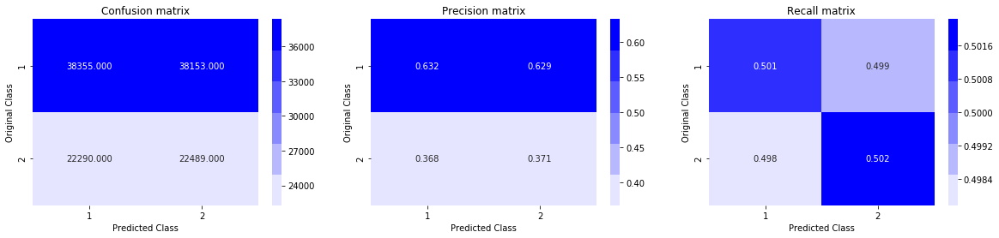

In [82]:
# we need to generate 9 numbers and the sum of numbers should be 1
# one solution is to genarate 9 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
# we create a output array that has exactly same size as the CV data

from sklearn.metrics.classification import accuracy_score, log_loss

predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test, predicted_y, eps=1e-15))

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

##Logistic Regression with hyperparameter tuning

[1e-05, 0.0001, 0.001, 0.01, 0.1, 1, 10]
For values of alpha =  1e-05 The log loss is: 0.4315401684692288
For values of alpha =  0.0001 The log loss is: 0.42386147721888673
For values of alpha =  0.001 The log loss is: 0.4792501650759294
For values of alpha =  0.01 The log loss is: 0.4956402799397207
For values of alpha =  0.1 The log loss is: 0.5170289534134559
For values of alpha =  1 The log loss is: 0.5444887618742672
For values of alpha =  10 The log loss is: 0.5758380952275102


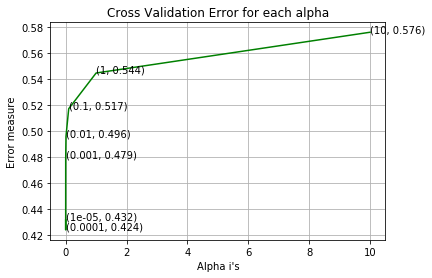

For values of best alpha =  0.0001 The train log loss is: 0.3891075754840594
For values of best alpha =  0.0001 The test log loss is: 0.42386147721888673
Total number of data points : 121287


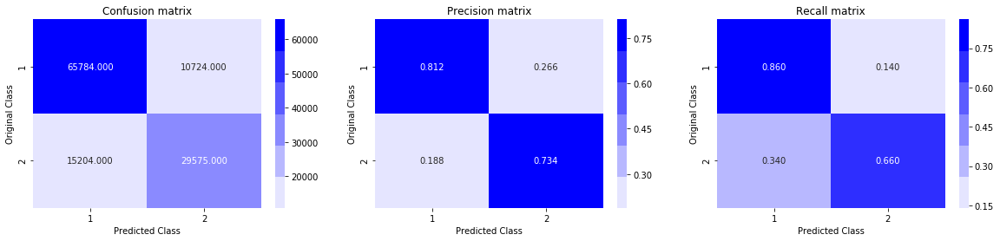

In [88]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import SGDClassifier
from mlxtend.classifier import StackingClassifier

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_recall_curve, auc, roc_curve
from sklearn.calibration import CalibratedClassifierCV

alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.
print(alpha)

log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_te)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(X_tr, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_tr, y_train)

predict_y = sig_clf.predict_proba(X_tr)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_te)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)


<h2> 4.6 Linear SVM with hyperparameter tuning </h2>

For values of alpha =  1e-06 The log loss is: 0.513211839689834
For values of alpha =  1e-05 The log loss is: 0.5160174069478672
For values of alpha =  0.0001 The log loss is: 0.5444625109383455
For values of alpha =  0.001 The log loss is: 0.5523981514632448
For values of alpha =  0.01 The log loss is: 0.5699434878358832
For values of alpha =  0.1 The log loss is: 0.5508106227904552
For values of alpha =  1 The log loss is: 0.6071354556244608
For values of alpha =  10 The log loss is: 0.6505381905588339


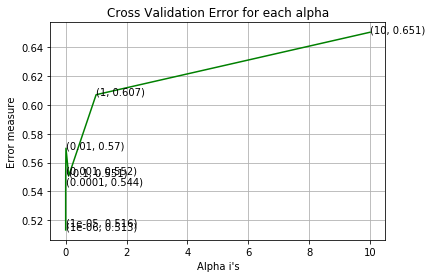

For values of best alpha =  1e-06 The train log loss is: 0.4362632953008896
For values of best alpha =  1e-06 The test log loss is: 0.513211839689834
Total number of data points : 121287


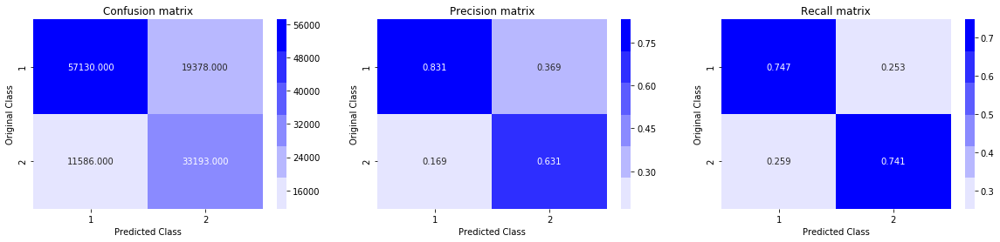

In [90]:
alpha = [10 ** x for x in range(-6, 2)] 

log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l1', loss='hinge', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_te)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l1', loss='hinge', random_state=42)
clf.fit(X_tr, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_tr, y_train)

predict_y = sig_clf.predict_proba(X_tr)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_te)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)


<h2> 4.7 XGBoost </h2>

In [54]:
os.environ['KMP_DUPLICATE_LIB_OK']='True'
final_x = result[0:70000]
final_y = y_train[0:70000]

final_x_te = result_test[0:30000]
final_y_te = y_test[0:30000]

In [55]:
params = {        
    'max_depth': [3, 4, 5, 6, 7, 8],
    'eta' : [0.01, 0.02, 0.05, 0.1, 0.2, 0.3], 
    'n_estimators' : [100, 200, 300, 400, 500],
    'gamma': [0, 0.5, 1, 1.5, 2, 5] 
}


In [56]:
import xgboost as xgb
xgb = XGBClassifier(nthread=1)

In [58]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV

folds = 3
param_comb = 4
skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 42)
random_search = RandomizedSearchCV(xgb, param_distributions=params, n_iter=param_comb, scoring='neg_log_loss', n_jobs=-1, cv=skf.split(final_x,final_y), verbose=2, random_state=42 )

random_search.fit(final_x, final_y)


Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed: 37.4min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed: 37.4min finished


RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x7fa48a4c9d58>,
                   error_score='raise-deprecating',
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=1,
                                           objective...
                                           reg_lambda=1, scale_pos_weight=1,
                                           seed=None, silent=None, subsample=1,
                                           verbosity=1),
                   iid='warn',

In [59]:
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best hyperparameters:')
print(random_search.best_params_)



 Best estimator:
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eta=0.01, gamma=2,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
              nthread=1, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

 Best hyperparameters:
{'gamma': 2, 'n_estimators': 200, 'max_depth': 3, 'eta': 0.01}


In [65]:
import xgboost as xgb

params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.01
params['max_depth'] = 3
params['n_estimators'] = 200
params['gamma'] = 2


d_train = xgb.DMatrix(final_x, label=final_y)
d_test = xgb.DMatrix(final_x_te, label=final_y_te)

watchlist = [(d_train, 'train'), (d_test, 'valid')]

bst = xgb.train(params, d_train, 400, watchlist, early_stopping_rounds=20, verbose_eval=10)

xgdmat = xgb.DMatrix(final_x,final_y)
predict_y = bst.predict(d_test)
#print("The test log loss is:",log_loss(final_y_te, predict_y, eps=1e-15))

[0]	train-logloss:0.69259	valid-logloss:0.692459
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 20 rounds.
[10]	train-logloss:0.68592	valid-logloss:0.686543
[20]	train-logloss:0.680676	valid-logloss:0.681653
[30]	train-logloss:0.676269	valid-logloss:0.677703
[40]	train-logloss:0.672673	valid-logloss:0.674487
[50]	train-logloss:0.669694	valid-logloss:0.671861
[60]	train-logloss:0.667248	valid-logloss:0.669745
[70]	train-logloss:0.66521	valid-logloss:0.668015
[80]	train-logloss:0.663519	valid-logloss:0.66662
[90]	train-logloss:0.662122	valid-logloss:0.66549
[100]	train-logloss:0.660961	valid-logloss:0.664581
[110]	train-logloss:0.659984	valid-logloss:0.663849
[120]	train-logloss:0.65918	valid-logloss:0.663258
[130]	train-logloss:0.658501	valid-logloss:0.662788
[140]	train-logloss:0.657922	valid-logloss:0.662404
[150]	train-logloss:0.657419	valid-logloss:0.662102
[160]	train-logloss:0.656998	valid

In [67]:
from sklearn.metrics.classification import accuracy_score, log_loss

print("The test log loss is:",log_loss(final_y_te, predict_y, eps=1e-15))

The test log loss is: 0.6611854862789313


Total number of data points : 24000


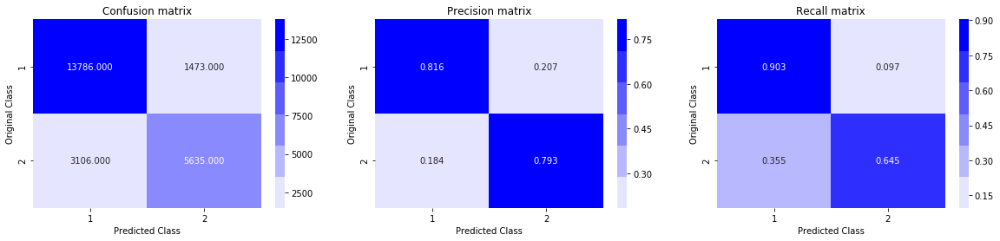

In [110]:
predicted_y =np.array(predict_y>0.5,dtype=int)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(final_y_te, predicted_y)

In [111]:
from prettytable import PrettyTable
#If you get a ModuleNotFoundError error , install prettytable using: pip3 install prettytable

x = PrettyTable()
x.field_names = ["Vectorizer", "Model", "Train log loss", "Test log loss"]
x.add_row(["TFIDF", "Random Model", "-----", 0.8846])
x.add_row(["TFIDF", "Logistic Regression", 0.38, 0.4230])
x.add_row(["TFIDF", "Linear SVM", 0.434, 0.5103])
x.add_row(["TFIDF", "XGBoost", 0.258, 0.372]) 

print(x)

+------------+---------------------+----------------+---------------+
| Vectorizer |        Model        | Train log loss | Test log loss |
+------------+---------------------+----------------+---------------+
|   TFIDF    |     Random Model    |     -----      |     0.8846    |
|   TFIDF    | Logistic Regression |      0.38      |     0.423     |
|   TFIDF    |      Linear SVM     |     0.434      |     0.5103    |
|   TFIDF    |       XGBoost       |     0.258      |     0.378     |
+------------+---------------------+----------------+---------------+


## Step by Step Procedure

- Understanding the Problem Statement

- Checking the dataset 
  - Load the given dataset.
  - It contains 5 columns with question id1, id2, question1,question2 and is_duplicate features.
  - Number of rows 404,290

- Exploratory Data Analysis
   -   Distribution of data points among output classes - Question pairs which are not Similar (is_duplicate = 0) is 63.08%. Question pairs which are Similar(is_duplicate = 1) 36.92%
   - Number of unique questions that appear more than one time: 111780
   - Checked for NULL values and deleted the rows containing them as there are only 3.
 

- Splitting Train and test data to avoid data leakage before feature engineering.
   - Shape of train data (283003, 6)
   - Shape of test data (121287, 6)

- Basic Feature Extraction/Engineering
 - ____freq_qid1____ = Frequency of qid1's
 - ____freq_qid2____ = Frequency of qid2's 
 - ____q1len____ = Length of q1
 - ____q2len____ = Length of q2
 - ____q1_n_words____ = Number of words in Question 1
 - ____q2_n_words____ = Number of words in Question 2
 - ____word_Common____ = (Number of common unique words in Question 1 and Question 2)
 - ____word_Total____ =(Total num of words in Question 1 + Total num of words in Question 2)
 - ____word_share____ = (word_common)/(word_Total)
 - ____freq_q1+freq_q2____ = sum total of frequency of qid1 and qid2 
 - ____freq_q1-freq_q2____ = absolute difference of frequency of qid1 and qid2 

- Cleaning the dataset
  - Remove stopwords
  - Remove punctions
  - Stem the tokens(Potter Stemmer)
  - Remove HTML tags
  - Expand Contractions

- Advance Feature Engineering
  - __cwc_min__ :  Ratio of common_word_count to min lenghth of word count of Q1 and Q2 
  cwc_min = common_word_count / (min(len(q1_words), len(q2_words))

  - __cwc_max__ :  Ratio of common_word_count to max lenghth of word count of Q1 and Q2 <br>cwc_max = common_word_count / (max(len(q1_words), len(q2_words))
  <br>
  
  - __csc_min__ :  Ratio of common_stop_count to min lenghth of stop count of Q1 and Q2 <br> csc_min = common_stop_count / (min(len(q1_stops), len(q2_stops))
  <br>
 
  - __csc_max__ :  Ratio of common_stop_count to max lenghth of stop count of Q1 and Q2<br>csc_max = common_stop_count / (max(len(q1_stops), len(q2_stops))
  <br>
 
  - __ctc_min__ :  Ratio of common_token_count to min lenghth of token count of Q1 and Q2<br>ctc_min = common_token_count / (min(len(q1_tokens), len(q2_tokens))
  <br>
  
  - __ctc_max__ :  Ratio of common_token_count to max lenghth of token count of Q1 and Q2<br>ctc_max = common_token_count / (max(len(q1_tokens), len(q2_tokens))
  <br>

  - __last_word_eq__ :  Check if First word of both questions is equal or not<br>last_word_eq = int(q1_tokens[-1] == q2_tokens[-1])
  <br>
  
  - __first_word_eq__ :  Check if First word of both questions is equal or not<br>first_word_eq = int(q1_tokens[0] == q2_tokens[0])
  <br>
  
  - __abs_len_diff__ :  Abs. length difference<br>abs_len_diff = abs(len(q1_tokens) - len(q2_tokens))
  <br>
  
  - __mean_len__ :  Average Token Length of both Questions<br>mean_len = (len(q1_tokens) + len(q2_tokens))/2
  <br>
  
  - __fuzz_ratio__ 
  <br>
  - __fuzz_partial_ratio__ 
  <br>
  - __token_sort_ratio__ 
  <br>
  - __token_set_ratio__ 
  <br>
  - __longest_substr_ratio__ :  Ratio of length longest common substring to min lenghth of token count of Q1 and Q2
  

- Vectorization using TFIDF
  - Resulting in nearly 7.7k features
  - Prepare the Train and Test Dataset

 - Build a Random Model to estimate the Maximum Loss a Model can have
  - Plot the Confusion matrix, Precision matrix, Recall matrix
  - Got 0.88 as the upper bound for Log- Loss 

 - Build a Logistic Regression Model with Hyperparameter Tuning
   - Set a range of values for alpha ranging from 10^-5 to 10^2 
   - Pick the best performing parameter on Train Data based on Loss on Train-CV. 
   - Consider Log loss and L2 penalty. 
   - Calculate the Loss with the obtained parameter on Test Data. 
   - Plot the Confusion matrix, Precision matrix, Recall matrix.

- Build a Linear SVM Model with Hyperparameter Tuning 
 - Set a range of values for alpha ranging from 10^-6 to 10^2
 - Pick the best performing parameter on Train Data based on Loss on Train-CV. 
 - Consider Hinge Loss and L1 penalty. 
 - Calculate the Loss with the obtained parameter on Test Data.
 - Plot the Confusion matrix, Precision matrix, Recall matrix.

- Build a XGBoost Model with Hyperparameter Tuning
  - Assume 70,000 data points in train and 30K points in test data to avoid longer durations of wait for computations. 
  - Set a range of values for various parameters. 
  - Apply Randomized Search CV as it takes lesser time to compute than Grid Search CV. 
  - Use 3 fold Cross Vaidation. 
  - Pick the best performing parameter on Train Data based on Loss on Train-CV. 
  - Calculate the Loss with the obtained parameter on Test Data. 
  - Plot the Confusion matrix, Precision matrix, Recall matrix